In [1]:
#下面这行代码，是为了把自己编写的代码文件当作一共模块导入，这里是把Utilities文件夹中的plotting.py文件当作python的模块导入，对应的是下面的from plotting import newfig, savefig。路径要随着不同设备的系统做相应的修改
import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../Utilities/') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import math
import pandas as pd #pandas用于处理结构化数据
from scipy.io import savemat #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
from mpl_toolkits.mplot3d import Axes3D #`mpl_toolkits.mplot3d`是`matplotlib`库的一个模块，用于创建三维图形。`Axes3D`是`mpl_toolkits.mplot3d`模块中的一个类，用于创建一个三维的坐标轴。可以在这个坐标轴上绘制三维的图形，如曲线、曲面等。



In [2]:
num_gpus = torch.cuda.device_count()
print('Number of available GPUs: ', num_gpus)

for i in range(num_gpus):
    torch.cuda.set_device(i)
    allocated = torch.cuda.memory_allocated()
    reserved = torch.cuda.memory_reserved()
    print('GPU {}: {}, Allocated: {}, Reserved: {}'.format(i, torch.cuda.get_device_name(i), allocated, reserved))

Number of available GPUs:  2
GPU 0: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


GPU 1: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


In [3]:
torch.cuda.set_device(0) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [4]:
#神经网络：layers代表一个正常的神经网络，在输出层和隐藏层之间插入一个高斯过程层

# the deep neural network
class DNN(torch.nn.Module):
    #第一个方法
    def __init__(self, layers,gamma,num_of_GP): #初始化函数，layers是一个列表，表示每一层的神经元个数，gamma是GP的参数，num_of_GP是GP的参数
        super(DNN, self).__init__() #调用父类的__init__方法进行初始化
        
        # parameters
        self.depth = len(layers) - 1 #定义名为depth的属性，表示神经网络的深度，等于层数-1
        self.num_of_GP = num_of_GP #定义名为num_of_GP的属性，表示GP的参数
        self.gamma = gamma #定义名为gamma的属性，表示GP的参数
        
        # set up layer order dict
        self.activation = torch.nn.Tanh #设置激活函数为tanh
         
        layer_list = list() #定义一个空列表layer_list
        for i in range(self.depth - 1):  #循环depth次
            #将每一层（全连接层）添加到layer_list中
            layer_list.append(('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1])))
            #将每一层的激活函数添加到layer_list中
            layer_list.append(('activation_%d' % i, self.activation()))

        #循环结束后，将最后一层的线性变换添加到layer_list中（因为没有激活函数了）
        layer_list.append(('layer_%d' % (self.depth - 1), torch.nn.Linear(self.num_of_GP, layers[-1], bias=False)))
        #然后使用OrderedDict将layer_list中的元素转换为有序字典
        layerDict = OrderedDict(layer_list)
        
        # deploy layers，将layerDict转换为一个神经网络模型，赋值给self.layers
        self.layers = torch.nn.Sequential(layerDict)
    

        # Initialize weights
        self._initialize_weights()  

        # # Initialize beta for the output layer
        # self.beta = torch.nn.Parameter(torch.randn(layers[-1], 1))  # 初始化回归权重矩阵beta

        # Initialize GP_W and GP_b
        self.GP_W = torch.randn(layers[-2], self.num_of_GP) * math.sqrt(2 * self.gamma)  # 初始化GP_W
        self.GP_b = torch.rand(1, self.num_of_GP) * 2 * math.pi  # 初始化GP_b

    def _initialize_weights(self):
        for idx, m in enumerate(self.layers): #遍历神经网络模型的每一层，获取每一层的索引idx和层对象m(注意这里idx会包括激活函数，也占一个idx)
            if isinstance(m, torch.nn.Linear): #判断层对象m是否是全连接层

                # 自定义初始化函数
                fan_in = m.weight.size(0)  # 输入单元数量
                fan_out = m.weight.size(1)  # 输出单元数量
                std = (2 / (fan_in + fan_out)) ** 0.5  # 计算标准差
                
                with torch.no_grad():
                    m.weight.normal_(0, std)  # 使用自定义标准差初始化权重
                if m.bias is not None: #若存在偏置
                    torch.nn.init.zeros_(m.bias) #使用常数初始化方法初始化偏置，初始化为0
                
                #谱归一化权重
                if idx > 0 and idx < len(self.layers) - 2: #不归一化输入层和输出层
                #注意这里其实idx包含了激活函数，例如对于[1,50,50,50,50,1]，这里共有6层，但是idx应该是9，因为四个隐藏层+四个激活函数+输出层。所以因为idx0是全连接层，最后一个idx为输出层，因此这样做是可以剔除第一个权重和最后一个权重的
                    with torch.no_grad(): #确保归一化过程中不进行梯度计算
                        norm = m.weight.norm(2) #计算该层权重的二范数
                        if norm > 0.99: #若二范数大于0.99
                            m.weight.mul_(0.99 / norm) #将权重乘以0.99/norm，使得二范数等于0.99
    
    #第二个方法，前向传播
    def forward(self, X, lb, ub):  # 接收输入x
        device = X.device  # 获取输入张量的设备
        self.GP_W = self.GP_W.to(device)  # 将GP_W移动到相同设备
        self.GP_b = self.GP_b.to(device)  # 将GP_b移动到相同设备

        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内


        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）


        # 在最后一个隐藏层和输出层之间添加一层高斯过程层
        H1 = torch.matmul(H, self.GP_W) + self.GP_b  # 计算H1
        Fai = math.sqrt(2 / self.num_of_GP) * torch.cos(H1)  # 计算Fai
        H = Fai  # 更新H为Fai

        # 输出层
        out = self.layers[-1](H)  # 计算输出

        return out  # 返回输出out
    
    #第三个方法，获取hidden输出（为uncertainty服务）
    def dnn_for_hidden_features(self, X, lb, ub):  # 接收输入x
        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内
        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）

        # 在最后一个隐藏层和输出层之间添加一层高斯过程层
        H1 = torch.matmul(H, self.GP_W) + self.GP_b  # 计算H1
        Fai = math.sqrt(2 / self.num_of_GP) * torch.cos(H1)  # 计算Fai

        return H, Fai  # 返回输出out
    
    
    #第四个方法，获取最后一个隐藏层的输出（为chaos服务）
    def hidden_output(self, X, lb, ub):
        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内
        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(-2是激活函数，-3是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(-2是激活函数，-3是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）
        return H

In [5]:
# the physics-guided neural network
class PhysicsInformedNN():
    # Initialize the class
    def __init__(self, X_u, u, X_f, layers, lb, ub, nu, X_star, u_star, gamma, num_of_GP): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数

        self.gamma = gamma
        self.num_of_GP = num_of_GP

        
        
        # boundary conditions
        #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.lb = torch.tensor(lb).float().to(device) #创建一个pytorch张量（数据来源于lb），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.ub = torch.tensor(ub).float().to(device)
        
        # data
        #创建四个pytorch张良，将X_u的第一列赋值给self.x_u，将X_u的第二列赋值给self.t_u。转换为浮点类型，移动到指定设备上，并且这几个张量都需要计算梯度
        self.x_u = torch.tensor(X_u[:, 0:1], requires_grad=True).float().to(device)
        self.t_u = torch.tensor(X_u[:, 1:2], requires_grad=True).float().to(device)
        self.x_f = torch.tensor(X_f[:, 0:1], requires_grad=True).float().to(device)
        self.t_f = torch.tensor(X_f[:, 1:2], requires_grad=True).float().to(device)

        self.x_star = torch.tensor(X_star[:, 0:1], requires_grad=True).float().to(device)
        self.t_star = torch.tensor(X_star[:, 1:2], requires_grad=True).float().to(device)

        
        self.u = torch.tensor(u).float().to(device)
        self.u_star = torch.tensor(u_star).float().to(device)
        
        self.layers = layers
        self.nu = nu
        
        # deep neural networks
        self.dnn = DNN(layers,gamma,num_of_GP).to(device) #创建一个DNN类的实例，传入layers参数来实现神经网络的初始化，然后将这个实例移动到指定的设备上

        
        # optimizers: using the same settings
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        self.optimizer_LBFGS = torch.optim.LBFGS(
            self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重与偏置）
            lr=1.0,  #学习率设置为1
            max_iter=50000,  #最大迭代次数为50000
            max_eval=50000,  #最大评估次数为50000
            history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
            # tolerance_grad=1e-10,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
            # tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
            line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        )

        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())

        #创建第三个优化器，括号内为要优化的参数，使用SGD优化方法
        self.optimizer_SGD = torch.optim.SGD(self.dnn.parameters(), lr=0.01, momentum=0.9)

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=1),self.lb,self.ub)  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        return u
    
    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """
        u = self.net_u(x, t) #调用上面的net_u函数，计算神经网络的输出u
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f = u_t + u * u_x - self.nu * u_xx #计算f，定义见论文
        return f
    
    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
        
        u_pred = self.net_u(self.x_u, self.t_u) #调用之前定义的函数，传入参数得到神经网络的输出u
        f_pred = self.net_f(self.x_f, self.t_f) #调用之前定义的函数，传入参数计算得到f
        loss_u = torch.mean((self.u - u_pred) ** 2) #计算loss_u，定义见论文
        loss_f = torch.mean(f_pred ** 2) #计算loss_f，定义见论文
        
        loss = loss_u + loss_f #计算总的loss
        
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        self.iter += 1 #每调用一次损失函数，迭代次数加1

        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        #record the test error
        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u_real_pred = self.net_u(self.x_star, self.t_star) #调用之前定义的函数，传入参数得到神经网络的输出u

        error_test = torch.norm(self.u_star-u_real_pred,2)/torch.norm(self.u_star,2)

        self.test_error.append(error_test)
        return loss
      
    
    def train(self, nIter, nIterLBFGS):

        #使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            u_pred = self.net_u(self.x_u, self.t_u) #调用之前定义的函数，传入参数得到神经网络的输出u
            f_pred = self.net_f(self.x_f, self.t_f) #调用之前定义的函数，传入参数计算得到f
            loss = torch.mean((self.u - u_pred) ** 2) + torch.mean(f_pred ** 2) #计算损失函数
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            
            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

            # record the test error
            self.dnn.eval() #将神经网络切换为评估模式
            with torch.no_grad():
                u_real_pred = self.net_u(self.x_star, self.t_star) #调用之前定义的函数，传入参数得到神经网络的输出u

            error_test = torch.norm(self.u_star-u_real_pred,2)/torch.norm(self.u_star,2)

            self.test_error.append(error_test)
    
        
        #使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func) #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化

  

    def predict(self, X):
        x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(X[:, 1:2], requires_grad=True).float().to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        u = self.net_u(x, t) #调用之前定义的函数得到神经网络的输出u,以及f
        f = self.net_f(x, t)
        u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        f = f.detach().cpu().numpy()
        return u, f
    

    
    #sngp，用于获取之后的不确定度
    def net_for_hidden_features(self, X):
        self.dnn.eval() #将神经网络切换为评估模式
        # x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device)
        X = torch.tensor(X, requires_grad=True).float().to(device)


        H,Fai = self.dnn.dnn_for_hidden_features(X, self.lb, self.ub)
        H = H.detach().cpu().numpy()
        Fai = Fai.detach().cpu().numpy()
        return H,Fai
    

    #获取chaos
    def hidden_predict(self, x, t):
        x = torch.tensor(x, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(t, requires_grad=True).float().to(device)
        self.dnn.eval()
        hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=1), self.lb, self.ub)
        hidden_output_x = hidden_output[:, 0]
        hidden_output_t = hidden_output[:, 1]
        hidden_output_x = hidden_output_x.detach().cpu().numpy()
        hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output_x, hidden_output_t

In [6]:
#定义采样函数，目的是采用sampler方法，生成n_samples个在指定空间内的准随机样本，这里space为二维的，因此每个样本都是一个二维点，即n_samples*2的数据点

#共有6种采样器，分别是LHS、Halton、Hammersley、Sobol、Grid和Random，均为均匀采样方法

def caiyang(n_samples, sampler): #接受两个参数，n_samples是样本数量，sampler是采样器名称，是一个字符串
    space = [(-1.0, 1.0), (0.0, 1.0)] #指定样本生成的空间，一个二维空间，第一个维度是-1到1，第二个维度是0到1

    #根据sampler的不同，选择不同的采样器，返回的sampler是一个采样器对象
    if sampler == "LHS": #如果采样器是LHS（拉丁超采样，每个维度都被均匀划分为等量区间，每个样本都是从每个维度的一个区间中随机选取的）
        sampler = skopt.sampler.Lhs(lhs_type="centered", criterion="maximin", iterations=1000) #第一个参数表示如何从每个区间选取样本，这里表示从每个区间的中心选取样本；第二个参数表示如何划分区间，这里表示尽可能使样本之间的最小距离最大；第三个表示通过优化过程得到样本量的迭代次数（即会尝试1000种不同的样本配置，并最终选择质量最好的那个）
    elif sampler == "Halton": #Halton序列是一种低差异序列，用于在高维空间中生成点
        sampler = skopt.sampler.Halton(min_skip=-1, max_skip=-1)  #两个参数用于控制序列的起始点，Halton序列可以通过跳过序列的前几个点来改变序列的七十点。两个参数分别制定了跳过点的最小和最大数量，这里-1表示不跳过任何点
    elif sampler == "Hammersley": #Hammersley序列是一种低差异序列，用于在高维空间中生成点
        sampler = skopt.sampler.Hammersly(min_skip=-1, max_skip=-1) #两个参数用于控制序列的起始点，Hammersley序列可以通过跳过序列的前几个点来改变序列的七十点。两个参数分别制定了跳过点的最小和最大数量，这里-1表示不跳过任何点
    elif sampler == "Sobol":
        # Remove the first point [0, 0, ...] and the second point [0.5, 0.5, ...], which are too special and may cause some error.
        # Sobol采样器的实现有一个问题，即生成的前两个样本点通常不是随机的而是固定的，Sobol序列的前两个点（[0, 0, ...]和[0.5, 0.5, ...]）在许多情况下都被认为是“特殊”的点，可能会对某些计算产生不利影响。因此设置跳过前两个点，而且skopt库在0.9版本号取消了max/min_skip参数，所以需要根据skopt的版本号来选择不同的参数
        if LooseVersion(skopt.__version__) < LooseVersion("0.9"): #先检查skopt的版本是否大于0.9,若小于
            sampler = skopt.sampler.Sobol(min_skip=2, max_skip=2, randomize=False) #则使用Sobol采样器，min_skip和max_skip表示跳过的点的数量，这里表示跳过前两个点，randomize表示是否随机化
        else: #若skopt的版本大于0.9
            sampler = skopt.sampler.Sobol(skip=0, randomize=False) #则使用Sobol采样器，skip表示跳过的点的数量，这里表示不跳过任何点，randomize表示是否随机化 
            return np.array(sampler.generate(space, n_samples + 2)[2:]) #生成n_samples+2个样本，然后返回除了前两个样本之外的所有样本，也就是返回n_samples个样本，每个样本都是一个二维点，且范围在指定的空间space里面
    elif sampler == "Grid":
        x_min, x_max = space[1]
        t_min, t_max = space[0]
        
        # 计算每个维度的网格大小
        x_grid_size = (x_max - x_min) / (n_samples // int(np.sqrt(n_samples)) - 1) # x维度上（纵轴），每行有10个点
        t_grid_size = (t_max - t_min) / int(np.sqrt(n_samples))  # 
        
        # 生成等距均匀网格采样点
        samples = []
        for i in range(n_samples // int(np.sqrt(n_samples))):
            for j in range(int(np.sqrt(n_samples))):
                # 计算每个网格单元的中心点
                x = x_min + i * x_grid_size
                t = t_min + j * t_grid_size
                samples.append([t, x])
        
        return np.array(samples)
    
    elif sampler == "Random":
        # 从space中提取出x_min, x_max, t_min, t_max
        x_min, x_max = space[1]
        t_min, t_max = space[0]

        # 生成x和t的随机数
        x = np.random.rand(n_samples, 1) * (x_max - x_min) + x_min
        t = np.random.rand(n_samples, 1) * (t_max - t_min) + t_min

        # 将x和t合并为一个(n_samples, 2)的数组
        samples = np.hstack((t, x))
        return samples #生成一个形状为(n_samples, 2)的随机数组



    return np.array(sampler.generate(space, n_samples)) #生成n_samples个样本，每个样本都是一个二维点，且范围在指定的空间space里面（n_samples*2）

In [7]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [8]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter):
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    # 利用x0和t0计算x{t}和t{t}，存储在xs中
    xs = [] #初始化xs
    x,t = model.hidden_predict(x0,t0) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    
    # 迭代预测
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        xs.append([x,t]) #将x的数据添加到xs中
    #最后得到的xs是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应原始采样点的迭代结果


    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    x,t = model.hidden_predict(x1,t1) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）

    # 迭代预测（扰动后）
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)
        xs1.append([x,t]) #将x的数据添加到xs1中
    #最后得到的xs1是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应加了扰动后的采样点的迭代结果

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    #这两个数组的形状均为(2,N_f_new,1)，第一个代表x和t，第二个代表N_f_new个样本点得到的结果，第三个代表1个数

    # 计算这两个点的欧氏距离
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=0)
    #得到的是一个形状为（N_f_new,1）的数组，每个元素代表了两个点之间的欧氏距离，这里点在xt平面上

    distances = distances.flatten()

    # 对distances进行归一化前，检查分母是否接近零
    # norm = np.linalg.norm(distances)
    # if norm < 1e-10:  # 1e-10是一个非常小的数，用于检测norm是否接近于零
    #     distances = np.zeros_like(distances)  # 如果分母接近0，将distances设置为全零数组，因为范数为0时，distances中的值想对于彼此几乎没有差异，意味着所有点都几乎处于同一混沌度水平
    # else:
    #     distances = distances / norm

    # 现在可以安全地根据distances对点进行排序，即使在所有值都相同的情况下

    return distances

In [9]:
#计算不确定度（基于高斯过程和谱归一化）
def Cov_matrix(X, gamma):
    # 将输入数据转换为 PyTorch 张量，并移动到 GPU 上
    X = torch.tensor(X, dtype=torch.float64).cuda()
    gamma = torch.tensor(gamma, dtype=torch.float64).cuda()

    n = X.shape[0]
    Cov_x_x = torch.zeros((n, n), dtype=torch.float64).cuda()

    for i in tqdm(range(n), desc="ncross"):
        xi = X[i:i+1, :]
        dij = torch.sum((xi - X) ** 2, dim=1)
        Cov_x_x[i, :] = torch.exp(-gamma * dij)

    # 将结果从 GPU 移动到 CPU，并转换为 NumPy 数组
    return Cov_x_x.cpu().numpy()

def Cov_cross_matrix(X1, X2, gamma):
    # 将输入数据转换为 PyTorch 张量，并移动到 GPU 上
    X1 = torch.tensor(X1, dtype=torch.float64).cuda()
    X2 = torch.tensor(X2, dtype=torch.float64).cuda()
    gamma = torch.tensor(gamma, dtype=torch.float64).cuda()

    n_1 = X1.shape[0]
    n_2 = X2.shape[0]
    Cov_X1_X2 = torch.zeros((n_1, n_2), dtype=torch.float64).cuda()

    for i in tqdm(range(n_1), desc='cross'):
        xi = X1[i:i+1, :]
        dij = torch.sum((xi - X2) ** 2, dim=1)
        Cov_X1_X2[i, :] = torch.exp(-gamma * dij)

    # 将结果从 GPU 移动到 CPU，并转换为 NumPy 数组
    return Cov_X1_X2.cpu().numpy()

def calculate_inverse(Matrix, epsilon=1e-10):
    rho_orig = torch.tensor(Matrix, dtype=torch.float64).cuda()
    rho_reg = rho_orig + epsilon * torch.eye(rho_orig.shape[0], dtype=torch.float64).cuda()
    inv_rho = torch.inverse(rho_reg)
    return inv_rho.cpu().numpy()

def calculate_uncertainty(model, X_new, X_f, X_u, gamma): #X_new代表新点，X_f代表训练过的配位点，X_u表示训练过的初边界值点
    X_past = np.concatenate((X_u, X_f),0) #X_past=[X_u;X_f]

    Hidden_pred_small, Fai_pred_small = model.net_for_hidden_features(X_new) #新选出来的点
    X_xin = Hidden_pred_small

    Hidden_pred_all, Fai_pred_all = model.net_for_hidden_features(X_past) #已经训练过的点
    X = Hidden_pred_all

    Cov_xin_xin = Cov_matrix(X_xin, gamma) ##形状为（新选出来的点的数量，新选出来的点的数量）（即X_xin的行数，X_xin的行数）
    Cov_X_X = Cov_matrix(X, gamma) #形状为（已经训练过的点的数量，已经训练过的点的数量）（即X的行数，X的行数）
    Cov_xin_X = Cov_cross_matrix(X_xin, X, gamma) #形状为（新选出来的点的数量，已经训练过的点的数量）

    Cov_X_xin = Cov_xin_X.T
    
    sigma_2= Cov_xin_xin - np.matmul(np.matmul(Cov_xin_X, calculate_inverse(Cov_X_X)), Cov_X_xin) #计算方差，这个其实就是不确定度，论文中的方差
    
    sigma_2 = np.diag(sigma_2)
    sigma_2 = np.abs(sigma_2)
    sigma = np.sqrt(sigma_2)
    sigma = sigma[:, np.newaxis] #这一步目的是讲形状为(n,)的数组转换为(n,1)的数组,n为新选出来点的数量，即上面X_xin的行数
    #得到的sigma是标准差（论文中的）这几部是为了保证计算的稳定性和正确性，直接开根号也可以
    sigma = sigma.flatten()

    return sigma

In [10]:
# #定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
# def MC_dropout_uncertainty(model, X, n_dropout = 10):
#     """
#     计算模型MC dropout不确定度的函数。
#     参数:
#     - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
#     - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
#     - num_iter: MC dropout进行前向传播的次数
#     返回:
#     - u_var: 每个采样点的不确定度，形状为(N_f_new,)。
#     """
#     U = []
#     for _ in range(n_dropout):
#         u_pred = model.dropout_predict(X)
#         U.append(u_pred)
#     #最后得到的U是是一个长度为n_dropout的列表，列表每个元素均为一个数组，数组的形状为(len(t)*len(x),1)，即每行是一个点的预测值
#     U = np.hstack(U) #按列堆叠数组，即将U中的每个数组按列合并，得到一个新的数组U，形状为(len(t)*len(x),n_dropout)，每行是一个点在MC dropout下前向传播n_dropout次得到的输出
#     u_means = np.mean(U, axis=1).reshape(-1,1) #对每一行（按列）求平均，每一行是E(y)（对应一个x），然后将其转换为二维数组(形状为(len(t)*len(x),1))
#     u_var = np.mean((U - u_means) ** 2, axis=1).reshape(-1,1) #对每一行（按列）求方差，每一行是Var(y)（对应一个x），然后将其转换为二维数组(形状为(len(t)*len(x),1))
#     #最后获得的u_var就相对于是每个点的不确定度
#     u_var = u_var.flatten()

#     return u_var

In [11]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 21, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]

nu = 0.01/np.pi
#设置噪声水平为0
noise = 0.0        

N_u = 100
N_f = 5000 #配位点数量
N_epoch = 50000 #迭代次数

gamma = 5.0 #GP参数
num_of_GP = 1024 #GP参数


#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
layers = [2, 20, 20, 20, 20, 20, 20, 20, 20, 2, 1]
#读取名为burgers_shock的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改 
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组         

# Doman bounds，分别获得X_star的相应列上的最小值和最大值，赋值给lb和ub,也就是说lb是x和t的最小值，ub是x和t的最大值，即lb和ub分别为[-1,0]和[1,1]
lb = X_star.min(0)
ub = X_star.max(0)    


#生成初值和边界值的训练基础数据
xx1 = np.hstack((X[0:1,:].T, T[0:1,:].T)) #分别取X，T的第一行的转置(分别是x和全0列)，分别构成xx1的第一列和第二列
uu1 = Exact[0:1,:].T #取Exact的第一行的转置，赋值给uu1
xx2 = np.hstack((X[:,0:1], T[:,0:1])) #分别取X，T的第一列(分别是全-1列和t)，分别构成xx2的第一列和第二列
uu2 = Exact[:,0:1] #取Exact的第一列，赋值给uu2
xx3 = np.hstack((X[:,-1:], T[:,-1:])) #分别取X，T的最后一列(分别是全1列和t)，分别构成xx3的第一列和第二列
uu3 = Exact[:,-1:] #取Exact的最后一列，赋值给uu3

X_u_train_all = np.vstack([xx1, xx2, xx3]) #X_u_train=(xx1;xx2;xx3)

u_train_all = np.vstack([uu1, uu2, uu3]) #u_train=(uu1;uu2;uu3)

# #生成配位点训练基础数据
# X_f_train = quasirandom(N_f, "LHS")  #lhs函数采用拉丁超采样方法，生成一个近似均匀分布的多维样本点集，表示生产的样本有两个特征，共N_f个样本数量，所以返回的是一个形状为（N_f，2）的数组，每一行都是一个2维的样本点，所有样本点都在[0,1]范围内，并对该样本集进行缩放，把每个样本从[0,1]区间缩放到[lb,ub]区域内，即得到了指定范围内均匀分布的样本X_f_train。

# X_f_train = np.vstack((X_f_train, X_u_train)) #按行堆叠数组，即将X_f_train和X_u_train按行合并，得到一个新的数组X_f_train


error_u = [] #创建一个空列表，用于存储误差值

i = 0 #初始化i为0

for seed in seeds:
    set_seed(seed) #设置随机数种子

    

    #1.生成初值边界值训练数据，以及测试数据

    #从所有的初值边界值训练基础数据中选取N_u=100个点
    idx = np.random.choice(X_u_train_all.shape[0], N_u, replace=False) #从0~数组X_u_train的行数 中随机选择N_u个数，replace=False表示不允许重复选择，最后将这N_u个数赋值给idx
    X_u_train = X_u_train_all[idx, :] #从X_u_train中选取idx对应的的N_u行，赋值给X_u_train
    u_train = u_train_all[idx,:] #从u_train中选取idx对应的的N_u行，赋值给u_train


    #2.生成配位点并进行训练



    num_iter = 100 #chaos迭代次数

    #先训练500次
    #采样配位点10个
    N_f_1 = N_f//100 #N_f_1=50
    X_f_train = caiyang(N_f_1, "LHS") #生成50个样本点，每个样本点都是一个二维点，即50*2的数据点

    #创建PINN模型并输入各种参数     
    model = PhysicsInformedNN(X_u_train, u_train, X_f_train, layers, lb, ub, nu, X_star, u_star, gamma, num_of_GP)



    #获取当前时间并赋值给start_time  
    start_time = time.time()   
    #开始训练模型            
    model.train(N_epoch//100,0)


    #训练结束后，每500次迭代重采样一次100个点，并选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练50000次
    for iter in range(N_epoch//100+1, N_epoch+1, N_epoch//100): #每500次迭代
        N_f_new = N_f_1 * 10 #重新采样100个点
        # 生成新的X_f_train数据
        X_f_train_new = caiyang(N_f_new, "LHS") #生成500个样本点，每个样本点都是一个二维点，即500*2的数据点

        #计算MC dropout不确定度
        uncertainties = calculate_uncertainty(model, X_f_train_new, X_f_train, X_u_train, gamma)

        #计算混沌度
        distances = calculate_chaos(model, X_f_train_new, num_iter)

        #计算残差
        _, residual = model.predict(X_f_train_new)
        # 计算残差的绝对值
        abs_residual = np.abs(residual)
        #将二维数组转换为一维数组
        abs_residual = abs_residual.flatten()


        #对distances进行归一化
        distances = distances / np.linalg.norm(distances)
        #对uncertainties进行归一化
        uncertainties = uncertainties / np.linalg.norm(uncertainties)
        #对abs_residual进行归一化
        abs_residual = abs_residual / np.linalg.norm(abs_residual)


        xinxi = distances + uncertainties + abs_residual #将三个归一化后的数组相加，得到新的数组xinxi
        # xinxi = distances

        # 找出绝对值最大的10个值的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:] #该函数会对数组进行排序，使得指定的k个最大值出现在数组的最后k给位置上，并获取最后1000个元素

        # 使用这些索引来提取对应的数据
        X_f_train_topk = X_f_train_new[topk_indices]

        X_f_train = np.vstack((X_f_train, X_f_train_topk)) #与之前的训练数据合并

        # 更新模型中的X_f_train数据
        model.x_f = torch.tensor(X_f_train[:, 0:1], requires_grad=True).float().to(device)
        model.t_f = torch.tensor(X_f_train[:, 1:2], requires_grad=True).float().to(device)

        # 在更新数据后的模型上进行训练500次
        model.train(N_epoch//100,0)



    model.train(0,N_epoch//100) #使用LBFGS训练500次
    #所有训练结束后获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time
    #打印训练所花时间                
    print('Training time: %.4f' % (elapsed))

    # 训练结束后，再次使用模型进行预测，并计算误差
    u_pred, f_pred = model.predict(X_star)
    error_u.append(np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)) #计算误差，然后将误差添加到error_u列表中

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<01:25,  5.86it/s]

Adam:   1%|▏         | 7/500 [00:00<00:17, 28.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 36.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:11, 43.54it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 45.37it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.57it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.90it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.43it/s]

Adam:   9%|▉         | 46/500 [00:01<00:08, 52.21it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.83it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.74it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 54.89it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.54it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.71it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.69it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.38it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.76it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.46it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.47it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.89it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.54it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.57it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.77it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.60it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.24it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.83it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 53.14it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 54.04it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 55.15it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.03it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.18it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.71it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.20it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.08it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.47it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.73it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 56.36it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 56.56it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.48it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.02it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.75it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.66it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 58.11it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.80it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.11it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 57.65it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 56.44it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.46it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.81it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.91it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.51it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.53it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.02it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.47it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.33it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.84it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.22it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.14it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.67it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.15it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.31it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.85it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.55it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.25it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.02it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.21it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.32it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.57it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.12it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.23it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.66it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.31it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.66it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.07it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.35it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.98it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.39it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.17it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.75it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.35it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.09it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.63it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.55it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9279.23it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 11304.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11369.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.05it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.46it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.79it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.16it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.54it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.19it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.69it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.05it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.68it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.36it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.12it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.66it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.11it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.21it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.97it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.39it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.56it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.17it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.83it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.13it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.62it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.39it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.93it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.28it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.49it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.13it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.73it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.52it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.76it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.77it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.99it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.78it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.27it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.63it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.15it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.34it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.85it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.20it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.13it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.71it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.15it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.12it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.29it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.31it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.22it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.04it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.14it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.12it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.81it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.50it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.66it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.53it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.75it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.28it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.04it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.97it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.46it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.46it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.72it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.65it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.65it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.03it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 48.00it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.12it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.70it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8998.68it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 7426.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8092.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.57it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.50it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.32it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.08it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.29it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.50it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.80it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.66it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.82it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.90it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.56it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.37it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.76it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.10it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.38it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.54it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.33it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.17it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.41it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.06it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.66it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.33it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.22it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.22it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.23it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.66it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.76it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.03it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.94it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.62it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.42it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.12it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.08it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.76it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.51it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.44it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.19it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.61it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.46it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.29it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.50it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.27it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.58it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.91it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.24it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.77it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.99it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.19it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.17it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.95it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 57.52it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.90it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 58.19it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.59it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.39it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.01it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.22it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.37it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.29it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.08it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.22it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.08it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.68it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.39it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.40it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.04it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.93it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.19it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.16it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11433.98it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 8924.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10989.23it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.48it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.64it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.59it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.00it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.28it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.83it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.21it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.01it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.77it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.71it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.23it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.13it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.03it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.90it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.62it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.82it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.38it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.64it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.94it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.38it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.21it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.09it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.59it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.81it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.88it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.76it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.70it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.36it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.55it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.41it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.50it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.02it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.51it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.11it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.34it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.44it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.50it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.19it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.17it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.11it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.11it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.87it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.48it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.86it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.08it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.94it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.08it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.63it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 51.14it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.05it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.48it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.56it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.43it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.81it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.71it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.11it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.78it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.42it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.67it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.47it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.04it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.70it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.81it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.93it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.91it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.58it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.29it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.91it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11397.69it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 9469.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8182.48it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.94it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.16it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.07it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 54.00it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 52.39it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 52.93it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.41it/s]

Adam:  10%|▉         | 49/500 [00:00<00:09, 49.50it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.42it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.73it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.52it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.79it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.87it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.30it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.72it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.49it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.20it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.87it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.76it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.43it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.48it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.36it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.01it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.66it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.03it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.17it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 55.16it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.55it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.47it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.06it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.52it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 51.10it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.56it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 51.60it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.46it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.77it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.26it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.50it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.23it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.08it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.65it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.10it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.92it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.74it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.34it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.56it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.89it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.43it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.97it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.92it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.62it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.45it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.88it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.88it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.53it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.03it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.07it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.75it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.85it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.33it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.36it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 55.11it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.72it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.01it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.29it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.21it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.23it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.29it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.00it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 51.55it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.55it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.55it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.92it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.48it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.89it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.38it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.85it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.37it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.40it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 56.15it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 56.35it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 56.80it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 57.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9395.38it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 4654.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9331.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.46it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.58it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.58it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.03it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.11it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.41it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.51it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.87it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.66it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.58it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.68it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.21it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.90it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.42it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.90it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.91it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.10it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.93it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.81it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.47it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.13it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.46it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.83it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.48it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.22it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.93it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.27it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.01it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.50it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.12it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 50.48it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.47it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.57it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.55it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.25it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.28it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 60.69it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 65.83it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 69.43it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 72.71it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 74.43it/s]

Adam:  70%|███████   | 350/500 [00:06<00:01, 75.01it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 65.51it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 63.40it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.03it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.94it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.77it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.21it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.08it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.96it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.93it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.50it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.81it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.38it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.41it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.91it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.23it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.21it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.59it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.75it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.26it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.21it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.62it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.88it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 52.18it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10307.49it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 10607.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10704.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.41it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.80it/s]

Adam:   4%|▍         | 21/500 [00:00<00:06, 68.44it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 70.67it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.78it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.14it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 52.76it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 51.56it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.96it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.82it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.65it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.49it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.84it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.39it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.39it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 51.31it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.17it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.24it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.38it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 53.02it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.72it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.01it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.41it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.60it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.02it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.90it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.87it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.93it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.56it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.98it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.24it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.35it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 51.06it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 50.76it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.63it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.97it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.55it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.16it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.46it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 49.20it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 48.08it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 45.69it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.02it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 46.67it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.86it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.87it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.66it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.80it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.87it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.80it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.13it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.51it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.05it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.98it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.18it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.52it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.12it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.42it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.64it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.24it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.80it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.30it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.21it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.06it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 54.39it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.19it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.60it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.40it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.78it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.19it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 55.05it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.10it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.49it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.18it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.74it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.51it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.02it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.37it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.54it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.16it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.81it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.58it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11624.82it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 7348.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6079.18it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.14it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.86it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.94it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.31it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.11it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.61it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.90it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.40it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.23it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.10it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.20it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.50it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.80it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.07it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 56.23it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.20it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.81it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.77it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.02it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.52it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.57it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.25it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.55it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.00it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.03it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.70it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.66it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.00it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.08it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.24it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.29it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.11it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.93it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.09it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.82it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.12it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.02it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.56it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.17it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.66it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.87it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.19it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.30it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.76it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.85it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.11it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.64it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.78it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.40it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.95it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.64it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.22it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.78it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.90it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.78it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.47it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.34it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.17it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.00it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.18it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.94it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.72it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.49it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.82it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.74it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7606.48it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8209.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8429.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.85it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.02it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.64it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.99it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.16it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 44.96it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.07it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 42.95it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:10, 41.92it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:10, 40.53it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:10, 39.93it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:10, 40.02it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:09, 41.97it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 44.70it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.44it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.04it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.59it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.14it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.45it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.64it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 50.91it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 51.08it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.32it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.54it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.27it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.78it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.25it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.16it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.89it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 52.50it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.02it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.08it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.26it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.40it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.39it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.28it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.54it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.18it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 52.65it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 52.66it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.14it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.53it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.19it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.32it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.57it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.18it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.55it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 54.16it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 54.85it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.59it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.29it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.65it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.03it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.35it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.45it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.92it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.89it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.83it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.95it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.79it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.81it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.68it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.91it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.91it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 53.30it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.45it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.97it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.17it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.77it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.72it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.75it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.73it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.34it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 53.31it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 53.90it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.93it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.55it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.81it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.98it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11097.28it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 7956.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9088.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.26it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.87it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.10it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.47it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.25it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.98it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.30it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.79it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.98it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.16it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.09it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.01it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.64it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.45it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.93it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.17it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.28it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.23it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.80it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.71it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.48it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.71it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.03it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.78it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.69it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.58it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.06it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.35it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.16it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.32it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.32it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.07it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.15it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.91it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.08it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.88it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.78it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.75it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 55.19it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.71it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.51it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.10it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.83it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.95it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.26it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.65it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.02it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 55.49it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.64it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.94it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.19it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.86it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.67it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.89it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.35it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.90it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 55.29it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.61it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.95it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.39it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.88it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.84it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.37it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.86it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.64it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.67it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.07it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10156.73it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 8901.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7679.32it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.38it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.25it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.05it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.50it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.39it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.68it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.40it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.87it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.01it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.04it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.26it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.34it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.41it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.74it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.37it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.61it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.03it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.13it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.70it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.91it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 48.44it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 48.80it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.36it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.67it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.08it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.93it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.46it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.94it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.30it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.66it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.63it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.89it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.25it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.68it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.39it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.11it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.88it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.56it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.55it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.39it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.70it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.55it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.70it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.64it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.22it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.86it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.14it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.84it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.57it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.37it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.43it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.13it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.87it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.02it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.32it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.96it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.10it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.87it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.93it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.50it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.15it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.08it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.03it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.75it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.83it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.52it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.57it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.60it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.52it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.71it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10792.43it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 8719.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8161.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.82it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.08it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.14it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.03it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.78it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.27it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:06, 57.06it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 60.08it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.08it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.75it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.05it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.42it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.93it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.04it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 53.32it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.35it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.42it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.97it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.55it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.37it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.41it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.28it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 49.76it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.93it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.69it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.77it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.77it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.38it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.18it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.02it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.93it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.41it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.03it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.27it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.83it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.96it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.84it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.49it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.57it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.49it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.66it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.95it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.02it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.28it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.74it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.58it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.60it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.88it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.35it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 50.45it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.38it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.93it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.58it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.84it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.73it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.76it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.64it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.55it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.37it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.33it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.73it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.63it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.65it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.49it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 47.89it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 49.19it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.07it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.55it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.08it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.07it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.44it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8068.89it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 10852.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10064.56it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.35it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.64it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.74it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.76it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.13it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.58it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.88it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.72it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.39it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.76it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.44it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.77it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.99it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.59it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.09it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.25it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.07it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.25it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.95it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.50it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.13it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.26it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.85it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.55it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.47it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.87it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.61it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.63it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.27it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.48it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 56.23it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 60.54it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 62.32it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 63.37it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 64.55it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:02, 64.89it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:02, 63.22it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 59.42it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.63it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 57.74it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 57.77it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.06it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.02it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.18it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.66it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.58it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.39it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.27it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.33it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.76it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.54it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.43it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.75it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 49.80it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.20it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 51.58it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.68it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.75it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.64it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.76it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.84it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.80it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.70it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.49it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 51.46it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.13it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10278.95it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 11142.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11036.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.07it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.48it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.97it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.57it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.86it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.50it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.79it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.15it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.33it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.07it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.70it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.06it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.49it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.10it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.66it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.38it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.43it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.03it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.57it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.56it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.90it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.19it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.50it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.54it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.11it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.94it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.33it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.06it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.84it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.74it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.12it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.64it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.57it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.13it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.79it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.80it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.29it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.97it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.67it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.91it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.97it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.30it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 59.69it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 61.92it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:03, 65.85it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 66.31it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 67.15it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:02, 71.44it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 75.39it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 75.52it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 76.21it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 79.88it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 74.80it/s]

Adam:  70%|███████   | 350/500 [00:06<00:01, 82.49it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:01, 74.58it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:01, 68.20it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 64.55it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 61.05it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 59.58it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.73it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.40it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.94it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.20it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.44it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.16it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.68it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.23it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.69it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 51.39it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 51.83it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.42it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.99it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.55it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.81it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.39it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.50it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.35it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9421.93it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 9211.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8355.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.78it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.80it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.78it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.46it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.73it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.38it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 60.18it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.53it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.52it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.11it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.13it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.99it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.58it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.35it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.47it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.95it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.59it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.94it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.09it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 48.17it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 49.57it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.60it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.40it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.11it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 52.85it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.01it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.29it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.22it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.93it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.06it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.91it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.33it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.50it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.01it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.21it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.76it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.20it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.80it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.05it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.52it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.90it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.43it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.85it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.07it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.26it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.44it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.79it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.26it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.35it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.14it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.95it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.87it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.58it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.77it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.02it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 50.56it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.74it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.79it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.01it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.23it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.94it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.28it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.11it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.58it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.46it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 55.04it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.15it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.69it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.56it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.95it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.53it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.63it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.14it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.12it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.47it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.96it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11236.41it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 11188.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9440.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.47it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.93it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.82it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.90it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.13it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.31it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.65it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.60it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.20it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.48it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.81it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.96it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.48it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.03it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.53it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.08it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.01it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.31it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.72it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.14it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.54it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.06it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.95it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.83it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.12it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.30it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.62it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.84it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.02it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.48it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.05it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.50it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.89it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.07it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.06it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.40it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.49it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.52it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.53it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.10it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.56it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.30it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.66it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.60it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.92it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.57it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.93it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.52it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.05it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.03it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.94it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.15it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.10it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.32it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.41it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.72it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.73it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.50it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.93it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.67it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.16it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.14it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.67it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.72it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.80it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.41it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.60it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.05it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.43it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.09it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9515.51it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 11559.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7585.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.31it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.95it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.54it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.41it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.72it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.40it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.97it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.15it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.43it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.36it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.34it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.48it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.95it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.12it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.96it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.68it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.89it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.02it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.57it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.60it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.77it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.32it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.45it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.24it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.70it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.07it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.64it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.71it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.07it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.51it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.31it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.05it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.55it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.44it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 52.04it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.38it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.35it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.72it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.57it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.36it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.90it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.18it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.05it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.05it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.59it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.42it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.33it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.48it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.71it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.14it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.56it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.23it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.72it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.11it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.13it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.01it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.75it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.37it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.78it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.69it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.24it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.59it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.34it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.18it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 60.05it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 58.11it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.67it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.88it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.75it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.79it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.04it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.18it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.98it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 54.66it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.32it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.97it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11382.66it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross:  96%|█████████▌| 911/950 [00:00<00:00, 9108.71it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 9131.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6552.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.67it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.99it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.38it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.14it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.18it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.60it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.86it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.56it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.88it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.74it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.30it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.54it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.97it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.98it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.07it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.69it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.39it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.23it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.54it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.86it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.71it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.39it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.35it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.28it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.87it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.55it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.53it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.06it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.39it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.12it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.00it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.77it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.12it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.69it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.28it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.17it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.29it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.57it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.87it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.70it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.94it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.18it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.71it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.14it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.27it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 57.23it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 59.97it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 59.60it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 57.77it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.24it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.55it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.47it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.60it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.00it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.30it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.49it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.93it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.37it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.00it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.80it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.27it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 49.56it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.50it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.62it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.44it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10252.01it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross:  87%|████████▋ | 866/1000 [00:00<00:00, 8653.04it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 8510.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9277.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.54it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.64it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.18it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.31it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.42it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.46it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.74it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.75it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.96it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.58it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.01it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.45it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.81it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.26it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.43it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.98it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.92it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.09it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.14it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.24it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.06it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.78it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.47it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.78it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.50it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.18it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.11it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.62it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.55it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.52it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.58it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.50it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.35it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.28it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.77it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.74it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.10it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.04it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.19it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.81it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.42it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.11it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.82it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.88it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.34it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.34it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 50.15it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.93it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.87it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.62it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.15it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.60it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.57it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.99it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.10it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.60it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.14it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.49it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.21it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.88it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.56it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.34it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.12it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.11it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.17it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.68it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.56it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.88it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.55it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11265.68it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  74%|███████▍  | 776/1050 [00:00<00:00, 7620.44it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 7985.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11287.51it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.49it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.45it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.79it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.44it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.74it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.20it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.10it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.42it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.73it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.32it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.26it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.11it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.04it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.97it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.69it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.58it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.60it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.94it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.98it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.50it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.00it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.48it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.86it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.86it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.62it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.15it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.24it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.52it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.33it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.05it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.41it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.80it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.45it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.47it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.88it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.80it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.65it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.96it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.46it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.37it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.10it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.10it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.05it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.30it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.52it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.65it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.21it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.28it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.08it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.06it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.20it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.21it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.67it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.30it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.14it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.04it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.56it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.72it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.92it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.65it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.40it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.42it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.84it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.91it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.21it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.57it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.48it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.95it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.16it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.90it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6991.21it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  80%|███████▉  | 875/1100 [00:00<00:00, 8193.48it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 8609.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10286.36it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.89it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.34it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.25it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.93it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.86it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.48it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.85it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.22it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.96it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.66it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.89it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.02it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.77it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.32it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.40it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.86it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.07it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.43it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.99it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.21it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.03it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.01it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.63it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.55it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.90it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.05it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.61it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.56it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.98it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.17it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.66it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.99it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.29it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.37it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.04it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.53it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.93it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.51it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.66it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.26it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.01it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.13it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.55it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.09it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.45it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.61it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.97it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.51it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.89it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.95it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.57it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.12it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.37it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.24it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.86it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.64it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.27it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.66it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.18it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.74it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.84it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.29it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 57.07it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.38it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.25it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.98it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.88it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.71it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.44it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.17it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.68it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.29it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8687.49it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  66%|██████▌   | 761/1150 [00:00<00:00, 7607.79it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 7356.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8247.09it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.65it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.92it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.69it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.58it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.60it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.58it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.54it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.62it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.67it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.20it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.74it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.37it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.49it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.31it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.85it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.73it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.02it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.47it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.45it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.42it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.38it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.81it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.59it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.40it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.32it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.42it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.33it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.78it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.21it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.20it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.05it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.07it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.05it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.70it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.61it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.57it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.71it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 63.53it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 67.13it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 63.32it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 60.99it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 57.18it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.53it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.66it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.16it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.21it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.42it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.79it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.32it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.25it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.20it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.12it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.09it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.75it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.25it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.64it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.07it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.99it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.73it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.63it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.66it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.15it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.06it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.38it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.44it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.74it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.63it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.81it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10195.64it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  96%|█████████▌| 1150/1200 [00:00<00:00, 11495.00it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 11424.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5599.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.63it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.34it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.09it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.48it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.98it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.93it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.79it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.23it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.50it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.89it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.77it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.35it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.44it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.51it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.29it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.57it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.73it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.80it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.93it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.56it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.35it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.25it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.50it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.88it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.26it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.98it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.78it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.37it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.10it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.88it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.00it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.70it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.87it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.17it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.40it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.51it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.95it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.55it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.94it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.99it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.61it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.16it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.76it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.37it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.14it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.01it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.21it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.08it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.61it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.01it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.96it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.64it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.85it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.74it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.99it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.08it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.77it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 49.64it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.73it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.90it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.83it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.83it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.83it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.27it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.06it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.70it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.57it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.13it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.80it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.95it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11564.18it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  88%|████████▊ | 1099/1250 [00:00<00:00, 10989.46it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 11012.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7672.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.90it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.99it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.93it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.62it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.47it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.13it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.48it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.88it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.11it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.32it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.73it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.02it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.63it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.47it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.80it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.14it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.14it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.87it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.98it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.29it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.57it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.74it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.03it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.41it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.75it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.67it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.06it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.38it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.35it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.07it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.35it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.03it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.93it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.19it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.63it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.49it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.24it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.40it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.56it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.51it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.38it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.59it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.16it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.87it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.72it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.31it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.13it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.17it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.07it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.44it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.19it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.43it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.59it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 56.48it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 55.67it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.29it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.91it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.91it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.77it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.24it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.35it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.43it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.95it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.20it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.22it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.85it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.20it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.62it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.81it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.01it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.81it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 54.29it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.30it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.43it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.96it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.57it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.67it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.27it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.94it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.50it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.70it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.81it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 55.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7442.67it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  46%|████▌     | 595/1300 [00:00<00:00, 5949.84it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 7385.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7585.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.81it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.85it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.34it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.73it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.09it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.88it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.75it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.98it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.86it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.03it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.49it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.59it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.74it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.80it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.32it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.79it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 64.74it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 67.49it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 65.62it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 62.16it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.25it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.97it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.02it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.28it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.02it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.15it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.11it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 51.97it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.74it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.02it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 52.95it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.43it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.63it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.09it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.96it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 52.08it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.83it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.77it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.38it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.96it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 47.69it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.26it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.16it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.18it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.59it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.66it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.65it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.62it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.79it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.79it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.90it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.98it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.48it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.94it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.54it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.02it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.07it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.64it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.07it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.23it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.54it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.95it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.19it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.36it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.08it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.38it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.21it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.56it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.03it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 49.74it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.02it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.34it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.26it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.59it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7396.97it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  41%|████      | 554/1350 [00:00<00:00, 5536.48it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 7046.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  95%|█████████▌| 475/500 [00:00<00:00, 4748.62it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4785.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.54it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.43it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.89it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.31it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.93it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.71it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.73it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.93it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.60it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.12it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.16it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.44it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.21it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.07it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.19it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.44it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.92it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.14it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.77it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.31it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.82it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.87it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.83it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.94it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.02it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.96it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.39it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.11it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.47it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.09it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.01it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.24it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.94it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.62it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.70it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.61it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.14it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.07it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.04it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.31it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.09it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.97it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.90it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.95it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.56it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.62it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.63it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.52it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.75it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.55it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.99it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.71it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.84it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.63it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.05it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.91it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.26it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.24it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.13it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.07it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.02it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.04it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.81it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.20it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.55it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.71it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.30it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.76it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.84it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11028.36it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  75%|███████▌  | 1056/1400 [00:00<00:00, 10556.06it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 10565.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7612.61it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.06it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.67it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.58it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.11it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.35it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.51it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.81it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.50it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.12it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.47it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.17it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.07it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.24it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.04it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 54.90it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.37it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.03it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.20it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.42it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.50it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.97it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.89it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.43it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.97it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.92it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.93it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.31it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.50it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.03it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.89it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.62it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.48it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 56.32it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.95it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.73it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.35it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.71it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.82it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.35it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.88it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.27it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.77it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.07it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.45it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.61it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.96it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.32it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.52it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.57it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.46it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.12it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.68it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.79it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.78it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.85it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.27it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.16it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.85it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 55.12it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.87it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.93it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.99it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.76it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.38it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.70it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.43it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.94it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.58it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.42it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.92it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10962.46it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  78%|███████▊  | 1133/1450 [00:00<00:00, 11324.69it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 11257.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6944.35it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.06it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.70it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.62it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.73it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.37it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.26it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.19it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.41it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 51.33it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.12it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.62it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.83it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.62it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 54.27it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.07it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.03it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.90it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.43it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.50it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.24it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.64it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.08it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.58it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.71it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.72it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.90it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.76it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.41it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.67it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 56.09it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.64it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.69it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.82it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.78it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.08it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.51it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.41it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.82it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.61it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.03it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.55it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.02it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.03it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.86it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.43it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.62it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.46it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.01it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.21it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.77it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.05it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.00it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.29it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.82it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.14it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.98it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.85it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.84it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.25it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.39it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.60it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.23it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.09it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.53it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.53it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 56.35it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.42it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.43it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.67it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.93it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.86it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.78it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.97it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.91it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.14it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.19it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9056.16it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  56%|█████▌    | 839/1500 [00:00<00:00, 8386.69it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 9422.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6096.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.99it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.75it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.87it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.07it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.25it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.99it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.97it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.31it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.73it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.39it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.47it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.89it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.47it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.70it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.96it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.74it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.55it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.38it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.46it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.34it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.33it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.27it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.67it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 53.76it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.66it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.13it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.17it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.91it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.67it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 51.18it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.31it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.13it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.74it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.02it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.76it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.55it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.14it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.94it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.41it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.97it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.98it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 55.10it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.89it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.01it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.13it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.87it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.92it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.55it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.38it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.41it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.33it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.41it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.67it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.01it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.45it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.79it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.59it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.42it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.10it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.09it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.62it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.84it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.16it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.56it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.30it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.00it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.71it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 49.98it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.48it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.30it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.64it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11518.70it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  73%|███████▎  | 1136/1550 [00:00<00:00, 11357.22it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 11411.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9434.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.64it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.57it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.92it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.85it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.44it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.71it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.68it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.06it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.99it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.83it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.99it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.93it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.81it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.70it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.60it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.31it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.70it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.61it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.85it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.26it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.30it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.20it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.34it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.42it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.65it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.45it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.14it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.24it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.87it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.08it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.09it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.85it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.35it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.26it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.68it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 49.11it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.52it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.33it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.50it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.82it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.17it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.14it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.75it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.19it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.43it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 55.18it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 55.04it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.90it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.06it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.15it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.12it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.05it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.25it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 48.75it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.17it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.76it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.05it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.52it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.44it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.58it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 45.60it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 44.16it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.17it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.42it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.89it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.02it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8661.87it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  45%|████▌     | 725/1600 [00:00<00:00, 7247.76it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 8049.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10399.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.68it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 60.89it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.96it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.82it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.61it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.84it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 55.11it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.39it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.28it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.90it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.75it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.50it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.36it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.34it/s]

Adam:  21%|██        | 104/500 [00:01<00:08, 48.12it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.75it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:09, 41.70it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 41.85it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 44.67it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.23it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.00it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.80it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.51it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.08it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.00it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.01it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.37it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.07it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.95it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.68it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.16it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.27it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.22it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.31it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.27it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.81it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.72it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.62it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.66it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.59it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 54.92it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.97it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.86it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.39it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.61it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.14it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.14it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.39it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.86it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.08it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.70it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.53it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.52it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 47.75it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.85it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.43it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.52it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.40it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.16it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.13it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.64it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.41it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.69it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.82it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.03it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.38it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 55.13it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.35it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.01it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.44it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.59it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 58.56it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 57.72it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 61.05it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 65.73it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 69.08it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 62.51it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 60.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 58.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6906.46it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  38%|███▊      | 619/1650 [00:00<00:00, 6186.33it/s]

ncross:  96%|█████████▌| 1582/1650 [00:00<00:00, 8208.24it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 7975.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10838.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.49it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.33it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.87it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 60.37it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 62.82it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 64.08it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 65.24it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 62.63it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 61.44it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 63.39it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 64.66it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.36it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.38it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 54.80it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.38it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.61it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.21it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.28it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.38it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.98it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.15it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 54.10it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.52it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.29it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.10it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.36it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.10it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.01it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 50.46it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 51.82it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 53.32it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.39it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.42it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.46it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.94it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.67it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.41it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.90it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 50.50it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 51.19it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.89it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.02it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.33it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.02it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.65it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.34it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.97it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 51.21it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 51.20it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.99it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.26it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.73it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.95it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.17it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.01it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.98it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.28it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 50.82it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.08it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.44it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.82it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.85it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.08it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.34it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.41it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.29it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.03it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.69it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.89it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.44it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.90it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.43it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 49.16it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 49.29it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 50.81it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.13it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8156.92it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  36%|███▌      | 607/1700 [00:00<00:00, 5954.56it/s]

ncross:  91%|█████████ | 1550/1700 [00:00<00:00, 7981.19it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 7636.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8697.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.31it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.70it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.84it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.48it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.39it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.68it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.46it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.87it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.95it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.71it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 50.01it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.19it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.60it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.61it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.21it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.25it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.96it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.75it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.06it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.85it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.81it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.96it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.11it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.47it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.46it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.66it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.72it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.55it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.28it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.30it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.42it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.66it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.14it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.34it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.18it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.66it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.23it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.40it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.22it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.77it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.98it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.62it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.88it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.38it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.47it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.14it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.25it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.97it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.40it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.13it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.43it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.05it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.39it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.57it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.22it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.28it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.45it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.57it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.38it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.72it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.60it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.74it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.25it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.80it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.71it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.34it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.63it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.29it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6931.24it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  37%|███▋      | 646/1750 [00:00<00:00, 6457.33it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 8809.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11195.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.72it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.31it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.97it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.55it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.37it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.09it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.28it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.40it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.54it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.16it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.59it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.58it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.79it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.98it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.04it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.93it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.35it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.61it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.03it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.85it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.77it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.51it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.94it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.29it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.57it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.81it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.86it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 47.04it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 48.15it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 49.94it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.54it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.89it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.76it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.22it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.45it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.43it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.49it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.33it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 49.34it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.58it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.53it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.22it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.70it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.21it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.92it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.48it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.02it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.16it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.61it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.42it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.88it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.32it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.59it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.00it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.57it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.56it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 57.10it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:00, 66.04it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:00, 61.71it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.45it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.98it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.19it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.29it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.40it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.35it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.20it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.49it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8458.07it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  42%|████▏     | 761/1800 [00:00<00:00, 7465.81it/s]

ncross:  92%|█████████▏| 1647/1800 [00:00<00:00, 8275.40it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 8237.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10639.99it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.24it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.69it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.34it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.16it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.35it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.04it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.85it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.84it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.59it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.13it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.56it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.50it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.29it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.74it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.21it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.73it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.14it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.21it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.90it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.25it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.66it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.92it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 58.24it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 57.61it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.12it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.64it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.75it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 50.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.35it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.09it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.53it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.70it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.20it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.80it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.23it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.82it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.81it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.75it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.20it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.42it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.66it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.77it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.30it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.86it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.75it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.70it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.41it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.08it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.68it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.54it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.19it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.84it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.12it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.90it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.23it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.42it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.08it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.07it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.57it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.41it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.83it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.31it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.84it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.00it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.25it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.86it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.00it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.77it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.18it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.40it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11182.25it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  51%|█████     | 944/1850 [00:00<00:00, 9437.71it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 10217.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11167.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 46.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.70it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.51it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.58it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.91it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.09it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.35it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.51it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.34it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.67it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.23it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.14it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.09it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.84it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.51it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.84it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.24it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.68it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.63it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.27it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.29it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.92it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.00it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.89it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.21it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.88it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.07it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.56it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.69it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.68it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.12it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 56.64it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.88it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.47it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.28it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.14it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.12it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.85it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.12it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.34it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.30it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.16it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.69it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.14it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.18it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.60it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.73it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.42it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.98it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.53it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.39it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.85it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.40it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.33it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.94it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.10it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.15it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.59it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.17it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.56it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.79it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.24it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.43it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.33it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.68it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.57it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.65it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.81it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.58it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.97it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.12it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.67it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.72it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.94it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.20it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.58it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.06it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.88it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8365.85it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  60%|█████▉    | 1138/1900 [00:00<00:00, 11378.65it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 11246.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11245.81it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.69it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.56it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.14it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.26it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.98it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.11it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.79it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.03it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.60it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.67it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.38it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.23it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.88it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.90it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.59it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.61it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.36it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.04it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.31it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.35it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.04it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.53it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.78it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.95it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.94it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.58it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.12it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.70it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.74it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.38it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.64it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.14it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.27it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.97it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.55it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 50.84it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.09it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.54it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.03it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.64it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.98it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.06it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.70it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.17it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.06it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.69it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.16it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.22it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.35it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.65it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.62it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.52it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.56it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.76it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.47it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.74it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.97it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.55it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.45it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.64it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.09it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.66it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.45it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.77it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11444.71it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  37%|███▋      | 713/1950 [00:00<00:00, 7005.61it/s]

ncross:  91%|█████████ | 1775/1950 [00:00<00:00, 9022.61it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 8892.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9670.89it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.57it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.45it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.73it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.24it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.04it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.55it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.61it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.78it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.37it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.27it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.34it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.65it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.38it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.32it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.46it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.56it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.54it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.14it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.50it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.37it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.12it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.30it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.28it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.44it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.81it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.81it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.51it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 51.63it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 50.64it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.97it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.27it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.71it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.16it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.22it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.64it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.27it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.40it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.33it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 55.82it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.96it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.79it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.32it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.86it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.79it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.63it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.29it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.93it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.35it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.06it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.75it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.82it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.12it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.86it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.11it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.56it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.62it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.42it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.81it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.81it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.19it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.87it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.88it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 50.37it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.21it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.82it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.08it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.66it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.78it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.99it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.77it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.98it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.76it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.43it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.92it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.98it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.83it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11443.59it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  35%|███▌      | 708/2000 [00:00<00:00, 7069.47it/s]

ncross:  85%|████████▍ | 1693/2000 [00:00<00:00, 8701.41it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 8746.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9976.46it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 48.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.06it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.98it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.75it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.61it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.55it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.14it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.40it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.62it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.00it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.06it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.44it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.85it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.25it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.79it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.21it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.35it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.61it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.92it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.52it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.37it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.29it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.68it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.16it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.19it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.16it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.34it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.41it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.55it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.37it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.15it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.10it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.58it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.37it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.77it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.00it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.82it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.66it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.03it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.75it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.35it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.54it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.62it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.12it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.90it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.94it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.45it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.17it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.84it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.12it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.14it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.00it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.29it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.92it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.96it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.92it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.64it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.96it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.15it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.63it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.92it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.07it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.37it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.49it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.05it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.06it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.97it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.04it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.39it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.36it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.75it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.60it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.21it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.73it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 48.23it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.04it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.54it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 50.66it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.45it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.20it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.33it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8673.87it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  45%|████▍     | 915/2050 [00:00<00:00, 9142.79it/s]

ncross:  93%|█████████▎| 1900/2050 [00:00<00:00, 9556.86it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 9491.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6138.93it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.53it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.51it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.51it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.97it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 46.46it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 46.45it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 45.07it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.10it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.47it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 44.98it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 44.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 45.45it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 45.69it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.57it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.24it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.44it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.71it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 47.84it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.17it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.38it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.54it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.31it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.19it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.67it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.85it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:08, 44.09it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:08, 43.84it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 44.18it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.52it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.91it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.49it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.79it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.40it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.70it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:05, 51.75it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 51.15it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.05it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.84it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.36it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.86it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.61it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.71it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.29it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 49.30it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 50.56it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.20it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.29it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.36it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.73it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.20it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.19it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 49.73it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.16it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 49.19it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.33it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.56it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.16it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.55it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.58it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.82it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 51.81it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 52.55it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.39it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.82it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.96it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.43it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.79it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.23it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.26it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 52.99it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 50.48it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.11it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.00it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.01it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.76it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.02it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.57it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 48.74it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.02it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.56it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.99it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.35it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.80it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.87it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.00it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.04it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 50.50it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11067.17it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 1082/2100 [00:00<00:00, 10818.13it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 10947.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8513.00it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 41.23it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.35it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.81it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.61it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.86it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 46.93it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.02it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.54it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.67it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.75it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.21it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.32it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.97it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.24it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.02it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.90it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 46.14it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 46.99it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.74it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.41it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.74it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.25it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.50it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.06it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.53it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 51.67it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.84it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.74it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.62it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.55it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.44it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.06it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.93it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 49.05it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.10it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.57it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.67it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.95it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.47it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.38it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.24it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 47.83it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 46.69it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.34it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.04it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.71it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.64it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.97it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.69it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.52it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 50.46it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.84it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.59it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.99it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.87it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.83it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.30it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 52.02it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.83it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 53.83it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 54.21it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 54.32it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.34it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.45it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.57it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 54.34it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.35it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.23it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 53.76it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 53.59it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.54it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.15it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.75it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.47it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.84it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.20it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.15it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 53.03it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.18it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.47it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.45it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.17it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.61it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 47.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6375.39it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  32%|███▏      | 685/2150 [00:00<00:00, 6849.26it/s]

ncross:  80%|████████  | 1723/2150 [00:00<00:00, 8921.36it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 9028.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6840.03it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.22it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.69it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.66it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.65it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 57.20it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.58it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.39it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 56.94it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.86it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.60it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.75it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.92it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.94it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.97it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.63it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.97it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.87it/s]

Adam:  21%|██        | 106/500 [00:01<00:08, 48.42it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.18it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.46it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.34it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.78it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.29it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.89it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.63it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.15it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.54it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.63it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.86it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.27it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.16it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.16it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.16it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.34it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.16it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.56it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.13it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.51it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.44it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.80it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.52it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.02it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.28it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.13it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.18it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.46it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.51it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.09it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.76it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.04it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.58it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.96it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.20it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 55.23it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.23it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 55.81it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.13it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.58it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.27it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.95it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.19it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.43it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.43it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.37it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.59it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.46it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.12it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.01it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.22it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.64it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.40it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.68it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.40it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.01it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.58it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.84it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.46it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.12it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.10it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 50.95it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.68it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.78it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11210.82it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 1146/2200 [00:00<00:00, 11453.51it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 11075.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10358.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.35it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.67it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.34it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.35it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.85it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.88it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.62it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.13it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.08it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.62it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.23it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.78it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.10it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.18it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.74it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.46it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.18it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.84it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.07it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.22it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.98it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.02it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.53it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.93it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.90it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.17it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.33it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.80it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.47it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.97it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.41it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.66it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.24it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.81it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.70it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 47.76it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 47.80it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.81it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.95it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.66it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.11it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.21it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.84it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.20it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.76it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.27it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.11it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.78it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.39it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.45it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.10it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.24it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.13it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.23it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.27it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.93it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.80it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.04it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.75it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.82it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.15it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.04it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.48it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.61it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.93it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.79it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.60it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9212.50it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  37%|███▋      | 825/2250 [00:00<00:00, 8243.54it/s]

ncross:  85%|████████▌ | 1913/2250 [00:00<00:00, 9790.67it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 9621.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7418.69it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.17it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.26it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.31it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.73it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.99it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.76it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:06, 56.01it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.56it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.42it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.80it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.51it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.41it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.47it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.09it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.92it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.59it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.49it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.95it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.69it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.30it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.30it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.27it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.18it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.33it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.48it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.15it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.61it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.20it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.25it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.12it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.70it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.21it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.51it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.78it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.21it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.97it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.05it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.79it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.68it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.37it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.01it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.32it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.50it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.44it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.33it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.80it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.57it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.28it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.19it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.31it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.09it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.94it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.89it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.67it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.70it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.29it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.89it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.73it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.66it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.82it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.37it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.35it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.76it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.39it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.95it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.82it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11242.91it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  39%|███▉      | 896/2300 [00:00<00:00, 8957.47it/s]

ncross:  84%|████████▍ | 1932/2300 [00:00<00:00, 9781.50it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 9859.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7717.32it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.99it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.59it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.67it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.89it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.84it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.46it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.34it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 48.42it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.09it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.81it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.43it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.99it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.61it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 46.31it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 48.43it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.45it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.60it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.10it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.10it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.35it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.65it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.03it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.72it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.59it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.64it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.52it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 45.62it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.59it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.96it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.10it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.90it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.82it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 54.88it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 54.33it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.93it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.97it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.53it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.18it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.74it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.91it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.05it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.49it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.57it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.33it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.98it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.43it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.03it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.74it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.58it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.99it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 53.42it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.34it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.80it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.01it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.27it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.78it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.92it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.71it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.73it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 53.61it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.26it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.89it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.13it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.19it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.75it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 56.24it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.61it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.31it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 56.67it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 57.01it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 56.14it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.55it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10338.59it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  49%|████▊     | 1143/2350 [00:00<00:00, 11426.41it/s]

ncross:  97%|█████████▋| 2286/2350 [00:00<00:00, 11319.12it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 11258.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9562.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.77it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.91it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.48it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.81it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.98it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.77it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.92it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.84it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.98it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.21it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.48it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.47it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.39it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.50it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.72it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.67it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.57it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.73it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.51it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.41it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.53it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.90it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.21it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.13it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.67it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.98it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.48it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.03it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.12it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.01it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.95it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.69it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.25it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.48it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.71it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.73it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.91it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.76it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.02it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.03it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.40it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.05it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.71it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.49it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.73it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.41it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.64it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.18it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.05it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.70it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.78it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.27it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.40it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.91it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.79it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.49it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.13it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.87it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.25it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.08it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.63it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.10it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.96it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.19it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.20it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11672.57it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  48%|████▊     | 1144/2400 [00:00<00:00, 11437.34it/s]

ncross:  95%|█████████▌| 2288/2400 [00:00<00:00, 11398.14it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 11172.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7806.61it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.66it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.75it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.51it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.49it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.02it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.08it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.39it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.44it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.88it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.16it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.93it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.97it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.92it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.43it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.79it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.08it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.17it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.28it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.67it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.48it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.07it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.01it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.18it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.80it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.32it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.10it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.89it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.92it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.53it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.30it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.84it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.38it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.40it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.21it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.96it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.72it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.79it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.43it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.74it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.45it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.59it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.93it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.17it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.63it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.08it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.31it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.91it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.58it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.50it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.45it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.04it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.98it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.77it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.34it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.01it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.72it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.91it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.50it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.54it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.89it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.18it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.27it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.40it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.43it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.95it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.63it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.78it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11300.65it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  25%|██▍       | 602/2450 [00:00<00:00, 5812.96it/s]

ncross:  49%|████▊     | 1189/2450 [00:00<00:00, 5842.00it/s]

ncross:  79%|███████▉  | 1946/2450 [00:00<00:00, 6622.70it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 7048.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9945.61it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.37it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.08it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.01it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.61it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.19it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.36it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.91it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.23it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.97it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.24it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.89it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.56it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.98it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.45it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 57.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.92it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.62it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.30it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.33it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.17it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.07it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.33it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.01it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.22it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.12it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.39it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.92it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.10it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.63it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.30it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.46it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.31it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.17it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.03it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.90it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.43it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.38it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.65it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.47it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.19it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.37it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.32it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.34it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.15it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.03it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.42it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.05it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.41it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.63it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.12it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.82it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.09it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.25it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.92it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.98it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.88it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.27it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.72it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.45it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.12it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.14it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.87it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.30it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.06it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.79it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.30it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.07it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.53it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6256.72it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1073/2500 [00:00<00:00, 10720.48it/s]

ncross:  88%|████████▊ | 2198/2500 [00:00<00:00, 11026.61it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 10913.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11373.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.31it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 65.58it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 72.07it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 72.07it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 63.10it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 56.05it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:08, 54.90it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.25it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.99it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.01it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.97it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.40it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.74it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.35it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 49.69it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.35it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.80it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.08it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.43it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.17it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.30it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.92it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.35it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.29it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 55.25it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.89it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.08it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.83it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.74it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.82it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.42it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.82it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 52.96it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.34it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.25it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.31it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.94it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.19it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.32it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.06it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.45it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 53.69it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.36it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.38it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.05it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.98it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.76it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.85it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.06it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.77it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.40it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 56.82it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 56.24it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.10it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.26it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.77it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.87it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.21it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 51.51it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 52.93it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.14it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.75it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.68it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.31it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.65it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.40it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.71it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.62it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 51.77it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.31it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 46.03it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 47.97it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.35it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.59it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.23it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.11it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.85it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.38it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.31it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.89it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6103.36it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  26%|██▌       | 653/2550 [00:00<00:00, 6525.53it/s]

ncross:  70%|███████   | 1790/2550 [00:00<00:00, 9371.36it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 9524.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6587.73it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.06it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.55it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.52it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.03it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.23it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.57it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.44it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.49it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.15it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.83it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.91it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.89it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.16it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.24it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.62it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.72it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.74it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.38it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.48it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.37it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.39it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.20it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.01it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.40it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.17it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.95it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.25it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.88it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.56it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.00it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.96it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.96it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.74it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.73it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.78it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.24it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.36it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 50.31it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.89it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.89it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.10it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.84it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.63it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.53it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.98it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.09it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.25it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.16it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.19it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.47it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.72it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.39it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.52it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.87it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.47it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.49it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.40it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.16it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.12it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.69it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.51it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 49.68it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.89it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.79it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.75it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.01it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8984.80it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  38%|███▊      | 997/2600 [00:00<00:00, 9966.07it/s]

ncross:  80%|████████  | 2088/2600 [00:00<00:00, 10519.67it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 10113.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9652.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.56it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.39it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.37it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.24it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.81it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.36it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.77it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.64it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.38it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.49it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.19it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.66it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.37it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.47it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.50it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.91it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.73it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.60it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.44it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.96it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.94it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.48it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.86it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.51it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.76it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.59it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.80it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.12it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.33it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.81it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.21it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.48it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.95it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.62it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.31it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.70it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.12it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.80it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.72it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.89it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.05it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.31it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.86it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.17it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.60it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.28it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.12it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.76it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.48it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.24it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.93it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.30it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.55it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.09it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.09it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.61it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.71it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.74it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.69it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.78it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.39it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.53it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.21it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.13it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.72it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.44it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.91it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5759.25it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1108/2650 [00:00<00:00, 11075.79it/s]

ncross:  84%|████████▍ | 2236/2650 [00:00<00:00, 11191.52it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 11180.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7572.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.12it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.60it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.36it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.59it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.51it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.07it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.77it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.44it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.25it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.75it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.25it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.67it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.66it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.39it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.85it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.49it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.89it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.26it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.25it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.56it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.43it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.76it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.65it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.97it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.96it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.83it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.63it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.08it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.34it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.17it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.16it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.24it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.50it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.03it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.85it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.63it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.80it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.91it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.35it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.53it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.14it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.42it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.00it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.91it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.11it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.56it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.77it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.61it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.56it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.87it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.69it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.00it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.00it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.38it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.40it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.48it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.50it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.35it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.94it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.15it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.85it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.57it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.67it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.27it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.73it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.22it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.90it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.57it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.15it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.95it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7183.38it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1023/2700 [00:00<00:00, 10229.42it/s]

ncross:  77%|███████▋  | 2089/2700 [00:00<00:00, 10477.88it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 10577.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11325.30it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.34it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.98it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.02it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.49it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.34it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.59it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.92it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.13it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.87it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.25it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.69it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.18it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.70it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.23it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.35it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.63it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.65it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.37it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.86it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.07it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.17it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.69it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.24it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.23it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.12it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.05it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.26it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.82it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.86it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.72it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.34it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.65it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.16it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.64it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.78it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.28it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.70it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.79it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.83it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.85it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.90it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.63it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.03it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.06it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.36it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 56.05it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.18it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.54it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.01it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.19it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.15it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.69it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 49.82it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.12it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.43it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.22it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.28it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.31it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.70it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.65it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.53it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 50.72it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.90it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.19it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.19it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.94it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.88it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.92it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.78it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.10it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.10it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.50it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.24it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.45it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.67it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.64it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.64it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.48it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.42it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.13it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.49it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 56.05it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6794.29it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  41%|████      | 1130/2750 [00:00<00:00, 11292.85it/s]

ncross:  82%|████████▏ | 2260/2750 [00:00<00:00, 11287.85it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 11224.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6632.19it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.13it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.44it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.73it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.61it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.00it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.62it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.66it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.63it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.39it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.61it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.80it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.14it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.53it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.76it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.47it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.34it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.35it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.76it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.82it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.76it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.11it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.29it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.05it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.61it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.03it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.68it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.41it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.43it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.60it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.34it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.33it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.24it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.28it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.26it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.11it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.41it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.83it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.31it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.15it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.82it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.10it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.01it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.39it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.92it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.37it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.19it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.37it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.75it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.15it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.13it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.45it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.41it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.96it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.63it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.26it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.27it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.85it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.90it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.45it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.13it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.05it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.25it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.87it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.58it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.73it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.19it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.29it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.05it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.01it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.26it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.05it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.48it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.98it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.98it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.42it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.22it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.90it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.42it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.09it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.51it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.12it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.76it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.36it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9645.94it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  32%|███▏      | 892/2800 [00:00<00:00, 8914.95it/s]

ncross:  68%|██████▊   | 1914/2800 [00:00<00:00, 9679.53it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 9969.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6714.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.63it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.77it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.02it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.03it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.63it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.27it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.90it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.08it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.14it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.60it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.90it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.04it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.85it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.18it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.23it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.57it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.57it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.59it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.80it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.68it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.87it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 49.44it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.63it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.95it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.33it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.54it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.80it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.82it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.88it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.27it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.10it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.43it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.86it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.98it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.23it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.70it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.69it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.80it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.24it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.60it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.96it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.85it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.26it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.45it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.68it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.81it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.64it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.81it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.95it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.48it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.35it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.59it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.63it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.05it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.61it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.87it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.55it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.79it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.73it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.65it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.19it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.28it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.54it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.34it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.87it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.42it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.04it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.74it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.21it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11365.45it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  67%|██████▋   | 1917/2850 [00:00<00:00, 19167.60it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 19379.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 19005.24it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.99it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.64it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.05it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.44it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.11it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.67it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.15it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.93it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.01it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.40it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.50it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.25it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.26it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.53it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.11it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.86it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.59it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.52it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.57it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.07it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.47it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.38it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 49.68it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.52it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.52it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.39it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.40it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.59it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.45it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.01it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.91it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.84it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.67it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.20it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.82it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.59it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.49it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.77it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.74it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.56it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.54it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.85it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.28it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.82it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.89it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.47it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.21it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.42it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.85it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.86it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.40it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.31it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.20it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.54it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.27it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.32it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.24it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.38it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.60it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.37it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.59it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.59it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.21it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.79it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.26it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 57.60it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.68it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.36it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.27it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.17it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.21it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9314.96it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1145/2900 [00:00<00:00, 11440.19it/s]

ncross:  79%|███████▉  | 2290/2900 [00:00<00:00, 11371.88it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 11353.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10231.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.59it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.39it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.18it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.61it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.54it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.95it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.03it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.55it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.87it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.08it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.94it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.58it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.05it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.92it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.08it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.30it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.19it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.68it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.25it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.21it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.60it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.84it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.00it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.33it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.82it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.20it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.05it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.30it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.88it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.74it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.13it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.16it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.85it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 56.39it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.58it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.32it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.32it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.58it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.70it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.17it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.52it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.98it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.54it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.50it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.00it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.69it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.95it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.64it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.06it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.60it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.01it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.92it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.31it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.50it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.65it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.02it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.01it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.77it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.01it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.83it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.54it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.74it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.81it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.71it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.09it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.02it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.47it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.74it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.80it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.97it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11164.92it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  35%|███▌      | 1038/2950 [00:00<00:00, 10374.62it/s]

ncross:  73%|███████▎  | 2143/2950 [00:00<00:00, 10767.08it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 10898.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6738.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.26it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.90it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.53it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.30it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.07it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.60it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.67it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.25it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.02it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.58it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.64it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.97it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.59it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.41it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.61it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.71it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.25it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.51it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.15it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.41it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.54it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.81it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.64it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.09it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.37it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.34it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.66it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.98it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.55it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.17it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.21it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.07it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.65it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.73it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.44it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.12it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.06it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.05it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.56it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.40it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.34it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.70it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.07it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.54it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.31it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.34it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.81it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.54it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.67it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.32it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.96it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.55it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.09it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.23it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.36it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.17it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.36it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.57it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.54it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 57.08it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.97it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 57.59it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 57.96it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 58.26it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 58.00it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.72it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.62it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.96it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.45it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7247.30it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  29%|██▉       | 878/3000 [00:00<00:00, 8777.89it/s]

ncross:  85%|████████▍ | 2545/3000 [00:00<00:00, 13417.83it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 12900.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 14775.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.33it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.44it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.85it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.39it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.11it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.28it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.34it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.44it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.28it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.37it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.00it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.50it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.93it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.00it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.70it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.27it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.57it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.39it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.28it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.87it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.06it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.73it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.65it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.02it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.53it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.49it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.74it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.39it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.57it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.34it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.42it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.71it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.11it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.09it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.42it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.02it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.37it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.35it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.87it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.81it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.46it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.86it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.47it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.79it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.94it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.47it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.40it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.18it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.90it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.19it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.59it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.53it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.31it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.39it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.16it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.68it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.51it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.03it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.33it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.55it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.64it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.39it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.42it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.88it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.04it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.29it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.62it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.66it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.86it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.83it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11489.36it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  27%|██▋       | 830/3050 [00:00<00:00, 8292.81it/s]

ncross:  63%|██████▎   | 1917/3050 [00:00<00:00, 9804.37it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 10204.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11524.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.24it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.34it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.88it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.48it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.47it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.18it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.96it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.80it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.62it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.77it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.25it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.12it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.97it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.24it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.59it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.33it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.93it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.65it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.80it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.89it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.70it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.96it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.48it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.83it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.07it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.88it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.57it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.66it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.04it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.10it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.41it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.61it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.18it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.83it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.61it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.38it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.71it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.97it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.82it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.41it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.90it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.16it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.48it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.37it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.74it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.19it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.15it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.58it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.96it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.43it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.67it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.22it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.52it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.54it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.97it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.70it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.42it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.80it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.20it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.02it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.29it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 49.58it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.27it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.97it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.94it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.64it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.31it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8988.04it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  29%|██▉       | 901/3100 [00:00<00:00, 9003.27it/s]

ncross:  66%|██████▌   | 2051/3100 [00:00<00:00, 10468.20it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 10655.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8971.24it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.13it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.04it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.14it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.48it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.49it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.54it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.25it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.20it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.07it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.03it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.36it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.18it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.40it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.53it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.36it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 50.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.47it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.57it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.04it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.52it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.28it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.77it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.84it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.21it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.85it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.73it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.94it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.28it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.03it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.71it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.02it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 48.77it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.75it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.91it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.73it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.73it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.07it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.90it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.98it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 49.33it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.27it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.36it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.47it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.94it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.86it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.90it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.69it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.55it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.09it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.93it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.93it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.60it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 46.64it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.65it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 46.72it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.05it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.45it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 48.63it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.93it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.22it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.92it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.92it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.10it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.56it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.85it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.79it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.80it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.47it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.58it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.61it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.32it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8001.80it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  36%|███▋      | 1143/3150 [00:00<00:00, 11420.45it/s]

ncross:  73%|███████▎  | 2286/3150 [00:00<00:00, 11362.97it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 11376.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7844.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.36it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.30it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.59it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.30it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.50it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.30it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.51it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.89it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.76it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.82it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.05it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.70it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.11it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.61it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.50it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.66it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.14it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.87it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.50it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.16it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.77it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.77it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.09it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.29it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.15it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.13it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.72it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.18it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.77it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.73it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.04it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.21it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.29it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.31it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.33it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.98it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.79it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.39it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.01it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.59it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.17it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.50it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.81it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.70it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.42it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.75it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.25it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.56it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.55it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.44it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.38it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.77it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.51it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.94it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.04it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.54it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.52it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.99it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.89it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.44it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.04it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.80it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.19it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.77it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.08it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.95it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.64it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.90it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.36it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.65it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.07it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5661.06it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  30%|██▉       | 954/3200 [00:00<00:00, 9539.55it/s]

ncross:  65%|██████▍   | 2065/3200 [00:00<00:00, 10462.64it/s]

ncross:  97%|█████████▋| 3112/3200 [00:00<00:00, 10431.46it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10327.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7688.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.34it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.48it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.51it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.41it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.05it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.36it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.65it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.47it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.60it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.10it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.83it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.44it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.12it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.73it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.82it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.87it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.80it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.64it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.44it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.70it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.42it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.06it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.23it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.91it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.29it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.07it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.49it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.96it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.91it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.87it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.95it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.76it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.45it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.83it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.65it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.95it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.78it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.53it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.19it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.25it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.48it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.88it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.60it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.73it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.92it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.84it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.46it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.54it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.33it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.31it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.54it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.80it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.16it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.95it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.05it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.71it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.17it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.46it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.20it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.85it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.58it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.45it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.70it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.07it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.32it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 23034.49it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  56%|█████▌    | 1817/3250 [00:00<00:00, 17840.04it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 19602.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9726.51it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.60it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.46it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.27it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.72it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.43it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.74it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.70it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.43it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.49it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.70it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.76it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.39it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.74it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.41it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.72it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.71it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.72it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.10it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.51it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.43it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.13it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.97it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.57it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.18it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.45it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.55it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.38it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.33it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.91it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.63it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.22it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.60it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.05it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.64it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.26it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.65it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.53it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.20it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.42it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.68it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.07it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.08it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.07it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.63it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.67it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.82it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.87it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.76it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.96it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.85it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.59it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.29it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.68it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 58.95it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 60.70it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.37it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.80it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.84it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.85it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.14it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 48.87it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 47.91it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.12it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.34it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 49.97it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.94it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.77it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.95it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6648.82it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  23%|██▎       | 763/3300 [00:00<00:00, 7627.10it/s]

ncross:  49%|████▉     | 1623/3300 [00:00<00:00, 8195.42it/s]

ncross:  81%|████████▏ | 2688/3300 [00:00<00:00, 9314.61it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 9025.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9479.04it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.08it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.04it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.85it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.82it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.53it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.52it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.99it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 45.85it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.97it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.94it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.68it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.11it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.65it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.33it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.05it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.83it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.12it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.79it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.42it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 54.74it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.60it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.25it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.03it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.66it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.99it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.85it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.31it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.49it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.89it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.95it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.77it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.22it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.42it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.02it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.78it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.76it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.11it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.36it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.55it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.48it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.47it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.09it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.74it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.31it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.18it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.73it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.74it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.60it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.93it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.49it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.94it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.13it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.99it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.64it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.51it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.46it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.19it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.57it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.82it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.87it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.24it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.74it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.32it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.64it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.36it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.73it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.53it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7990.37it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1091/3350 [00:00<00:00, 10908.58it/s]

ncross:  66%|██████▋   | 2223/3350 [00:00<00:00, 11145.07it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 11201.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7389.98it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.27it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.22it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.55it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.54it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.40it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.74it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.97it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.94it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.94it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.08it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.64it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.33it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.88it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:05, 56.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.76it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.67it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.33it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.76it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.64it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.81it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.52it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.21it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.38it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 58.10it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.75it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.51it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.51it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.78it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:03, 56.96it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.48it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.47it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 52.01it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 48.71it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 49.59it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.96it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.60it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.21it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.64it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.55it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.54it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.25it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.69it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.20it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.53it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.76it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.64it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.39it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 56.61it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.62it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.81it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.63it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.09it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.84it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.23it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.01it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.93it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.81it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.85it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.00it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.44it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.41it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.14it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.95it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.37it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.16it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11349.76it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1120/3400 [00:00<00:00, 11196.75it/s]

ncross:  66%|██████▌   | 2240/3400 [00:00<00:00, 10417.24it/s]

ncross:  97%|█████████▋| 3286/3400 [00:00<00:00, 10419.29it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10503.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10374.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.66it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.23it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.00it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.73it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.79it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.23it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.76it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.40it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.83it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.78it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.49it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.14it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.31it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.73it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.64it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.58it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.55it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.92it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.72it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.91it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.34it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.47it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.32it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.15it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.77it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.99it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.27it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.90it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.99it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.31it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.49it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.74it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.07it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.54it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.58it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.54it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.24it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.99it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.53it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.30it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.45it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.10it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.64it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.66it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.81it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.40it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.82it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.42it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.14it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.98it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.54it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.15it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.10it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.93it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.80it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.37it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.98it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.33it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.29it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.32it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.48it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.31it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.40it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.11it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.50it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.80it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.43it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.19it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.72it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.98it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.01it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.66it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.62it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8886.58it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  25%|██▌       | 871/3450 [00:00<00:00, 8698.33it/s]

ncross:  58%|█████▊    | 1990/3450 [00:00<00:00, 10159.67it/s]

ncross:  91%|█████████ | 3142/3450 [00:00<00:00, 10779.18it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10537.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6566.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.36it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.62it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.70it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.82it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.89it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.53it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.73it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.35it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.78it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.02it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.35it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.50it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.41it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.36it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.31it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.18it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.69it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.67it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.88it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.50it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.34it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.62it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.50it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.04it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.14it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.83it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.61it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.57it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.87it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.34it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.23it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.91it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.92it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.10it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.55it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.76it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.24it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.90it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.53it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.92it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.25it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.81it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.08it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.98it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.07it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 55.81it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 55.74it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.48it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.07it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.18it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.63it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.37it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.27it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.93it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.06it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.23it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.67it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.00it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.98it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.68it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.37it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.68it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.02it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.75it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.19it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.23it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8530.70it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  16%|█▋        | 569/3500 [00:00<00:00, 5263.72it/s]

ncross:  33%|███▎      | 1143/3500 [00:00<00:00, 5472.23it/s]

ncross:  62%|██████▏   | 2182/3500 [00:00<00:00, 7663.85it/s]

ncross:  91%|█████████ | 3178/3500 [00:00<00:00, 8555.53it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 7959.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11411.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.13it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.60it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.19it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.23it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.88it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.85it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.19it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.77it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.60it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.21it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.68it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.76it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.51it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.39it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.82it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 48.00it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.52it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.71it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.10it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.01it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.43it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:07, 44.34it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 44.66it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 47.20it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.14it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.75it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.01it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.05it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.43it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.12it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.09it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.87it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.16it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.20it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 55.36it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 55.32it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 55.01it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.81it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.74it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.56it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.40it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:05, 35.61it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 40.16it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 43.99it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 44.85it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 46.01it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 44.52it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 44.64it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 45.79it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 47.91it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.99it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.18it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.90it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 53.12it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.25it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.22it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.48it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.97it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.90it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.78it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.17it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.63it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.38it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.01it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.49it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.87it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.88it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.05it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 54.76it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.63it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.18it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.60it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.79it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8187.20it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1141/3550 [00:00<00:00, 11402.26it/s]

ncross:  64%|██████▍   | 2282/3550 [00:00<00:00, 10780.01it/s]

ncross:  96%|█████████▋| 3417/3550 [00:00<00:00, 11029.06it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 11011.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6461.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.49it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.92it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.62it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.60it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.43it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.99it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.21it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.63it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.89it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.82it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.32it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.53it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.68it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.81it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.09it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.50it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.49it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.22it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.36it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.70it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.30it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.84it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.13it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.10it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.33it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.39it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.10it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.70it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.00it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.19it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.80it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.60it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.01it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.62it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.07it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.66it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.47it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.23it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.07it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.25it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.34it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.32it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.80it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.93it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.84it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.95it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.24it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.94it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.63it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.14it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.75it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.63it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.99it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.28it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.70it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.96it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.28it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.78it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.24it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.84it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.13it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 48.55it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.45it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.43it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.22it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.46it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.14it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9000.69it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  26%|██▌       | 924/3600 [00:00<00:00, 9238.73it/s]

ncross:  57%|█████▋    | 2038/3600 [00:00<00:00, 10354.57it/s]

ncross:  88%|████████▊ | 3170/3600 [00:00<00:00, 10793.78it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 10633.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5897.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.47it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.95it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.62it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.17it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.85it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.86it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.51it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.17it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.33it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.67it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.40it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.55it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.72it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.61it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.53it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.61it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.07it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.26it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.32it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.08it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 48.78it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.87it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.73it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.12it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.10it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.57it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.34it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.33it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.76it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.17it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.29it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.70it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.74it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.99it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.05it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.94it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.33it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.97it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.90it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.64it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.36it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.76it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.10it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.00it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.29it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.05it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.58it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.55it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.00it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.85it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.74it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.70it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.67it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.19it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.87it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.84it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.38it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.42it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 56.01it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 56.60it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.94it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 57.28it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.83it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.62it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.55it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.68it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.56it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.60it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.96it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.16it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11362.18it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  31%|███       | 1131/3650 [00:00<00:00, 11301.39it/s]

ncross:  62%|██████▏   | 2262/3650 [00:00<00:00, 10666.40it/s]

ncross:  93%|█████████▎| 3402/3650 [00:00<00:00, 10987.18it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10947.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8738.61it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.49it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.99it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.47it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.99it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.42it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.29it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.67it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.46it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.08it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.34it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.01it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.12it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.16it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.43it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.02it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.70it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.94it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.25it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.94it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.60it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.00it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.08it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.49it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.04it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.46it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.71it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.25it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.41it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.61it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.09it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.96it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.82it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.88it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.80it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.44it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.87it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.85it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.63it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.12it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.61it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.04it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.30it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.75it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.70it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.68it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.90it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.00it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.70it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.42it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.68it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.29it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 50.58it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.07it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.38it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.05it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.21it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.17it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.16it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.38it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 49.58it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.15it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.19it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.62it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.21it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.10it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.87it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.57it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.36it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.03it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.66it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.97it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7686.46it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1010/3700 [00:00<00:00, 10097.58it/s]

ncross:  57%|█████▋    | 2104/3700 [00:00<00:00, 10586.40it/s]

ncross:  87%|████████▋ | 3212/3700 [00:00<00:00, 10810.61it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 10737.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11329.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.34it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.09it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.56it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.10it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.89it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.05it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.54it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.15it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.27it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.30it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.07it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.94it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.64it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.86it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.27it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.83it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.24it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.44it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.31it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.42it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.75it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 46.41it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.06it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 48.97it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.39it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.49it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.90it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.33it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.82it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.91it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.10it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.31it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.26it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.19it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.68it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.35it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.94it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.68it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.98it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.88it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.90it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.16it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 54.01it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.93it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.09it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.03it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.03it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.12it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.66it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.85it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.39it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.92it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.11it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.26it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 56.00it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.35it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.23it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.41it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.28it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.12it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 55.49it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.50it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.42it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.65it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.97it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.54it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.12it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.27it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.07it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.56it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.63it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.54it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9680.67it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  24%|██▎       | 886/3750 [00:00<00:00, 8858.97it/s]

ncross:  53%|█████▎    | 2005/3750 [00:00<00:00, 10064.57it/s]

ncross:  84%|████████▎ | 3136/3750 [00:00<00:00, 10627.33it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 10378.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7594.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.85it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.82it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.84it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.81it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.24it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.72it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.86it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.95it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.46it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.80it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.01it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.88it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.10it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.72it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.36it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.76it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.53it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.21it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.33it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.84it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.14it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.60it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.04it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.30it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.51it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.56it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.94it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.38it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.06it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.95it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.01it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.22it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.30it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.21it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.29it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.60it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.81it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.42it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.33it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.22it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.44it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.56it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.04it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.82it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.09it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 48.21it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.19it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.43it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.44it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.58it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.61it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.38it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.86it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 48.82it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 49.87it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.68it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.33it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.45it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.15it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.70it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.34it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.18it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 49.56it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.24it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.91it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.81it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.08it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.36it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9616.83it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  24%|██▍       | 929/3800 [00:00<00:00, 9285.36it/s]

ncross:  49%|████▉     | 1858/3800 [00:00<00:00, 9172.24it/s]

ncross:  77%|███████▋  | 2915/3800 [00:00<00:00, 9803.22it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 9646.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9180.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.60it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.46it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.75it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.40it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.33it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.47it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.90it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.43it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.95it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.67it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.07it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.54it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.92it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.00it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.05it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.62it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.95it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.37it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.74it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.81it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.99it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.94it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.13it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.29it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 59.74it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:04, 61.45it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 61.06it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 60.67it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 61.46it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 62.35it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 62.84it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 63.38it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 64.20it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 65.39it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 64.19it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 65.09it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 63.83it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 63.00it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 64.21it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 61.23it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.16it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.79it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.45it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.26it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.41it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.44it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.47it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.55it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.15it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.76it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.15it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.56it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.20it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.13it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.82it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.06it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.71it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.53it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 50.41it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 48.92it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.55it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.61it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 47.52it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.02it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.62it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 50.88it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 50.73it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 51.77it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 51.22it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.30it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9429.13it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1107/3850 [00:00<00:00, 11065.42it/s]

ncross:  58%|█████▊    | 2214/3850 [00:00<00:00, 10570.45it/s]

ncross:  85%|████████▌ | 3288/3850 [00:00<00:00, 10641.98it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 10685.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8150.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.93it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.41it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.05it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.95it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.24it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.85it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.71it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.02it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.46it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.69it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.01it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.35it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.50it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.02it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.60it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.01it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.48it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.16it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.23it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.95it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.12it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.62it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.01it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.67it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.54it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.56it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.10it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.58it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.76it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 50.28it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.43it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.64it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.51it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.82it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.94it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.46it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.94it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.06it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.52it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.17it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.86it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.16it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.54it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.52it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.72it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 47.42it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 47.92it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 45.94it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:03, 46.30it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 48.47it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.56it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.47it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.38it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.35it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.35it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.34it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.61it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 49.90it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.20it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.60it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.59it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.49it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.58it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.82it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.65it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.83it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 59.70it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 55.69it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 55.14it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.39it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.39it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11321.15it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1129/3900 [00:00<00:00, 11287.62it/s]

ncross:  58%|█████▊    | 2258/3900 [00:00<00:00, 11254.02it/s]

ncross:  87%|████████▋ | 3385/3900 [00:00<00:00, 11261.03it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 11124.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11716.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.21it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.45it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.10it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.57it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 44.68it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 43.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 44.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.67it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 48.15it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.86it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.59it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.29it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.19it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.49it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 46.60it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.14it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 44.34it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.82it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 49.64it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.69it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.37it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.48it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.40it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.74it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.50it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 46.99it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.13it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.30it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.80it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.84it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.32it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.35it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.12it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.22it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 61.39it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:04, 60.39it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:04, 57.54it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.40it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.69it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.71it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.66it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.20it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 46.69it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.75it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.64it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.51it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.10it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.12it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.90it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.87it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.40it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 47.80it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 45.06it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 46.23it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.46it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.18it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.55it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.34it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.69it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.42it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 51.15it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.64it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 53.69it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 54.20it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.34it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.25it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.36it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.31it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.48it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 53.37it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 54.79it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.83it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.89it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.37it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.92it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.26it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 47.80it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 47.08it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 46.82it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.77it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.31it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.03it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.35it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 45.21it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 44.21it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 46.29it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 47.77it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9578.18it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  25%|██▍       | 974/3950 [00:00<00:00, 9739.36it/s]

ncross:  52%|█████▏    | 2052/3950 [00:00<00:00, 10347.19it/s]

ncross:  80%|████████  | 3167/3950 [00:00<00:00, 10710.98it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10565.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7960.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.80it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.93it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.82it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.62it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.79it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.96it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.46it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.20it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.32it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.41it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.05it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 55.15it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.15it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.93it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.69it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.95it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.10it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.68it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.35it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.14it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.33it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.91it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.99it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.25it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.42it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.84it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.05it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.10it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.69it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.39it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.30it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.09it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.16it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.86it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.92it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.54it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.98it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.89it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.34it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.60it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.04it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.79it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.51it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.81it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.28it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 48.80it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.94it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 46.03it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 46.36it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.90it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.81it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.24it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.39it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.88it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.60it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.95it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.88it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.23it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.83it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.55it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.16it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 50.95it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.63it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 54.18it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 55.47it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.57it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.39it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.78it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.16it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 47.85it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.69it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 47.39it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.20it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.70it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.50it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.44it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.47it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.25it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6011.06it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1097/4000 [00:00<00:00, 10963.03it/s]

ncross:  55%|█████▍    | 2194/4000 [00:00<00:00, 10855.04it/s]

ncross:  83%|████████▎ | 3336/4000 [00:00<00:00, 11107.25it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 11103.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10074.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.51it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.61it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.19it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.28it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 49.96it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.77it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 52.18it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.13it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 52.70it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.87it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.65it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.37it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.41it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.60it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.84it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.37it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.57it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.68it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.36it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.64it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.39it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 44.46it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 44.10it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:08, 43.74it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 47.36it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.51it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.33it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.42it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.78it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.79it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.75it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 44.87it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:07, 42.27it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:07, 41.88it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 45.94it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.58it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.69it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.08it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.96it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 45.69it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:06, 43.50it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 44.69it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 45.42it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 41.62it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 44.46it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 45.75it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.03it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.63it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.92it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 43.46it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:05, 41.45it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 45.87it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 47.27it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.05it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.18it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.31it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.73it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.75it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 46.05it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 44.80it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 44.41it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 44.71it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.88it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.89it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.80it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.46it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.93it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.01it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 49.97it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 48.51it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.24it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.71it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.71it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 54.04it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.26it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.69it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 51.84it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 52.03it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 51.61it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.81it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 52.09it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.11it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.47it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.19it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.27it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 48.67it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 50.46it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 51.89it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11298.76it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1135/4050 [00:00<00:00, 11342.66it/s]

ncross:  56%|█████▌    | 2270/4050 [00:00<00:00, 11299.91it/s]

ncross:  84%|████████▍ | 3401/4050 [00:00<00:00, 11266.21it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 11138.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11681.35it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.76it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 42.78it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 42.60it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 42.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 44.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.37it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 48.54it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.27it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.10it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.19it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.25it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.29it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.37it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.13it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.13it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 52.10it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.38it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.21it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.45it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.87it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.68it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.70it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.05it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.39it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 50.98it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.46it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.23it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 48.11it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.71it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.06it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.76it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.16it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.35it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.73it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.61it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.39it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.25it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.19it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.29it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.24it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.76it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.61it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.51it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.23it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.48it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.71it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.27it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.51it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.90it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.43it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.88it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.52it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.59it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.47it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.90it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.33it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.71it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.40it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.81it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.30it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.84it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.82it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.46it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.04it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.49it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.02it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 47.84it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.47it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.59it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.72it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.98it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.35it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.86it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.43it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.06it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.67it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.30it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.30it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.52it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.40it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.20it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.26it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11088.83it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  20%|█▉        | 803/4100 [00:00<00:00, 8027.83it/s]

ncross:  42%|████▏     | 1718/4100 [00:00<00:00, 8506.72it/s]

ncross:  67%|██████▋   | 2766/4100 [00:00<00:00, 9397.16it/s]

ncross:  95%|█████████▍| 3876/4100 [00:00<00:00, 10061.69it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 9512.89it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5940.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.48it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.79it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.77it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 43.08it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 41.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 43.65it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.10it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.43it/s]

Adam:  10%|▉         | 48/500 [00:01<00:08, 51.04it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.41it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.76it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.48it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.62it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.79it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.43it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.99it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.35it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.53it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.35it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.38it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.45it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.00it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 52.28it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.18it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.24it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.91it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 53.96it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.80it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.00it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.81it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.22it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 56.21it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 55.46it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.91it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.70it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.06it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.12it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.14it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.98it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.75it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.60it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 44.23it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.13it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.91it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.05it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.81it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 46.66it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.54it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.51it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.11it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.79it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.72it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.63it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.66it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.50it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.68it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.24it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 53.74it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.73it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.26it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.40it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.86it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.01it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 46.40it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 46.29it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.13it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 45.19it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 44.94it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 46.90it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 46.68it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 45.36it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.01it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.45it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.11it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.12it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.36it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.32it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.11it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.17it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.57it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.31it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.86it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11362.74it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  23%|██▎       | 938/4150 [00:00<00:00, 9378.96it/s]

ncross:  45%|████▌     | 1876/4150 [00:00<00:00, 8850.69it/s]

ncross:  72%|███████▏  | 2975/4150 [00:00<00:00, 9793.85it/s]

ncross:  97%|█████████▋| 4012/4150 [00:00<00:00, 10016.68it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 9813.43it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10323.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.30it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 41.80it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.42it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.57it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.14it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.51it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.42it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.38it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.41it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.94it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 47.01it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.45it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.41it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.70it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.97it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 45.41it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 46.31it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 44.53it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.83it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.91it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.29it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.34it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.58it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.98it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.60it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.15it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 51.24it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 53.05it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.85it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.94it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.87it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.65it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.02it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.16it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.68it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.86it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 47.55it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 47.15it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.04it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.00it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.95it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.88it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.89it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 51.87it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.22it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.55it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.49it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.86it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.25it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.90it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.31it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.81it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.72it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.60it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.23it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.50it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.71it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.87it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.84it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.01it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.94it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.01it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.15it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.45it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.39it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.70it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.71it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.86it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.42it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 50.76it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.24it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.35it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.91it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.36it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.17it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.95it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.86it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.70it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.35it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.25it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.33it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.77it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.57it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 55.34it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.40it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7661.14it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  20%|█▉        | 835/4200 [00:00<00:00, 8349.57it/s]

ncross:  46%|████▌     | 1935/4200 [00:00<00:00, 9906.56it/s]

ncross:  70%|██████▉   | 2926/4200 [00:00<00:00, 9844.09it/s]

ncross:  95%|█████████▍| 3979/4200 [00:00<00:00, 9926.50it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 9849.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8690.55it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.86it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.09it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 41.71it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 40.85it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 41.76it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 45.53it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.45it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.86it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 50.37it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.56it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.36it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.21it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.51it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.37it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.79it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.43it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.80it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.90it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.67it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.39it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.19it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.30it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.25it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.82it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:08, 42.70it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:08, 41.85it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 44.69it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.08it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.37it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 46.15it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 46.68it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 45.53it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:07, 43.02it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:07, 43.03it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:07, 41.90it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:07, 41.30it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 42.42it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 42.91it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.07it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.85it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.14it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.13it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 51.19it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 49.00it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.19it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.01it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 46.72it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 42.91it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 40.82it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 44.68it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 47.12it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 48.16it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 49.74it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.50it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.19it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 45.45it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.83it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.33it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 50.52it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 51.82it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:02, 52.98it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 54.00it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.45it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 53.15it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.13it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.10it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 46.70it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 47.20it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 49.98it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 51.75it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 52.28it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 53.63it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 54.52it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.87it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.74it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.23it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 51.85it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 49.61it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 50.79it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.36it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.08it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.14it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.40it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.63it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 50.86it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 52.23it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 52.44it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8773.34it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  20%|██        | 850/4250 [00:00<00:00, 8493.16it/s]

ncross:  47%|████▋     | 1988/4250 [00:00<00:00, 10187.58it/s]

ncross:  74%|███████▎  | 3127/4250 [00:00<00:00, 10734.86it/s]

ncross: 100%|█████████▉| 4235/4250 [00:00<00:00, 10818.42it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10531.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9787.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.44it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.81it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.17it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.73it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.89it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.98it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.53it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.64it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.10it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 47.84it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 47.41it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.35it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 45.90it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.75it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.85it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 46.48it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.25it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.81it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.36it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.40it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.79it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.86it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 51.52it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.23it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.27it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.41it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.16it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.08it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.43it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.34it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.89it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.15it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.62it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 51.42it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.12it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.79it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.27it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.65it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.36it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.80it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.12it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.86it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 51.65it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.75it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.38it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.09it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.98it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.63it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.30it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.28it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.74it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.07it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 52.36it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.73it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.10it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.26it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.87it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.96it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.53it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.34it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.42it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 46.31it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.86it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.43it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.15it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.27it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.82it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.24it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 53.13it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.76it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.47it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.64it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.40it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.77it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.13it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.35it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.31it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.65it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.80it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.35it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.84it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.67it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.40it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10514.10it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1130/4300 [00:00<00:00, 11290.02it/s]

ncross:  53%|█████▎    | 2260/4300 [00:00<00:00, 11261.20it/s]

ncross:  79%|███████▉  | 3387/4300 [00:00<00:00, 9672.88it/s] 

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 10154.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10176.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.11it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.65it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 52.18it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 54.37it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 55.65it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 56.08it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.35it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 56.64it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 56.89it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 56.96it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 56.54it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.22it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.60it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.30it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.31it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.68it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.21it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 56.15it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.34it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.26it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.64it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.16it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.61it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.83it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.24it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.68it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 50.46it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.14it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.98it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.14it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.85it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.85it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.21it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.62it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 49.52it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.19it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.72it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.51it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.59it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.85it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.26it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.16it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.04it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 49.93it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.83it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.88it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 47.88it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.20it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.43it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.88it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 46.93it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.11it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.11it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.38it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.16it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.44it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.53it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.70it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.85it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.56it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:03, 45.53it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 45.93it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 46.98it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 47.53it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.00it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.54it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.67it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.99it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.81it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.50it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.22it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.12it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 47.46it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.32it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.37it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.78it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.55it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.55it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.16it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 55.39it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 55.09it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.66it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.47it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.72it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9578.66it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1052/4350 [00:00<00:00, 10517.20it/s]

ncross:  48%|████▊     | 2107/4350 [00:00<00:00, 10525.34it/s]

ncross:  75%|███████▍  | 3260/4350 [00:00<00:00, 10982.66it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10853.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11377.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.46it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.79it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.40it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.36it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.20it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.10it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.94it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.98it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.41it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.25it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.69it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.71it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.67it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.61it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.49it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.95it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.54it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.91it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.68it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.14it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.97it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.56it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.05it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.43it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.19it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.68it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.04it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.20it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.60it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.34it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.37it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.92it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.32it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 53.86it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.33it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.46it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.31it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.74it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.58it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.31it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.38it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.24it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.79it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.63it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.46it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:03, 47.46it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 49.38it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.58it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.34it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.77it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.63it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.54it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.81it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.70it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.69it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.48it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.94it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.86it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.18it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.96it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.80it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 48.90it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 49.07it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 48.22it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.55it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.29it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.77it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.14it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.26it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7052.12it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  22%|██▏       | 955/4400 [00:00<00:00, 9439.75it/s]

ncross:  44%|████▎     | 1915/4400 [00:00<00:00, 9529.67it/s]

ncross:  68%|██████▊   | 3007/4400 [00:00<00:00, 10160.30it/s]

ncross:  93%|█████████▎| 4102/4400 [00:00<00:00, 10469.26it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10197.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7380.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.90it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.20it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.78it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.95it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.21it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.30it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.79it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.87it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.26it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.32it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.07it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.25it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.59it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.77it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.58it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.06it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.97it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.33it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.89it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.28it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.26it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.76it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.01it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.66it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.59it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.95it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.04it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.62it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.66it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.05it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.12it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.99it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.59it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.38it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.81it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.33it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.66it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.80it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.20it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.82it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.99it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.25it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.92it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.74it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.58it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.67it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.98it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.58it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.03it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.03it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.54it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.67it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.40it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.16it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.91it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.43it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.96it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.72it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.34it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.46it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.62it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.54it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.50it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.01it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.80it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.90it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.31it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.06it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.34it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.51it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.20it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.48it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.31it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.77it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.99it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.70it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.76it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 49.19it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.44it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.30it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.64it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.80it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5944.12it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  17%|█▋        | 741/4450 [00:00<00:00, 7405.05it/s]

ncross:  42%|████▏     | 1874/4450 [00:00<00:00, 9708.86it/s]

ncross:  67%|██████▋   | 2961/4450 [00:00<00:00, 10234.73it/s]

ncross:  92%|█████████▏| 4099/4450 [00:00<00:00, 10683.56it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 10312.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6927.01it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.84it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.91it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.32it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.52it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 52.64it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.82it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.85it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.58it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 52.18it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.03it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.64it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.12it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.84it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.65it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.26it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.23it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.52it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.79it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 55.40it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.01it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.06it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.96it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.86it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.65it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.77it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.00it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.49it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.17it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.27it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.14it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.87it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.67it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.51it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.65it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.55it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.38it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.01it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.94it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.86it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.33it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.15it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 50.66it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 49.54it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 50.46it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.30it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.75it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.12it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.75it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.93it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.24it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.56it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.89it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.72it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.43it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.60it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.49it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.26it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.11it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 47.88it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 47.82it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:03, 46.64it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.81it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.03it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.55it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.01it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.08it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.28it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.24it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.84it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.24it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.87it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.69it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.50it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.70it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.72it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.92it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.12it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.16it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.32it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.62it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.10it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.66it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.74it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9175.22it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1132/4500 [00:00<00:00, 11310.57it/s]

ncross:  50%|█████     | 2264/4500 [00:00<00:00, 10382.95it/s]

ncross:  75%|███████▌  | 3379/4500 [00:00<00:00, 10713.70it/s]

ncross:  99%|█████████▉| 4455/4500 [00:00<00:00, 10399.46it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10502.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8782.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.78it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.95it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.98it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.40it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.01it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.74it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.00it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.93it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.33it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.52it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.72it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.53it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.31it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.00it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.41it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.05it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.26it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.39it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.47it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.43it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.83it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.51it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.58it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.42it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.67it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.38it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.87it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.53it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.32it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.69it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.33it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.50it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.44it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.69it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.51it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.34it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.79it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.41it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.17it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.05it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 49.01it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.10it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.06it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.02it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.13it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.89it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.06it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.70it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.89it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.64it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.83it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.95it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.86it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.01it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.47it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.44it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.05it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.30it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.49it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.32it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.02it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.90it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.35it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 48.95it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.26it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.13it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.56it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 55.25it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.18it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.78it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9606.57it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1015/4550 [00:00<00:00, 10144.11it/s]

ncross:  47%|████▋     | 2141/4550 [00:00<00:00, 10796.28it/s]

ncross:  71%|███████▏  | 3249/4550 [00:00<00:00, 10925.54it/s]

ncross:  96%|█████████▌| 4358/4550 [00:00<00:00, 10990.30it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10893.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11157.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.06it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.66it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.96it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.60it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.65it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.28it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.81it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.65it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.83it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.48it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.50it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.97it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.90it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.49it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.03it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.49it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.94it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.66it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.03it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.96it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 54.54it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.54it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.19it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.97it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.85it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.05it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.24it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 54.62it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.72it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.61it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.08it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.32it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.77it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.33it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.14it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.51it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.29it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.87it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.93it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.34it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.66it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.31it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.40it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.97it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.61it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.20it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.28it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.01it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 49.25it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.08it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.60it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.59it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.73it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.66it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.70it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.07it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.03it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.76it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.42it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.11it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.86it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.02it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.77it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.53it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.05it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.44it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.78it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.14it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 54.08it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 54.27it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.52it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.55it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9816.61it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  21%|██        | 973/4600 [00:00<00:00, 9722.22it/s]

ncross:  44%|████▍     | 2016/4600 [00:00<00:00, 10134.99it/s]

ncross:  68%|██████▊   | 3136/4600 [00:00<00:00, 10619.25it/s]

ncross:  91%|█████████▏| 4203/4600 [00:00<00:00, 10637.60it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10534.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11076.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.64it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.21it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.58it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.50it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.09it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.56it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.93it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.72it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.17it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.76it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.98it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.39it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.14it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.11it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.37it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.46it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.33it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.82it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.84it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.71it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.30it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 53.27it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.08it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.53it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.12it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.84it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.85it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.80it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.08it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.06it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.09it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.67it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.02it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.20it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.13it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.93it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.12it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.57it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.95it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.05it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.91it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.52it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.12it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 50.88it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.37it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.14it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.55it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.96it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 45.84it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.03it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.55it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.60it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.62it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.77it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.88it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.37it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.18it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 47.53it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.69it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 48.59it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.83it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.69it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.50it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.74it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.34it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.84it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.69it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.00it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.55it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.98it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.88it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.33it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.92it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.55it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.49it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.20it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.53it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.74it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.80it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 55.55it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 56.17it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 56.65it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 57.05it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 56.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8121.95it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  18%|█▊        | 858/4650 [00:00<00:00, 8578.23it/s]

ncross:  43%|████▎     | 2002/4650 [00:00<00:00, 10257.99it/s]

ncross:  68%|██████▊   | 3151/4650 [00:00<00:00, 10818.93it/s]

ncross:  91%|█████████ | 4233/4650 [00:00<00:00, 10813.97it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10628.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9658.46it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.24it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.27it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.92it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.47it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.66it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.27it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.67it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.96it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.81it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.83it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.66it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.87it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.50it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.69it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.61it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.64it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 55.03it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.56it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.69it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.85it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.40it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.82it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.19it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.66it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.54it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 43.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 46.37it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.03it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.37it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.22it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.89it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.40it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.60it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.51it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.78it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 45.39it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.50it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.99it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.82it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.06it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.82it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 52.90it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.85it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.51it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.70it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.41it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.58it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.81it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.52it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 50.38it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 48.67it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.55it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.41it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.18it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.30it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.06it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.67it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.88it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 55.88it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 56.27it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 54.70it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.53it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.78it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.39it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.34it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.50it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 54.04it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 54.89it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 55.14it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.99it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.69it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.36it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.86it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.24it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.73it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.68it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 55.04it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 55.84it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 56.31it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.81it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.99it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11569.03it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  18%|█▊        | 851/4700 [00:00<00:00, 8506.46it/s]

ncross:  41%|████      | 1914/4700 [00:00<00:00, 9750.51it/s]

ncross:  64%|██████▍   | 3026/4700 [00:00<00:00, 10373.97it/s]

ncross:  88%|████████▊ | 4132/4700 [00:00<00:00, 10642.51it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 10436.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11270.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.06it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.54it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.23it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.88it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.49it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.59it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.68it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.60it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.99it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.81it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.15it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.55it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.63it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.39it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.26it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.85it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.77it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.90it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.79it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.36it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.90it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.87it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.91it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.73it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.04it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.64it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.62it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.22it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.29it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.95it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.86it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.64it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.51it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.01it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.77it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.87it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.10it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.70it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.18it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.86it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.22it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.76it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.04it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.08it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.66it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.98it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.48it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.73it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.99it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.49it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 56.20it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.99it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.56it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.10it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.49it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.61it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.57it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.72it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.94it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.69it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.07it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.51it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.91it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.94it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 48.94it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.22it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.28it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.59it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11271.74it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1138/4750 [00:00<00:00, 11374.99it/s]

ncross:  48%|████▊     | 2291/4750 [00:00<00:00, 11461.09it/s]

ncross:  72%|███████▏  | 3438/4750 [00:00<00:00, 11223.05it/s]

ncross:  96%|█████████▋| 4578/4750 [00:00<00:00, 11288.30it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 11298.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8022.77it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.55it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.80it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.83it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.94it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.04it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.63it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.46it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.65it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.30it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.32it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.88it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.23it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.12it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.07it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.30it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.30it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.83it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.55it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.44it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.67it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.89it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.80it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.24it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.90it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.64it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.08it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.22it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.03it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.78it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.47it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.51it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.43it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.17it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.78it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:04, 57.36it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 56.84it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.80it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.30it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.52it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.51it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.98it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.68it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.77it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.11it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.25it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.99it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.08it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.59it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.57it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.58it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.92it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.05it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.60it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.44it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.01it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.35it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.70it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.71it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.52it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.74it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.13it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 55.89it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.00it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.45it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.67it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.96it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.82it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.01it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.85it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 60.31it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 62.77it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 56.93it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.52it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.96it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.55it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 49.95it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 47.25it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.43it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.03it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.56it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.69it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11273.56it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1070/4800 [00:00<00:00, 10695.09it/s]

ncross:  45%|████▍     | 2140/4800 [00:00<00:00, 10490.30it/s]

ncross:  66%|██████▋   | 3190/4800 [00:00<00:00, 10197.95it/s]

ncross:  89%|████████▉ | 4290/4800 [00:00<00:00, 10504.29it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 10504.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7807.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.73it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.77it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.95it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.17it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 43.14it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 42.88it/s]

Adam:   8%|▊         | 40/500 [00:00<00:11, 40.84it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 42.42it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 44.92it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.94it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.53it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.40it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.34it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.07it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.16it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 48.94it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.14it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.52it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.08it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.96it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 44.20it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:09, 39.96it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:09, 37.94it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:08, 40.29it/s]

Adam:  30%|███       | 152/500 [00:03<00:08, 41.75it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:08, 41.80it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:08, 41.57it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 43.74it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 44.91it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.62it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:06, 46.08it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 45.24it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 44.99it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.94it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 46.05it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 44.92it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 43.41it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 43.45it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 45.98it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:05, 46.07it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:05, 47.52it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 47.15it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 47.02it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.73it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.93it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.37it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.41it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.89it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:04, 49.25it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 49.93it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 50.70it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 50.83it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.38it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.97it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.99it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.31it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.71it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 49.65it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 50.30it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 49.58it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 50.74it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.31it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.41it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.40it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.41it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 50.16it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 49.87it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 48.81it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 49.55it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.34it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.19it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.59it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.37it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.44it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 49.43it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 50.79it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 51.07it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 50.58it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.23it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.14it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.16it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.91it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.33it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 48.91it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 49.42it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.17it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 47.44it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10852.24it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  13%|█▎        | 632/4850 [00:00<00:00, 6318.57it/s]

ncross:  51%|█████     | 2451/4850 [00:00<00:00, 13300.17it/s]

ncross:  99%|█████████▊| 4782/4850 [00:00<00:00, 17869.81it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 15826.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 18679.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.64it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.96it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.15it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.29it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.23it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.47it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.92it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.17it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.04it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.87it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 45.42it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.80it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 46.52it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 46.40it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.47it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 45.27it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:09, 44.62it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 44.82it/s]

Adam:  21%|██        | 104/500 [00:02<00:09, 43.49it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:09, 41.95it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:09, 40.37it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:09, 39.84it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:09, 40.01it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 41.72it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 44.55it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:07, 45.12it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 46.43it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 48.16it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.82it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.95it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.48it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.44it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.26it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.22it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 49.58it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 49.50it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 50.40it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.65it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.57it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.07it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.17it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.64it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 51.33it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:04, 51.59it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 52.20it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.41it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.22it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.75it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.05it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.85it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.17it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:03, 51.50it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 52.50it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 53.44it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 53.85it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.22it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.65it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 46.74it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 45.06it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 46.95it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 48.75it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.87it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.48it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.09it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 46.69it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.11it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.24it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.87it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 50.15it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 51.45it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.53it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.76it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.11it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.73it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.27it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.44it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.11it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 52.99it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 52.91it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.01it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.79it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 58.16it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 62.88it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 65.67it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 64.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7038.13it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  21%|██        | 1028/4900 [00:00<00:00, 10272.15it/s]

ncross:  42%|████▏     | 2080/4900 [00:00<00:00, 10415.00it/s]

ncross:  64%|██████▎   | 3122/4900 [00:00<00:00, 9872.15it/s] 

ncross:  84%|████████▍ | 4113/4900 [00:00<00:00, 9802.81it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 9819.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10151.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.47it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.57it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.76it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.82it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.08it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 53.76it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.17it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.94it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.15it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.58it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.75it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.94it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.52it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.95it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.91it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.26it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.26it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.23it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.63it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.76it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.69it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.02it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.05it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.67it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 48.95it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.65it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.33it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.74it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.65it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.55it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.67it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.45it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.67it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:04, 58.33it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:04, 62.05it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 59.27it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.44it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.53it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 45.69it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 43.42it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 44.50it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 44.97it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 44.47it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 45.12it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.75it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.16it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.66it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.04it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.29it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.84it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 54.17it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 54.21it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.32it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.57it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.14it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.28it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.73it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 49.48it/s]

Adam:  71%|███████   | 356/500 [00:06<00:03, 47.19it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 46.23it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 44.31it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 43.46it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 42.85it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 42.65it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 45.56it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 45.98it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 47.77it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.46it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.19it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.45it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.01it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.79it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.61it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.58it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.85it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.83it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.65it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.55it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.05it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.20it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.72it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.67it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.12it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10692.12it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  19%|█▉        | 962/4950 [00:00<00:00, 9619.32it/s]

ncross:  41%|████▏     | 2043/4950 [00:00<00:00, 10319.53it/s]

ncross:  62%|██████▏   | 3089/4950 [00:00<00:00, 10379.34it/s]

ncross:  84%|████████▍ | 4148/4950 [00:00<00:00, 10459.97it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10399.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6602.89it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.84it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.96it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.72it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.26it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.83it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 51.85it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.46it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.88it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.91it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 49.54it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.99it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.57it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.05it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.33it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.50it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.52it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.73it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.93it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.06it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.55it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.17it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.49it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.12it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.09it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.20it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:05, 59.71it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 63.43it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 62.50it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 58.64it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.68it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.17it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.73it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.93it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.92it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.31it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.49it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.41it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.66it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.45it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.03it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.25it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.63it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.11it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.02it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.53it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.31it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.34it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.04it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.30it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.63it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.10it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 54.58it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.91it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.11it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.21it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.88it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.08it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.86it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.91it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.01it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.91it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.73it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.39it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.44it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.82it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.04it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.94it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.31it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.60it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.93it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.04it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.30it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.09it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.03it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.25it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.60it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.81it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.16it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.11it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.64it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10737.61it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  13%|█▎        | 628/5000 [00:00<00:00, 6270.95it/s]

ncross:  28%|██▊       | 1397/5000 [00:00<00:00, 7104.79it/s]

ncross:  47%|████▋     | 2367/5000 [00:00<00:00, 8286.26it/s]

ncross:  69%|██████▉   | 3440/5000 [00:00<00:00, 9249.40it/s]

ncross:  92%|█████████▏| 4584/5000 [00:00<00:00, 10037.55it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 9309.18it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10236.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.80it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.20it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.67it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.52it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 52.64it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.33it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.88it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.62it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.53it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.93it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.97it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.99it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.60it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.55it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.77it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.02it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.51it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.62it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.13it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.31it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.63it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.63it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.06it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.13it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.75it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.89it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 53.83it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.37it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.44it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.03it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.48it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.61it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.20it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.41it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.49it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.68it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.31it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.87it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.98it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 52.86it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.60it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.98it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.40it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.38it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.58it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.80it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 55.74it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.78it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.50it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.87it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.63it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.26it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.24it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.31it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.36it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.61it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.82it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.23it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.51it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.60it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.39it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.53it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 53.87it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.95it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.54it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.30it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.39it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.18it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.77it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.27it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.75it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 57.96it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 61.19it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 58.43it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.23it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.59it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.85it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.67it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.19it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.21it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.15it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.09it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10816.59it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1118/5050 [00:00<00:00, 11175.53it/s]

ncross:  44%|████▍     | 2243/5050 [00:00<00:00, 11217.26it/s]

ncross:  67%|██████▋   | 3365/5050 [00:00<00:00, 10948.43it/s]

ncross:  89%|████████▉ | 4484/5050 [00:00<00:00, 11040.31it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 11052.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11200.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.67it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.43it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.19it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.00it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.62it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.56it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.80it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.94it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.70it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.58it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.58it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.79it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.41it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.55it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.78it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.39it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.69it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.88it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.34it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.76it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.68it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.55it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.07it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.30it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 47.11it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 45.27it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.26it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.00it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.23it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.45it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.60it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.66it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.31it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.24it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.28it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 59.17it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.32it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.44it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.23it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 48.77it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 49.92it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.64it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.03it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.72it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.27it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.02it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.12it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.25it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 48.95it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.39it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 45.23it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.85it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.05it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.83it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.58it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 47.96it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:02, 46.15it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 47.73it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.73it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.32it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.74it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.57it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.30it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.44it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.66it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.18it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.13it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.20it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.74it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.84it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.47it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.00it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:29<4:06:56, 29.69s/it]

LBFGS:   0%|          | 2/500 [00:48<3:11:11, 23.04s/it]

LBFGS:   1%|          | 3/500 [00:48<1:44:34, 12.63s/it]

LBFGS:   1%|          | 4/500 [00:48<1:03:45,  7.71s/it]

LBFGS:   1%|          | 5/500 [00:48<41:09,  4.99s/it]  

LBFGS:   1%|          | 6/500 [00:48<27:36,  3.35s/it]

LBFGS:   1%|▏         | 7/500 [00:49<19:02,  2.32s/it]

LBFGS:   2%|▏         | 8/500 [00:49<13:28,  1.64s/it]

LBFGS:   2%|▏         | 9/500 [00:49<09:43,  1.19s/it]

LBFGS:   2%|▏         | 10/500 [00:49<07:09,  1.14it/s]

LBFGS:   2%|▏         | 11/500 [00:49<05:21,  1.52it/s]

LBFGS:   2%|▏         | 12/500 [00:49<04:07,  1.97it/s]

LBFGS:   3%|▎         | 13/500 [00:50<03:17,  2.47it/s]

LBFGS:   3%|▎         | 14/500 [00:50<02:45,  2.94it/s]

LBFGS:   3%|▎         | 15/500 [00:50<02:23,  3.39it/s]

LBFGS:   3%|▎         | 16/500 [00:50<02:05,  3.85it/s]

LBFGS:   3%|▎         | 17/500 [00:50<01:53,  4.27it/s]

LBFGS:   4%|▎         | 18/500 [00:50<01:44,  4.62it/s]

LBFGS:   4%|▍         | 19/500 [00:51<01:43,  4.65it/s]

LBFGS:   4%|▍         | 20/500 [00:51<01:35,  5.02it/s]

LBFGS:   4%|▍         | 21/500 [00:51<01:31,  5.25it/s]

LBFGS:   4%|▍         | 22/500 [00:51<01:27,  5.47it/s]

LBFGS:   5%|▍         | 23/500 [00:51<01:25,  5.60it/s]

LBFGS:   5%|▍         | 24/500 [00:52<01:26,  5.52it/s]

LBFGS:   5%|▌         | 25/500 [00:52<01:28,  5.38it/s]

LBFGS:   5%|▌         | 26/500 [00:52<01:27,  5.42it/s]

LBFGS:   5%|▌         | 27/500 [00:52<01:25,  5.56it/s]

LBFGS:   6%|▌         | 28/500 [00:52<01:24,  5.61it/s]

LBFGS:   6%|▌         | 29/500 [00:52<01:21,  5.81it/s]

LBFGS:   6%|▌         | 30/500 [00:53<01:18,  5.97it/s]

LBFGS:   6%|▌         | 31/500 [00:53<01:20,  5.79it/s]

LBFGS:   6%|▋         | 32/500 [00:53<01:26,  5.42it/s]

LBFGS:   7%|▋         | 33/500 [00:53<01:29,  5.19it/s]

LBFGS:   7%|▋         | 34/500 [00:53<01:27,  5.31it/s]

LBFGS:   7%|▋         | 35/500 [00:54<01:26,  5.35it/s]

LBFGS:   7%|▋         | 36/500 [00:54<01:25,  5.45it/s]

LBFGS:   7%|▋         | 37/500 [00:54<01:22,  5.63it/s]

LBFGS:   8%|▊         | 38/500 [00:54<01:20,  5.77it/s]

LBFGS:   8%|▊         | 39/500 [00:54<01:19,  5.77it/s]

LBFGS:   8%|▊         | 40/500 [00:54<01:20,  5.72it/s]

LBFGS:   8%|▊         | 41/500 [00:55<01:19,  5.76it/s]

LBFGS:   8%|▊         | 42/500 [00:55<01:18,  5.86it/s]

LBFGS:   9%|▊         | 43/500 [00:55<01:17,  5.86it/s]

LBFGS:   9%|▉         | 44/500 [00:55<01:15,  6.00it/s]

LBFGS:   9%|▉         | 45/500 [00:55<01:15,  6.02it/s]

LBFGS:   9%|▉         | 46/500 [00:55<01:18,  5.79it/s]

LBFGS:   9%|▉         | 47/500 [00:56<01:19,  5.73it/s]

LBFGS:  10%|▉         | 48/500 [00:56<01:21,  5.54it/s]

LBFGS:  10%|▉         | 49/500 [00:56<01:21,  5.50it/s]

LBFGS:  10%|█         | 50/500 [00:56<01:19,  5.64it/s]

LBFGS:  10%|█         | 51/500 [00:56<01:17,  5.80it/s]

LBFGS:  10%|█         | 52/500 [00:56<01:15,  5.93it/s]

LBFGS:  11%|█         | 53/500 [00:57<01:14,  5.97it/s]

LBFGS:  11%|█         | 54/500 [00:57<01:14,  5.96it/s]

LBFGS:  11%|█         | 55/500 [00:57<01:13,  6.02it/s]

LBFGS:  11%|█         | 56/500 [00:57<01:18,  5.68it/s]

LBFGS:  11%|█▏        | 57/500 [00:57<01:19,  5.55it/s]

LBFGS:  12%|█▏        | 58/500 [00:58<01:23,  5.32it/s]

LBFGS:  12%|█▏        | 59/500 [00:58<01:23,  5.25it/s]

LBFGS:  12%|█▏        | 60/500 [00:58<01:27,  5.02it/s]

LBFGS:  12%|█▏        | 61/500 [00:58<01:26,  5.08it/s]

LBFGS:  12%|█▏        | 62/500 [00:58<01:23,  5.26it/s]

LBFGS:  13%|█▎        | 63/500 [00:59<01:23,  5.25it/s]

LBFGS:  13%|█▎        | 64/500 [00:59<01:23,  5.23it/s]

LBFGS:  13%|█▎        | 65/500 [00:59<01:20,  5.39it/s]

LBFGS:  13%|█▎        | 66/500 [00:59<01:17,  5.62it/s]

LBFGS:  13%|█▎        | 67/500 [00:59<01:14,  5.84it/s]

LBFGS:  14%|█▎        | 68/500 [00:59<01:13,  5.90it/s]

LBFGS:  14%|█▍        | 69/500 [01:00<01:12,  5.96it/s]

LBFGS:  14%|█▍        | 70/500 [01:00<01:10,  6.06it/s]

LBFGS:  14%|█▍        | 71/500 [01:00<01:12,  5.96it/s]

LBFGS:  14%|█▍        | 72/500 [01:00<01:15,  5.67it/s]

LBFGS:  15%|█▍        | 73/500 [01:00<01:17,  5.53it/s]

LBFGS:  15%|█▍        | 74/500 [01:00<01:16,  5.56it/s]

LBFGS:  15%|█▌        | 75/500 [01:01<01:13,  5.78it/s]

LBFGS:  15%|█▌        | 76/500 [01:01<01:13,  5.75it/s]

LBFGS:  15%|█▌        | 77/500 [01:01<01:16,  5.52it/s]

LBFGS:  16%|█▌        | 78/500 [01:01<01:16,  5.52it/s]

LBFGS:  16%|█▌        | 79/500 [01:01<01:16,  5.48it/s]

LBFGS:  16%|█▌        | 80/500 [01:02<01:15,  5.54it/s]

LBFGS:  16%|█▌        | 81/500 [01:02<01:13,  5.72it/s]

LBFGS:  16%|█▋        | 82/500 [01:02<01:11,  5.85it/s]

LBFGS:  17%|█▋        | 83/500 [01:02<01:10,  5.88it/s]

LBFGS:  17%|█▋        | 84/500 [01:02<01:10,  5.92it/s]

LBFGS:  17%|█▋        | 85/500 [01:02<01:09,  5.95it/s]

LBFGS:  17%|█▋        | 86/500 [01:03<01:11,  5.77it/s]

LBFGS:  17%|█▋        | 87/500 [01:03<01:14,  5.53it/s]

LBFGS:  18%|█▊        | 88/500 [01:03<01:14,  5.56it/s]

LBFGS:  18%|█▊        | 89/500 [01:03<01:12,  5.70it/s]

LBFGS:  18%|█▊        | 90/500 [01:03<01:11,  5.71it/s]

LBFGS:  18%|█▊        | 91/500 [01:03<01:16,  5.33it/s]

LBFGS:  18%|█▊        | 92/500 [01:04<01:13,  5.58it/s]

LBFGS:  19%|█▊        | 93/500 [01:04<01:11,  5.71it/s]

LBFGS:  19%|█▉        | 94/500 [01:04<01:09,  5.87it/s]

LBFGS:  19%|█▉        | 95/500 [01:04<01:08,  5.94it/s]

LBFGS:  19%|█▉        | 96/500 [01:04<01:09,  5.83it/s]

LBFGS:  19%|█▉        | 97/500 [01:04<01:08,  5.93it/s]

LBFGS:  20%|█▉        | 98/500 [01:05<01:07,  5.98it/s]

LBFGS:  20%|█▉        | 99/500 [01:05<01:09,  5.78it/s]

LBFGS:  20%|██        | 100/500 [01:05<01:10,  5.66it/s]

LBFGS:  20%|██        | 101/500 [01:05<01:10,  5.68it/s]

LBFGS:  20%|██        | 102/500 [01:05<01:08,  5.83it/s]

LBFGS:  21%|██        | 103/500 [01:05<01:06,  5.99it/s]

LBFGS:  21%|██        | 104/500 [01:06<01:05,  6.08it/s]

LBFGS:  21%|██        | 105/500 [01:06<01:04,  6.15it/s]

LBFGS:  21%|██        | 106/500 [01:06<01:03,  6.20it/s]

LBFGS:  21%|██▏       | 107/500 [01:06<01:03,  6.21it/s]

LBFGS:  22%|██▏       | 108/500 [01:06<01:02,  6.31it/s]

LBFGS:  22%|██▏       | 109/500 [01:06<01:02,  6.29it/s]

LBFGS:  22%|██▏       | 110/500 [01:07<01:03,  6.17it/s]

LBFGS:  22%|██▏       | 111/500 [01:07<01:03,  6.10it/s]

LBFGS:  22%|██▏       | 112/500 [01:07<01:06,  5.86it/s]

LBFGS:  23%|██▎       | 113/500 [01:07<01:05,  5.93it/s]

LBFGS:  23%|██▎       | 114/500 [01:07<01:03,  6.06it/s]

LBFGS:  23%|██▎       | 115/500 [01:07<01:03,  6.07it/s]

LBFGS:  23%|██▎       | 116/500 [01:08<01:03,  6.04it/s]

LBFGS:  23%|██▎       | 117/500 [01:08<01:05,  5.86it/s]

LBFGS:  24%|██▎       | 118/500 [01:08<01:06,  5.73it/s]

LBFGS:  24%|██▍       | 119/500 [01:08<01:07,  5.68it/s]

LBFGS:  24%|██▍       | 120/500 [01:08<01:09,  5.50it/s]

LBFGS:  24%|██▍       | 121/500 [01:09<01:07,  5.61it/s]

LBFGS:  24%|██▍       | 122/500 [01:09<01:05,  5.75it/s]

LBFGS:  25%|██▍       | 123/500 [01:09<01:05,  5.72it/s]

LBFGS:  25%|██▍       | 124/500 [01:09<01:05,  5.77it/s]

LBFGS:  25%|██▌       | 125/500 [01:09<01:04,  5.86it/s]

LBFGS:  25%|██▌       | 126/500 [01:09<01:02,  5.95it/s]

LBFGS:  25%|██▌       | 127/500 [01:10<01:04,  5.77it/s]

LBFGS:  26%|██▌       | 128/500 [01:10<01:10,  5.29it/s]

LBFGS:  26%|██▌       | 129/500 [01:10<01:11,  5.21it/s]

LBFGS:  26%|██▌       | 130/500 [01:10<01:08,  5.44it/s]

LBFGS:  26%|██▌       | 131/500 [01:10<01:05,  5.64it/s]

LBFGS:  26%|██▋       | 132/500 [01:10<01:03,  5.81it/s]

LBFGS:  27%|██▋       | 133/500 [01:11<01:02,  5.87it/s]

LBFGS:  27%|██▋       | 134/500 [01:11<01:02,  5.86it/s]

LBFGS:  27%|██▋       | 135/500 [01:11<01:04,  5.68it/s]

LBFGS:  27%|██▋       | 136/500 [01:11<01:05,  5.56it/s]

LBFGS:  27%|██▋       | 137/500 [01:11<01:04,  5.63it/s]

LBFGS:  28%|██▊       | 138/500 [01:11<01:03,  5.69it/s]

LBFGS:  28%|██▊       | 139/500 [01:12<01:02,  5.80it/s]

LBFGS:  28%|██▊       | 140/500 [01:12<01:01,  5.88it/s]

LBFGS:  28%|██▊       | 141/500 [01:12<01:01,  5.88it/s]

LBFGS:  28%|██▊       | 142/500 [01:12<01:00,  5.88it/s]

LBFGS:  29%|██▊       | 143/500 [01:12<01:02,  5.73it/s]

LBFGS:  29%|██▉       | 144/500 [01:13<01:03,  5.62it/s]

LBFGS:  29%|██▉       | 145/500 [01:13<01:03,  5.59it/s]

LBFGS:  29%|██▉       | 146/500 [01:13<01:04,  5.50it/s]

LBFGS:  29%|██▉       | 147/500 [01:13<01:02,  5.62it/s]

LBFGS:  30%|██▉       | 148/500 [01:13<01:02,  5.66it/s]

LBFGS:  30%|██▉       | 149/500 [01:13<01:03,  5.50it/s]

LBFGS:  30%|███       | 150/500 [01:14<01:04,  5.44it/s]

LBFGS:  30%|███       | 151/500 [01:14<01:03,  5.52it/s]

LBFGS:  30%|███       | 152/500 [01:14<01:02,  5.57it/s]

LBFGS:  31%|███       | 153/500 [01:14<01:00,  5.73it/s]

LBFGS:  31%|███       | 154/500 [01:14<00:58,  5.91it/s]

LBFGS:  31%|███       | 155/500 [01:14<00:57,  5.98it/s]

LBFGS:  31%|███       | 156/500 [01:15<00:58,  5.88it/s]

LBFGS:  31%|███▏      | 157/500 [01:15<00:59,  5.81it/s]

LBFGS:  32%|███▏      | 158/500 [01:15<01:00,  5.65it/s]

LBFGS:  32%|███▏      | 159/500 [01:15<00:59,  5.70it/s]

LBFGS:  32%|███▏      | 160/500 [01:15<01:01,  5.50it/s]

LBFGS:  32%|███▏      | 161/500 [01:16<01:05,  5.21it/s]

LBFGS:  32%|███▏      | 162/500 [01:16<01:04,  5.21it/s]

LBFGS:  33%|███▎      | 163/500 [01:16<01:03,  5.35it/s]

LBFGS:  33%|███▎      | 164/500 [01:16<01:01,  5.43it/s]

LBFGS:  33%|███▎      | 165/500 [01:16<01:00,  5.57it/s]

LBFGS:  33%|███▎      | 166/500 [01:16<00:58,  5.67it/s]

LBFGS:  33%|███▎      | 167/500 [01:17<00:59,  5.62it/s]

LBFGS:  34%|███▎      | 168/500 [01:17<00:59,  5.59it/s]

LBFGS:  34%|███▍      | 169/500 [01:17<00:59,  5.55it/s]

LBFGS:  34%|███▍      | 170/500 [01:17<00:58,  5.62it/s]

LBFGS:  34%|███▍      | 171/500 [01:17<00:59,  5.49it/s]

LBFGS:  34%|███▍      | 172/500 [01:18<00:59,  5.51it/s]

LBFGS:  35%|███▍      | 173/500 [01:18<01:00,  5.37it/s]

LBFGS:  35%|███▍      | 174/500 [01:18<00:59,  5.46it/s]

LBFGS:  35%|███▌      | 175/500 [01:18<00:58,  5.52it/s]

LBFGS:  35%|███▌      | 176/500 [01:18<00:57,  5.62it/s]

LBFGS:  35%|███▌      | 177/500 [01:18<00:57,  5.63it/s]

LBFGS:  36%|███▌      | 178/500 [01:19<00:56,  5.69it/s]

LBFGS:  36%|███▌      | 179/500 [01:19<01:01,  5.25it/s]

LBFGS:  36%|███▌      | 180/500 [01:19<00:59,  5.40it/s]

LBFGS:  36%|███▌      | 181/500 [01:19<00:57,  5.53it/s]

LBFGS:  36%|███▋      | 182/500 [01:19<00:59,  5.31it/s]

LBFGS:  37%|███▋      | 183/500 [01:20<01:04,  4.90it/s]

LBFGS:  37%|███▋      | 184/500 [01:20<01:08,  4.61it/s]

LBFGS:  37%|███▋      | 185/500 [01:20<01:03,  4.94it/s]

LBFGS:  37%|███▋      | 186/500 [01:20<01:00,  5.21it/s]

LBFGS:  37%|███▋      | 187/500 [01:20<00:59,  5.25it/s]

LBFGS:  38%|███▊      | 188/500 [01:21<01:00,  5.17it/s]

LBFGS:  38%|███▊      | 189/500 [01:21<00:59,  5.20it/s]

LBFGS:  38%|███▊      | 190/500 [01:21<00:59,  5.20it/s]

LBFGS:  38%|███▊      | 191/500 [01:21<00:57,  5.40it/s]

LBFGS:  38%|███▊      | 192/500 [01:21<00:55,  5.56it/s]

LBFGS:  39%|███▊      | 193/500 [01:21<00:53,  5.72it/s]

LBFGS:  39%|███▉      | 194/500 [01:22<00:52,  5.80it/s]

LBFGS:  39%|███▉      | 195/500 [01:22<00:52,  5.83it/s]

LBFGS:  39%|███▉      | 196/500 [01:22<00:51,  5.88it/s]

LBFGS:  39%|███▉      | 197/500 [01:22<00:52,  5.76it/s]

LBFGS:  40%|███▉      | 198/500 [01:22<00:54,  5.52it/s]

LBFGS:  40%|███▉      | 199/500 [01:23<00:56,  5.31it/s]

LBFGS:  40%|████      | 200/500 [01:23<00:56,  5.30it/s]

LBFGS:  40%|████      | 201/500 [01:23<00:55,  5.38it/s]

LBFGS:  40%|████      | 202/500 [01:23<00:55,  5.39it/s]

LBFGS:  41%|████      | 203/500 [01:23<00:54,  5.42it/s]

LBFGS:  41%|████      | 204/500 [01:23<00:53,  5.54it/s]

LBFGS:  41%|████      | 205/500 [01:24<00:53,  5.55it/s]

LBFGS:  41%|████      | 206/500 [01:24<00:53,  5.49it/s]

LBFGS:  41%|████▏     | 207/500 [01:24<00:52,  5.55it/s]

LBFGS:  42%|████▏     | 208/500 [01:24<00:52,  5.53it/s]

LBFGS:  42%|████▏     | 209/500 [01:24<00:51,  5.63it/s]

LBFGS:  42%|████▏     | 210/500 [01:25<00:54,  5.33it/s]

LBFGS:  42%|████▏     | 211/500 [01:25<00:52,  5.54it/s]

LBFGS:  42%|████▏     | 212/500 [01:25<00:51,  5.63it/s]

LBFGS:  43%|████▎     | 213/500 [01:25<00:49,  5.78it/s]

LBFGS:  43%|████▎     | 214/500 [01:25<00:48,  5.88it/s]

LBFGS:  43%|████▎     | 215/500 [01:25<00:48,  5.91it/s]

LBFGS:  43%|████▎     | 216/500 [01:26<00:47,  5.92it/s]

LBFGS:  43%|████▎     | 217/500 [01:26<00:49,  5.67it/s]

LBFGS:  44%|████▎     | 218/500 [01:26<00:49,  5.68it/s]

LBFGS:  44%|████▍     | 219/500 [01:26<00:48,  5.79it/s]

LBFGS:  44%|████▍     | 220/500 [01:26<00:48,  5.76it/s]

LBFGS:  44%|████▍     | 221/500 [01:26<00:50,  5.58it/s]

LBFGS:  44%|████▍     | 222/500 [01:27<00:50,  5.55it/s]

LBFGS:  45%|████▍     | 223/500 [01:27<00:52,  5.32it/s]

LBFGS:  45%|████▍     | 224/500 [01:27<00:51,  5.39it/s]

LBFGS:  45%|████▌     | 225/500 [01:27<00:49,  5.57it/s]

LBFGS:  45%|████▌     | 226/500 [01:27<00:48,  5.71it/s]

LBFGS:  45%|████▌     | 227/500 [01:28<00:48,  5.67it/s]

LBFGS:  46%|████▌     | 228/500 [01:28<00:52,  5.19it/s]

LBFGS:  46%|████▌     | 229/500 [01:28<00:51,  5.24it/s]

LBFGS:  46%|████▌     | 230/500 [01:28<00:51,  5.21it/s]

LBFGS:  46%|████▌     | 231/500 [01:28<00:52,  5.17it/s]

LBFGS:  46%|████▋     | 232/500 [01:29<00:53,  5.04it/s]

LBFGS:  47%|████▋     | 233/500 [01:29<00:54,  4.88it/s]

LBFGS:  47%|████▋     | 234/500 [01:29<00:55,  4.79it/s]

LBFGS:  47%|████▋     | 235/500 [01:29<00:56,  4.69it/s]

LBFGS:  47%|████▋     | 236/500 [01:29<00:54,  4.86it/s]

LBFGS:  47%|████▋     | 237/500 [01:30<00:53,  4.91it/s]

LBFGS:  48%|████▊     | 238/500 [01:30<00:54,  4.82it/s]

LBFGS:  48%|████▊     | 239/500 [01:30<00:54,  4.77it/s]

LBFGS:  48%|████▊     | 240/500 [01:30<00:55,  4.67it/s]

LBFGS:  48%|████▊     | 241/500 [01:30<00:54,  4.76it/s]

LBFGS:  48%|████▊     | 242/500 [01:31<00:54,  4.75it/s]

LBFGS:  49%|████▊     | 243/500 [01:31<00:55,  4.62it/s]

LBFGS:  49%|████▉     | 244/500 [01:31<00:55,  4.59it/s]

LBFGS:  49%|████▉     | 245/500 [01:31<00:54,  4.65it/s]

LBFGS:  49%|████▉     | 246/500 [01:32<00:54,  4.68it/s]

LBFGS:  49%|████▉     | 247/500 [01:32<00:53,  4.73it/s]

LBFGS:  50%|████▉     | 248/500 [01:32<00:53,  4.72it/s]

LBFGS:  50%|████▉     | 249/500 [01:32<00:54,  4.60it/s]

LBFGS:  50%|█████     | 250/500 [01:32<00:54,  4.62it/s]

LBFGS:  50%|█████     | 251/500 [01:33<00:53,  4.66it/s]

LBFGS:  50%|█████     | 252/500 [01:33<00:52,  4.70it/s]

LBFGS:  51%|█████     | 253/500 [01:33<00:52,  4.68it/s]

LBFGS:  51%|█████     | 254/500 [01:33<00:52,  4.70it/s]

LBFGS:  51%|█████     | 255/500 [01:34<00:52,  4.69it/s]

LBFGS:  51%|█████     | 256/500 [01:34<00:51,  4.71it/s]

LBFGS:  51%|█████▏    | 257/500 [01:34<00:52,  4.64it/s]

LBFGS:  52%|█████▏    | 258/500 [01:34<00:52,  4.59it/s]

LBFGS:  52%|█████▏    | 259/500 [01:34<00:53,  4.51it/s]

LBFGS:  52%|█████▏    | 260/500 [01:35<00:52,  4.56it/s]

LBFGS:  52%|█████▏    | 261/500 [01:35<00:52,  4.57it/s]

LBFGS:  52%|█████▏    | 262/500 [01:35<00:51,  4.58it/s]

LBFGS:  53%|█████▎    | 263/500 [01:35<00:50,  4.65it/s]

LBFGS:  53%|█████▎    | 264/500 [01:35<00:50,  4.70it/s]

LBFGS:  53%|█████▎    | 265/500 [01:36<00:49,  4.70it/s]

LBFGS:  53%|█████▎    | 266/500 [01:36<00:49,  4.76it/s]

LBFGS:  53%|█████▎    | 267/500 [01:36<00:47,  4.92it/s]

LBFGS:  54%|█████▎    | 268/500 [01:36<00:48,  4.83it/s]

LBFGS:  54%|█████▍    | 269/500 [01:36<00:47,  4.88it/s]

LBFGS:  54%|█████▍    | 270/500 [01:37<00:47,  4.88it/s]

LBFGS:  54%|█████▍    | 271/500 [01:37<00:47,  4.85it/s]

LBFGS:  54%|█████▍    | 272/500 [01:37<00:47,  4.80it/s]

LBFGS:  55%|█████▍    | 273/500 [01:37<00:47,  4.79it/s]

LBFGS:  55%|█████▍    | 274/500 [01:38<00:48,  4.68it/s]

LBFGS:  55%|█████▌    | 275/500 [01:38<00:48,  4.68it/s]

LBFGS:  55%|█████▌    | 276/500 [01:38<00:45,  4.89it/s]

LBFGS:  55%|█████▌    | 277/500 [01:38<00:44,  5.07it/s]

LBFGS:  56%|█████▌    | 278/500 [01:38<00:41,  5.31it/s]

LBFGS:  56%|█████▌    | 279/500 [01:38<00:37,  5.88it/s]

LBFGS:  56%|█████▌    | 280/500 [01:39<00:36,  5.96it/s]

LBFGS:  56%|█████▌    | 281/500 [01:39<00:36,  6.02it/s]

LBFGS:  56%|█████▋    | 282/500 [01:39<00:36,  6.02it/s]

LBFGS:  57%|█████▋    | 283/500 [01:39<00:36,  5.87it/s]

LBFGS:  57%|█████▋    | 284/500 [01:39<00:36,  5.92it/s]

LBFGS:  57%|█████▋    | 285/500 [01:39<00:37,  5.73it/s]

LBFGS:  57%|█████▋    | 286/500 [01:40<00:34,  6.12it/s]

LBFGS:  57%|█████▋    | 287/500 [01:40<00:37,  5.69it/s]

LBFGS:  58%|█████▊    | 288/500 [01:40<00:38,  5.51it/s]

LBFGS:  58%|█████▊    | 289/500 [01:40<00:42,  4.99it/s]

LBFGS:  58%|█████▊    | 290/500 [01:40<00:41,  5.09it/s]

LBFGS:  58%|█████▊    | 291/500 [01:41<00:40,  5.17it/s]

LBFGS:  58%|█████▊    | 292/500 [01:41<00:38,  5.41it/s]

LBFGS:  59%|█████▊    | 293/500 [01:41<00:37,  5.51it/s]

LBFGS:  59%|█████▉    | 294/500 [01:41<00:37,  5.56it/s]

LBFGS:  59%|█████▉    | 295/500 [01:41<00:36,  5.69it/s]

LBFGS:  59%|█████▉    | 296/500 [01:41<00:37,  5.50it/s]

LBFGS:  59%|█████▉    | 297/500 [01:42<00:36,  5.55it/s]

LBFGS:  60%|█████▉    | 298/500 [01:42<00:35,  5.69it/s]

LBFGS:  60%|█████▉    | 299/500 [01:42<00:35,  5.72it/s]

LBFGS:  60%|██████    | 300/500 [01:42<00:37,  5.40it/s]

LBFGS:  60%|██████    | 301/500 [01:42<00:37,  5.37it/s]

LBFGS:  60%|██████    | 302/500 [01:43<00:36,  5.47it/s]

LBFGS:  61%|██████    | 303/500 [01:43<00:36,  5.45it/s]

LBFGS:  61%|██████    | 304/500 [01:43<00:36,  5.41it/s]

LBFGS:  61%|██████    | 305/500 [01:43<00:35,  5.43it/s]

LBFGS:  61%|██████    | 306/500 [01:43<00:35,  5.45it/s]

LBFGS:  61%|██████▏   | 307/500 [01:43<00:35,  5.50it/s]

LBFGS:  62%|██████▏   | 308/500 [01:44<00:34,  5.63it/s]

LBFGS:  62%|██████▏   | 309/500 [01:44<00:33,  5.73it/s]

LBFGS:  62%|██████▏   | 310/500 [01:44<00:33,  5.75it/s]

LBFGS:  62%|██████▏   | 311/500 [01:44<00:32,  5.88it/s]

LBFGS:  62%|██████▏   | 312/500 [01:44<00:31,  5.99it/s]

LBFGS:  63%|██████▎   | 313/500 [01:44<00:31,  5.95it/s]

LBFGS:  63%|██████▎   | 314/500 [01:45<00:32,  5.69it/s]

LBFGS:  63%|██████▎   | 315/500 [01:45<00:33,  5.51it/s]

LBFGS:  63%|██████▎   | 316/500 [01:45<00:32,  5.68it/s]

LBFGS:  63%|██████▎   | 317/500 [01:45<00:30,  6.01it/s]

LBFGS:  64%|██████▎   | 318/500 [01:45<00:28,  6.45it/s]

LBFGS:  64%|██████▍   | 319/500 [01:45<00:28,  6.31it/s]

LBFGS:  64%|██████▍   | 320/500 [01:46<00:28,  6.30it/s]

LBFGS:  64%|██████▍   | 321/500 [01:46<00:29,  6.07it/s]

LBFGS:  64%|██████▍   | 322/500 [01:46<00:30,  5.90it/s]

LBFGS:  65%|██████▍   | 323/500 [01:46<00:29,  5.94it/s]

LBFGS:  65%|██████▍   | 324/500 [01:46<00:29,  5.97it/s]

LBFGS:  65%|██████▌   | 325/500 [01:46<00:29,  6.02it/s]

LBFGS:  65%|██████▌   | 326/500 [01:47<00:28,  6.02it/s]

LBFGS:  65%|██████▌   | 327/500 [01:47<00:28,  6.05it/s]

LBFGS:  66%|██████▌   | 328/500 [01:47<00:29,  5.86it/s]

LBFGS:  66%|██████▌   | 329/500 [01:47<00:29,  5.79it/s]

LBFGS:  66%|██████▌   | 330/500 [01:47<00:30,  5.64it/s]

LBFGS:  66%|██████▌   | 331/500 [01:48<00:29,  5.78it/s]

LBFGS:  66%|██████▋   | 332/500 [01:48<00:28,  5.92it/s]

LBFGS:  67%|██████▋   | 333/500 [01:48<00:29,  5.73it/s]

LBFGS:  67%|██████▋   | 334/500 [01:48<00:28,  5.79it/s]

LBFGS:  67%|██████▋   | 335/500 [01:48<00:28,  5.77it/s]

LBFGS:  67%|██████▋   | 336/500 [01:48<00:29,  5.59it/s]

LBFGS:  67%|██████▋   | 337/500 [01:49<00:29,  5.45it/s]

LBFGS:  68%|██████▊   | 338/500 [01:49<00:29,  5.44it/s]

LBFGS:  68%|██████▊   | 339/500 [01:49<00:29,  5.37it/s]

LBFGS:  68%|██████▊   | 340/500 [01:49<00:29,  5.37it/s]

LBFGS:  68%|██████▊   | 341/500 [01:49<00:28,  5.50it/s]

LBFGS:  68%|██████▊   | 342/500 [01:49<00:28,  5.64it/s]

LBFGS:  69%|██████▊   | 343/500 [01:50<00:27,  5.72it/s]

LBFGS:  69%|██████▉   | 344/500 [01:50<00:26,  5.81it/s]

LBFGS:  69%|██████▉   | 345/500 [01:50<00:26,  5.88it/s]

LBFGS:  69%|██████▉   | 346/500 [01:50<00:26,  5.90it/s]

LBFGS:  69%|██████▉   | 347/500 [01:50<00:25,  5.89it/s]

LBFGS:  70%|██████▉   | 348/500 [01:51<00:26,  5.66it/s]

LBFGS:  70%|██████▉   | 349/500 [01:51<00:27,  5.57it/s]

LBFGS:  70%|███████   | 350/500 [01:51<00:28,  5.32it/s]

LBFGS:  70%|███████   | 351/500 [01:51<00:27,  5.39it/s]

LBFGS:  70%|███████   | 352/500 [01:51<00:27,  5.46it/s]

LBFGS:  71%|███████   | 353/500 [01:51<00:26,  5.49it/s]

LBFGS:  71%|███████   | 354/500 [01:52<00:26,  5.43it/s]

LBFGS:  71%|███████   | 355/500 [01:52<00:24,  5.91it/s]

LBFGS:  71%|███████   | 356/500 [01:52<00:22,  6.42it/s]

LBFGS:  71%|███████▏  | 357/500 [01:52<00:20,  6.89it/s]

LBFGS:  72%|███████▏  | 358/500 [01:52<00:20,  6.79it/s]

LBFGS:  72%|███████▏  | 359/500 [01:52<00:23,  6.07it/s]

LBFGS:  72%|███████▏  | 360/500 [01:53<00:24,  5.68it/s]

LBFGS:  72%|███████▏  | 361/500 [01:53<00:26,  5.30it/s]

LBFGS:  72%|███████▏  | 362/500 [01:53<00:25,  5.50it/s]

LBFGS:  73%|███████▎  | 363/500 [01:53<00:26,  5.26it/s]

LBFGS:  73%|███████▎  | 364/500 [01:53<00:25,  5.26it/s]

LBFGS:  73%|███████▎  | 365/500 [01:54<00:25,  5.23it/s]

LBFGS:  73%|███████▎  | 366/500 [01:54<00:25,  5.22it/s]

LBFGS:  73%|███████▎  | 367/500 [01:54<00:25,  5.26it/s]

LBFGS:  74%|███████▎  | 368/500 [01:54<00:25,  5.14it/s]

LBFGS:  74%|███████▍  | 369/500 [01:54<00:25,  5.08it/s]

LBFGS:  74%|███████▍  | 370/500 [01:55<00:26,  4.91it/s]

LBFGS:  74%|███████▍  | 371/500 [01:55<00:27,  4.76it/s]

LBFGS:  74%|███████▍  | 372/500 [01:55<00:26,  4.92it/s]

LBFGS:  75%|███████▍  | 373/500 [01:55<00:25,  5.07it/s]

LBFGS:  75%|███████▍  | 374/500 [01:55<00:23,  5.30it/s]

LBFGS:  75%|███████▌  | 375/500 [01:55<00:22,  5.47it/s]

LBFGS:  75%|███████▌  | 376/500 [01:56<00:22,  5.58it/s]

LBFGS:  75%|███████▌  | 377/500 [01:56<00:22,  5.44it/s]

LBFGS:  76%|███████▌  | 378/500 [01:56<00:23,  5.24it/s]

LBFGS:  76%|███████▌  | 379/500 [01:56<00:23,  5.19it/s]

LBFGS:  76%|███████▌  | 380/500 [01:56<00:21,  5.49it/s]

LBFGS:  76%|███████▌  | 381/500 [01:57<00:20,  5.72it/s]

LBFGS:  76%|███████▋  | 382/500 [01:57<00:20,  5.85it/s]

LBFGS:  77%|███████▋  | 383/500 [01:57<00:20,  5.72it/s]

LBFGS:  77%|███████▋  | 384/500 [01:57<00:20,  5.61it/s]

LBFGS:  77%|███████▋  | 385/500 [01:57<00:20,  5.67it/s]

LBFGS:  77%|███████▋  | 386/500 [01:57<00:20,  5.47it/s]

LBFGS:  77%|███████▋  | 387/500 [01:58<00:21,  5.28it/s]

LBFGS:  78%|███████▊  | 388/500 [01:58<00:21,  5.21it/s]

LBFGS:  78%|███████▊  | 389/500 [01:58<00:21,  5.12it/s]

LBFGS:  78%|███████▊  | 390/500 [01:58<00:21,  5.22it/s]

LBFGS:  78%|███████▊  | 391/500 [01:58<00:20,  5.40it/s]

LBFGS:  78%|███████▊  | 392/500 [01:59<00:19,  5.45it/s]

LBFGS:  79%|███████▊  | 393/500 [01:59<00:20,  5.25it/s]

LBFGS:  79%|███████▉  | 394/500 [01:59<00:21,  4.99it/s]

LBFGS:  79%|███████▉  | 395/500 [01:59<00:20,  5.01it/s]

LBFGS:  79%|███████▉  | 396/500 [01:59<00:20,  5.11it/s]

LBFGS:  79%|███████▉  | 397/500 [02:00<00:19,  5.27it/s]

LBFGS:  80%|███████▉  | 398/500 [02:00<00:18,  5.44it/s]

LBFGS:  80%|███████▉  | 399/500 [02:00<00:18,  5.58it/s]

LBFGS:  80%|████████  | 400/500 [02:00<00:17,  5.77it/s]

LBFGS:  80%|████████  | 401/500 [02:00<00:17,  5.79it/s]

LBFGS:  80%|████████  | 402/500 [02:00<00:17,  5.49it/s]

LBFGS:  81%|████████  | 403/500 [02:01<00:19,  5.01it/s]

LBFGS:  81%|████████  | 404/500 [02:01<00:19,  5.01it/s]

LBFGS:  81%|████████  | 405/500 [02:01<00:18,  5.27it/s]

LBFGS:  81%|████████  | 406/500 [02:01<00:16,  5.53it/s]

LBFGS:  81%|████████▏ | 407/500 [02:01<00:17,  5.42it/s]

LBFGS:  82%|████████▏ | 408/500 [02:02<00:17,  5.37it/s]

LBFGS:  82%|████████▏ | 409/500 [02:02<00:16,  5.36it/s]

LBFGS:  82%|████████▏ | 410/500 [02:02<00:17,  5.09it/s]

LBFGS:  82%|████████▏ | 411/500 [02:02<00:17,  5.22it/s]

LBFGS:  82%|████████▏ | 412/500 [02:02<00:15,  5.52it/s]

LBFGS:  83%|████████▎ | 413/500 [02:03<00:15,  5.50it/s]

LBFGS:  83%|████████▎ | 414/500 [02:03<00:15,  5.57it/s]

LBFGS:  83%|████████▎ | 415/500 [02:03<00:15,  5.65it/s]

LBFGS:  83%|████████▎ | 416/500 [02:03<00:14,  5.77it/s]

LBFGS:  83%|████████▎ | 417/500 [02:03<00:14,  5.83it/s]

LBFGS:  84%|████████▎ | 418/500 [02:03<00:14,  5.72it/s]

LBFGS:  84%|████████▍ | 419/500 [02:04<00:14,  5.76it/s]

LBFGS:  84%|████████▍ | 420/500 [02:04<00:13,  5.73it/s]

LBFGS:  84%|████████▍ | 421/500 [02:04<00:13,  5.82it/s]

LBFGS:  84%|████████▍ | 422/500 [02:04<00:14,  5.45it/s]

LBFGS:  85%|████████▍ | 423/500 [02:04<00:14,  5.24it/s]

LBFGS:  85%|████████▍ | 424/500 [02:05<00:14,  5.27it/s]

LBFGS:  85%|████████▌ | 425/500 [02:05<00:13,  5.55it/s]

LBFGS:  85%|████████▌ | 426/500 [02:05<00:12,  5.75it/s]

LBFGS:  85%|████████▌ | 427/500 [02:05<00:12,  5.78it/s]

LBFGS:  86%|████████▌ | 428/500 [02:05<00:12,  5.87it/s]

LBFGS:  86%|████████▌ | 429/500 [02:05<00:12,  5.79it/s]

LBFGS:  86%|████████▌ | 430/500 [02:06<00:12,  5.78it/s]

LBFGS:  86%|████████▌ | 431/500 [02:06<00:12,  5.34it/s]

LBFGS:  86%|████████▋ | 432/500 [02:06<00:12,  5.56it/s]

LBFGS:  87%|████████▋ | 433/500 [02:06<00:11,  5.80it/s]

LBFGS:  87%|████████▋ | 434/500 [02:06<00:11,  5.55it/s]

LBFGS:  87%|████████▋ | 435/500 [02:06<00:11,  5.65it/s]

LBFGS:  87%|████████▋ | 436/500 [02:07<00:11,  5.77it/s]

LBFGS:  87%|████████▋ | 437/500 [02:07<00:10,  5.76it/s]

LBFGS:  88%|████████▊ | 438/500 [02:07<00:11,  5.43it/s]

LBFGS:  88%|████████▊ | 439/500 [02:07<00:11,  5.26it/s]

LBFGS:  88%|████████▊ | 440/500 [02:07<00:12,  4.92it/s]

LBFGS:  88%|████████▊ | 441/500 [02:08<00:11,  4.97it/s]

LBFGS:  88%|████████▊ | 442/500 [02:08<00:11,  5.10it/s]

LBFGS:  89%|████████▊ | 443/500 [02:08<00:10,  5.34it/s]

LBFGS:  89%|████████▉ | 444/500 [02:08<00:10,  5.30it/s]

LBFGS:  89%|████████▉ | 445/500 [02:08<00:11,  4.98it/s]

LBFGS:  89%|████████▉ | 446/500 [02:09<00:11,  4.81it/s]

LBFGS:  89%|████████▉ | 447/500 [02:09<00:10,  5.11it/s]

LBFGS:  90%|████████▉ | 448/500 [02:09<00:10,  5.10it/s]

LBFGS:  90%|████████▉ | 449/500 [02:09<00:11,  4.49it/s]

LBFGS:  90%|█████████ | 450/500 [02:09<00:10,  4.64it/s]

LBFGS:  90%|█████████ | 451/500 [02:10<00:09,  5.02it/s]

LBFGS:  90%|█████████ | 452/500 [02:10<00:09,  5.28it/s]

LBFGS:  91%|█████████ | 453/500 [02:10<00:08,  5.45it/s]

LBFGS:  91%|█████████ | 454/500 [02:10<00:09,  5.06it/s]

LBFGS:  91%|█████████ | 455/500 [02:10<00:08,  5.26it/s]

LBFGS:  91%|█████████ | 456/500 [02:11<00:08,  5.48it/s]

LBFGS:  91%|█████████▏| 457/500 [02:11<00:07,  5.63it/s]

LBFGS:  92%|█████████▏| 458/500 [02:11<00:07,  5.55it/s]

LBFGS:  92%|█████████▏| 459/500 [02:11<00:07,  5.53it/s]

LBFGS:  92%|█████████▏| 460/500 [02:11<00:07,  5.41it/s]

LBFGS:  92%|█████████▏| 461/500 [02:11<00:07,  5.11it/s]

LBFGS:  92%|█████████▏| 462/500 [02:12<00:07,  5.09it/s]

LBFGS:  93%|█████████▎| 463/500 [02:12<00:07,  5.10it/s]

LBFGS:  93%|█████████▎| 464/500 [02:12<00:06,  5.24it/s]

LBFGS:  93%|█████████▎| 465/500 [02:12<00:06,  5.10it/s]

LBFGS:  93%|█████████▎| 466/500 [02:12<00:06,  5.14it/s]

LBFGS:  93%|█████████▎| 467/500 [02:13<00:06,  5.33it/s]

LBFGS:  94%|█████████▎| 468/500 [02:13<00:05,  5.55it/s]

LBFGS:  94%|█████████▍| 469/500 [02:13<00:05,  5.71it/s]

LBFGS:  94%|█████████▍| 470/500 [02:13<00:05,  5.82it/s]

LBFGS:  94%|█████████▍| 471/500 [02:13<00:05,  5.56it/s]

LBFGS:  94%|█████████▍| 472/500 [02:14<00:05,  5.23it/s]

LBFGS:  95%|█████████▍| 473/500 [02:14<00:04,  5.46it/s]

LBFGS:  95%|█████████▍| 474/500 [02:14<00:04,  5.69it/s]

LBFGS:  95%|█████████▌| 475/500 [02:14<00:04,  5.84it/s]

LBFGS:  95%|█████████▌| 476/500 [02:14<00:04,  5.82it/s]

LBFGS:  95%|█████████▌| 477/500 [02:14<00:04,  5.51it/s]

LBFGS:  96%|█████████▌| 478/500 [02:15<00:04,  5.41it/s]

LBFGS:  96%|█████████▌| 479/500 [02:15<00:04,  5.22it/s]

LBFGS:  96%|█████████▌| 480/500 [02:15<00:03,  5.09it/s]

LBFGS:  96%|█████████▌| 481/500 [02:15<00:03,  5.10it/s]

LBFGS:  96%|█████████▋| 482/500 [02:15<00:03,  5.29it/s]

LBFGS:  97%|█████████▋| 483/500 [02:16<00:03,  5.45it/s]

LBFGS:  97%|█████████▋| 484/500 [02:16<00:02,  5.54it/s]

LBFGS:  97%|█████████▋| 485/500 [02:16<00:02,  5.20it/s]

LBFGS:  97%|█████████▋| 486/500 [02:16<00:02,  4.93it/s]

LBFGS:  97%|█████████▋| 487/500 [02:16<00:02,  5.01it/s]

LBFGS:  98%|█████████▊| 488/500 [02:17<00:02,  5.10it/s]

LBFGS:  98%|█████████▊| 489/500 [02:17<00:02,  5.27it/s]

LBFGS:  98%|█████████▊| 490/500 [02:17<00:01,  5.17it/s]

LBFGS:  98%|█████████▊| 491/500 [02:17<00:01,  5.09it/s]

LBFGS:  98%|█████████▊| 492/500 [02:17<00:01,  5.27it/s]

LBFGS:  99%|█████████▊| 493/500 [02:17<00:01,  5.55it/s]

LBFGS:  99%|█████████▉| 494/500 [02:18<00:01,  5.74it/s]

LBFGS:  99%|█████████▉| 495/500 [02:18<00:00,  5.86it/s]

LBFGS:  99%|█████████▉| 496/500 [02:18<00:00,  5.68it/s]

LBFGS:  99%|█████████▉| 497/500 [02:18<00:00,  5.20it/s]

LBFGS: 100%|█████████▉| 498/500 [02:18<00:00,  5.11it/s]

LBFGS: 100%|█████████▉| 499/500 [02:19<00:00,  5.29it/s]

LBFGS: 100%|██████████| 500/500 [02:19<00:00,  5.28it/s]

LBFGS: 100%|██████████| 500/500 [02:19<00:00,  3.59it/s]

Training time: 1288.3508


当前为第1次循环，种子为0


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.26it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 46.41it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.43it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.75it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.50it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.63it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.48it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.79it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 47.18it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.28it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 51.71it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.96it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.47it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 55.56it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 56.44it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.66it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.27it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.16it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.27it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.45it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.06it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 48.91it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.24it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.26it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.52it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.83it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.20it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.83it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.70it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.10it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.85it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.62it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.88it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.99it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 53.93it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.45it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.83it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.88it/s]

Adam:  51%|█████     | 255/500 [00:04<00:05, 47.84it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.24it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.52it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.61it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.90it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.52it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 46.90it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.48it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 45.88it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 47.02it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.44it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.38it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.82it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.68it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.37it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.76it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 47.49it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 47.94it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 49.04it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.99it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.08it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.37it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.13it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 44.19it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 45.12it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 43.67it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 44.72it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 45.52it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 47.00it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.42it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.24it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.71it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.83it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.92it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.71it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 47.82it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 50.64it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.75it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 54.37it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 55.67it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 56.61it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 57.09it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 56.48it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 56.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8856.48it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 11133.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10287.97it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.00it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.19it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.23it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.10it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.20it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.54it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.99it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.22it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.45it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.46it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.78it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.95it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.09it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.33it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.20it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.07it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.23it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 45.52it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 44.56it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 44.95it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.17it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 50.75it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.38it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.20it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.85it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 45.92it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 46.83it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 45.17it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 45.48it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.13it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 49.56it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 50.42it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.69it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.04it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.52it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.51it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.60it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.44it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.82it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 55.15it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 54.23it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.98it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.44it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.45it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.93it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.89it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.09it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 53.20it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 54.59it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.33it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.56it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.75it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.03it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.27it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 44.74it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 47.46it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.82it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.86it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.17it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.01it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.42it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.73it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.70it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.36it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.02it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.72it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.03it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.57it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.04it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.20it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.20it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.91it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.91it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 46.42it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.34it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.97it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.02it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.01it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.42it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.46it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.57it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.12it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9282.72it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 5805.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6393.35it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.22it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.88it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 43.84it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 46.92it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.10it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.88it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.41it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.82it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.76it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.88it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.17it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.03it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.44it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.10it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 44.76it/s]

Adam:  20%|██        | 102/500 [00:02<00:09, 44.17it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.38it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.80it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.66it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.05it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:08, 45.28it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:08, 43.58it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:08, 42.78it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 43.76it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.87it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 45.07it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 42.07it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 43.67it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 41.58it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 43.00it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:07, 41.53it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:07, 42.95it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.14it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.67it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.58it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 45.98it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 45.54it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.04it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 46.67it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:05, 47.03it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 46.62it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 49.29it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.22it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.07it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.43it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.16it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.32it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.41it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 49.70it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 50.29it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.56it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 44.98it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 44.23it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 45.45it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.18it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.87it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.01it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 48.24it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 49.79it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 43.54it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 42.30it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 46.42it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.38it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.48it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.23it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 46.27it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 45.73it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 46.27it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 48.54it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 47.23it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.30it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.55it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 46.39it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.82it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 44.66it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 48.19it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 50.65it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 52.40it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 53.60it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 51.73it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.78it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.06it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 54.03it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 53.78it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 52.51it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 51.13it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9205.79it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 9327.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8088.93it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.00it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.83it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.51it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.35it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.81it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.41it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.02it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:06, 56.48it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.20it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.89it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.09it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.80it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.95it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 44.99it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 45.61it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.38it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.74it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.68it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.55it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.84it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.18it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 46.31it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.25it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.13it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.42it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.77it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.26it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.09it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.98it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 45.45it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.02it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.70it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.27it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.75it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.35it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.89it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.34it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.03it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.15it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.77it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 46.04it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 46.07it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 44.80it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 44.67it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.76it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.41it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.59it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.13it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.47it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.45it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.63it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.38it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.17it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 47.05it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.10it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.71it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.44it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.82it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.59it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 55.60it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 52.26it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.56it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 45.44it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.80it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.99it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.24it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.11it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 48.11it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 50.07it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.81it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.92it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.52it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.34it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.38it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  90%|████████▉ | 449/500 [00:00<00:00, 4487.42it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4661.67it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 9316.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7482.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:11, 43.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.44it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.07it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.18it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.92it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.20it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.77it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.42it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.34it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.26it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.96it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.66it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.01it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.38it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.06it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.55it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.10it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.11it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.74it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.43it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.62it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.50it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.46it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.01it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 45.88it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 44.82it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.79it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.99it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.91it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 46.81it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 45.15it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.26it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.60it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.85it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.26it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.66it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.82it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.06it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 43.19it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 43.70it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 43.35it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 42.21it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 42.02it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.14it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.20it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.21it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.20it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.77it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 50.55it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 51.90it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.54it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.28it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:04, 44.99it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:04, 43.66it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 45.83it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 45.52it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 46.03it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 49.38it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.34it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 47.98it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 44.52it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 46.66it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.84it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.94it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.67it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 53.78it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 53.43it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 54.43it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.55it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.44it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.91it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.80it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.67it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.17it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 44.84it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 40.20it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 41.47it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 45.04it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 44.97it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.22it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 43.49it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 43.39it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 46.46it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 48.07it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 48.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11495.59it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 5009.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7337.29it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.70it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.83it/s]

Adam:   3%|▎         | 15/500 [00:00<00:12, 40.37it/s]

Adam:   4%|▍         | 20/500 [00:00<00:12, 37.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:14, 32.48it/s]

Adam:   6%|▌         | 29/500 [00:00<00:13, 36.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:11, 40.39it/s]

Adam:   8%|▊         | 41/500 [00:01<00:10, 45.18it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 48.29it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.85it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.46it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.62it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.56it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.22it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 43.87it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.35it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 48.59it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.68it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.13it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:09, 42.62it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 43.45it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.71it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.46it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.72it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:06, 53.53it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:06, 54.85it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 55.75it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 56.17it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.28it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.10it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.45it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 45.43it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 47.04it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 49.39it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.84it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.12it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.78it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.82it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.98it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.71it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 45.69it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 49.23it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 49.43it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.00it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.23it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.90it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.97it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 55.95it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.66it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.81it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:03, 54.60it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 54.09it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 53.30it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.59it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.11it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 45.01it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.81it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 45.49it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 48.35it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 49.11it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.25it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.35it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.89it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.54it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.95it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 44.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 39.72it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 42.16it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 45.93it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 48.89it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 48.60it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.14it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.02it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 42.04it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 38.50it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 37.57it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 41.90it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 45.92it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 48.33it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.70it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 43.53it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 40.19it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 38.82it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 41.37it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 42.79it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 46.68it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.78it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.58it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11257.88it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 11296.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9210.96it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.92it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.33it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.42it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 45.97it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.19it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.90it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.57it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.21it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.67it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.94it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.76it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.53it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 44.65it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 44.80it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.93it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.33it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.72it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.87it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.03it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.98it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.00it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 44.76it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.35it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.41it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.47it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.27it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.50it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.77it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.72it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.37it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.34it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.09it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.00it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 51.94it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 50.69it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.09it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.62it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.74it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.38it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.87it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.20it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.41it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.70it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.39it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.41it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.29it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.36it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.93it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.60it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.32it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.14it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.08it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 52.53it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 54.06it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 54.76it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 54.12it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.26it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.40it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 46.77it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 46.37it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 45.73it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.39it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.08it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.05it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.78it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.11it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.48it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.01it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 46.68it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 49.74it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.45it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.39it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.81it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.59it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 46.32it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 46.37it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.45it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.46it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 50.80it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.47it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 54.24it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 55.68it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.44it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.21it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.01it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.65it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.35it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11622.37it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 11324.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6528.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.78it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 46.99it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.19it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.14it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.33it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.41it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.45it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.66it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.14it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.77it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 46.04it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.44it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 51.30it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.36it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.00it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.43it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.33it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.43it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.35it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.82it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.84it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.66it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.08it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.74it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 56.31it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.91it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.80it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.70it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 45.99it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.83it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 47.89it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 47.98it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.01it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.48it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 44.44it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 43.97it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.34it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.04it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.78it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.35it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.49it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.87it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.05it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 45.94it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 45.28it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 45.23it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 46.24it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.64it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.68it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.30it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 54.61it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 54.78it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 55.33it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.53it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.90it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.51it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 46.72it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 48.52it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.76it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.50it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.17it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.84it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.44it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.97it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.26it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.47it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 49.38it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 48.37it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.22it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.16it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.54it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.98it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.09it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.54it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.94it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.05it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 54.22it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 55.57it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.30it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.56it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 48.98it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.43it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6381.60it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5340.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9072.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.95it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.73it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 40.77it/s]

Adam:   4%|▍         | 20/500 [00:00<00:12, 39.16it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 44.51it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 46.76it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.80it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.49it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 52.25it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.02it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.46it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.65it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.52it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.63it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.09it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.54it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:07, 51.51it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.08it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.51it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.93it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.57it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.94it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.97it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.64it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.83it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.44it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.89it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.13it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 45.73it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 43.41it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.59it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.58it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.51it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.43it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.15it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.55it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.66it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.85it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.26it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.96it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.10it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 53.92it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 54.69it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 55.31it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 55.21it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.67it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.92it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.12it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.15it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 46.84it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 46.34it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.19it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.43it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.05it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.80it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.92it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.92it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 47.79it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 46.99it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.26it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.31it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.76it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.07it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.47it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 46.25it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 46.00it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.97it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 49.18it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.89it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.28it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 53.00it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.16it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.03it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.34it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 44.85it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 44.02it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 43.94it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 46.32it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 44.86it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.49it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.67it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.70it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.14it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.20it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.78it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7908.44it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 6742.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6391.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.43it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.66it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.56it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.70it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.15it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 45.74it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 46.03it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.02it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.66it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.29it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.35it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 53.97it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 54.25it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.01it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.98it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.33it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.26it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.97it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.18it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.17it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.61it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.39it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 44.68it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 44.03it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 43.75it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 45.48it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 45.76it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 44.98it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 46.25it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 44.58it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.22it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.65it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 46.91it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.24it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.97it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.27it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.34it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 50.68it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.73it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.08it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.52it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.69it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.00it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.13it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.58it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 52.24it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 52.11it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.71it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 46.38it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 46.74it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.84it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.20it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.93it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.19it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 55.44it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 53.64it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.61it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.95it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.18it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.40it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.75it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.67it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 54.74it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 54.07it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.29it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.67it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.81it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.12it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.05it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.49it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.35it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.91it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 53.06it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 54.87it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 54.73it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.80it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.69it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 46.70it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 46.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6179.29it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 6356.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8852.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.68it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 44.74it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 44.71it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.06it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 44.46it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 44.62it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.37it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 46.10it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 45.52it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 46.80it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.67it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.43it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.92it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.29it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.48it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.70it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.51it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 45.89it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:08, 43.99it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 44.65it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.60it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.32it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.62it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.35it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.97it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.51it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.23it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 48.10it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 47.00it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.95it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.84it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.31it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.28it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.17it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.76it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.12it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 45.73it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 45.19it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.26it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.06it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.30it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.65it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.82it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.66it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.25it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 52.47it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 50.85it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.65it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.51it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.95it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 46.74it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.46it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.60it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 47.44it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 48.08it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.79it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 45.94it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.07it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.82it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.94it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.17it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.60it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.80it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.33it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 47.29it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 47.15it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:02, 42.90it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:02, 41.24it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 39.79it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 41.42it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 44.94it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 46.01it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.34it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.92it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 46.84it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 43.81it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 44.05it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.21it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.01it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 47.18it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 45.35it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 44.59it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 44.39it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7255.88it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 7490.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11184.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.25it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.36it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 52.37it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 50.32it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.20it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 47.40it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 45.75it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.92it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.98it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.42it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.26it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 46.52it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.30it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.44it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.59it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.62it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.46it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 54.82it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.59it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.12it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.63it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.29it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.38it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.59it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.06it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 44.09it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.20it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.64it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.97it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.03it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.34it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 48.91it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.95it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.73it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.16it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.13it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.42it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 46.99it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 45.43it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 45.42it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 46.21it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 49.22it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.78it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.97it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.00it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.65it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 54.12it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.12it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.84it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.66it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.19it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 46.79it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.97it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.34it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.21it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.56it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.89it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.95it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.40it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.79it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.10it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.35it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.93it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.07it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.31it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.68it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 45.36it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 45.67it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.35it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.90it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.46it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.07it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 44.64it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 44.28it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 45.72it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 46.39it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 47.52it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.49it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.95it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.60it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 44.93it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.05it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.73it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.09it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 45.45it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9345.01it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross:  78%|███████▊  | 544/700 [00:00<00:00, 5439.05it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 5826.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8948.46it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.28it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.24it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.94it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.18it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.25it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.45it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.40it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.64it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.81it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.38it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.81it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.92it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.87it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.79it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.03it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.52it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.26it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.62it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.99it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.00it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.37it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.16it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.54it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.03it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.74it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.68it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.52it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.66it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.08it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.06it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.60it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.52it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.23it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.95it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.88it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.77it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.88it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.29it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.01it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.75it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.64it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.87it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.53it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.32it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.22it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.51it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.60it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.45it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.47it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.66it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.23it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.60it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.02it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.67it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.67it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.74it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.60it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.56it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.90it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.84it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.47it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.85it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.10it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.87it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.35it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.21it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.12it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.80it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.37it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.88it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9515.64it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 11205.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9516.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.55it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.80it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.37it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.96it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.84it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.88it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.20it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.60it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 46.79it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.57it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.26it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.60it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.67it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.39it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.37it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.60it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.58it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.56it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.40it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 55.54it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.74it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.99it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.07it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.87it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.28it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.12it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.69it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.71it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.36it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.81it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.25it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.93it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.91it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.82it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.53it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.92it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.37it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.84it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.26it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.24it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.23it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.42it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.54it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.82it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.75it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.35it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.23it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.27it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.86it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.75it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.48it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.77it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.69it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.27it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.96it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.05it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 47.84it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 45.23it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.30it/s]

Adam:  81%|████████  | 404/500 [00:07<00:02, 47.43it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 47.06it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 48.44it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.53it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.48it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.54it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.61it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.60it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.69it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.78it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.39it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.22it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.73it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.34it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.39it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 46.26it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 46.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10773.91it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross:  74%|███████▍  | 594/800 [00:00<00:00, 5936.50it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 6646.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10545.24it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.22it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.88it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.55it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.48it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.37it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.22it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 50.21it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.08it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.93it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.62it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.62it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.91it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.43it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.19it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.37it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.74it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.38it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.19it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.58it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.28it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.85it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.87it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.58it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 51.41it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.54it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.30it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 55.09it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.86it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.82it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.12it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.00it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.10it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.24it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.43it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.02it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.18it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.60it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.84it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.14it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.21it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.86it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.85it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.89it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.50it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.18it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.09it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.73it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.64it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.11it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.63it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.93it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.39it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.60it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.05it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.59it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.14it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.49it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.08it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.95it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 58.06it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 57.97it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 56.79it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 57.95it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.17it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.34it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.77it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.33it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.11it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.22it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.81it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.74it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.43it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.28it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.83it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.11it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.45it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.62it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 55.72it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.95it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 55.25it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9908.91it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 9597.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9551.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.70it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 46.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.59it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.78it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.43it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.39it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.34it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.40it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.51it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.41it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.95it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 46.88it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.82it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.67it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.74it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.65it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.86it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.51it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.58it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.97it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.50it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.49it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.74it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.99it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.06it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.23it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 52.73it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.20it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 50.85it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.17it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.24it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.33it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.91it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.45it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.81it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.82it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.49it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.36it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.67it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.85it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.41it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.19it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.81it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.08it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.03it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.95it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.10it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.20it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.30it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.29it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.60it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 55.62it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.59it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.90it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.39it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.05it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.71it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.26it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.39it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.96it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.37it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.36it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.05it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.40it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.11it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.94it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.18it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.68it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.00it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.74it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.27it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.30it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.04it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.10it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.10it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 54.05it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.55it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.92it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8450.33it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross:  82%|████████▏ | 737/900 [00:00<00:00, 7369.25it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 7219.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5355.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.22it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.67it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.43it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.00it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.49it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.68it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.15it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.57it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.13it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.12it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.79it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.16it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.29it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.25it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.55it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.78it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.26it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.92it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.16it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 49.69it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 48.93it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 46.89it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.74it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.14it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 45.67it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.48it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.08it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.61it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.59it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.26it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.53it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.74it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.72it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.08it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.53it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.60it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.91it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.86it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.35it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.51it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.22it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.60it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.73it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.34it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.97it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.15it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.87it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.38it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.25it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.40it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.26it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.03it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.58it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.25it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.18it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.85it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.69it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.58it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.33it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.19it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.23it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.85it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.91it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.23it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.71it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.87it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.89it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.82it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.86it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.94it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7736.37it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 10357.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9084.36it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.80it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.67it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.74it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.28it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.24it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.26it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.10it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.14it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.94it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.72it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.19it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.09it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.04it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.39it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.94it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.20it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.47it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.76it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.04it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.54it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.01it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.79it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.34it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.23it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.39it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.35it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.87it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.34it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.94it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.52it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.49it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.44it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.38it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.76it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.30it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.83it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.40it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.47it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.98it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.39it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.63it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.70it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.27it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.39it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.06it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.59it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.25it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.42it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.49it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.92it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.80it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.42it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.47it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.95it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.04it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 48.47it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.75it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.75it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.32it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.96it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.52it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.51it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.23it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.30it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.80it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.77it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.42it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.43it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.78it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.86it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.61it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.67it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.11it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.78it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.96it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.45it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.52it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.08it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.30it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11461.73it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 10158.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7898.43it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.97it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.21it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.05it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.62it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.23it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.57it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.66it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.35it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.47it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.75it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.95it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.89it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.63it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.88it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.99it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.09it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.51it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.20it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.31it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.80it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.62it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.01it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 66.04it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 69.65it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 70.97it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 61.60it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.14it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.61it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.90it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.60it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.93it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.11it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.00it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.46it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.86it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.13it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.10it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.37it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 46.22it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 45.73it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 45.37it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:05, 47.11it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.10it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 40.51it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:05, 43.62it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 46.05it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 45.09it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.46it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.32it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.94it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.13it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.44it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.54it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 47.92it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 45.83it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 45.76it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 45.40it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 46.92it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 48.25it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.59it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.39it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.96it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.95it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.59it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.42it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.57it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.76it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.90it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.08it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.63it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.46it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.58it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.68it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.63it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:01, 45.37it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 47.65it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.58it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.14it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 46.47it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.21it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.27it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11486.65it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 11420.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11331.98it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.17it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.09it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.38it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 48.13it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.48it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.52it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.89it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.87it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.75it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.81it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.24it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.14it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.39it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.87it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.88it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.46it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.55it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.93it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.19it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.12it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.53it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.63it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.81it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.83it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.37it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.67it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.92it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.76it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.38it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.90it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.99it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.39it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.68it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.25it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.74it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.79it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.28it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.12it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.53it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.52it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.12it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.08it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.95it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.44it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.67it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 52.48it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.94it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.85it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.28it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.36it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.55it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.92it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.78it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.77it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 54.33it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.68it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.60it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.53it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.29it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.56it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.13it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.28it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 52.21it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.74it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.91it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.23it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.77it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 56.45it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.81it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.19it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 51.10it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.13it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.94it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 55.00it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.95it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 56.64it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6547.81it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  57%|█████▋    | 625/1100 [00:00<00:00, 6229.45it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 6534.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7211.96it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.05it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.74it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.67it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.21it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.44it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.57it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.39it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.79it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.02it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.89it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.58it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.59it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.99it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.49it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.18it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.93it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.82it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 55.16it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.30it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.61it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.78it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.29it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.59it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.95it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.10it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.82it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.21it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.80it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.20it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.09it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.80it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.08it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.28it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.52it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.17it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.42it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.27it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.55it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.61it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.82it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.72it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.63it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.33it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.81it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.35it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.32it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.18it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.45it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.04it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.76it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.83it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.94it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.68it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.25it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.72it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.76it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.10it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.60it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.35it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.21it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.56it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.38it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.56it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.50it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.57it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.26it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.33it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.36it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.65it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.17it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.89it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.15it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.20it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.60it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.24it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.49it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.52it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.02it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.62it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.74it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.16it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.63it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8596.82it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  34%|███▎      | 386/1150 [00:00<00:00, 3856.95it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 6578.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9427.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 48.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.32it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 47.71it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.98it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.51it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.05it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.22it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.62it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.79it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.82it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.93it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.86it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.40it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 60.76it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 64.24it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 68.36it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:05, 71.27it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 72.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 72.28it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 65.81it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.15it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.56it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 51.73it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 51.80it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.22it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.04it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.63it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.43it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.29it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.09it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.54it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.15it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 50.67it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.30it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.80it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.43it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.96it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.67it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.37it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.11it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.06it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.16it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.33it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.83it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.14it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.04it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.50it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.31it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 50.31it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 51.46it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.44it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.38it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.95it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.56it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.35it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.26it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.70it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 49.68it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.42it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.18it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.76it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.13it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.78it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.85it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.07it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.35it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.48it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.05it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.12it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.53it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.57it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.89it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.55it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 50.50it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 48.57it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 50.87it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.88it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.15it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  99%|█████████▉| 494/500 [00:00<00:00, 4938.38it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4911.41it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  75%|███████▌  | 900/1200 [00:00<00:00, 8994.73it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 9381.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6460.13it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.45it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.41it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.21it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.52it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.44it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.04it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.89it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.85it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.23it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.62it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.41it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.44it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 47.67it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.97it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.45it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.80it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.49it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.11it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.46it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.46it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.40it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.32it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.67it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.71it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 62.72it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:05, 59.55it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.05it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.11it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.45it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.57it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.36it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.33it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.96it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.78it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.99it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.04it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.85it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.93it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.53it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 51.19it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.59it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.66it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.51it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.24it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.33it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.70it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.09it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.01it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.09it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.46it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.99it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.22it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.49it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.24it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.43it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.24it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.71it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.20it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.86it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.86it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.49it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.74it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.33it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.18it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.35it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.74it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.06it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.07it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 54.20it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.41it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.11it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.72it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.26it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.50it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.72it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.40it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.50it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 56.18it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.49it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.21it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.92it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10276.08it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  93%|█████████▎| 1162/1250 [00:00<00:00, 11618.99it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 11419.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  97%|█████████▋| 483/500 [00:00<00:00, 4825.85it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4690.70it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.77it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.35it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 51.78it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.64it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.06it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.08it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.12it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.87it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.33it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.59it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 46.10it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.67it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.27it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 46.99it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 48.11it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.60it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.97it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.18it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.49it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.01it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.07it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.97it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.36it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.28it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.06it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.93it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.27it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.95it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.45it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.04it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.94it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.39it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.53it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.89it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.63it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.76it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.59it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.23it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.83it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.75it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.68it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.50it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.69it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.35it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.61it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.90it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.55it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.45it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 48.81it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.31it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 47.74it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.75it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.85it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.34it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.42it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.86it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.80it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.52it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.85it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.02it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.43it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 55.27it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.81it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.63it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.75it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.12it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.97it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.75it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.58it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.81it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.23it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.21it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.91it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8801.80it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  46%|████▌     | 593/1300 [00:00<00:00, 5929.44it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 7029.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9319.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 48.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.17it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.03it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.87it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.69it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.31it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.26it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.59it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.45it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.78it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.98it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.25it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.80it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 49.03it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 49.33it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.36it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.22it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.97it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.87it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.93it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.20it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.63it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 54.75it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 54.25it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.82it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.09it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.74it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.05it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.61it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.40it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.74it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.94it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.00it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.17it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.06it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.42it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.96it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.99it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.04it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.84it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.34it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.59it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.18it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.48it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.37it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.40it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.51it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.99it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.71it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.67it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.43it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.85it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.57it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.67it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.00it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.54it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.13it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.98it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.51it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.94it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.62it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.48it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.78it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.12it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.50it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.48it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.14it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.55it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.80it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.96it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.46it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.90it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.44it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.95it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.55it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.96it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.47it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.96it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.96it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.57it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6208.67it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  40%|███▉      | 537/1350 [00:00<00:00, 5365.26it/s]

ncross:  94%|█████████▍| 1266/1350 [00:00<00:00, 6496.90it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 6423.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7848.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.99it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.04it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.24it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.22it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 52.72it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 53.89it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 55.19it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 54.33it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 55.36it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.96it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.04it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.65it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.01it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.49it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.42it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.71it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.31it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.09it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.46it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.30it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.07it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.55it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.29it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.80it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.65it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.10it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.93it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.37it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.69it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.91it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.65it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.91it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.13it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 46.49it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 47.44it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.22it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 60.78it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 66.02it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 61.68it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 59.32it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.55it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.76it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.25it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 56.94it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 56.33it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.81it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.36it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.88it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.96it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.64it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.48it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.26it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.50it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.30it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.40it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.29it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.37it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.42it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.22it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.09it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.28it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.37it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.76it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.67it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.49it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.61it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.81it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.07it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.12it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.16it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 55.14it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.43it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 56.24it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 56.81it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 57.14it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.40it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.67it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.88it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 58.09it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.05it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 57.36it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 56.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6451.96it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  60%|██████    | 842/1400 [00:00<00:00, 8413.93it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 9293.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9126.46it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.23it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.01it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.82it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.85it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.60it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.46it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.22it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.88it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.89it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.85it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.26it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.09it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.20it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.39it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.00it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.12it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.46it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.26it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.68it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.04it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.23it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.83it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.47it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.87it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.35it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.61it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.59it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.72it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.33it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.99it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.60it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.65it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.08it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.73it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.61it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.11it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.43it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.57it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.85it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.24it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.74it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.10it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.85it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.14it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.44it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.98it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.71it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.53it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.83it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.12it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.34it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.84it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.40it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.03it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.77it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.88it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.00it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.01it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.04it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.15it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.05it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.67it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.60it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.77it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.04it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.93it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.36it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.89it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.13it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7801.44it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  53%|█████▎    | 765/1450 [00:00<00:00, 7647.16it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 8524.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10439.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.54it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.90it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.85it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.35it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.07it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.23it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.53it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.13it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.03it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.59it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.01it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.13it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.14it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.86it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.03it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.57it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.83it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.45it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.19it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.75it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.39it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.94it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.23it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 57.27it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.34it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.25it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.91it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.56it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.20it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.98it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.99it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.32it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.12it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.65it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.65it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.38it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.87it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.74it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.37it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.55it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.47it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.95it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.83it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.62it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.03it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.85it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.71it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.22it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.67it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.43it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.33it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.86it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.97it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.37it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.11it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.12it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.99it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.88it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.46it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.33it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.24it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.70it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.01it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.35it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.05it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.48it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7474.37it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  41%|████      | 618/1500 [00:00<00:00, 5908.14it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 7564.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6597.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.39it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.16it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.47it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.32it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.78it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.04it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.55it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.07it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.63it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.15it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.30it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.29it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.48it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.76it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.43it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.18it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.06it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.45it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.44it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.42it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.11it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.84it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.95it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.54it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.92it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.75it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.35it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.11it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.64it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.00it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.61it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.82it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.35it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.13it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.83it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.72it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.47it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.02it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.02it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 51.00it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.79it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.38it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.30it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.88it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.50it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.03it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.24it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.41it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.39it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.93it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.72it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 55.07it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.93it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.51it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.29it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.53it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.95it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.15it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.51it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.10it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.12it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.74it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.70it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.71it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.84it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.68it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.95it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.44it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.42it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.38it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.32it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.95it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.79it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.32it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.68it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 61.69it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.79it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.97it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.57it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.87it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 48.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10962.63it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  45%|████▍     | 696/1550 [00:00<00:00, 6958.51it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 8541.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9481.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.32it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.57it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.67it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.38it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.60it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.77it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.86it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.03it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.43it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.19it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.73it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.03it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.89it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.62it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.28it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.95it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.49it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.37it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.67it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.08it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.15it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.40it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.88it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.15it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.95it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.31it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.66it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.34it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.98it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 50.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.34it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.95it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.38it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.11it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.09it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.23it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.29it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.32it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.55it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.60it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.98it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 49.63it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.73it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.14it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.13it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.68it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.28it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.84it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.60it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.50it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.84it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.28it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.35it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.48it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.44it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.47it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.61it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.15it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.16it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.79it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.74it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.76it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.01it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 46.70it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 46.20it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 46.39it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 49.30it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 49.36it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 46.33it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 43.90it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 44.74it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 45.83it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 46.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10214.02it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  45%|████▍     | 719/1600 [00:00<00:00, 7185.12it/s]

ncross:  98%|█████████▊| 1574/1600 [00:00<00:00, 7985.57it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 7868.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  92%|█████████▏| 458/500 [00:00<00:00, 4192.36it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4385.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.52it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.41it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.91it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.67it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.12it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.58it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.81it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.21it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.81it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 49.35it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.59it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.19it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.28it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.19it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.52it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.50it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.48it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 49.65it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.10it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.97it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.49it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.91it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.38it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.44it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.59it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.73it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.21it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.40it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.38it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.08it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.11it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.45it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.73it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 49.95it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 49.03it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.19it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.57it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.38it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.76it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.09it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.99it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.54it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 52.36it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.92it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.52it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.05it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.27it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.91it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.90it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.84it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.64it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 51.03it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.78it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.78it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.28it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.70it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.65it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.43it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.50it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.44it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.97it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.76it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.57it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.22it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.34it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.03it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.61it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.10it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 54.19it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.92it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 54.26it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.47it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.80it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.81it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.12it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.82it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.88it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.33it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 53.10it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.25it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.57it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.00it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.20it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10811.96it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  65%|██████▌   | 1077/1650 [00:00<00:00, 10762.34it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 10703.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9031.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.75it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.79it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.77it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.03it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.52it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.83it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 52.35it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 53.29it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.81it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.17it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.40it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.89it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.59it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.13it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.28it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.33it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.15it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.17it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.30it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.42it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.68it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.30it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.61it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.44it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.05it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.40it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.90it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.71it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.77it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.09it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.30it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.79it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.34it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.57it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.97it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.21it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.88it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.99it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.32it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.58it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.97it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.54it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.61it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 52.03it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.06it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.59it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.82it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.78it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.32it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.89it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.75it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.74it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.60it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.02it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.03it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.24it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.36it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.58it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.55it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.66it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.06it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.44it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.28it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.31it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.80it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.64it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.81it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.65it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.74it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.46it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.46it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.87it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.63it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.33it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.10it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.82it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.95it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.23it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 53.82it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.12it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.59it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.11it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.40it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11237.07it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  60%|█████▉    | 1018/1700 [00:00<00:00, 10173.46it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 10655.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11437.04it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.81it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.63it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.32it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.54it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.66it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.26it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.43it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.04it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.16it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.06it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.80it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 46.82it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.24it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.76it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.08it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.81it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.92it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.10it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.51it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 42.27it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 41.70it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:07, 43.31it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 44.77it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 43.79it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 45.33it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.49it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.14it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.85it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.01it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.78it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 45.97it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:06, 41.78it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:06, 41.89it/s]

Adam:  50%|█████     | 252/500 [00:05<00:06, 41.22it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 44.28it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 42.43it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 43.27it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.04it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 45.97it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 45.43it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 46.86it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 48.57it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 47.73it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.46it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 47.38it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.90it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.95it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.89it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.97it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 52.76it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 53.56it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 52.87it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.66it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.83it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.51it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 41.70it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 41.92it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 43.03it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 43.59it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 44.11it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 44.79it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 44.22it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 44.94it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 43.11it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 42.85it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 40.77it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 39.09it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 41.06it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 43.94it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 46.67it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.56it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 51.35it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.25it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.18it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 46.29it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 47.13it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 48.75it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 50.42it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 48.52it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11291.64it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  64%|██████▍   | 1128/1750 [00:00<00:00, 11273.29it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 11278.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5681.55it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.51it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.39it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.73it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.09it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.79it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.04it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.50it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.40it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 52.33it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.60it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.31it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.63it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.40it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.95it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.57it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.94it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 46.47it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.68it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.04it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.63it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.75it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.07it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.38it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.90it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 47.99it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 47.34it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.79it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.39it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.15it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.57it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.24it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.40it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.74it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 49.38it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.23it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.45it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.23it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.84it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.62it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.16it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.32it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.03it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.08it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.83it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.31it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.68it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.66it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.87it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.93it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.80it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.77it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.36it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.07it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.57it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.27it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.16it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.97it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.68it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.66it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.96it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.45it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.31it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.98it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.44it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.75it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.64it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.98it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.63it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.34it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.47it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.46it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.89it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.08it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.85it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.74it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.71it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.44it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.38it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.73it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 55.06it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.32it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.05it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11361.63it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  31%|███       | 558/1800 [00:00<00:00, 5298.08it/s]

ncross:  86%|████████▌ | 1551/1800 [00:00<00:00, 7960.92it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 7743.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10213.72it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.61it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.54it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.55it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.07it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.42it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.84it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.27it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.87it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.82it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.73it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.12it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.14it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.74it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.83it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.66it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 47.87it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 45.66it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.50it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.24it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.64it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 53.78it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.90it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.25it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.80it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.65it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.36it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.45it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.58it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.25it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.11it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.51it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.13it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.31it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 49.69it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.49it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.77it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.64it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.25it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.81it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.52it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.30it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.55it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.44it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.53it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.32it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.27it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.92it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.74it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.21it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.21it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.77it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.61it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.60it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.33it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.19it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.94it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.85it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.65it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 49.21it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 49.54it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.74it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.12it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.83it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.22it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.36it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.66it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.19it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.62it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.41it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.70it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.96it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.64it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.05it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.14it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11540.89it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  44%|████▍     | 818/1850 [00:00<00:00, 8056.23it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 9519.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11442.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.82it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.36it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.21it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.01it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.94it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.11it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.61it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.46it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.83it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.23it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.65it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.76it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.90it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.47it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.58it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.13it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.18it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.93it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.85it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.86it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.97it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.69it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.09it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.65it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.87it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.51it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.22it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.44it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.05it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.45it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.29it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.71it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.02it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.95it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.04it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.42it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.81it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.04it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.32it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.40it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.11it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.20it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.95it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.74it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.58it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.20it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.53it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.35it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.01it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.50it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.27it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.03it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.32it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.60it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.05it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.82it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.41it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.59it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.88it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.29it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.49it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.68it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.21it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.68it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.46it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.66it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.86it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.30it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.55it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.85it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.63it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10571.18it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  31%|███▏      | 595/1900 [00:00<00:00, 5948.90it/s]

ncross:  81%|████████  | 1536/1900 [00:00<00:00, 7984.18it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 8166.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8039.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.22it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.35it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.91it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.52it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 47.45it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.83it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 51.26it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 52.68it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.75it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 55.25it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.32it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.82it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.58it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.54it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.20it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.48it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.61it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.43it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.20it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.22it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.20it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.12it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.28it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.90it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.76it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.94it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.45it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.30it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.96it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.02it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.67it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.86it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.41it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 50.13it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.43it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.55it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.09it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.43it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.82it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.87it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.96it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.72it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.45it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.65it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.94it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.13it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.85it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.05it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.04it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.78it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.75it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.79it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.45it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 54.07it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.94it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.80it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.97it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.89it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.73it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.09it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 50.41it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.85it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.31it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.55it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.55it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.75it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.72it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.81it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.26it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.81it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.44it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.84it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.01it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.28it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.68it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.74it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.66it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.14it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.95it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.95it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.56it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 47.46it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.02it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11541.97it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  36%|███▌      | 706/1950 [00:00<00:00, 7055.78it/s]

ncross:  94%|█████████▎| 1825/1950 [00:00<00:00, 9482.43it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 9161.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11207.70it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.80it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.07it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.86it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.70it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.97it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.08it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.50it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.53it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.38it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.11it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.17it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.50it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.42it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.39it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.06it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.96it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.32it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.06it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.69it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.80it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.52it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.46it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.59it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.34it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.59it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.97it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.46it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.47it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.80it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.56it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.35it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.15it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 47.00it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 47.23it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.52it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.33it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.04it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.97it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 52.13it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.81it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.85it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 49.49it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.02it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.02it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.35it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.57it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.98it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.29it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.98it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.31it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.42it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.58it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.97it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.38it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.37it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.93it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.05it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.38it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.34it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 44.03it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 44.61it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.03it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.07it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.38it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.04it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.86it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.18it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.08it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 54.34it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 55.37it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 55.64it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.84it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.24it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10272.60it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  40%|███▉      | 799/2000 [00:00<00:00, 7987.67it/s]

ncross:  90%|████████▉ | 1790/2000 [00:00<00:00, 9116.50it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 9122.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10325.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.81it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.53it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.18it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.25it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.54it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.94it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.24it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.94it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.04it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.76it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.99it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.75it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.62it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.89it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.22it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.13it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.34it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.32it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.70it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.88it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.75it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.27it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.83it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.69it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.53it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.51it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.61it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.09it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.10it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.24it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.88it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.03it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.81it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.07it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.92it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.83it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.99it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.76it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.68it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.31it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.92it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.65it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.26it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.60it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.88it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.90it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.21it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.65it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.37it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.63it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.93it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.79it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.13it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.68it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.13it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.12it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.17it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.10it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.44it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 50.83it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 50.11it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.51it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.84it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.05it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.30it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.20it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.25it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.02it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.60it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.35it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.41it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.41it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7313.21it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  45%|████▍     | 914/2050 [00:00<00:00, 9137.07it/s]

ncross:  89%|████████▉ | 1828/2050 [00:00<00:00, 8754.63it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 8838.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9521.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.61it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.82it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.18it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.37it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.96it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.53it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.39it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.74it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.36it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.52it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.13it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.16it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.91it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.33it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.00it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.56it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.53it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.97it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.53it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.79it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.30it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.03it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.52it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.72it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.80it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.37it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.41it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.46it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.92it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.17it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.01it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.42it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.86it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.52it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.90it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.86it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.12it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.01it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.37it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.30it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.79it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.26it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.52it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.07it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.36it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.50it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.39it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.56it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.48it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.04it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.60it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.48it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.95it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.21it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.17it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.48it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.07it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.24it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.80it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.38it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.60it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.54it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.84it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.39it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.40it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.35it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.95it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.68it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.78it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11427.75it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  35%|███▍      | 733/2100 [00:00<00:00, 7326.71it/s]

ncross:  81%|████████  | 1703/2100 [00:00<00:00, 8719.00it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 8910.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8882.06it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.93it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.55it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.27it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.91it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.73it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.13it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.17it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.83it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 55.98it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.75it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.13it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 57.26it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.41it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.28it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.79it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.28it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.76it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.92it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.83it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.01it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.22it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.03it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.20it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.36it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.76it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 50.17it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.61it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.38it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.14it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.25it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.64it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.02it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.64it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.97it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.53it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.49it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.48it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.04it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.31it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.88it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.64it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.70it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.05it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.69it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.88it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 47.60it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.81it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.54it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.30it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.79it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.44it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 49.66it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.02it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.69it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.17it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.93it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.05it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.42it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.10it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.73it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.85it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 56.67it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.52it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.80it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.54it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.45it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.31it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.04it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.31it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.88it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.09it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.12it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.12it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.42it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.94it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.20it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.14it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.02it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.01it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.33it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.83it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.56it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11306.07it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  51%|█████▏    | 1105/2150 [00:00<00:00, 11044.59it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 11112.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11361.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.00it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.43it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.56it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.69it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.11it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.32it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.07it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.78it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.49it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.91it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.53it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 46.64it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.06it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 46.25it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.78it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.50it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.27it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.45it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.82it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.51it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.99it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.15it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.17it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.88it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.05it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.35it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.99it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.45it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.18it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.57it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.52it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.70it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.84it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.79it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.34it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.28it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.01it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.91it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.09it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.29it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.94it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.09it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.74it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.27it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.96it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.42it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.18it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.36it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.95it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 53.09it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.73it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.56it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.14it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.41it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.29it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.86it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.99it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.97it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.93it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.70it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.60it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.82it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.81it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.50it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.82it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.43it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.31it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.12it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.73it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.22it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.26it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.75it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9262.14it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  44%|████▍     | 975/2200 [00:00<00:00, 9746.36it/s]

ncross:  96%|█████████▌| 2111/2200 [00:00<00:00, 10688.89it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 10543.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6148.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.75it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.16it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.26it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.64it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.14it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.10it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.96it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.89it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.73it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.23it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.51it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.65it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.23it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.99it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.53it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.15it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.11it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.39it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.61it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.83it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.53it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.83it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.67it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.39it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.82it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.94it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.39it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.66it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.36it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.26it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 52.94it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.10it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.17it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.06it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 50.14it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.20it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.03it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.53it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.98it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.07it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.39it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.99it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.25it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.51it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 55.69it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.83it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.20it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.67it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.17it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.69it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.35it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:04, 46.80it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.59it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.77it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.78it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.70it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.83it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.49it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.86it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.13it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.32it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.46it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.26it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.62it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.58it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.96it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.81it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.23it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.24it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.42it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.76it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.99it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.87it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.76it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.66it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.51it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.19it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.64it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.21it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 55.41it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 56.15it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.24it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.00it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10407.70it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  51%|█████     | 1138/2250 [00:00<00:00, 11377.98it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 11346.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10882.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 36.78it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 43.79it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.64it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.87it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 49.64it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 46.01it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.47it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.70it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.71it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.18it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.18it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.65it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.45it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.93it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.11it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 51.25it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.83it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.99it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.59it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.30it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.00it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.02it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.60it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.63it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 56.26it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:05, 56.75it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.11it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.97it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.35it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.23it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.05it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.72it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 49.36it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.63it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.95it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.12it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.22it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.87it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.40it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.41it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.58it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.70it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.68it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.26it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.58it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.58it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.69it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.80it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.89it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.59it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.38it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.01it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.43it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.53it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.29it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.34it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.82it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.12it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.46it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.69it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.43it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 47.13it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.44it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.28it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.29it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.36it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.38it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.76it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 46.98it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.71it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.04it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.16it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.23it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.95it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.59it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.37it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.64it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.31it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.85it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.06it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.21it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.95it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11439.72it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  35%|███▌      | 815/2300 [00:00<00:00, 8147.83it/s]

ncross:  81%|████████  | 1864/2300 [00:00<00:00, 9521.13it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 9409.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11538.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.14it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.61it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.59it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.55it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.49it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.62it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.88it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.46it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.28it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.77it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.96it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.75it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.54it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.72it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.25it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.32it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.39it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.80it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.47it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.24it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.31it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 56.17it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.65it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.18it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.97it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.50it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.21it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.91it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.42it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.42it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.45it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.44it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.48it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.41it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.72it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.01it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.04it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.17it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.20it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.39it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.96it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.12it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.80it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.28it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.42it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.48it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.39it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.03it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.86it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 46.90it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.26it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.70it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.20it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.66it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.72it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.94it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.24it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.80it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.24it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.32it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.67it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.79it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.09it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.56it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.54it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.93it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.15it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.60it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10466.71it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  41%|████      | 956/2350 [00:00<00:00, 9555.61it/s]

ncross:  85%|████████▌ | 2008/2350 [00:00<00:00, 10117.97it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10025.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  97%|█████████▋| 484/500 [00:00<00:00, 4781.76it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4595.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.77it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.32it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.20it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.74it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.15it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.13it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.97it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.85it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.54it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.75it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.96it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.34it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.82it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.65it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.25it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.03it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.90it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.41it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.14it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.62it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.30it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.19it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 55.37it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 56.30it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.28it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.67it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.85it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.71it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.28it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.57it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.44it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.19it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.60it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.70it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.60it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.32it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.74it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.10it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.17it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.22it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.27it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.55it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.80it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.50it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.24it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.62it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.41it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.85it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.84it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.41it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.21it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.15it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.74it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.77it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.37it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.62it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.09it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.21it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.95it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.25it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.91it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.76it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.27it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.80it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.87it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.53it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.92it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.08it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.10it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11548.19it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  48%|████▊     | 1142/2400 [00:00<00:00, 11412.31it/s]

ncross:  95%|█████████▌| 2284/2400 [00:00<00:00, 11230.05it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 11029.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11190.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.66it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 54.27it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.46it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.83it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.97it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.28it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.39it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.78it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 51.84it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.84it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.07it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.08it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.20it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.87it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.95it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.54it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.77it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.41it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.59it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.67it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.20it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.80it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.15it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.28it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.12it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.83it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.09it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.56it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.69it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.65it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.73it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.94it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.23it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.06it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 51.88it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.78it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.27it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.99it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.50it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.20it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.68it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.78it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.68it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 54.13it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.04it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.12it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.34it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.16it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.00it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.18it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.61it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.37it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 55.11it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.25it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.39it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.61it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.00it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.34it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.33it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.92it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.52it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.87it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 55.22it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.51it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.98it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.63it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.97it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.32it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.84it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.73it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.19it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.32it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.43it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.24it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.14it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.17it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.86it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.19it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.18it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.95it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.79it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.27it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8717.94it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  28%|██▊       | 674/2450 [00:00<00:00, 6735.57it/s]

ncross:  72%|███████▏  | 1764/2450 [00:00<00:00, 9184.09it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 9197.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11279.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.08it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.83it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.81it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.07it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.27it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.98it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.29it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.63it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.86it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.11it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 51.95it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.55it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.17it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.52it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.17it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 55.80it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.18it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.87it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.12it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.68it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.43it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 48.48it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:06, 48.28it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.28it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.28it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.20it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.48it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.18it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 46.39it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 46.18it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.48it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.65it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.62it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.99it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.61it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.02it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.34it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.49it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.19it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.40it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.99it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.72it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.17it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.32it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.00it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.01it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.79it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.23it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.91it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.70it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.90it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.49it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.76it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.91it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.38it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.56it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.13it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.78it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.96it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 55.16it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.48it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.65it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.29it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.07it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.33it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.10it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.15it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.33it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.90it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.94it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.21it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10634.65it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  37%|███▋      | 929/2500 [00:00<00:00, 9281.49it/s]

ncross:  80%|████████  | 2007/2500 [00:00<00:00, 10162.44it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 10136.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8701.98it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.82it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 51.31it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.50it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.40it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.54it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.91it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.13it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.96it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.25it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.19it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.85it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.53it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.81it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.01it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.84it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.90it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.63it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.37it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.01it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.08it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 48.86it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:06, 47.71it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.29it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.06it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.90it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.61it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.97it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.07it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.41it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.83it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.54it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.42it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.95it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.88it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.15it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.91it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.90it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.95it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.08it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.60it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.18it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.86it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.74it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.78it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.72it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.51it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.84it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.90it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.19it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 56.21it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.70it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.55it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.21it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 48.12it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.55it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 48.90it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 49.15it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.10it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.42it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.28it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.67it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.90it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.91it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.41it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 49.26it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.00it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.06it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.54it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.33it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.56it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.57it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9808.39it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1088/2550 [00:00<00:00, 10878.38it/s]

ncross:  85%|████████▌ | 2176/2550 [00:00<00:00, 10813.18it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 10867.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6947.55it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.05it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.10it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.68it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.29it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.09it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.93it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 51.23it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 52.91it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.44it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.53it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.27it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.84it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.91it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.17it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.63it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.64it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.04it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.32it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 56.69it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.75it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.02it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.34it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.28it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.47it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.13it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.05it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 49.76it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.55it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.08it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.19it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.34it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.28it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.28it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.96it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.99it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.36it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.65it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.01it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.24it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.88it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.42it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.46it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.00it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.20it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.65it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.40it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.65it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.09it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.38it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.16it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.56it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.21it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.95it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.23it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.84it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.20it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.36it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.13it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.81it/s]

Adam:  71%|███████   | 355/500 [00:06<00:03, 46.96it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 48.81it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 50.67it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.14it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.52it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.75it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 54.08it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.85it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.25it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.99it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.41it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.01it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.78it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.12it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.88it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.33it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.65it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.45it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.54it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.54it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.63it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.07it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.53it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.83it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11325.79it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  38%|███▊      | 993/2600 [00:00<00:00, 9925.84it/s]

ncross:  80%|████████  | 2093/2600 [00:00<00:00, 10550.94it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 10592.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8434.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.10it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.63it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.53it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 53.31it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 54.23it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.95it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.93it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.92it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 49.85it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.94it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.35it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.66it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.24it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.51it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.43it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.17it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.54it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.64it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.66it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.91it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.25it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.05it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.04it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.10it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.05it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.97it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 55.64it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:05, 55.84it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.11it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.48it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.75it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.79it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.54it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.40it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.21it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 55.16it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.04it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.57it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.95it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.45it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.08it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.30it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.59it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.83it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.27it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.08it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.47it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.92it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.57it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.43it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.83it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.70it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 50.71it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.85it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.30it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.93it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.29it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.32it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 46.75it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 45.26it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:03, 46.07it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 44.57it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 45.43it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 45.68it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.89it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.75it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.31it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.61it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.76it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.95it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.67it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.14it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.37it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 46.16it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 43.02it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 41.85it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 42.93it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 45.19it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 47.12it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 46.87it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 47.19it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.23it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.08it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.16it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.94it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8902.50it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  32%|███▏      | 851/2650 [00:00<00:00, 8502.91it/s]

ncross:  70%|██████▉   | 1854/2650 [00:00<00:00, 9397.98it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 9816.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10183.71it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.24it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.10it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.69it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.58it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.04it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.95it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 51.08it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.05it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.06it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.43it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.12it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.77it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.90it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.35it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.89it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.21it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.80it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.57it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.13it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.92it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.25it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.20it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.00it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.27it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.20it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 53.79it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.57it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.08it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.23it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 59.10it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 60.81it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 67.88it/s]

Adam:  41%|████      | 206/500 [00:03<00:03, 73.80it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:03, 74.86it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 67.96it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 64.34it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 59.42it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.71it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.77it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.46it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.11it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.01it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 53.80it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.36it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 53.82it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.72it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 50.85it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.18it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.21it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.39it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.33it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.17it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.07it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.57it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.25it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.12it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.91it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.74it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 52.72it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.27it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.51it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.72it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.05it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.50it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.85it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.50it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.72it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.82it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.10it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.14it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 55.17it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.19it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.81it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.44it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.29it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 51.03it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 51.53it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 51.36it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.93it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 49.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10511.41it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  64%|██████▍   | 1732/2700 [00:00<00:00, 17317.04it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 17271.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 23445.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.37it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.27it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.52it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.06it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.74it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.66it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.03it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.14it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.78it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.88it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.00it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.99it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.07it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 53.28it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.41it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.25it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.55it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.04it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.13it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.22it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.56it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.54it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.89it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.77it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.83it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.30it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.95it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.35it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.56it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.03it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.30it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.30it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.62it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.72it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.54it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 56.17it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 56.82it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 57.28it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.05it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.54it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.10it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.94it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.80it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.87it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.94it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.60it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 56.35it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.63it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.97it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.88it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.08it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.03it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.12it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.63it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.43it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.77it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.23it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.04it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.34it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.34it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.28it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.10it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.61it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.19it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.36it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.56it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.55it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.33it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.34it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.76it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.03it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.54it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.18it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.75it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.51it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.64it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.71it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.56it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.76it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 50.35it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.26it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.20it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8001.47it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  36%|███▌      | 982/2750 [00:00<00:00, 9811.59it/s]

ncross:  77%|███████▋  | 2116/2750 [00:00<00:00, 10704.62it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 10652.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9844.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.92it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.23it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.43it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.34it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.75it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.93it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.72it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.75it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.28it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.43it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.02it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.43it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.68it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.54it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.03it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.61it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.13it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.74it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.94it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.78it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.38it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.99it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.25it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.14it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.27it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.00it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.82it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.47it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.97it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.42it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.49it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.03it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 49.99it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.12it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.87it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.61it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.72it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.44it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.20it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.21it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.81it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 57.37it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.62it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 57.41it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.06it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.10it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.19it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.14it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.06it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.80it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.29it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.38it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.99it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.45it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.80it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.91it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.02it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.73it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.62it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.16it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.11it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.70it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.55it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.76it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.24it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.73it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.28it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.10it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.77it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.02it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.42it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.50it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.13it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.16it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 59.44it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 64.48it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 59.24it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 58.32it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9562.41it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  23%|██▎       | 642/2800 [00:00<00:00, 6416.90it/s]

ncross:  51%|█████     | 1432/2800 [00:00<00:00, 7288.44it/s]

ncross:  82%|████████▏ | 2290/2800 [00:00<00:00, 7876.54it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 8103.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10138.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.45it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.04it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.26it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.10it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.96it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.15it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.21it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.36it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.38it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.75it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.49it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.33it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.66it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.00it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.79it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.28it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.51it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.86it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.15it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.88it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.74it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.10it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.27it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.74it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.15it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.03it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.67it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.84it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.65it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.43it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 56.17it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.97it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.63it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.04it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.55it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.61it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.81it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.70it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.90it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.26it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.47it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.06it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.28it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.35it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.72it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.24it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.47it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.74it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.02it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.51it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.74it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.25it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.84it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.98it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.80it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.46it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.58it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.07it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.97it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.18it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.50it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.07it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 49.74it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.21it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 49.70it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 49.74it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.23it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.53it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6824.51it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  35%|███▍      | 996/2850 [00:00<00:00, 9951.54it/s]

ncross:  71%|███████▏  | 2033/2850 [00:00<00:00, 10193.21it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 10510.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9585.27it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.34it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.92it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.31it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.88it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.52it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.98it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.07it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.53it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.11it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.89it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.29it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.22it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.28it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.13it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.14it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.07it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.76it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.03it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.95it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.12it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.15it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.32it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.81it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.05it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.82it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.11it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.04it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.01it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.89it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.53it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.85it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.75it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.16it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.42it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.19it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.80it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.29it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.31it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.11it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.85it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.53it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.04it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.33it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.28it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.24it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.08it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.73it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.21it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.42it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.78it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.89it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.51it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.92it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.42it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.79it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.34it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.49it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.01it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.57it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.99it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.56it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.55it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.69it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.82it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.50it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.06it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.13it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.94it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.25it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 51.63it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.25it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.15it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.50it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.67it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.69it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.51it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.24it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.04it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.33it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.62it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.39it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 56.00it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11391.00it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  31%|███       | 887/2900 [00:00<00:00, 8867.01it/s]

ncross:  66%|██████▌   | 1921/2900 [00:00<00:00, 9729.29it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 9667.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7300.99it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.58it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.29it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.58it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.62it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.93it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.80it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.48it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.15it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.96it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.44it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.07it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.40it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.94it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.24it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.13it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.74it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.20it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.27it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.93it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.45it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.74it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.77it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.35it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.35it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.99it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.10it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.26it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.27it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.61it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.56it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.43it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.21it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.21it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.08it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.73it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.90it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.08it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.55it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.54it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.42it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.30it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.86it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.21it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.32it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.15it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.43it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.06it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.07it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.28it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.27it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.51it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.85it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.83it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.50it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.43it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.70it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.11it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.69it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.91it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.03it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.22it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.05it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.54it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.47it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.53it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7762.97it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  39%|███▊      | 1137/2950 [00:00<00:00, 11367.98it/s]

ncross:  77%|███████▋  | 2274/2950 [00:00<00:00, 11210.83it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 10990.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6065.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 41.18it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.87it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.34it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.87it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 53.17it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 54.62it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 55.60it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.08it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 55.53it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.49it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.68it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.66it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.85it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.88it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.17it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.66it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.00it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.81it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 55.01it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.93it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.42it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.35it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.44it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.56it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.93it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.60it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.40it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 55.50it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.33it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.65it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.99it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.11it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.37it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.34it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.79it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.32it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 56.16it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.34it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.45it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.67it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.27it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.56it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.29it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.31it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.24it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.33it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.92it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.07it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.77it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.10it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 49.55it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.89it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.20it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.67it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.83it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.71it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.99it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.83it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.04it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 47.90it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:03, 45.61it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 48.50it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.15it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.36it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.05it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.96it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.71it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.47it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.77it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.23it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.18it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.88it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.94it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.10it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.86it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.87it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 49.76it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.78it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.32it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.27it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.65it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.07it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.86it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9592.55it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1003/3000 [00:00<00:00, 10022.17it/s]

ncross:  69%|██████▊   | 2061/3000 [00:00<00:00, 10348.13it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 10525.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11225.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.63it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.60it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.43it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.02it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.30it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.06it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.28it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.26it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.52it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.22it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.94it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.85it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.06it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.58it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.21it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.00it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.98it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.58it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.22it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.56it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.79it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.80it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.19it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.59it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.64it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.74it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.90it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.86it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.76it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.99it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.75it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.62it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.19it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.05it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.04it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.51it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.38it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.19it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.02it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.57it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.52it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.77it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.06it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.16it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.57it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.67it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.32it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.87it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.69it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.90it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.58it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.59it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.40it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.23it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.36it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.40it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.48it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.20it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.16it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.17it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.53it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.91it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.25it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.04it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.07it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.42it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.85it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.36it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.29it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.88it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.83it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.88it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 56.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11242.19it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  30%|███       | 930/3050 [00:00<00:00, 9298.68it/s]

ncross:  68%|██████▊   | 2068/3050 [00:00<00:00, 10517.34it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 10661.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10398.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.52it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.25it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.30it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.05it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.36it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.41it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.48it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.42it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.26it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.99it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.11it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.36it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.83it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.26it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.35it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.78it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.40it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.98it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.39it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.88it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.73it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.05it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.17it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.06it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.16it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.30it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.63it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.32it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.56it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.89it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.23it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.78it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.03it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.41it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.47it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.05it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.28it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.37it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.06it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.80it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.93it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.35it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.14it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.83it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.59it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.77it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.67it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.04it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.81it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.98it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.35it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.09it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.11it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.99it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.53it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.02it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.86it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.03it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.92it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.68it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.59it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.66it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.62it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.33it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.42it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.37it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.47it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.32it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.10it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.35it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.17it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.15it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.84it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11387.60it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  25%|██▍       | 763/3100 [00:00<00:00, 7627.17it/s]

ncross:  61%|██████▏   | 1904/3100 [00:00<00:00, 9848.99it/s]

ncross:  98%|█████████▊| 3046/3100 [00:00<00:00, 10563.80it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 10140.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8975.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.53it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.62it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.49it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.43it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.24it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.17it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.58it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.24it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.07it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.24it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.69it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.02it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.45it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.31it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.45it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.65it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.27it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 49.05it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.20it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.29it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 61.18it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.51it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.90it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.71it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.13it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.88it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:05, 56.26it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.72it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.40it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 52.96it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.27it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.55it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.79it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.84it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 51.76it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.57it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.50it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.55it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.55it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.56it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.26it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.82it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.95it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.00it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 56.65it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 57.15it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.19it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.49it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.35it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.79it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.44it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.74it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 51.38it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.02it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.98it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.95it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.45it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.17it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 49.57it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 48.75it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 50.68it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 52.36it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.28it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.99it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.64it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.70it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.05it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.36it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.31it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.59it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 52.91it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.49it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.43it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.35it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.27it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.51it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.72it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.65it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.34it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.92it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.13it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6548.14it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  27%|██▋       | 842/3150 [00:00<00:00, 8271.57it/s]

ncross:  54%|█████▍    | 1708/3150 [00:00<00:00, 8496.40it/s]

ncross:  89%|████████▉ | 2798/3150 [00:00<00:00, 9588.68it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 9440.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11440.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.14it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.59it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.94it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.09it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.32it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.53it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.36it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.34it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.28it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.28it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.12it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.13it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.06it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.50it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.02it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.86it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.08it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.22it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.68it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.89it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.91it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.94it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.51it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.68it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.81it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.37it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.48it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.28it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.59it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.37it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.94it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.30it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.62it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.24it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.74it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.52it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.39it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.48it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.77it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.51it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.25it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.49it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.61it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.20it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.70it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.62it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.25it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.67it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.86it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.14it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.24it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.91it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.28it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.68it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.74it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.07it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.22it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.75it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.90it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.84it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.26it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.00it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.29it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.17it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.05it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.45it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.46it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.84it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.60it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11553.47it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  36%|███▌      | 1153/3200 [00:00<00:00, 11528.17it/s]

ncross:  72%|███████▏  | 2306/3200 [00:00<00:00, 11416.45it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 11396.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11629.46it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.96it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.54it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.94it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.30it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.43it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.20it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.60it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.12it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.83it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.60it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.70it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.55it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.83it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.26it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.40it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.93it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.22it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.96it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.41it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.93it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.51it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.61it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.49it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.23it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.21it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.80it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.88it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.76it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.11it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.20it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.73it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.26it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.86it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.98it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.83it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.09it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.33it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.57it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.40it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.80it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.05it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.90it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.17it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.58it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.76it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.96it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.50it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.42it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.19it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.89it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 57.14it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.83it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 57.20it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.71it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.58it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.74it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.22it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.68it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.44it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.32it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.28it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.08it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.00it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.97it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.49it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.48it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.44it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.41it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.67it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11419.10it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  31%|███       | 999/3250 [00:00<00:00, 9987.65it/s]

ncross:  64%|██████▍   | 2078/3250 [00:00<00:00, 10456.65it/s]

ncross:  98%|█████████▊| 3179/3250 [00:00<00:00, 10705.27it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 10440.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9740.11it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.09it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.11it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.95it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.75it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.21it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.04it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.42it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.57it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.72it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.53it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.85it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.16it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.75it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.87it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.58it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.23it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.64it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.80it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.99it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.12it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.29it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.81it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.28it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.98it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.71it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.48it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.50it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.61it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.22it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.22it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.40it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.24it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.83it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.41it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.76it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.66it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.07it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.24it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.93it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.99it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.47it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.08it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.43it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.89it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.74it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.08it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.36it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.90it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.10it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.20it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.78it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.35it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.79it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.39it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.42it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.85it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.71it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.78it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.43it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.71it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.92it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.00it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.18it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.94it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.75it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.58it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.82it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11196.63it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  29%|██▉       | 969/3300 [00:00<00:00, 9687.47it/s]

ncross:  61%|██████▏   | 2022/3300 [00:00<00:00, 10182.00it/s]

ncross:  96%|█████████▌| 3160/3300 [00:00<00:00, 10724.82it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 10527.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8732.35it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.58it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.65it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.35it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.92it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.40it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.98it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.40it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.69it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.00it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.51it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.07it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.58it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.35it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.97it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.83it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.20it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.07it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.04it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.34it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.91it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.42it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.42it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.31it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.94it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.84it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.73it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.73it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.87it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.16it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.30it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.77it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.22it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.99it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.96it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.97it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.50it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.55it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.90it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.78it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.98it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.12it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.51it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.74it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.55it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.52it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.08it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.45it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.75it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.95it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.66it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.64it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.83it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.65it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.61it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.52it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.87it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.16it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.69it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.07it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.36it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.35it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.25it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.76it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.12it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.00it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.12it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.13it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.80it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.66it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7270.24it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  21%|██        | 704/3350 [00:00<00:00, 7038.21it/s]

ncross:  51%|█████     | 1712/3350 [00:00<00:00, 8822.85it/s]

ncross:  83%|████████▎ | 2784/3350 [00:00<00:00, 9687.05it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 9536.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8948.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.99it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.28it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.46it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.54it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.11it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.82it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.73it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.12it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.13it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 55.00it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 55.02it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.43it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.97it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.28it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.57it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.15it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.71it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.94it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.00it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.65it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.37it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.79it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.95it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.61it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.39it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.60it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.44it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.74it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.15it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.27it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.11it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.22it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.07it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.41it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.67it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.19it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.12it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.47it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.27it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.94it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.47it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.65it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.15it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.68it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.88it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.46it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.21it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.11it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.27it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.13it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.45it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.40it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.08it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.49it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.23it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.91it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.25it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.08it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.48it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.32it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 50.90it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 51.67it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.59it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.50it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.48it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.53it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.72it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.71it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.42it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.19it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.49it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.86it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.65it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6976.83it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  28%|██▊       | 943/3400 [00:00<00:00, 9425.72it/s]

ncross:  59%|█████▉    | 2019/3400 [00:00<00:00, 10208.42it/s]

ncross:  89%|████████▉ | 3040/3400 [00:00<00:00, 9969.27it/s] 

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10062.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8721.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.48it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.48it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.22it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.01it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.59it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.47it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.75it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.41it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.75it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.99it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.84it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.40it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.75it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.40it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.62it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 55.71it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.27it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.85it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.69it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.10it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.13it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.72it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.80it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.76it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.18it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.00it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.11it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.05it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.52it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.50it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.80it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.82it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.80it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.83it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.25it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.22it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.91it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.73it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.10it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.53it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.16it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.21it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.33it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.93it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.58it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.56it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.08it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.57it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.04it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.07it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.60it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 56.92it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:02, 57.09it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 57.41it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.30it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.05it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.49it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.29it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.73it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.60it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.95it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.67it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.42it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.71it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.05it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.20it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.65it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.70it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.58it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.98it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.87it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.49it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.68it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.02it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.94it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.23it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.69it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.54it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.91it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.62it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7742.31it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  28%|██▊       | 970/3450 [00:00<00:00, 9695.43it/s]

ncross:  61%|██████    | 2106/3450 [00:00<00:00, 10659.73it/s]

ncross:  95%|█████████▍| 3265/3450 [00:00<00:00, 11082.34it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10875.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11371.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.40it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.55it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.77it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.90it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 44.73it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 44.25it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 45.41it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 44.99it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 46.17it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.17it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 48.83it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.53it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.54it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.05it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.93it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 51.04it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.44it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.53it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.13it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.27it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.86it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 51.83it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.32it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.54it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.03it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.95it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.92it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.79it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.74it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.45it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 53.58it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.31it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.51it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.38it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.65it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 46.82it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.72it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.78it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.07it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.40it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.87it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.71it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.19it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.38it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.48it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.47it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.80it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.20it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.62it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.77it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.32it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.33it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.25it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.72it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.16it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.10it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 50.46it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.26it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.26it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.26it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.59it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.82it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.67it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.38it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.21it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.44it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.97it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.71it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.36it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.88it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.52it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.96it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.45it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.24it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.95it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.36it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.32it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.62it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.26it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.69it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.44it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8159.74it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  23%|██▎       | 794/3500 [00:00<00:00, 7936.47it/s]

ncross:  51%|█████     | 1781/3500 [00:00<00:00, 9070.98it/s]

ncross:  82%|████████▏ | 2855/3500 [00:00<00:00, 9830.40it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 9707.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8409.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:15, 31.06it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.16it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.00it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.65it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.09it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.52it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.94it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.59it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.30it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.18it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 45.89it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 44.53it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 43.09it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 43.21it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 43.62it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 44.90it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 46.15it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 46.87it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.65it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 47.18it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.01it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 44.95it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 44.49it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 44.60it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.64it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 46.74it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 47.26it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 46.80it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 47.09it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.36it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.48it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 45.56it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 45.48it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.68it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.14it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 49.33it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 50.17it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.49it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.77it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.40it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.33it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.71it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.85it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 51.30it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 51.69it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.79it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.85it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.54it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.65it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.81it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.08it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.10it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 50.33it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.79it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 51.31it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.55it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.87it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.44it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.64it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.14it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 51.41it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 50.34it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.26it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.41it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.04it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.71it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.03it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.43it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.88it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 51.67it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 51.04it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.43it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.86it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.01it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.91it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.82it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.04it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 52.45it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.07it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.67it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.59it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.13it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.72it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.13it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.11it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.33it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 51.55it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6910.07it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  30%|███       | 1082/3550 [00:00<00:00, 10809.91it/s]

ncross:  61%|██████    | 2163/3550 [00:00<00:00, 10506.69it/s]

ncross:  91%|█████████ | 3224/3550 [00:00<00:00, 10548.80it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 10556.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8283.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:18, 26.83it/s]

Adam:   1%|▏         | 7/500 [00:00<00:15, 32.75it/s]

Adam:   3%|▎         | 13/500 [00:00<00:11, 43.15it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 47.13it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 50.65it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 54.23it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 57.27it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 58.56it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 58.10it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 56.16it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.59it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.49it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.28it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.85it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 58.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 59.78it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 61.73it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 60.20it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 58.34it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.93it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.44it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.90it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.89it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.70it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.95it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.17it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.66it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.26it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.65it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.87it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.03it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.71it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.69it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.66it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 51.13it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.31it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.93it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.61it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.71it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.52it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.17it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.29it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.38it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.73it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.30it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.54it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.42it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.50it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 47.51it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 46.66it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 46.80it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 49.12it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.30it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.55it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.78it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.24it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.66it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.93it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.15it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 49.46it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 47.57it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.87it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.70it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 46.94it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.91it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 58.59it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.14it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.38it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.12it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.48it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.29it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.59it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.31it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 44.33it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 45.15it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 46.90it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 47.10it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 46.10it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 45.92it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 45.18it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 45.40it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 43.85it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 44.88it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 44.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 42.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11165.69it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  30%|███       | 1087/3600 [00:00<00:00, 10869.13it/s]

ncross:  60%|██████    | 2174/3600 [00:00<00:00, 10607.11it/s]

ncross:  90%|████████▉ | 3236/3600 [00:00<00:00, 10535.87it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 10554.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10401.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.38it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.12it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.50it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.13it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.40it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.18it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.25it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.91it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.44it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.11it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.76it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 53.12it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.88it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.75it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.00it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.24it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.27it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.00it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:09, 37.29it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:08, 40.88it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 42.03it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 42.59it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 45.00it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.11it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.30it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.04it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.42it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.08it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.54it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.74it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.61it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.36it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.40it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 50.95it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.57it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.51it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.15it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.73it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.46it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.77it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.64it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.59it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 53.77it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 52.89it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.80it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.21it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.80it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.51it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.55it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.90it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.52it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.72it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.30it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.19it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.20it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.00it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.79it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.75it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.46it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.58it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.96it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.24it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.37it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.28it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.31it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.49it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.64it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.14it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.88it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.54it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.45it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.61it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.64it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.67it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.95it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8988.96it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1069/3650 [00:00<00:00, 10689.14it/s]

ncross:  59%|█████▉    | 2145/3650 [00:00<00:00, 10726.60it/s]

ncross:  88%|████████▊ | 3223/3650 [00:00<00:00, 10747.18it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10718.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10674.48it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.55it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.61it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.63it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 48.94it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.44it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.18it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.20it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.65it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.01it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.95it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.76it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.84it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.39it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.56it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.99it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.75it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.61it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.35it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.37it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.56it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.57it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.41it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.85it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 49.12it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.63it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 57.82it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 59.91it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 58.41it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.27it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.29it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.91it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.28it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.77it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.66it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.18it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.53it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.86it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.57it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.83it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 48.90it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.74it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.23it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.38it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.57it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.99it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.93it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.48it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.72it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.16it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.28it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.16it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.12it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.13it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.52it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.94it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.12it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.87it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.94it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.38it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.82it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.33it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.44it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.78it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.11it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.14it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.97it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.85it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 54.60it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.29it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.03it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5395.48it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  26%|██▌       | 958/3700 [00:00<00:00, 9578.34it/s]

ncross:  54%|█████▍    | 2014/3700 [00:00<00:00, 10152.28it/s]

ncross:  85%|████████▍ | 3138/3700 [00:00<00:00, 10645.07it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 10461.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5849.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.64it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.44it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.69it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.97it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.85it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.94it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.27it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.64it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.00it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.84it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.44it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.47it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.09it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.67it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.00it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.90it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.75it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.21it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.81it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.33it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.65it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.22it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.44it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.97it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.53it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.72it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.67it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.02it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.38it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.37it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.02it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.03it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.51it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.51it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.15it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.01it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.33it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.72it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.53it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.11it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.17it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.71it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 50.80it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.90it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.08it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.89it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.46it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.79it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.89it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.10it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.93it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.90it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.70it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.89it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.03it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.40it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.37it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.17it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.59it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.87it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.85it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.92it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.51it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.72it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.27it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.55it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.19it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.33it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.41it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.48it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.95it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7884.45it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  15%|█▌        | 569/3750 [00:00<00:00, 5687.56it/s]

ncross:  45%|████▌     | 1702/3750 [00:00<00:00, 9001.63it/s]

ncross:  76%|███████▌  | 2836/3750 [00:00<00:00, 10068.84it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 9838.36it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11416.99it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.04it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.32it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.38it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.96it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.79it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.82it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.93it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.94it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.01it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.11it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.95it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.51it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.84it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.61it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.79it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.88it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.51it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.15it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.17it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.05it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.82it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.80it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.65it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.40it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.58it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.86it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.45it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.73it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.98it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.45it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.42it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.81it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.29it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.63it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.49it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.42it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.96it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.87it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.04it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.03it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.13it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.72it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.03it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.34it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.52it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.39it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.82it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.05it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.54it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.15it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.71it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.11it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.30it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.31it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.79it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.88it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.99it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.59it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.48it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.66it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.14it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.89it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.41it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.40it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.16it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.59it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.15it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.66it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 56.23it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 56.00it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.58it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7242.10it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1048/3800 [00:00<00:00, 10476.94it/s]

ncross:  56%|█████▌    | 2133/3800 [00:00<00:00, 10688.57it/s]

ncross:  85%|████████▌ | 3240/3800 [00:00<00:00, 10858.34it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 10862.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10408.58it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.64it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.02it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.90it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.84it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.75it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.56it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.88it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.86it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.56it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.16it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.36it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.00it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.68it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.37it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.71it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.85it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.60it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.32it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.05it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.38it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.71it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.61it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.49it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.84it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.33it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.69it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.55it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.88it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.49it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.16it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.19it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.95it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.31it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.37it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.85it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.21it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.55it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.85it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.80it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.64it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.22it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.72it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.83it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.31it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.85it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 55.94it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.45it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.45it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.61it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.65it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.72it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.09it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.54it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.27it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.70it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.57it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.78it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.75it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.25it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.33it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.31it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.68it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.89it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.48it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.40it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.40it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 59.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8799.29it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  23%|██▎       | 890/3850 [00:00<00:00, 8899.63it/s]

ncross:  53%|█████▎    | 2041/3850 [00:00<00:00, 10433.38it/s]

ncross:  83%|████████▎ | 3178/3850 [00:00<00:00, 10858.16it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 10685.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7731.58it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.93it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.00it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 58.53it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 57.58it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 54.60it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 54.04it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.11it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 55.87it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 56.23it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.84it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.05it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.30it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 52.86it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.20it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.03it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.96it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.92it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.99it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.24it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.48it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.44it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.18it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 60.70it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 66.08it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 69.70it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 70.76it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 64.29it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 59.79it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.42it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.30it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.83it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.75it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.99it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.09it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 54.95it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.40it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.53it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.80it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.86it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.35it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.84it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.47it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.40it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 54.34it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.93it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.02it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.23it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.30it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.21it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.98it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 52.94it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.19it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.31it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.09it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.27it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.31it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.21it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.94it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 51.69it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 51.36it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 52.54it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.54it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.32it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.05it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.67it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.05it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.45it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.23it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.90it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 53.44it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.34it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.49it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.49it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.70it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.15it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 61.82it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 67.83it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 70.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7930.87it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1062/3900 [00:00<00:00, 10618.59it/s]

ncross:  55%|█████▍    | 2131/3900 [00:00<00:00, 10656.09it/s]

ncross:  83%|████████▎ | 3239/3900 [00:00<00:00, 10846.09it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10873.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8080.11it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.95it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.22it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.69it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.23it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.63it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.20it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.65it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.36it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.89it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.60it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.01it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.57it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.04it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.71it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.42it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.13it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.27it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.36it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.50it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.14it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.61it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.77it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.57it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.03it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.82it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.10it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.47it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.23it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.11it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.84it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.12it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.48it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.81it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.51it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.65it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.40it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.28it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.25it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.11it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.01it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.41it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.54it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.48it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.75it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.93it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.52it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.18it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.37it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.72it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.31it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.07it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.24it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.60it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.38it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.24it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.03it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.20it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.20it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.12it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.03it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.07it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.60it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.69it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.58it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.71it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.94it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7263.57it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1071/3950 [00:00<00:00, 10700.42it/s]

ncross:  54%|█████▍    | 2142/3950 [00:00<00:00, 10699.82it/s]

ncross:  83%|████████▎ | 3282/3950 [00:00<00:00, 11017.77it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10963.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 22038.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.37it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.32it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 55.61it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 56.50it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.12it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.09it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.48it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.82it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 53.53it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.41it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.79it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.16it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.14it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.91it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.03it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.33it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.41it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.31it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.74it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.36it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.94it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.77it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.30it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.91it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.98it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.33it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.74it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.74it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 54.00it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.15it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.37it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.61it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.46it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.23it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.88it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.03it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.39it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.19it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.57it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.30it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.20it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.83it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.38it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 51.95it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.50it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.83it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.88it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.32it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.37it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.29it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.17it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 51.34it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.45it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.24it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.42it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.81it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.77it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.17it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.15it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.08it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.35it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.46it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.26it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.49it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.34it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.92it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.94it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.08it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.96it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.32it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.58it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.50it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.06it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.01it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.51it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.56it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.20it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.01it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.28it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.12it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.49it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8292.81it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  24%|██▍       | 973/4000 [00:00<00:00, 9725.00it/s]

ncross:  53%|█████▎    | 2114/4000 [00:00<00:00, 10712.58it/s]

ncross:  81%|████████▏ | 3253/4000 [00:00<00:00, 11017.67it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 10790.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10979.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.31it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.45it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.04it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.33it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.25it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.27it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.40it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.05it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.77it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.95it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.93it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.25it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 53.03it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 52.11it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.94it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.38it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.86it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.95it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.36it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.34it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.93it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.30it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.11it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.99it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.39it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.48it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.45it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.70it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.76it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.20it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.30it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.18it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.81it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.44it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.64it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.08it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.66it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.00it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.52it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.89it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.54it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.19it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.85it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.04it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.80it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.78it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.47it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.31it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.01it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.40it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.45it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.75it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.17it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.59it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.23it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.43it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.25it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.88it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.48it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.12it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.60it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.37it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.41it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.90it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.08it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.85it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.68it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.00it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.48it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.54it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.74it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.60it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.72it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.11it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.45it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.93it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.92it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.03it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.82it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.12it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.62it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.75it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8899.17it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  21%|██        | 850/4050 [00:00<00:00, 8498.37it/s]

ncross:  48%|████▊     | 1926/4050 [00:00<00:00, 9826.66it/s]

ncross:  75%|███████▍  | 3025/4050 [00:00<00:00, 10356.42it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10281.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7881.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.53it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.67it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.35it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.37it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.05it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.99it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.11it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.85it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.94it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.85it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.87it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.39it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.31it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.90it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.24it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.06it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.81it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.76it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.51it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.55it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.08it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.63it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.89it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.62it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.15it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.80it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.97it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.22it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.79it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.66it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.07it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.34it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.43it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.88it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.27it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.69it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.55it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.14it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.52it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.33it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.59it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.43it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.44it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.78it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.84it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.21it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.78it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.83it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.99it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.14it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.44it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.58it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.92it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.55it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.03it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.35it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.56it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.58it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.71it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.42it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.38it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.34it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.18it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11179.03it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1115/4100 [00:00<00:00, 11145.49it/s]

ncross:  54%|█████▍    | 2230/4100 [00:00<00:00, 11068.44it/s]

ncross:  82%|████████▏ | 3348/4100 [00:00<00:00, 11116.19it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 11096.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 14586.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.77it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 59.02it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 62.05it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.62it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.94it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 60.68it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 63.26it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 64.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 63.71it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 63.76it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 64.68it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 61.62it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.17it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.52it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 53.75it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 51.60it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.36it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.49it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.76it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.21it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.04it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.76it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.27it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 51.60it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 52.20it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.13it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 53.82it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.30it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.47it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.90it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.37it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.40it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.18it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 53.88it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.69it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.10it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.02it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.18it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.11it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.79it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.72it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 52.11it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 53.70it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.60it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.90it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.16it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.59it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.69it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.80it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.16it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 52.56it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 53.24it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.27it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.99it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.58it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.38it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.55it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.03it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.14it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.17it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.23it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.76it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.22it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.54it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.04it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.29it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 50.93it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.98it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.19it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.03it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.74it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.23it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.08it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.52it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.48it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 51.74it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 50.82it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 50.75it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.17it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8467.80it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  23%|██▎       | 955/4150 [00:00<00:00, 9549.30it/s]

ncross:  46%|████▋     | 1921/4150 [00:00<00:00, 9612.75it/s]

ncross:  74%|███████▍  | 3066/4150 [00:00<00:00, 10450.57it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 10507.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10385.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.87it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 53.12it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 52.97it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 53.38it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.08it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.97it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.22it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.48it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.18it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.82it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.99it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.14it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.48it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 51.73it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.33it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.00it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.39it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.38it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.04it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.25it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.04it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.76it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.30it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 55.42it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.51it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 54.09it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.20it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.17it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.61it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.46it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.85it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.34it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.55it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.70it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.06it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.18it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.95it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.99it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.23it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.69it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.15it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.69it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.86it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.25it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.36it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 51.18it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.72it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.54it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.32it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.98it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 55.48it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.86it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.92it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 52.16it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.31it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.51it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.27it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.27it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.32it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.40it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.41it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.96it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.32it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.95it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.78it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.77it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.64it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.41it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.73it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.61it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.95it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.87it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.32it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.91it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.48it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.17it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.20it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.07it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.83it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9569.79it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  20%|██        | 860/4200 [00:00<00:00, 8594.68it/s]

ncross:  48%|████▊     | 2006/4200 [00:00<00:00, 10275.17it/s]

ncross:  75%|███████▍  | 3144/4200 [00:00<00:00, 10778.51it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 10674.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7670.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.00it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.61it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.13it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.90it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.54it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.98it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.84it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.21it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.30it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.89it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.69it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.78it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.73it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.99it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.75it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.57it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.07it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.81it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.15it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.71it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.97it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.48it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.11it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.68it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.19it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.16it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.52it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.43it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.61it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.52it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.80it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.79it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.15it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.01it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.27it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.48it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.71it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.26it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.26it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.72it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.46it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.70it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.48it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.47it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.17it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 50.93it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.45it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.59it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.12it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.72it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.58it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.11it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.53it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.59it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.56it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.48it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.18it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.89it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.24it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.85it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.93it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.59it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.77it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.41it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.48it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.85it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11204.17it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1036/4250 [00:00<00:00, 10357.96it/s]

ncross:  50%|████▉     | 2113/4250 [00:00<00:00, 10598.82it/s]

ncross:  75%|███████▌  | 3196/4250 [00:00<00:00, 10700.46it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10753.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11329.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.99it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.23it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.64it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.09it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.43it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.36it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.40it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.97it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.87it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.90it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.81it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.10it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.12it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.34it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.94it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.56it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.10it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.39it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.74it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.64it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.90it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.73it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.80it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.06it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.98it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.60it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.19it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.83it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.54it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.81it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.34it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.51it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.25it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.04it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.84it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.80it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.25it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.95it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.40it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.98it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.46it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.09it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.49it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.22it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 55.72it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.42it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.44it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.68it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.48it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.36it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.64it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.16it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.47it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.92it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.52it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.91it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.36it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.93it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.04it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 46.56it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 44.74it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 46.49it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.76it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.76it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.76it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 49.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 24490.57it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  16%|█▌        | 690/4300 [00:00<00:00, 6897.34it/s]

ncross:  35%|███▍      | 1504/4300 [00:00<00:00, 7627.70it/s]

ncross:  55%|█████▍    | 2345/4300 [00:00<00:00, 7896.67it/s]

ncross:  74%|███████▍  | 3195/4300 [00:00<00:00, 8131.63it/s]

ncross:  96%|█████████▋| 4139/4300 [00:00<00:00, 8599.94it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 8229.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7771.20it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.61it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.46it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.94it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.19it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.54it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.83it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.77it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.69it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.08it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.87it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.34it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.31it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.23it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.37it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.39it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.69it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.43it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.64it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.39it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.91it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.34it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.90it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.22it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.96it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.18it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.43it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.79it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.61it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.07it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.42it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.92it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.10it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.77it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.28it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.13it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.78it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.07it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.78it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.17it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.60it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.75it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.09it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.87it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.40it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.74it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.47it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 46.67it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.70it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.50it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.53it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.71it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.33it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.38it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.35it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.89it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.16it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.59it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.69it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.23it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.55it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.62it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.18it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.18it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.28it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.78it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.53it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.87it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.80it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.17it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8957.10it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1043/4350 [00:00<00:00, 10426.13it/s]

ncross:  50%|████▉     | 2165/4350 [00:00<00:00, 10889.72it/s]

ncross:  76%|███████▌  | 3307/4350 [00:00<00:00, 11131.27it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10954.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11494.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.65it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.88it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.26it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.87it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.74it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.08it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.63it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.01it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.52it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.63it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.06it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.06it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.88it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.42it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.42it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.09it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.77it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.20it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.73it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.03it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.55it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.26it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.58it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.90it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.98it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.96it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.69it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 48.05it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.39it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.68it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.74it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 59.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 64.71it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 67.67it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:04, 69.13it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 69.04it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 65.76it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 65.40it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:03, 66.00it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 60.48it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 58.02it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.76it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.31it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.85it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.86it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.63it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.44it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.02it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.59it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.27it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.05it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.43it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.70it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.27it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.11it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 47.15it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 46.60it/s]

Adam:  71%|███████   | 356/500 [00:06<00:03, 46.68it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:03, 45.21it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 47.05it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.42it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.01it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.67it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 46.31it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 47.08it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 47.34it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 46.80it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:02, 46.01it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 46.24it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.58it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 46.60it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.37it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.47it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.11it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.10it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 47.35it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 47.52it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 48.07it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 48.51it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.96it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.47it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.83it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.24it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.60it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10898.94it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  19%|█▉        | 825/4400 [00:00<00:00, 8245.07it/s]

ncross:  38%|███▊      | 1650/4400 [00:00<00:00, 7647.31it/s]

ncross:  55%|█████▍    | 2418/4400 [00:00<00:00, 7461.80it/s]

ncross:  72%|███████▏  | 3172/4400 [00:00<00:00, 7490.04it/s]

ncross:  89%|████████▉ | 3923/4400 [00:00<00:00, 7495.60it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 7507.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9131.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.96it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.95it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.68it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.82it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.45it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.58it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.15it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.70it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.34it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.30it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.24it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.98it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.15it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.05it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.27it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.68it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.07it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.19it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.57it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.66it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.41it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.06it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.25it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.10it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.75it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.94it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.04it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.68it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.07it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.65it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 48.91it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.23it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.67it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.99it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.63it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.76it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.72it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.71it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.49it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.19it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 54.64it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.07it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.87it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.97it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.20it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.60it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.69it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.72it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.68it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.57it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.35it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.27it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.03it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.68it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.40it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.10it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.91it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.81it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.11it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.22it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.31it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.08it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.13it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.90it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.95it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.18it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 54.66it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 55.00it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 55.15it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.40it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.81it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11210.64it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1158/4450 [00:00<00:00, 11576.89it/s]

ncross:  52%|█████▏    | 2316/4450 [00:00<00:00, 11434.53it/s]

ncross:  78%|███████▊  | 3460/4450 [00:00<00:00, 11414.24it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 11419.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11212.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.42it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.26it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.49it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.20it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.09it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.39it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.58it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.33it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.62it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.03it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.79it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.46it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.44it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.35it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.90it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.31it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.52it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.81it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.47it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.20it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.54it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.52it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.15it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.28it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.83it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.47it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.49it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.26it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.05it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.23it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.16it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.90it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.15it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.08it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.25it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.14it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.67it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.20it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.72it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.62it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 53.49it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.94it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.80it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.03it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.39it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.01it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.94it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 59.33it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 62.70it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 58.78it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 57.67it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.43it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.15it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.18it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.58it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.75it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.34it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.51it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.86it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.83it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.23it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.81it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.29it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.85it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.70it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.45it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.95it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.41it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.84it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.00it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.43it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10695.44it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1109/4500 [00:00<00:00, 11088.82it/s]

ncross:  50%|████▉     | 2240/4500 [00:00<00:00, 11217.59it/s]

ncross:  75%|███████▍  | 3363/4500 [00:00<00:00, 11220.44it/s]

ncross: 100%|█████████▉| 4486/4500 [00:00<00:00, 10937.85it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10909.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7083.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.47it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.45it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.52it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.20it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.89it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.55it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.02it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.06it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.69it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.14it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.27it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.17it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.38it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.74it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.81it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.31it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.64it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.97it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.96it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.67it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.91it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.25it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.13it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.15it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.54it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.30it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.19it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.36it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.97it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.31it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.49it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.05it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.20it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.29it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.99it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.09it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.05it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.58it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.61it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 47.13it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.69it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.42it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.01it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.28it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.42it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.56it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.93it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.43it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 48.67it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.26it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.46it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.43it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.47it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.00it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.29it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.15it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.58it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.11it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.70it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.73it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.12it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.66it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.10it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.68it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.26it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.26it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.05it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.86it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 55.47it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.11it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.69it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6594.84it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  21%|██        | 950/4550 [00:00<00:00, 9494.08it/s]

ncross:  45%|████▍     | 2029/4550 [00:00<00:00, 10247.80it/s]

ncross:  67%|██████▋   | 3054/4550 [00:00<00:00, 10247.21it/s]

ncross:  90%|████████▉ | 4088/4550 [00:00<00:00, 10282.77it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10158.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10256.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.22it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.82it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.18it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.02it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.74it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.86it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.79it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.54it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.85it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.38it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.79it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.26it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.74it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.72it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 46.35it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.85it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.75it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.36it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.64it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.52it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.33it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 54.01it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.71it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.46it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.22it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.81it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.79it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.89it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.82it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.22it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.45it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.32it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.03it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.37it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 53.87it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.70it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.27it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.05it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.55it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.34it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.65it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.92it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.05it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.64it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.84it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.17it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.65it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.40it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.36it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.09it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.21it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.36it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.50it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.09it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.97it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.21it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.30it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.45it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.74it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.86it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.02it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.39it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.70it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.26it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.53it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.14it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.70it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.85it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.35it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11235.38it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  21%|██        | 965/4600 [00:00<00:00, 9647.55it/s]

ncross:  46%|████▌     | 2095/4600 [00:00<00:00, 10616.07it/s]

ncross:  70%|███████   | 3225/4600 [00:00<00:00, 10925.77it/s]

ncross:  95%|█████████▍| 4350/4600 [00:00<00:00, 11050.61it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10867.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11273.25it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.67it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.36it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.79it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.80it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.06it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.29it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.83it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.81it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.04it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.47it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.22it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.27it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.99it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.08it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.90it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.42it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.81it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.83it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.90it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.41it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.62it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.83it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.64it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.75it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.56it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.16it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.46it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.19it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.71it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 46.63it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.18it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.96it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.87it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.18it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.63it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.04it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.85it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.89it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.20it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 53.99it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.29it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.89it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.96it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.06it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.11it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.13it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.84it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.62it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.55it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.07it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.56it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.17it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.39it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.29it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.13it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.25it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 48.34it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.20it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.89it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.05it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.85it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.58it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.64it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.51it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.29it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.54it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.79it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.81it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.47it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.19it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.73it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.96it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.76it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.38it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.95it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.28it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.34it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.66it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.49it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9514.56it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  21%|██        | 959/4650 [00:00<00:00, 9582.20it/s]

ncross:  43%|████▎     | 2007/4650 [00:00<00:00, 10109.25it/s]

ncross:  66%|██████▋   | 3083/4650 [00:00<00:00, 10403.62it/s]

ncross:  89%|████████▊ | 4124/4650 [00:00<00:00, 10378.71it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10376.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8688.50it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.89it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.05it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.37it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.42it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.54it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.14it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.70it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.19it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.28it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.95it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.58it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.69it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.83it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.04it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.55it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.89it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.80it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.33it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.83it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.86it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.20it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.10it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.51it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.07it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.51it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.55it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 52.00it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.53it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.89it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.22it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.27it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.10it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.32it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.89it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.06it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.75it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.11it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.14it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:02, 60.65it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:02, 64.64it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 67.58it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 70.37it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 72.17it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 65.70it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 62.55it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.57it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.74it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.79it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.60it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.15it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.99it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.18it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.40it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.05it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.40it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.99it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.05it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.52it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.86it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.18it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.99it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.72it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 49.12it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 49.86it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.70it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8945.86it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1026/4700 [00:00<00:00, 10259.72it/s]

ncross:  46%|████▌     | 2158/4700 [00:00<00:00, 10880.53it/s]

ncross:  70%|███████   | 3292/4700 [00:00<00:00, 11086.64it/s]

ncross:  94%|█████████▍| 4419/4700 [00:00<00:00, 11156.16it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 11032.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7037.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.67it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.22it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.71it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.76it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.61it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.85it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.94it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.54it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.07it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 55.05it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.94it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 54.71it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.05it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.29it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.45it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.87it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.41it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.38it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.83it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.63it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.36it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.66it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.81it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.14it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.48it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.38it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.43it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.96it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.13it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.09it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.15it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.63it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.53it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.23it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.46it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.98it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.41it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.91it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.23it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.48it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.13it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.90it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.46it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.97it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.53it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 58.81it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 56.95it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.99it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.10it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.78it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.13it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.07it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.74it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.77it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 53.48it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.20it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.44it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.61it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.56it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.34it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.66it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 46.66it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.88it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.91it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.18it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.65it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.76it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.88it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.69it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.26it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.95it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.02it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.29it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.31it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.86it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6506.39it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1061/4750 [00:00<00:00, 10601.21it/s]

ncross:  46%|████▌     | 2176/4750 [00:00<00:00, 10923.13it/s]

ncross:  69%|██████▉   | 3269/4750 [00:00<00:00, 10785.58it/s]

ncross:  92%|█████████▏| 4389/4750 [00:00<00:00, 10947.48it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 10895.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10376.60it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.31it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 46.72it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.43it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.15it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.14it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.87it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.97it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.29it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.67it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.13it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.83it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.89it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.49it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.44it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.89it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.31it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.74it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.90it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.39it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.51it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.85it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.55it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.56it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.58it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.78it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.59it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.23it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.11it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.11it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.10it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.64it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.17it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.42it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.35it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.73it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.46it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.33it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.02it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 47.52it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 45.35it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 47.61it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.57it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.93it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.63it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.92it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.55it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.43it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 47.88it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 47.97it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 48.50it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.19it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.10it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.26it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.96it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.17it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.39it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.44it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.36it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.20it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.08it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.61it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 45.84it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.56it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 45.19it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 46.85it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.52it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.09it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 50.89it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.50it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.88it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.87it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.76it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.26it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.08it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8744.14it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1040/4800 [00:00<00:00, 10394.85it/s]

ncross:  45%|████▌     | 2170/4800 [00:00<00:00, 10925.02it/s]

ncross:  68%|██████▊   | 3272/4800 [00:00<00:00, 10966.43it/s]

ncross:  91%|█████████ | 4369/4800 [00:00<00:00, 10888.73it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 10905.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11124.35it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.79it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.47it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.14it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.65it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 49.71it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 52.32it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 51.34it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.89it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 51.28it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.19it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 48.76it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.31it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.45it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.40it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.22it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.81it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.39it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.79it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.84it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.77it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.44it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.93it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.81it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.58it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.49it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.33it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.99it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.84it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.43it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.32it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.85it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.87it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.56it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.36it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.18it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.72it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.33it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.06it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.59it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.29it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.91it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.07it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.61it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.22it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.67it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.70it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.93it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.91it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.82it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.77it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.04it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.28it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.23it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.70it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.19it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.00it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.62it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.36it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.01it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.37it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.52it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.36it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.80it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.14it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.46it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.44it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.06it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.39it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.04it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.64it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.49it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.69it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.41it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.74it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 48.34it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.28it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.88it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.25it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.94it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.72it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.89it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.68it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11534.79it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1129/4850 [00:00<00:00, 11280.44it/s]

ncross:  47%|████▋     | 2258/4850 [00:00<00:00, 10149.04it/s]

ncross:  68%|██████▊   | 3281/4850 [00:00<00:00, 9546.44it/s] 

ncross:  90%|████████▉ | 4345/4850 [00:00<00:00, 9943.72it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10102.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11495.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.38it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.97it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.44it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 47.94it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.87it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.80it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.96it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.02it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.67it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.98it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 44.93it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 44.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.28it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.86it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.35it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.15it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.89it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.95it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.39it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.28it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 47.98it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.07it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.96it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.82it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.37it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.53it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.70it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.90it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.86it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.57it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.98it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.05it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.72it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 47.14it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 47.50it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 47.85it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.45it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.97it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.48it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.66it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.78it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.35it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 54.00it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.45it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.98it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.62it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.51it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.84it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.22it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.07it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.13it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.54it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.14it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.38it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.65it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.91it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 46.98it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.92it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.70it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.40it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 54.74it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 55.33it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 54.28it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.70it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.18it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.31it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.21it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.35it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 48.94it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.43it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.21it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.03it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.08it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.65it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.05it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11494.46it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  16%|█▌        | 772/4900 [00:00<00:00, 7718.88it/s]

ncross:  33%|███▎      | 1599/4900 [00:00<00:00, 8040.89it/s]

ncross:  50%|████▉     | 2434/4900 [00:00<00:00, 8178.93it/s]

ncross:  67%|██████▋   | 3280/4900 [00:00<00:00, 8287.61it/s]

ncross:  86%|████████▌ | 4195/4900 [00:00<00:00, 8595.64it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 8689.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11268.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.18it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.05it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.77it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.24it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.67it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.45it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.88it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 46.49it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 44.87it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 45.66it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.02it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 49.13it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.82it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.70it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.61it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.05it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.05it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.75it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.82it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.10it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.33it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.61it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.70it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.60it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.16it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.18it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.45it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.29it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 52.32it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.42it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.67it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.11it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.61it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.02it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.72it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.35it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.82it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 54.50it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 54.27it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.19it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.58it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.09it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.85it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.97it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.34it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.69it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.66it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.45it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.87it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.55it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.83it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.81it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.00it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.32it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.10it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 53.36it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.21it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 55.25it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 56.01it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.28it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.84it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.86it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.62it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.92it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.17it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.73it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.18it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.95it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.82it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.61it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.10it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.18it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 55.95it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 56.49it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 56.87it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 56.76it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.69it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.00it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10444.61it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  19%|█▉        | 951/4950 [00:00<00:00, 9502.10it/s]

ncross:  41%|████      | 2040/4950 [00:00<00:00, 10152.14it/s]

ncross:  63%|██████▎   | 3124/4950 [00:00<00:00, 10459.26it/s]

ncross:  85%|████████▌ | 4223/4950 [00:00<00:00, 10665.46it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10426.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8864.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.49it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.73it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.70it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.78it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 49.08it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.10it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.91it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.23it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.72it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.47it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.77it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.40it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.14it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.19it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.44it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.47it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 52.98it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.87it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.09it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.88it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.14it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.40it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.67it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.31it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.57it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.52it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.30it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.72it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.35it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.76it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.90it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.39it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 46.51it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 43.09it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 43.02it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 44.77it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.07it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.38it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.97it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.83it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.22it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.32it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 49.45it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.19it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.65it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.44it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.09it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.66it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.90it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.67it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.18it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 46.42it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.40it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.26it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.99it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.91it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.25it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.17it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.32it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.32it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.00it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.92it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.32it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.61it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.77it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.83it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.83it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.93it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 51.54it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.99it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.92it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.65it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.92it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.39it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 46.88it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.43it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.68it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.05it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.33it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.93it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.79it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.38it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.28it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.36it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.99it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4814.61it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1135/5000 [00:00<00:00, 11343.95it/s]

ncross:  45%|████▌     | 2270/5000 [00:00<00:00, 11233.87it/s]

ncross:  68%|██████▊   | 3400/5000 [00:00<00:00, 11259.23it/s]

ncross:  91%|█████████ | 4526/5000 [00:00<00:00, 10301.20it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 10707.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9731.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.71it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 46.99it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.59it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.52it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.31it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.81it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 47.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.59it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.27it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.44it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.72it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.81it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.45it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.17it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.41it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.60it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.43it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.24it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.35it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.51it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.07it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.64it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.32it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.04it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 45.99it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:07, 44.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:07, 43.66it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 44.47it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 45.62it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 47.09it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.08it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.40it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.08it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.74it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.06it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.44it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 53.06it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.60it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.53it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.66it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.05it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.76it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 44.31it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.93it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.45it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 52.33it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 53.32it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 54.63it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 55.60it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.76it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.30it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.96it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.24it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.11it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.58it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.32it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.98it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.78it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 46.34it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 46.83it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.04it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.81it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.11it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.42it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.57it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.82it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.11it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.45it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.37it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.91it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.01it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.75it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.65it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.98it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.13it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.76it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.12it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.29it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.03it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 47.81it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9171.93it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  17%|█▋        | 848/5050 [00:00<00:00, 8477.66it/s]

ncross:  34%|███▍      | 1740/5050 [00:00<00:00, 8737.47it/s]

ncross:  55%|█████▌    | 2783/5050 [00:00<00:00, 9507.45it/s]

ncross:  76%|███████▌  | 3819/5050 [00:00<00:00, 9840.82it/s]

ncross:  98%|█████████▊| 4933/5050 [00:00<00:00, 10307.27it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 9881.63it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6008.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.26it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.45it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.77it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.55it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.13it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.91it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.19it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.60it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.46it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.24it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 44.40it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 44.53it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:10, 41.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 45.79it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 45.59it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 45.30it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:09, 44.45it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 46.33it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 45.58it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 45.82it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.89it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.56it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.50it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.18it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 51.73it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:06, 51.48it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 51.00it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.70it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.92it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.43it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.68it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.17it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 53.05it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 53.49it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.27it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.99it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.41it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.78it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 45.44it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.18it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 46.52it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.31it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.48it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.79it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.94it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.82it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.38it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 53.77it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.88it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.62it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.19it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.64it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.09it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.74it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.88it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.32it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.36it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.31it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 50.87it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 51.13it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.24it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.99it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.11it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.04it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.49it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.43it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.17it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 53.59it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.16it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.27it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.84it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.98it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.71it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.35it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.79it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.14it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.75it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.57it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.87it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.37it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.69it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.07it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.70it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:15<2:12:51, 15.98s/it]

LBFGS:   1%|          | 3/500 [00:16<35:15,  4.26s/it]  

LBFGS:   1%|          | 4/500 [00:16<23:37,  2.86s/it]

LBFGS:   1%|          | 5/500 [00:18<20:20,  2.46s/it]

LBFGS:   1%|          | 6/500 [00:18<14:20,  1.74s/it]

LBFGS:   1%|▏         | 7/500 [00:18<10:17,  1.25s/it]

LBFGS:   2%|▏         | 8/500 [00:18<07:33,  1.09it/s]

LBFGS:   2%|▏         | 9/500 [00:18<05:41,  1.44it/s]

LBFGS:   2%|▏         | 10/500 [00:19<04:21,  1.88it/s]

LBFGS:   2%|▏         | 11/500 [00:19<03:25,  2.38it/s]

LBFGS:   2%|▏         | 12/500 [00:19<02:46,  2.93it/s]

LBFGS:   3%|▎         | 13/500 [00:19<02:19,  3.50it/s]

LBFGS:   3%|▎         | 14/500 [00:19<01:59,  4.06it/s]

LBFGS:   3%|▎         | 15/500 [00:19<01:46,  4.55it/s]

LBFGS:   3%|▎         | 16/500 [00:20<01:38,  4.90it/s]

LBFGS:   3%|▎         | 17/500 [00:20<01:34,  5.10it/s]

LBFGS:   4%|▎         | 18/500 [00:20<01:33,  5.15it/s]

LBFGS:   4%|▍         | 19/500 [00:20<01:27,  5.48it/s]

LBFGS:   4%|▍         | 20/500 [00:20<01:24,  5.70it/s]

LBFGS:   4%|▍         | 21/500 [00:20<01:22,  5.81it/s]

LBFGS:   4%|▍         | 22/500 [00:21<01:20,  5.93it/s]

LBFGS:   5%|▍         | 23/500 [00:21<01:24,  5.64it/s]

LBFGS:   5%|▍         | 24/500 [00:21<01:27,  5.44it/s]

LBFGS:   5%|▌         | 25/500 [00:21<01:27,  5.40it/s]

LBFGS:   5%|▌         | 26/500 [00:21<01:25,  5.57it/s]

LBFGS:   5%|▌         | 27/500 [00:21<01:24,  5.58it/s]

LBFGS:   6%|▌         | 28/500 [00:22<01:25,  5.52it/s]

LBFGS:   6%|▌         | 29/500 [00:22<01:23,  5.61it/s]

LBFGS:   6%|▌         | 30/500 [00:22<01:22,  5.73it/s]

LBFGS:   6%|▌         | 31/500 [00:22<01:20,  5.85it/s]

LBFGS:   6%|▋         | 32/500 [00:22<01:24,  5.52it/s]

LBFGS:   7%|▋         | 33/500 [00:23<01:24,  5.52it/s]

LBFGS:   7%|▋         | 34/500 [00:23<01:22,  5.68it/s]

LBFGS:   7%|▋         | 35/500 [00:23<01:21,  5.69it/s]

LBFGS:   7%|▋         | 36/500 [00:23<01:25,  5.46it/s]

LBFGS:   7%|▋         | 37/500 [00:23<01:30,  5.13it/s]

LBFGS:   8%|▊         | 38/500 [00:24<01:29,  5.13it/s]

LBFGS:   8%|▊         | 39/500 [00:24<01:27,  5.26it/s]

LBFGS:   8%|▊         | 40/500 [00:24<01:24,  5.45it/s]

LBFGS:   8%|▊         | 41/500 [00:24<01:24,  5.40it/s]

LBFGS:   8%|▊         | 42/500 [00:24<01:29,  5.12it/s]

LBFGS:   9%|▊         | 43/500 [00:24<01:27,  5.20it/s]

LBFGS:   9%|▉         | 44/500 [00:25<01:24,  5.42it/s]

LBFGS:   9%|▉         | 45/500 [00:25<01:23,  5.48it/s]

LBFGS:   9%|▉         | 46/500 [00:25<01:31,  4.98it/s]

LBFGS:   9%|▉         | 47/500 [00:25<01:33,  4.82it/s]

LBFGS:  10%|▉         | 48/500 [00:25<01:32,  4.87it/s]

LBFGS:  10%|▉         | 49/500 [00:26<01:28,  5.07it/s]

LBFGS:  10%|█         | 50/500 [00:26<01:24,  5.32it/s]

LBFGS:  10%|█         | 51/500 [00:26<01:21,  5.51it/s]

LBFGS:  10%|█         | 52/500 [00:26<01:24,  5.30it/s]

LBFGS:  11%|█         | 53/500 [00:26<01:23,  5.38it/s]

LBFGS:  11%|█         | 54/500 [00:27<01:20,  5.57it/s]

LBFGS:  11%|█         | 55/500 [00:27<01:18,  5.68it/s]

LBFGS:  11%|█         | 56/500 [00:27<01:18,  5.68it/s]

LBFGS:  11%|█▏        | 57/500 [00:27<01:20,  5.54it/s]

LBFGS:  12%|█▏        | 58/500 [00:27<01:19,  5.55it/s]

LBFGS:  12%|█▏        | 59/500 [00:27<01:17,  5.66it/s]

LBFGS:  12%|█▏        | 60/500 [00:28<01:16,  5.72it/s]

LBFGS:  12%|█▏        | 61/500 [00:28<01:15,  5.81it/s]

LBFGS:  12%|█▏        | 62/500 [00:28<01:14,  5.89it/s]

LBFGS:  13%|█▎        | 63/500 [00:28<01:13,  5.93it/s]

LBFGS:  13%|█▎        | 64/500 [00:28<01:15,  5.76it/s]

LBFGS:  13%|█▎        | 65/500 [00:28<01:16,  5.69it/s]

LBFGS:  13%|█▎        | 66/500 [00:29<01:17,  5.61it/s]

LBFGS:  13%|█▎        | 67/500 [00:29<01:19,  5.41it/s]

LBFGS:  14%|█▎        | 68/500 [00:29<01:19,  5.45it/s]

LBFGS:  14%|█▍        | 69/500 [00:29<01:21,  5.32it/s]

LBFGS:  14%|█▍        | 70/500 [00:29<01:20,  5.35it/s]

LBFGS:  14%|█▍        | 71/500 [00:30<01:20,  5.34it/s]

LBFGS:  14%|█▍        | 72/500 [00:30<01:17,  5.51it/s]

LBFGS:  15%|█▍        | 73/500 [00:30<01:17,  5.49it/s]

LBFGS:  15%|█▍        | 74/500 [00:30<01:23,  5.12it/s]

LBFGS:  15%|█▌        | 75/500 [00:30<01:20,  5.29it/s]

LBFGS:  15%|█▌        | 76/500 [00:31<01:18,  5.42it/s]

LBFGS:  15%|█▌        | 77/500 [00:31<01:23,  5.08it/s]

LBFGS:  16%|█▌        | 78/500 [00:31<01:21,  5.15it/s]

LBFGS:  16%|█▌        | 79/500 [00:31<01:22,  5.10it/s]

LBFGS:  16%|█▌        | 80/500 [00:31<01:22,  5.08it/s]

LBFGS:  16%|█▌        | 81/500 [00:31<01:18,  5.32it/s]

LBFGS:  16%|█▋        | 82/500 [00:32<01:16,  5.43it/s]

LBFGS:  17%|█▋        | 83/500 [00:32<01:16,  5.44it/s]

LBFGS:  17%|█▋        | 84/500 [00:32<01:20,  5.17it/s]

LBFGS:  17%|█▋        | 85/500 [00:32<01:26,  4.79it/s]

LBFGS:  17%|█▋        | 86/500 [00:33<01:30,  4.57it/s]

LBFGS:  17%|█▋        | 87/500 [00:33<01:31,  4.52it/s]

LBFGS:  18%|█▊        | 88/500 [00:33<01:25,  4.79it/s]

LBFGS:  18%|█▊        | 89/500 [00:33<01:26,  4.77it/s]

LBFGS:  18%|█▊        | 90/500 [00:33<01:24,  4.88it/s]

LBFGS:  18%|█▊        | 91/500 [00:34<01:19,  5.16it/s]

LBFGS:  18%|█▊        | 92/500 [00:34<01:15,  5.37it/s]

LBFGS:  19%|█▊        | 93/500 [00:34<01:14,  5.43it/s]

LBFGS:  19%|█▉        | 94/500 [00:34<01:13,  5.49it/s]

LBFGS:  19%|█▉        | 95/500 [00:34<01:13,  5.49it/s]

LBFGS:  19%|█▉        | 96/500 [00:34<01:13,  5.49it/s]

LBFGS:  19%|█▉        | 97/500 [00:35<01:14,  5.44it/s]

LBFGS:  20%|█▉        | 98/500 [00:35<01:13,  5.48it/s]

LBFGS:  20%|█▉        | 99/500 [00:35<01:12,  5.56it/s]

LBFGS:  20%|██        | 100/500 [00:35<01:12,  5.55it/s]

LBFGS:  20%|██        | 101/500 [00:35<01:15,  5.29it/s]

LBFGS:  20%|██        | 102/500 [00:36<01:18,  5.07it/s]

LBFGS:  21%|██        | 103/500 [00:36<01:16,  5.20it/s]

LBFGS:  21%|██        | 104/500 [00:36<01:14,  5.35it/s]

LBFGS:  21%|██        | 105/500 [00:36<01:12,  5.42it/s]

LBFGS:  21%|██        | 106/500 [00:36<01:12,  5.46it/s]

LBFGS:  21%|██▏       | 107/500 [00:36<01:12,  5.43it/s]

LBFGS:  22%|██▏       | 108/500 [00:37<01:15,  5.20it/s]

LBFGS:  22%|██▏       | 109/500 [00:37<01:13,  5.33it/s]

LBFGS:  22%|██▏       | 110/500 [00:37<01:15,  5.20it/s]

LBFGS:  22%|██▏       | 111/500 [00:37<01:23,  4.67it/s]

LBFGS:  22%|██▏       | 112/500 [00:38<01:24,  4.59it/s]

LBFGS:  23%|██▎       | 113/500 [00:38<01:18,  4.90it/s]

LBFGS:  23%|██▎       | 114/500 [00:38<01:13,  5.24it/s]

LBFGS:  23%|██▎       | 115/500 [00:38<01:10,  5.46it/s]

LBFGS:  23%|██▎       | 116/500 [00:38<01:09,  5.49it/s]

LBFGS:  23%|██▎       | 117/500 [00:38<01:07,  5.68it/s]

LBFGS:  24%|██▎       | 118/500 [00:39<01:06,  5.71it/s]

LBFGS:  24%|██▍       | 119/500 [00:39<01:07,  5.66it/s]

LBFGS:  24%|██▍       | 120/500 [00:39<01:10,  5.36it/s]

LBFGS:  24%|██▍       | 121/500 [00:39<01:14,  5.11it/s]

LBFGS:  24%|██▍       | 122/500 [00:39<01:10,  5.36it/s]

LBFGS:  25%|██▍       | 123/500 [00:39<01:08,  5.54it/s]

LBFGS:  25%|██▍       | 124/500 [00:40<01:06,  5.66it/s]

LBFGS:  25%|██▌       | 125/500 [00:40<01:06,  5.60it/s]

LBFGS:  25%|██▌       | 126/500 [00:40<01:05,  5.70it/s]

LBFGS:  25%|██▌       | 127/500 [00:40<01:04,  5.80it/s]

LBFGS:  26%|██▌       | 128/500 [00:40<01:05,  5.70it/s]

LBFGS:  26%|██▌       | 129/500 [00:41<01:04,  5.77it/s]

LBFGS:  26%|██▌       | 130/500 [00:41<01:06,  5.59it/s]

LBFGS:  26%|██▌       | 131/500 [00:41<01:07,  5.49it/s]

LBFGS:  26%|██▋       | 132/500 [00:41<01:06,  5.49it/s]

LBFGS:  27%|██▋       | 133/500 [00:41<01:07,  5.41it/s]

LBFGS:  27%|██▋       | 134/500 [00:41<01:10,  5.21it/s]

LBFGS:  27%|██▋       | 135/500 [00:42<01:16,  4.79it/s]

LBFGS:  27%|██▋       | 136/500 [00:42<01:15,  4.83it/s]

LBFGS:  27%|██▋       | 137/500 [00:42<01:12,  5.00it/s]

LBFGS:  28%|██▊       | 138/500 [00:42<01:10,  5.16it/s]

LBFGS:  28%|██▊       | 139/500 [00:42<01:07,  5.37it/s]

LBFGS:  28%|██▊       | 140/500 [00:43<01:06,  5.45it/s]

LBFGS:  28%|██▊       | 141/500 [00:43<01:05,  5.46it/s]

LBFGS:  28%|██▊       | 142/500 [00:43<01:06,  5.42it/s]

LBFGS:  29%|██▊       | 143/500 [00:43<01:06,  5.40it/s]

LBFGS:  29%|██▉       | 144/500 [00:43<01:04,  5.55it/s]

LBFGS:  29%|██▉       | 145/500 [00:44<01:05,  5.45it/s]

LBFGS:  29%|██▉       | 146/500 [00:44<01:04,  5.45it/s]

LBFGS:  29%|██▉       | 147/500 [00:44<01:05,  5.42it/s]

LBFGS:  30%|██▉       | 148/500 [00:44<01:04,  5.42it/s]

LBFGS:  30%|██▉       | 149/500 [00:44<01:02,  5.63it/s]

LBFGS:  30%|███       | 150/500 [00:44<01:01,  5.73it/s]

LBFGS:  30%|███       | 151/500 [00:45<01:01,  5.64it/s]

LBFGS:  30%|███       | 152/500 [00:45<01:01,  5.65it/s]

LBFGS:  31%|███       | 153/500 [00:45<01:01,  5.65it/s]

LBFGS:  31%|███       | 154/500 [00:45<01:02,  5.53it/s]

LBFGS:  31%|███       | 155/500 [00:45<01:04,  5.36it/s]

LBFGS:  31%|███       | 156/500 [00:46<01:04,  5.32it/s]

LBFGS:  31%|███▏      | 157/500 [00:46<01:03,  5.39it/s]

LBFGS:  32%|███▏      | 158/500 [00:46<01:04,  5.27it/s]

LBFGS:  32%|███▏      | 159/500 [00:46<01:03,  5.36it/s]

LBFGS:  32%|███▏      | 160/500 [00:46<01:03,  5.33it/s]

LBFGS:  32%|███▏      | 161/500 [00:47<01:06,  5.13it/s]

LBFGS:  32%|███▏      | 162/500 [00:47<01:09,  4.84it/s]

LBFGS:  33%|███▎      | 163/500 [00:47<01:06,  5.03it/s]

LBFGS:  33%|███▎      | 164/500 [00:47<01:04,  5.17it/s]

LBFGS:  33%|███▎      | 165/500 [00:47<01:04,  5.21it/s]

LBFGS:  33%|███▎      | 166/500 [00:48<01:06,  5.05it/s]

LBFGS:  33%|███▎      | 167/500 [00:48<01:10,  4.73it/s]

LBFGS:  34%|███▎      | 168/500 [00:48<01:09,  4.76it/s]

LBFGS:  34%|███▍      | 169/500 [00:48<01:09,  4.78it/s]

LBFGS:  34%|███▍      | 170/500 [00:48<01:10,  4.68it/s]

LBFGS:  34%|███▍      | 171/500 [00:49<01:11,  4.63it/s]

LBFGS:  34%|███▍      | 172/500 [00:49<01:13,  4.49it/s]

LBFGS:  35%|███▍      | 173/500 [00:49<01:13,  4.47it/s]

LBFGS:  35%|███▍      | 174/500 [00:49<01:11,  4.55it/s]

LBFGS:  35%|███▌      | 175/500 [00:50<01:10,  4.61it/s]

LBFGS:  35%|███▌      | 176/500 [00:50<01:15,  4.29it/s]

LBFGS:  35%|███▌      | 177/500 [00:50<01:15,  4.28it/s]

LBFGS:  36%|███▌      | 178/500 [00:50<01:13,  4.40it/s]

LBFGS:  36%|███▌      | 179/500 [00:50<01:12,  4.41it/s]

LBFGS:  36%|███▌      | 180/500 [00:51<01:13,  4.37it/s]

LBFGS:  36%|███▌      | 181/500 [00:51<01:10,  4.52it/s]

LBFGS:  36%|███▋      | 182/500 [00:51<01:08,  4.63it/s]

LBFGS:  37%|███▋      | 183/500 [00:51<01:09,  4.56it/s]

LBFGS:  37%|███▋      | 184/500 [00:52<01:08,  4.63it/s]

LBFGS:  37%|███▋      | 185/500 [00:52<01:07,  4.66it/s]

LBFGS:  37%|███▋      | 186/500 [00:52<01:07,  4.69it/s]

LBFGS:  37%|███▋      | 187/500 [00:52<01:07,  4.66it/s]

LBFGS:  38%|███▊      | 188/500 [00:52<01:08,  4.56it/s]

LBFGS:  38%|███▊      | 189/500 [00:53<01:09,  4.50it/s]

LBFGS:  38%|███▊      | 190/500 [00:53<01:13,  4.22it/s]

LBFGS:  38%|███▊      | 191/500 [00:53<01:11,  4.31it/s]

LBFGS:  38%|███▊      | 192/500 [00:53<01:09,  4.41it/s]

LBFGS:  39%|███▊      | 193/500 [00:54<01:09,  4.43it/s]

LBFGS:  39%|███▉      | 194/500 [00:54<01:07,  4.51it/s]

LBFGS:  39%|███▉      | 195/500 [00:54<01:06,  4.57it/s]

LBFGS:  39%|███▉      | 196/500 [00:54<01:05,  4.63it/s]

LBFGS:  39%|███▉      | 197/500 [00:54<01:05,  4.60it/s]

LBFGS:  40%|███▉      | 198/500 [00:55<01:05,  4.60it/s]

LBFGS:  40%|███▉      | 199/500 [00:55<01:03,  4.71it/s]

LBFGS:  40%|████      | 200/500 [00:55<01:03,  4.73it/s]

LBFGS:  40%|████      | 201/500 [00:55<01:02,  4.78it/s]

LBFGS:  40%|████      | 202/500 [00:55<01:01,  4.85it/s]

LBFGS:  41%|████      | 203/500 [00:56<01:01,  4.86it/s]

LBFGS:  41%|████      | 204/500 [00:56<01:01,  4.80it/s]

LBFGS:  41%|████      | 205/500 [00:56<01:02,  4.73it/s]

LBFGS:  41%|████      | 206/500 [00:56<01:03,  4.65it/s]

LBFGS:  41%|████▏     | 207/500 [00:57<01:01,  4.74it/s]

LBFGS:  42%|████▏     | 208/500 [00:57<01:01,  4.72it/s]

LBFGS:  42%|████▏     | 209/500 [00:57<00:57,  5.02it/s]

LBFGS:  42%|████▏     | 210/500 [00:57<00:56,  5.17it/s]

LBFGS:  42%|████▏     | 211/500 [00:57<00:56,  5.10it/s]

LBFGS:  42%|████▏     | 212/500 [00:57<00:58,  4.96it/s]

LBFGS:  43%|████▎     | 213/500 [00:58<00:59,  4.80it/s]

LBFGS:  43%|████▎     | 214/500 [00:58<00:58,  4.89it/s]

LBFGS:  43%|████▎     | 215/500 [00:58<00:59,  4.79it/s]

LBFGS:  43%|████▎     | 216/500 [00:58<00:57,  4.96it/s]

LBFGS:  43%|████▎     | 217/500 [00:58<00:54,  5.19it/s]

LBFGS:  44%|████▎     | 218/500 [00:59<00:52,  5.41it/s]

LBFGS:  44%|████▍     | 219/500 [00:59<00:50,  5.61it/s]

LBFGS:  44%|████▍     | 220/500 [00:59<00:48,  5.77it/s]

LBFGS:  44%|████▍     | 221/500 [00:59<00:47,  5.84it/s]

LBFGS:  44%|████▍     | 222/500 [00:59<00:47,  5.80it/s]

LBFGS:  45%|████▍     | 223/500 [00:59<00:47,  5.83it/s]

LBFGS:  45%|████▍     | 224/500 [01:00<00:46,  5.91it/s]

LBFGS:  45%|████▌     | 225/500 [01:00<00:46,  5.89it/s]

LBFGS:  45%|████▌     | 226/500 [01:00<00:48,  5.59it/s]

LBFGS:  45%|████▌     | 227/500 [01:00<00:47,  5.77it/s]

LBFGS:  46%|████▌     | 228/500 [01:00<00:45,  5.94it/s]

LBFGS:  46%|████▌     | 229/500 [01:01<00:45,  5.98it/s]

LBFGS:  46%|████▌     | 230/500 [01:01<00:45,  5.93it/s]

LBFGS:  46%|████▌     | 231/500 [01:01<00:45,  5.91it/s]

LBFGS:  46%|████▋     | 232/500 [01:01<00:44,  6.01it/s]

LBFGS:  47%|████▋     | 233/500 [01:01<00:45,  5.84it/s]

LBFGS:  47%|████▋     | 234/500 [01:01<00:48,  5.54it/s]

LBFGS:  47%|████▋     | 235/500 [01:02<00:51,  5.17it/s]

LBFGS:  47%|████▋     | 236/500 [01:02<00:49,  5.30it/s]

LBFGS:  47%|████▋     | 237/500 [01:02<00:53,  4.94it/s]

LBFGS:  48%|████▊     | 238/500 [01:02<00:54,  4.85it/s]

LBFGS:  48%|████▊     | 239/500 [01:02<00:51,  5.09it/s]

LBFGS:  48%|████▊     | 240/500 [01:03<00:50,  5.16it/s]

LBFGS:  48%|████▊     | 241/500 [01:03<00:50,  5.13it/s]

LBFGS:  48%|████▊     | 242/500 [01:03<00:48,  5.35it/s]

LBFGS:  49%|████▊     | 243/500 [01:03<00:46,  5.54it/s]

LBFGS:  49%|████▉     | 244/500 [01:03<00:45,  5.58it/s]

LBFGS:  49%|████▉     | 245/500 [01:03<00:45,  5.56it/s]

LBFGS:  49%|████▉     | 246/500 [01:04<00:46,  5.51it/s]

LBFGS:  49%|████▉     | 247/500 [01:04<00:46,  5.48it/s]

LBFGS:  50%|████▉     | 248/500 [01:04<00:44,  5.69it/s]

LBFGS:  50%|████▉     | 249/500 [01:04<00:43,  5.82it/s]

LBFGS:  50%|█████     | 250/500 [01:04<00:43,  5.79it/s]

LBFGS:  50%|█████     | 251/500 [01:05<00:42,  5.83it/s]

LBFGS:  50%|█████     | 252/500 [01:05<00:42,  5.89it/s]

LBFGS:  51%|█████     | 253/500 [01:05<00:41,  5.95it/s]

LBFGS:  51%|█████     | 254/500 [01:05<00:41,  5.95it/s]

LBFGS:  51%|█████     | 255/500 [01:05<00:40,  5.99it/s]

LBFGS:  51%|█████     | 256/500 [01:05<00:41,  5.86it/s]

LBFGS:  51%|█████▏    | 257/500 [01:06<00:41,  5.82it/s]

LBFGS:  52%|█████▏    | 258/500 [01:06<00:43,  5.55it/s]

LBFGS:  52%|█████▏    | 259/500 [01:06<00:43,  5.55it/s]

LBFGS:  52%|█████▏    | 260/500 [01:06<00:41,  5.77it/s]

LBFGS:  52%|█████▏    | 261/500 [01:06<00:40,  5.91it/s]

LBFGS:  52%|█████▏    | 262/500 [01:06<00:39,  6.03it/s]

LBFGS:  53%|█████▎    | 263/500 [01:07<00:41,  5.70it/s]

LBFGS:  53%|█████▎    | 264/500 [01:07<00:42,  5.60it/s]

LBFGS:  53%|█████▎    | 265/500 [01:07<00:42,  5.52it/s]

LBFGS:  53%|█████▎    | 266/500 [01:07<00:41,  5.67it/s]

LBFGS:  53%|█████▎    | 267/500 [01:07<00:41,  5.60it/s]

LBFGS:  54%|█████▎    | 268/500 [01:07<00:40,  5.79it/s]

LBFGS:  54%|█████▍    | 269/500 [01:08<00:41,  5.62it/s]

LBFGS:  54%|█████▍    | 270/500 [01:08<00:40,  5.66it/s]

LBFGS:  54%|█████▍    | 271/500 [01:08<00:39,  5.76it/s]

LBFGS:  54%|█████▍    | 272/500 [01:08<00:38,  5.91it/s]

LBFGS:  55%|█████▍    | 273/500 [01:08<00:37,  5.98it/s]

LBFGS:  55%|█████▍    | 274/500 [01:08<00:37,  6.09it/s]

LBFGS:  55%|█████▌    | 275/500 [01:09<00:36,  6.17it/s]

LBFGS:  55%|█████▌    | 276/500 [01:09<00:35,  6.24it/s]

LBFGS:  55%|█████▌    | 277/500 [01:09<00:36,  6.04it/s]

LBFGS:  56%|█████▌    | 278/500 [01:09<00:39,  5.68it/s]

LBFGS:  56%|█████▌    | 279/500 [01:09<00:40,  5.45it/s]

LBFGS:  56%|█████▌    | 280/500 [01:10<00:41,  5.29it/s]

LBFGS:  56%|█████▌    | 281/500 [01:10<00:43,  5.07it/s]

LBFGS:  56%|█████▋    | 282/500 [01:10<00:44,  4.93it/s]

LBFGS:  57%|█████▋    | 283/500 [01:10<00:42,  5.07it/s]

LBFGS:  57%|█████▋    | 284/500 [01:10<00:41,  5.15it/s]

LBFGS:  57%|█████▋    | 285/500 [01:11<00:41,  5.24it/s]

LBFGS:  57%|█████▋    | 286/500 [01:11<00:39,  5.38it/s]

LBFGS:  57%|█████▋    | 287/500 [01:11<00:40,  5.23it/s]

LBFGS:  58%|█████▊    | 288/500 [01:11<00:40,  5.20it/s]

LBFGS:  58%|█████▊    | 289/500 [01:11<00:39,  5.41it/s]

LBFGS:  58%|█████▊    | 290/500 [01:11<00:37,  5.63it/s]

LBFGS:  58%|█████▊    | 291/500 [01:12<00:35,  5.82it/s]

LBFGS:  58%|█████▊    | 292/500 [01:12<00:35,  5.94it/s]

LBFGS:  59%|█████▊    | 293/500 [01:12<00:34,  6.04it/s]

LBFGS:  59%|█████▉    | 294/500 [01:12<00:33,  6.08it/s]

LBFGS:  59%|█████▉    | 295/500 [01:12<00:34,  6.01it/s]

LBFGS:  59%|█████▉    | 296/500 [01:12<00:35,  5.72it/s]

LBFGS:  59%|█████▉    | 297/500 [01:13<00:35,  5.66it/s]

LBFGS:  60%|█████▉    | 298/500 [01:13<00:36,  5.58it/s]

LBFGS:  60%|█████▉    | 299/500 [01:13<00:34,  5.80it/s]

LBFGS:  60%|██████    | 300/500 [01:13<00:33,  5.94it/s]

LBFGS:  60%|██████    | 301/500 [01:13<00:33,  5.93it/s]

LBFGS:  60%|██████    | 302/500 [01:14<00:34,  5.70it/s]

LBFGS:  61%|██████    | 303/500 [01:14<00:35,  5.50it/s]

LBFGS:  61%|██████    | 304/500 [01:14<00:34,  5.74it/s]

LBFGS:  61%|██████    | 305/500 [01:14<00:33,  5.85it/s]

LBFGS:  61%|██████    | 306/500 [01:14<00:33,  5.84it/s]

LBFGS:  61%|██████▏   | 307/500 [01:14<00:33,  5.70it/s]

LBFGS:  62%|██████▏   | 308/500 [01:15<00:36,  5.20it/s]

LBFGS:  62%|██████▏   | 309/500 [01:15<00:36,  5.27it/s]

LBFGS:  62%|██████▏   | 310/500 [01:15<00:34,  5.55it/s]

LBFGS:  62%|██████▏   | 311/500 [01:15<00:33,  5.72it/s]

LBFGS:  62%|██████▏   | 312/500 [01:15<00:32,  5.83it/s]

LBFGS:  63%|██████▎   | 313/500 [01:15<00:32,  5.83it/s]

LBFGS:  63%|██████▎   | 314/500 [01:16<00:32,  5.70it/s]

LBFGS:  63%|██████▎   | 315/500 [01:16<00:31,  5.87it/s]

LBFGS:  63%|██████▎   | 316/500 [01:16<00:31,  5.80it/s]

LBFGS:  63%|██████▎   | 317/500 [01:16<00:31,  5.89it/s]

LBFGS:  64%|██████▎   | 318/500 [01:16<00:32,  5.63it/s]

LBFGS:  64%|██████▍   | 319/500 [01:17<00:33,  5.43it/s]

LBFGS:  64%|██████▍   | 320/500 [01:17<00:32,  5.61it/s]

LBFGS:  64%|██████▍   | 321/500 [01:17<00:30,  5.82it/s]

LBFGS:  64%|██████▍   | 322/500 [01:17<00:29,  5.99it/s]

LBFGS:  65%|██████▍   | 323/500 [01:17<00:29,  5.97it/s]

LBFGS:  65%|██████▍   | 324/500 [01:17<00:30,  5.73it/s]

LBFGS:  65%|██████▌   | 325/500 [01:18<00:30,  5.75it/s]

LBFGS:  65%|██████▌   | 326/500 [01:18<00:30,  5.67it/s]

LBFGS:  65%|██████▌   | 327/500 [01:18<00:33,  5.22it/s]

LBFGS:  66%|██████▌   | 328/500 [01:18<00:31,  5.48it/s]

LBFGS:  66%|██████▌   | 329/500 [01:18<00:29,  5.71it/s]

LBFGS:  66%|██████▌   | 330/500 [01:18<00:28,  5.87it/s]

LBFGS:  66%|██████▌   | 331/500 [01:19<00:28,  5.89it/s]

LBFGS:  66%|██████▋   | 332/500 [01:19<00:30,  5.53it/s]

LBFGS:  67%|██████▋   | 333/500 [01:19<00:31,  5.38it/s]

LBFGS:  67%|██████▋   | 334/500 [01:19<00:30,  5.45it/s]

LBFGS:  67%|██████▋   | 335/500 [01:19<00:29,  5.60it/s]

LBFGS:  67%|██████▋   | 336/500 [01:20<00:28,  5.84it/s]

LBFGS:  67%|██████▋   | 337/500 [01:20<00:27,  5.91it/s]

LBFGS:  68%|██████▊   | 338/500 [01:20<00:27,  5.98it/s]

LBFGS:  68%|██████▊   | 339/500 [01:20<00:27,  5.87it/s]

LBFGS:  68%|██████▊   | 340/500 [01:20<00:27,  5.73it/s]

LBFGS:  68%|██████▊   | 341/500 [01:20<00:26,  5.91it/s]

LBFGS:  68%|██████▊   | 342/500 [01:21<00:26,  6.05it/s]

LBFGS:  69%|██████▊   | 343/500 [01:21<00:26,  6.02it/s]

LBFGS:  69%|██████▉   | 344/500 [01:21<00:25,  6.09it/s]

LBFGS:  69%|██████▉   | 345/500 [01:21<00:25,  6.01it/s]

LBFGS:  69%|██████▉   | 346/500 [01:21<00:26,  5.79it/s]

LBFGS:  69%|██████▉   | 347/500 [01:21<00:27,  5.64it/s]

LBFGS:  70%|██████▉   | 348/500 [01:22<00:27,  5.61it/s]

LBFGS:  70%|██████▉   | 349/500 [01:22<00:26,  5.80it/s]

LBFGS:  70%|███████   | 350/500 [01:22<00:25,  5.93it/s]

LBFGS:  70%|███████   | 351/500 [01:22<00:26,  5.72it/s]

LBFGS:  70%|███████   | 352/500 [01:22<00:27,  5.48it/s]

LBFGS:  71%|███████   | 353/500 [01:22<00:26,  5.55it/s]

LBFGS:  71%|███████   | 354/500 [01:23<00:25,  5.73it/s]

LBFGS:  71%|███████   | 355/500 [01:23<00:24,  5.91it/s]

LBFGS:  71%|███████   | 356/500 [01:23<00:24,  5.93it/s]

LBFGS:  71%|███████▏  | 357/500 [01:23<00:24,  5.86it/s]

LBFGS:  72%|███████▏  | 358/500 [01:23<00:23,  5.96it/s]

LBFGS:  72%|███████▏  | 359/500 [01:23<00:23,  6.08it/s]

LBFGS:  72%|███████▏  | 360/500 [01:24<00:23,  5.95it/s]

LBFGS:  72%|███████▏  | 361/500 [01:24<00:23,  5.98it/s]

LBFGS:  72%|███████▏  | 362/500 [01:24<00:22,  6.05it/s]

LBFGS:  73%|███████▎  | 363/500 [01:24<00:24,  5.50it/s]

LBFGS:  73%|███████▎  | 364/500 [01:24<00:25,  5.28it/s]

LBFGS:  73%|███████▎  | 365/500 [01:25<00:26,  5.03it/s]

LBFGS:  73%|███████▎  | 366/500 [01:25<00:25,  5.22it/s]

LBFGS:  73%|███████▎  | 367/500 [01:25<00:25,  5.31it/s]

LBFGS:  74%|███████▎  | 368/500 [01:25<00:23,  5.56it/s]

LBFGS:  74%|███████▍  | 369/500 [01:25<00:23,  5.60it/s]

LBFGS:  74%|███████▍  | 370/500 [01:25<00:23,  5.47it/s]

LBFGS:  74%|███████▍  | 371/500 [01:26<00:23,  5.56it/s]

LBFGS:  74%|███████▍  | 372/500 [01:26<00:23,  5.51it/s]

LBFGS:  75%|███████▍  | 373/500 [01:26<00:22,  5.60it/s]

LBFGS:  75%|███████▍  | 374/500 [01:26<00:23,  5.39it/s]

LBFGS:  75%|███████▌  | 375/500 [01:26<00:22,  5.66it/s]

LBFGS:  75%|███████▌  | 376/500 [01:27<00:21,  5.87it/s]

LBFGS:  75%|███████▌  | 377/500 [01:27<00:20,  6.02it/s]

LBFGS:  76%|███████▌  | 378/500 [01:27<00:19,  6.15it/s]

LBFGS:  76%|███████▌  | 379/500 [01:27<00:19,  6.09it/s]

LBFGS:  76%|███████▌  | 380/500 [01:27<00:21,  5.61it/s]

LBFGS:  76%|███████▌  | 381/500 [01:27<00:22,  5.17it/s]

LBFGS:  76%|███████▋  | 382/500 [01:28<00:21,  5.39it/s]

LBFGS:  77%|███████▋  | 383/500 [01:28<00:21,  5.57it/s]

LBFGS:  77%|███████▋  | 384/500 [01:28<00:19,  5.81it/s]

LBFGS:  77%|███████▋  | 385/500 [01:28<00:19,  5.97it/s]

LBFGS:  77%|███████▋  | 386/500 [01:28<00:20,  5.69it/s]

LBFGS:  77%|███████▋  | 387/500 [01:28<00:20,  5.47it/s]

LBFGS:  78%|███████▊  | 388/500 [01:29<00:20,  5.52it/s]

LBFGS:  78%|███████▊  | 389/500 [01:29<00:19,  5.61it/s]

LBFGS:  78%|███████▊  | 390/500 [01:29<00:19,  5.54it/s]

LBFGS:  78%|███████▊  | 391/500 [01:29<00:20,  5.31it/s]

LBFGS:  78%|███████▊  | 392/500 [01:29<00:19,  5.59it/s]

LBFGS:  79%|███████▊  | 393/500 [01:30<00:18,  5.78it/s]

LBFGS:  79%|███████▉  | 394/500 [01:30<00:18,  5.72it/s]

LBFGS:  79%|███████▉  | 395/500 [01:30<00:18,  5.67it/s]

LBFGS:  79%|███████▉  | 396/500 [01:30<00:19,  5.47it/s]

LBFGS:  79%|███████▉  | 397/500 [01:30<00:18,  5.58it/s]

LBFGS:  80%|███████▉  | 398/500 [01:30<00:17,  5.79it/s]

LBFGS:  80%|███████▉  | 399/500 [01:31<00:18,  5.59it/s]

LBFGS:  80%|████████  | 400/500 [01:31<00:17,  5.59it/s]

LBFGS:  80%|████████  | 401/500 [01:31<00:17,  5.73it/s]

LBFGS:  80%|████████  | 402/500 [01:31<00:17,  5.63it/s]

LBFGS:  81%|████████  | 403/500 [01:31<00:17,  5.61it/s]

LBFGS:  81%|████████  | 404/500 [01:31<00:16,  5.71it/s]

LBFGS:  81%|████████  | 405/500 [01:32<00:16,  5.86it/s]

LBFGS:  81%|████████  | 406/500 [01:32<00:16,  5.85it/s]

LBFGS:  81%|████████▏ | 407/500 [01:32<00:16,  5.72it/s]

LBFGS:  82%|████████▏ | 408/500 [01:32<00:16,  5.67it/s]

LBFGS:  82%|████████▏ | 409/500 [01:32<00:15,  5.86it/s]

LBFGS:  82%|████████▏ | 410/500 [01:33<00:15,  5.84it/s]

LBFGS:  82%|████████▏ | 411/500 [01:33<00:15,  5.82it/s]

LBFGS:  82%|████████▏ | 412/500 [01:33<00:15,  5.85it/s]

LBFGS:  83%|████████▎ | 413/500 [01:33<00:15,  5.64it/s]

LBFGS:  83%|████████▎ | 414/500 [01:33<00:15,  5.56it/s]

LBFGS:  83%|████████▎ | 415/500 [01:33<00:14,  5.73it/s]

LBFGS:  83%|████████▎ | 416/500 [01:34<00:14,  5.75it/s]

LBFGS:  83%|████████▎ | 417/500 [01:34<00:14,  5.77it/s]

LBFGS:  84%|████████▎ | 418/500 [01:34<00:14,  5.77it/s]

LBFGS:  84%|████████▍ | 419/500 [01:34<00:14,  5.68it/s]

LBFGS:  84%|████████▍ | 420/500 [01:34<00:14,  5.64it/s]

LBFGS:  84%|████████▍ | 421/500 [01:34<00:13,  5.65it/s]

LBFGS:  84%|████████▍ | 422/500 [01:35<00:14,  5.52it/s]

LBFGS:  85%|████████▍ | 423/500 [01:35<00:14,  5.38it/s]

LBFGS:  85%|████████▍ | 424/500 [01:35<00:14,  5.39it/s]

LBFGS:  85%|████████▌ | 425/500 [01:35<00:13,  5.63it/s]

LBFGS:  85%|████████▌ | 426/500 [01:35<00:13,  5.65it/s]

LBFGS:  85%|████████▌ | 427/500 [01:36<00:12,  5.81it/s]

LBFGS:  86%|████████▌ | 428/500 [01:36<00:12,  5.85it/s]

LBFGS:  86%|████████▌ | 429/500 [01:36<00:13,  5.36it/s]

LBFGS:  86%|████████▌ | 430/500 [01:36<00:13,  5.33it/s]

LBFGS:  86%|████████▌ | 431/500 [01:36<00:12,  5.33it/s]

LBFGS:  86%|████████▋ | 432/500 [01:36<00:12,  5.36it/s]

LBFGS:  87%|████████▋ | 433/500 [01:37<00:12,  5.41it/s]

LBFGS:  87%|████████▋ | 434/500 [01:37<00:11,  5.57it/s]

LBFGS:  87%|████████▋ | 435/500 [01:37<00:11,  5.42it/s]

LBFGS:  87%|████████▋ | 436/500 [01:37<00:12,  5.29it/s]

LBFGS:  87%|████████▋ | 437/500 [01:37<00:11,  5.53it/s]

LBFGS:  88%|████████▊ | 438/500 [01:38<00:11,  5.58it/s]

LBFGS:  88%|████████▊ | 439/500 [01:38<00:11,  5.51it/s]

LBFGS:  88%|████████▊ | 440/500 [01:38<00:11,  5.22it/s]

LBFGS:  88%|████████▊ | 441/500 [01:38<00:12,  4.91it/s]

LBFGS:  88%|████████▊ | 442/500 [01:38<00:11,  5.15it/s]

LBFGS:  89%|████████▊ | 443/500 [01:39<00:10,  5.33it/s]

LBFGS:  89%|████████▉ | 444/500 [01:39<00:10,  5.37it/s]

LBFGS:  89%|████████▉ | 445/500 [01:39<00:09,  5.51it/s]

LBFGS:  89%|████████▉ | 446/500 [01:39<00:10,  5.35it/s]

LBFGS:  89%|████████▉ | 447/500 [01:39<00:09,  5.60it/s]

LBFGS:  90%|████████▉ | 448/500 [01:39<00:08,  5.80it/s]

LBFGS:  90%|████████▉ | 449/500 [01:40<00:09,  5.63it/s]

LBFGS:  90%|█████████ | 450/500 [01:40<00:09,  5.50it/s]

LBFGS:  90%|█████████ | 451/500 [01:40<00:08,  5.70it/s]

LBFGS:  90%|█████████ | 452/500 [01:40<00:08,  5.53it/s]

LBFGS:  91%|█████████ | 453/500 [01:40<00:08,  5.57it/s]

LBFGS:  91%|█████████ | 454/500 [01:40<00:08,  5.72it/s]

LBFGS:  91%|█████████ | 455/500 [01:41<00:07,  5.86it/s]

LBFGS:  91%|█████████ | 456/500 [01:41<00:07,  5.91it/s]

LBFGS:  91%|█████████▏| 457/500 [01:41<00:07,  5.80it/s]

LBFGS:  92%|█████████▏| 458/500 [01:41<00:07,  5.50it/s]

LBFGS:  92%|█████████▏| 459/500 [01:41<00:07,  5.35it/s]

LBFGS:  92%|█████████▏| 460/500 [01:42<00:07,  5.48it/s]

LBFGS:  92%|█████████▏| 461/500 [01:42<00:07,  5.43it/s]

LBFGS:  92%|█████████▏| 462/500 [01:42<00:06,  5.58it/s]

LBFGS:  93%|█████████▎| 463/500 [01:42<00:06,  5.48it/s]

LBFGS:  93%|█████████▎| 464/500 [01:42<00:06,  5.29it/s]

LBFGS:  93%|█████████▎| 465/500 [01:42<00:06,  5.50it/s]

LBFGS:  93%|█████████▎| 466/500 [01:43<00:05,  5.76it/s]

LBFGS:  93%|█████████▎| 467/500 [01:43<00:05,  5.87it/s]

LBFGS:  94%|█████████▎| 468/500 [01:43<00:05,  5.90it/s]

LBFGS:  94%|█████████▍| 469/500 [01:43<00:05,  5.86it/s]

LBFGS:  94%|█████████▍| 470/500 [01:43<00:05,  5.68it/s]

LBFGS:  94%|█████████▍| 471/500 [01:44<00:05,  5.30it/s]

LBFGS:  94%|█████████▍| 472/500 [01:44<00:05,  5.42it/s]

LBFGS:  95%|█████████▍| 473/500 [01:44<00:04,  5.54it/s]

LBFGS:  95%|█████████▍| 474/500 [01:44<00:04,  5.23it/s]

LBFGS:  95%|█████████▌| 475/500 [01:44<00:04,  5.36it/s]

LBFGS:  95%|█████████▌| 476/500 [01:44<00:04,  5.58it/s]

LBFGS:  95%|█████████▌| 477/500 [01:45<00:04,  5.56it/s]

LBFGS:  96%|█████████▌| 478/500 [01:45<00:03,  5.64it/s]

LBFGS:  96%|█████████▌| 479/500 [01:45<00:03,  5.56it/s]

LBFGS:  96%|█████████▌| 480/500 [01:45<00:03,  5.54it/s]

LBFGS:  96%|█████████▌| 481/500 [01:45<00:03,  5.62it/s]

LBFGS:  96%|█████████▋| 482/500 [01:46<00:03,  5.61it/s]

LBFGS:  97%|█████████▋| 483/500 [01:46<00:03,  5.51it/s]

LBFGS:  97%|█████████▋| 484/500 [01:46<00:02,  5.62it/s]

LBFGS:  97%|█████████▋| 485/500 [01:46<00:02,  5.34it/s]

LBFGS:  97%|█████████▋| 486/500 [01:46<00:02,  5.13it/s]

LBFGS:  97%|█████████▋| 487/500 [01:46<00:02,  5.24it/s]

LBFGS:  98%|█████████▊| 488/500 [01:47<00:02,  5.44it/s]

LBFGS:  98%|█████████▊| 489/500 [01:47<00:01,  5.50it/s]

LBFGS:  98%|█████████▊| 490/500 [01:47<00:01,  5.54it/s]

LBFGS:  98%|█████████▊| 491/500 [01:47<00:01,  5.68it/s]

LBFGS:  98%|█████████▊| 492/500 [01:47<00:01,  5.32it/s]

LBFGS:  99%|█████████▊| 493/500 [01:48<00:01,  5.02it/s]

LBFGS:  99%|█████████▉| 494/500 [01:48<00:01,  5.37it/s]

LBFGS:  99%|█████████▉| 495/500 [01:48<00:00,  5.37it/s]

LBFGS:  99%|█████████▉| 496/500 [01:48<00:00,  5.57it/s]

LBFGS:  99%|█████████▉| 497/500 [01:48<00:00,  5.64it/s]

LBFGS: 100%|█████████▉| 498/500 [01:48<00:00,  5.45it/s]

LBFGS: 100%|█████████▉| 499/500 [01:49<00:00,  5.13it/s]

LBFGS: 100%|██████████| 500/500 [01:49<00:00,  5.38it/s]

LBFGS: 100%|██████████| 500/500 [01:49<00:00,  4.57it/s]

Training time: 1267.0668
当前为第2次循环，种子为1


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:27,  3.37it/s]

Adam:   0%|          | 2/500 [00:00<02:13,  3.74it/s]

Adam:   1%|          | 3/500 [00:00<02:06,  3.93it/s]

Adam:   1%|          | 4/500 [00:01<02:07,  3.88it/s]

Adam:   1%|          | 6/500 [00:01<01:15,  6.57it/s]

Adam:   2%|▏         | 11/500 [00:01<00:32, 15.18it/s]

Adam:   3%|▎         | 16/500 [00:01<00:21, 22.83it/s]

Adam:   4%|▍         | 21/500 [00:01<00:16, 28.54it/s]

Adam:   5%|▌         | 26/500 [00:01<00:14, 32.49it/s]

Adam:   6%|▋         | 32/500 [00:01<00:11, 39.00it/s]

Adam:   8%|▊         | 38/500 [00:01<00:10, 43.90it/s]

Adam:   9%|▉         | 44/500 [00:01<00:09, 47.10it/s]

Adam:  10%|█         | 50/500 [00:02<00:09, 48.48it/s]

Adam:  11%|█         | 56/500 [00:02<00:08, 49.60it/s]

Adam:  12%|█▏        | 62/500 [00:02<00:08, 51.49it/s]

Adam:  14%|█▎        | 68/500 [00:02<00:09, 47.81it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:08, 47.99it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:09, 46.37it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:08, 48.10it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:08, 50.66it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:07, 51.36it/s]

Adam:  20%|██        | 102/500 [00:03<00:07, 52.43it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:07, 52.35it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:07, 51.98it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:07, 51.99it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:07, 50.18it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:07, 47.80it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:07, 50.09it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:06, 51.75it/s]

Adam:  30%|███       | 150/500 [00:04<00:06, 50.29it/s]

Adam:  31%|███       | 156/500 [00:04<00:06, 49.63it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:06, 49.23it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:06, 49.02it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:06, 51.28it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:06, 52.50it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:05, 52.68it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:05, 52.86it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 51.06it/s]

Adam:  40%|████      | 202/500 [00:05<00:05, 50.92it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:05, 49.13it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:06, 46.95it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:06, 46.54it/s]

Adam:  45%|████▍     | 223/500 [00:05<00:05, 46.33it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:05, 49.24it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:05, 50.52it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:04, 51.93it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 51.03it/s]

Adam:  51%|█████     | 253/500 [00:06<00:04, 50.18it/s]

Adam:  52%|█████▏    | 259/500 [00:06<00:04, 50.14it/s]

Adam:  53%|█████▎    | 265/500 [00:06<00:04, 48.71it/s]

Adam:  54%|█████▍    | 271/500 [00:06<00:04, 49.52it/s]

Adam:  55%|█████▌    | 277/500 [00:06<00:04, 51.87it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:04, 53.48it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:03, 54.87it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 54.07it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 53.98it/s]

Adam:  61%|██████▏   | 307/500 [00:07<00:03, 51.21it/s]

Adam:  63%|██████▎   | 313/500 [00:07<00:03, 49.65it/s]

Adam:  64%|██████▍   | 319/500 [00:07<00:03, 51.77it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 53.19it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 54.31it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:02, 54.91it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:02, 52.45it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 50.82it/s]

Adam:  71%|███████   | 355/500 [00:08<00:03, 47.11it/s]

Adam:  72%|███████▏  | 360/500 [00:08<00:02, 47.00it/s]

Adam:  73%|███████▎  | 366/500 [00:08<00:02, 49.01it/s]

Adam:  74%|███████▍  | 372/500 [00:08<00:02, 51.90it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 52.87it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 52.44it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 53.22it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:01, 54.09it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.70it/s]

Adam:  82%|████████▏ | 408/500 [00:09<00:01, 51.79it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:01, 51.62it/s]

Adam:  84%|████████▍ | 420/500 [00:09<00:01, 51.95it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 51.02it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 52.90it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 53.93it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 54.55it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 54.04it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 53.05it/s]

Adam:  92%|█████████▏| 462/500 [00:10<00:00, 52.59it/s]

Adam:  94%|█████████▎| 468/500 [00:10<00:00, 51.34it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 51.96it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 51.69it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 53.21it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 52.75it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 54.02it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11601.67it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 11444.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6143.97it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.48it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.25it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.52it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.15it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.60it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.43it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.40it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.08it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.90it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.68it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.80it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.78it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.43it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.43it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.84it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.86it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.53it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.73it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.43it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.08it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.56it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.92it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.11it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.65it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.63it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.79it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.46it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.91it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.77it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.94it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.65it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.64it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.31it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.18it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.36it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.18it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.13it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.59it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.46it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.56it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.82it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.66it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.11it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.70it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.25it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.46it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 54.34it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.41it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.38it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.27it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.92it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.22it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.36it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.59it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.37it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.37it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.68it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.43it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.86it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.58it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.10it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.01it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.40it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.69it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 53.45it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.18it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.23it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.72it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.07it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.19it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.71it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.30it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.69it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.42it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.42it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.08it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.79it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6427.72it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 8675.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8176.86it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.31it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 44.67it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 45.82it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.64it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.81it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 50.03it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 49.92it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.80it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.60it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.31it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.37it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.14it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.92it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.49it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.18it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.27it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.24it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.96it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.24it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 53.21it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.89it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.38it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.97it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.71it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.74it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.06it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.65it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.55it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.92it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.12it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.22it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.46it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.91it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.60it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.05it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.94it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.73it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.22it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.04it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.09it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.69it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.43it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.47it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.20it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.70it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.04it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.62it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.88it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.15it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.59it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.87it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.69it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.77it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.84it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.90it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.63it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.46it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.92it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 54.13it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.90it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.66it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.21it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.58it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.75it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.50it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.14it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.88it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 53.61it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.63it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.99it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.13it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.26it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.44it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.54it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.97it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.81it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.92it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.17it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.46it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.42it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.13it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9264.06it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 4014.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4714.07it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4497.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.20it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.62it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.73it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.13it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.04it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.22it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.71it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.21it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.37it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.95it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.61it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.11it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.22it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.31it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.04it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.00it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.46it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.93it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.17it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.95it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.73it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.10it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.33it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.05it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.31it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.23it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.93it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.92it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.53it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.13it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.81it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.37it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.48it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.52it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.36it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.69it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.18it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.35it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.13it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.64it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.41it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.92it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.63it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.23it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.06it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.80it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.21it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.21it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.96it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.85it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.41it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.29it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.74it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.96it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.97it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.56it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.31it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.52it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.01it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.92it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.52it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.06it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.23it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.23it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.01it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.18it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.51it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.92it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.61it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.28it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.45it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.52it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.77it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 56.22it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 56.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10201.54it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 8348.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7293.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<17:00,  2.05s/it]

Adam:   1%|          | 3/500 [00:02<04:42,  1.76it/s]

Adam:   2%|▏         | 9/500 [00:02<01:14,  6.62it/s]

Adam:   3%|▎         | 14/500 [00:02<00:43, 11.17it/s]

Adam:   4%|▎         | 18/500 [00:02<00:32, 14.67it/s]

Adam:   4%|▍         | 22/500 [00:02<00:41, 11.59it/s]

Adam:   5%|▌         | 25/500 [00:03<00:34, 13.73it/s]

Adam:   6%|▌         | 30/500 [00:03<00:24, 18.97it/s]

Adam:   7%|▋         | 35/500 [00:03<00:19, 24.11it/s]

Adam:   8%|▊         | 40/500 [00:03<00:15, 29.01it/s]

Adam:   9%|▉         | 45/500 [00:03<00:13, 32.84it/s]

Adam:  10%|█         | 50/500 [00:03<00:12, 36.72it/s]

Adam:  11%|█         | 56/500 [00:03<00:10, 42.11it/s]

Adam:  12%|█▏        | 62/500 [00:03<00:09, 46.11it/s]

Adam:  14%|█▎        | 68/500 [00:03<00:08, 48.88it/s]

Adam:  15%|█▍        | 74/500 [00:04<00:08, 51.40it/s]

Adam:  16%|█▌        | 80/500 [00:04<00:08, 52.29it/s]

Adam:  17%|█▋        | 86/500 [00:04<00:07, 51.91it/s]

Adam:  18%|█▊        | 92/500 [00:04<00:08, 50.54it/s]

Adam:  20%|█▉        | 98/500 [00:04<00:07, 50.66it/s]

Adam:  21%|██        | 104/500 [00:04<00:08, 48.77it/s]

Adam:  22%|██▏       | 109/500 [00:04<00:08, 48.25it/s]

Adam:  23%|██▎       | 115/500 [00:04<00:07, 49.21it/s]

Adam:  24%|██▍       | 121/500 [00:04<00:07, 51.47it/s]

Adam:  25%|██▌       | 127/500 [00:05<00:07, 52.41it/s]

Adam:  27%|██▋       | 133/500 [00:05<00:06, 53.92it/s]

Adam:  28%|██▊       | 139/500 [00:05<00:06, 53.87it/s]

Adam:  29%|██▉       | 145/500 [00:05<00:06, 52.77it/s]

Adam:  30%|███       | 151/500 [00:05<00:06, 53.54it/s]

Adam:  31%|███▏      | 157/500 [00:05<00:06, 49.71it/s]

Adam:  33%|███▎      | 163/500 [00:05<00:07, 47.90it/s]

Adam:  34%|███▎      | 168/500 [00:05<00:06, 48.26it/s]

Adam:  35%|███▍      | 174/500 [00:05<00:06, 50.84it/s]

Adam:  36%|███▌      | 180/500 [00:06<00:06, 52.93it/s]

Adam:  37%|███▋      | 186/500 [00:06<00:05, 53.56it/s]

Adam:  38%|███▊      | 192/500 [00:06<00:05, 53.67it/s]

Adam:  40%|███▉      | 198/500 [00:06<00:05, 52.67it/s]

Adam:  41%|████      | 204/500 [00:06<00:05, 53.47it/s]

Adam:  42%|████▏     | 210/500 [00:06<00:05, 51.84it/s]

Adam:  43%|████▎     | 216/500 [00:06<00:05, 50.40it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:05, 50.19it/s]

Adam:  46%|████▌     | 228/500 [00:07<00:05, 49.53it/s]

Adam:  47%|████▋     | 234/500 [00:07<00:05, 51.11it/s]

Adam:  48%|████▊     | 240/500 [00:07<00:05, 51.84it/s]

Adam:  49%|████▉     | 246/500 [00:07<00:04, 51.95it/s]

Adam:  50%|█████     | 252/500 [00:07<00:04, 53.28it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:04, 53.81it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:04, 51.53it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:04, 49.79it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:04, 49.43it/s]

Adam:  56%|█████▋    | 282/500 [00:08<00:04, 50.49it/s]

Adam:  58%|█████▊    | 288/500 [00:08<00:04, 50.39it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:04, 50.28it/s]

Adam:  60%|██████    | 300/500 [00:08<00:04, 49.78it/s]

Adam:  61%|██████    | 305/500 [00:08<00:03, 49.05it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:03, 50.56it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:03, 50.28it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:03, 47.85it/s]

Adam:  66%|██████▌   | 328/500 [00:09<00:03, 47.87it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:03, 50.51it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:03, 52.64it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:02, 53.03it/s]

Adam:  70%|███████   | 352/500 [00:09<00:02, 51.75it/s]

Adam:  72%|███████▏  | 358/500 [00:09<00:02, 49.67it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:02, 45.89it/s]

Adam:  74%|███████▍  | 370/500 [00:09<00:02, 47.56it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:02, 44.85it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:02, 41.84it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:02, 41.09it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:02, 41.57it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:02, 43.48it/s]

Adam:  80%|████████  | 400/500 [00:10<00:02, 43.62it/s]

Adam:  81%|████████  | 405/500 [00:10<00:02, 42.73it/s]

Adam:  82%|████████▏ | 410/500 [00:10<00:02, 40.86it/s]

Adam:  83%|████████▎ | 415/500 [00:10<00:02, 40.31it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:01, 44.07it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:01, 48.03it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 50.16it/s]

Adam:  88%|████████▊ | 439/500 [00:11<00:01, 50.94it/s]

Adam:  89%|████████▉ | 445/500 [00:11<00:01, 52.72it/s]

Adam:  90%|█████████ | 451/500 [00:11<00:00, 54.09it/s]

Adam:  91%|█████████▏| 457/500 [00:11<00:00, 53.03it/s]

Adam:  93%|█████████▎| 463/500 [00:11<00:00, 51.63it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 50.36it/s]

Adam:  95%|█████████▌| 475/500 [00:12<00:00, 49.56it/s]

Adam:  96%|█████████▌| 480/500 [00:12<00:00, 48.84it/s]

Adam:  97%|█████████▋| 486/500 [00:12<00:00, 51.00it/s]

Adam:  98%|█████████▊| 492/500 [00:12<00:00, 52.33it/s]

Adam: 100%|█████████▉| 498/500 [00:12<00:00, 50.58it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 39.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9581.20it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 9823.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10123.64it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 48.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.82it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.04it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.79it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.19it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.48it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.70it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.09it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.32it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.14it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.97it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.22it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.99it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.99it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.98it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.38it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 50.06it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.21it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.82it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.86it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.66it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.35it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.13it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.50it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.05it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.39it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 55.71it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 55.43it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.64it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.20it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.15it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.36it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.13it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.78it/s]

Adam:  51%|█████     | 255/500 [00:04<00:05, 48.63it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.65it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.68it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.99it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.53it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.40it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.44it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.04it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.59it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.42it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.72it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.70it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.34it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.78it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.16it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.11it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.55it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.76it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.44it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.15it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.85it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.33it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.45it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.35it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 48.70it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.22it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.86it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.39it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.97it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.66it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.94it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.10it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 46.34it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 46.85it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 47.21it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 47.66it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.46it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.66it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.16it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.08it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.43it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 46.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8544.95it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 9003.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8888.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.32it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.02it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.32it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.68it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.44it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.36it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.77it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.90it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.28it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.58it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.23it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.54it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.96it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 55.28it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.80it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.35it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.31it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.47it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.85it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.96it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.78it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.76it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.12it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.02it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.48it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.92it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.35it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.48it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.29it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.21it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.75it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.70it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.59it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.41it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.04it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.61it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.88it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.45it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.89it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.31it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.34it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.72it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.13it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.99it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.49it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.30it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.62it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.46it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 55.96it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 56.35it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.02it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.86it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.32it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.65it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.56it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 45.64it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 48.56it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.90it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.41it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.59it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 47.05it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10498.78it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 9000.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6651.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.99it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 46.01it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.11it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.15it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.44it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.96it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 48.00it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.18it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 46.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 45.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.98it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.83it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 52.79it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.94it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.01it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.36it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.80it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.80it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.91it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 54.27it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.66it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.04it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.02it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.54it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.25it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.09it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.84it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.28it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 54.51it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.50it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.57it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.16it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.49it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.57it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 50.92it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 49.52it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.33it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.04it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.37it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.09it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.55it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.06it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.37it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.64it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.79it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.25it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.67it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.37it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.39it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.87it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.48it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.13it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.07it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.06it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.40it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.55it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.26it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.40it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.31it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.89it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.35it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.23it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.13it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.82it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.61it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.70it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.00it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.96it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.83it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.54it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.77it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.70it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.18it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.40it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.64it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.03it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11133.39it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8402.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9503.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.09it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.44it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 56.08it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.57it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.01it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.56it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.08it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.70it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 52.61it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.34it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.06it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.16it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.58it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.88it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.94it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.89it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.90it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.07it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.50it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.58it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.83it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.26it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.83it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.09it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.71it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.34it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.13it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.93it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.34it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.01it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.66it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.66it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.81it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 49.96it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 49.26it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.19it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.76it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.15it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.71it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.28it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.81it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.26it/s]

Adam:  51%|█████     | 255/500 [00:04<00:05, 46.24it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:05, 46.92it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.13it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.97it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.37it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.30it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 45.97it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 44.31it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 46.47it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.33it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.46it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.02it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.37it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.88it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.17it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 46.55it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 47.86it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 49.60it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.13it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.36it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.77it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.60it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.30it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.47it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.96it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.11it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.52it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 61.21it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 55.98it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 54.58it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.32it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.85it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.14it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.27it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.40it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 49.61it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.87it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.87it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.49it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.91it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.61it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 46.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10591.09it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 7889.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5627.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.24it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.58it/s]

Adam:   3%|▎         | 15/500 [00:00<00:09, 49.16it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.66it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 44.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.71it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.88it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.83it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.80it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.55it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.52it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.77it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 49.00it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.75it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.81it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.08it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.02it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.97it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.49it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 47.46it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.33it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.69it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.76it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.89it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.88it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.63it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.20it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.90it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.87it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.71it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.69it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.45it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 46.78it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.96it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.94it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.75it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.93it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 51.03it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 51.29it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.57it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.78it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.91it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.93it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.78it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.28it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.89it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.44it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.08it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.23it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.46it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.41it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.45it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.35it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.96it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 56.54it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 58.31it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.36it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.66it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.46it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.73it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.60it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.29it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.67it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.20it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.88it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 44.70it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 44.02it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.95it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.11it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.82it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.48it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 63.55it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 66.31it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 68.85it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 71.35it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 72.66it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 76.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9580.76it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 8364.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11376.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:07, 66.58it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 61.88it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.55it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.95it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.65it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.74it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 55.26it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.37it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.10it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.51it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.69it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.67it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.94it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.43it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 54.97it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 54.76it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.12it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.75it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.94it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.16it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.55it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 50.72it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 50.86it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 50.23it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.85it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.21it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.80it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.94it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.70it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.22it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.06it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.38it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.42it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 55.35it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 55.39it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.65it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.07it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.09it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.01it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.24it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.73it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.26it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.78it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 55.36it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.32it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.73it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.94it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.29it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.94it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.76it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.14it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.49it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.98it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.21it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.70it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.47it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.16it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.89it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.66it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.07it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.69it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.70it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.13it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.77it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.13it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.23it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.16it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.93it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 49.96it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.88it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.14it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.30it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.98it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.60it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.93it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.72it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.34it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.35it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.79it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7393.45it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross:  98%|█████████▊| 639/650 [00:00<00:00, 6387.17it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 6128.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8291.99it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.86it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.06it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.82it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.48it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.82it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.65it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.57it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.73it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.83it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.30it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.34it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.57it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 46.85it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 49.08it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.06it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.91it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.82it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.98it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 52.98it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.69it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.51it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.78it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.99it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.87it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.29it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.93it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.29it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.22it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.38it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.85it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.53it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.22it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.31it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.64it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.00it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.19it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.38it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.11it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.87it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.36it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.42it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.45it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.37it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.76it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.90it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.98it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.03it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.76it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.93it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.97it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.85it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.63it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.68it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.14it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.19it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.13it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.50it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.11it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.85it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 54.05it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.29it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.16it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.30it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.49it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.96it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.15it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.59it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.19it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 56.33it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 60.28it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 59.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7290.26it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 9212.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11673.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.30it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.67it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.14it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.50it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.71it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.74it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.46it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.25it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.00it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.68it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.86it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.98it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 52.89it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.89it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.49it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.98it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.38it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.52it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.67it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.43it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.52it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.64it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.18it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.78it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.55it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.67it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.29it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.43it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.11it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.13it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.73it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.02it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.12it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.27it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.65it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.91it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.66it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.09it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.19it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.25it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.69it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.73it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.68it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.45it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.54it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.92it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.09it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.93it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.28it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.23it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.89it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.76it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.49it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.87it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.97it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.93it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.42it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.67it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.29it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.74it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.30it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.79it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 55.85it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.12it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.11it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.79it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.35it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.70it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.55it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 49.96it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.40it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.11it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.24it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9655.93it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross:  77%|███████▋  | 576/750 [00:00<00:00, 5716.85it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 5720.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9579.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.63it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.52it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.58it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.56it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.42it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.24it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.05it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.73it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.70it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.22it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.93it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.91it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.28it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.17it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.07it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.20it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.51it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.67it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.53it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.38it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.88it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.74it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.16it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.96it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.18it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.80it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.60it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.80it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.28it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.34it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.58it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.62it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.19it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.11it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.70it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.71it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.81it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.19it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.43it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.80it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.39it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 46.64it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 46.55it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.94it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 48.83it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 48.81it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 47.76it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:03, 44.27it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 46.51it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.81it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.49it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 44.21it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 42.94it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 43.58it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 44.05it/s]

Adam:  81%|████████  | 404/500 [00:07<00:02, 45.22it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 46.41it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.36it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.90it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.22it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.61it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 46.67it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 47.82it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 47.97it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 47.98it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 45.43it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.51it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.04it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.83it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.44it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.57it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.10it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 46.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10096.00it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 8756.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7399.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.20it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.98it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.25it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.03it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.40it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.12it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.12it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.13it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.41it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.90it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.20it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.39it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.60it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.52it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.46it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.78it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.39it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.73it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.95it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.66it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.96it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.48it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.63it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.51it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.63it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.58it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.29it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.62it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.35it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.97it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.23it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.33it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.68it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.31it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.14it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.64it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.97it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.85it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.39it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.78it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.82it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.83it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.33it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.52it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.28it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.41it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.96it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.74it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.75it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.09it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.06it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.73it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 56.23it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 56.62it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 56.92it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.91it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.86it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.51it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.82it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.52it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 49.83it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.88it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.13it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.58it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.68it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.31it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.19it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.54it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.59it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 50.63it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.54it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.80it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.15it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.43it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.55it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.19it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.52it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.15it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.46it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.85it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.41it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.02it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7035.16it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 9033.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9634.19it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.99it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.88it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.91it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.14it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.44it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.47it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.42it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.87it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.33it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.02it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.75it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.32it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.31it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.77it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.66it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.13it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.16it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.97it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.89it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.04it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.46it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.08it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.81it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.36it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.35it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.46it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.66it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.64it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.56it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.15it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.97it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.33it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.62it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.99it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.45it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.43it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.00it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.79it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.48it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 46.86it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.37it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.12it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.37it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.42it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 48.69it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 48.78it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 50.01it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.14it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.16it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.56it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.23it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.64it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.57it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.43it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.01it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.49it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 54.64it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 55.36it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.95it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.29it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.72it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.29it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.24it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.92it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.36it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.10it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.38it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.19it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.62it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10296.06it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 9088.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10625.32it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.98it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.64it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.93it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.54it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.12it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.69it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.37it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.45it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.45it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.54it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.09it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.92it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.34it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.29it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.45it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.17it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.46it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.47it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.11it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.13it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.69it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.82it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.54it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.04it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.47it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.63it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.86it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.50it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.38it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.57it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.70it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.29it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.40it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.05it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.75it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.27it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.34it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.73it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.24it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.32it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.02it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.95it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.56it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.40it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.02it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.53it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.86it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.40it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.78it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.76it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.26it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.81it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.36it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.96it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.96it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.83it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.60it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.26it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.25it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.20it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.68it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.57it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.93it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.58it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.25it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.11it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.06it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.02it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8022.34it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross:  68%|██████▊   | 646/950 [00:00<00:00, 6450.38it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 6932.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9630.04it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.60it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.89it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.91it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.63it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.33it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.76it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.53it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.24it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.82it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.94it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.67it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.01it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.17it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.86it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.94it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.24it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.72it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.71it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.78it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.07it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.36it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.23it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.58it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.87it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.58it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.39it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.36it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.98it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.24it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.81it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.62it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.92it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.78it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.45it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.00it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.78it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.00it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.35it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.51it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.46it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.90it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.73it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.08it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.97it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.69it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.15it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.30it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.91it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.90it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.87it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.60it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.45it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.70it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.64it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.75it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.36it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.79it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.47it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.41it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.22it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.50it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.17it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.42it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.69it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.08it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 49.18it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.89it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.41it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.51it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10034.99it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross:  84%|████████▎ | 836/1000 [00:00<00:00, 8356.20it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 8542.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10362.60it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.15it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.53it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.07it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.26it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.98it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.99it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.80it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.58it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.06it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.58it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.30it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.99it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.71it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.96it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.39it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.72it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.12it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.02it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.07it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.47it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.36it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 51.69it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.80it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.87it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.66it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.63it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.59it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.02it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.52it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.26it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.40it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.14it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.59it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.15it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.35it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.88it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.78it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.76it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.66it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.10it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.73it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.11it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.56it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.77it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.09it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.10it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.35it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.45it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.17it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.79it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.56it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.74it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.80it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.34it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.97it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.12it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.40it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.17it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.58it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.67it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.10it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.17it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.23it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.69it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.25it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.25it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.83it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5033.33it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  75%|███████▌  | 788/1050 [00:00<00:00, 7878.02it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 8358.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9411.02it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 47.57it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 46.34it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.76it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.91it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.35it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.53it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.25it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.45it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.71it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.66it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.34it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.03it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.95it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 46.64it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.94it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.12it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.38it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.58it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.89it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.45it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.81it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.31it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 52.87it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 53.59it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 54.39it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.27it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.70it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.21it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.88it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.06it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.23it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 53.86it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 54.05it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.30it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.59it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.71it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.46it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.54it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.04it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 48.99it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.11it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 46.07it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.63it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 45.07it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:05, 44.02it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.91it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.11it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.51it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.16it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.28it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 47.39it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.33it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.99it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.97it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.29it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.04it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.30it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 47.71it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 48.37it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.55it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.92it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.08it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.77it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.94it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.28it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.29it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 45.36it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.17it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.48it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.15it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.42it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.57it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.82it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.81it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.83it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.36it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.19it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.41it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.55it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.94it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.87it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.51it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 45.44it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 47.75it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11611.11it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  84%|████████▍ | 923/1100 [00:00<00:00, 9226.80it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 9456.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10161.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.15it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.81it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.63it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 43.97it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.89it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.73it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.63it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.73it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.57it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.65it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.38it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.89it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.20it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.93it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.48it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.86it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.34it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.78it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.74it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.51it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.32it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.97it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.99it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 51.03it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.75it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 54.13it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.69it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.74it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.14it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.21it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.11it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.67it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.72it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.88it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 54.46it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 55.64it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.06it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.76it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.89it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.87it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.02it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 50.07it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.28it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.04it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.74it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.07it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.20it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.75it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.29it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.24it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.09it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.61it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.30it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.35it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.16it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.93it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.04it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.33it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.55it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.90it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.45it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.37it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.72it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.95it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.15it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.37it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.18it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.52it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.89it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.86it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 46.09it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 46.76it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 46.04it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.14it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.56it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.94it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.09it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.93it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 54.48it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 55.07it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.69it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.33it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.41it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8972.35it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 14224.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 28305.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.71it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.64it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.55it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.55it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.30it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.31it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.85it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.26it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.41it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.64it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.22it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.09it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.71it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 48.49it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.52it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.52it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.84it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.49it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.00it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.13it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 50.90it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.85it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.71it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.21it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.10it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.53it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.38it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.90it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.65it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.66it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.61it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.20it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.13it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.69it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.84it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.80it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.36it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.20it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.43it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.13it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.27it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.03it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.97it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.54it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.04it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.16it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.37it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.97it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.91it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.95it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.86it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.26it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.05it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 47.77it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 46.68it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 48.53it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.42it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.73it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.53it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.73it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.37it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.98it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.38it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.65it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.98it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.09it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.60it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.88it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.20it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.65it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.82it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11430.24it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  86%|████████▌ | 1033/1200 [00:00<00:00, 10328.93it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 10376.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8406.19it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.04it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.10it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.61it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.45it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.40it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.42it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.01it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.98it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.59it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.99it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.29it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.87it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.04it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.83it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.23it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.11it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.04it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 54.93it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.53it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.19it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.12it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.32it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.16it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.19it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.04it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.05it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.24it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.74it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.80it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.56it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.39it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.22it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.20it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.74it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.79it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.95it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.56it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.90it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.53it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.85it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.50it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.19it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.66it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.93it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.83it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.49it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.83it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.81it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.07it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.17it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.07it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.06it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.13it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.41it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 47.47it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.56it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.39it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.32it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 45.80it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 47.75it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.47it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.01it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.25it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.35it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.23it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.60it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.28it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.79it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 49.31it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.41it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.85it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.13it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.32it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.71it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.59it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.13it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 48.66it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 44.56it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 46.67it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.33it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.76it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.12it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 46.60it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11483.32it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  90%|████████▉ | 1123/1250 [00:00<00:00, 11225.76it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 11161.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8510.31it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.91it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.65it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.11it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.08it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.92it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.68it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.03it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.73it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.70it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.82it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.75it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.31it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.56it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.22it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.62it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.69it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.71it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.01it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.13it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.26it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.06it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.07it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.45it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.90it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.03it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.12it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.45it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.62it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.21it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.60it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.92it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.23it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.39it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.79it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.03it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.68it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.87it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.06it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.03it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 48.16it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 47.26it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.02it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 45.42it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 45.69it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.84it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.17it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.89it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.06it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.21it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.79it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.89it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.63it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.00it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.14it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.58it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.81it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.62it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.04it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 54.76it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 55.44it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.51it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.35it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.66it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.55it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.57it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.54it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.49it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 53.35it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.38it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.74it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.19it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.69it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.53it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.49it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.73it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.94it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.79it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.95it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.04it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.85it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11533.59it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  73%|███████▎  | 948/1300 [00:00<00:00, 9399.36it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 9477.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8657.30it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.52it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.99it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.79it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.98it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.63it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.13it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.42it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 47.90it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.53it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.12it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.37it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.17it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.59it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.93it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.79it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.33it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.71it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.88it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.33it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.21it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.26it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.03it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.22it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.00it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.73it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.92it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.53it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.23it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.74it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.13it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.05it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.99it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.63it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.08it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.21it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.28it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.96it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.95it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.15it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.08it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.88it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.24it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.12it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.39it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.88it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.35it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.27it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.68it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.57it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.16it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.57it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.18it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.86it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 47.83it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 47.27it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.77it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 48.18it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 48.16it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.13it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.52it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.46it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.91it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.81it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.52it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.78it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.54it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 46.51it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.48it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.82it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 45.75it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 45.66it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.16it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10086.39it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  77%|███████▋  | 1038/1350 [00:00<00:00, 10373.68it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 10478.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9294.03it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 45.09it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.96it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.83it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.24it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.06it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.36it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.72it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.62it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.15it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.69it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.68it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.55it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.86it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.41it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.84it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.31it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.87it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.18it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.29it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.70it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.65it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.62it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.22it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.04it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.28it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.58it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.26it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.52it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.15it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 45.92it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.47it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 50.87it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.46it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.61it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.89it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.81it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.89it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 45.94it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 46.17it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.45it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.05it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.24it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 47.56it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.45it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.80it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.22it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.45it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.03it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 48.24it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.78it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.14it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.92it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.47it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.17it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.50it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.24it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.38it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 49.52it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.64it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.13it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.80it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.25it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.51it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 46.45it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.58it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.67it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 49.14it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.69it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.87it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.24it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.97it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.94it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.17it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.64it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.21it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.33it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.95it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.82it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.99it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.05it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.05it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.84it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11230.45it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  81%|████████  | 1131/1400 [00:00<00:00, 11306.16it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 10823.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6413.90it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.66it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.03it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.05it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.48it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.39it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.44it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.71it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 46.98it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 48.98it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.04it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.98it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.26it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.80it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.72it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.25it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.98it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.55it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.60it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.77it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.66it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.43it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.92it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.91it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.32it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.53it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.20it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.48it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 46.90it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.48it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.67it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.36it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.41it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.59it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.53it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.85it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.63it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.31it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.80it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.97it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.44it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 52.14it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.96it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.89it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.44it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.92it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.63it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.03it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 47.99it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.39it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.39it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.66it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.69it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:04, 42.72it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.16it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.47it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.46it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.24it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 52.39it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.90it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.83it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.48it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.21it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.99it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.85it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.40it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.48it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.24it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.80it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 54.95it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.86it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 55.76it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 56.14it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 55.88it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.61it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.16it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.83it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.86it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.20it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.63it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.11it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.25it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6125.72it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  53%|█████▎    | 763/1450 [00:00<00:00, 7623.68it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 9043.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8092.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.34it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.98it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.75it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.76it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.99it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.08it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.85it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.45it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.92it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.17it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.18it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.58it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.75it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.86it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.13it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.48it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.53it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.99it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.60it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.96it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.54it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.73it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 46.37it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 45.77it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 45.97it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 45.95it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.64it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.46it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.58it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.71it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.66it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.65it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.17it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.47it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 46.58it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.55it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.54it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.68it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.55it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.59it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.42it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.90it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.23it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 51.85it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 52.82it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.72it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.51it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.91it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.66it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.49it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.19it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 47.21it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.26it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 44.96it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.95it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 46.60it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.75it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 46.45it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.55it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.63it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.22it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 50.74it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.09it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 53.55it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 54.25it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.70it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.18it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.53it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.15it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 47.11it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 46.44it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.67it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.75it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.29it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.35it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.83it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 47.08it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 46.44it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 47.13it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.92it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.43it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.38it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 45.58it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 46.02it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.47it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.73it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 46.17it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.16it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 46.62it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11332.04it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  71%|███████   | 1060/1500 [00:00<00:00, 10272.84it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 9159.96it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8602.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.60it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.93it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.44it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.29it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.02it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.23it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.99it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.43it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.29it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.82it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.95it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.59it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.07it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.28it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.07it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 45.62it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.71it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.16it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.72it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.42it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.85it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.85it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.26it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.25it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.86it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 53.12it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.49it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.46it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.80it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.26it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.56it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.07it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.52it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 53.63it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.35it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.11it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.85it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.55it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.26it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 46.02it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 46.83it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 48.05it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 50.91it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.10it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.54it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.97it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.94it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.19it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 47.15it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.38it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 51.26it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 53.04it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 54.44it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 55.46it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.82it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.18it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.76it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.37it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.81it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 51.87it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.56it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.45it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.13it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.04it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.85it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.88it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.87it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.86it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 53.01it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 54.28it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 54.48it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.82it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.52it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.42it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 46.82it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 45.46it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 48.97it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.07it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.48it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.03it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.42it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.74it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.56it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.54it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.00it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6574.64it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  38%|███▊      | 591/1550 [00:00<00:00, 5906.99it/s]

ncross:  89%|████████▉ | 1385/1550 [00:00<00:00, 7101.47it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 7060.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7675.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.66it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.16it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.94it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.10it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.40it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.94it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.63it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.21it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 48.70it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.14it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.66it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.06it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.78it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.52it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.64it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.46it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.86it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.23it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.18it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.08it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.48it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.87it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.78it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.51it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 54.03it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.49it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.92it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.73it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.67it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.31it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.05it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 47.78it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 49.48it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.29it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.36it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.05it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.01it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.60it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.63it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.32it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.03it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.83it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.30it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.40it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.93it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.33it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.05it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.46it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.15it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.10it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.68it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.79it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.04it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 45.92it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.14it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.68it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.10it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.91it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 52.59it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.96it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.22it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.62it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.23it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.56it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.20it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.60it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.32it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.14it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.57it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.11it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 45.33it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 44.32it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 47.20it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8551.67it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  68%|██████▊   | 1084/1600 [00:00<00:00, 10837.76it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 10690.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7420.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.66it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.72it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.79it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.48it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 43.88it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 44.27it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 45.38it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.24it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.95it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.40it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.09it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.44it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.89it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.33it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.88it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.33it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 55.42it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.69it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.37it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.83it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.56it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.06it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.23it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.63it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.08it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.05it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 45.96it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.89it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.17it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.14it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.22it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.97it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.58it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.40it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 45.07it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 44.03it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 44.82it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 46.82it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.01it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.31it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.81it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.96it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 56.07it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 56.43it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 56.08it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 56.68it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 56.61it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.96it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 57.06it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.66it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.24it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.70it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 52.03it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.72it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.62it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.56it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 46.42it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.90it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.47it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 45.77it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 46.33it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.19it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.64it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.60it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.59it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.15it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.16it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.31it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.11it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 51.37it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.73it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.03it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.72it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 46.19it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 44.77it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 46.53it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.40it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.97it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.37it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 44.47it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 40.75it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 41.84it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 44.55it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 45.24it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 47.45it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 48.93it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7546.16it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  60%|█████▉    | 989/1650 [00:00<00:00, 9810.46it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 9965.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8508.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.57it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.29it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.24it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.80it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 44.46it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 43.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 42.75it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 43.92it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 45.30it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.18it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 44.36it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 44.42it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 45.58it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.90it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.50it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.18it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 47.02it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 47.03it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.60it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.20it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.45it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 45.59it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.64it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.77it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.18it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 50.50it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.26it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.12it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 48.04it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.32it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.07it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.27it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.83it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.09it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 50.87it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 49.12it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.76it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.70it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.21it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.05it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.35it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.83it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 50.91it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 51.17it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 51.23it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.08it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.17it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.73it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.59it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.82it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.56it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:03, 52.93it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 52.72it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 53.06it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.30it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.02it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:04, 44.14it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:04, 42.33it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 42.56it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 41.19it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 41.36it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 43.12it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 44.03it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 45.15it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 46.17it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.87it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.93it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.52it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 48.93it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 48.12it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 49.79it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 50.99it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 52.72it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 54.75it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 56.09it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 55.34it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 58.18it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 60.65it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:00, 58.13it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 60.87it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 61.49it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 62.44it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 63.15it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 65.52it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 66.59it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 67.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10955.02it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  57%|█████▋    | 977/1700 [00:00<00:00, 9766.98it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 10191.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10722.18it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:19, 25.38it/s]

Adam:   1%|          | 6/500 [00:00<00:18, 27.34it/s]

Adam:   2%|▏         | 10/500 [00:00<00:15, 31.43it/s]

Adam:   3%|▎         | 17/500 [00:00<00:11, 42.93it/s]

Adam:   4%|▍         | 22/500 [00:00<00:11, 43.22it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.24it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.93it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.73it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.06it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.83it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.83it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.34it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.91it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.92it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.69it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.78it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.64it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 51.04it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.09it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.79it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 47.86it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.17it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 46.14it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.63it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 46.01it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 46.18it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 46.50it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 46.27it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.91it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.72it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.59it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.85it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.19it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.16it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 52.39it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.78it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.39it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.45it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.96it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.09it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.79it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.82it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 49.45it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.83it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.42it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.03it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.64it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.19it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.05it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.25it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.28it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 53.98it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 54.06it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.47it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.38it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.74it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.00it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.21it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.08it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.51it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 54.84it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 55.44it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 54.56it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.09it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.11it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.15it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.79it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.07it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 49.32it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.97it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.25it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.65it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.67it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.64it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.22it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.40it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.04it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.24it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.33it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.50it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.92it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.45it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.05it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.11it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8601.20it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  56%|█████▌    | 982/1750 [00:00<00:00, 9819.49it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 10465.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5497.48it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.70it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.87it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 44.75it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 44.28it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.17it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.65it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.27it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 52.75it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.97it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 48.43it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 48.16it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.81it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.15it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.92it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.65it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.10it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.65it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.25it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.48it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.25it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.31it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.12it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.64it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.56it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 50.90it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.04it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.95it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.04it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 46.51it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.00it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.32it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.75it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.55it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.47it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.87it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.81it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.42it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.37it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.72it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.14it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.77it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.09it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 45.43it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 45.04it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 44.20it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 45.14it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.02it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.24it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.63it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 50.45it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.70it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.90it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.12it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.13it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.20it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.21it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.47it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 52.32it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 53.41it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 53.79it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.49it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.13it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.63it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.02it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.66it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.01it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 48.93it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.32it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 46.20it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 46.45it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 46.91it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.46it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.39it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.93it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.97it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 54.54it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 54.18it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 53.91it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.35it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.63it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.17it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 46.84it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.15it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.94it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10145.24it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  49%|████▉     | 887/1800 [00:00<00:00, 8862.04it/s]

ncross:  99%|█████████▉| 1787/1800 [00:00<00:00, 8940.62it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 8904.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10086.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.06it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.92it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.69it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.04it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.21it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.06it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.16it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.11it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.04it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.65it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.18it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.28it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.68it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.57it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.76it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.03it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.22it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.17it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.59it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.63it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.51it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.80it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.36it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.28it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.56it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 48.20it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.60it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.98it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.68it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.61it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.38it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.61it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.81it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.60it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.34it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.72it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.98it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.22it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.79it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.92it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.40it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.10it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.81it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 57.28it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:03, 57.57it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 57.74it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.72it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 56.38it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.78it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.21it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.40it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.97it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.61it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.15it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.88it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.26it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.71it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.04it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.26it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.24it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.54it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.01it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.51it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.54it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.57it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.56it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.15it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.62it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 50.46it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 45.36it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.88it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.48it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.34it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.70it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.89it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 48.76it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 50.42it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.20it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.22it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.07it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.62it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.24it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7604.00it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  47%|████▋     | 875/1850 [00:00<00:00, 8747.15it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 9775.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7148.42it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.11it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.07it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.16it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.74it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.47it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.80it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.06it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.45it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.14it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.22it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.37it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.92it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.29it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.08it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.50it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.16it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.02it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.67it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.38it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.95it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.55it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.17it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.05it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.13it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.75it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.32it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.77it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.85it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.92it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.88it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.63it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.31it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.01it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.19it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.40it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 49.99it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.97it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.93it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.61it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.31it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 46.37it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 45.88it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 46.62it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.78it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.00it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.13it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.40it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.42it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.49it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.18it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.30it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.85it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.09it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.64it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.53it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.53it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.66it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.51it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.45it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.36it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.52it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.24it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 55.57it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 55.91it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 55.55it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 56.23it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.22it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6655.70it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  38%|███▊      | 724/1900 [00:00<00:00, 7235.56it/s]

ncross:  96%|█████████▌| 1820/1900 [00:00<00:00, 9422.62it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 9134.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6892.18it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 36.28it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.76it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.38it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.04it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 52.22it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 53.11it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 54.05it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 54.65it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 52.60it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.25it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.96it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.48it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.32it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 44.42it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:10, 38.68it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:09, 41.19it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 44.92it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.17it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.24it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 44.38it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:09, 41.93it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 43.12it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.46it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.25it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.79it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 46.87it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 45.37it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 43.95it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 43.47it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 44.33it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.08it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 45.78it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 44.97it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:06, 47.64it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 49.69it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 50.79it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.06it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.29it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 46.84it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.74it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.40it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.68it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 47.25it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 47.05it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 47.84it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.71it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.71it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.05it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.13it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.34it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.41it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 50.44it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 51.63it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 53.00it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.76it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.43it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.96it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.98it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.49it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 49.00it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 48.94it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 47.48it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.47it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.61it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.97it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.31it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.95it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.57it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.17it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 53.74it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 50.29it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.29it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.23it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.47it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.87it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.36it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.68it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 50.72it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.76it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 54.25it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 54.66it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 55.37it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.47it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 55.63it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.76it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.72it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.86it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6939.46it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  56%|█████▌    | 1087/1950 [00:00<00:00, 10868.84it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 10759.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8081.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.59it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.19it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.36it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.92it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.93it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.64it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.26it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.93it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.15it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.06it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.49it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.55it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.09it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.10it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.77it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.99it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.52it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.54it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.79it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.88it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.96it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.19it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.24it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.86it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.01it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.37it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.50it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.74it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.18it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.65it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.67it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.99it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.07it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.70it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.22it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.57it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.80it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.29it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.16it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.76it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.63it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.79it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.17it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.86it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.87it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.81it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.98it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.46it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.69it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.02it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:03, 47.25it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 47.00it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.85it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.76it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.56it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.53it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.82it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 50.66it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.47it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.02it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.89it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.98it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.88it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.87it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.26it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.20it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.99it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.05it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.53it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.08it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 54.08it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.25it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.49it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7158.08it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  39%|███▉      | 788/2000 [00:00<00:00, 7877.23it/s]

ncross:  90%|█████████ | 1809/2000 [00:00<00:00, 9246.98it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 9027.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9364.75it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.17it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.37it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.48it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.18it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.88it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.27it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.60it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.67it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.34it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.86it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.21it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.67it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.20it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.19it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.79it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.61it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.97it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.40it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.33it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.26it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 52.69it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.94it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.49it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.36it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.09it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.87it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.59it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.28it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.53it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.75it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.06it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.20it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.23it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.25it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.98it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.76it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.55it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 49.77it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.15it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.09it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.30it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.99it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.80it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 45.68it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 45.81it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.26it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 48.35it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.01it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.94it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.48it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.60it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.74it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.64it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.36it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.30it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.13it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.37it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.29it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.08it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.28it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.52it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.02it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.35it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.35it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 56.15it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 55.84it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.79it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.93it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.71it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.59it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.98it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.28it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.44it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.73it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.52it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.14it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.98it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.21it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11335.77it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  36%|███▌      | 731/2050 [00:00<00:00, 7307.41it/s]

ncross:  88%|████████▊ | 1796/2050 [00:00<00:00, 9095.31it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 9067.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9496.77it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.06it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.65it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.51it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.58it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.07it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.83it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.37it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.84it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.15it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.21it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.35it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.81it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.77it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.03it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.61it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.25it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.20it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.58it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.69it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.83it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.05it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.73it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.37it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.22it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.54it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.83it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.66it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 50.81it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.75it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.72it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 47.93it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 46.38it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.12it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.03it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.68it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.99it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.20it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.80it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.87it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 51.38it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.84it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.01it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.84it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.84it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.47it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.55it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.03it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 50.59it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.27it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.19it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.57it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.77it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.72it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.32it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.23it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.30it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.50it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.85it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.64it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.22it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.98it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.23it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.42it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.13it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.01it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.48it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.56it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.37it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.26it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11216.94it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  50%|████▉     | 1042/2100 [00:00<00:00, 10415.86it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 10863.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7009.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.07it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.40it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.18it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.05it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.61it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 46.90it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.20it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.63it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.45it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.61it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.77it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.62it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.48it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.74it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.01it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.68it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.13it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.10it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.52it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 54.03it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.43it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.13it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.29it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.97it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.02it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.91it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.51it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.04it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 56.44it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 55.60it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.59it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.40it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.58it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.33it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.19it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.52it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.13it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 54.72it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 55.61it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.78it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.94it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.07it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.36it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.52it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.85it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.12it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.33it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.59it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.91it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.54it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.78it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 60.18it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 63.74it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:01, 67.94it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 57.42it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.77it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.35it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 47.38it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 47.54it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 48.02it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.28it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.97it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.91it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.77it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.22it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 44.81it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 42.62it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 46.29it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 48.64it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.97it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 46.78it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.33it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.43it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.56it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.08it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8118.08it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  31%|███       | 671/2150 [00:00<00:00, 6703.95it/s]

ncross:  78%|███████▊  | 1673/2150 [00:00<00:00, 8652.15it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 8870.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11390.32it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 35.56it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 39.89it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.96it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.84it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 52.53it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.13it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.47it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.78it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.99it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.65it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.36it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.81it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.31it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.32it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.08it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.08it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.84it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.36it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 44.52it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 45.97it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.29it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.97it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.54it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.47it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 50.27it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.45it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.91it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.73it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.53it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.60it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.18it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.50it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.55it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.53it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.74it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.85it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.70it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.48it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.39it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.92it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 47.45it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.01it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 43.96it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 42.11it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.11it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.93it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.31it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.49it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 52.15it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.68it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 47.59it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.43it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.41it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.50it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.85it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.78it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.62it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.42it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.89it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 54.21it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.04it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.18it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.09it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 45.91it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.83it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.35it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.40it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.27it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.97it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 53.37it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 54.72it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.13it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.35it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.92it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 47.36it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.76it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 47.44it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.40it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.11it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.78it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.52it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.18it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.53it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6879.54it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  38%|███▊      | 827/2200 [00:00<00:00, 7968.91it/s]

ncross:  82%|████████▎ | 1815/2200 [00:00<00:00, 9075.00it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 8971.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7274.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.01it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.63it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.52it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.36it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.54it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 43.07it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 43.86it/s]

Adam:   9%|▉         | 46/500 [00:01<00:09, 47.26it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.48it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.54it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.63it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.50it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.51it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.32it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.77it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.38it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 52.93it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.63it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.91it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.82it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.43it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.12it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.26it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.78it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.16it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 55.09it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.37it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.45it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.32it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.49it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.65it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.96it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.71it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 54.76it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.06it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.31it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.74it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.04it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:06, 44.92it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 45.88it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.66it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.84it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 49.41it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.49it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.85it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.88it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.64it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.47it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.09it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.84it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.51it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.62it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 45.28it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 46.44it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.35it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.87it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.56it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.60it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.63it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 47.04it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 45.46it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 46.56it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 47.62it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.49it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.26it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.16it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.47it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 48.29it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 45.32it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 47.87it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.66it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.49it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 45.20it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 43.68it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 45.69it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.41it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.70it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 51.87it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 52.74it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.85it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.76it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.50it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.55it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.09it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 46.52it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 46.17it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.31it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11466.80it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  51%|█████     | 1149/2250 [00:00<00:00, 11481.14it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 11418.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9548.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.38it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 47.67it/s]

Adam:   6%|▌         | 29/500 [00:00<00:11, 41.93it/s]

Adam:   7%|▋         | 34/500 [00:00<00:11, 41.94it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.44it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.74it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.02it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.76it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.63it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.17it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 44.03it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:10, 41.95it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 43.94it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.48it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 49.63it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.78it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.93it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.81it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 44.82it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 43.58it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.82it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.90it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.03it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 53.64it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 54.60it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.51it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.52it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.22it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.69it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 44.49it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:08, 38.13it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:08, 34.83it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:08, 34.94it/s]

Adam:  41%|████      | 203/500 [00:04<00:07, 37.66it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 42.35it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 45.54it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 46.53it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.10it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:06, 41.61it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:06, 40.68it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:06, 41.42it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:06, 41.29it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 44.77it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.95it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.64it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.80it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.09it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.23it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 51.66it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:03, 53.18it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 54.13it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 54.70it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.70it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.99it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.23it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.15it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 44.79it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 46.13it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 47.78it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 50.25it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.96it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 44.90it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 44.61it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.19it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.70it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 51.32it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 53.07it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:01, 52.25it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.71it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.85it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 46.95it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 46.22it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 46.46it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 48.31it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 47.47it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 45.75it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 46.40it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 48.57it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.70it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.17it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.87it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.07it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 52.24it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 51.23it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 51.53it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 51.16it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6738.90it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  44%|████▍     | 1015/2300 [00:00<00:00, 10142.42it/s]

ncross:  92%|█████████▏| 2119/2300 [00:00<00:00, 10664.87it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 10594.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11138.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 38.65it/s]

Adam:   2%|▏         | 9/500 [00:00<00:14, 34.32it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 38.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:12, 38.04it/s]

Adam:   5%|▍         | 23/500 [00:00<00:11, 39.91it/s]

Adam:   6%|▌         | 28/500 [00:00<00:11, 41.22it/s]

Adam:   7%|▋         | 33/500 [00:00<00:11, 40.36it/s]

Adam:   8%|▊         | 38/500 [00:00<00:11, 39.56it/s]

Adam:   9%|▊         | 43/500 [00:01<00:11, 40.90it/s]

Adam:  10%|▉         | 48/500 [00:01<00:10, 41.46it/s]

Adam:  11%|█         | 53/500 [00:01<00:11, 38.84it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:11, 37.85it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:11, 39.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:11, 38.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 43.39it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 45.74it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:08, 47.59it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:08, 47.10it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:08, 49.74it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 50.92it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.51it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.82it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.73it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.28it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 43.96it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:08, 42.87it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:08, 43.62it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.09it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.70it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.61it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.87it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.25it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.55it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.35it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 50.36it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 48.27it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.46it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.01it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 43.66it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 42.26it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 45.83it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.14it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:05, 49.85it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 51.22it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 50.04it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.12it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 46.14it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.40it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.11it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.39it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:04, 46.37it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:04, 46.83it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 48.91it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 51.39it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 53.17it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 54.51it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 55.34it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 55.42it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.85it/s]

Adam:  66%|██████▌   | 329/500 [00:07<00:03, 52.39it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 51.70it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 51.48it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 51.20it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.88it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 42.98it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 41.23it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.27it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 47.33it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 44.15it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 42.03it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 43.84it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 47.06it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 44.69it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.32it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.91it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 43.93it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 40.79it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 40.77it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 44.68it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 46.91it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 49.78it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.10it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.16it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.56it/s]

Adam:  94%|█████████▎| 468/500 [00:10<00:00, 48.73it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 44.79it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 42.77it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 44.36it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 47.81it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 50.70it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8341.30it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  49%|████▉     | 1147/2350 [00:00<00:00, 11460.99it/s]

ncross:  98%|█████████▊| 2294/2350 [00:00<00:00, 9932.06it/s] 

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10013.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10524.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.21it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.05it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.26it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 43.35it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 43.69it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 44.06it/s]

Adam:  10%|▉         | 48/500 [00:01<00:10, 45.14it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.00it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.05it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.81it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.26it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.65it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.55it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.70it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 50.97it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 51.24it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.18it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.03it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.01it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.43it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.97it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.76it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.11it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.57it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 53.16it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.86it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.74it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.84it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 53.89it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.80it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.17it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.81it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.10it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 48.99it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 44.89it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 42.37it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 42.16it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 43.88it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.08it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.30it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.30it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.45it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 44.52it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 41.64it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 39.50it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:06, 36.05it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:06, 34.66it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:06, 34.32it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:05, 37.61it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:05, 40.45it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 44.51it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 44.73it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 43.28it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 44.50it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 46.29it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.07it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.27it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.84it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 48.42it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 48.81it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 49.96it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.33it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.83it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 49.36it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.59it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.79it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.14it/s]

Adam:  76%|███████▌  | 380/500 [00:08<00:02, 46.93it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 48.72it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 49.96it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.85it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.91it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.09it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.16it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.57it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 48.63it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 48.94it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 50.19it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 50.84it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.95it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.14it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 50.73it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.72it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.80it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 48.99it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 48.44it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 46.82it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 44.58it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 44.54it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8173.77it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  25%|██▍       | 593/2400 [00:00<00:00, 5925.60it/s]

ncross:  56%|█████▌    | 1342/2400 [00:00<00:00, 6831.09it/s]

ncross:  95%|█████████▌| 2286/2400 [00:00<00:00, 8019.29it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 7693.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8003.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.54it/s]

Adam:   2%|▏         | 8/500 [00:00<00:12, 39.09it/s]

Adam:   3%|▎         | 14/500 [00:00<00:10, 45.09it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 46.54it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 49.40it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 50.58it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.21it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.37it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 50.99it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.28it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.67it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.77it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.03it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.72it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 49.11it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.85it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.43it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.38it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.01it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.85it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.71it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.38it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.22it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.01it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 48.00it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.28it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.59it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 45.77it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 43.75it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:07, 41.06it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:07, 42.18it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:07, 43.17it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 42.90it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 42.06it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 43.45it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 41.84it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 43.42it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 44.13it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.67it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 47.33it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 48.03it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.06it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.56it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.40it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.04it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.47it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.88it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.91it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 48.23it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 47.74it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 45.15it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 45.83it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 44.31it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 42.90it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 45.23it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.55it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 48.94it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 50.00it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 47.97it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 47.25it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.92it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.34it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.23it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.90it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.50it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.34it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 50.62it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 50.10it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.56it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.94it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.98it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.22it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.31it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.93it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 48.04it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 49.31it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.34it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 45.72it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 46.63it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.58it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 44.54it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 44.80it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.59it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 47.80it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 48.69it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 49.41it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.45it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7049.23it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  32%|███▏      | 793/2450 [00:00<00:00, 7928.06it/s]

ncross:  66%|██████▋   | 1629/2450 [00:00<00:00, 8181.28it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 8436.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10424.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.43it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.71it/s]

Adam:   3%|▎         | 16/500 [00:00<00:11, 41.86it/s]

Adam:   4%|▍         | 21/500 [00:00<00:13, 35.31it/s]

Adam:   5%|▌         | 26/500 [00:00<00:12, 38.41it/s]

Adam:   6%|▌         | 31/500 [00:00<00:12, 38.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:11, 38.80it/s]

Adam:   8%|▊         | 40/500 [00:01<00:11, 38.42it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 42.31it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 42.82it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 41.27it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:11, 37.95it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 35.89it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:11, 38.33it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.68it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:07, 55.01it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 45.55it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 44.27it/s]

Adam:  21%|██        | 103/500 [00:02<00:09, 43.24it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 38.25it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:10, 35.97it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:09, 38.86it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 42.58it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:08, 45.37it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:07, 47.93it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 49.71it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 51.04it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.12it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.91it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.68it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.50it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:07, 42.30it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:07, 43.76it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:08, 38.69it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:08, 34.22it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:08, 37.08it/s]

Adam:  40%|████      | 202/500 [00:04<00:08, 35.44it/s]

Adam:  41%|████      | 206/500 [00:04<00:08, 34.56it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:08, 33.90it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:08, 33.41it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:08, 33.34it/s]

Adam:  45%|████▍     | 223/500 [00:05<00:07, 37.06it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:06, 39.19it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:06, 38.33it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:06, 41.31it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:06, 38.77it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 36.76it/s]

Adam:  50%|█████     | 252/500 [00:06<00:06, 40.07it/s]

Adam:  51%|█████▏    | 257/500 [00:06<00:05, 42.27it/s]

Adam:  53%|█████▎    | 263/500 [00:06<00:05, 44.11it/s]

Adam:  54%|█████▍    | 269/500 [00:06<00:04, 47.17it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:04, 51.76it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:04, 52.91it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 51.99it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:03, 54.10it/s]

Adam:  60%|██████    | 300/500 [00:07<00:03, 53.54it/s]

Adam:  61%|██████    | 306/500 [00:07<00:03, 54.23it/s]

Adam:  62%|██████▏   | 312/500 [00:07<00:03, 50.25it/s]

Adam:  64%|██████▎   | 318/500 [00:07<00:03, 49.28it/s]

Adam:  65%|██████▍   | 324/500 [00:07<00:03, 50.46it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 48.82it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 48.63it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 48.38it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 50.34it/s]

Adam:  71%|███████   | 353/500 [00:08<00:02, 49.80it/s]

Adam:  72%|███████▏  | 359/500 [00:08<00:02, 50.97it/s]

Adam:  73%|███████▎  | 365/500 [00:08<00:02, 51.38it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 52.12it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 51.87it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 53.00it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 51.48it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 51.19it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 52.46it/s]

Adam:  81%|████████▏ | 407/500 [00:09<00:01, 53.61it/s]

Adam:  83%|████████▎ | 413/500 [00:09<00:01, 53.18it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 51.49it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 49.47it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 50.44it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 48.05it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.05it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.08it/s]

Adam:  91%|█████████ | 454/500 [00:10<00:00, 49.24it/s]

Adam:  92%|█████████▏| 460/500 [00:10<00:00, 50.63it/s]

Adam:  93%|█████████▎| 466/500 [00:10<00:00, 51.22it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 51.61it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 49.84it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 49.64it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 50.15it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 50.19it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 45.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7788.06it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1052/2500 [00:00<00:00, 10517.48it/s]

ncross:  86%|████████▋ | 2159/2500 [00:00<00:00, 10836.55it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 10837.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11375.31it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.67it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.58it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.81it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.70it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 60.18it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 60.30it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 62.51it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 60.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.73it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 62.72it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 69.81it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 74.98it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 75.06it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 71.80it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 68.89it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:05, 64.03it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 60.90it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.76it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.51it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.28it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.14it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 52.84it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 52.37it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:06, 52.65it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.15it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.04it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.62it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.76it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.31it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.20it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 52.05it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 52.55it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:05, 52.63it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.10it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.71it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.28it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.43it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.92it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.76it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 50.98it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 50.61it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 49.56it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.60it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.86it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.66it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.36it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.50it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.17it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 52.56it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 51.71it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.74it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.47it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.73it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.36it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.70it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.50it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.33it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.19it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 52.95it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.49it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.51it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.79it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.11it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.95it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 49.93it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 50.71it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 50.40it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 49.02it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.45it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 47.90it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.10it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.88it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.00it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 50.53it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 51.04it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 51.52it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.53it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7736.43it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  34%|███▎      | 859/2550 [00:00<00:00, 8587.12it/s]

ncross:  71%|███████   | 1804/2550 [00:00<00:00, 9090.17it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 9234.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7463.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.13it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.74it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.38it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.13it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.06it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.88it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.26it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.62it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.62it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.23it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.63it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.79it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.80it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.12it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.27it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.25it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.93it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.66it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.77it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.20it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.15it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.13it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.06it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.16it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.90it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.73it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.61it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.72it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.63it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.16it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.55it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.05it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.68it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.86it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.78it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.56it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.24it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.62it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.27it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.35it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.35it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.44it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.34it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.79it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.39it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.31it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.57it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 56.10it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.18it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.58it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.05it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.51it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.97it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.48it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.60it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 66.45it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:00, 74.24it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 86.27it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 94.18it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 99.45it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 101.23it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 102.66it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.40it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11074.71it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1128/2600 [00:00<00:00, 11273.77it/s]

ncross:  87%|████████▋ | 2256/2600 [00:00<00:00, 10777.17it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 10740.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10269.48it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.34it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 46.31it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.41it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.40it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.63it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.54it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.27it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 61.58it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 63.92it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.75it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.09it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.82it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.42it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 53.06it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.26it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.00it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.51it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.39it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.94it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.94it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.84it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.72it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 54.77it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.93it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.79it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.92it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.39it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 47.65it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 45.79it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 45.54it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 45.76it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.48it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.48it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.13it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.19it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:06, 43.58it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:06, 41.89it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 43.68it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:06, 40.33it/s]

Adam:  50%|█████     | 252/500 [00:05<00:06, 37.58it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:06, 38.95it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:06, 39.19it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 39.97it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 41.34it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:05, 42.97it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:05, 43.53it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 45.59it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.64it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.57it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 52.33it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.84it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.11it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.18it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.94it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.21it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.24it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 49.82it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.21it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.70it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.92it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.58it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 57.15it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.52it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.93it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.66it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.77it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.42it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.81it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 46.50it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 45.21it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 44.14it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 44.91it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 45.78it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 45.10it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.88it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.84it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.22it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.71it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.31it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.72it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.76it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.54it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.10it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9495.26it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  31%|███       | 817/2650 [00:00<00:00, 7591.96it/s]

ncross:  74%|███████▍  | 1960/2650 [00:00<00:00, 9778.14it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 9861.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11445.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.89it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 40.05it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.95it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.64it/s]

Adam:   5%|▌         | 26/500 [00:00<00:11, 42.39it/s]

Adam:   6%|▌         | 31/500 [00:00<00:11, 42.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:11, 41.56it/s]

Adam:   8%|▊         | 41/500 [00:00<00:11, 41.69it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 41.94it/s]

Adam:  10%|█         | 51/500 [00:01<00:11, 40.58it/s]

Adam:  11%|█         | 56/500 [00:01<00:11, 39.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:11, 39.00it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 38.24it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 37.53it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 42.81it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 44.30it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.23it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:08, 50.97it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:07, 51.47it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.62it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.79it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.23it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.98it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.92it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.33it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:06, 53.33it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:06, 54.35it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 55.24it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 55.95it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.30it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.88it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.54it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.34it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.95it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:07, 43.76it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 44.71it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 43.59it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.54it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 45.16it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:07, 39.45it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 41.67it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 42.56it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:05, 44.96it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 47.14it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 49.37it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 50.41it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 51.65it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.61it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.98it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.42it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:04, 44.30it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 46.57it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 48.72it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 45.30it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 43.77it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 43.71it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.96it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.96it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.50it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 49.49it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 51.76it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 49.82it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 44.04it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 46.80it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.30it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 46.87it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 43.34it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 44.93it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 48.08it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 49.83it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 45.24it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 44.20it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 42.95it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 41.50it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:02, 39.88it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 42.88it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 40.62it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 40.91it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 42.93it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 41.01it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 40.93it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 40.45it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:01, 41.28it/s]

Adam:  92%|█████████▏| 461/500 [00:10<00:00, 42.48it/s]

Adam:  93%|█████████▎| 467/500 [00:10<00:00, 45.27it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 45.45it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 44.79it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 47.45it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 49.18it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 49.99it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11350.93it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  21%|██        | 567/2700 [00:00<00:00, 5669.75it/s]

ncross:  61%|██████    | 1638/2700 [00:00<00:00, 8631.05it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 9151.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6969.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.83it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.88it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.36it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 48.24it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 50.96it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 53.19it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.14it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.95it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.61it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 55.85it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.35it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.73it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.96it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.63it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.47it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.66it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.40it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 50.11it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.20it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.14it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.32it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.68it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.78it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.42it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.18it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.95it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 53.27it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.57it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.82it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.53it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.61it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.99it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.03it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.23it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 58.61it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 56.49it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.54it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.66it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.77it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.33it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.31it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.17it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.04it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.24it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.21it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.98it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.51it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.23it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.88it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.95it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.53it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.09it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.15it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.19it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.24it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.76it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.46it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.75it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.41it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.59it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.92it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.83it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.36it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.27it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.51it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.59it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.86it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.57it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.45it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.67it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.03it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.86it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.79it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.61it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.53it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.95it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.66it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.21it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.12it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.29it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.54it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.77it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5757.91it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  32%|███▏      | 891/2750 [00:00<00:00, 8623.50it/s]

ncross:  64%|██████▍   | 1754/2750 [00:00<00:00, 8432.15it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 9346.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9631.36it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 85.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 74.92it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 62.85it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 59.70it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.57it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.03it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 53.28it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.08it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.97it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.10it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.67it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.79it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.61it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.28it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.66it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.23it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.75it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.98it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.57it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.83it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.30it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.08it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.47it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 49.26it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 48.79it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.11it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.18it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 46.14it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 44.90it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 45.74it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 47.77it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.95it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.65it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 50.84it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.77it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.89it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.44it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.39it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.76it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.67it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.77it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.08it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.80it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.38it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.51it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.16it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.60it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.97it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.09it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.05it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.28it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.27it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.47it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.61it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.91it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.61it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.93it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.21it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.02it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.02it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.95it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.16it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.67it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.80it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.50it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.44it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.07it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.50it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.14it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.22it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.77it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.38it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.22it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.12it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.68it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.03it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.56it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.09it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.75it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.96it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.03it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11376.79it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  30%|███       | 846/2800 [00:00<00:00, 7983.99it/s]

ncross:  66%|██████▌   | 1837/2800 [00:00<00:00, 9087.90it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 9540.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10514.25it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.12it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.24it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.01it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.15it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.26it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.07it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.04it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.68it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:06, 56.38it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.19it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 60.44it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 60.63it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.24it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.73it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.27it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.44it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.30it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.08it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.98it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.73it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.52it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.67it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.15it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.28it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.43it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.14it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.65it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.51it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.33it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.45it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.82it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.43it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.27it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.97it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 54.25it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.86it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 55.20it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.65it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.90it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.32it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.79it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.59it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 50.07it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.20it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 45.97it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.88it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.89it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.90it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.59it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.32it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.83it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 54.24it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.80it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.30it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.07it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.80it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.94it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.64it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.74it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.88it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.21it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.67it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.24it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.82it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.48it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 48.44it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 47.34it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 46.75it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 48.78it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.84it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.31it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.87it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.97it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8908.66it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  27%|██▋       | 774/2850 [00:00<00:00, 7738.83it/s]

ncross:  62%|██████▏   | 1768/2850 [00:00<00:00, 9032.13it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 9627.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8730.68it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.99it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.00it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.03it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.91it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.98it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.13it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.00it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.81it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.94it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.43it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.69it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.87it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.99it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.55it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.11it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.80it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.64it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.67it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.25it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.94it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.61it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.99it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.81it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.60it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.31it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.91it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.58it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.56it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.40it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.45it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.28it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.96it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.23it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.94it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.95it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.32it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.37it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.62it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.61it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.07it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.97it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.00it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 55.14it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.54it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.17it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.25it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.15it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.02it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.75it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.40it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.77it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.88it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.70it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.29it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.25it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.34it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.49it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 56.01it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 55.05it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.09it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.51it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.02it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.35it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 47.00it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 47.32it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 49.70it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.30it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.75it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.45it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 19240.99it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  76%|███████▌  | 2195/2900 [00:00<00:00, 21145.79it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 16892.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11099.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.36it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.83it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 44.44it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 43.31it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.80it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.57it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.47it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.55it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.87it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.19it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.45it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.58it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 51.19it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.80it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.01it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.90it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.23it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.72it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.85it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.95it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.61it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.07it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.21it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.54it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.75it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.33it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.07it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.56it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.85it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.84it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.78it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.59it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.78it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.77it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.02it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.11it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.04it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.59it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.36it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.23it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.12it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.19it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.16it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.17it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.66it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.65it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.88it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.50it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.31it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.75it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.19it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.52it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.42it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.12it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.53it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.07it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 54.47it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.66it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.26it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.71it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.99it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.12it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.07it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.17it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.11it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.18it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.14it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.18it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.50it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.47it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.71it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.74it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.91it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.28it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.71it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.89it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.55it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.26it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11502.40it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1135/2950 [00:00<00:00, 11342.76it/s]

ncross:  77%|███████▋  | 2272/2950 [00:00<00:00, 11354.50it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 11331.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10479.84it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.24it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.74it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.31it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.05it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.25it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.51it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.77it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.60it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.31it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.12it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 58.44it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.67it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.37it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 54.59it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.23it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.95it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.96it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.31it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.61it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.39it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.53it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.27it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.44it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.68it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.99it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.99it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.29it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.32it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.05it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.53it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.15it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.03it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.99it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.25it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.69it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.89it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.80it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.67it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.96it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.91it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.74it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.34it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.51it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.81it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.29it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.31it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.40it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.68it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.45it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.31it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.89it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 59.75it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 66.39it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 62.91it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 60.19it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.06it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.77it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.79it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.11it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.54it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.01it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.03it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.66it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.37it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.70it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.83it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.16it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11467.30it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  27%|██▋       | 824/3000 [00:00<00:00, 8099.10it/s]

ncross:  60%|█████▉    | 1789/3000 [00:00<00:00, 9003.77it/s]

ncross:  96%|█████████▌| 2867/3000 [00:00<00:00, 9807.71it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 9546.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10318.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.20it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.74it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.81it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.62it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.29it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.59it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.84it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.94it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.60it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.80it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.71it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.58it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.21it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.11it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.39it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.29it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.27it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.55it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.02it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.86it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.62it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.27it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.11it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.39it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.47it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.06it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.98it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.53it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.20it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.16it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.69it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.76it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.40it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.49it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.96it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.66it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.03it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.20it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.40it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.35it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.26it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.36it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.50it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.25it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.84it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.53it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.07it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.33it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.65it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.93it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.76it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.21it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.44it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.80it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.24it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.41it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.08it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.50it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.94it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.11it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.97it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.92it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.99it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.09it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.10it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.75it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9500.21it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  24%|██▎       | 723/3050 [00:00<00:00, 7224.29it/s]

ncross:  55%|█████▍    | 1675/3050 [00:00<00:00, 8560.29it/s]

ncross:  91%|█████████ | 2769/3050 [00:00<00:00, 9644.71it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 9353.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8198.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.72it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.20it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.59it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.85it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.56it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.24it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.72it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.36it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.58it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.79it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.59it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.45it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.29it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.41it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.40it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.50it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.22it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.30it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 55.10it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.58it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.00it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.50it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.91it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.51it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.89it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.09it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.49it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.83it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.91it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.41it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.56it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.22it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.42it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 47.63it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 49.36it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.56it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.85it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.41it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.51it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.17it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.55it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.43it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.18it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.10it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.87it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.19it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.83it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.05it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.09it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.80it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.39it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.96it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.95it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.90it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 54.80it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.49it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.63it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.05it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.94it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.76it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.05it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.06it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.30it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.19it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.89it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.67it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.04it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.30it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.96it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.49it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.13it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.26it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.16it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.67it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.80it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.33it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.10it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 49.61it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 49.09it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.58it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.95it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.76it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.22it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9721.32it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  30%|███       | 930/3100 [00:00<00:00, 9296.22it/s]

ncross:  66%|██████▌   | 2052/3100 [00:00<00:00, 10426.02it/s]

ncross: 100%|█████████▉| 3095/3100 [00:00<00:00, 10398.98it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 10272.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10235.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.94it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.53it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.45it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.28it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.77it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.23it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.03it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.78it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.37it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.76it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.37it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.72it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.56it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.98it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.23it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.32it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.29it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.15it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.48it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.49it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.15it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.90it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.64it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.00it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.94it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.61it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.83it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.12it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.20it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.67it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.04it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.23it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.91it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 59.45it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 60.55it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.23it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.01it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.62it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.79it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.51it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.96it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.15it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.07it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.37it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.85it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.77it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.44it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.89it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.85it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.27it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.73it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.78it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.63it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.94it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.08it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.00it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.44it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.35it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.18it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.60it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.03it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.18it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.91it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.31it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 50.01it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.94it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.53it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.55it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11638.49it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  29%|██▉       | 924/3150 [00:00<00:00, 9237.61it/s]

ncross:  66%|██████▌   | 2075/3150 [00:00<00:00, 10571.47it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 10705.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 16514.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.74it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.51it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.09it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.27it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.80it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 52.25it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.74it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 50.64it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.69it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.58it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 54.01it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.48it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 52.86it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.65it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.98it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.05it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.74it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 55.59it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.76it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.04it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.12it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.72it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 51.35it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.34it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.52it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 51.70it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 55.73it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.92it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.32it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.23it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.94it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.09it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.73it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 50.30it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.10it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.27it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.23it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.02it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.10it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.67it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 47.79it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 47.44it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 47.39it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.62it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.41it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.03it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.14it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.23it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.32it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.19it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.79it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.85it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.31it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.45it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.49it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.25it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 47.80it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.32it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 47.98it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 47.83it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:03, 47.57it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.21it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.61it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.45it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.42it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 58.90it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 59.07it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 62.94it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 61.32it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.91it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 58.27it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 56.96it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.75it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.87it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.72it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.62it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.54it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.00it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.44it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.57it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.27it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.13it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11706.25it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1033/3200 [00:00<00:00, 10324.25it/s]

ncross:  65%|██████▍   | 2066/3200 [00:00<00:00, 10253.12it/s]

ncross:  98%|█████████▊| 3138/3200 [00:00<00:00, 10465.02it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10270.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11495.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.45it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.11it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.93it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.01it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.61it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.00it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.37it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.03it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.53it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.78it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.16it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.56it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.75it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.39it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.57it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.61it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.95it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.41it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.53it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.91it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.39it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.77it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.09it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.25it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.24it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.82it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.64it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.87it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.09it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.12it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.25it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.24it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.81it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.63it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.67it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.46it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.38it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.57it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 46.94it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 47.21it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.78it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.00it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.17it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 47.40it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.64it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.43it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.59it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.61it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.09it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.33it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.08it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.37it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.28it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.84it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.44it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.96it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.25it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.38it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.93it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.28it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.87it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.49it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.64it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.33it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.88it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11279.74it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  11%|█         | 350/3250 [00:00<00:00, 3377.55it/s]

ncross:  46%|████▌     | 1484/3250 [00:00<00:00, 7988.81it/s]

ncross:  80%|████████  | 2605/3250 [00:00<00:00, 9446.20it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 9008.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11382.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.80it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.22it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.60it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.57it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.08it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.47it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.18it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.46it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 53.99it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.09it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.86it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.66it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.50it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.34it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.68it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.08it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 50.54it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.46it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.99it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.53it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.37it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.54it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.16it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.32it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.02it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.54it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.42it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.19it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.01it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.74it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.82it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.91it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.50it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.86it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.94it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.47it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.81it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.51it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.08it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.66it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.83it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.95it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.53it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.65it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.09it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.30it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.65it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.24it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.67it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.55it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.79it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.42it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 54.81it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 54.63it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.52it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.97it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.18it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.92it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.59it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.21it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.43it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 55.93it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 56.38it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 56.46it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.21it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.56it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.89it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.67it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.05it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.64it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.21it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.24it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.33it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.12it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.15it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.27it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.31it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.86it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.89it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.85it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.81it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 55.61it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.40it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8291.04it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  22%|██▏       | 713/3300 [00:00<00:00, 7128.61it/s]

ncross:  43%|████▎     | 1426/3300 [00:00<00:00, 6794.36it/s]

ncross:  78%|███████▊  | 2576/3300 [00:00<00:00, 8886.48it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 8804.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11395.71it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.92it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.85it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.56it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.17it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.10it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.63it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.32it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.09it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.75it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.58it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.44it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.61it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.52it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.57it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.62it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.43it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.40it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.32it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 54.08it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.09it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.63it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.36it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.54it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.54it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.85it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.70it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.75it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.11it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.05it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.38it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.07it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.19it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.44it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.24it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.95it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.59it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.52it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.30it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.68it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.80it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.22it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.40it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.46it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.02it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.96it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.94it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.91it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.04it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.30it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.95it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.44it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.97it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.90it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.88it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.77it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.40it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.21it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.33it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.84it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.65it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.22it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.47it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.23it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.65it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.66it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.24it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.14it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.67it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.21it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.42it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.76it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.36it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.34it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.60it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.70it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.64it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.69it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 49.80it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.14it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.05it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.43it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11445.15it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  30%|██▉       | 999/3350 [00:00<00:00, 9981.16it/s]

ncross:  60%|█████▉    | 1998/3350 [00:00<00:00, 9687.46it/s]

ncross:  92%|█████████▏| 3067/3350 [00:00<00:00, 10135.71it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 10007.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11390.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.20it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.30it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.16it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.57it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.16it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.62it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.22it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.45it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.81it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.98it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.02it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.35it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.58it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.41it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.31it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.80it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.68it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.65it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.33it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.04it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.33it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.07it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 54.03it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.97it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.65it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.05it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.26it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.97it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.66it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.35it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.05it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.74it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.22it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.68it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.00it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.05it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.62it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.40it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.93it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.15it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.55it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.21it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.42it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.98it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.77it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.31it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.35it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.77it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.20it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 56.09it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.74it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 55.42it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.01it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.93it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.86it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 48.81it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.18it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.89it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.12it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.71it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.88it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.03it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.82it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.51it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.03it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.31it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.05it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.56it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.15it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.18it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.39it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 56.10it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 56.77it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.75it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.48it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.29it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.87it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 56.22it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9479.85it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  28%|██▊       | 941/3400 [00:00<00:00, 9409.69it/s]

ncross:  57%|█████▋    | 1946/3400 [00:00<00:00, 9784.10it/s]

ncross:  88%|████████▊ | 3001/3400 [00:00<00:00, 10133.38it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10162.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7336.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.35it/s]

Adam:   3%|▎         | 14/500 [00:00<00:09, 52.14it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 51.65it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 51.71it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 53.47it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 53.92it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.92it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.37it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 52.43it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.28it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.92it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.54it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.97it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.31it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.56it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.26it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 54.61it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 54.19it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.81it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.04it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.87it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.89it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.62it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.09it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.71it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.65it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.28it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.29it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.82it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.50it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.39it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.79it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.46it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.60it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.96it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.20it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.52it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.36it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.75it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.17it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.56it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.86it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 47.47it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 45.67it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 46.45it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.57it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.49it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.67it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 46.78it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.80it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.15it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.28it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.90it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.77it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.18it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.49it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.58it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.22it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.52it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.87it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.95it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.62it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.83it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.89it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.34it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.61it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.43it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.98it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.03it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.71it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.52it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.89it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.87it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.39it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.01it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.88it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.43it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.37it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.48it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.54it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.69it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.35it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6549.04it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  21%|██        | 727/3450 [00:00<00:00, 7266.42it/s]

ncross:  45%|████▌     | 1567/3450 [00:00<00:00, 7928.97it/s]

ncross:  70%|██████▉   | 2411/3450 [00:00<00:00, 8160.46it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 8805.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11104.50it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.33it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.45it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.39it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.38it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.35it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.84it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 47.82it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.53it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.63it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.71it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.72it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.71it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.87it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.58it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.62it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.84it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.02it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.59it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.50it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.47it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.98it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.70it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.53it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.61it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.68it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.09it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.47it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 45.46it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 45.62it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.31it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.36it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.09it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.48it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.98it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.19it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 46.33it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 46.73it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 46.98it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 45.95it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.43it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.34it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.69it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.04it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.69it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.55it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.58it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.76it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.02it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.42it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.60it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.54it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.86it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.51it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.66it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 48.90it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.38it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.76it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.12it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 54.02it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.73it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.15it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.03it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.47it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.87it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.02it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 45.75it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 44.32it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 46.48it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.16it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.41it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.01it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.06it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.48it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.21it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.97it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.98it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.72it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.42it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.38it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10203.78it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1040/3500 [00:00<00:00, 10391.46it/s]

ncross:  59%|█████▉    | 2080/3500 [00:00<00:00, 9777.51it/s] 

ncross:  88%|████████▊ | 3094/3500 [00:00<00:00, 9937.14it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 10077.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11217.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.62it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.58it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.92it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.07it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.49it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.98it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.82it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.60it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.03it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.11it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.17it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.67it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.70it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.31it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.38it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.34it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.57it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.99it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.91it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.32it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.08it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.61it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.69it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.51it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 46.58it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 47.35it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 47.85it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.81it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.89it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.43it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.66it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.91it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.34it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.16it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.29it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.24it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.61it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 54.36it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.22it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.07it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.53it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.63it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.25it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.07it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.33it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.91it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.89it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.83it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 46.93it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 44.06it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 44.38it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 45.22it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 47.65it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.35it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.12it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.35it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.75it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.33it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 43.07it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 43.01it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 43.69it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:01, 44.85it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.00it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.74it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.83it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.99it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.53it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.06it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7985.47it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  24%|██▎       | 838/3550 [00:00<00:00, 8373.12it/s]

ncross:  48%|████▊     | 1719/3550 [00:00<00:00, 8629.05it/s]

ncross:  78%|███████▊  | 2759/3550 [00:00<00:00, 9434.58it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 9498.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11026.38it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.78it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.93it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.24it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.02it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.80it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.48it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.43it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.55it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.22it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.26it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.86it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.99it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.62it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.86it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.16it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.63it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.73it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.10it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.58it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.87it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.12it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.00it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.68it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.04it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 46.21it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.06it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 49.05it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.27it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.63it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.36it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.87it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.31it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.46it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.42it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.25it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.36it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.88it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.49it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.87it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.21it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.63it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.28it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.05it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.50it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 50.54it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 45.57it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 44.33it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.86it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 45.55it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.97it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.89it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.78it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.55it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.06it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.17it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.04it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.85it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.17it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.31it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.35it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.18it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 50.36it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.36it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.77it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.21it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.75it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.70it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9198.36it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  31%|███▏      | 1125/3600 [00:00<00:00, 11242.37it/s]

ncross:  62%|██████▎   | 2250/3600 [00:00<00:00, 10546.80it/s]

ncross:  92%|█████████▏| 3327/3600 [00:00<00:00, 10641.24it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 10288.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  93%|█████████▎| 464/500 [00:00<00:00, 4448.69it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4618.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:16, 29.58it/s]

Adam:   1%|▏         | 7/500 [00:00<00:18, 26.50it/s]

Adam:   2%|▏         | 10/500 [00:00<00:19, 25.12it/s]

Adam:   3%|▎         | 15/500 [00:00<00:15, 31.47it/s]

Adam:   4%|▍         | 21/500 [00:00<00:12, 38.86it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 43.00it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.95it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.15it/s]

Adam:   9%|▉         | 45/500 [00:01<00:08, 50.65it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.56it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.81it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.05it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.94it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.85it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.69it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 51.73it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.53it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 53.20it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 54.17it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.47it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.42it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.70it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.43it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.44it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.14it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:06, 52.99it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 53.75it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 54.33it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.99it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.26it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.66it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.95it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.60it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.32it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 52.13it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.46it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.00it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.32it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.54it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.53it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.79it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.57it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 51.00it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 52.75it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 54.02it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.20it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.48it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.37it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.73it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.73it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 47.94it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.97it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.80it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.03it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.29it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.39it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.78it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.50it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.47it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.49it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.11it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.04it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.90it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.24it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.72it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.33it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.86it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.14it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 52.21it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 53.64it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 53.40it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 54.47it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 55.36it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 56.00it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.80it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.48it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.37it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 50.67it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.28it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.07it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.43it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.62it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 47.04it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 47.08it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11604.75it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  22%|██▏       | 815/3650 [00:00<00:00, 8147.46it/s]

ncross:  54%|█████▍    | 1962/3650 [00:00<00:00, 10099.78it/s]

ncross:  85%|████████▍ | 3102/3650 [00:00<00:00, 10693.15it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10469.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9685.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.54it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.06it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.98it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 43.40it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 42.92it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.18it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.30it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 50.17it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 48.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.19it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.87it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.39it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 52.90it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.79it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.48it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.72it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.69it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.59it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.89it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.28it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.05it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.75it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.86it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.77it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.07it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 62.05it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:04, 59.22it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 57.25it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 56.27it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.55it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.75it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.86it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.26it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.13it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.80it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.84it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.98it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.18it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.23it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.47it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.36it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.23it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.74it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.42it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 54.62it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 54.56it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 54.78it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.38it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.18it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.95it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.32it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.30it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.13it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.74it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.50it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.92it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.89it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.42it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 50.56it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.17it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.18it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.49it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.45it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.00it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.73it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 46.46it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 45.96it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 46.57it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:01, 44.60it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 44.64it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 45.21it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.00it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.55it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.68it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.49it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5235.07it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  31%|███       | 1150/3700 [00:00<00:00, 11494.97it/s]

ncross:  62%|██████▏   | 2300/3700 [00:00<00:00, 11219.32it/s]

ncross:  93%|█████████▎| 3423/3700 [00:00<00:00, 11077.14it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 11150.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10279.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.09it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.39it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.58it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.48it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.45it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.56it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.45it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.23it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.49it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.34it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.79it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.57it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.56it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.45it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.18it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.72it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.38it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.37it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.75it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.83it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.66it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.09it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.47it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.05it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.84it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.93it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.18it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.87it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.72it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.61it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.19it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.31it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.47it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.75it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.72it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.99it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.72it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.04it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.58it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.24it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.65it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.16it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.11it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.03it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.27it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.58it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.53it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.57it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.11it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.42it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.34it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.11it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.78it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.41it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.72it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.96it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 58.03it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 58.13it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 57.05it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.47it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.49it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.29it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.29it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.85it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.67it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.80it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.58it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.83it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10915.50it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1084/3750 [00:00<00:00, 10836.52it/s]

ncross:  58%|█████▊    | 2168/3750 [00:00<00:00, 10273.04it/s]

ncross:  85%|████████▌ | 3198/3750 [00:00<00:00, 10262.97it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 10178.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7271.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.45it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.34it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.00it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.57it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.00it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.61it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.25it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.76it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.06it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.13it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.11it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.72it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.14it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.89it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.09it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.85it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.18it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.22it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.76it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.97it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.39it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.11it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.23it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.23it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.00it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.01it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.50it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.79it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.07it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 50.43it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.85it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.10it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.04it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.43it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.05it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.14it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.68it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.04it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.95it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.27it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.15it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.69it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.54it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.69it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.55it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.25it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.60it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.02it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.86it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.03it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.30it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.44it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.33it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.21it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 52.88it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.29it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.37it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.36it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.85it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.20it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.77it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.74it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.79it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.02it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.69it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9023.93it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  30%|███       | 1147/3800 [00:00<00:00, 11466.48it/s]

ncross:  60%|██████    | 2294/3800 [00:00<00:00, 11424.85it/s]

ncross:  90%|█████████ | 3437/3800 [00:00<00:00, 11419.10it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 11374.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8716.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.82it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.61it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.84it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.14it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.93it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.16it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.87it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.05it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.43it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.88it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.65it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.53it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.95it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.18it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.05it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.56it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.08it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.64it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.76it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.71it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.18it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.52it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.91it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.07it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.52it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.50it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.40it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.85it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.79it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.18it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.78it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.03it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.66it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.89it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.70it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.29it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.70it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.01it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.33it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.12it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.10it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.68it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.00it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.61it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.56it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.40it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.63it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.42it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.85it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.32it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.71it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.96it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.70it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.93it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.79it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.59it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.00it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.83it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.97it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.89it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.83it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.26it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.27it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.11it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.38it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.64it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.79it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.93it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.60it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7086.19it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1142/3850 [00:00<00:00, 11416.09it/s]

ncross:  59%|█████▉    | 2284/3850 [00:00<00:00, 10681.09it/s]

ncross:  89%|████████▊ | 3416/3850 [00:00<00:00, 10961.02it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 10766.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11114.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.06it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.63it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.35it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.97it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.68it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.85it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.50it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.92it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.77it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.15it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.09it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.85it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.43it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.56it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.46it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.54it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.70it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 49.56it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.33it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.09it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.35it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.45it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.72it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.55it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.98it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.48it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.08it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.94it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.94it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.04it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.79it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.06it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.92it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.13it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.96it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.36it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.58it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.49it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.78it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.15it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.23it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.17it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.86it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.58it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.91it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.40it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.93it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.57it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.53it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.22it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.02it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.43it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.95it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.77it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.93it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.45it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.98it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.39it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.51it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.27it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.68it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.17it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 55.13it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.61it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.27it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7253.52it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  16%|█▌        | 616/3900 [00:00<00:00, 6158.54it/s]

ncross:  45%|████▍     | 1743/3900 [00:00<00:00, 9162.11it/s]

ncross:  74%|███████▍  | 2905/3900 [00:00<00:00, 10281.08it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10061.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8918.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.38it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.43it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.14it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.07it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.11it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.77it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.32it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.84it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.60it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.61it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.47it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.88it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.14it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.84it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.13it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.33it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.14it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.13it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.90it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.25it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.70it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.97it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.88it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.72it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.44it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.80it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.32it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.52it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.07it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.58it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.58it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.73it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.48it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.69it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.46it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.10it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.95it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.00it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.61it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.11it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.08it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.24it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.55it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.25it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.95it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.86it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.50it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.21it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.76it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.36it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.99it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.31it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.09it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.37it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.41it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.67it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.79it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.94it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.98it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.84it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.11it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.95it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.51it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.68it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.55it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.64it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.27it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.53it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11350.93it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  21%|██        | 824/3950 [00:00<00:00, 8235.85it/s]

ncross:  47%|████▋     | 1860/3950 [00:00<00:00, 9480.18it/s]

ncross:  75%|███████▍  | 2959/3950 [00:00<00:00, 10168.85it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10098.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9608.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.46it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.13it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.66it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.30it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.74it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.09it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.18it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.92it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.76it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.05it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.07it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.76it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.75it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.74it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.01it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.94it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.93it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.15it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.86it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.42it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.96it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.08it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.87it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.21it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 51.19it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.97it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.51it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.16it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.35it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.92it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.04it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.81it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.97it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.13it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.82it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.93it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.01it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.51it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.16it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.35it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.89it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.40it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.15it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.28it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.30it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.32it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.13it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.64it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.28it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.68it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.11it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.45it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.14it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.29it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.48it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.89it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.03it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 61.31it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.99it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.95it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.67it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.78it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.19it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.43it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.07it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.57it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.94it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.33it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.05it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.16it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11524.84it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1010/4000 [00:00<00:00, 9713.76it/s]

ncross:  53%|█████▎    | 2130/4000 [00:00<00:00, 10569.83it/s]

ncross:  82%|████████▏ | 3269/4000 [00:00<00:00, 10940.83it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 10731.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10341.70it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.19it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.58it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.25it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.53it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.83it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.10it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.65it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.34it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.14it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.48it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.10it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.96it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.04it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.67it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.03it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.22it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.61it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.64it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.22it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.19it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.94it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.57it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.13it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.81it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.35it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.94it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.23it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.85it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.07it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.30it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.59it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.38it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.99it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.32it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.71it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.14it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.18it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.51it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.96it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.46it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.41it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.15it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.27it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.29it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.07it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.83it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.59it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.33it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.39it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.11it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.45it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.71it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.94it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.13it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.44it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.24it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.29it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.09it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.48it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.46it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.93it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.15it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.80it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.97it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.83it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.80it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8958.86it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  20%|██        | 827/4050 [00:00<00:00, 7968.87it/s]

ncross:  45%|████▍     | 1817/4050 [00:00<00:00, 9084.49it/s]

ncross:  72%|███████▏  | 2907/4050 [00:00<00:00, 9905.30it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10052.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10496.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.17it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.56it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.76it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.08it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.33it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.11it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.48it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.49it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.03it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.11it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.95it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.43it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.83it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.51it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.16it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.25it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.43it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.95it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.73it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.64it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.86it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.70it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.51it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 48.44it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.66it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.59it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.31it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.77it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.60it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.24it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.84it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.44it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.72it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.17it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.69it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.60it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.03it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.11it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 48.93it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 49.32it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.00it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.68it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.41it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.76it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.19it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.43it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.97it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.93it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.12it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.67it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.15it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.13it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.99it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.34it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.02it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.92it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.91it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.54it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.38it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.38it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.80it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.72it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.64it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.82it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.41it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.41it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.85it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.77it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.60it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.74it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 55.25it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.36it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11390.51it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1136/4100 [00:00<00:00, 11359.42it/s]

ncross:  55%|█████▌    | 2272/4100 [00:00<00:00, 11266.62it/s]

ncross:  83%|████████▎ | 3399/4100 [00:00<00:00, 10763.68it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 10701.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8768.24it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.10it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.57it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.13it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.34it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.05it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.20it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.54it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.46it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.80it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.89it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.86it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.40it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.39it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.50it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.77it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.90it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.15it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.84it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.25it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.74it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.09it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.99it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.87it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.25it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.85it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 61.33it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 58.47it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 57.43it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.50it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.05it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.25it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.61it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.88it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.69it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.29it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.44it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.84it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.42it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.53it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.05it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.75it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.96it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.94it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 53.94it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.16it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.43it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.60it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.25it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.54it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.53it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.31it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.53it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 51.74it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.83it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.98it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.36it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.92it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.48it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.83it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 49.49it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 47.88it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.85it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.96it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.28it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.06it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.38it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.18it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.53it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.02it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.39it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.21it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.74it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6935.16it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  21%|██        | 871/4150 [00:00<00:00, 8704.57it/s]

ncross:  47%|████▋     | 1933/4150 [00:00<00:00, 9830.10it/s]

ncross:  72%|███████▏  | 2997/4150 [00:00<00:00, 10196.41it/s]

ncross:  98%|█████████▊| 4053/4150 [00:00<00:00, 10336.73it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 10115.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7431.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.49it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 60.75it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 65.54it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 68.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 63.77it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 60.17it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.49it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.08it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.21it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 60.43it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 63.85it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 66.67it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 62.44it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.67it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 57.35it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.59it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.31it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.93it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.01it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.53it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.14it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 49.16it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 50.01it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.04it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.84it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.90it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.45it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.33it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.31it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.98it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 51.34it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 51.59it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.87it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.85it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.26it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.36it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.52it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 63.08it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 67.71it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 64.24it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 67.16it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 69.24it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:02, 71.64it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:02, 75.10it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 72.49it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 65.52it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 61.30it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.99it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 55.57it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.30it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.44it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.30it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 58.12it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 64.86it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 67.36it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 69.38it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 67.64it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 69.69it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 59.77it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.74it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.12it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 51.72it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 51.67it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 52.04it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 50.80it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 50.38it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.16it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 49.17it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 48.54it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 49.51it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 50.50it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 51.91it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8524.73it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1098/4200 [00:00<00:00, 10973.47it/s]

ncross:  52%|█████▏    | 2204/4200 [00:00<00:00, 11019.03it/s]

ncross:  79%|███████▊  | 3306/4200 [00:00<00:00, 10971.38it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 11105.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9866.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.47it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 63.41it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.38it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 54.84it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 54.23it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 52.38it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.32it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 52.10it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.87it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.29it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.32it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.05it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.29it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.18it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.25it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 50.88it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 51.65it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.27it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.02it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.77it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.08it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.40it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.74it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.53it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 60.92it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 63.15it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 60.47it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.33it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.46it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.19it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.78it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.24it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.18it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.39it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 51.21it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.44it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.36it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 52.94it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.77it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.43it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.97it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.50it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 51.76it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.94it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.35it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.98it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.88it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.03it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.95it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.05it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.53it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 51.99it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.84it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.25it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.18it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.66it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.24it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.45it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.44it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 52.54it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 52.21it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.17it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.36it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.44it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.63it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.32it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.89it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.58it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.13it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.25it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.80it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 55.12it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.14it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.01it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.67it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.33it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.88it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.84it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 51.84it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.20it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 49.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8744.51it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1125/4250 [00:00<00:00, 11245.99it/s]

ncross:  54%|█████▎    | 2279/4250 [00:00<00:00, 11417.62it/s]

ncross:  80%|████████  | 3421/4250 [00:00<00:00, 11296.15it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 11323.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10483.45it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.64it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.13it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.64it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.01it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.77it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.67it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.47it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.16it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.76it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.52it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.18it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.75it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.20it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.56it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.56it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.21it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.42it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.68it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.12it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.84it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.94it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.67it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.04it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.09it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.40it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.79it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.36it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.66it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.81it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.38it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.24it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.99it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.75it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.33it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.21it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.86it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.76it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:04, 47.07it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.27it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.59it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.73it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.12it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.35it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.13it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.78it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.22it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.14it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.98it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.86it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.45it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.49it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.43it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.69it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.50it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.18it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.47it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.50it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.82it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.66it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.84it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.63it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.31it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.09it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.18it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.23it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.57it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.49it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.14it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10485.24it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1128/4300 [00:00<00:00, 11275.95it/s]

ncross:  53%|█████▎    | 2271/4300 [00:00<00:00, 11364.90it/s]

ncross:  79%|███████▉  | 3408/4300 [00:00<00:00, 11124.40it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 11230.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8233.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.68it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.43it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.50it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.18it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.95it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.10it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.16it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.74it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.03it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.65it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.54it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.67it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.83it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.14it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.27it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.36it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.72it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.11it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.91it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.11it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.71it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.26it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.65it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.72it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.00it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.46it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.26it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.03it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.64it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.57it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.04it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.04it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.31it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.89it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.14it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.38it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.51it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.68it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.29it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.25it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.87it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.22it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.21it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.63it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.34it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.66it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.53it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.17it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.32it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.17it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.95it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.70it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.49it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.30it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.32it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.13it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.61it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.99it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.17it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.13it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 59.99it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 64.50it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 63.84it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.44it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 56.51it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.32it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.89it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10974.28it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  19%|█▉        | 837/4350 [00:00<00:00, 8364.76it/s]

ncross:  45%|████▌     | 1974/4350 [00:00<00:00, 10130.69it/s]

ncross:  72%|███████▏  | 3111/4350 [00:00<00:00, 10695.79it/s]

ncross:  98%|█████████▊| 4250/4350 [00:00<00:00, 10968.60it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10616.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10333.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.24it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.78it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.44it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.15it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.80it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.74it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.38it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.24it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.72it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.31it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.71it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.05it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.22it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.50it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.92it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.70it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.48it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.65it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.48it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.64it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 48.79it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 48.40it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 49.71it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.75it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.53it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.01it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.61it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.94it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.01it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.72it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.01it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.18it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.80it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.69it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.47it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.03it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.03it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.68it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.85it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.72it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 55.14it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.64it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.57it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.09it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.21it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.05it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.02it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.12it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.20it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.53it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.83it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.33it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.72it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.15it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.02it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.51it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.22it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.15it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.52it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.21it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.34it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.78it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.37it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.61it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.41it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.01it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.08it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.64it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.67it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.42it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7580.03it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1140/4400 [00:00<00:00, 11397.67it/s]

ncross:  52%|█████▏    | 2280/4400 [00:00<00:00, 11352.45it/s]

ncross:  78%|███████▊  | 3416/4400 [00:00<00:00, 11155.66it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 11241.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9515.47it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.78it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.81it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.35it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.91it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.42it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.01it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.85it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.67it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.53it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.73it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.28it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.18it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.72it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.10it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.58it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.80it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.23it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.92it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.46it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.87it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.43it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.82it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.58it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.24it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.20it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.57it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.49it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.11it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.95it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.59it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.13it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.50it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.14it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.56it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.47it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.72it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.33it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.26it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.21it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.73it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.18it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.74it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.93it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.21it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.85it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.38it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.46it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.08it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.23it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.48it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.01it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.49it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.05it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.50it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.70it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.84it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.23it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.39it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 48.74it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 50.72it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 51.93it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.67it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.95it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.37it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.06it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.69it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.82it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.23it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.67it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.25it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.02it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.10it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7811.49it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1138/4450 [00:00<00:00, 11376.73it/s]

ncross:  51%|█████     | 2276/4450 [00:00<00:00, 11289.65it/s]

ncross:  77%|███████▋  | 3406/4450 [00:00<00:00, 11272.60it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 11265.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10288.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.80it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.73it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.97it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.01it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.33it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.10it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.14it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.70it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.18it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.07it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.49it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.37it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.53it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.11it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.73it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.87it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.50it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.01it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.61it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.10it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.67it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.76it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.56it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.40it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.99it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.83it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.08it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.61it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.00it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.51it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.21it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.12it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.10it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.10it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.28it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.84it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.36it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.71it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.29it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.86it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.51it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.02it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.32it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.52it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.31it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.78it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.00it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.01it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.99it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.51it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 55.03it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.37it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.07it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.62it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.50it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.50it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.40it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.99it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.95it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.69it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.34it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.16it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.83it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.77it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.11it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.20it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.09it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.65it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 55.04it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.30it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.64it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11238.64it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1143/4500 [00:00<00:00, 11423.34it/s]

ncross:  51%|█████     | 2289/4500 [00:00<00:00, 11441.84it/s]

ncross:  76%|███████▋  | 3434/4500 [00:00<00:00, 11390.21it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 11381.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11457.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.00it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.58it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.34it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.64it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.18it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.73it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.88it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.49it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.29it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.64it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.67it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.58it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.03it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.32it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.25it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.01it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.53it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.56it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.01it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.77it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.54it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.76it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.22it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.96it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.51it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.21it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.45it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.34it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.96it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.23it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.29it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.16it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 50.18it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.22it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.21it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.29it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.37it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.77it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.43it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.88it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.78it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.78it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.46it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.94it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.12it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.47it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.53it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.43it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.77it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.29it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.13it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.24it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.41it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.27it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.54it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.37it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.53it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.10it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.71it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.84it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.80it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.79it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.10it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.31it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.12it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.66it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.79it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.57it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.59it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.37it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11644.38it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  19%|█▊        | 847/4550 [00:00<00:00, 8466.96it/s]

ncross:  41%|████      | 1859/4550 [00:00<00:00, 9433.81it/s]

ncross:  64%|██████▍   | 2930/4550 [00:00<00:00, 10015.52it/s]

ncross:  89%|████████▉ | 4058/4550 [00:00<00:00, 10512.50it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10171.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11324.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.18it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.34it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.32it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 54.52it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 53.90it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.62it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 50.66it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.66it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.33it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.79it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.80it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.37it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.68it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.97it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.45it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.02it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.20it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.60it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.98it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.49it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.84it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.94it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.43it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.28it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.49it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.72it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.92it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.80it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.79it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.40it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.76it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.30it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.72it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.78it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 53.86it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.62it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.63it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.59it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.01it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.14it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.42it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.21it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.90it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.60it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.87it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.72it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.02it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.75it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.40it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.53it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.53it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.70it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.95it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.69it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.50it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.05it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.02it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.68it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.08it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.04it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.63it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.46it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.88it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.10it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.42it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.49it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.46it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.11it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.49it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.80it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.42it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.15it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.07it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.47it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.31it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.60it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.44it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.47it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.15it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.79it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.21it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11369.08it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1102/4600 [00:00<00:00, 11010.93it/s]

ncross:  48%|████▊     | 2204/4600 [00:00<00:00, 10598.45it/s]

ncross:  71%|███████▏  | 3283/4600 [00:00<00:00, 10680.59it/s]

ncross:  95%|█████████▍| 4364/4600 [00:00<00:00, 10730.23it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10620.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8265.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.03it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.30it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.71it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.30it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.45it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.96it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.26it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.66it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.13it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.83it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.82it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.47it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.00it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.21it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.67it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.71it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.01it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.57it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.35it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.02it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.17it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.41it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.85it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.35it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.61it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.28it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.44it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.83it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.80it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.72it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.64it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.65it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 45.92it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 47.75it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.01it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.58it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.41it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.33it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.54it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.56it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.29it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.85it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.01it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.07it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.57it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.94it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.35it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.47it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.57it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.32it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.90it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.39it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 57.52it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 57.17it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 57.06it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 57.18it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.25it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.02it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.17it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.06it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.35it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.05it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.57it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.27it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.39it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.96it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.38it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.04it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 46.89it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 46.78it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.80it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.00it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.45it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.05it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.25it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.65it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.10it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.00it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.67it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.55it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.67it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6336.92it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  16%|█▋        | 765/4650 [00:00<00:00, 7644.81it/s]

ncross:  35%|███▌      | 1648/4650 [00:00<00:00, 8298.75it/s]

ncross:  58%|█████▊    | 2715/4650 [00:00<00:00, 9375.62it/s]

ncross:  83%|████████▎ | 3842/4650 [00:00<00:00, 10121.58it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 9827.51it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7133.07it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.89it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.16it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.62it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.07it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.85it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.63it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.61it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.00it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.00it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.38it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.25it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.64it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.29it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.93it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.39it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.34it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.81it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.17it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.95it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 45.00it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.65it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 47.29it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 49.79it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.28it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.82it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.22it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.34it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.56it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.79it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.90it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.97it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.18it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.01it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.17it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.32it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.51it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.63it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.94it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.55it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.31it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.14it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.42it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.33it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.09it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.02it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.57it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.12it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.43it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.35it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.87it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.91it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.25it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.61it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.46it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.54it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.07it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.53it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.90it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 50.48it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.73it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.47it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.43it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.24it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.44it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.85it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.47it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.70it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.20it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 55.73it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.74it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.90it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8150.52it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1145/4700 [00:00<00:00, 11443.98it/s]

ncross:  49%|████▊     | 2290/4700 [00:00<00:00, 10921.09it/s]

ncross:  72%|███████▏  | 3384/4700 [00:00<00:00, 10519.38it/s]

ncross:  97%|█████████▋| 4546/4700 [00:00<00:00, 10936.00it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 10899.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6478.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.98it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.57it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.69it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.42it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.76it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.24it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.82it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.10it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.26it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.32it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.56it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.44it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.45it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.13it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.28it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.71it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 54.52it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.18it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.13it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.73it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.20it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.78it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 45.76it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 45.02it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.01it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 44.30it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.21it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.65it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.01it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.12it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.94it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.87it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.70it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.80it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.42it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.59it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.82it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.47it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.92it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.87it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.40it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.19it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.41it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.84it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.71it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.31it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.52it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.49it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.69it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.89it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.38it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.79it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.25it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.05it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.02it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.78it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.41it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.70it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 54.76it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 55.46it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 55.65it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.88it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.28it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.74it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.72it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.31it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.34it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.65it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 56.10it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.67it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.90it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.80it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.79it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.66it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.42it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.98it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.98it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.36it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.71it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.42it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.35it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7690.19it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  19%|█▉        | 898/4750 [00:00<00:00, 8973.01it/s]

ncross:  42%|████▏     | 1991/4750 [00:00<00:00, 10122.47it/s]

ncross:  65%|██████▌   | 3095/4750 [00:00<00:00, 10538.03it/s]

ncross:  88%|████████▊ | 4199/4750 [00:00<00:00, 10734.51it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 10423.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8447.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.34it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.00it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.66it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.94it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.51it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.59it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.02it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.28it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.71it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.44it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.99it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.91it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.39it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.19it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.34it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.03it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.07it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.69it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.87it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.10it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.53it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.60it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 48.30it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.44it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.66it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.29it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.35it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.64it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.50it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.26it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.13it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.84it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 46.99it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.96it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.01it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.65it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.51it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.88it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.36it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.90it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.36it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.25it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 55.10it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.97it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.70it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.11it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.97it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.55it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.74it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.41it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.96it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.56it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.09it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.32it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.12it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.54it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.94it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 54.46it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.91it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.77it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.31it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.43it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.14it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.83it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.96it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.96it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.57it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.10it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.53it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.15it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.67it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.88it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.43it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.03it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.00it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.46it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.27it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.54it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6809.38it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  21%|██▏       | 1023/4800 [00:00<00:00, 10225.35it/s]

ncross:  45%|████▌     | 2167/4800 [00:00<00:00, 10937.13it/s]

ncross:  69%|██████▉   | 3304/4800 [00:00<00:00, 11133.80it/s]

ncross:  92%|█████████▏| 4431/4800 [00:00<00:00, 11183.86it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 11086.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7693.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.15it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.06it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.16it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.54it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.74it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.64it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.39it/s]

Adam:   9%|▉         | 46/500 [00:00<00:10, 45.24it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.86it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.84it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.25it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.67it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.68it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 53.51it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.89it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.29it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 50.21it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.24it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.60it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.26it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.37it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.24it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.26it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.43it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.53it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 53.91it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 54.13it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.84it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.89it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.68it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.32it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.32it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.07it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.14it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.84it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.75it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.63it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.81it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.42it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.48it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.71it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.71it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.43it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.76it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.93it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.37it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.71it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.03it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.67it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.67it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.86it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 56.01it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.88it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.49it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.23it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.98it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.99it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 48.80it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 49.78it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.12it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.65it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.95it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.27it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.45it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.24it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 50.69it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.58it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.50it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.92it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.87it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.55it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.25it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.44it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.64it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.02it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.92it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.81it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.90it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.01it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.09it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.19it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7274.02it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  21%|██        | 998/4850 [00:00<00:00, 9978.56it/s]

ncross:  42%|████▏     | 2030/4850 [00:00<00:00, 10174.22it/s]

ncross:  63%|██████▎   | 3066/4850 [00:00<00:00, 10256.61it/s]

ncross:  86%|████████▌ | 4157/4850 [00:00<00:00, 10511.54it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10470.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11294.50it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.31it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.35it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.23it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.45it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.34it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.74it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.22it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.74it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.48it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.21it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.01it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.88it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.35it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.07it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.58it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.99it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.49it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.68it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.72it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.40it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.39it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.32it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.83it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.03it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.20it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.91it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.42it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.38it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.34it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.53it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.67it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.31it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.73it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.59it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.01it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.75it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.68it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.10it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.18it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.24it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.76it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.35it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.88it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.93it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.78it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 56.40it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 54.84it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.05it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.63it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.66it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.59it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.49it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.37it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.21it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.66it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.88it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 47.49it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 47.86it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.46it/s]

Adam:  71%|███████   | 355/500 [00:06<00:03, 47.31it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 48.85it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.12it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.33it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.19it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.20it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.88it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.26it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.84it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.70it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.44it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.19it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.07it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.23it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.11it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 56.00it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.61it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.01it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.35it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.61it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 57.86it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 57.48it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.44it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.26it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10232.71it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1058/4900 [00:00<00:00, 10571.97it/s]

ncross:  45%|████▌     | 2208/4900 [00:00<00:00, 11113.12it/s]

ncross:  68%|██████▊   | 3349/4900 [00:00<00:00, 11244.99it/s]

ncross:  91%|█████████▏| 4474/4900 [00:00<00:00, 11095.49it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 11089.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8979.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.13it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.71it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.47it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.59it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.20it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 46.45it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.56it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.59it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.20it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 45.25it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 45.83it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 46.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.12it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.90it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.46it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.19it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.99it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.25it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.57it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.48it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.61it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.23it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.99it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.20it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.55it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.67it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 48.92it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.71it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.14it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.62it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.77it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.33it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.76it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 52.86it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.43it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.44it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.36it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.64it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.18it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.55it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.47it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 47.77it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.85it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.98it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.92it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.97it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.89it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.95it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.61it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.57it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 53.82it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 53.88it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.52it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 54.27it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.87it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.56it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.92it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.37it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.80it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.06it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.38it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.12it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 53.00it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.28it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.67it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.46it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.60it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 47.93it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 46.00it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.55it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 47.42it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.65it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.69it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.48it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.88it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.08it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.77it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.47it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.50it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.19it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 45.43it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 44.55it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.24it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 45.51it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 45.78it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.41it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7738.68it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  17%|█▋        | 838/4950 [00:00<00:00, 8377.59it/s]

ncross:  39%|███▉      | 1939/4950 [00:00<00:00, 9923.80it/s]

ncross:  61%|██████    | 3030/4950 [00:00<00:00, 10302.99it/s]

ncross:  83%|████████▎ | 4111/4950 [00:00<00:00, 10502.10it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10324.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10557.82it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.99it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.88it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.91it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.88it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.33it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.99it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 53.39it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.06it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.99it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 56.72it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.55it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.16it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.99it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.73it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.35it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.53it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 46.71it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.03it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.57it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.14it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.96it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.31it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.91it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.57it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.00it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.56it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.82it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.54it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.74it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.59it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 46.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 44.79it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 43.34it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 44.31it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 46.52it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 46.47it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.98it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.19it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.75it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.05it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.91it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.27it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.25it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.54it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 52.51it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 53.85it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 54.54it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.43it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.22it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.54it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.41it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.51it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.86it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 48.02it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 47.87it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.16it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.45it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.70it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.11it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.81it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.17it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.32it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 50.05it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.00it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.91it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 47.81it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 45.50it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 46.43it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 45.98it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.01it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 47.42it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 47.77it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.35it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.93it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.43it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.66it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.42it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.47it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.29it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 53.29it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 54.08it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.30it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 54.12it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.96it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.30it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.32it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7412.81it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  19%|█▉        | 947/5000 [00:00<00:00, 9465.36it/s]

ncross:  41%|████▏     | 2068/5000 [00:00<00:00, 10488.99it/s]

ncross:  64%|██████▍   | 3197/5000 [00:00<00:00, 10795.86it/s]

ncross:  87%|████████▋ | 4332/5000 [00:00<00:00, 11013.34it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 10866.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8185.09it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.16it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.37it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.19it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.79it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 52.03it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.34it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.90it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.31it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.22it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.63it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.90it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.06it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.24it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.61it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.34it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.12it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.29it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.37it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.47it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.98it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.28it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.40it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.95it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.15it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.07it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.35it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.00it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.67it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.72it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.26it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.57it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.63it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.28it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.46it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.46it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.77it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.90it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.46it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.41it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.78it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.77it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.74it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.98it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.56it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.73it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.15it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.11it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.90it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.00it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.36it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.51it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.51it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.08it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.87it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.04it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.44it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.66it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.05it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.89it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.17it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.31it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.26it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.28it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.32it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.85it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.81it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.05it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.42it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.66it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.35it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.01it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 55.38it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.62it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.90it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.31it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.42it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.67it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.18it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 50.66it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.16it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.17it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.35it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6219.18it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1134/5050 [00:00<00:00, 11332.72it/s]

ncross:  45%|████▍     | 2268/5050 [00:00<00:00, 11329.81it/s]

ncross:  67%|██████▋   | 3403/5050 [00:00<00:00, 11337.29it/s]

ncross:  90%|████████▉ | 4537/5050 [00:00<00:00, 11325.86it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 11207.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8479.92it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.38it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 48.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.76it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.58it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.20it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.67it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.21it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.93it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.51it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.91it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.84it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.12it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.88it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 45.46it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 44.56it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.33it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.03it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.84it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.20it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.48it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.32it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.75it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.41it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.61it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 55.65it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 56.08it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 56.00it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.32it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.29it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.45it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.25it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.48it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.91it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.24it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.17it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.56it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.50it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.11it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.58it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 46.64it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 46.44it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.53it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.88it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.23it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.07it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.11it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.55it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 46.60it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 45.47it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 47.80it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.24it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.15it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.49it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.53it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.00it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 44.72it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 45.16it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.65it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 48.58it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.47it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.86it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 47.20it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 44.81it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.58it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.52it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.47it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.36it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 50.81it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.20it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.59it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.51it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.52it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.57it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.43it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.54it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.58it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.80it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 46.90it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 44.10it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 43.00it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 44.79it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.08it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.29it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.52it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.17it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.15it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:12<1:46:04, 12.75s/it]

LBFGS:   0%|          | 2/500 [00:13<45:45,  5.51s/it]  

LBFGS:   1%|          | 3/500 [00:13<25:33,  3.09s/it]

LBFGS:   1%|          | 4/500 [00:13<16:09,  1.95s/it]

LBFGS:   1%|          | 5/500 [00:13<10:52,  1.32s/it]

LBFGS:   1%|          | 6/500 [00:13<07:37,  1.08it/s]

LBFGS:   1%|▏         | 7/500 [00:14<05:35,  1.47it/s]

LBFGS:   2%|▏         | 8/500 [00:14<04:17,  1.91it/s]

LBFGS:   2%|▏         | 9/500 [00:14<03:27,  2.37it/s]

LBFGS:   2%|▏         | 10/500 [00:14<02:48,  2.91it/s]

LBFGS:   2%|▏         | 11/500 [00:14<02:21,  3.46it/s]

LBFGS:   2%|▏         | 12/500 [00:15<02:03,  3.97it/s]

LBFGS:   3%|▎         | 13/500 [00:15<01:48,  4.50it/s]

LBFGS:   3%|▎         | 14/500 [00:15<01:38,  4.91it/s]

LBFGS:   3%|▎         | 15/500 [00:15<01:33,  5.21it/s]

LBFGS:   3%|▎         | 16/500 [00:15<01:31,  5.28it/s]

LBFGS:   3%|▎         | 17/500 [00:15<01:33,  5.19it/s]

LBFGS:   4%|▎         | 18/500 [00:16<01:29,  5.38it/s]

LBFGS:   4%|▍         | 19/500 [00:16<01:26,  5.55it/s]

LBFGS:   4%|▍         | 20/500 [00:16<01:24,  5.70it/s]

LBFGS:   4%|▍         | 21/500 [00:16<01:21,  5.90it/s]

LBFGS:   4%|▍         | 22/500 [00:16<01:22,  5.78it/s]

LBFGS:   5%|▍         | 23/500 [00:16<01:25,  5.61it/s]

LBFGS:   5%|▍         | 24/500 [00:17<01:25,  5.58it/s]

LBFGS:   5%|▌         | 25/500 [00:17<01:23,  5.72it/s]

LBFGS:   5%|▌         | 26/500 [00:17<01:20,  5.92it/s]

LBFGS:   5%|▌         | 27/500 [00:17<01:18,  5.99it/s]

LBFGS:   6%|▌         | 28/500 [00:17<01:17,  6.12it/s]

LBFGS:   6%|▌         | 29/500 [00:17<01:15,  6.22it/s]

LBFGS:   6%|▌         | 30/500 [00:18<01:14,  6.29it/s]

LBFGS:   6%|▌         | 31/500 [00:18<01:14,  6.28it/s]

LBFGS:   6%|▋         | 32/500 [00:18<01:15,  6.23it/s]

LBFGS:   7%|▋         | 33/500 [00:18<01:16,  6.14it/s]

LBFGS:   7%|▋         | 34/500 [00:18<01:15,  6.14it/s]

LBFGS:   7%|▋         | 35/500 [00:18<01:20,  5.78it/s]

LBFGS:   7%|▋         | 36/500 [00:19<01:20,  5.76it/s]

LBFGS:   7%|▋         | 37/500 [00:19<01:19,  5.81it/s]

LBFGS:   8%|▊         | 38/500 [00:19<01:20,  5.75it/s]

LBFGS:   8%|▊         | 39/500 [00:19<01:22,  5.59it/s]

LBFGS:   8%|▊         | 40/500 [00:19<01:24,  5.46it/s]

LBFGS:   8%|▊         | 41/500 [00:19<01:20,  5.70it/s]

LBFGS:   8%|▊         | 42/500 [00:20<01:19,  5.75it/s]

LBFGS:   9%|▊         | 43/500 [00:20<01:19,  5.74it/s]

LBFGS:   9%|▉         | 44/500 [00:20<01:18,  5.80it/s]

LBFGS:   9%|▉         | 45/500 [00:20<01:18,  5.81it/s]

LBFGS:   9%|▉         | 46/500 [00:20<01:16,  5.93it/s]

LBFGS:   9%|▉         | 47/500 [00:20<01:17,  5.88it/s]

LBFGS:  10%|▉         | 48/500 [00:21<01:16,  5.88it/s]

LBFGS:  10%|▉         | 49/500 [00:21<01:16,  5.93it/s]

LBFGS:  10%|█         | 50/500 [00:21<01:15,  5.97it/s]

LBFGS:  10%|█         | 51/500 [00:21<01:14,  6.02it/s]

LBFGS:  10%|█         | 52/500 [00:21<01:13,  6.10it/s]

LBFGS:  11%|█         | 53/500 [00:21<01:12,  6.20it/s]

LBFGS:  11%|█         | 54/500 [00:22<01:11,  6.20it/s]

LBFGS:  11%|█         | 55/500 [00:22<01:14,  5.98it/s]

LBFGS:  11%|█         | 56/500 [00:22<01:18,  5.66it/s]

LBFGS:  11%|█▏        | 57/500 [00:22<01:18,  5.62it/s]

LBFGS:  12%|█▏        | 58/500 [00:22<01:16,  5.78it/s]

LBFGS:  12%|█▏        | 59/500 [00:23<01:14,  5.92it/s]

LBFGS:  12%|█▏        | 60/500 [00:23<01:13,  6.00it/s]

LBFGS:  12%|█▏        | 61/500 [00:23<01:14,  5.90it/s]

LBFGS:  12%|█▏        | 62/500 [00:23<01:19,  5.51it/s]

LBFGS:  13%|█▎        | 63/500 [00:23<01:21,  5.34it/s]

LBFGS:  13%|█▎        | 64/500 [00:23<01:19,  5.47it/s]

LBFGS:  13%|█▎        | 65/500 [00:24<01:16,  5.71it/s]

LBFGS:  13%|█▎        | 66/500 [00:24<01:15,  5.77it/s]

LBFGS:  13%|█▎        | 67/500 [00:24<01:16,  5.67it/s]

LBFGS:  14%|█▎        | 68/500 [00:24<01:15,  5.76it/s]

LBFGS:  14%|█▍        | 69/500 [00:24<01:16,  5.61it/s]

LBFGS:  14%|█▍        | 70/500 [00:24<01:17,  5.56it/s]

LBFGS:  14%|█▍        | 71/500 [00:25<01:15,  5.72it/s]

LBFGS:  14%|█▍        | 72/500 [00:25<01:13,  5.86it/s]

LBFGS:  15%|█▍        | 73/500 [00:25<01:12,  5.89it/s]

LBFGS:  15%|█▍        | 74/500 [00:25<01:12,  5.90it/s]

LBFGS:  15%|█▌        | 75/500 [00:25<01:10,  6.05it/s]

LBFGS:  15%|█▌        | 76/500 [00:25<01:12,  5.88it/s]

LBFGS:  15%|█▌        | 77/500 [00:26<01:13,  5.75it/s]

LBFGS:  16%|█▌        | 78/500 [00:26<01:12,  5.82it/s]

LBFGS:  16%|█▌        | 79/500 [00:26<01:14,  5.66it/s]

LBFGS:  16%|█▌        | 80/500 [00:26<01:13,  5.70it/s]

LBFGS:  16%|█▌        | 81/500 [00:26<01:15,  5.57it/s]

LBFGS:  16%|█▋        | 82/500 [00:27<01:13,  5.68it/s]

LBFGS:  17%|█▋        | 83/500 [00:27<01:11,  5.85it/s]

LBFGS:  17%|█▋        | 84/500 [00:27<01:09,  6.03it/s]

LBFGS:  17%|█▋        | 85/500 [00:27<01:07,  6.17it/s]

LBFGS:  17%|█▋        | 86/500 [00:27<01:06,  6.20it/s]

LBFGS:  17%|█▋        | 87/500 [00:27<01:06,  6.22it/s]

LBFGS:  18%|█▊        | 88/500 [00:28<01:08,  5.98it/s]

LBFGS:  18%|█▊        | 89/500 [00:28<01:11,  5.71it/s]

LBFGS:  18%|█▊        | 90/500 [00:28<01:12,  5.63it/s]

LBFGS:  18%|█▊        | 91/500 [00:28<01:10,  5.80it/s]

LBFGS:  18%|█▊        | 92/500 [00:28<01:08,  5.92it/s]

LBFGS:  19%|█▊        | 93/500 [00:28<01:06,  6.08it/s]

LBFGS:  19%|█▉        | 94/500 [00:29<01:09,  5.88it/s]

LBFGS:  19%|█▉        | 95/500 [00:29<01:13,  5.49it/s]

LBFGS:  19%|█▉        | 96/500 [00:29<01:13,  5.46it/s]

LBFGS:  19%|█▉        | 97/500 [00:29<01:11,  5.62it/s]

LBFGS:  20%|█▉        | 98/500 [00:29<01:12,  5.53it/s]

LBFGS:  20%|█▉        | 99/500 [00:29<01:11,  5.60it/s]

LBFGS:  20%|██        | 100/500 [00:30<01:11,  5.60it/s]

LBFGS:  20%|██        | 101/500 [00:30<01:10,  5.69it/s]

LBFGS:  20%|██        | 102/500 [00:30<01:07,  5.88it/s]

LBFGS:  21%|██        | 103/500 [00:30<01:06,  5.97it/s]

LBFGS:  21%|██        | 104/500 [00:30<01:07,  5.88it/s]

LBFGS:  21%|██        | 105/500 [00:31<01:11,  5.54it/s]

LBFGS:  21%|██        | 106/500 [00:31<01:11,  5.55it/s]

LBFGS:  21%|██▏       | 107/500 [00:31<01:09,  5.66it/s]

LBFGS:  22%|██▏       | 108/500 [00:31<01:07,  5.79it/s]

LBFGS:  22%|██▏       | 109/500 [00:31<01:05,  5.93it/s]

LBFGS:  22%|██▏       | 110/500 [00:31<01:07,  5.82it/s]

LBFGS:  22%|██▏       | 111/500 [00:32<01:07,  5.77it/s]

LBFGS:  22%|██▏       | 112/500 [00:32<01:06,  5.87it/s]

LBFGS:  23%|██▎       | 113/500 [00:32<01:06,  5.86it/s]

LBFGS:  23%|██▎       | 114/500 [00:32<01:05,  5.86it/s]

LBFGS:  23%|██▎       | 115/500 [00:32<01:07,  5.68it/s]

LBFGS:  23%|██▎       | 116/500 [00:32<01:07,  5.71it/s]

LBFGS:  23%|██▎       | 117/500 [00:33<01:06,  5.78it/s]

LBFGS:  24%|██▎       | 118/500 [00:33<01:06,  5.73it/s]

LBFGS:  24%|██▍       | 119/500 [00:33<01:10,  5.44it/s]

LBFGS:  24%|██▍       | 120/500 [00:33<01:10,  5.40it/s]

LBFGS:  24%|██▍       | 121/500 [00:33<01:07,  5.64it/s]

LBFGS:  24%|██▍       | 122/500 [00:33<01:06,  5.69it/s]

LBFGS:  25%|██▍       | 123/500 [00:34<01:06,  5.69it/s]

LBFGS:  25%|██▍       | 124/500 [00:34<01:05,  5.73it/s]

LBFGS:  25%|██▌       | 125/500 [00:34<01:08,  5.51it/s]

LBFGS:  25%|██▌       | 126/500 [00:34<01:08,  5.48it/s]

LBFGS:  25%|██▌       | 127/500 [00:34<01:08,  5.46it/s]

LBFGS:  26%|██▌       | 128/500 [00:35<01:07,  5.49it/s]

LBFGS:  26%|██▌       | 129/500 [00:35<01:06,  5.57it/s]

LBFGS:  26%|██▌       | 130/500 [00:35<01:04,  5.77it/s]

LBFGS:  26%|██▌       | 131/500 [00:35<01:02,  5.90it/s]

LBFGS:  26%|██▋       | 132/500 [00:35<01:02,  5.85it/s]

LBFGS:  27%|██▋       | 133/500 [00:35<01:03,  5.77it/s]

LBFGS:  27%|██▋       | 134/500 [00:36<01:04,  5.68it/s]

LBFGS:  27%|██▋       | 135/500 [00:36<01:06,  5.49it/s]

LBFGS:  27%|██▋       | 136/500 [00:36<01:04,  5.62it/s]

LBFGS:  27%|██▋       | 137/500 [00:36<01:05,  5.58it/s]

LBFGS:  28%|██▊       | 138/500 [00:36<01:03,  5.68it/s]

LBFGS:  28%|██▊       | 139/500 [00:37<01:08,  5.29it/s]

LBFGS:  28%|██▊       | 140/500 [00:37<01:07,  5.30it/s]

LBFGS:  28%|██▊       | 141/500 [00:37<01:05,  5.44it/s]

LBFGS:  28%|██▊       | 142/500 [00:37<01:02,  5.69it/s]

LBFGS:  29%|██▊       | 143/500 [00:37<01:00,  5.88it/s]

LBFGS:  29%|██▉       | 144/500 [00:37<00:59,  5.97it/s]

LBFGS:  29%|██▉       | 145/500 [00:38<01:01,  5.78it/s]

LBFGS:  29%|██▉       | 146/500 [00:38<01:03,  5.54it/s]

LBFGS:  29%|██▉       | 147/500 [00:38<01:02,  5.61it/s]

LBFGS:  30%|██▉       | 148/500 [00:38<01:04,  5.44it/s]

LBFGS:  30%|██▉       | 149/500 [00:38<01:02,  5.59it/s]

LBFGS:  30%|███       | 150/500 [00:38<01:03,  5.49it/s]

LBFGS:  30%|███       | 151/500 [00:39<01:05,  5.36it/s]

LBFGS:  30%|███       | 152/500 [00:39<01:02,  5.57it/s]

LBFGS:  31%|███       | 153/500 [00:39<01:00,  5.73it/s]

LBFGS:  31%|███       | 154/500 [00:39<00:59,  5.79it/s]

LBFGS:  31%|███       | 155/500 [00:39<00:59,  5.79it/s]

LBFGS:  31%|███       | 156/500 [00:40<00:58,  5.86it/s]

LBFGS:  31%|███▏      | 157/500 [00:40<00:56,  6.03it/s]

LBFGS:  32%|███▏      | 158/500 [00:40<00:56,  6.02it/s]

LBFGS:  32%|███▏      | 159/500 [00:40<00:56,  6.03it/s]

LBFGS:  32%|███▏      | 160/500 [00:40<00:57,  5.90it/s]

LBFGS:  32%|███▏      | 161/500 [00:40<00:57,  5.88it/s]

LBFGS:  32%|███▏      | 162/500 [00:41<00:56,  5.98it/s]

LBFGS:  33%|███▎      | 163/500 [00:41<00:55,  6.05it/s]

LBFGS:  33%|███▎      | 164/500 [00:41<00:56,  5.96it/s]

LBFGS:  33%|███▎      | 165/500 [00:41<00:55,  6.04it/s]

LBFGS:  33%|███▎      | 166/500 [00:41<00:56,  5.91it/s]

LBFGS:  33%|███▎      | 167/500 [00:41<00:59,  5.64it/s]

LBFGS:  34%|███▎      | 168/500 [00:42<00:57,  5.72it/s]

LBFGS:  34%|███▍      | 169/500 [00:42<00:56,  5.84it/s]

LBFGS:  34%|███▍      | 170/500 [00:42<00:55,  5.92it/s]

LBFGS:  34%|███▍      | 171/500 [00:42<00:56,  5.85it/s]

LBFGS:  34%|███▍      | 172/500 [00:42<00:58,  5.60it/s]

LBFGS:  35%|███▍      | 173/500 [00:42<00:56,  5.74it/s]

LBFGS:  35%|███▍      | 174/500 [00:43<00:56,  5.79it/s]

LBFGS:  35%|███▌      | 175/500 [00:43<00:55,  5.89it/s]

LBFGS:  35%|███▌      | 176/500 [00:43<00:55,  5.86it/s]

LBFGS:  35%|███▌      | 177/500 [00:43<00:54,  5.97it/s]

LBFGS:  36%|███▌      | 178/500 [00:43<00:53,  6.06it/s]

LBFGS:  36%|███▌      | 179/500 [00:43<00:52,  6.12it/s]

LBFGS:  36%|███▌      | 180/500 [00:44<00:54,  5.86it/s]

LBFGS:  36%|███▌      | 181/500 [00:44<00:55,  5.73it/s]

LBFGS:  36%|███▋      | 182/500 [00:44<00:54,  5.88it/s]

LBFGS:  37%|███▋      | 183/500 [00:44<00:53,  5.92it/s]

LBFGS:  37%|███▋      | 184/500 [00:44<00:53,  5.93it/s]

LBFGS:  37%|███▋      | 185/500 [00:44<00:53,  5.92it/s]

LBFGS:  37%|███▋      | 186/500 [00:45<00:53,  5.84it/s]

LBFGS:  37%|███▋      | 187/500 [00:45<00:55,  5.67it/s]

LBFGS:  38%|███▊      | 188/500 [00:45<00:52,  5.90it/s]

LBFGS:  38%|███▊      | 189/500 [00:45<00:51,  6.07it/s]

LBFGS:  38%|███▊      | 190/500 [00:45<00:49,  6.20it/s]

LBFGS:  38%|███▊      | 191/500 [00:45<00:50,  6.17it/s]

LBFGS:  38%|███▊      | 192/500 [00:46<00:50,  6.13it/s]

LBFGS:  39%|███▊      | 193/500 [00:46<00:52,  5.89it/s]

LBFGS:  39%|███▉      | 194/500 [00:46<00:52,  5.78it/s]

LBFGS:  39%|███▉      | 195/500 [00:46<00:51,  5.87it/s]

LBFGS:  39%|███▉      | 196/500 [00:46<00:50,  6.01it/s]

LBFGS:  39%|███▉      | 197/500 [00:46<00:50,  6.00it/s]

LBFGS:  40%|███▉      | 198/500 [00:47<00:49,  6.09it/s]

LBFGS:  40%|███▉      | 199/500 [00:47<00:51,  5.86it/s]

LBFGS:  40%|████      | 200/500 [00:47<00:52,  5.72it/s]

LBFGS:  40%|████      | 201/500 [00:47<00:50,  5.87it/s]

LBFGS:  40%|████      | 202/500 [00:47<00:49,  6.02it/s]

LBFGS:  41%|████      | 203/500 [00:47<00:49,  6.03it/s]

LBFGS:  41%|████      | 204/500 [00:48<00:48,  6.06it/s]

LBFGS:  41%|████      | 205/500 [00:48<00:47,  6.16it/s]

LBFGS:  41%|████      | 206/500 [00:48<00:48,  6.03it/s]

LBFGS:  41%|████▏     | 207/500 [00:48<00:49,  5.87it/s]

LBFGS:  42%|████▏     | 208/500 [00:48<00:51,  5.68it/s]

LBFGS:  42%|████▏     | 209/500 [00:48<00:51,  5.64it/s]

LBFGS:  42%|████▏     | 210/500 [00:49<00:50,  5.72it/s]

LBFGS:  42%|████▏     | 211/500 [00:49<00:52,  5.56it/s]

LBFGS:  42%|████▏     | 212/500 [00:49<00:51,  5.64it/s]

LBFGS:  43%|████▎     | 213/500 [00:49<00:49,  5.80it/s]

LBFGS:  43%|████▎     | 214/500 [00:49<00:49,  5.83it/s]

LBFGS:  43%|████▎     | 215/500 [00:50<00:50,  5.68it/s]

LBFGS:  43%|████▎     | 216/500 [00:50<00:50,  5.65it/s]

LBFGS:  43%|████▎     | 217/500 [00:50<00:51,  5.54it/s]

LBFGS:  44%|████▎     | 218/500 [00:50<00:49,  5.69it/s]

LBFGS:  44%|████▍     | 219/500 [00:50<00:48,  5.84it/s]

LBFGS:  44%|████▍     | 220/500 [00:50<00:46,  6.01it/s]

LBFGS:  44%|████▍     | 221/500 [00:51<00:47,  5.81it/s]

LBFGS:  44%|████▍     | 222/500 [00:51<00:48,  5.74it/s]

LBFGS:  45%|████▍     | 223/500 [00:51<00:46,  5.90it/s]

LBFGS:  45%|████▍     | 224/500 [00:51<00:46,  6.00it/s]

LBFGS:  45%|████▌     | 225/500 [00:51<00:46,  5.98it/s]

LBFGS:  45%|████▌     | 226/500 [00:51<00:47,  5.77it/s]

LBFGS:  45%|████▌     | 227/500 [00:52<00:47,  5.72it/s]

LBFGS:  46%|████▌     | 228/500 [00:52<00:46,  5.90it/s]

LBFGS:  46%|████▌     | 229/500 [00:52<00:45,  6.02it/s]

LBFGS:  46%|████▌     | 230/500 [00:52<00:44,  6.01it/s]

LBFGS:  46%|████▌     | 231/500 [00:52<00:46,  5.81it/s]

LBFGS:  46%|████▋     | 232/500 [00:52<00:47,  5.67it/s]

LBFGS:  47%|████▋     | 233/500 [00:53<00:48,  5.54it/s]

LBFGS:  47%|████▋     | 234/500 [00:53<00:46,  5.78it/s]

LBFGS:  47%|████▋     | 235/500 [00:53<00:45,  5.84it/s]

LBFGS:  47%|████▋     | 236/500 [00:53<00:44,  5.99it/s]

LBFGS:  47%|████▋     | 237/500 [00:53<00:45,  5.76it/s]

LBFGS:  48%|████▊     | 238/500 [00:53<00:45,  5.73it/s]

LBFGS:  48%|████▊     | 239/500 [00:54<00:44,  5.90it/s]

LBFGS:  48%|████▊     | 240/500 [00:54<00:44,  5.88it/s]

LBFGS:  48%|████▊     | 241/500 [00:54<00:44,  5.77it/s]

LBFGS:  48%|████▊     | 242/500 [00:54<00:46,  5.51it/s]

LBFGS:  49%|████▊     | 243/500 [00:54<00:45,  5.62it/s]

LBFGS:  49%|████▉     | 244/500 [00:55<00:43,  5.84it/s]

LBFGS:  49%|████▉     | 245/500 [00:55<00:42,  5.95it/s]

LBFGS:  49%|████▉     | 246/500 [00:55<00:44,  5.74it/s]

LBFGS:  49%|████▉     | 247/500 [00:55<00:44,  5.63it/s]

LBFGS:  50%|████▉     | 248/500 [00:55<00:48,  5.16it/s]

LBFGS:  50%|████▉     | 249/500 [00:55<00:45,  5.46it/s]

LBFGS:  50%|█████     | 250/500 [00:56<00:44,  5.61it/s]

LBFGS:  50%|█████     | 251/500 [00:56<00:43,  5.73it/s]

LBFGS:  50%|█████     | 252/500 [00:56<00:44,  5.54it/s]

LBFGS:  51%|█████     | 253/500 [00:56<00:47,  5.20it/s]

LBFGS:  51%|█████     | 254/500 [00:56<00:48,  5.06it/s]

LBFGS:  51%|█████     | 255/500 [00:57<00:45,  5.37it/s]

LBFGS:  51%|█████     | 256/500 [00:57<00:43,  5.58it/s]

LBFGS:  51%|█████▏    | 257/500 [00:57<00:42,  5.68it/s]

LBFGS:  52%|█████▏    | 258/500 [00:57<00:42,  5.71it/s]

LBFGS:  52%|█████▏    | 259/500 [00:57<00:42,  5.73it/s]

LBFGS:  52%|█████▏    | 260/500 [00:57<00:41,  5.79it/s]

LBFGS:  52%|█████▏    | 261/500 [00:58<00:40,  5.89it/s]

LBFGS:  52%|█████▏    | 262/500 [00:58<00:41,  5.78it/s]

LBFGS:  53%|█████▎    | 263/500 [00:58<00:41,  5.67it/s]

LBFGS:  53%|█████▎    | 264/500 [00:58<00:41,  5.66it/s]

LBFGS:  53%|█████▎    | 265/500 [00:58<00:40,  5.87it/s]

LBFGS:  53%|█████▎    | 266/500 [00:58<00:39,  6.00it/s]

LBFGS:  53%|█████▎    | 267/500 [00:59<00:38,  6.06it/s]

LBFGS:  54%|█████▎    | 268/500 [00:59<00:39,  5.94it/s]

LBFGS:  54%|█████▍    | 269/500 [00:59<00:40,  5.76it/s]

LBFGS:  54%|█████▍    | 270/500 [00:59<00:39,  5.88it/s]

LBFGS:  54%|█████▍    | 271/500 [00:59<00:38,  5.95it/s]

LBFGS:  54%|█████▍    | 272/500 [00:59<00:38,  5.89it/s]

LBFGS:  55%|█████▍    | 273/500 [01:00<00:38,  5.87it/s]

LBFGS:  55%|█████▍    | 274/500 [01:00<00:39,  5.76it/s]

LBFGS:  55%|█████▌    | 275/500 [01:00<00:39,  5.65it/s]

LBFGS:  55%|█████▌    | 276/500 [01:00<00:38,  5.79it/s]

LBFGS:  55%|█████▌    | 277/500 [01:00<00:37,  5.92it/s]

LBFGS:  56%|█████▌    | 278/500 [01:00<00:36,  6.01it/s]

LBFGS:  56%|█████▌    | 279/500 [01:01<00:36,  6.12it/s]

LBFGS:  56%|█████▌    | 280/500 [01:01<00:35,  6.21it/s]

LBFGS:  56%|█████▌    | 281/500 [01:01<00:37,  5.88it/s]

LBFGS:  56%|█████▋    | 282/500 [01:01<00:38,  5.63it/s]

LBFGS:  57%|█████▋    | 283/500 [01:01<00:37,  5.82it/s]

LBFGS:  57%|█████▋    | 284/500 [01:01<00:35,  6.01it/s]

LBFGS:  57%|█████▋    | 285/500 [01:02<00:34,  6.15it/s]

LBFGS:  57%|█████▋    | 286/500 [01:02<00:34,  6.24it/s]

LBFGS:  57%|█████▋    | 287/500 [01:02<00:34,  6.14it/s]

LBFGS:  58%|█████▊    | 288/500 [01:02<00:35,  6.00it/s]

LBFGS:  58%|█████▊    | 289/500 [01:02<00:36,  5.71it/s]

LBFGS:  58%|█████▊    | 290/500 [01:03<00:37,  5.65it/s]

LBFGS:  58%|█████▊    | 291/500 [01:03<00:38,  5.41it/s]

LBFGS:  58%|█████▊    | 292/500 [01:03<00:37,  5.49it/s]

LBFGS:  59%|█████▊    | 293/500 [01:03<00:39,  5.26it/s]

LBFGS:  59%|█████▉    | 294/500 [01:03<00:38,  5.39it/s]

LBFGS:  59%|█████▉    | 295/500 [01:03<00:36,  5.67it/s]

LBFGS:  59%|█████▉    | 296/500 [01:04<00:34,  5.89it/s]

LBFGS:  59%|█████▉    | 297/500 [01:04<00:33,  6.06it/s]

LBFGS:  60%|█████▉    | 298/500 [01:04<00:35,  5.69it/s]

LBFGS:  60%|█████▉    | 299/500 [01:04<00:34,  5.87it/s]

LBFGS:  60%|██████    | 300/500 [01:04<00:33,  6.01it/s]

LBFGS:  60%|██████    | 301/500 [01:04<00:32,  6.07it/s]

LBFGS:  60%|██████    | 302/500 [01:05<00:32,  6.17it/s]

LBFGS:  61%|██████    | 303/500 [01:05<00:32,  6.11it/s]

LBFGS:  61%|██████    | 304/500 [01:05<00:33,  5.79it/s]

LBFGS:  61%|██████    | 305/500 [01:05<00:33,  5.76it/s]

LBFGS:  61%|██████    | 306/500 [01:05<00:34,  5.55it/s]

LBFGS:  61%|██████▏   | 307/500 [01:05<00:33,  5.69it/s]

LBFGS:  62%|██████▏   | 308/500 [01:06<00:33,  5.71it/s]

LBFGS:  62%|██████▏   | 309/500 [01:06<00:32,  5.85it/s]

LBFGS:  62%|██████▏   | 310/500 [01:06<00:34,  5.53it/s]

LBFGS:  62%|██████▏   | 311/500 [01:06<00:36,  5.12it/s]

LBFGS:  62%|██████▏   | 312/500 [01:06<00:34,  5.37it/s]

LBFGS:  63%|██████▎   | 313/500 [01:07<00:32,  5.67it/s]

LBFGS:  63%|██████▎   | 314/500 [01:07<00:32,  5.66it/s]

LBFGS:  63%|██████▎   | 315/500 [01:07<00:32,  5.68it/s]

LBFGS:  63%|██████▎   | 316/500 [01:07<00:31,  5.80it/s]

LBFGS:  63%|██████▎   | 317/500 [01:07<00:31,  5.90it/s]

LBFGS:  64%|██████▎   | 318/500 [01:07<00:30,  6.05it/s]

LBFGS:  64%|██████▍   | 319/500 [01:08<00:29,  6.15it/s]

LBFGS:  64%|██████▍   | 320/500 [01:08<00:28,  6.22it/s]

LBFGS:  64%|██████▍   | 321/500 [01:08<00:29,  6.01it/s]

LBFGS:  64%|██████▍   | 322/500 [01:08<00:32,  5.53it/s]

LBFGS:  65%|██████▍   | 323/500 [01:08<00:34,  5.09it/s]

LBFGS:  65%|██████▍   | 324/500 [01:09<00:33,  5.32it/s]

LBFGS:  65%|██████▌   | 325/500 [01:09<00:31,  5.51it/s]

LBFGS:  65%|██████▌   | 326/500 [01:09<00:30,  5.73it/s]

LBFGS:  65%|██████▌   | 327/500 [01:09<00:31,  5.49it/s]

LBFGS:  66%|██████▌   | 328/500 [01:09<00:33,  5.08it/s]

LBFGS:  66%|██████▌   | 329/500 [01:09<00:33,  5.06it/s]

LBFGS:  66%|██████▌   | 330/500 [01:10<00:35,  4.84it/s]

LBFGS:  66%|██████▌   | 331/500 [01:10<00:35,  4.72it/s]

LBFGS:  66%|██████▋   | 332/500 [01:10<00:33,  5.02it/s]

LBFGS:  67%|██████▋   | 333/500 [01:10<00:31,  5.24it/s]

LBFGS:  67%|██████▋   | 334/500 [01:10<00:32,  5.18it/s]

LBFGS:  67%|██████▋   | 335/500 [01:11<00:35,  4.62it/s]

LBFGS:  67%|██████▋   | 336/500 [01:11<00:34,  4.82it/s]

LBFGS:  67%|██████▋   | 337/500 [01:11<00:32,  5.02it/s]

LBFGS:  68%|██████▊   | 338/500 [01:11<00:30,  5.33it/s]

LBFGS:  68%|██████▊   | 339/500 [01:11<00:29,  5.48it/s]

LBFGS:  68%|██████▊   | 340/500 [01:12<00:28,  5.54it/s]

LBFGS:  68%|██████▊   | 341/500 [01:12<00:30,  5.27it/s]

LBFGS:  68%|██████▊   | 342/500 [01:12<00:29,  5.42it/s]

LBFGS:  69%|██████▊   | 343/500 [01:12<00:28,  5.44it/s]

LBFGS:  69%|██████▉   | 344/500 [01:12<00:28,  5.49it/s]

LBFGS:  69%|██████▉   | 345/500 [01:13<00:28,  5.49it/s]

LBFGS:  69%|██████▉   | 346/500 [01:13<00:29,  5.26it/s]

LBFGS:  69%|██████▉   | 347/500 [01:13<00:27,  5.51it/s]

LBFGS:  70%|██████▉   | 348/500 [01:13<00:26,  5.76it/s]

LBFGS:  70%|██████▉   | 349/500 [01:13<00:25,  5.94it/s]

LBFGS:  70%|███████   | 350/500 [01:13<00:24,  6.09it/s]

LBFGS:  70%|███████   | 351/500 [01:14<00:24,  6.20it/s]

LBFGS:  70%|███████   | 352/500 [01:14<00:23,  6.29it/s]

LBFGS:  71%|███████   | 353/500 [01:14<00:23,  6.15it/s]

LBFGS:  71%|███████   | 354/500 [01:14<00:24,  6.06it/s]

LBFGS:  71%|███████   | 355/500 [01:14<00:26,  5.55it/s]

LBFGS:  71%|███████   | 356/500 [01:14<00:26,  5.48it/s]

LBFGS:  71%|███████▏  | 357/500 [01:15<00:25,  5.59it/s]

LBFGS:  72%|███████▏  | 358/500 [01:15<00:24,  5.83it/s]

LBFGS:  72%|███████▏  | 359/500 [01:15<00:23,  5.91it/s]

LBFGS:  72%|███████▏  | 360/500 [01:15<00:24,  5.74it/s]

LBFGS:  72%|███████▏  | 361/500 [01:15<00:24,  5.75it/s]

LBFGS:  72%|███████▏  | 362/500 [01:15<00:24,  5.72it/s]

LBFGS:  73%|███████▎  | 363/500 [01:16<00:24,  5.48it/s]

LBFGS:  73%|███████▎  | 364/500 [01:16<00:25,  5.40it/s]

LBFGS:  73%|███████▎  | 365/500 [01:16<00:23,  5.68it/s]

LBFGS:  73%|███████▎  | 366/500 [01:16<00:22,  5.84it/s]

LBFGS:  73%|███████▎  | 367/500 [01:16<00:22,  6.03it/s]

LBFGS:  74%|███████▎  | 368/500 [01:16<00:21,  6.03it/s]

LBFGS:  74%|███████▍  | 369/500 [01:17<00:23,  5.63it/s]

LBFGS:  74%|███████▍  | 370/500 [01:17<00:24,  5.24it/s]

LBFGS:  74%|███████▍  | 371/500 [01:17<00:25,  5.15it/s]

LBFGS:  74%|███████▍  | 372/500 [01:17<00:24,  5.25it/s]

LBFGS:  75%|███████▍  | 373/500 [01:17<00:23,  5.47it/s]

LBFGS:  75%|███████▍  | 374/500 [01:18<00:21,  5.74it/s]

LBFGS:  75%|███████▌  | 375/500 [01:18<00:21,  5.71it/s]

LBFGS:  75%|███████▌  | 376/500 [01:18<00:21,  5.78it/s]

LBFGS:  75%|███████▌  | 377/500 [01:18<00:21,  5.72it/s]

LBFGS:  76%|███████▌  | 378/500 [01:18<00:21,  5.71it/s]

LBFGS:  76%|███████▌  | 379/500 [01:18<00:20,  5.83it/s]

LBFGS:  76%|███████▌  | 380/500 [01:19<00:20,  5.80it/s]

LBFGS:  76%|███████▌  | 381/500 [01:19<00:21,  5.41it/s]

LBFGS:  76%|███████▋  | 382/500 [01:19<00:21,  5.61it/s]

LBFGS:  77%|███████▋  | 383/500 [01:19<00:20,  5.83it/s]

LBFGS:  77%|███████▋  | 384/500 [01:19<00:19,  5.95it/s]

LBFGS:  77%|███████▋  | 385/500 [01:19<00:18,  6.06it/s]

LBFGS:  77%|███████▋  | 386/500 [01:20<00:18,  6.16it/s]

LBFGS:  77%|███████▋  | 387/500 [01:20<00:18,  6.10it/s]

LBFGS:  78%|███████▊  | 388/500 [01:20<00:18,  6.00it/s]

LBFGS:  78%|███████▊  | 389/500 [01:20<00:19,  5.84it/s]

LBFGS:  78%|███████▊  | 390/500 [01:20<00:18,  5.79it/s]

LBFGS:  78%|███████▊  | 391/500 [01:20<00:18,  5.96it/s]

LBFGS:  78%|███████▊  | 392/500 [01:21<00:17,  6.07it/s]

LBFGS:  79%|███████▊  | 393/500 [01:21<00:17,  6.09it/s]

LBFGS:  79%|███████▉  | 394/500 [01:21<00:17,  5.94it/s]

LBFGS:  79%|███████▉  | 395/500 [01:21<00:17,  5.83it/s]

LBFGS:  79%|███████▉  | 396/500 [01:21<00:17,  5.79it/s]

LBFGS:  79%|███████▉  | 397/500 [01:22<00:17,  5.84it/s]

LBFGS:  80%|███████▉  | 398/500 [01:22<00:17,  5.88it/s]

LBFGS:  80%|███████▉  | 399/500 [01:22<00:17,  5.66it/s]

LBFGS:  80%|████████  | 400/500 [01:22<00:18,  5.52it/s]

LBFGS:  80%|████████  | 401/500 [01:22<00:18,  5.44it/s]

LBFGS:  80%|████████  | 402/500 [01:22<00:18,  5.38it/s]

LBFGS:  81%|████████  | 403/500 [01:23<00:17,  5.40it/s]

LBFGS:  81%|████████  | 404/500 [01:23<00:17,  5.51it/s]

LBFGS:  81%|████████  | 405/500 [01:23<00:17,  5.32it/s]

LBFGS:  81%|████████  | 406/500 [01:23<00:17,  5.40it/s]

LBFGS:  81%|████████▏ | 407/500 [01:23<00:16,  5.57it/s]

LBFGS:  82%|████████▏ | 408/500 [01:24<00:15,  5.77it/s]

LBFGS:  82%|████████▏ | 409/500 [01:24<00:15,  5.97it/s]

LBFGS:  82%|████████▏ | 410/500 [01:24<00:15,  5.81it/s]

LBFGS:  82%|████████▏ | 411/500 [01:24<00:16,  5.50it/s]

LBFGS:  82%|████████▏ | 412/500 [01:24<00:15,  5.72it/s]

LBFGS:  83%|████████▎ | 413/500 [01:24<00:14,  5.93it/s]

LBFGS:  83%|████████▎ | 414/500 [01:25<00:14,  5.96it/s]

LBFGS:  83%|████████▎ | 415/500 [01:25<00:14,  5.98it/s]

LBFGS:  83%|████████▎ | 416/500 [01:25<00:14,  5.60it/s]

LBFGS:  83%|████████▎ | 417/500 [01:25<00:14,  5.79it/s]

LBFGS:  84%|████████▎ | 418/500 [01:25<00:13,  5.95it/s]

LBFGS:  84%|████████▍ | 419/500 [01:25<00:13,  6.07it/s]

LBFGS:  84%|████████▍ | 420/500 [01:26<00:12,  6.20it/s]

LBFGS:  84%|████████▍ | 421/500 [01:26<00:12,  6.11it/s]

LBFGS:  84%|████████▍ | 422/500 [01:26<00:12,  6.09it/s]

LBFGS:  85%|████████▍ | 423/500 [01:26<00:12,  5.98it/s]

LBFGS:  85%|████████▍ | 424/500 [01:26<00:13,  5.81it/s]

LBFGS:  85%|████████▌ | 425/500 [01:26<00:12,  5.86it/s]

LBFGS:  85%|████████▌ | 426/500 [01:27<00:12,  5.92it/s]

LBFGS:  85%|████████▌ | 427/500 [01:27<00:12,  5.99it/s]

LBFGS:  86%|████████▌ | 428/500 [01:27<00:11,  6.07it/s]

LBFGS:  86%|████████▌ | 429/500 [01:27<00:12,  5.89it/s]

LBFGS:  86%|████████▌ | 430/500 [01:27<00:12,  5.55it/s]

LBFGS:  86%|████████▌ | 431/500 [01:27<00:12,  5.69it/s]

LBFGS:  86%|████████▋ | 432/500 [01:28<00:11,  5.93it/s]

LBFGS:  87%|████████▋ | 433/500 [01:28<00:11,  6.07it/s]

LBFGS:  87%|████████▋ | 434/500 [01:28<00:10,  6.00it/s]

LBFGS:  87%|████████▋ | 435/500 [01:28<00:10,  6.03it/s]

LBFGS:  87%|████████▋ | 436/500 [01:28<00:10,  6.11it/s]

LBFGS:  87%|████████▋ | 437/500 [01:28<00:10,  6.14it/s]

LBFGS:  88%|████████▊ | 438/500 [01:29<00:09,  6.23it/s]

LBFGS:  88%|████████▊ | 439/500 [01:29<00:09,  6.30it/s]

LBFGS:  88%|████████▊ | 440/500 [01:29<00:09,  6.36it/s]

LBFGS:  88%|████████▊ | 441/500 [01:29<00:09,  6.35it/s]

LBFGS:  88%|████████▊ | 442/500 [01:29<00:09,  6.25it/s]

LBFGS:  89%|████████▊ | 443/500 [01:29<00:09,  5.89it/s]

LBFGS:  89%|████████▉ | 444/500 [01:30<00:09,  5.74it/s]

LBFGS:  89%|████████▉ | 445/500 [01:30<00:09,  5.83it/s]

LBFGS:  89%|████████▉ | 446/500 [01:30<00:08,  6.02it/s]

LBFGS:  89%|████████▉ | 447/500 [01:30<00:08,  6.08it/s]

LBFGS:  90%|████████▉ | 448/500 [01:30<00:08,  5.93it/s]

LBFGS:  90%|████████▉ | 449/500 [01:30<00:09,  5.56it/s]

LBFGS:  90%|█████████ | 450/500 [01:31<00:09,  5.50it/s]

LBFGS:  90%|█████████ | 451/500 [01:31<00:09,  5.26it/s]

LBFGS:  90%|█████████ | 452/500 [01:31<00:08,  5.50it/s]

LBFGS:  91%|█████████ | 453/500 [01:31<00:08,  5.75it/s]

LBFGS:  91%|█████████ | 454/500 [01:31<00:07,  5.82it/s]

LBFGS:  91%|█████████ | 455/500 [01:31<00:07,  5.79it/s]

LBFGS:  91%|█████████ | 456/500 [01:32<00:07,  5.57it/s]

LBFGS:  91%|█████████▏| 457/500 [01:32<00:07,  5.61it/s]

LBFGS:  92%|█████████▏| 458/500 [01:32<00:07,  5.61it/s]

LBFGS:  92%|█████████▏| 459/500 [01:32<00:07,  5.65it/s]

LBFGS:  92%|█████████▏| 460/500 [01:32<00:06,  5.84it/s]

LBFGS:  92%|█████████▏| 461/500 [01:33<00:06,  5.82it/s]

LBFGS:  92%|█████████▏| 462/500 [01:33<00:06,  5.70it/s]

LBFGS:  93%|█████████▎| 463/500 [01:33<00:06,  5.74it/s]

LBFGS:  93%|█████████▎| 464/500 [01:33<00:06,  5.95it/s]

LBFGS:  93%|█████████▎| 465/500 [01:33<00:05,  6.10it/s]

LBFGS:  93%|█████████▎| 466/500 [01:33<00:05,  6.15it/s]

LBFGS:  93%|█████████▎| 467/500 [01:34<00:05,  5.89it/s]

LBFGS:  94%|█████████▎| 468/500 [01:34<00:05,  5.70it/s]

LBFGS:  94%|█████████▍| 469/500 [01:34<00:05,  5.51it/s]

LBFGS:  94%|█████████▍| 470/500 [01:34<00:05,  5.46it/s]

LBFGS:  94%|█████████▍| 471/500 [01:34<00:05,  5.22it/s]

LBFGS:  94%|█████████▍| 472/500 [01:34<00:05,  5.41it/s]

LBFGS:  95%|█████████▍| 473/500 [01:35<00:04,  5.61it/s]

LBFGS:  95%|█████████▍| 474/500 [01:35<00:04,  5.34it/s]

LBFGS:  95%|█████████▌| 475/500 [01:35<00:05,  4.90it/s]

LBFGS:  95%|█████████▌| 476/500 [01:35<00:04,  4.93it/s]

LBFGS:  95%|█████████▌| 477/500 [01:35<00:04,  5.18it/s]

LBFGS:  96%|█████████▌| 478/500 [01:36<00:04,  5.48it/s]

LBFGS:  96%|█████████▌| 479/500 [01:36<00:03,  5.59it/s]

LBFGS:  96%|█████████▌| 480/500 [01:36<00:03,  5.70it/s]

LBFGS:  96%|█████████▌| 481/500 [01:36<00:03,  5.80it/s]

LBFGS:  96%|█████████▋| 482/500 [01:36<00:03,  5.75it/s]

LBFGS:  97%|█████████▋| 483/500 [01:36<00:03,  5.64it/s]

LBFGS:  97%|█████████▋| 484/500 [01:37<00:02,  5.34it/s]

LBFGS:  97%|█████████▋| 485/500 [01:37<00:02,  5.42it/s]

LBFGS:  97%|█████████▋| 486/500 [01:37<00:02,  5.54it/s]

LBFGS:  97%|█████████▋| 487/500 [01:37<00:02,  5.49it/s]

LBFGS:  98%|█████████▊| 488/500 [01:37<00:02,  5.47it/s]

LBFGS:  98%|█████████▊| 489/500 [01:38<00:02,  5.42it/s]

LBFGS:  98%|█████████▊| 490/500 [01:38<00:01,  5.51it/s]

LBFGS:  98%|█████████▊| 491/500 [01:38<00:01,  5.57it/s]

LBFGS:  98%|█████████▊| 492/500 [01:38<00:01,  5.68it/s]

LBFGS:  99%|█████████▊| 493/500 [01:38<00:01,  5.52it/s]

LBFGS:  99%|█████████▉| 494/500 [01:39<00:01,  5.49it/s]

LBFGS:  99%|█████████▉| 495/500 [01:39<00:00,  5.55it/s]

LBFGS:  99%|█████████▉| 496/500 [01:39<00:00,  5.40it/s]

LBFGS:  99%|█████████▉| 497/500 [01:39<00:00,  5.23it/s]

LBFGS: 100%|█████████▉| 498/500 [01:39<00:00,  5.10it/s]

LBFGS: 100%|█████████▉| 499/500 [01:39<00:00,  5.29it/s]

LBFGS: 100%|██████████| 500/500 [01:40<00:00,  5.45it/s]

LBFGS: 100%|██████████| 500/500 [01:40<00:00,  4.99it/s]

Training time: 1264.7366


当前为第3次循环，种子为12


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:30,  3.31it/s]

Adam:   0%|          | 2/500 [00:00<01:58,  4.22it/s]

Adam:   1%|          | 4/500 [00:00<01:13,  6.77it/s]

Adam:   1%|          | 6/500 [00:00<00:59,  8.30it/s]

Adam:   2%|▏         | 8/500 [00:01<00:53,  9.22it/s]

Adam:   2%|▏         | 10/500 [00:01<00:49,  9.87it/s]

Adam:   2%|▏         | 12/500 [00:01<00:44, 11.07it/s]

Adam:   4%|▎         | 18/500 [00:01<00:22, 21.06it/s]

Adam:   5%|▍         | 24/500 [00:01<00:16, 29.02it/s]

Adam:   6%|▌         | 29/500 [00:01<00:13, 33.91it/s]

Adam:   7%|▋         | 34/500 [00:01<00:12, 36.79it/s]

Adam:   8%|▊         | 39/500 [00:01<00:11, 39.85it/s]

Adam:   9%|▉         | 44/500 [00:02<00:10, 42.25it/s]

Adam:  10%|█         | 50/500 [00:02<00:09, 45.30it/s]

Adam:  11%|█         | 56/500 [00:02<00:09, 47.96it/s]

Adam:  12%|█▏        | 61/500 [00:02<00:09, 46.11it/s]

Adam:  13%|█▎        | 66/500 [00:02<00:09, 46.07it/s]

Adam:  14%|█▍        | 71/500 [00:02<00:09, 46.52it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:08, 47.48it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:08, 48.53it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:08, 48.77it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 50.35it/s]

Adam:  20%|█▉        | 99/500 [00:03<00:07, 51.66it/s]

Adam:  21%|██        | 105/500 [00:03<00:07, 52.40it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:07, 52.84it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:07, 52.27it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:07, 52.77it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:07, 52.66it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:07, 50.34it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 51.26it/s]

Adam:  29%|██▉       | 147/500 [00:04<00:07, 50.38it/s]

Adam:  31%|███       | 153/500 [00:04<00:06, 50.45it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:06, 51.28it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:06, 52.53it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:05, 55.60it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:05, 59.17it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:05, 61.58it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:04, 62.89it/s]

Adam:  40%|████      | 202/500 [00:04<00:04, 68.96it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:04, 67.23it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:03, 72.01it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:03, 75.27it/s]

Adam:  47%|████▋     | 236/500 [00:05<00:03, 77.71it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:03, 79.78it/s]

Adam:  51%|█████     | 256/500 [00:05<00:02, 87.44it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:03, 69.26it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:03, 63.33it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:03, 59.85it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:03, 57.15it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:03, 56.31it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 56.08it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 55.28it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.20it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.98it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.81it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.53it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 51.54it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 49.14it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 46.75it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.50it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 45.49it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 44.98it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.55it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.36it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 47.79it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 47.73it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 46.96it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 47.30it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.05it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.87it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.83it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 45.81it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.85it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 48.28it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 49.40it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 47.06it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 47.79it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 47.70it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 45.90it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:01, 43.83it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 45.26it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 45.44it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 47.19it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 49.56it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 50.15it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 51.60it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 52.18it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7055.56it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 5836.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7232.66it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.40it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.07it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.96it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.93it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 44.12it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:10, 39.72it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:10, 42.51it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:10, 41.23it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:11, 37.33it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:11, 35.63it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:12, 32.91it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:12, 32.99it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:11, 34.43it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 36.48it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 37.31it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:09, 39.20it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:09, 42.04it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:09, 40.98it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:10, 37.42it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 36.75it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:09, 39.61it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:08, 42.22it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:08, 44.34it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.30it/s]

Adam:  31%|███       | 155/500 [00:03<00:08, 42.04it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:08, 40.43it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 43.21it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:07, 45.36it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:06, 48.02it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:06, 50.03it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:05, 51.87it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 52.73it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 53.55it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 53.93it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.14it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.30it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:05, 51.47it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:05, 52.73it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 50.62it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 49.57it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.22it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.54it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.74it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.23it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.53it/s]

Adam:  56%|█████▌    | 278/500 [00:06<00:04, 51.09it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 50.30it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 48.38it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 47.98it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 49.36it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.20it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.26it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.40it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.43it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 52.03it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 52.39it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 51.88it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 51.84it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 51.87it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.53it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.07it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.71it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 50.11it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 49.81it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 48.15it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 48.39it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 49.88it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 50.61it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.55it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.40it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.62it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 48.07it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 48.40it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 47.31it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.83it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 45.57it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 46.89it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.18it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.86it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.53it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 52.28it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 52.85it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 53.12it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 49.46it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10502.98it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 9228.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9994.15it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.17it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.17it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.45it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.73it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.69it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 51.95it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.63it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.99it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.56it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.59it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.29it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.59it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.01it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.76it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.75it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.40it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.01it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.80it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.81it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.87it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.60it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.10it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.58it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.51it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.45it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.12it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.02it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.05it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.00it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.82it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.46it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.10it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.34it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.42it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.81it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.73it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.91it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.33it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.15it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.50it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.10it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.07it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.37it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.73it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.89it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.93it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.46it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.55it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.77it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.70it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.38it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.14it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.56it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.88it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.10it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.40it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.29it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.16it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.53it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.42it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.41it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 56.14it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.89it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 55.34it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.53it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.90it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 50.86it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.84it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.64it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.94it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 55.27it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 55.30it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.41it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.66it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.59it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.32it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.09it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.36it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.41it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 56.37it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 56.47it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 55.86it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 56.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5926.05it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 8264.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9939.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.67it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.96it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.48it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.53it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.89it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.62it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.53it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.28it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.57it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.84it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.80it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.22it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.38it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.22it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.30it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.13it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.89it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.71it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.32it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.26it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.77it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.66it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.01it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.30it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.06it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.87it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.67it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.22it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.11it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.26it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.74it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 56.15it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.07it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.51it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.28it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.37it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.34it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.53it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.30it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 49.84it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.96it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.69it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.35it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.44it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.42it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.45it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.49it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.60it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.23it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.99it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.93it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.13it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.88it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.96it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.51it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.71it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.20it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.33it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.25it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.11it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.78it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.99it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.79it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.01it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.45it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.27it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.97it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.97it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.22it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9480.62it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 8661.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11308.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<16:43,  2.01s/it]

Adam:   1%|          | 3/500 [00:02<04:56,  1.68it/s]

Adam:   2%|▏         | 8/500 [00:02<01:27,  5.60it/s]

Adam:   3%|▎         | 14/500 [00:02<00:43, 11.10it/s]

Adam:   4%|▍         | 20/500 [00:02<00:28, 17.09it/s]

Adam:   5%|▌         | 26/500 [00:02<00:20, 23.22it/s]

Adam:   6%|▌         | 31/500 [00:02<00:17, 27.32it/s]

Adam:   7%|▋         | 36/500 [00:02<00:17, 26.25it/s]

Adam:   8%|▊         | 41/500 [00:03<00:15, 30.55it/s]

Adam:   9%|▉         | 46/500 [00:03<00:33, 13.48it/s]

Adam:  10%|█         | 52/500 [00:04<00:24, 18.25it/s]

Adam:  12%|█▏        | 58/500 [00:04<00:19, 23.12it/s]

Adam:  13%|█▎        | 64/500 [00:04<00:15, 28.40it/s]

Adam:  14%|█▍        | 70/500 [00:04<00:12, 33.14it/s]

Adam:  15%|█▌        | 75/500 [00:04<00:11, 36.08it/s]

Adam:  16%|█▌        | 81/500 [00:04<00:10, 39.98it/s]

Adam:  17%|█▋        | 86/500 [00:04<00:10, 41.23it/s]

Adam:  18%|█▊        | 92/500 [00:04<00:08, 45.41it/s]

Adam:  20%|█▉        | 98/500 [00:04<00:08, 48.71it/s]

Adam:  21%|██        | 104/500 [00:05<00:07, 51.04it/s]

Adam:  22%|██▏       | 110/500 [00:05<00:07, 52.00it/s]

Adam:  23%|██▎       | 116/500 [00:05<00:07, 51.45it/s]

Adam:  24%|██▍       | 122/500 [00:05<00:07, 51.36it/s]

Adam:  26%|██▌       | 128/500 [00:05<00:07, 52.00it/s]

Adam:  27%|██▋       | 134/500 [00:05<00:07, 51.83it/s]

Adam:  28%|██▊       | 140/500 [00:05<00:07, 50.54it/s]

Adam:  29%|██▉       | 146/500 [00:05<00:06, 51.75it/s]

Adam:  30%|███       | 152/500 [00:05<00:06, 51.89it/s]

Adam:  32%|███▏      | 158/500 [00:06<00:06, 52.65it/s]

Adam:  33%|███▎      | 164/500 [00:06<00:06, 52.44it/s]

Adam:  34%|███▍      | 170/500 [00:06<00:06, 52.54it/s]

Adam:  35%|███▌      | 176/500 [00:06<00:06, 53.63it/s]

Adam:  36%|███▋      | 182/500 [00:06<00:05, 53.91it/s]

Adam:  38%|███▊      | 188/500 [00:06<00:06, 51.78it/s]

Adam:  39%|███▉      | 194/500 [00:06<00:05, 52.01it/s]

Adam:  40%|████      | 200/500 [00:06<00:05, 53.42it/s]

Adam:  41%|████      | 206/500 [00:06<00:05, 52.89it/s]

Adam:  42%|████▏     | 212/500 [00:07<00:05, 54.16it/s]

Adam:  44%|████▎     | 218/500 [00:07<00:05, 54.59it/s]

Adam:  45%|████▍     | 224/500 [00:07<00:05, 52.82it/s]

Adam:  46%|████▌     | 230/500 [00:07<00:05, 50.52it/s]

Adam:  47%|████▋     | 236/500 [00:07<00:05, 51.11it/s]

Adam:  48%|████▊     | 242/500 [00:07<00:05, 50.29it/s]

Adam:  50%|████▉     | 248/500 [00:07<00:04, 50.94it/s]

Adam:  51%|█████     | 254/500 [00:07<00:04, 50.06it/s]

Adam:  52%|█████▏    | 260/500 [00:08<00:04, 49.84it/s]

Adam:  53%|█████▎    | 266/500 [00:08<00:04, 51.21it/s]

Adam:  54%|█████▍    | 272/500 [00:08<00:04, 50.89it/s]

Adam:  56%|█████▌    | 278/500 [00:08<00:04, 51.97it/s]

Adam:  57%|█████▋    | 284/500 [00:08<00:04, 52.94it/s]

Adam:  58%|█████▊    | 290/500 [00:08<00:03, 54.24it/s]

Adam:  59%|█████▉    | 296/500 [00:08<00:03, 54.81it/s]

Adam:  60%|██████    | 302/500 [00:08<00:03, 54.40it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:03, 52.73it/s]

Adam:  63%|██████▎   | 314/500 [00:09<00:03, 52.89it/s]

Adam:  64%|██████▍   | 320/500 [00:09<00:03, 51.87it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:03, 50.98it/s]

Adam:  66%|██████▋   | 332/500 [00:09<00:03, 50.63it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:03, 52.07it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:02, 52.81it/s]

Adam:  70%|███████   | 350/500 [00:09<00:02, 53.44it/s]

Adam:  71%|███████   | 356/500 [00:09<00:02, 52.56it/s]

Adam:  72%|███████▏  | 362/500 [00:09<00:02, 53.65it/s]

Adam:  74%|███████▎  | 368/500 [00:10<00:02, 54.55it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:02, 54.13it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:02, 53.27it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:02, 53.56it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:01, 54.25it/s]

Adam:  80%|███████▉  | 398/500 [00:10<00:01, 55.19it/s]

Adam:  81%|████████  | 404/500 [00:10<00:01, 55.89it/s]

Adam:  82%|████████▏ | 410/500 [00:10<00:01, 55.18it/s]

Adam:  83%|████████▎ | 416/500 [00:10<00:01, 53.54it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:01, 52.73it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 53.24it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 54.63it/s]

Adam:  88%|████████▊ | 440/500 [00:11<00:01, 55.63it/s]

Adam:  89%|████████▉ | 446/500 [00:11<00:00, 56.37it/s]

Adam:  90%|█████████ | 452/500 [00:11<00:00, 56.79it/s]

Adam:  92%|█████████▏| 458/500 [00:11<00:00, 56.66it/s]

Adam:  93%|█████████▎| 464/500 [00:11<00:00, 55.93it/s]

Adam:  94%|█████████▍| 470/500 [00:11<00:00, 55.71it/s]

Adam:  95%|█████████▌| 476/500 [00:12<00:00, 55.35it/s]

Adam:  96%|█████████▋| 482/500 [00:12<00:00, 55.29it/s]

Adam:  98%|█████████▊| 488/500 [00:12<00:00, 55.25it/s]

Adam:  99%|█████████▉| 494/500 [00:12<00:00, 53.71it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 54.15it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 40.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8934.32it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 6789.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7705.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.80it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.40it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.87it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.85it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.11it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.73it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.57it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.07it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.00it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.68it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.34it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.20it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.57it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.22it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.81it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.47it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.95it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.96it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.71it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.81it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.74it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.41it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.13it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.44it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.06it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.85it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.57it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.88it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.73it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.73it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.18it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.30it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.50it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.57it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.28it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.70it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.15it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.00it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.58it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.60it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.75it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.82it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.88it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.03it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.11it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.79it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.37it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.49it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.17it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.99it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.73it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.67it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.05it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.99it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.55it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.69it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.14it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.63it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.79it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.61it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.56it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.20it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.85it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.32it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.06it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.86it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11508.65it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 11122.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4998.85it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4642.18it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.89it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.63it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.21it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.46it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.60it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.98it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.70it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.12it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.05it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 58.17it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.75it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.59it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.33it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.66it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.38it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.58it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 51.63it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.91it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.46it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.16it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.54it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.87it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.66it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.74it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.92it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.23it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.85it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.69it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.91it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.78it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.09it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.80it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.70it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.86it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.62it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.42it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.60it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 54.14it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.78it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.85it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.11it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.04it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.51it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.89it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 55.11it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.39it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.76it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.06it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.71it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.46it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.44it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.72it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 51.76it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.09it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.40it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.75it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.55it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.91it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.79it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.28it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 51.74it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.63it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.69it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.69it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.03it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.57it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.57it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.27it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.83it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.31it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.69it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.52it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.49it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8447.91it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 9880.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9214.32it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.47it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.49it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.96it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.44it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.16it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.36it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.93it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.56it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.55it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.19it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.47it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.04it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.73it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.35it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.19it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.31it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.99it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.64it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.18it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.79it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.02it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.14it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.40it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.18it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.04it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.33it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.74it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.02it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.97it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.75it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.10it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.48it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.30it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.54it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.50it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.95it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.53it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.06it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.89it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.06it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.31it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.15it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.09it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.98it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.50it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.33it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.85it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.22it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.80it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.20it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.91it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.25it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.74it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.08it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.84it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.91it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.62it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.81it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.01it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.98it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.92it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.60it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.36it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.23it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.49it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.63it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 47.50it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 14308.29it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6380.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6469.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.61it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.52it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.53it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.88it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.04it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.03it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.18it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.76it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.78it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.30it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.47it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.34it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.20it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.13it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.86it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.32it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.96it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.60it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.21it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.03it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.85it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.81it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.23it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.88it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.03it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.26it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.79it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.26it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.43it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.75it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 48.59it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.54it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.31it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.62it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.76it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.36it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.81it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.72it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.85it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.74it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.30it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.79it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.22it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.76it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.38it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.32it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.77it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.17it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.20it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.25it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.72it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.92it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.47it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.98it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.46it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.59it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.18it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.28it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.55it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 55.01it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.90it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.54it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8216.71it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 14711.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9557.58it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.61it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.09it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.14it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.09it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 52.37it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.18it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.00it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.70it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.70it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.61it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.36it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.75it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.35it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.91it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.27it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.24it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.39it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:06, 56.45it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 56.57it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.04it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.94it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.41it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.42it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.82it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.98it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.34it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.61it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.54it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.07it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.23it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.81it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.18it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.94it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.12it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.73it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.80it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.41it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.54it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.85it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.15it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.72it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.27it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.99it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.48it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.28it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.71it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.32it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.44it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.16it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 48.85it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.97it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 49.87it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.64it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.04it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.10it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.15it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.30it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 47.45it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.54it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.56it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 49.02it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.91it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.89it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.56it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.39it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 47.70it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.13it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 48.59it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.69it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.81it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.84it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.73it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.94it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.55it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.33it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.78it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.85it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.46it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.47it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.88it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.79it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.38it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.02it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 22244.58it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 11056.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8004.43it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.16it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.95it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.47it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.10it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.20it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.53it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.76it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.54it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.90it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.77it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.49it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.63it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.00it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.90it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.59it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.63it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.73it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.24it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.64it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.17it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.27it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.50it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.50it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.27it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.74it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.62it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.62it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.04it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.51it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.21it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.47it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.76it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.68it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.45it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.72it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.71it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.81it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.08it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.56it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.67it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.26it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.79it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.21it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.84it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.36it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.68it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.59it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.44it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.20it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.07it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.22it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.54it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.00it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.53it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.72it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.79it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.88it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.38it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.32it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.56it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.85it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.80it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.30it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.38it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.70it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.80it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.31it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.24it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.73it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8409.13it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 8050.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11506.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.61it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.63it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.94it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.62it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.47it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.59it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.75it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.44it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.06it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.43it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.77it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.36it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 60.26it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:04, 65.53it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 60.15it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.79it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.74it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.08it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 53.46it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.28it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.76it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.30it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.88it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.08it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.56it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.18it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.93it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.74it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.32it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.51it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.89it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.86it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.95it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.21it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.97it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.55it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.75it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.49it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.15it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.13it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.75it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.35it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.59it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.90it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.93it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.70it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.82it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.48it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.56it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.61it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.08it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.43it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.22it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.12it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.03it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.12it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 55.00it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.35it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.02it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.54it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.10it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 52.30it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 52.91it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.26it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.71it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10232.11it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 8126.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7104.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.34it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.07it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.83it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.01it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.16it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.59it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.24it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.05it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.82it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.24it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.05it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.55it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.16it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.61it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.92it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.81it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.84it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.64it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.76it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.88it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.62it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.02it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.76it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.49it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.70it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.41it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 47.19it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.08it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 49.44it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 48.08it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.49it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.74it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.05it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.36it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.56it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.33it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.28it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.51it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.31it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.37it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.57it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.34it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.82it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.97it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.70it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.85it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 49.65it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.22it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.79it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.76it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.67it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.28it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.10it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.05it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.72it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.20it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 54.11it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.75it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.92it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.02it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.54it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.73it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.18it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.22it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.62it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 55.04it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.48it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.66it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.85it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7001.01it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 11523.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5725.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.61it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.27it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.12it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.26it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.58it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.72it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.79it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.06it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.69it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.87it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.05it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.23it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.49it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 55.42it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.51it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.51it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.25it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.92it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.62it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.08it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.74it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 51.72it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.90it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.16it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.86it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.76it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.75it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.42it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.27it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.92it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.60it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.59it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.11it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.53it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.02it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.95it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.89it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.22it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.76it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.62it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.84it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.76it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.30it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.61it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.73it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.35it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.39it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.56it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.73it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.22it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.31it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.61it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.44it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.65it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.44it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.33it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.92it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.75it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 55.45it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.31it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.27it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.25it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.90it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.44it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.78it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.62it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.71it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.23it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.80it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.25it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.06it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.38it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.71it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.16it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.38it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.31it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 56.01it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 56.46it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 56.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 29278.79it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 16324.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10544.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.69it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.28it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.05it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.27it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.38it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.97it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.79it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.73it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.07it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.03it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.43it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.84it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.08it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.66it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.88it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.46it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.11it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.90it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.04it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.71it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.06it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.39it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.03it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.53it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.07it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.07it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.74it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.87it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.83it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.61it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.70it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.86it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.00it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.38it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.68it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.80it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.35it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.72it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.47it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.18it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.30it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.59it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.22it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.74it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.59it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.05it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.39it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.39it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.15it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.58it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.97it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.94it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.65it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.11it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.49it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.32it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.22it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.55it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.51it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.26it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.72it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.60it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.29it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.54it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.64it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.82it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.68it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.92it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.82it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9507.27it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 8980.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6549.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.21it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.91it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.34it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.34it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.74it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 53.55it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.93it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 50.68it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.62it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.75it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.20it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.44it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.75it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.89it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.38it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.63it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.66it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.75it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.66it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.72it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.38it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.88it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.73it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.80it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.00it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.66it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 55.69it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.22it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.47it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.35it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.82it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.92it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.35it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.21it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.60it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.20it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.91it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.56it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.98it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.31it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.64it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.84it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.02it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.84it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.89it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.19it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.02it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.54it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.58it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.66it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.77it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.49it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.36it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.78it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.93it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.08it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.11it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.09it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.51it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.11it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 52.39it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 53.80it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.42it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.67it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.58it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.64it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.97it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.52it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.21it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.67it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.55it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.56it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.15it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.95it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.28it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.16it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.42it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.31it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.36it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.73it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.08it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6988.27it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross:  77%|███████▋  | 696/900 [00:00<00:00, 6953.82it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 7038.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11452.46it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.24it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.86it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.92it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.09it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.07it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.31it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.21it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.65it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.50it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.12it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.44it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.36it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.78it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.08it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.27it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.27it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 52.40it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.94it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.53it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.83it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.57it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.03it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.35it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.00it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.81it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 52.19it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.23it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.23it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.72it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.74it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.79it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.26it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.64it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.94it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.59it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.25it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.37it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.90it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 52.17it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.01it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.40it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.15it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.16it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.69it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.00it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 54.83it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.80it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.32it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.97it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.73it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.16it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.23it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.97it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.99it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.18it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.42it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.02it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.09it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.80it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.95it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.55it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.02it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.02it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.95it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.01it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.61it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.02it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.95it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.32it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.41it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.91it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.23it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.99it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.40it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.64it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.96it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.24it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.11it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.95it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.38it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.90it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5432.05it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross:  62%|██████▏   | 592/950 [00:00<00:00, 5918.65it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 6515.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9307.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.97it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.95it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.97it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.32it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.74it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.22it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.83it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.53it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.94it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.12it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.89it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.27it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.40it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.77it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.08it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.39it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.62it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.64it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.01it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.75it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.03it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.93it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.64it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 57.17it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.52it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.75it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:05, 57.87it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 57.09it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.37it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.48it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.42it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.01it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.80it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.00it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.96it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.61it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.81it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.79it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.51it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.79it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.06it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.82it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.67it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.40it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.72it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.87it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.53it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.17it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.55it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.40it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.74it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.46it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.77it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.51it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.12it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.64it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.18it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.71it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.23it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.22it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.04it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.83it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.26it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.44it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.67it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.86it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.03it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.19it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.10it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.69it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.20it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.18it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.55it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.35it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.59it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.61it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.86it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.84it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.33it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.89it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.61it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.51it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7438.37it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross:  50%|█████     | 500/1000 [00:00<00:00, 4996.15it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 6903.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10350.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.66it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.25it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.77it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.28it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.93it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.99it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.76it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.87it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.36it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.24it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.08it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.05it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.64it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.58it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.05it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.38it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.64it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.22it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.04it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.61it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.65it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.82it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.16it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.02it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.38it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.27it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.87it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.52it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.31it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.80it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.09it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.25it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.23it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.02it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.53it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.09it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.21it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.55it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.91it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.08it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.43it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.07it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.44it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.96it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.62it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.11it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.21it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.24it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.03it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.24it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.20it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.83it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.87it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.57it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.57it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.34it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.38it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.05it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.93it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.73it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.54it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 51.14it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.48it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.66it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.62it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.40it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.31it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.86it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.54it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.39it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.76it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.03it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7617.84it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  64%|██████▍   | 673/1050 [00:00<00:00, 6726.16it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 6963.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8954.99it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.18it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.92it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.56it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.91it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.97it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.51it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.78it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.22it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.40it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.95it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.32it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.31it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.19it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.64it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.69it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.22it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.59it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.56it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.04it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.97it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.82it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.22it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.02it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.40it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.24it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.36it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.59it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.42it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.40it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.54it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.34it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.73it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.40it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.73it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.00it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.63it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.49it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.51it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 48.36it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:04, 47.43it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 45.99it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.76it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.73it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.23it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.73it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.45it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 48.63it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 48.85it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.47it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.52it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.60it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.77it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.32it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.59it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.91it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.54it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.64it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.30it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.80it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.16it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.76it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.82it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.61it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.60it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.30it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.33it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 54.59it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.50it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.57it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.22it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.69it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 46.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9249.35it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  76%|███████▌  | 835/1100 [00:00<00:00, 8168.06it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 7545.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6342.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.51it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.40it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.95it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.55it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.60it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.17it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.76it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.86it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 52.79it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.68it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.71it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.47it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.52it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.66it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.02it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.67it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.76it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.38it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.11it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.85it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.03it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.45it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.67it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.20it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.47it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 48.71it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.16it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.44it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.46it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.04it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.44it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 51.95it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.35it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.64it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.38it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 47.59it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 47.87it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.71it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.12it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.69it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.44it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.25it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.41it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.13it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.73it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.55it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.84it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.48it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.90it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.75it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.95it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.67it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.36it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 54.11it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.23it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.45it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.09it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.00it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.59it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.92it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.26it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.18it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.66it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.75it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.90it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.43it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.68it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.60it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.10it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.51it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.31it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.05it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.26it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.70it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.04it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.85it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.58it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.76it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.67it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.60it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.08it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.26it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.88it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11237.49it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  98%|█████████▊| 1129/1150 [00:00<00:00, 11280.30it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 11119.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10120.17it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.93it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.01it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.10it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 52.33it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 54.13it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 55.06it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 55.27it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.53it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.73it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.02it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.00it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 53.82it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.42it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.49it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.25it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.91it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.63it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 53.89it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.54it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.11it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.35it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.44it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.74it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.41it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.32it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.23it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.07it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.15it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.33it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.75it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.29it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.56it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.09it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.99it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.28it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.06it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.90it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.10it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.03it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.92it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.18it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.76it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.82it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.46it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.48it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.89it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.50it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.22it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.41it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.25it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.94it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.12it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.26it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.78it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.06it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.99it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.16it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.77it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.19it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.56it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.18it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 50.49it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.70it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.06it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.55it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.01it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.84it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.17it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.55it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.00it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.54it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.61it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.14it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.96it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.06it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.14it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.88it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.22it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 50.37it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.87it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.79it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.43it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10301.92it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  85%|████████▌ | 1020/1200 [00:00<00:00, 10197.85it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 10227.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10301.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.08it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.64it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.45it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.66it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.23it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.69it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.90it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.50it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.61it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.17it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.41it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.96it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.16it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.97it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.64it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.02it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.07it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.02it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.58it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.14it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.59it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.43it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.74it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.06it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.22it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.36it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.12it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.68it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.90it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.26it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.44it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 55.17it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.62it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.96it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.39it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.89it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.90it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.49it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.98it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.26it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 55.74it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 56.37it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 56.56it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.21it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.86it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 49.83it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.08it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.75it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.40it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.66it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.85it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.16it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.27it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.76it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.41it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.99it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.47it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.42it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.82it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.14it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.89it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.74it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.32it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.20it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.48it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.94it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.67it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.73it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.01it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9310.74it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  89%|████████▉ | 1116/1250 [00:00<00:00, 11155.70it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 11110.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11273.19it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.51it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.81it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.01it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.29it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.31it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.04it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.16it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.97it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.06it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.13it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.54it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.63it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.16it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.24it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.29it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.01it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.98it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.66it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.59it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.62it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.79it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.40it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.45it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.40it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.15it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.67it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:05, 57.08it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 57.20it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.01it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.90it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.47it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.97it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.98it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.02it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.07it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.58it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.57it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.79it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.65it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.72it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.91it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.59it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.85it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.28it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.63it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 56.30it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.21it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.33it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.85it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.77it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.16it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.82it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.22it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.74it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 56.36it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.43it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.30it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.60it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.57it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.24it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.08it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.83it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.65it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.74it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.41it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.84it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.37it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.89it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.43it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.57it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.84it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.92it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.45it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.16it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.55it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.04it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.41it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.54it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.64it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.62it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.09it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.10it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7572.61it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  85%|████████▌ | 1111/1300 [00:00<00:00, 11109.43it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 11083.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11164.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.73it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 64.55it/s]

Adam:   6%|▌         | 28/500 [00:00<00:06, 69.93it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 74.95it/s]

Adam:   9%|▉         | 46/500 [00:00<00:05, 79.55it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 71.19it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 63.68it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 61.54it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 59.14it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.76it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.77it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.83it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.97it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.00it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 55.62it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 55.84it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.68it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.28it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.85it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.43it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.22it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 48.72it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 49.65it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 51.63it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.76it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.53it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.90it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.05it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.96it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.04it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.91it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.60it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.02it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.89it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.95it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.62it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.80it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.62it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.67it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.34it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.84it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.23it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.83it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.26it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.24it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.04it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.63it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 47.57it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 49.28it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 50.70it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.41it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.58it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.64it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.95it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.85it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.04it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.98it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.00it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.51it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.57it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.51it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.17it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.63it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.00it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.30it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.17it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.02it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.47it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.94it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.87it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.43it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 47.24it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 46.15it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 44.78it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 44.72it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 43.70it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 43.39it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 42.58it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 43.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8737.95it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  63%|██████▎   | 857/1350 [00:00<00:00, 8565.41it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 8527.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9304.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.86it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.82it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.77it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.32it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.86it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.70it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.01it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 52.03it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.61it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.50it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.98it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.52it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.01it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.73it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.54it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.31it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.92it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.34it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.47it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.29it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.27it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.35it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.02it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.73it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.83it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.42it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.27it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.15it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.65it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.71it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.66it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.60it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.59it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.10it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.61it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.56it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.79it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.19it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.79it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.33it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.98it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.01it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.90it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.89it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.87it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.50it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.71it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.80it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.08it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.47it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.78it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.86it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.60it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.09it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.05it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.21it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.98it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.17it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.89it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.32it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.29it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.45it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.70it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.52it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 55.02it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.47it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.71it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.07it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.00it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.87it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.56it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.76it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.01it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.74it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.18it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.02it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7072.10it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  40%|███▉      | 554/1400 [00:00<00:00, 5537.01it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 7334.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10125.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.03it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.84it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.69it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.48it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.61it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.01it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.70it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.29it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.27it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.73it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.95it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.14it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.24it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.55it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.20it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.92it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.36it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.98it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.32it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.76it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.40it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.57it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.96it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 49.10it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.15it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.96it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.69it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.14it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.36it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.52it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.52it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.80it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.19it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.51it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.34it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.97it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.72it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.48it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.02it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.49it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.60it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.71it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.62it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.68it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.92it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.34it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.22it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.65it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.38it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.90it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.34it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.65it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.83it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.89it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.20it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.35it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.33it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.88it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.39it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.85it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.75it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.89it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.48it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.71it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.50it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.78it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.75it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.22it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.80it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.64it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.09it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.82it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.00it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7953.70it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  47%|████▋     | 675/1450 [00:00<00:00, 6662.12it/s]

ncross:  96%|█████████▌| 1389/1450 [00:00<00:00, 6939.92it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 6887.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8201.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 47.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.64it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.86it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.59it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.89it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.45it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.49it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 47.60it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 49.09it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.11it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.09it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.29it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.82it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.09it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.26it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.25it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.20it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.26it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.93it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.35it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.38it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.21it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.22it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 48.37it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.72it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.54it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.00it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.09it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.60it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.44it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.68it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.13it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.68it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.31it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.89it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.34it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.62it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.04it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.78it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.12it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.03it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 52.31it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.66it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 54.46it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.97it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.01it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.37it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.83it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.04it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.82it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.64it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.45it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 53.63it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.79it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.61it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.53it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.17it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 49.16it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.47it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 52.37it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.45it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.67it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.53it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.49it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.34it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.00it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.87it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.75it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 54.12it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.13it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.83it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.66it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.84it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7161.65it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  35%|███▍      | 523/1500 [00:00<00:00, 5229.13it/s]

ncross:  89%|████████▉ | 1342/1500 [00:00<00:00, 6962.88it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 6895.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6249.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.66it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.61it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.61it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.94it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.22it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.90it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.75it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.22it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.93it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.32it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.16it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.64it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.32it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.09it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.71it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.47it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.60it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.86it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.82it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.68it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.77it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.41it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.09it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.45it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.74it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.27it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.77it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.18it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.91it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.72it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.52it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.06it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.94it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 64.47it/s]

Adam:  61%|██████    | 305/500 [00:05<00:02, 68.72it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 74.81it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 78.30it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 80.48it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 70.06it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 63.92it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 60.24it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 59.02it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.87it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.86it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.93it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.68it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.68it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.75it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.77it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.47it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.02it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.42it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.64it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.59it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.82it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.59it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.54it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.21it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.60it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.82it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 51.97it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 52.90it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 52.93it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11870.51it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  44%|████▍     | 689/1550 [00:00<00:00, 6735.33it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 8628.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11413.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.67it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.68it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.38it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.40it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.39it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.74it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.77it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.96it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.84it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.67it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.93it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.46it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.48it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.88it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.43it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.77it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.42it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.80it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.96it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.43it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.13it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.70it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.50it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.45it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.39it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.95it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.84it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.46it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.39it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.79it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.64it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.98it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.88it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.14it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.80it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.72it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.91it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.32it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.79it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.04it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.49it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.44it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.28it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.90it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.42it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.15it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.66it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 57.19it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.24it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.48it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.51it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.67it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.63it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.05it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.43it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.02it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.94it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.14it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.95it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.59it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.99it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.00it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.37it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.00it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11449.21it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  62%|██████▏   | 994/1600 [00:00<00:00, 9934.40it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 10014.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11285.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.26it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 66.07it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.47it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 54.75it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.34it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.46it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.57it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 51.30it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.70it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.64it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.39it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.74it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.17it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.59it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.77it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.03it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.20it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.24it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.97it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.78it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.29it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.65it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.23it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.18it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.79it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 52.60it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.57it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.78it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.37it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.69it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.26it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.57it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.57it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.48it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.95it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.51it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.74it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.71it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.09it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.89it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.75it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.95it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.64it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.98it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.98it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.76it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.88it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.29it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.12it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.26it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.00it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.08it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.03it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.17it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.74it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.12it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.34it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.62it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.74it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.10it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.22it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.15it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.11it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.96it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.51it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.14it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.86it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.47it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.36it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.94it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.75it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.07it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.85it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.32it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.44it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.42it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.45it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.41it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.89it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.63it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.83it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7861.60it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  66%|██████▌   | 1089/1650 [00:00<00:00, 10885.42it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 10649.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10590.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.72it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.82it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 60.66it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 66.39it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 70.57it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 74.23it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 75.40it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 77.24it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:05, 76.40it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 76.13it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 75.09it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 77.15it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:04, 78.12it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:04, 80.09it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:04, 79.53it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:05, 72.61it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 64.89it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 61.36it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.80it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.22it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 53.53it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:06, 52.33it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:06, 52.55it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:06, 51.93it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.06it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.57it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 50.92it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 49.70it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 50.55it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 51.30it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:05, 52.27it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:05, 52.63it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 52.82it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.67it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.40it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.22it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 51.04it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 50.97it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 50.72it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:04, 49.69it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:04, 50.65it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.12it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 46.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:04, 47.07it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 47.62it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 48.19it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 46.49it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 48.09it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 49.76it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:03, 50.57it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.24it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.96it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.98it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.64it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 50.98it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 51.18it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 51.63it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 51.43it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:02, 50.66it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.22it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.57it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.02it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.94it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.99it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 51.19it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 51.31it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 49.59it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.38it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.47it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.04it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.98it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.03it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 52.29it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 52.67it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 52.18it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 52.41it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10165.55it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  54%|█████▎    | 913/1700 [00:00<00:00, 9126.48it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 9056.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10688.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.51it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.48it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.91it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.55it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.30it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.40it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.96it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.04it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.05it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.12it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.36it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.25it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.46it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.94it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.92it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.30it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.46it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.68it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.17it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 63.65it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 67.45it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 67.00it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:03, 71.91it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:03, 73.67it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:03, 76.97it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:03, 77.15it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 79.44it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:02, 81.11it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:02, 79.92it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:02, 81.20it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:02, 78.50it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:02, 78.90it/s]

Adam:  60%|██████    | 300/500 [00:04<00:02, 78.84it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:02, 78.19it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 77.70it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 77.37it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 80.26it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 77.60it/s]

Adam:  70%|███████   | 351/500 [00:05<00:01, 78.72it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:01, 78.98it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:01, 81.14it/s]

Adam:  75%|███████▌  | 377/500 [00:05<00:01, 81.42it/s]

Adam:  77%|███████▋  | 386/500 [00:05<00:01, 79.25it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 76.00it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 76.93it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 79.02it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 78.90it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:00, 75.95it/s]

Adam:  87%|████████▋ | 435/500 [00:06<00:00, 74.93it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 75.45it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 73.24it/s]

Adam:  92%|█████████▏| 459/500 [00:06<00:00, 71.55it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 71.93it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 68.75it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 63.71it/s]

Adam:  98%|█████████▊| 489/500 [00:07<00:00, 59.35it/s]

Adam:  99%|█████████▉| 496/500 [00:07<00:00, 56.72it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 64.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11108.15it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  63%|██████▎   | 1107/1750 [00:00<00:00, 11068.11it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 11087.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10826.19it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.64it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.73it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.46it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.63it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.08it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.69it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.13it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.26it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 58.19it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 60.44it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:06, 62.70it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 63.99it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 64.57it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 64.15it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 65.11it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 66.04it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 65.32it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 66.15it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:05, 66.02it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:05, 64.43it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 64.44it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 64.56it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 65.82it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 65.93it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 65.42it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 66.59it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 68.05it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:04, 67.95it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:04, 65.23it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 65.35it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 65.11it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 65.45it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 64.96it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 65.28it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 65.51it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 65.05it/s]

Adam:  50%|█████     | 250/500 [00:03<00:03, 64.69it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 60.02it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.82it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.94it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.79it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.78it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 55.34it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 55.28it/s]

Adam:  60%|██████    | 300/500 [00:04<00:03, 55.17it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.34it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.09it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.74it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.43it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.15it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 51.54it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:03, 50.76it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:03, 49.59it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 50.35it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 48.55it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 47.82it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 48.01it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 48.04it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 49.80it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 49.94it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:02, 51.63it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 52.14it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 53.12it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.16it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.31it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.90it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 51.94it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 51.57it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 51.57it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:01, 52.11it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 52.75it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.40it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.83it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.07it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.12it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.44it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.10it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.22it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6971.50it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  33%|███▎      | 592/1800 [00:00<00:00, 5881.25it/s]

ncross:  67%|██████▋   | 1213/1800 [00:00<00:00, 6062.74it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 6215.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6505.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.19it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.40it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.30it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.26it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.69it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.75it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.56it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.64it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.96it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.28it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.04it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.65it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.90it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.50it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.16it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.43it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.93it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 47.26it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 46.65it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.36it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.56it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.56it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.56it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.68it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.79it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.84it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.55it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.46it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.82it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.94it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.73it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.80it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.30it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.34it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.86it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.96it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.44it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.70it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.19it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.25it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.81it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.08it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.12it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.90it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.28it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.29it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.89it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.38it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.74it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.14it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.87it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.54it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.30it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 53.10it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.92it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.83it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.53it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.23it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.06it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.66it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.14it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.20it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.41it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.13it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.81it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.77it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.27it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6084.91it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  37%|███▋      | 687/1850 [00:00<00:00, 6864.08it/s]

ncross:  90%|█████████ | 1670/1850 [00:00<00:00, 8606.77it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 8504.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10460.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.61it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.46it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.57it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 45.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:11, 42.11it/s]

Adam:   7%|▋         | 33/500 [00:00<00:11, 41.36it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 43.63it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.15it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.70it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.27it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.28it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.49it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.29it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 52.78it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.50it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.86it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.79it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.79it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.65it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.49it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.81it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.84it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.14it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.80it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.18it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 52.95it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.62it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.88it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.11it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.94it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.79it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.55it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.18it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 44.53it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.86it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:04, 61.57it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 60.11it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.69it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.74it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.90it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.65it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.07it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.08it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 56.87it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.46it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.98it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.67it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.69it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.09it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.77it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.22it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 54.95it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.59it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.36it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.13it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.75it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.93it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.27it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.04it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.13it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.03it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.72it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.86it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.93it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.42it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.15it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.35it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.92it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.45it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.22it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.21it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.21it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.76it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.10it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.46it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.11it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.68it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.67it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.93it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.02it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.05it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10707.02it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  55%|█████▌    | 1046/1900 [00:00<00:00, 10453.13it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 10245.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8986.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.43it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.30it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.63it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.51it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.08it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.97it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.57it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.57it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.09it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.97it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.76it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.48it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.57it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.54it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.56it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.18it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.61it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.36it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.55it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.87it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.00it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.82it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.15it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.97it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.54it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.76it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.38it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.79it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.43it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.14it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.62it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.56it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.44it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.61it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.28it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.43it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.42it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.42it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.78it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.23it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.06it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.85it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.29it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.20it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.08it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.64it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.97it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.09it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.59it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.50it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.86it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.59it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.03it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.81it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.64it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.15it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 59.45it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 66.78it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 60.94it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 58.79it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.96it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 56.23it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10342.41it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  41%|████      | 796/1950 [00:00<00:00, 7954.74it/s]

ncross:  96%|█████████▌| 1871/1950 [00:00<00:00, 9598.16it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 9396.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9587.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.60it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.68it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.36it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.80it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.58it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.30it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.22it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.16it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.25it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.81it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.51it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.19it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.64it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.55it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.13it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.85it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.92it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.50it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.29it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.76it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.22it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.60it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.10it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.44it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.56it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.70it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.88it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.03it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.20it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.03it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.27it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.98it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.20it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.53it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.89it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.83it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.91it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.57it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.51it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.60it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.90it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.21it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.60it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.00it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.91it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.63it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.12it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.28it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.30it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.35it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.63it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.91it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.24it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.46it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.20it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.42it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.92it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.12it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.30it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.18it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.32it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.19it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.26it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.54it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.97it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.99it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.00it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.02it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.33it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.27it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.90it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7718.03it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  47%|████▋     | 940/2000 [00:00<00:00, 9376.16it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 10116.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10220.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.23it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.42it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.89it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.48it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.36it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.19it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.98it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.43it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.76it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.36it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.65it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.12it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.48it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.39it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.57it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.17it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.43it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.27it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.47it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.16it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.41it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.79it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.35it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.76it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.06it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.69it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.33it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.24it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.95it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.02it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.29it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.47it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.33it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.71it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.45it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.61it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.92it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.25it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.08it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.75it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.18it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.89it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.62it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.68it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.33it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 62.94it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 72.09it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 73.00it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 76.45it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:00, 77.41it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:00, 76.45it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 69.85it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 69.80it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 69.55it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 64.22it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 62.33it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 59.58it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.47it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.23it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 53.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11623.46it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  55%|█████▍    | 1119/2050 [00:00<00:00, 11180.09it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 11249.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8140.17it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.15it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.48it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.63it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.12it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.76it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.52it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.90it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.66it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.73it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.95it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.76it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.71it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.45it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.76it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.89it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.71it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.91it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.67it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.75it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.21it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.74it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.51it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.32it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.79it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.81it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.00it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.22it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.41it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.81it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.74it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.80it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.40it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.46it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.94it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.73it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.24it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.85it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.99it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.02it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.20it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.50it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.46it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.45it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.33it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.11it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.64it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.44it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.66it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.40it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.76it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.83it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.70it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.00it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.30it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.07it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.55it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.91it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 57.15it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 57.31it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 57.20it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 57.13it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.34it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.55it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.73it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.50it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.27it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.06it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.02it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.82it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11449.15it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  20%|██        | 423/2100 [00:00<00:00, 4228.87it/s]

ncross:  69%|██████▉   | 1444/2100 [00:00<00:00, 7745.40it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 8146.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9477.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.31it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.72it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.07it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.58it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.13it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.12it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.20it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.79it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.91it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 61.49it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.83it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 56.48it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.38it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.94it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.94it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.53it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.03it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.61it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.88it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 53.74it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.32it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.19it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.47it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.35it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.67it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.78it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.40it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.95it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 51.87it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.19it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.22it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.74it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.99it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.50it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.89it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.88it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.64it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.27it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.46it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 56.04it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.57it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.22it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.63it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.24it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.88it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.83it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 51.20it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.38it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.38it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.64it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.61it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.33it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.84it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.01it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.28it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.47it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.50it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.99it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.63it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.37it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.74it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.21it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.73it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.43it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.65it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.43it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.81it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.16it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 48.16it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 49.19it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 50.58it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 51.61it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.45it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.17it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.01it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8019.58it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  31%|███       | 667/2150 [00:00<00:00, 6668.94it/s]

ncross:  80%|████████  | 1729/2150 [00:00<00:00, 8894.07it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 8823.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8470.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.25it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.99it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.46it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.24it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.64it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.76it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.13it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 50.27it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.62it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.06it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.87it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.49it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.52it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.13it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.64it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.12it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.31it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 54.98it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 54.03it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.87it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.44it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.37it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.39it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.92it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.75it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 49.52it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.93it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.94it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.29it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.40it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.96it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.65it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.50it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.66it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.48it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 54.01it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.31it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.49it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.20it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.44it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.51it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.58it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.48it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.41it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.15it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.53it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.48it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.30it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.35it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.46it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.50it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.02it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.48it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.43it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.64it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.34it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.35it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.95it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.56it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.53it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.03it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.03it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.11it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.38it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.91it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.33it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.20it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.42it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.32it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.18it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.27it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.55it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.99it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.21it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.11it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.81it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.33it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.92it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.16it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.86it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.66it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.95it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8576.01it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  25%|██▍       | 546/2200 [00:00<00:00, 5453.65it/s]

ncross:  66%|██████▌   | 1453/2200 [00:00<00:00, 7577.88it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 8298.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8932.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.13it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.62it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.99it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.22it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.89it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.02it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.36it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.20it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.03it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.67it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.58it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.32it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.21it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.73it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.79it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.39it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.47it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.18it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.84it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.26it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.89it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.10it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.19it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.81it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.38it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.00it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.87it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.68it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.61it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.77it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.92it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.32it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.42it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.30it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.32it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.17it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.12it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.08it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.95it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.80it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.41it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.80it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.71it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.54it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.96it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 48.33it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 46.32it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 47.67it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.73it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 47.74it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.17it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.15it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.14it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.36it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 50.86it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.40it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.85it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.32it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.07it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.86it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.63it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.50it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 48.68it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 48.48it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.39it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.07it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.38it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10108.95it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  37%|███▋      | 832/2250 [00:00<00:00, 8317.31it/s]

ncross:  83%|████████▎ | 1863/2250 [00:00<00:00, 9485.86it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 9339.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6256.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.71it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.14it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.12it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.40it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.73it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.16it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.00it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.77it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.83it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.09it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.14it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.77it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.80it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.92it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.22it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.75it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.88it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.84it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.49it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.03it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.60it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.67it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.97it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.09it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.63it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.71it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 54.26it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.68it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.82it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.38it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.32it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.91it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.90it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.21it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.53it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.16it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.06it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.21it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.71it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.37it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.52it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.62it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.54it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.61it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.93it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.69it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.98it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.22it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.30it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.31it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.64it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 48.60it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.92it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.71it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 58.30it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 61.45it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 65.21it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 69.86it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 73.15it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 75.77it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 73.77it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 71.49it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 71.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 22091.33it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 25435.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6117.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.96it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 36.46it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 38.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:12, 39.56it/s]

Adam:   5%|▍         | 23/500 [00:00<00:11, 42.18it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 46.00it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.32it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.05it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 50.00it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.38it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.26it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.10it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.25it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.89it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.42it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 51.36it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.78it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.62it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.92it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.65it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.99it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.31it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.20it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.29it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.77it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.17it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 53.42it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.73it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.90it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.30it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.03it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.00it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.15it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 50.78it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.47it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.16it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.19it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.45it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.97it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.84it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.60it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.27it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.39it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.95it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.54it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.87it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.64it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.08it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.41it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.20it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.09it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 49.16it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.10it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.44it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.50it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.12it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.31it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.58it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.89it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.03it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.12it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 59.26it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:01, 68.93it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:01, 62.33it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 59.43it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.28it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.47it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.75it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.30it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.50it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.40it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.29it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.63it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.13it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.03it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.17it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.82it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.66it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.18it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.37it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.66it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.27it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10904.49it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  48%|████▊     | 1119/2350 [00:00<00:00, 11185.74it/s]

ncross:  95%|█████████▌| 2238/2350 [00:00<00:00, 10973.08it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10975.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11030.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.40it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.10it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.17it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.06it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.55it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.62it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.08it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.16it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.33it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.12it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.83it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.67it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.30it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.96it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.98it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.58it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.30it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.76it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.68it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.09it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.72it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.91it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.48it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.19it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.30it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 50.46it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.60it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.47it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.61it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.02it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.09it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 46.59it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.63it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.20it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.76it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.36it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.12it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.10it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.32it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 52.87it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.68it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.68it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.49it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.23it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.08it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.75it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.20it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.93it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.58it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.28it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.20it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 49.25it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.44it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.00it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.11it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.29it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 45.80it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.59it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.96it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.41it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.69it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.33it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.58it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.42it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.03it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.98it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.00it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.86it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.80it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.85it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.07it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.29it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.10it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.55it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.84it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.37it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.03it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.48it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.21it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.87it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.72it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.96it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.13it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11170.57it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  47%|████▋     | 1119/2400 [00:00<00:00, 11189.02it/s]

ncross:  93%|█████████▎| 2238/2400 [00:00<00:00, 10964.93it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 10972.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10952.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.87it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 41.76it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.34it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 43.73it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.77it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.43it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.64it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.62it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 51.14it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.91it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.33it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.64it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.20it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 52.90it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.24it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.54it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.53it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.34it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.63it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.63it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.43it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.21it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.60it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 51.02it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.24it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.92it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.16it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.47it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.82it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.37it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.74it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.21it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.39it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.11it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.44it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.55it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.74it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.79it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.39it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.46it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.17it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 47.52it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 45.60it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.15it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 46.63it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.12it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.41it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.70it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.14it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 47.10it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.33it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 44.70it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 44.33it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 45.53it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 46.80it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.68it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.14it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.67it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.80it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.60it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.90it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 64.69it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 59.96it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 57.62it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 57.13it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 56.50it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.98it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.67it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.20it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 55.28it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 55.14it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.87it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.51it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.94it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.88it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.20it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.68it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.86it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 50.95it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.72it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.16it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.86it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.75it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 47.93it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.49it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8576.96it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  36%|███▌      | 888/2450 [00:00<00:00, 8877.55it/s]

ncross:  77%|███████▋  | 1877/2450 [00:00<00:00, 9472.56it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 9610.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10928.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.21it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.73it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.62it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.77it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.21it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.12it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.91it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.20it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.93it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.91it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.27it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.19it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.84it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 48.22it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.46it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 44.34it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.70it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.44it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.31it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.05it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.40it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.70it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.34it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.17it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.71it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.04it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.31it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.22it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 49.80it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.47it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.70it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.59it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.40it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.06it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.17it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.51it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.85it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.83it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.75it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.19it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.72it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.17it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.22it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.36it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.38it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.68it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.06it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.02it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.52it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.44it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.09it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.92it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.48it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 48.51it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.37it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.27it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.16it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.07it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.63it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.13it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.72it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.17it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.79it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 48.50it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.01it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.18it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.40it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.88it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.22it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.69it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.82it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.94it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.37it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.75it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 53.71it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.38it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.41it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.04it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.92it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.40it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6873.56it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  31%|███▏      | 784/2500 [00:00<00:00, 7836.78it/s]

ncross:  68%|██████▊   | 1709/2500 [00:00<00:00, 8665.01it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 9151.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7224.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.21it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.82it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.13it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.13it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.15it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.91it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.69it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.29it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.36it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.85it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.90it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.42it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.61it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.81it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.77it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.17it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.41it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.45it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.81it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.66it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.13it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.95it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.15it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.53it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.92it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.20it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.53it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.45it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.29it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.72it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.31it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.61it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.77it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.19it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.90it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.41it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.55it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.60it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.73it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.50it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.63it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.04it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.99it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.75it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.88it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.48it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.09it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.58it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.30it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.67it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.66it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.32it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.23it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.83it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.19it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.80it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.52it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.09it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.16it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.94it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.87it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.09it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.44it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.74it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.76it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.61it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 57.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10615.91it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  31%|███       | 783/2550 [00:00<00:00, 7523.44it/s]

ncross:  74%|███████▍  | 1898/2550 [00:00<00:00, 9617.07it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 9643.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10983.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.45it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 67.73it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 57.84it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.12it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.22it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.79it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.41it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.02it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.81it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.72it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.89it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.78it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.95it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.38it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.01it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.86it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.78it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.54it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.68it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.70it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.31it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.81it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.36it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.58it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.28it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.70it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.22it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.69it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.77it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.93it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.87it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.01it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.99it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.99it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.02it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.93it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.10it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.85it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.77it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.04it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.85it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.14it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.46it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.49it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.25it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.23it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.84it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.07it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.71it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.94it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.18it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.65it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:02, 59.66it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 59.76it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 58.03it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.15it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.67it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.57it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.20it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.87it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 52.75it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.77it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.11it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.15it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.82it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.87it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.26it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.47it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.59it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.51it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.85it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.20it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.74it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.31it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.53it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.97it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 50.87it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 51.22it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.97it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.65it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11259.76it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  36%|███▋      | 945/2600 [00:00<00:00, 9446.63it/s]

ncross:  78%|███████▊  | 2016/2600 [00:00<00:00, 10188.01it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 10112.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8630.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.84it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.78it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.10it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.44it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.75it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.61it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.34it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.50it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.71it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.97it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.54it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.73it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.59it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.40it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 55.43it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.06it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.11it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.62it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.97it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.64it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.65it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 51.49it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.69it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.36it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.68it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.39it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.39it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.89it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.44it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.88it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.97it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.90it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.61it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.37it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.54it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.99it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.86it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.06it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.87it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.72it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.62it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.74it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.95it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.90it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 53.00it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.54it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.20it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.46it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.74it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.30it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.21it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.95it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.65it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.47it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.69it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.81it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.63it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.87it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.43it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.69it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.67it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.94it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.00it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.07it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.90it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.53it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.53it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.23it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.73it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.29it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10386.67it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  37%|███▋      | 984/2650 [00:00<00:00, 9833.73it/s]

ncross:  74%|███████▍  | 1974/2650 [00:00<00:00, 9868.29it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 10178.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10470.58it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.69it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.58it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.40it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.84it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.05it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.23it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.73it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.43it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.03it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.65it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.44it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.21it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.90it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.33it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.72it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.94it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.83it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.76it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.86it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.63it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 54.20it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.76it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.80it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.47it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.88it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.04it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.63it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.06it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.76it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.92it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.78it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.46it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.58it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.60it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.87it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.47it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 48.02it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.14it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.69it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.10it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.94it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.52it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.20it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 50.27it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.92it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.20it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 54.19it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.95it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.59it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.64it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.27it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.94it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.70it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 48.99it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.07it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.82it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.72it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.53it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.88it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.12it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.50it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.53it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.85it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.31it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.70it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.83it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.87it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 60.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11331.67it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  23%|██▎       | 630/2700 [00:00<00:00, 6263.46it/s]

ncross:  47%|████▋     | 1257/2700 [00:00<00:00, 6067.92it/s]

ncross:  79%|███████▉  | 2137/2700 [00:00<00:00, 7290.30it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 7516.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9802.48it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.44it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.82it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 77.46it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 68.00it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 60.65it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 56.26it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.76it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:08, 55.14it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.07it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 53.91it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.31it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 52.22it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.62it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.29it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.44it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 53.00it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 53.54it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 54.68it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.60it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.14it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.65it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.75it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.88it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.89it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.52it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 54.15it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.06it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.74it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 52.74it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.40it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.01it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.15it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.20it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.96it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.93it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.11it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.85it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.35it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.86it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.90it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.98it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.52it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 50.67it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.31it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.84it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.98it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.97it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.85it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.20it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.61it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.28it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 52.83it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.26it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.25it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.95it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.07it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.40it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.58it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.02it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.11it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 51.18it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.48it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.19it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.70it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.88it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.73it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.80it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.75it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.84it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 51.67it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.55it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.16it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.98it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.45it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.08it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.12it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 59.35it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 64.91it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 61.10it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 58.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11416.30it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  36%|███▋      | 1000/2750 [00:00<00:00, 9994.24it/s]

ncross:  76%|███████▌  | 2094/2750 [00:00<00:00, 10545.59it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 10665.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8759.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.92it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.90it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.29it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.84it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.25it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.19it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.76it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.54it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.25it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.29it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.77it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.34it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.30it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.00it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.42it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.69it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.85it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.70it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.85it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.15it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.16it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.00it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.84it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.28it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.94it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.20it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.87it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.10it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.32it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.28it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.16it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.39it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.71it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.63it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.17it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.24it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.18it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.88it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.37it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.52it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.61it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 47.56it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.21it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.75it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.32it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.38it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 46.78it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 46.82it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.09it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.46it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.20it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.59it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.07it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.63it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.71it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.55it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 44.59it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 45.11it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 46.32it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 47.26it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.44it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.83it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.71it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.85it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.95it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6409.86it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  34%|███▍      | 962/2800 [00:00<00:00, 9615.01it/s]

ncross:  75%|███████▍  | 2098/2800 [00:00<00:00, 10640.38it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 10648.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8030.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.77it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.85it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.10it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.28it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.79it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.57it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.36it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.08it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.66it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.29it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.25it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.16it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.13it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.05it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.01it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.01it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.46it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.30it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.48it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.53it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.49it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.56it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.07it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.61it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.23it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.93it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.05it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.49it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.61it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.26it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.83it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.75it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.95it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.83it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.36it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.23it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.88it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.89it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.36it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.67it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.19it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.32it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.66it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.11it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.97it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.26it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.02it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.50it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.45it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.49it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.81it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.11it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.13it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.74it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.55it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.62it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.64it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.90it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.22it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.29it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.69it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 55.62it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.85it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.37it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.34it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.78it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.95it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.04it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.03it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.30it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.10it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.43it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.88it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.98it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.71it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.26it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.17it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.32it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.08it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.88it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.56it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.90it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11533.33it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  29%|██▉       | 833/2850 [00:00<00:00, 8327.25it/s]

ncross:  67%|██████▋   | 1923/2850 [00:00<00:00, 9837.41it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 9987.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8732.93it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.53it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.42it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.67it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.77it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.84it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.62it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.12it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.94it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.80it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.33it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.40it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.43it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.00it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.32it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.19it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.50it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.73it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.55it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.10it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.30it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.62it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.13it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.50it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.94it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.69it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.56it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.03it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.23it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.91it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.17it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.87it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.38it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.59it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.22it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.39it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.80it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.79it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.13it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.93it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.66it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.98it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.97it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.76it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.96it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.46it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.68it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.47it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.10it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.29it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.31it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.57it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.16it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.75it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.17it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.07it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.72it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.49it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.89it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.66it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.57it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.74it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.50it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.66it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.07it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.07it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.52it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.31it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.28it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.99it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.59it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.26it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.19it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.25it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.31it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.00it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.74it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.95it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.95it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.64it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.48it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.87it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.49it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8242.32it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  28%|██▊       | 807/2900 [00:00<00:00, 8065.45it/s]

ncross:  64%|██████▍   | 1863/2900 [00:00<00:00, 9530.71it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 9959.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5804.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.58it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.63it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.37it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.40it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.10it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.82it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 51.69it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.06it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.18it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.05it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.26it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.26it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.68it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.55it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.85it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.86it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.23it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.09it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.11it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.51it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.24it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.33it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.42it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.15it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.12it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.75it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.18it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.02it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.35it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.25it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.09it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.56it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.26it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.70it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.13it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.14it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.14it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.21it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.88it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.47it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.32it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.18it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.59it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.25it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 48.11it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.06it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 47.58it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 48.13it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 50.63it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 52.36it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.65it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.91it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.91it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.77it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.98it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.95it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.76it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.92it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.63it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.87it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.63it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.92it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.04it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.25it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.54it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.63it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.35it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.24it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.05it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6454.38it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  26%|██▋       | 776/2950 [00:00<00:00, 7735.64it/s]

ncross:  64%|██████▍   | 1892/2950 [00:00<00:00, 9744.04it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 9914.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7222.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.02it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.00it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.96it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.42it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.94it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.37it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.92it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.42it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.38it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.85it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 47.45it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 49.27it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.20it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.88it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.81it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.04it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.98it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.85it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.59it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 49.02it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 49.14it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.98it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.58it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.01it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 47.78it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.73it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 46.54it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.67it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.86it/s]

Adam:  51%|█████     | 255/500 [00:04<00:05, 47.78it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.48it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.85it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.27it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.37it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.33it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.86it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.34it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.54it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.31it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.85it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.89it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.27it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.84it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 47.44it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 45.77it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 44.47it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 43.40it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 46.89it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.94it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.64it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.31it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.11it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.86it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.64it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.41it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.21it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 48.51it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.05it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 44.94it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 46.05it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 46.49it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.97it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.82it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.45it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.23it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.32it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.66it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.80it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.88it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.06it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.20it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8602.85it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1143/3000 [00:00<00:00, 11427.12it/s]

ncross:  76%|███████▋  | 2290/3000 [00:00<00:00, 11449.22it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 11196.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9474.50it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.65it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 47.06it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 45.75it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.48it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.07it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.50it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.03it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.37it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.40it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.61it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.99it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.21it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.84it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.83it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.00it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.58it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.15it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.39it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.60it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.57it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 44.59it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.22it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 44.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.20it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.75it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.52it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.35it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 46.50it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 43.38it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 42.93it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 42.59it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 44.13it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 45.69it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 46.87it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.41it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 43.82it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 44.57it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 42.89it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 42.68it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 41.02it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 39.86it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 40.14it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:05, 43.53it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.50it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 50.26it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:03, 52.39it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 53.08it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.72it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.71it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.04it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:04, 43.48it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 44.54it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 47.62it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 50.34it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 51.37it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.58it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 49.41it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.41it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.67it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.42it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 48.97it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 50.34it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 51.23it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 52.17it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 53.08it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 54.03it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 54.75it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 55.44it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.27it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.94it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 48.37it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 47.44it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.10it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.40it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.16it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.24it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.39it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.21it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 44.71it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 45.25it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 46.04it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11303.27it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  25%|██▌       | 767/3050 [00:00<00:00, 7669.39it/s]

ncross:  54%|█████▍    | 1657/3050 [00:00<00:00, 8389.39it/s]

ncross:  92%|█████████▏| 2798/3050 [00:00<00:00, 9764.54it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 9449.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  86%|████████▌ | 431/500 [00:00<00:00, 3627.23it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 3964.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.77it/s]

Adam:   3%|▎         | 14/500 [00:00<00:09, 52.88it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 54.92it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.26it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 53.03it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 51.88it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 52.10it/s]

Adam:  10%|█         | 50/500 [00:00<00:09, 49.64it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.96it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.76it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 44.31it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 43.42it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 44.21it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.12it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.22it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.12it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 53.88it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.23it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 44.73it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 42.94it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 44.19it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.70it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.03it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.11it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 53.81it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 54.56it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.42it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.47it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.49it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.61it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:07, 43.14it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:07, 43.76it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 44.29it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:07, 42.93it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 43.36it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 43.27it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 44.38it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.79it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.45it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.43it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.53it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.16it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 55.40it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.32it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.92it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.19it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.46it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.56it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.82it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 44.46it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 44.89it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 43.89it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 46.96it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.84it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.23it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.81it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.93it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.93it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.94it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 52.55it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.00it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.52it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.65it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.84it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.25it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.07it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 44.04it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.44it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.24it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.04it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.28it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.16it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 46.78it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 44.36it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 41.65it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 40.48it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 39.40it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 41.60it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:01, 44.45it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 47.99it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 45.88it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 44.13it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 41.87it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 43.56it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 47.38it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 50.19it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 52.11it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5939.41it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  16%|█▌        | 502/3100 [00:00<00:00, 4900.14it/s]

ncross:  47%|████▋     | 1462/3100 [00:00<00:00, 7635.43it/s]

ncross:  84%|████████▍ | 2603/3100 [00:00<00:00, 9347.21it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 8952.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11380.06it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.67it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.01it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 40.72it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.76it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.04it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.88it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.95it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.09it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 46.53it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.16it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.45it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.33it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 53.08it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.38it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.43it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.15it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.00it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.70it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.44it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.42it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.85it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.91it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.09it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 61.08it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 65.69it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 70.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 65.16it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 60.89it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 59.35it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.06it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.61it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 49.59it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 50.60it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.73it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.45it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.29it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 45.41it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:06, 42.18it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:06, 43.30it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 45.60it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.02it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 48.09it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.16it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.54it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.08it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.12it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.14it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.09it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.42it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.03it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.29it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.88it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 45.26it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 45.84it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.72it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.21it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.68it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.17it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.29it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.54it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.24it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.73it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.82it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.94it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.75it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.74it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.55it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.43it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.00it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 42.75it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 43.14it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 44.47it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.31it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.25it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.36it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 47.14it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.45it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.41it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.24it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.73it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.68it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.88it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11201.00it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  35%|███▍      | 1101/3150 [00:00<00:00, 11001.64it/s]

ncross:  71%|███████   | 2240/3150 [00:00<00:00, 11229.39it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 11259.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6729.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.40it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.53it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.36it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.45it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.55it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.37it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.14it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.73it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 45.90it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.31it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 47.45it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.69it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.53it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.95it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.79it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 53.83it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.64it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.93it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 45.98it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.45it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.84it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.70it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.41it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 52.66it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.39it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.47it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.92it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.69it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 45.85it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.65it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 50.10it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 50.23it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.94it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 46.75it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 46.00it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.23it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.81it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 46.87it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.40it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 49.70it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.27it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.87it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.75it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.36it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.13it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.53it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.03it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.37it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.94it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 47.57it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 46.61it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.04it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.86it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.61it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.19it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.86it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 47.46it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 46.48it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 43.73it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 45.08it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 45.53it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 46.56it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.81it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.75it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.54it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 46.45it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 46.11it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.24it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.37it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.51it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.04it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.60it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.86it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.68it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 43.38it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 45.71it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.47it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.84it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 46.13it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 44.03it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 43.59it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.44it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.54it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 50.79it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 50.51it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11336.63it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  36%|███▌      | 1145/3200 [00:00<00:00, 11441.53it/s]

ncross:  72%|███████▏  | 2290/3200 [00:00<00:00, 11115.29it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 11224.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6772.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.29it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.88it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.44it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.63it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.65it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 54.00it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 55.51it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.57it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.48it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.96it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.77it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.74it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.18it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.25it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.83it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.61it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 50.86it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.27it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.56it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.87it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.78it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.60it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.93it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.44it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.57it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 49.60it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.54it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.64it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.29it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.61it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.60it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.87it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.93it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.59it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 51.14it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.84it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.50it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.53it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.59it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.44it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 46.52it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.30it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 46.31it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 45.00it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 45.67it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 43.80it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.81it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.32it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.23it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.32it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.62it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 46.26it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.46it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.03it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.43it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.74it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.20it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 47.42it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.38it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.58it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.74it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.53it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.81it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.41it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 55.13it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.94it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.63it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.11it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.82it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.81it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.14it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.36it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.78it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.84it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.71it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.05it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 46.79it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 44.29it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 39.89it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 41.76it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 42.31it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 46.08it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.33it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.39it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 47.46it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10697.74it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  17%|█▋        | 539/3250 [00:00<00:00, 5387.17it/s]

ncross:  37%|███▋      | 1205/3250 [00:00<00:00, 6135.25it/s]

ncross:  68%|██████▊   | 2207/3250 [00:00<00:00, 7906.15it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 8123.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9561.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.58it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 47.07it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.82it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.43it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.13it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.60it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.23it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.35it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.91it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.62it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.60it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.44it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 42.55it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 42.38it/s]

Adam:  20%|██        | 102/500 [00:02<00:09, 44.02it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.31it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.16it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.79it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.43it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.65it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.20it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.08it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:06, 52.47it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 54.22it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 54.59it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.86it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.19it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.60it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.35it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.40it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.11it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 53.23it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 54.42it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.18it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.81it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.55it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 46.21it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 44.62it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.32it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 49.84it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.93it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.71it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.77it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.29it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.41it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.23it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.69it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.28it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 51.82it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.01it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.17it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.75it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.87it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.01it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.44it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.41it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.39it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 54.44it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.39it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.57it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.79it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.65it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.36it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.34it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 45.74it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 48.91it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.17it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 46.85it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 46.85it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 45.84it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 46.02it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.02it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.57it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.23it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 50.76it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.20it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.24it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 48.74it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.72it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.12it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.45it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.27it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.06it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 52.44it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6803.55it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  30%|███       | 994/3300 [00:00<00:00, 9932.88it/s]

ncross:  62%|██████▏   | 2054/3300 [00:00<00:00, 10319.72it/s]

ncross:  94%|█████████▎| 3086/3300 [00:00<00:00, 9586.52it/s] 

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 9675.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7382.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.80it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.84it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 42.55it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 43.90it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.38it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.06it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.61it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.84it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.78it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.97it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.37it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.10it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 46.90it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:08, 44.38it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 45.41it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 48.70it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.43it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.51it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.41it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.91it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.93it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.80it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.48it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.83it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.08it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 57.12it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:04, 57.32it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 56.30it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.76it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.32it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.81it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 46.47it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 43.43it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.44it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.42it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.58it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.35it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.30it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.38it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.20it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 47.99it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 45.51it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.65it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.74it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 46.77it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.44it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.48it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 45.94it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 41.42it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 44.58it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 44.84it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.25it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.15it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.00it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.35it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 46.60it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 43.37it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 43.02it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 43.39it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.15it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.75it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.70it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.33it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.43it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.15it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 45.54it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.23it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.95it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 51.55it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.98it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.20it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.78it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.93it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 46.89it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.13it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.97it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.99it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8377.18it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  19%|█▉        | 641/3350 [00:00<00:00, 6404.48it/s]

ncross:  53%|█████▎    | 1759/3350 [00:00<00:00, 9209.39it/s]

ncross:  87%|████████▋ | 2900/3350 [00:00<00:00, 10213.72it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 9852.52it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6517.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.97it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.28it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.81it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.86it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.11it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.94it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.81it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.45it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.38it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.14it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.34it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.77it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.24it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.37it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.57it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.76it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.27it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.89it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.57it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.05it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.75it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 46.16it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.99it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 51.12it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.08it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.93it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.42it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.85it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.54it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.93it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.11it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.49it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.04it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.37it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.42it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.68it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.04it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.30it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.31it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.73it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.13it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.11it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.19it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 49.79it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.04it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.99it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.03it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.24it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 46.69it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.02it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 47.39it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 47.81it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.25it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.40it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.64it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.19it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.34it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.03it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.92it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.54it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.69it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 54.35it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.10it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.61it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.96it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.22it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.14it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.88it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.90it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.47it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 54.53it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 55.58it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 55.02it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.66it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.99it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.70it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.42it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.08it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.87it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.82it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.29it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.61it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.96it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11257.70it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1129/3400 [00:00<00:00, 11280.11it/s]

ncross:  67%|██████▋   | 2268/3400 [00:00<00:00, 11340.63it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 11324.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10899.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.45it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.56it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.55it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.16it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.64it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.32it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.99it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.26it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.78it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.30it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.10it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.15it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.30it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.53it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.02it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.13it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.65it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.13it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.07it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.92it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.08it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.68it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 48.69it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.14it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.94it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.20it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.84it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.85it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.69it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.52it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.90it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.37it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.22it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.37it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.52it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.78it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.26it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.41it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.96it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.68it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.63it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.69it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.78it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.88it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.49it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.73it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.32it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.18it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.99it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.19it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.88it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.83it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.21it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.23it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.44it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.30it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.94it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.35it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.11it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.12it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.23it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.76it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.53it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.88it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.71it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.04it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.18it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.36it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.05it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.71it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9850.27it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  25%|██▍       | 854/3450 [00:00<00:00, 8534.66it/s]

ncross:  58%|█████▊    | 1987/3450 [00:00<00:00, 10175.76it/s]

ncross:  90%|█████████ | 3116/3450 [00:00<00:00, 10680.70it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10444.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10984.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.74it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.94it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.68it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.60it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.26it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 52.99it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 54.73it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.66it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.43it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 56.86it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.80it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.65it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.71it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.31it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.16it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.83it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.10it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.06it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.84it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.32it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 53.99it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.88it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.34it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.41it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.41it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.89it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.00it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.59it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.43it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.41it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.77it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.10it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.09it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.53it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.49it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.11it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.14it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.88it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.76it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.29it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.33it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.73it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 49.92it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.94it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.26it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.90it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.43it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.24it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.41it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.03it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.50it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.04it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.67it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 57.89it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 56.04it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.46it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.55it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.69it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.25it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.20it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.61it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.87it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.16it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.04it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.84it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.87it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.21it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.52it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.92it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.25it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.71it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.50it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.71it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.83it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.11it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.42it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.38it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.87it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.76it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.68it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.02it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.41it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.44it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11422.21it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  26%|██▌       | 907/3500 [00:00<00:00, 9064.45it/s]

ncross:  58%|█████▊    | 2040/3500 [00:00<00:00, 10393.53it/s]

ncross:  91%|█████████ | 3170/3500 [00:00<00:00, 10806.14it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 10624.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11196.04it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.73it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.99it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.86it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.94it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.70it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.35it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.15it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.40it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.50it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.30it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.70it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.00it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.01it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.02it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 50.75it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.77it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.56it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.88it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.25it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.95it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.10it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.90it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.50it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.07it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 51.65it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.38it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.91it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.73it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.70it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.62it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.81it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.84it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.89it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.84it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.50it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.61it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.32it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.98it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.34it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.15it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.18it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.93it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 55.04it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 55.90it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 55.88it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.28it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.36it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.23it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.86it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.61it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.86it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.58it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.91it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.66it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.68it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.57it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.86it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.13it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.29it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.77it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.09it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.95it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.95it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.67it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.06it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.13it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.94it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.37it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.96it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.83it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.86it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.05it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11249.31it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1120/3550 [00:00<00:00, 11191.90it/s]

ncross:  63%|██████▎   | 2240/3550 [00:00<00:00, 10702.24it/s]

ncross:  93%|█████████▎| 3312/3550 [00:00<00:00, 10574.64it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 10678.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8795.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.50it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.71it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.86it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.13it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.93it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.59it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.10it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.39it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.34it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.07it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.06it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.19it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.39it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.78it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.07it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.24it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.29it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.42it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.60it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.72it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.94it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.53it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.73it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.03it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.26it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.87it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.60it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.55it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.10it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.57it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.31it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.10it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.30it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.29it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.57it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.15it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.81it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 49.62it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.05it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.17it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.46it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.29it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.93it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.82it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.66it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.28it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.35it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.79it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.42it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.51it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.38it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.66it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.03it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.37it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.49it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.81it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.02it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.05it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.92it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.50it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.92it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.67it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.15it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.83it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.89it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.58it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.71it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9561.63it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  28%|██▊       | 992/3600 [00:00<00:00, 9918.07it/s]

ncross:  59%|█████▊    | 2113/3600 [00:00<00:00, 10672.02it/s]

ncross:  90%|████████▉ | 3238/3600 [00:00<00:00, 10934.18it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 10674.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11406.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.57it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.68it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.94it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.60it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.62it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.05it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.61it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.76it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.92it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.90it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.45it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.68it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.92it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.71it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.83it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 59.12it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 61.55it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 59.16it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.75it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.91it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.68it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.47it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.20it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.71it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.31it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.99it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.02it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.86it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.84it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.48it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.72it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.44it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.00it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.94it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.17it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.52it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.89it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.21it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.25it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.50it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.57it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 47.90it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.73it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 44.44it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:03, 46.10it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:03, 45.52it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.80it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.58it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.73it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.02it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.77it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.91it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.53it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.13it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 50.41it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.87it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.47it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.02it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.40it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.38it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.86it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.77it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.24it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.67it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.69it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.08it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.60it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 45.05it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 45.56it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11336.88it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  31%|███       | 1122/3650 [00:00<00:00, 11210.42it/s]

ncross:  61%|██████▏   | 2244/3650 [00:00<00:00, 11159.45it/s]

ncross:  92%|█████████▏| 3362/3650 [00:00<00:00, 11165.87it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 11143.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7802.25it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.83it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.50it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.59it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.15it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.65it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.98it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.33it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.26it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.63it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.72it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.78it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.32it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.53it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.07it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.63it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.73it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.22it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.38it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.62it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.28it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.58it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.78it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.23it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.21it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.69it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.68it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.16it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.32it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.43it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.37it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.94it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.53it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.40it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.65it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.09it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.89it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.96it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.65it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.50it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.09it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.55it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.16it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.58it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.23it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.16it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.88it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.32it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.54it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.00it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.34it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.33it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.60it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.34it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.91it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.11it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.30it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.97it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.85it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.54it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.50it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.09it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.42it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.28it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.63it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.04it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.86it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8375.31it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  26%|██▌       | 957/3700 [00:00<00:00, 9561.62it/s]

ncross:  57%|█████▋    | 2091/3700 [00:00<00:00, 10603.10it/s]

ncross:  88%|████████▊ | 3239/3700 [00:00<00:00, 11000.18it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 10719.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11256.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.64it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.60it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.73it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.29it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.99it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.52it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.72it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.89it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.52it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.73it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.96it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.27it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.28it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.75it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.00it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.23it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.76it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.37it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.28it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.62it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.76it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.04it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.47it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.02it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.29it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.86it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.08it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.34it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.26it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.10it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.06it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.02it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.72it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.46it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.85it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.35it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.02it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.15it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.80it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.12it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.11it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.38it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.46it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.29it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.46it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.83it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.76it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.18it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.50it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.78it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.55it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.00it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.34it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.78it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.68it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.72it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.81it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.79it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.76it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.67it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.96it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.47it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.75it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.69it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.49it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.08it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.49it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.62it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.03it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.05it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8790.77it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1045/3750 [00:00<00:00, 10447.44it/s]

ncross:  58%|█████▊    | 2173/3750 [00:00<00:00, 10936.34it/s]

ncross:  87%|████████▋ | 3276/3750 [00:00<00:00, 10976.29it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 10964.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7393.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.10it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.47it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.52it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.94it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.37it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.19it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.82it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.16it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.23it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.63it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.70it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.97it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.76it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.74it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.66it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.32it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.86it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.83it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.36it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.47it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.49it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.66it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.22it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.57it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.38it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.70it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.58it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.21it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.80it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.64it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.89it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.69it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.66it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.76it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.19it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.40it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.27it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.22it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.82it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.19it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.05it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.63it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.92it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.77it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.16it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.33it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.54it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.34it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.37it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.57it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.61it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.65it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.86it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.31it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.76it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.09it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.62it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.88it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.71it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.26it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.48it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.20it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.71it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.07it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.99it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.82it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.11it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9872.71it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1052/3800 [00:00<00:00, 10517.83it/s]

ncross:  57%|█████▋    | 2180/3800 [00:00<00:00, 10965.24it/s]

ncross:  86%|████████▌ | 3277/3800 [00:00<00:00, 10819.14it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 10836.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8861.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.13it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.64it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.49it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.11it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.79it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.63it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.72it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.51it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.32it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.75it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.92it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.51it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.32it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.98it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.69it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.29it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.09it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.99it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.54it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.01it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.42it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.22it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.77it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.95it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.56it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.85it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.22it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.14it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.28it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.29it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.40it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.49it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.64it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.73it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.43it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.90it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.60it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.15it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.46it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.58it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.45it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.48it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.40it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.73it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.97it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 58.36it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 56.72it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 56.16it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.26it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 54.14it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.47it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.80it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.04it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.56it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.55it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 55.14it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.90it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.70it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.99it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.35it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.63it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.97it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.42it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.75it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 56.01it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 56.01it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.81it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11396.08it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  24%|██▍       | 938/3850 [00:00<00:00, 9373.19it/s]

ncross:  52%|█████▏    | 2017/3850 [00:00<00:00, 10202.46it/s]

ncross:  80%|███████▉  | 3077/3850 [00:00<00:00, 10382.14it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 10354.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8294.32it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.97it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.61it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.33it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.37it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.97it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.80it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.87it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.65it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.61it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.06it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.00it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.46it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.92it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.19it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.87it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.87it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.81it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.01it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.99it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.29it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 55.32it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.72it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.31it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.51it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.73it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.69it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.08it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.62it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.93it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.91it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.73it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.54it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.02it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.57it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.41it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.98it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.24it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.57it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.82it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.82it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 59.77it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 64.05it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:01, 68.32it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:01, 68.49it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:01, 64.18it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 61.51it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 57.43it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.65it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.03it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.13it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.18it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.52it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 49.94it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.04it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.39it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.93it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.74it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.42it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.73it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.84it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.03it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.70it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.07it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10255.87it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1091/3900 [00:00<00:00, 10904.91it/s]

ncross:  57%|█████▋    | 2228/3900 [00:00<00:00, 11172.40it/s]

ncross:  86%|████████▌ | 3363/3900 [00:00<00:00, 11252.45it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 11217.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11211.42it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.68it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.20it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.30it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.07it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.49it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.22it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.97it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.73it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.12it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.91it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.82it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.12it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.40it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.78it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.50it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.17it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.32it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.03it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.06it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.77it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.97it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.71it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.06it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.55it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.89it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.02it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.38it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.04it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.29it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.72it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.89it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.34it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.13it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.45it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 47.54it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.69it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.41it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.33it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.12it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.07it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.96it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.96it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.78it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 48.25it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.79it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.02it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 56.22it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 57.69it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 58.05it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 61.29it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 67.21it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 70.54it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 67.80it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 62.91it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 59.58it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 58.12it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 57.91it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 57.21it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.97it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.24it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.43it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.78it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.48it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.83it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7542.41it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  24%|██▍       | 962/3950 [00:00<00:00, 9615.47it/s]

ncross:  52%|█████▏    | 2055/3950 [00:00<00:00, 10388.17it/s]

ncross:  79%|███████▉  | 3116/3950 [00:00<00:00, 10487.24it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10475.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7443.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.87it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.56it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.60it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.97it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.08it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.82it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.24it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.43it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.27it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.08it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.65it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.39it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.40it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.87it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.92it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.78it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.63it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.82it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.92it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.36it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.02it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.63it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.09it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.55it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.17it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.21it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.41it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.70it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.56it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.70it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.70it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.00it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.85it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.63it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.49it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.93it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.53it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.17it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.24it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.61it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.81it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.93it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.75it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.74it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.39it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.10it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.37it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.37it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.90it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.31it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.93it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.75it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.72it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.36it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.70it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.36it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.80it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.24it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.06it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.61it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.19it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.06it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.72it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.28it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.27it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9977.98it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1034/4000 [00:00<00:00, 10339.42it/s]

ncross:  54%|█████▍    | 2161/4000 [00:00<00:00, 10883.97it/s]

ncross:  82%|████████▏ | 3286/4000 [00:00<00:00, 11048.79it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 10978.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8529.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.82it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.43it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.62it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.58it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.66it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.36it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.42it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.30it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.32it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.18it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.61it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.16it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.46it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.60it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.62it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.46it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.85it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.58it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.36it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.14it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.83it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.48it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.59it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.02it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.11it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.15it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.25it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.43it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.27it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.98it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.51it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.15it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.41it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.76it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.60it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.88it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.82it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.36it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.55it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.00it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.37it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.83it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.85it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.74it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.71it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.00it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.50it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.17it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.28it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.42it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.65it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.70it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.29it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.43it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.31it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.98it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.62it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.64it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.25it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.81it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.33it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.13it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.47it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.67it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.86it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.98it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.55it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.86it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.29it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.48it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7751.07it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  22%|██▏       | 903/4050 [00:00<00:00, 9022.59it/s]

ncross:  46%|████▋     | 1878/4050 [00:00<00:00, 9445.89it/s]

ncross:  74%|███████▍  | 3000/4050 [00:00<00:00, 10252.68it/s]

ncross: 100%|█████████▉| 4043/4050 [00:00<00:00, 10321.99it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10088.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8168.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.75it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.28it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.69it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.32it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.11it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.49it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.66it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.65it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.98it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.84it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.13it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.69it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.88it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.48it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.71it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.28it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.54it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.39it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.82it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.94it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.39it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.51it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.95it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.17it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.41it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.52it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.71it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.38it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.62it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.88it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.12it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.74it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.54it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.87it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.25it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.97it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.35it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.04it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.16it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.87it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.53it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.15it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.59it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.04it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.06it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.77it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.29it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.51it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.45it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.16it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.92it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.16it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.59it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.57it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.46it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.62it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.89it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.60it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.47it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.59it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.40it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.44it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.45it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.01it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.49it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.90it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.24it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.15it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.51it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.26it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 51.29it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.63it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.58it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.01it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.13it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.93it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 49.72it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.22it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.66it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.70it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.79it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.91it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11477.35it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1140/4100 [00:00<00:00, 11396.75it/s]

ncross:  56%|█████▌    | 2280/4100 [00:00<00:00, 10354.97it/s]

ncross:  82%|████████▏ | 3380/4100 [00:00<00:00, 10632.37it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 10728.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10971.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.17it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.51it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.52it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.15it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.58it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.70it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.50it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.85it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 55.95it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.44it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.28it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.04it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.54it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.12it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.45it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.66it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.87it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.18it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.47it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.36it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.18it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.30it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.42it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.62it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.99it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.69it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.24it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.94it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.98it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.57it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.65it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.18it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.80it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.92it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.82it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 56.25it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 55.92it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.06it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.42it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.01it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.87it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.72it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.85it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.25it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.27it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.66it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.41it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.82it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.71it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.31it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.84it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.44it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.34it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.45it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.66it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.80it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.10it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.82it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.01it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.95it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.78it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.28it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 55.22it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.01it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 55.89it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.44it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.21it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.02it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.46it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.73it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.05it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.30it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.35it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.82it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.28it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.49it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.39it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.96it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.62it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.95it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.43it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.30it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11312.72it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1149/4150 [00:00<00:00, 11481.91it/s]

ncross:  55%|█████▌    | 2298/4150 [00:00<00:00, 11419.84it/s]

ncross:  83%|████████▎ | 3441/4150 [00:00<00:00, 11142.20it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 11242.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11439.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.85it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.39it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.76it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.75it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.63it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.32it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.02it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.54it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.80it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.64it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.18it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.62it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.82it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.26it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.84it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.65it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.96it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.79it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.02it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.58it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.29it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.04it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.61it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.59it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 56.90it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.32it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.70it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.43it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.32it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.77it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.58it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.54it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.87it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.30it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.74it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.18it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.49it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.31it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.81it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.91it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.02it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.96it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.78it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.40it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.96it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.29it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.28it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.99it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.07it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.65it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.21it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.08it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.09it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.65it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.92it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.19it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.17it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.80it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.44it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.50it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.08it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.83it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.31it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.69it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.62it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.29it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.29it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.82it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.41it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.58it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8296.39it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  18%|█▊        | 760/4200 [00:00<00:00, 7597.05it/s]

ncross:  40%|████      | 1699/4200 [00:00<00:00, 8649.88it/s]

ncross:  68%|██████▊   | 2848/4200 [00:00<00:00, 9946.03it/s]

ncross:  95%|█████████▍| 3986/4200 [00:00<00:00, 10508.72it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 9922.49it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10371.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.86it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.60it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.03it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.03it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 56.77it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.92it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.75it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.73it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 55.91it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.86it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.43it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.18it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.68it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.61it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.57it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.11it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.80it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.58it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.38it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.46it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.51it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.25it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.26it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.85it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.65it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.49it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.84it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.01it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.08it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.97it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.98it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.61it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.23it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.88it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.99it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.96it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.55it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.58it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.79it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.61it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.08it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.09it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.20it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.82it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.40it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.06it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.58it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.85it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.34it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.64it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.06it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.34it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.60it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.30it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.43it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.20it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.61it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.05it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.66it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.39it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.31it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.20it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.59it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.15it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.45it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.69it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.70it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.44it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.87it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.04it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.19it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.56it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.87it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.42it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.58it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.18it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.64it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.53it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.67it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.39it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.65it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.70it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8921.43it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  21%|██        | 889/4250 [00:00<00:00, 8885.69it/s]

ncross:  47%|████▋     | 1993/4250 [00:00<00:00, 10149.11it/s]

ncross:  73%|███████▎  | 3111/4250 [00:00<00:00, 10617.79it/s]

ncross:  99%|█████████▊| 4189/4250 [00:00<00:00, 10680.53it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10461.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7984.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.95it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.09it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.63it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.31it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.98it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.15it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.01it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.63it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.47it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.24it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.11it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.11it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.83it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.96it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.33it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.41it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.64it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.05it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.18it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.03it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.15it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.12it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.69it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.59it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 45.12it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 46.27it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.60it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.06it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 49.10it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 50.12it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.91it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.33it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.73it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.49it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.37it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.72it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.78it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 46.98it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 48.12it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.81it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.50it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.86it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.33it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 47.69it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 45.57it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 47.40it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.01it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.17it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.44it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.34it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.77it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.64it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.01it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.51it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.92it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.48it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.25it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.43it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.96it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.07it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.19it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.20it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.80it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.13it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.54it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.42it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.66it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.69it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.91it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.60it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10340.68it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1038/4300 [00:00<00:00, 10372.69it/s]

ncross:  48%|████▊     | 2076/4300 [00:00<00:00, 10343.44it/s]

ncross:  72%|███████▏  | 3111/4300 [00:00<00:00, 10098.95it/s]

ncross:  96%|█████████▌| 4134/4300 [00:00<00:00, 10148.17it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 10170.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10287.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.95it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.56it/s]

Adam:   3%|▎         | 15/500 [00:00<00:09, 48.72it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.76it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 46.29it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 45.71it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 45.90it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.49it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.51it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.81it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.85it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.49it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.72it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.72it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.96it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.62it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 50.18it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.24it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.08it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.66it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.14it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.47it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.54it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 51.33it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.17it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 51.51it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.09it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.97it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.59it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.68it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.81it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.25it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.36it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.12it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.67it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.80it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.62it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.19it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.72it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.23it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.11it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.07it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 52.30it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.84it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.81it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.93it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.80it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.77it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.49it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.50it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.29it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.97it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.51it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.74it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.97it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.57it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.24it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.82it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.27it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.35it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:01, 68.51it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:01, 77.08it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:01, 78.96it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 82.89it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 78.66it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 76.90it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 76.98it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:00, 77.26it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:00, 76.22it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 75.97it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 76.04it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 73.56it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 72.64it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 73.42it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 72.96it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 73.19it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 74.01it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7637.31it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  18%|█▊        | 770/4350 [00:00<00:00, 7699.03it/s]

ncross:  41%|████▏     | 1803/4350 [00:00<00:00, 9242.80it/s]

ncross:  65%|██████▌   | 2848/4350 [00:00<00:00, 9790.88it/s]

ncross:  89%|████████▊ | 3851/4350 [00:00<00:00, 9881.66it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 9603.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7774.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.40it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 66.23it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 65.63it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 68.66it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 71.02it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 73.78it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 77.29it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:05, 86.08it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 85.49it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 82.93it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:04, 87.51it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 91.66it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 93.86it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:04, 90.26it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:03, 94.07it/s]

Adam:  29%|██▉       | 147/500 [00:01<00:04, 82.46it/s]

Adam:  31%|███       | 156/500 [00:01<00:04, 77.76it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 75.90it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 77.18it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 75.80it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 74.98it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 76.73it/s]

Adam:  41%|████      | 206/500 [00:02<00:03, 76.14it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:03, 74.55it/s]

Adam:  44%|████▍     | 222/500 [00:02<00:04, 66.27it/s]

Adam:  46%|████▌     | 229/500 [00:02<00:04, 61.90it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 59.13it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:04, 57.40it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:04, 56.40it/s]

Adam:  51%|█████     | 255/500 [00:03<00:04, 56.03it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:04, 55.09it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:04, 54.67it/s]

Adam:  55%|█████▍    | 273/500 [00:03<00:04, 54.19it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:04, 54.12it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 54.51it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 54.62it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 53.33it/s]

Adam:  61%|██████    | 303/500 [00:04<00:03, 53.86it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:03, 54.41it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:03, 53.92it/s]

Adam:  64%|██████▍   | 321/500 [00:04<00:03, 54.17it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:03, 54.38it/s]

Adam:  67%|██████▋   | 333/500 [00:04<00:03, 53.75it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:03, 53.61it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:03, 51.55it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 51.76it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 52.82it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 52.16it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:02, 52.40it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:02, 52.00it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:02, 51.44it/s]

Adam:  77%|███████▋  | 387/500 [00:05<00:02, 51.90it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:02, 51.51it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 51.89it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 52.73it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 52.78it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 52.60it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 53.08it/s]

Adam:  86%|████████▌ | 429/500 [00:06<00:01, 53.02it/s]

Adam:  87%|████████▋ | 435/500 [00:06<00:01, 53.16it/s]

Adam:  88%|████████▊ | 441/500 [00:06<00:01, 53.29it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 53.56it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 52.35it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 50.78it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 55.32it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 58.32it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 59.71it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 60.54it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 55.93it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 49.99it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7687.31it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  22%|██▏       | 969/4400 [00:00<00:00, 9681.88it/s]

ncross:  45%|████▌     | 1985/4400 [00:00<00:00, 9958.72it/s]

ncross:  71%|███████   | 3107/4400 [00:00<00:00, 10533.63it/s]

ncross:  96%|█████████▌| 4209/4400 [00:00<00:00, 10723.83it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10452.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8932.30it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 46.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.19it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.56it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 51.91it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 51.17it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 51.27it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.49it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 51.07it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.99it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.10it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.60it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.96it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.06it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.38it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.82it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 47.92it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.19it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.18it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.15it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.32it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.30it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.80it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.58it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 50.13it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.78it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.29it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 56.76it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.57it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.23it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.89it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.74it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.03it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.69it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.21it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.14it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.60it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.61it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.75it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.36it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.13it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.10it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.08it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.14it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.16it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.29it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.76it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.28it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.55it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 48.92it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.96it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.42it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 56.43it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.08it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.72it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.99it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.65it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.45it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.06it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.52it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.30it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.60it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.51it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.78it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.59it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.99it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.30it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.26it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.21it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 58.88it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 62.88it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 63.12it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 65.64it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 68.51it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 66.40it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 67.80it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 67.50it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 67.13it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 68.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8034.17it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  15%|█▍        | 658/4450 [00:00<00:00, 6421.98it/s]

ncross:  35%|███▍      | 1536/4450 [00:00<00:00, 7792.45it/s]

ncross:  58%|█████▊    | 2569/4450 [00:00<00:00, 8942.10it/s]

ncross:  80%|████████  | 3564/4450 [00:00<00:00, 9337.90it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 9092.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6604.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.43it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 73.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 74.64it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 69.33it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 70.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 72.36it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 74.09it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 65.61it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 60.95it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.72it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.72it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.87it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.20it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.54it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 55.30it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 55.67it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.97it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.87it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.23it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.69it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.01it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.79it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 49.67it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 49.18it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.83it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.63it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.24it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 51.87it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.71it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.97it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.14it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.65it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 52.49it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.29it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.34it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.48it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 51.08it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.73it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.88it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.96it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 52.41it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 52.38it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.64it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.20it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.63it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.87it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.24it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:04, 47.44it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 46.54it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 48.03it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.16it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.65it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.72it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.52it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.10it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.47it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.05it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.39it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 49.95it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.58it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.55it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.06it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.00it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.96it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.48it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.01it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.16it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.59it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.51it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.35it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.55it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.65it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.43it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.09it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.71it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.66it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.30it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.58it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8563.58it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  22%|██▏       | 981/4500 [00:00<00:00, 9802.23it/s]

ncross:  47%|████▋     | 2115/4500 [00:00<00:00, 10706.27it/s]

ncross:  72%|███████▏  | 3258/4500 [00:00<00:00, 11035.83it/s]

ncross:  97%|█████████▋| 4362/4500 [00:00<00:00, 10941.16it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10843.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6497.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.94it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 55.99it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 54.26it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 53.76it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 53.45it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 53.19it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 53.42it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.24it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 53.47it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.29it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.91it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.77it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.99it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.12it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.54it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.75it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.85it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.52it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.02it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.24it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.72it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.77it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.76it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.08it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.61it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.00it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.70it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.39it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.64it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.80it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.53it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.52it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.21it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 51.80it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.02it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.34it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.00it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.08it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 61.61it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:03, 65.80it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 67.80it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 63.47it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 60.26it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.63it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.65it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.39it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.79it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.45it/s]

Adam:  61%|██████    | 306/500 [00:05<00:04, 47.93it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 48.59it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 47.88it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.31it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.22it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.21it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.12it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.52it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 46.88it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 47.68it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 47.48it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 48.13it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.55it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.55it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.56it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.41it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.48it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.70it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.04it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.47it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.85it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.19it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.18it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.53it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.89it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.07it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.16it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.44it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.39it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.88it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.42it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.78it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.95it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11201.06it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  21%|██▏       | 976/4550 [00:00<00:00, 9752.57it/s]

ncross:  52%|█████▏    | 2374/4550 [00:00<00:00, 12236.02it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 16297.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11439.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.36it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.25it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.82it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.63it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.87it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.19it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.01it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.29it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.57it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.97it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.03it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.69it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.10it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.24it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.20it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.61it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.43it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 56.06it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.51it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.79it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.20it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.93it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.42it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.03it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.72it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.31it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 50.57it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.15it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.34it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.24it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.37it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.98it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.20it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.89it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.56it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.98it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 57.20it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.29it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.56it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.24it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.18it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.92it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.02it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 52.57it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.21it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 54.79it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.75it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.36it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.86it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.85it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.33it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.43it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.06it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 52.85it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.31it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.34it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.43it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.90it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.11it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.56it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.93it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.35it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.67it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.21it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.52it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.05it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.67it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.41it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 50.73it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 50.51it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 50.58it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.23it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.63it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.20it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.17it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.69it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.05it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.91it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.95it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.16it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.26it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11308.27it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1126/4600 [00:00<00:00, 11258.00it/s]

ncross:  49%|████▉     | 2252/4600 [00:00<00:00, 11087.34it/s]

ncross:  73%|███████▎  | 3361/4600 [00:00<00:00, 10797.97it/s]

ncross:  97%|█████████▋| 4442/4600 [00:00<00:00, 10782.53it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10855.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9733.96it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.49it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.21it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.21it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.41it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.02it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.10it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.34it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.57it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.82it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.02it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.73it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.32it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.67it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.91it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.65it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.62it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.62it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.85it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.06it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.76it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.72it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.13it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.50it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.07it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.56it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.66it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.33it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.32it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.29it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.96it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.94it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.70it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.42it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.61it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.31it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.34it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.59it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.94it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.62it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.63it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.67it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.75it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.93it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.05it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.47it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.25it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.44it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.89it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.95it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.61it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.58it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.44it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.57it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.58it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.69it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.53it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.58it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.03it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.90it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.73it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.26it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.80it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.37it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.40it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.32it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.90it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.47it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8428.73it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  19%|█▉        | 881/4650 [00:00<00:00, 8806.77it/s]

ncross:  40%|███▉      | 1841/4650 [00:00<00:00, 9269.61it/s]

ncross:  62%|██████▏   | 2865/4650 [00:00<00:00, 9710.17it/s]

ncross:  85%|████████▍ | 3941/4650 [00:00<00:00, 10120.91it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10024.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11377.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.59it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.52it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.60it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.33it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.51it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 52.27it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.84it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.97it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.00it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.72it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.26it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.62it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.26it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.05it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.74it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.13it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.14it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.95it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.85it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.24it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.21it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.35it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.80it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.80it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.64it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 51.29it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.26it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.73it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.06it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.69it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.11it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.00it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.77it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.02it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.05it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.56it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.48it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.49it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.80it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.11it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.80it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.01it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.08it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.89it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.78it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.61it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.89it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 53.89it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.00it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.18it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.19it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.44it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 54.45it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 55.50it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 56.27it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 56.62it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.41it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.36it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.55it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.95it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.65it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 54.59it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.90it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.48it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.22it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.49it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.99it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.77it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.17it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.15it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 55.10it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 55.08it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.49it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.14it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.42it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.18it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.69it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.71it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.24it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.85it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.09it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.91it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8038.14it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  17%|█▋        | 822/4700 [00:00<00:00, 8170.92it/s]

ncross:  40%|████      | 1898/4700 [00:00<00:00, 9689.27it/s]

ncross:  63%|██████▎   | 2981/4700 [00:00<00:00, 10205.22it/s]

ncross:  87%|████████▋ | 4074/4700 [00:00<00:00, 10488.66it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 10272.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9558.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.70it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.58it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.28it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.35it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 56.53it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.83it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.86it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.66it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.18it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.18it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.17it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.60it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.10it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.72it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.59it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.65it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.35it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.19it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.94it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.97it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.21it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.33it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.28it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.74it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.81it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.65it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.07it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 57.43it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.76it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.06it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.03it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.28it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.13it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.11it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.15it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 52.84it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.86it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.57it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.93it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.21it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.85it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.36it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.85it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.57it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.87it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.45it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.32it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.55it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.57it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.44it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.85it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.35it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 51.80it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.52it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.18it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.77it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.08it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.22it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.50it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.69it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.16it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.37it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.20it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.79it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.05it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.37it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.28it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.39it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.63it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.50it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.48it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.81it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.33it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.34it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.16it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.10it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.33it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.18it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.10it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.01it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.47it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.69it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9061.12it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1097/4750 [00:00<00:00, 10965.64it/s]

ncross:  47%|████▋     | 2241/4750 [00:00<00:00, 11243.71it/s]

ncross:  71%|███████   | 3366/4750 [00:00<00:00, 11071.18it/s]

ncross:  95%|█████████▍| 4499/4750 [00:00<00:00, 11170.46it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 11151.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10200.75it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.77it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.71it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.85it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.60it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.23it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.94it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.04it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.39it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.52it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.11it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.89it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.08it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.94it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.04it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.68it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.85it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.11it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.92it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.43it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.89it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.45it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.15it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.12it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.89it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.88it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.84it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.15it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.68it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.23it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.41it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.54it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.25it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.65it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.69it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.77it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.12it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.38it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.20it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.15it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.65it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.26it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.70it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 47.84it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 47.89it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 49.92it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.90it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.58it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.70it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.52it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.87it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.08it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.17it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.40it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.40it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.34it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.69it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.49it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 55.12it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.52it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.90it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.82it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.09it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.66it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.94it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.72it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.34it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.05it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.77it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8560.15it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  17%|█▋        | 805/4800 [00:00<00:00, 8009.35it/s]

ncross:  37%|███▋      | 1777/4800 [00:00<00:00, 9011.35it/s]

ncross:  60%|██████    | 2888/4800 [00:00<00:00, 9967.98it/s]

ncross:  83%|████████▎ | 3982/4800 [00:00<00:00, 10349.04it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 9790.99it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6528.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.40it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.15it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.00it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.25it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.63it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.81it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.67it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.85it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.65it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.24it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.62it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.16it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.82it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.49it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.30it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.90it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.41it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.31it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.23it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.02it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.23it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.97it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.28it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.38it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.70it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.49it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.05it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.27it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.50it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.29it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.95it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.96it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.85it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.96it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.49it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.79it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.42it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.64it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.66it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.46it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.15it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.88it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.86it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.50it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.28it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.03it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.46it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.46it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.23it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.39it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.98it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.22it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.82it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.07it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.03it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.18it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.32it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.21it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.12it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.34it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.80it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.76it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.26it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.71it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.62it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.20it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.20it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6927.99it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  21%|██        | 995/4850 [00:00<00:00, 9892.98it/s]

ncross:  41%|████      | 1985/4850 [00:00<00:00, 9711.52it/s]

ncross:  65%|██████▍   | 3131/4850 [00:00<00:00, 10499.35it/s]

ncross:  87%|████████▋ | 4210/4850 [00:00<00:00, 10611.88it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10494.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9806.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.92it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.31it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.86it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.27it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.30it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.86it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.76it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.81it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.31it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.59it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.71it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.93it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.76it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.06it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.84it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 46.69it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.85it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.62it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.29it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.57it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.14it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.59it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.34it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.00it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.75it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.35it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.03it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.16it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.42it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.84it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.75it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.72it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.15it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.74it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.83it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.81it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.39it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.13it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.25it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.10it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.22it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.46it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.57it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.13it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.37it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.69it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.62it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.53it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.83it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.58it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.17it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.28it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.63it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.24it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.17it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.13it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.05it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.17it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.80it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.42it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.25it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.56it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.66it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.50it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.97it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.04it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.60it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.47it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.96it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.92it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.11it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.28it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.64it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.95it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.50it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.14it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.07it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.86it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.99it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.40it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.26it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.53it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10616.34it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  20%|██        | 983/4900 [00:00<00:00, 9825.56it/s]

ncross:  43%|████▎     | 2095/4900 [00:00<00:00, 10585.52it/s]

ncross:  66%|██████▌   | 3226/4900 [00:00<00:00, 10915.48it/s]

ncross:  88%|████████▊ | 4318/4900 [00:00<00:00, 10792.87it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 10794.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7203.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.27it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.10it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.59it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.60it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.74it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.97it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.26it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.71it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.65it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.50it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.45it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.72it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.52it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.38it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.47it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.33it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.76it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.01it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.91it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.80it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.50it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.94it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.84it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.24it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.35it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.00it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.03it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.01it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.98it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.90it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.87it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.73it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.73it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.13it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.62it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.28it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.05it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.45it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.34it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.18it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.30it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.85it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.51it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 47.52it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.00it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.85it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 49.83it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 51.87it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.19it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.57it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.17it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.04it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.63it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.13it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.97it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.91it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.70it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.84it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.83it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.91it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.75it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.27it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.27it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.30it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.90it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.37it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.37it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.19it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11086.31it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1080/4950 [00:00<00:00, 10794.01it/s]

ncross:  45%|████▌     | 2236/4950 [00:00<00:00, 11243.71it/s]

ncross:  68%|██████▊   | 3361/4950 [00:00<00:00, 11103.14it/s]

ncross:  91%|█████████ | 4510/4950 [00:00<00:00, 11253.54it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 11200.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8799.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.28it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.54it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.43it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.38it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.30it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.38it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.83it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.29it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.10it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.17it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.88it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.36it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.89it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.39it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.40it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.77it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.71it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.24it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.18it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.49it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.38it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.63it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.04it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.56it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.00it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.90it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.25it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.30it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.78it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.06it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.39it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.10it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.00it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.26it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.08it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.58it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.52it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.11it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.31it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.62it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.18it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.30it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.09it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.84it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.61it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.01it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.76it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.64it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.27it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.52it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.40it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.07it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.24it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.02it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.59it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.47it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.75it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.57it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.07it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.90it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.91it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.81it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.83it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.18it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.59it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.89it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.62it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.47it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8984.26it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  20%|██        | 1004/5000 [00:00<00:00, 10031.81it/s]

ncross:  43%|████▎     | 2144/5000 [00:00<00:00, 10828.25it/s]

ncross:  66%|██████▌   | 3279/5000 [00:00<00:00, 11065.01it/s]

ncross:  88%|████████▊ | 4414/5000 [00:00<00:00, 11174.17it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 11058.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9413.77it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.89it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.64it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.18it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.59it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.90it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.11it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.08it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.69it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.62it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.90it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.59it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.71it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.14it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.41it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.98it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.39it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.40it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.16it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.72it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.07it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.11it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.73it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.76it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 50.01it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.58it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.82it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.44it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.46it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.72it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.30it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.93it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.43it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.31it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.83it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.16it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.87it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.22it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.33it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.61it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.00it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.22it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.14it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.76it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.01it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.74it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.10it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.79it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.08it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 48.90it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.66it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 47.56it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.35it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.98it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.40it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.47it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.00it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.91it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.27it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.06it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.09it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.91it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.34it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.02it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.89it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.58it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.63it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.94it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.19it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 52.89it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.19it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.46it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.17it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.92it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.94it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.00it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.17it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.00it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 53.32it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.55it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.65it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.56it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.34it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6462.82it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  20%|██        | 1015/5050 [00:00<00:00, 10142.71it/s]

ncross:  42%|████▏     | 2106/5050 [00:00<00:00, 10591.86it/s]

ncross:  64%|██████▍   | 3256/5050 [00:00<00:00, 11002.01it/s]

ncross:  87%|████████▋ | 4397/5050 [00:00<00:00, 11159.22it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 11033.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7773.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.60it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.08it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.45it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.81it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.73it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.99it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.80it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.23it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.25it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.78it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.39it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.03it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.08it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.18it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.54it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.49it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.95it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.02it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.78it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.75it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.97it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.19it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.60it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.21it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.88it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.66it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.43it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.65it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.46it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.70it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.15it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.12it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.46it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.68it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.65it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.01it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.09it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.32it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.19it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.21it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.27it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.27it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.99it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.87it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.15it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.82it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.40it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.04it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.49it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.50it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.35it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.60it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.51it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.49it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.27it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.94it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.75it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.04it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.66it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.86it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.64it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.51it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.98it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.37it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.29it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.06it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.52it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.80it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.78it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:04<40:04,  4.82s/it]

LBFGS:   0%|          | 2/500 [00:04<17:13,  2.07s/it]

LBFGS:   1%|          | 3/500 [00:05<09:59,  1.21s/it]

LBFGS:   1%|          | 4/500 [00:05<06:37,  1.25it/s]

LBFGS:   1%|          | 5/500 [00:05<04:44,  1.74it/s]

LBFGS:   1%|          | 6/500 [00:05<03:36,  2.28it/s]

LBFGS:   1%|▏         | 7/500 [00:05<02:53,  2.84it/s]

LBFGS:   2%|▏         | 8/500 [00:06<02:27,  3.34it/s]

LBFGS:   2%|▏         | 9/500 [00:06<02:09,  3.78it/s]

LBFGS:   2%|▏         | 10/500 [00:06<01:59,  4.12it/s]

LBFGS:   2%|▏         | 11/500 [00:06<01:49,  4.45it/s]

LBFGS:   2%|▏         | 12/500 [00:06<01:43,  4.70it/s]

LBFGS:   3%|▎         | 13/500 [00:06<01:42,  4.75it/s]

LBFGS:   3%|▎         | 14/500 [00:07<01:37,  4.96it/s]

LBFGS:   3%|▎         | 15/500 [00:07<01:36,  5.03it/s]

LBFGS:   3%|▎         | 16/500 [00:07<01:34,  5.12it/s]

LBFGS:   3%|▎         | 17/500 [00:07<01:35,  5.07it/s]

LBFGS:   4%|▎         | 18/500 [00:07<01:33,  5.17it/s]

LBFGS:   4%|▍         | 19/500 [00:08<01:35,  5.05it/s]

LBFGS:   4%|▍         | 20/500 [00:08<01:31,  5.23it/s]

LBFGS:   4%|▍         | 21/500 [00:08<01:30,  5.31it/s]

LBFGS:   4%|▍         | 22/500 [00:08<01:29,  5.34it/s]

LBFGS:   5%|▍         | 23/500 [00:08<01:27,  5.46it/s]

LBFGS:   5%|▍         | 24/500 [00:09<01:26,  5.53it/s]

LBFGS:   5%|▌         | 25/500 [00:09<01:25,  5.58it/s]

LBFGS:   5%|▌         | 26/500 [00:09<01:25,  5.52it/s]

LBFGS:   5%|▌         | 27/500 [00:09<01:26,  5.45it/s]

LBFGS:   6%|▌         | 28/500 [00:09<01:27,  5.41it/s]

LBFGS:   6%|▌         | 29/500 [00:09<01:29,  5.24it/s]

LBFGS:   6%|▌         | 30/500 [00:10<01:28,  5.29it/s]

LBFGS:   6%|▌         | 31/500 [00:10<01:26,  5.39it/s]

LBFGS:   6%|▋         | 32/500 [00:10<01:29,  5.25it/s]

LBFGS:   7%|▋         | 33/500 [00:10<01:31,  5.11it/s]

LBFGS:   7%|▋         | 34/500 [00:10<01:29,  5.21it/s]

LBFGS:   7%|▋         | 35/500 [00:11<01:26,  5.35it/s]

LBFGS:   7%|▋         | 36/500 [00:11<01:26,  5.34it/s]

LBFGS:   7%|▋         | 37/500 [00:11<01:25,  5.41it/s]

LBFGS:   8%|▊         | 38/500 [00:11<01:27,  5.27it/s]

LBFGS:   8%|▊         | 39/500 [00:11<01:27,  5.29it/s]

LBFGS:   8%|▊         | 40/500 [00:12<01:26,  5.32it/s]

LBFGS:   8%|▊         | 41/500 [00:12<01:25,  5.35it/s]

LBFGS:   8%|▊         | 42/500 [00:12<01:25,  5.37it/s]

LBFGS:   9%|▊         | 43/500 [00:12<01:24,  5.41it/s]

LBFGS:   9%|▉         | 44/500 [00:12<01:24,  5.37it/s]

LBFGS:   9%|▉         | 45/500 [00:12<01:24,  5.40it/s]

LBFGS:   9%|▉         | 46/500 [00:13<01:24,  5.35it/s]

LBFGS:   9%|▉         | 47/500 [00:13<01:24,  5.39it/s]

LBFGS:  10%|▉         | 48/500 [00:13<01:23,  5.43it/s]

LBFGS:  10%|▉         | 49/500 [00:13<01:23,  5.42it/s]

LBFGS:  10%|█         | 50/500 [00:13<01:22,  5.44it/s]

LBFGS:  10%|█         | 51/500 [00:14<01:23,  5.35it/s]

LBFGS:  10%|█         | 52/500 [00:14<01:26,  5.17it/s]

LBFGS:  11%|█         | 53/500 [00:14<01:25,  5.24it/s]

LBFGS:  11%|█         | 54/500 [00:14<01:27,  5.07it/s]

LBFGS:  11%|█         | 55/500 [00:14<01:27,  5.10it/s]

LBFGS:  11%|█         | 56/500 [00:15<01:24,  5.24it/s]

LBFGS:  11%|█▏        | 57/500 [00:15<01:23,  5.31it/s]

LBFGS:  12%|█▏        | 58/500 [00:15<01:23,  5.30it/s]

LBFGS:  12%|█▏        | 59/500 [00:15<01:23,  5.26it/s]

LBFGS:  12%|█▏        | 60/500 [00:15<01:22,  5.30it/s]

LBFGS:  12%|█▏        | 61/500 [00:15<01:21,  5.38it/s]

LBFGS:  12%|█▏        | 62/500 [00:16<01:21,  5.35it/s]

LBFGS:  13%|█▎        | 63/500 [00:16<01:20,  5.42it/s]

LBFGS:  13%|█▎        | 64/500 [00:16<01:19,  5.47it/s]

LBFGS:  13%|█▎        | 65/500 [00:16<01:22,  5.28it/s]

LBFGS:  13%|█▎        | 66/500 [00:16<01:21,  5.36it/s]

LBFGS:  13%|█▎        | 67/500 [00:17<01:21,  5.32it/s]

LBFGS:  14%|█▎        | 68/500 [00:17<01:20,  5.36it/s]

LBFGS:  14%|█▍        | 69/500 [00:17<01:20,  5.33it/s]

LBFGS:  14%|█▍        | 70/500 [00:17<01:21,  5.28it/s]

LBFGS:  14%|█▍        | 71/500 [00:17<01:19,  5.38it/s]

LBFGS:  14%|█▍        | 72/500 [00:18<01:19,  5.40it/s]

LBFGS:  15%|█▍        | 73/500 [00:18<01:18,  5.41it/s]

LBFGS:  15%|█▍        | 74/500 [00:18<01:20,  5.32it/s]

LBFGS:  15%|█▌        | 75/500 [00:18<01:19,  5.36it/s]

LBFGS:  15%|█▌        | 76/500 [00:18<01:18,  5.41it/s]

LBFGS:  15%|█▌        | 77/500 [00:18<01:19,  5.31it/s]

LBFGS:  16%|█▌        | 78/500 [00:19<01:19,  5.29it/s]

LBFGS:  16%|█▌        | 79/500 [00:19<01:20,  5.22it/s]

LBFGS:  16%|█▌        | 80/500 [00:19<01:19,  5.28it/s]

LBFGS:  16%|█▌        | 81/500 [00:19<01:18,  5.35it/s]

LBFGS:  16%|█▋        | 82/500 [00:19<01:19,  5.29it/s]

LBFGS:  17%|█▋        | 83/500 [00:20<01:18,  5.30it/s]

LBFGS:  17%|█▋        | 84/500 [00:20<01:19,  5.25it/s]

LBFGS:  17%|█▋        | 85/500 [00:20<01:19,  5.24it/s]

LBFGS:  17%|█▋        | 86/500 [00:20<01:18,  5.26it/s]

LBFGS:  17%|█▋        | 87/500 [00:20<01:16,  5.38it/s]

LBFGS:  18%|█▊        | 88/500 [00:21<01:16,  5.36it/s]

LBFGS:  18%|█▊        | 89/500 [00:21<01:16,  5.37it/s]

LBFGS:  18%|█▊        | 90/500 [00:21<01:17,  5.32it/s]

LBFGS:  18%|█▊        | 91/500 [00:21<01:17,  5.25it/s]

LBFGS:  18%|█▊        | 92/500 [00:21<01:16,  5.31it/s]

LBFGS:  19%|█▊        | 93/500 [00:21<01:15,  5.40it/s]

LBFGS:  19%|█▉        | 94/500 [00:22<01:14,  5.46it/s]

LBFGS:  19%|█▉        | 95/500 [00:22<01:13,  5.53it/s]

LBFGS:  19%|█▉        | 96/500 [00:22<01:16,  5.27it/s]

LBFGS:  19%|█▉        | 97/500 [00:22<01:17,  5.22it/s]

LBFGS:  20%|█▉        | 98/500 [00:22<01:17,  5.20it/s]

LBFGS:  20%|█▉        | 99/500 [00:23<01:15,  5.32it/s]

LBFGS:  20%|██        | 100/500 [00:23<01:17,  5.18it/s]

LBFGS:  20%|██        | 101/500 [00:23<01:20,  4.97it/s]

LBFGS:  20%|██        | 102/500 [00:23<01:17,  5.14it/s]

LBFGS:  21%|██        | 103/500 [00:23<01:15,  5.28it/s]

LBFGS:  21%|██        | 104/500 [00:24<01:14,  5.30it/s]

LBFGS:  21%|██        | 105/500 [00:24<01:14,  5.31it/s]

LBFGS:  21%|██        | 106/500 [00:24<01:15,  5.25it/s]

LBFGS:  21%|██▏       | 107/500 [00:24<01:14,  5.31it/s]

LBFGS:  22%|██▏       | 108/500 [00:24<01:14,  5.29it/s]

LBFGS:  22%|██▏       | 109/500 [00:25<01:14,  5.22it/s]

LBFGS:  22%|██▏       | 110/500 [00:25<01:12,  5.36it/s]

LBFGS:  22%|██▏       | 111/500 [00:25<01:14,  5.25it/s]

LBFGS:  22%|██▏       | 112/500 [00:25<01:18,  4.95it/s]

LBFGS:  23%|██▎       | 113/500 [00:25<01:16,  5.05it/s]

LBFGS:  23%|██▎       | 114/500 [00:26<01:14,  5.20it/s]

LBFGS:  23%|██▎       | 115/500 [00:26<01:15,  5.07it/s]

LBFGS:  23%|██▎       | 116/500 [00:26<01:14,  5.12it/s]

LBFGS:  23%|██▎       | 117/500 [00:26<01:12,  5.27it/s]

LBFGS:  24%|██▎       | 118/500 [00:26<01:10,  5.40it/s]

LBFGS:  24%|██▍       | 119/500 [00:26<01:10,  5.42it/s]

LBFGS:  24%|██▍       | 120/500 [00:27<01:12,  5.27it/s]

LBFGS:  24%|██▍       | 121/500 [00:27<01:11,  5.28it/s]

LBFGS:  24%|██▍       | 122/500 [00:27<01:10,  5.39it/s]

LBFGS:  25%|██▍       | 123/500 [00:27<01:09,  5.44it/s]

LBFGS:  25%|██▍       | 124/500 [00:27<01:08,  5.45it/s]

LBFGS:  25%|██▌       | 125/500 [00:28<01:08,  5.48it/s]

LBFGS:  25%|██▌       | 126/500 [00:28<01:11,  5.19it/s]

LBFGS:  25%|██▌       | 127/500 [00:28<01:12,  5.14it/s]

LBFGS:  26%|██▌       | 128/500 [00:28<01:13,  5.07it/s]

LBFGS:  26%|██▌       | 129/500 [00:28<01:14,  5.01it/s]

LBFGS:  26%|██▌       | 130/500 [00:29<01:12,  5.09it/s]

LBFGS:  26%|██▌       | 131/500 [00:29<01:10,  5.22it/s]

LBFGS:  26%|██▋       | 132/500 [00:29<01:10,  5.25it/s]

LBFGS:  27%|██▋       | 133/500 [00:29<01:11,  5.11it/s]

LBFGS:  27%|██▋       | 134/500 [00:29<01:09,  5.27it/s]

LBFGS:  27%|██▋       | 135/500 [00:30<01:08,  5.35it/s]

LBFGS:  27%|██▋       | 136/500 [00:30<01:06,  5.44it/s]

LBFGS:  27%|██▋       | 137/500 [00:30<01:07,  5.35it/s]

LBFGS:  28%|██▊       | 138/500 [00:30<01:06,  5.44it/s]

LBFGS:  28%|██▊       | 139/500 [00:30<01:07,  5.38it/s]

LBFGS:  28%|██▊       | 140/500 [00:30<01:06,  5.42it/s]

LBFGS:  28%|██▊       | 141/500 [00:31<01:05,  5.51it/s]

LBFGS:  28%|██▊       | 142/500 [00:31<01:04,  5.55it/s]

LBFGS:  29%|██▊       | 143/500 [00:31<01:04,  5.55it/s]

LBFGS:  29%|██▉       | 144/500 [00:31<01:05,  5.46it/s]

LBFGS:  29%|██▉       | 145/500 [00:31<01:06,  5.32it/s]

LBFGS:  29%|██▉       | 146/500 [00:32<01:05,  5.45it/s]

LBFGS:  29%|██▉       | 147/500 [00:32<01:03,  5.53it/s]

LBFGS:  30%|██▉       | 148/500 [00:32<01:06,  5.33it/s]

LBFGS:  30%|██▉       | 149/500 [00:32<01:07,  5.21it/s]

LBFGS:  30%|███       | 150/500 [00:32<01:11,  4.92it/s]

LBFGS:  30%|███       | 151/500 [00:33<01:11,  4.89it/s]

LBFGS:  30%|███       | 152/500 [00:33<01:08,  5.10it/s]

LBFGS:  31%|███       | 153/500 [00:33<01:05,  5.26it/s]

LBFGS:  31%|███       | 154/500 [00:33<01:05,  5.32it/s]

LBFGS:  31%|███       | 155/500 [00:33<01:04,  5.36it/s]

LBFGS:  31%|███       | 156/500 [00:33<01:05,  5.24it/s]

LBFGS:  31%|███▏      | 157/500 [00:34<01:09,  4.94it/s]

LBFGS:  32%|███▏      | 158/500 [00:34<01:07,  5.05it/s]

LBFGS:  32%|███▏      | 159/500 [00:34<01:05,  5.22it/s]

LBFGS:  32%|███▏      | 160/500 [00:34<01:04,  5.29it/s]

LBFGS:  32%|███▏      | 161/500 [00:34<01:03,  5.36it/s]

LBFGS:  32%|███▏      | 162/500 [00:35<01:03,  5.31it/s]

LBFGS:  33%|███▎      | 163/500 [00:35<01:04,  5.26it/s]

LBFGS:  33%|███▎      | 164/500 [00:35<01:02,  5.36it/s]

LBFGS:  33%|███▎      | 165/500 [00:35<01:02,  5.34it/s]

LBFGS:  33%|███▎      | 166/500 [00:35<01:02,  5.36it/s]

LBFGS:  33%|███▎      | 167/500 [00:36<01:01,  5.40it/s]

LBFGS:  34%|███▎      | 168/500 [00:36<01:01,  5.37it/s]

LBFGS:  34%|███▍      | 169/500 [00:36<01:02,  5.31it/s]

LBFGS:  34%|███▍      | 170/500 [00:36<01:01,  5.35it/s]

LBFGS:  34%|███▍      | 171/500 [00:36<01:01,  5.36it/s]

LBFGS:  34%|███▍      | 172/500 [00:36<01:00,  5.45it/s]

LBFGS:  35%|███▍      | 173/500 [00:37<00:59,  5.48it/s]

LBFGS:  35%|███▍      | 174/500 [00:37<00:58,  5.54it/s]

LBFGS:  35%|███▌      | 175/500 [00:37<00:59,  5.42it/s]

LBFGS:  35%|███▌      | 176/500 [00:37<00:59,  5.42it/s]

LBFGS:  35%|███▌      | 177/500 [00:37<00:59,  5.46it/s]

LBFGS:  36%|███▌      | 178/500 [00:38<00:59,  5.44it/s]

LBFGS:  36%|███▌      | 179/500 [00:38<00:58,  5.49it/s]

LBFGS:  36%|███▌      | 180/500 [00:38<00:57,  5.52it/s]

LBFGS:  36%|███▌      | 181/500 [00:38<00:57,  5.55it/s]

LBFGS:  36%|███▋      | 182/500 [00:38<00:56,  5.58it/s]

LBFGS:  37%|███▋      | 183/500 [00:38<00:57,  5.50it/s]

LBFGS:  37%|███▋      | 184/500 [00:39<00:57,  5.46it/s]

LBFGS:  37%|███▋      | 185/500 [00:39<00:59,  5.29it/s]

LBFGS:  37%|███▋      | 186/500 [00:39<01:00,  5.21it/s]

LBFGS:  37%|███▋      | 187/500 [00:39<00:59,  5.30it/s]

LBFGS:  38%|███▊      | 188/500 [00:39<00:58,  5.35it/s]

LBFGS:  38%|███▊      | 189/500 [00:40<01:00,  5.13it/s]

LBFGS:  38%|███▊      | 190/500 [00:40<01:00,  5.09it/s]

LBFGS:  38%|███▊      | 191/500 [00:40<01:00,  5.14it/s]

LBFGS:  38%|███▊      | 192/500 [00:40<00:59,  5.20it/s]

LBFGS:  39%|███▊      | 193/500 [00:40<00:58,  5.29it/s]

LBFGS:  39%|███▉      | 194/500 [00:41<00:56,  5.38it/s]

LBFGS:  39%|███▉      | 195/500 [00:41<00:55,  5.47it/s]

LBFGS:  39%|███▉      | 196/500 [00:41<00:55,  5.44it/s]

LBFGS:  39%|███▉      | 197/500 [00:41<00:55,  5.51it/s]

LBFGS:  40%|███▉      | 198/500 [00:41<00:55,  5.44it/s]

LBFGS:  40%|███▉      | 199/500 [00:41<00:56,  5.36it/s]

LBFGS:  40%|████      | 200/500 [00:42<00:56,  5.36it/s]

LBFGS:  40%|████      | 201/500 [00:42<00:55,  5.41it/s]

LBFGS:  40%|████      | 202/500 [00:42<00:55,  5.38it/s]

LBFGS:  41%|████      | 203/500 [00:42<00:56,  5.24it/s]

LBFGS:  41%|████      | 204/500 [00:42<00:56,  5.24it/s]

LBFGS:  41%|████      | 205/500 [00:43<00:55,  5.30it/s]

LBFGS:  41%|████      | 206/500 [00:43<00:55,  5.33it/s]

LBFGS:  41%|████▏     | 207/500 [00:43<00:55,  5.31it/s]

LBFGS:  42%|████▏     | 208/500 [00:43<00:53,  5.42it/s]

LBFGS:  42%|████▏     | 209/500 [00:43<00:53,  5.46it/s]

LBFGS:  42%|████▏     | 210/500 [00:44<00:52,  5.50it/s]

LBFGS:  42%|████▏     | 211/500 [00:44<00:52,  5.54it/s]

LBFGS:  42%|████▏     | 212/500 [00:44<00:52,  5.52it/s]

LBFGS:  43%|████▎     | 213/500 [00:44<00:51,  5.55it/s]

LBFGS:  43%|████▎     | 214/500 [00:44<00:51,  5.51it/s]

LBFGS:  43%|████▎     | 215/500 [00:44<00:51,  5.58it/s]

LBFGS:  43%|████▎     | 216/500 [00:45<00:52,  5.45it/s]

LBFGS:  43%|████▎     | 217/500 [00:45<00:52,  5.39it/s]

LBFGS:  44%|████▎     | 218/500 [00:45<00:51,  5.48it/s]

LBFGS:  44%|████▍     | 219/500 [00:45<00:51,  5.43it/s]

LBFGS:  44%|████▍     | 220/500 [00:45<00:52,  5.36it/s]

LBFGS:  44%|████▍     | 221/500 [00:46<00:53,  5.22it/s]

LBFGS:  44%|████▍     | 222/500 [00:46<00:52,  5.30it/s]

LBFGS:  45%|████▍     | 223/500 [00:46<00:51,  5.38it/s]

LBFGS:  45%|████▍     | 224/500 [00:46<00:51,  5.41it/s]

LBFGS:  45%|████▌     | 225/500 [00:46<00:50,  5.45it/s]

LBFGS:  45%|████▌     | 226/500 [00:46<00:49,  5.53it/s]

LBFGS:  45%|████▌     | 227/500 [00:47<00:49,  5.54it/s]

LBFGS:  46%|████▌     | 228/500 [00:47<00:48,  5.58it/s]

LBFGS:  46%|████▌     | 229/500 [00:47<00:50,  5.39it/s]

LBFGS:  46%|████▌     | 230/500 [00:47<00:51,  5.28it/s]

LBFGS:  46%|████▌     | 231/500 [00:47<00:50,  5.35it/s]

LBFGS:  46%|████▋     | 232/500 [00:48<00:49,  5.41it/s]

LBFGS:  47%|████▋     | 233/500 [00:48<00:48,  5.47it/s]

LBFGS:  47%|████▋     | 234/500 [00:48<00:48,  5.47it/s]

LBFGS:  47%|████▋     | 235/500 [00:48<00:48,  5.45it/s]

LBFGS:  47%|████▋     | 236/500 [00:48<00:48,  5.49it/s]

LBFGS:  47%|████▋     | 237/500 [00:49<00:49,  5.30it/s]

LBFGS:  48%|████▊     | 238/500 [00:49<00:49,  5.27it/s]

LBFGS:  48%|████▊     | 239/500 [00:49<00:48,  5.39it/s]

LBFGS:  48%|████▊     | 240/500 [00:49<00:47,  5.44it/s]

LBFGS:  48%|████▊     | 241/500 [00:49<00:47,  5.49it/s]

LBFGS:  48%|████▊     | 242/500 [00:49<00:47,  5.43it/s]

LBFGS:  49%|████▊     | 243/500 [00:50<00:47,  5.42it/s]

LBFGS:  49%|████▉     | 244/500 [00:50<00:47,  5.43it/s]

LBFGS:  49%|████▉     | 245/500 [00:50<00:48,  5.31it/s]

LBFGS:  49%|████▉     | 246/500 [00:50<00:47,  5.29it/s]

LBFGS:  49%|████▉     | 247/500 [00:50<00:48,  5.22it/s]

LBFGS:  50%|████▉     | 248/500 [00:51<00:48,  5.22it/s]

LBFGS:  50%|████▉     | 249/500 [00:51<00:48,  5.15it/s]

LBFGS:  50%|█████     | 250/500 [00:51<00:48,  5.16it/s]

LBFGS:  50%|█████     | 251/500 [00:51<00:47,  5.23it/s]

LBFGS:  50%|█████     | 252/500 [00:51<00:46,  5.31it/s]

LBFGS:  51%|█████     | 253/500 [00:52<00:46,  5.35it/s]

LBFGS:  51%|█████     | 254/500 [00:52<00:45,  5.45it/s]

LBFGS:  51%|█████     | 255/500 [00:52<00:44,  5.46it/s]

LBFGS:  51%|█████     | 256/500 [00:52<00:44,  5.52it/s]

LBFGS:  51%|█████▏    | 257/500 [00:52<00:44,  5.45it/s]

LBFGS:  52%|█████▏    | 258/500 [00:52<00:45,  5.37it/s]

LBFGS:  52%|█████▏    | 259/500 [00:53<00:47,  5.11it/s]

LBFGS:  52%|█████▏    | 260/500 [00:53<00:46,  5.14it/s]

LBFGS:  52%|█████▏    | 261/500 [00:53<00:47,  5.08it/s]

LBFGS:  52%|█████▏    | 262/500 [00:53<00:46,  5.17it/s]

LBFGS:  53%|█████▎    | 263/500 [00:53<00:46,  5.14it/s]

LBFGS:  53%|█████▎    | 264/500 [00:54<00:46,  5.08it/s]

LBFGS:  53%|█████▎    | 265/500 [00:54<00:46,  5.10it/s]

LBFGS:  53%|█████▎    | 266/500 [00:54<00:45,  5.17it/s]

LBFGS:  53%|█████▎    | 267/500 [00:54<00:45,  5.10it/s]

LBFGS:  54%|█████▎    | 268/500 [00:54<00:45,  5.15it/s]

LBFGS:  54%|█████▍    | 269/500 [00:55<00:44,  5.21it/s]

LBFGS:  54%|█████▍    | 270/500 [00:55<00:43,  5.30it/s]

LBFGS:  54%|█████▍    | 271/500 [00:55<00:42,  5.39it/s]

LBFGS:  54%|█████▍    | 272/500 [00:55<00:42,  5.41it/s]

LBFGS:  55%|█████▍    | 273/500 [00:55<00:41,  5.43it/s]

LBFGS:  55%|█████▍    | 274/500 [00:56<00:42,  5.33it/s]

LBFGS:  55%|█████▌    | 275/500 [00:56<00:42,  5.24it/s]

LBFGS:  55%|█████▌    | 276/500 [00:56<00:42,  5.28it/s]

LBFGS:  55%|█████▌    | 277/500 [00:56<00:41,  5.39it/s]

LBFGS:  56%|█████▌    | 278/500 [00:56<00:41,  5.38it/s]

LBFGS:  56%|█████▌    | 279/500 [00:56<00:41,  5.31it/s]

LBFGS:  56%|█████▌    | 280/500 [00:57<00:41,  5.27it/s]

LBFGS:  56%|█████▌    | 281/500 [00:57<00:41,  5.26it/s]

LBFGS:  56%|█████▋    | 282/500 [00:57<00:40,  5.36it/s]

LBFGS:  57%|█████▋    | 283/500 [00:57<00:41,  5.21it/s]

LBFGS:  57%|█████▋    | 284/500 [00:57<00:40,  5.32it/s]

LBFGS:  57%|█████▋    | 285/500 [00:58<00:39,  5.38it/s]

LBFGS:  57%|█████▋    | 286/500 [00:58<00:39,  5.43it/s]

LBFGS:  57%|█████▋    | 287/500 [00:58<00:39,  5.46it/s]

LBFGS:  58%|█████▊    | 288/500 [00:58<00:39,  5.34it/s]

LBFGS:  58%|█████▊    | 289/500 [00:58<00:40,  5.23it/s]

LBFGS:  58%|█████▊    | 290/500 [00:59<00:39,  5.34it/s]

LBFGS:  58%|█████▊    | 291/500 [00:59<00:38,  5.41it/s]

LBFGS:  58%|█████▊    | 292/500 [00:59<00:37,  5.50it/s]

LBFGS:  59%|█████▊    | 293/500 [00:59<00:38,  5.38it/s]

LBFGS:  59%|█████▉    | 294/500 [00:59<00:38,  5.28it/s]

LBFGS:  59%|█████▉    | 295/500 [00:59<00:38,  5.29it/s]

LBFGS:  59%|█████▉    | 296/500 [01:00<00:37,  5.40it/s]

LBFGS:  59%|█████▉    | 297/500 [01:00<00:37,  5.46it/s]

LBFGS:  60%|█████▉    | 298/500 [01:00<00:37,  5.45it/s]

LBFGS:  60%|█████▉    | 299/500 [01:00<00:38,  5.22it/s]

LBFGS:  60%|██████    | 300/500 [01:00<00:38,  5.14it/s]

LBFGS:  60%|██████    | 301/500 [01:01<00:37,  5.27it/s]

LBFGS:  60%|██████    | 302/500 [01:01<00:37,  5.32it/s]

LBFGS:  61%|██████    | 303/500 [01:01<00:36,  5.38it/s]

LBFGS:  61%|██████    | 304/500 [01:01<00:35,  5.47it/s]

LBFGS:  61%|██████    | 305/500 [01:01<00:35,  5.42it/s]

LBFGS:  61%|██████    | 306/500 [01:02<00:36,  5.34it/s]

LBFGS:  61%|██████▏   | 307/500 [01:02<00:35,  5.41it/s]

LBFGS:  62%|██████▏   | 308/500 [01:02<00:35,  5.35it/s]

LBFGS:  62%|██████▏   | 309/500 [01:02<00:37,  5.08it/s]

LBFGS:  62%|██████▏   | 310/500 [01:02<00:36,  5.15it/s]

LBFGS:  62%|██████▏   | 311/500 [01:02<00:36,  5.15it/s]

LBFGS:  62%|██████▏   | 312/500 [01:03<00:36,  5.19it/s]

LBFGS:  63%|██████▎   | 313/500 [01:03<00:36,  5.15it/s]

LBFGS:  63%|██████▎   | 314/500 [01:03<00:35,  5.25it/s]

LBFGS:  63%|██████▎   | 315/500 [01:03<00:35,  5.25it/s]

LBFGS:  63%|██████▎   | 316/500 [01:03<00:34,  5.36it/s]

LBFGS:  63%|██████▎   | 317/500 [01:04<00:33,  5.44it/s]

LBFGS:  64%|██████▎   | 318/500 [01:04<00:33,  5.50it/s]

LBFGS:  64%|██████▍   | 319/500 [01:04<00:33,  5.36it/s]

LBFGS:  64%|██████▍   | 320/500 [01:04<00:34,  5.29it/s]

LBFGS:  64%|██████▍   | 321/500 [01:04<00:35,  5.11it/s]

LBFGS:  64%|██████▍   | 322/500 [01:05<00:34,  5.16it/s]

LBFGS:  65%|██████▍   | 323/500 [01:05<00:34,  5.12it/s]

LBFGS:  65%|██████▍   | 324/500 [01:05<00:34,  5.11it/s]

LBFGS:  65%|██████▌   | 325/500 [01:05<00:33,  5.23it/s]

LBFGS:  65%|██████▌   | 326/500 [01:05<00:32,  5.36it/s]

LBFGS:  65%|██████▌   | 327/500 [01:06<00:32,  5.29it/s]

LBFGS:  66%|██████▌   | 328/500 [01:06<00:32,  5.28it/s]

LBFGS:  66%|██████▌   | 329/500 [01:06<00:32,  5.32it/s]

LBFGS:  66%|██████▌   | 330/500 [01:06<00:32,  5.29it/s]

LBFGS:  66%|██████▌   | 331/500 [01:06<00:32,  5.20it/s]

LBFGS:  66%|██████▋   | 332/500 [01:06<00:32,  5.12it/s]

LBFGS:  67%|██████▋   | 333/500 [01:07<00:32,  5.21it/s]

LBFGS:  67%|██████▋   | 334/500 [01:07<00:31,  5.30it/s]

LBFGS:  67%|██████▋   | 335/500 [01:07<00:30,  5.40it/s]

LBFGS:  67%|██████▋   | 336/500 [01:07<00:30,  5.44it/s]

LBFGS:  67%|██████▋   | 337/500 [01:07<00:29,  5.47it/s]

LBFGS:  68%|██████▊   | 338/500 [01:08<00:29,  5.51it/s]

LBFGS:  68%|██████▊   | 339/500 [01:08<00:28,  5.57it/s]

LBFGS:  68%|██████▊   | 340/500 [01:08<00:29,  5.50it/s]

LBFGS:  68%|██████▊   | 341/500 [01:08<00:29,  5.48it/s]

LBFGS:  68%|██████▊   | 342/500 [01:08<00:29,  5.35it/s]

LBFGS:  69%|██████▊   | 343/500 [01:08<00:28,  5.47it/s]

LBFGS:  69%|██████▉   | 344/500 [01:09<00:28,  5.41it/s]

LBFGS:  69%|██████▉   | 345/500 [01:09<00:28,  5.45it/s]

LBFGS:  69%|██████▉   | 346/500 [01:09<00:28,  5.33it/s]

LBFGS:  69%|██████▉   | 347/500 [01:09<00:29,  5.25it/s]

LBFGS:  70%|██████▉   | 348/500 [01:09<00:28,  5.37it/s]

LBFGS:  70%|██████▉   | 349/500 [01:10<00:27,  5.39it/s]

LBFGS:  70%|███████   | 350/500 [01:10<00:27,  5.48it/s]

LBFGS:  70%|███████   | 351/500 [01:10<00:27,  5.36it/s]

LBFGS:  70%|███████   | 352/500 [01:10<00:27,  5.30it/s]

LBFGS:  71%|███████   | 353/500 [01:10<00:27,  5.31it/s]

LBFGS:  71%|███████   | 354/500 [01:11<00:27,  5.39it/s]

LBFGS:  71%|███████   | 355/500 [01:11<00:27,  5.34it/s]

LBFGS:  71%|███████   | 356/500 [01:11<00:26,  5.36it/s]

LBFGS:  71%|███████▏  | 357/500 [01:11<00:27,  5.26it/s]

LBFGS:  72%|███████▏  | 358/500 [01:11<00:27,  5.24it/s]

LBFGS:  72%|███████▏  | 359/500 [01:11<00:26,  5.37it/s]

LBFGS:  72%|███████▏  | 360/500 [01:12<00:25,  5.44it/s]

LBFGS:  72%|███████▏  | 361/500 [01:12<00:25,  5.50it/s]

LBFGS:  72%|███████▏  | 362/500 [01:12<00:25,  5.39it/s]

LBFGS:  73%|███████▎  | 363/500 [01:12<00:25,  5.43it/s]

LBFGS:  73%|███████▎  | 364/500 [01:12<00:25,  5.43it/s]

LBFGS:  73%|███████▎  | 365/500 [01:13<00:24,  5.44it/s]

LBFGS:  73%|███████▎  | 366/500 [01:13<00:24,  5.47it/s]

LBFGS:  73%|███████▎  | 367/500 [01:13<00:24,  5.49it/s]

LBFGS:  74%|███████▎  | 368/500 [01:13<00:23,  5.55it/s]

LBFGS:  74%|███████▍  | 369/500 [01:13<00:23,  5.59it/s]

LBFGS:  74%|███████▍  | 370/500 [01:13<00:23,  5.63it/s]

LBFGS:  74%|███████▍  | 371/500 [01:14<00:22,  5.65it/s]

LBFGS:  74%|███████▍  | 372/500 [01:14<00:22,  5.59it/s]

LBFGS:  75%|███████▍  | 373/500 [01:14<00:22,  5.54it/s]

LBFGS:  75%|███████▍  | 374/500 [01:14<00:23,  5.48it/s]

LBFGS:  75%|███████▌  | 375/500 [01:14<00:22,  5.53it/s]

LBFGS:  75%|███████▌  | 376/500 [01:15<00:22,  5.43it/s]

LBFGS:  75%|███████▌  | 377/500 [01:15<00:22,  5.47it/s]

LBFGS:  76%|███████▌  | 378/500 [01:15<00:22,  5.54it/s]

LBFGS:  76%|███████▌  | 379/500 [01:15<00:22,  5.49it/s]

LBFGS:  76%|███████▌  | 380/500 [01:15<00:21,  5.57it/s]

LBFGS:  76%|███████▌  | 381/500 [01:15<00:21,  5.56it/s]

LBFGS:  76%|███████▋  | 382/500 [01:16<00:21,  5.48it/s]

LBFGS:  77%|███████▋  | 383/500 [01:16<00:21,  5.37it/s]

LBFGS:  77%|███████▋  | 384/500 [01:16<00:22,  5.22it/s]

LBFGS:  77%|███████▋  | 385/500 [01:16<00:21,  5.35it/s]

LBFGS:  77%|███████▋  | 386/500 [01:16<00:20,  5.43it/s]

LBFGS:  77%|███████▋  | 387/500 [01:17<00:20,  5.39it/s]

LBFGS:  78%|███████▊  | 388/500 [01:17<00:20,  5.42it/s]

LBFGS:  78%|███████▊  | 389/500 [01:17<00:20,  5.52it/s]

LBFGS:  78%|███████▊  | 390/500 [01:17<00:19,  5.56it/s]

LBFGS:  78%|███████▊  | 391/500 [01:17<00:19,  5.56it/s]

LBFGS:  78%|███████▊  | 392/500 [01:17<00:19,  5.46it/s]

LBFGS:  79%|███████▊  | 393/500 [01:18<00:19,  5.54it/s]

LBFGS:  79%|███████▉  | 394/500 [01:18<00:19,  5.57it/s]

LBFGS:  79%|███████▉  | 395/500 [01:18<00:19,  5.31it/s]

LBFGS:  79%|███████▉  | 396/500 [01:18<00:19,  5.21it/s]

LBFGS:  79%|███████▉  | 397/500 [01:18<00:19,  5.31it/s]

LBFGS:  80%|███████▉  | 398/500 [01:19<00:18,  5.38it/s]

LBFGS:  80%|███████▉  | 399/500 [01:19<00:18,  5.39it/s]

LBFGS:  80%|████████  | 400/500 [01:19<00:18,  5.33it/s]

LBFGS:  80%|████████  | 401/500 [01:19<00:18,  5.42it/s]

LBFGS:  80%|████████  | 402/500 [01:19<00:17,  5.47it/s]

LBFGS:  81%|████████  | 403/500 [01:20<00:18,  5.35it/s]

LBFGS:  81%|████████  | 404/500 [01:20<00:17,  5.34it/s]

LBFGS:  81%|████████  | 405/500 [01:20<00:17,  5.32it/s]

LBFGS:  81%|████████  | 406/500 [01:20<00:17,  5.35it/s]

LBFGS:  81%|████████▏ | 407/500 [01:20<00:17,  5.26it/s]

LBFGS:  82%|████████▏ | 408/500 [01:20<00:17,  5.34it/s]

LBFGS:  82%|████████▏ | 409/500 [01:21<00:16,  5.45it/s]

LBFGS:  82%|████████▏ | 410/500 [01:21<00:16,  5.54it/s]

LBFGS:  82%|████████▏ | 411/500 [01:21<00:16,  5.47it/s]

LBFGS:  82%|████████▏ | 412/500 [01:21<00:16,  5.44it/s]

LBFGS:  83%|████████▎ | 413/500 [01:21<00:15,  5.53it/s]

LBFGS:  83%|████████▎ | 414/500 [01:22<00:15,  5.52it/s]

LBFGS:  83%|████████▎ | 415/500 [01:22<00:15,  5.45it/s]

LBFGS:  83%|████████▎ | 416/500 [01:22<00:15,  5.50it/s]

LBFGS:  83%|████████▎ | 417/500 [01:22<00:15,  5.53it/s]

LBFGS:  84%|████████▎ | 418/500 [01:22<00:15,  5.43it/s]

LBFGS:  84%|████████▍ | 419/500 [01:22<00:14,  5.43it/s]

LBFGS:  84%|████████▍ | 420/500 [01:23<00:14,  5.42it/s]

LBFGS:  84%|████████▍ | 421/500 [01:23<00:14,  5.52it/s]

LBFGS:  84%|████████▍ | 422/500 [01:23<00:14,  5.56it/s]

LBFGS:  85%|████████▍ | 423/500 [01:23<00:13,  5.58it/s]

LBFGS:  85%|████████▍ | 424/500 [01:23<00:13,  5.49it/s]

LBFGS:  85%|████████▌ | 425/500 [01:24<00:13,  5.51it/s]

LBFGS:  85%|████████▌ | 426/500 [01:24<00:13,  5.39it/s]

LBFGS:  85%|████████▌ | 427/500 [01:24<00:13,  5.42it/s]

LBFGS:  86%|████████▌ | 428/500 [01:24<00:13,  5.50it/s]

LBFGS:  86%|████████▌ | 429/500 [01:24<00:13,  5.33it/s]

LBFGS:  86%|████████▌ | 430/500 [01:25<00:13,  5.25it/s]

LBFGS:  86%|████████▌ | 431/500 [01:25<00:12,  5.37it/s]

LBFGS:  86%|████████▋ | 432/500 [01:25<00:12,  5.48it/s]

LBFGS:  87%|████████▋ | 433/500 [01:25<00:12,  5.32it/s]

LBFGS:  87%|████████▋ | 434/500 [01:25<00:12,  5.27it/s]

LBFGS:  87%|████████▋ | 435/500 [01:25<00:12,  5.30it/s]

LBFGS:  87%|████████▋ | 436/500 [01:26<00:12,  5.31it/s]

LBFGS:  87%|████████▋ | 437/500 [01:26<00:11,  5.43it/s]

LBFGS:  88%|████████▊ | 438/500 [01:26<00:11,  5.39it/s]

LBFGS:  88%|████████▊ | 439/500 [01:26<00:11,  5.41it/s]

LBFGS:  88%|████████▊ | 440/500 [01:26<00:11,  5.17it/s]

LBFGS:  88%|████████▊ | 441/500 [01:27<00:11,  5.02it/s]

LBFGS:  88%|████████▊ | 442/500 [01:27<00:11,  5.17it/s]

LBFGS:  89%|████████▊ | 443/500 [01:27<00:11,  5.16it/s]

LBFGS:  89%|████████▉ | 444/500 [01:27<00:10,  5.24it/s]

LBFGS:  89%|████████▉ | 445/500 [01:27<00:10,  5.40it/s]

LBFGS:  89%|████████▉ | 446/500 [01:28<00:09,  5.50it/s]

LBFGS:  89%|████████▉ | 447/500 [01:28<00:09,  5.50it/s]

LBFGS:  90%|████████▉ | 448/500 [01:28<00:09,  5.48it/s]

LBFGS:  90%|████████▉ | 449/500 [01:28<00:09,  5.35it/s]

LBFGS:  90%|█████████ | 450/500 [01:28<00:09,  5.39it/s]

LBFGS:  90%|█████████ | 451/500 [01:28<00:09,  5.43it/s]

LBFGS:  90%|█████████ | 452/500 [01:29<00:09,  5.18it/s]

LBFGS:  91%|█████████ | 453/500 [01:29<00:09,  5.02it/s]

LBFGS:  91%|█████████ | 454/500 [01:29<00:09,  5.11it/s]

LBFGS:  91%|█████████ | 455/500 [01:29<00:08,  5.25it/s]

LBFGS:  91%|█████████ | 456/500 [01:29<00:08,  5.26it/s]

LBFGS:  91%|█████████▏| 457/500 [01:30<00:08,  5.16it/s]

LBFGS:  92%|█████████▏| 458/500 [01:30<00:08,  5.22it/s]

LBFGS:  92%|█████████▏| 459/500 [01:30<00:07,  5.25it/s]

LBFGS:  92%|█████████▏| 460/500 [01:30<00:07,  5.38it/s]

LBFGS:  92%|█████████▏| 461/500 [01:30<00:07,  5.40it/s]

LBFGS:  92%|█████████▏| 462/500 [01:31<00:07,  5.30it/s]

LBFGS:  93%|█████████▎| 463/500 [01:31<00:06,  5.31it/s]

LBFGS:  93%|█████████▎| 464/500 [01:31<00:06,  5.28it/s]

LBFGS:  93%|█████████▎| 465/500 [01:31<00:06,  5.35it/s]

LBFGS:  93%|█████████▎| 466/500 [01:31<00:06,  5.27it/s]

LBFGS:  93%|█████████▎| 467/500 [01:31<00:06,  5.27it/s]

LBFGS:  94%|█████████▎| 468/500 [01:32<00:06,  5.28it/s]

LBFGS:  94%|█████████▍| 469/500 [01:32<00:05,  5.22it/s]

LBFGS:  94%|█████████▍| 470/500 [01:32<00:05,  5.33it/s]

LBFGS:  94%|█████████▍| 471/500 [01:32<00:05,  5.42it/s]

LBFGS:  94%|█████████▍| 472/500 [01:32<00:05,  5.49it/s]

LBFGS:  95%|█████████▍| 473/500 [01:33<00:04,  5.42it/s]

LBFGS:  95%|█████████▍| 474/500 [01:33<00:04,  5.26it/s]

LBFGS:  95%|█████████▌| 475/500 [01:33<00:04,  5.28it/s]

LBFGS:  95%|█████████▌| 476/500 [01:33<00:04,  5.28it/s]

LBFGS:  95%|█████████▌| 477/500 [01:33<00:04,  5.35it/s]

LBFGS:  96%|█████████▌| 478/500 [01:34<00:04,  5.43it/s]

LBFGS:  96%|█████████▌| 479/500 [01:34<00:03,  5.42it/s]

LBFGS:  96%|█████████▌| 480/500 [01:34<00:03,  5.42it/s]

LBFGS:  96%|█████████▌| 481/500 [01:34<00:03,  5.37it/s]

LBFGS:  96%|█████████▋| 482/500 [01:34<00:03,  5.36it/s]

LBFGS:  97%|█████████▋| 483/500 [01:34<00:03,  5.39it/s]

LBFGS:  97%|█████████▋| 484/500 [01:35<00:02,  5.35it/s]

LBFGS:  97%|█████████▋| 485/500 [01:35<00:02,  5.36it/s]

LBFGS:  97%|█████████▋| 486/500 [01:35<00:02,  5.28it/s]

LBFGS:  97%|█████████▋| 487/500 [01:35<00:02,  5.28it/s]

LBFGS:  98%|█████████▊| 488/500 [01:35<00:02,  5.21it/s]

LBFGS:  98%|█████████▊| 489/500 [01:36<00:02,  5.00it/s]

LBFGS:  98%|█████████▊| 490/500 [01:36<00:01,  5.04it/s]

LBFGS:  98%|█████████▊| 491/500 [01:36<00:01,  5.06it/s]

LBFGS:  98%|█████████▊| 492/500 [01:36<00:01,  5.15it/s]

LBFGS:  99%|█████████▊| 493/500 [01:36<00:01,  5.15it/s]

LBFGS:  99%|█████████▉| 494/500 [01:37<00:01,  5.14it/s]

LBFGS:  99%|█████████▉| 495/500 [01:37<00:00,  5.31it/s]

LBFGS:  99%|█████████▉| 496/500 [01:37<00:00,  5.38it/s]

LBFGS:  99%|█████████▉| 497/500 [01:37<00:00,  5.33it/s]

LBFGS: 100%|█████████▉| 498/500 [01:37<00:00,  5.32it/s]

LBFGS: 100%|█████████▉| 499/500 [01:38<00:00,  5.38it/s]

LBFGS: 100%|██████████| 500/500 [01:38<00:00,  5.20it/s]

LBFGS: 100%|██████████| 500/500 [01:38<00:00,  5.09it/s]

Training time: 1239.4580


当前为第4次循环，种子为21


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:16,  3.66it/s]

Adam:   1%|          | 3/500 [00:00<01:05,  7.61it/s]

Adam:   1%|          | 5/500 [00:00<00:53,  9.24it/s]

Adam:   1%|▏         | 7/500 [00:00<00:48, 10.14it/s]

Adam:   2%|▏         | 9/500 [00:00<00:46, 10.59it/s]

Adam:   2%|▏         | 11/500 [00:01<00:44, 11.08it/s]

Adam:   3%|▎         | 13/500 [00:01<00:44, 10.91it/s]

Adam:   4%|▍         | 19/500 [00:01<00:23, 20.44it/s]

Adam:   5%|▌         | 25/500 [00:01<00:16, 28.88it/s]

Adam:   6%|▌         | 31/500 [00:01<00:13, 35.51it/s]

Adam:   7%|▋         | 37/500 [00:01<00:11, 40.03it/s]

Adam:   9%|▊         | 43/500 [00:01<00:10, 43.95it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 45.78it/s]

Adam:  11%|█         | 55/500 [00:02<00:09, 47.38it/s]

Adam:  12%|█▏        | 61/500 [00:02<00:08, 49.01it/s]

Adam:  13%|█▎        | 67/500 [00:02<00:08, 50.07it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:08, 50.89it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:08, 51.88it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:07, 52.87it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:07, 53.58it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:07, 53.66it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 53.12it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:07, 51.14it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:07, 50.54it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:07, 51.37it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:07, 52.30it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:06, 53.58it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:06, 54.55it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:06, 55.03it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 54.51it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:06, 53.88it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:06, 54.84it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:06, 51.45it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:06, 51.00it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:06, 51.49it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:05, 53.05it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:05, 54.05it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 54.61it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 55.07it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:05, 55.19it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:05, 55.22it/s]

Adam:  45%|████▍     | 223/500 [00:05<00:04, 55.57it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:04, 54.45it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:04, 54.70it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:04, 55.54it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 55.45it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 55.98it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 56.52it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 56.74it/s]

Adam:  54%|█████▍    | 271/500 [00:06<00:04, 56.73it/s]

Adam:  55%|█████▌    | 277/500 [00:06<00:03, 56.25it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:03, 56.14it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:03, 54.68it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 52.99it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 54.01it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 53.99it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 52.11it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.41it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 54.00it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 52.10it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 52.89it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:02, 53.61it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 51.74it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.94it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.93it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.70it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 52.55it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 50.33it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 49.41it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 50.21it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 52.17it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 53.68it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 54.26it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 54.53it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 54.50it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 54.15it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 53.72it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 50.99it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 51.99it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.42it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 53.73it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.93it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.58it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.54it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 53.33it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 54.26it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 53.65it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 52.44it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11342.52it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 10982.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10300.05it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.06it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.72it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.07it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.52it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.45it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.81it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.30it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.13it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.12it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.71it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 51.87it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.82it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.78it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.77it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.03it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.96it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.92it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.33it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.29it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.20it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.10it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.04it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.89it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.68it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.51it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.51it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.19it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.83it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.67it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.05it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.93it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.26it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.84it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.51it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.49it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.88it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.81it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.61it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.83it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.43it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.79it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.84it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.71it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 48.65it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 48.89it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.17it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.69it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.52it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.04it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.60it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.65it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.63it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.74it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.63it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.27it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.01it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.02it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.92it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.55it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.48it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.28it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.55it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 51.74it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.20it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.46it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.38it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.41it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.96it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.83it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.55it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.66it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.07it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.23it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.89it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11221.20it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 9012.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11847.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.70it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.14it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.42it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.77it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.22it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.80it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.93it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.12it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.52it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.50it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.72it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.04it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.99it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.64it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.06it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.12it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.94it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.43it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.01it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.20it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.97it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.59it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.66it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.48it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.73it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.76it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.33it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.66it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.47it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.60it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.77it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.53it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.28it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.52it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.10it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.88it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.55it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.57it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.93it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.72it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.90it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.30it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.75it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.94it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.00it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.93it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.30it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.42it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.49it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.45it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.57it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.04it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.04it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.34it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.01it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.51it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.28it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.03it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.74it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.00it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.64it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.72it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.19it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.81it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.22it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.57it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11172.54it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 11065.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10134.89it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.82it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.91it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.54it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.14it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.81it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.37it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.70it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.27it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.35it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.71it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.79it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.93it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.18it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.05it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.80it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.25it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.81it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.97it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.02it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.32it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.72it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.54it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.76it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.98it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.44it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.13it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.99it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.52it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.47it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.61it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.83it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.79it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.39it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.91it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.08it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.66it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.19it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.18it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.07it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.83it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.70it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.39it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.13it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.30it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.86it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.71it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.54it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.07it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.45it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.53it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.07it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.27it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.28it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.28it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.82it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.32it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.45it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.22it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.43it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.49it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.27it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.70it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.18it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.30it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.17it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.02it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.82it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.94it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11664.84it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 8389.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7075.13it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<17:22,  2.09s/it]

Adam:   1%|          | 3/500 [00:02<05:16,  1.57it/s]

Adam:   2%|▏         | 9/500 [00:02<01:22,  5.98it/s]

Adam:   3%|▎         | 14/500 [00:02<00:47, 10.14it/s]

Adam:   4%|▍         | 19/500 [00:02<00:32, 14.73it/s]

Adam:   5%|▍         | 24/500 [00:02<00:24, 19.51it/s]

Adam:   6%|▌         | 29/500 [00:02<00:19, 24.52it/s]

Adam:   7%|▋         | 34/500 [00:03<00:16, 27.96it/s]

Adam:   8%|▊         | 39/500 [00:03<00:16, 27.26it/s]

Adam:   9%|▉         | 44/500 [00:03<00:14, 31.66it/s]

Adam:  10%|▉         | 49/500 [00:04<00:34, 13.00it/s]

Adam:  11%|█         | 55/500 [00:04<00:25, 17.71it/s]

Adam:  12%|█▏        | 61/500 [00:04<00:19, 22.88it/s]

Adam:  13%|█▎        | 67/500 [00:04<00:15, 27.98it/s]

Adam:  15%|█▍        | 73/500 [00:04<00:12, 33.20it/s]

Adam:  16%|█▌        | 79/500 [00:04<00:11, 37.65it/s]

Adam:  17%|█▋        | 85/500 [00:04<00:09, 41.67it/s]

Adam:  18%|█▊        | 91/500 [00:04<00:08, 45.52it/s]

Adam:  19%|█▉        | 97/500 [00:05<00:08, 46.41it/s]

Adam:  21%|██        | 103/500 [00:05<00:08, 47.08it/s]

Adam:  22%|██▏       | 109/500 [00:05<00:08, 48.74it/s]

Adam:  23%|██▎       | 115/500 [00:05<00:07, 49.59it/s]

Adam:  24%|██▍       | 121/500 [00:05<00:07, 50.19it/s]

Adam:  25%|██▌       | 127/500 [00:05<00:07, 50.22it/s]

Adam:  27%|██▋       | 133/500 [00:05<00:07, 49.78it/s]

Adam:  28%|██▊       | 139/500 [00:05<00:07, 51.26it/s]

Adam:  29%|██▉       | 145/500 [00:06<00:06, 51.10it/s]

Adam:  30%|███       | 151/500 [00:06<00:06, 50.58it/s]

Adam:  31%|███▏      | 157/500 [00:06<00:06, 49.60it/s]

Adam:  33%|███▎      | 163/500 [00:06<00:06, 50.72it/s]

Adam:  34%|███▍      | 169/500 [00:06<00:06, 50.97it/s]

Adam:  35%|███▌      | 175/500 [00:06<00:06, 51.37it/s]

Adam:  36%|███▌      | 181/500 [00:06<00:06, 52.97it/s]

Adam:  37%|███▋      | 187/500 [00:06<00:06, 52.03it/s]

Adam:  39%|███▊      | 193/500 [00:06<00:06, 50.74it/s]

Adam:  40%|███▉      | 199/500 [00:07<00:05, 51.63it/s]

Adam:  41%|████      | 205/500 [00:07<00:05, 52.52it/s]

Adam:  42%|████▏     | 212/500 [00:07<00:05, 56.63it/s]

Adam:  44%|████▍     | 220/500 [00:07<00:04, 62.95it/s]

Adam:  46%|████▌     | 229/500 [00:07<00:03, 68.11it/s]

Adam:  48%|████▊     | 238/500 [00:07<00:03, 71.88it/s]

Adam:  49%|████▉     | 246/500 [00:07<00:03, 66.38it/s]

Adam:  51%|█████     | 253/500 [00:07<00:04, 59.81it/s]

Adam:  52%|█████▏    | 260/500 [00:08<00:04, 59.02it/s]

Adam:  53%|█████▎    | 267/500 [00:08<00:03, 58.54it/s]

Adam:  55%|█████▍    | 273/500 [00:08<00:03, 57.89it/s]

Adam:  56%|█████▌    | 279/500 [00:08<00:04, 54.27it/s]

Adam:  57%|█████▋    | 285/500 [00:08<00:04, 52.61it/s]

Adam:  58%|█████▊    | 291/500 [00:08<00:03, 52.39it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:04, 49.19it/s]

Adam:  60%|██████    | 302/500 [00:08<00:04, 49.33it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:03, 50.48it/s]

Adam:  63%|██████▎   | 314/500 [00:09<00:03, 51.40it/s]

Adam:  64%|██████▍   | 320/500 [00:09<00:03, 52.37it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:03, 52.96it/s]

Adam:  66%|██████▋   | 332/500 [00:09<00:03, 51.83it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:03, 52.30it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:02, 52.40it/s]

Adam:  70%|███████   | 350/500 [00:09<00:02, 51.08it/s]

Adam:  71%|███████   | 356/500 [00:09<00:02, 51.92it/s]

Adam:  72%|███████▏  | 362/500 [00:10<00:02, 52.40it/s]

Adam:  74%|███████▎  | 368/500 [00:10<00:02, 53.85it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:02, 54.99it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:02, 52.97it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:02, 51.40it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:02, 50.96it/s]

Adam:  80%|███████▉  | 398/500 [00:10<00:01, 51.71it/s]

Adam:  81%|████████  | 404/500 [00:10<00:01, 52.55it/s]

Adam:  82%|████████▏ | 410/500 [00:10<00:01, 53.82it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:01, 54.59it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:01, 55.26it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 56.08it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 56.21it/s]

Adam:  88%|████████▊ | 440/500 [00:11<00:01, 56.54it/s]

Adam:  89%|████████▉ | 446/500 [00:11<00:00, 55.48it/s]

Adam:  90%|█████████ | 452/500 [00:11<00:00, 54.44it/s]

Adam:  92%|█████████▏| 458/500 [00:11<00:00, 54.93it/s]

Adam:  93%|█████████▎| 464/500 [00:11<00:00, 54.06it/s]

Adam:  94%|█████████▍| 470/500 [00:12<00:00, 54.56it/s]

Adam:  95%|█████████▌| 476/500 [00:12<00:00, 53.74it/s]

Adam:  96%|█████████▋| 482/500 [00:12<00:00, 54.04it/s]

Adam:  98%|█████████▊| 488/500 [00:12<00:00, 54.98it/s]

Adam:  99%|█████████▉| 494/500 [00:12<00:00, 55.46it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 52.20it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 39.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10734.31it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 6549.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6626.58it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.38it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.18it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.92it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.96it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.33it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.22it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.75it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.47it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.12it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.89it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.34it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.82it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.89it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.01it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.81it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.97it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.89it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.29it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.91it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.19it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.63it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.45it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.94it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.05it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.26it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.93it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.34it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.24it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.04it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.59it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.35it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.13it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.19it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.85it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.94it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.30it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.71it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.10it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.19it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.86it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.44it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.14it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.93it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.07it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.06it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.32it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.22it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.33it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.03it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.76it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.47it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.87it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.53it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.29it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.38it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.79it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.58it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.71it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.21it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.36it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.13it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.52it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.81it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.72it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.52it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.40it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.57it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7987.42it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 7951.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8510.13it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.97it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.18it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.68it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.89it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.91it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.13it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.07it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.89it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.83it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.30it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.00it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.36it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.15it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.27it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.69it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.81it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.07it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.82it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.76it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.72it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.42it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.79it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.75it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.06it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.60it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.75it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.89it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.68it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.88it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.54it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.24it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.37it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.50it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.97it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.65it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.21it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.44it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.16it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.16it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.52it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.08it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.13it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.55it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.86it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.40it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.24it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.08it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.71it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.86it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.48it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.39it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.63it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.24it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.98it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.72it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.63it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.17it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.61it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.77it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 55.32it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.06it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.38it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.67it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.64it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.93it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.35it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.80it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.81it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.64it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.84it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.81it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9002.66it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 8172.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10300.30it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.84it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.10it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.94it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.98it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.65it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.69it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.51it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.06it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.08it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.96it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.26it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.51it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.79it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.45it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.34it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.51it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.97it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.74it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.25it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.18it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.03it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.21it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.18it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.34it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.85it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.61it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.75it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.83it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.89it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.60it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.63it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.83it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.30it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.28it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.93it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.57it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.39it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.01it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.31it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.50it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.84it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.34it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.85it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.52it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.65it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.03it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.74it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.13it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.43it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.09it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.33it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.36it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.28it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.27it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.10it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.03it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.49it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.88it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.82it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.13it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.76it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11483.00it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5920.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  87%|████████▋ | 436/500 [00:00<00:00, 4357.82it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4329.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.69it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.94it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.07it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.86it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.98it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.23it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.80it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.09it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.17it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.43it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.24it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.22it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.29it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.98it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.04it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.92it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.55it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.04it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.10it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.50it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.14it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.67it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.83it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.05it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.70it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.26it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.04it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.93it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.86it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.07it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.25it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.76it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.08it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.16it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.32it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.14it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.68it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.20it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.21it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.53it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.05it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.28it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 56.21it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.83it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 57.19it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.97it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.91it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.04it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.26it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.29it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.61it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 56.22it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.01it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.17it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.09it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.79it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.29it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.63it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.32it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.87it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 62.93it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 67.36it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 63.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8918.66it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 8561.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10577.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.15it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.82it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.74it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.27it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.32it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.38it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.05it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.98it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.73it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.43it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.76it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 54.65it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.53it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.73it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.39it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.02it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.32it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.83it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.37it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.69it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 52.91it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.58it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.03it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.28it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.46it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.96it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.99it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.04it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 53.56it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.31it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.76it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.06it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.02it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.27it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.12it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.08it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.11it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.68it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.57it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.12it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.08it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.66it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.21it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.24it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.40it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.60it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.21it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.07it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.27it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.53it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.52it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.40it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.78it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.79it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.73it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.68it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.51it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.87it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.33it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.27it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.80it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.17it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.28it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.33it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11390.82it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 10441.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9860.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 45.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.17it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.21it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.40it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.00it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.64it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.41it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.01it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.12it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.49it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.91it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.97it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.78it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.81it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 54.15it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.45it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.88it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.67it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.82it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.91it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.20it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.28it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.35it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.00it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.36it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.42it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.75it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.56it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.83it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.32it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.58it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.17it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.40it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.62it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.26it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.20it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.27it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.89it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.86it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.20it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.63it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.91it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.89it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.94it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.70it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.39it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.60it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.66it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.87it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.63it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.09it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.50it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.00it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.08it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.02it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.89it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.62it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.36it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.52it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.16it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.29it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.80it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.63it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.94it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.73it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.77it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.94it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.33it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9519.18it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 9646.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  67%|██████▋   | 335/500 [00:00<00:00, 3348.81it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 3923.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.12it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.56it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.16it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.97it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.06it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.89it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.43it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.27it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.27it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.86it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.15it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.50it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.12it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.88it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.25it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.46it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.61it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.14it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.36it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.30it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.86it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.92it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.35it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.76it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.17it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.64it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.52it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.42it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.79it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.01it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.06it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.78it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.91it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.47it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.13it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.72it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.72it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.14it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.12it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.12it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.53it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.26it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.80it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.41it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.25it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.00it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.24it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.90it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.85it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.78it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.24it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.08it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.45it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.59it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.37it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.59it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.45it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.02it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.94it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.99it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.73it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.25it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.58it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.21it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.98it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.56it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.78it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.72it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.87it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11376.67it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 11043.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11521.48it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.93it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.25it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.36it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.61it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.93it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.93it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.18it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.01it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.77it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.28it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.45it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.91it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.06it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.22it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.20it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.98it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.40it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.92it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.74it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.94it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.61it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.71it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.19it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.79it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.95it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.95it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.20it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.29it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.96it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.12it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.96it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.05it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.26it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.52it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.32it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.42it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.16it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.31it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.71it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.78it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.13it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.96it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.08it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.79it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.50it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.79it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 49.87it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.75it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.92it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.11it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.78it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.41it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.93it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.79it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.49it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.37it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 56.90it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 57.47it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.53it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.47it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.86it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.96it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.34it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 50.65it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.18it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.48it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.17it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.38it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.35it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.22it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.18it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.24it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 51.84it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.89it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.51it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.90it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11051.95it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 10952.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6150.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.74it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.99it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.52it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.12it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.24it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.96it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.79it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.71it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.69it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.87it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.68it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.97it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.71it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.14it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.80it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.54it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.97it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.75it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.30it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.99it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.04it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.17it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.10it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.81it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.80it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.27it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.15it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.48it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.31it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.45it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.62it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.96it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.62it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.75it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.94it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.28it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.79it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.70it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.11it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.64it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.46it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.87it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.86it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.58it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.23it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.27it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.18it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.42it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.06it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.96it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.39it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.12it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.01it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.55it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.46it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.33it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.78it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.21it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.77it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.40it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.18it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.89it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.77it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.05it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.21it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.81it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.02it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.24it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.29it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.05it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.33it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.57it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.35it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 46.38it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 47.30it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.10it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.89it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.19it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.57it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9681.07it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross:  72%|███████▏  | 574/800 [00:00<00:00, 5569.64it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 5906.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6162.20it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.96it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.21it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.98it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.03it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.87it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.75it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.99it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.54it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 44.26it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 44.84it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.97it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 45.88it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.45it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.42it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.72it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.24it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.06it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 52.72it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.87it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.38it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.97it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.86it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.32it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.26it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.57it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.68it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 50.33it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.37it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.50it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.86it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.09it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.62it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.05it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.33it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 48.93it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 49.04it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.00it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.55it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.45it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.04it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.14it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.56it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.31it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 52.39it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.16it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.95it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.31it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.64it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.20it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 52.84it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.72it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.23it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 54.18it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.96it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 54.08it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 54.26it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.71it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 54.06it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.33it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.09it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.95it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 53.55it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.63it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.03it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.90it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.82it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.80it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.16it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.00it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.43it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.26it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 45.61it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.66it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.27it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.27it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.55it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.29it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.57it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.53it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 54.36it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 55.43it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.98it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.57it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.32it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5777.72it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 9354.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9059.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.79it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.64it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.26it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.21it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.60it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.31it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.91it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.01it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.19it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.02it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.98it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.99it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.96it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.70it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.70it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.27it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.43it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.76it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.17it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.33it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.10it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.94it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.66it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 46.22it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.74it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 49.01it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.38it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.25it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.04it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.83it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.17it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.00it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.26it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.63it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.02it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.97it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.91it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 55.44it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.40it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.30it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.12it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.87it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.38it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.28it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.44it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.83it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.46it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.79it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.60it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.21it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.78it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.39it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.82it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.97it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.07it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.11it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.13it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.33it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.55it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.97it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.57it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.44it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.52it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.79it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.79it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.04it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.56it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.79it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.60it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.42it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.27it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.64it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 43.12it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 40.96it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 40.87it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 40.48it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 41.74it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:01, 41.63it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 41.98it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 41.50it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 42.55it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 43.09it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 42.77it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 43.06it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 43.45it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 43.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11250.45it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross:  92%|█████████▏| 826/900 [00:00<00:00, 8256.21it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 8381.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9302.03it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.70it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.20it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.76it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.65it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.41it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.84it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.51it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.92it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.47it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.07it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.94it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.32it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.98it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.39it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 48.04it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.83it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.98it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 44.80it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.95it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.09it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 47.23it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 46.28it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.83it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.14it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.86it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.36it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.58it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.29it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.28it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.32it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.43it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.50it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.44it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 45.93it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 46.54it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.07it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.08it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.74it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.34it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.22it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.44it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.40it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 44.83it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 44.65it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 44.89it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.53it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.56it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.59it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 49.42it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.11it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.45it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.73it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.58it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.51it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.02it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.94it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.08it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.99it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.45it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.71it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.84it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.97it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.31it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.03it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.02it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.89it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.14it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.15it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.63it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.67it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.85it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.43it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10482.51it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross:  95%|█████████▍| 900/950 [00:00<00:00, 8848.91it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 8834.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6644.48it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.19it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.93it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 48.02it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.12it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.61it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.70it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.38it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.39it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.78it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.45it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.43it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.85it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.97it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.07it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.63it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.77it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.30it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.91it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.08it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.81it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.45it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.92it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.40it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.64it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.47it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.22it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.95it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.63it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.35it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.81it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.08it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.14it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.22it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.08it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.91it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.46it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.28it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.34it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.92it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.48it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.58it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.52it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.61it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.27it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.07it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.19it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.51it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.93it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.68it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.87it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.55it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 46.62it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 45.57it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 44.39it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 43.15it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 41.88it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 41.27it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 42.28it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 45.70it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 45.51it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 47.67it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.58it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.73it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.53it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.99it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.59it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.49it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.05it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 49.63it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.95it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.94it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.43it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.82it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.54it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.10it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.60it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6041.42it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross:  78%|███████▊  | 783/1000 [00:00<00:00, 7824.80it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 7932.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  93%|█████████▎| 467/500 [00:00<00:00, 4596.93it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4697.35it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.47it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.16it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.32it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.66it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 45.30it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 46.55it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.73it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.94it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.90it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.59it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.98it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.03it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 45.36it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 46.88it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 47.56it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.23it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:08, 47.10it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 46.68it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.14it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.25it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.19it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.99it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.82it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.68it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.96it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.05it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 48.51it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 46.77it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 54.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:04, 66.82it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:04, 67.39it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 60.25it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.50it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.62it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 53.65it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.30it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.41it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.39it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.44it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.44it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.01it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.22it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.73it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.61it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.44it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.92it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.94it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.99it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.42it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.33it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.13it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.77it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.89it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 47.70it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 46.10it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.53it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.18it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.19it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.40it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.97it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.65it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.96it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.53it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.88it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.09it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.11it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.04it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.13it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.41it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.00it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 50.17it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.13it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.05it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.68it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.15it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.22it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 46.47it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 45.28it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 46.50it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 48.62it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.64it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.90it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.00it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.09it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.37it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.67it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.75it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.20it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6989.13it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  78%|███████▊  | 823/1050 [00:00<00:00, 8221.46it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 8606.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  92%|█████████▏| 462/500 [00:00<00:00, 4429.08it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4598.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.79it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.71it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.43it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.15it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.05it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.60it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.59it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.75it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.33it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.73it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.82it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.09it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.64it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.52it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.98it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.32it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.77it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.47it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.76it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.28it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.39it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.76it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.61it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.00it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.82it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.70it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.24it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.48it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.76it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.12it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.99it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.56it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.68it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.39it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.80it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.44it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.50it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.50it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.12it/s]

Adam:  61%|██████    | 306/500 [00:05<00:04, 48.26it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 47.55it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.57it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.62it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.24it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.60it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.11it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.21it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.25it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.14it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.86it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.15it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.07it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.77it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.29it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.24it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 48.96it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 48.80it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.08it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.24it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.82it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.91it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.08it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.56it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.11it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.71it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.92it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.80it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.22it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.56it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.37it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.46it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 47.39it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.40it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10572.72it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  88%|████████▊ | 973/1100 [00:00<00:00, 9720.60it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 9645.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5542.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.30it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 64.10it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 65.38it/s]

Adam:   6%|▌         | 28/500 [00:00<00:06, 68.84it/s]

Adam:   7%|▋         | 36/500 [00:00<00:06, 70.00it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 72.40it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 73.32it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 60.52it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.75it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.79it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.14it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.73it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.86it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.27it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 47.77it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:08, 46.17it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.26it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 44.94it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.52it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.67it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.71it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.60it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.06it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 49.75it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 50.30it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.17it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.90it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.08it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.14it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.36it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.16it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.69it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 49.58it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 49.80it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.99it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.42it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.35it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.77it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.06it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.43it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.56it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.44it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.64it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.50it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.63it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.90it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.45it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.94it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.07it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 49.10it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.36it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.77it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.16it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.63it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.76it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.75it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.08it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.56it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.30it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 55.02it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 57.72it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 59.29it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:01, 60.68it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 60.33it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 62.79it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 74.59it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:00, 83.10it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:00, 86.33it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:00, 89.27it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 94.64it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 92.30it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 90.46it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 84.98it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 85.20it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 19992.49it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 24306.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7854.74it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.64it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.44it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.30it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.76it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.66it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.67it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.51it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.61it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.45it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.80it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.45it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.11it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.76it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.97it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.61it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.84it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.35it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.79it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.81it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.86it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.17it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.37it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.89it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.14it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.16it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.28it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.00it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.35it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.36it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.03it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.30it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.47it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.01it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.33it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.29it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.76it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.28it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.13it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.72it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.68it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.53it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.58it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.98it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.48it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.75it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.15it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.56it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.44it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.89it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.31it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.20it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.80it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.57it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 49.88it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.99it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 47.83it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.10it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.45it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.01it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.23it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.79it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.02it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.74it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 54.69it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 55.21it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.68it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.14it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.19it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.54it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.30it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.39it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.27it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.54it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.45it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.30it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.53it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 46.25it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.23it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 45.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11282.41it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  93%|█████████▎| 1112/1200 [00:00<00:00, 11118.45it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 11040.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10771.42it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.07it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.87it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.92it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.75it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.03it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.93it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.53it/s]

Adam:   9%|▉         | 46/500 [00:00<00:10, 43.94it/s]

Adam:  10%|█         | 51/500 [00:01<00:11, 40.64it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 40.68it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:11, 37.08it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 35.47it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:10, 39.27it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:10, 40.45it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 42.03it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:09, 45.14it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:09, 45.27it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.09it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.43it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.80it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.02it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.32it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.24it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.21it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.74it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:06, 54.37it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 53.30it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 53.56it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 54.15it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.49it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.26it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.20it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.34it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:05, 54.03it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 54.10it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 54.76it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.14it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.15it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.91it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.06it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.12it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.20it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 52.37it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 53.25it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.67it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.17it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.96it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.21it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.83it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.83it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.36it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 52.13it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.89it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.84it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.08it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.19it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.21it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.70it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.11it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.31it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 51.91it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.39it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.93it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.03it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.99it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.60it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.41it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.62it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.91it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.56it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.90it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.80it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.17it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.98it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.64it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.76it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.03it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.77it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.10it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.28it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.20it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.35it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.46it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9962.43it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  69%|██████▊   | 859/1250 [00:00<00:00, 8584.44it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 8921.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10937.31it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.99it/s]

Adam:   5%|▍         | 23/500 [00:00<00:11, 42.90it/s]

Adam:   6%|▌         | 28/500 [00:00<00:11, 42.07it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 43.38it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 44.40it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.01it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.20it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.23it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.58it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.41it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.24it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.60it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.09it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.79it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.49it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.94it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.18it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 46.76it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 47.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.14it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.22it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.27it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.51it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 44.63it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.51it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.51it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 44.56it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 44.36it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.64it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.62it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.32it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.78it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.69it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.83it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.04it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.54it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.59it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.21it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.65it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.20it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.99it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 50.31it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.30it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.97it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.08it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.77it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.16it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.67it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.60it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 49.59it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.45it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.85it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.95it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.88it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.31it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.63it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.13it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.56it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 52.86it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 51.95it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.87it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.33it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.48it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.40it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.26it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.32it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.56it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.85it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 51.94it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 52.29it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.75it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.63it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.57it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.28it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.99it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.55it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 46.38it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.16it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 46.36it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 45.31it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.20it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.85it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.03it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.55it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 47.47it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.90it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9534.33it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  54%|█████▎    | 696/1300 [00:00<00:00, 6952.98it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 7747.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8823.61it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.82it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.80it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.48it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.28it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.67it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.31it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.99it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.73it/s]

Adam:  10%|▉         | 49/500 [00:00<00:09, 49.69it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.85it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.56it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.18it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 53.28it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.12it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.90it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.88it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.85it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.68it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.78it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.31it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.96it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.74it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.91it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.97it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.18it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.58it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.94it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.65it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.88it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.47it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.72it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.37it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.96it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.64it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 51.65it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.42it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.05it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.68it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.22it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.04it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.39it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.45it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.12it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.73it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.30it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.06it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.13it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.51it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 52.82it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.27it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.78it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.38it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 54.09it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 54.48it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 54.44it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.32it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.65it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.63it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.12it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.13it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.36it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.95it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.33it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.57it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.03it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.23it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.81it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.79it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.48it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.17it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.60it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.85it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.46it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.60it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.82it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.65it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.18it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.30it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.29it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.41it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.09it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.03it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.47it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11557.10it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  75%|███████▌  | 1018/1350 [00:00<00:00, 10171.35it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 10193.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7380.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.24it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.62it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.82it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.94it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.95it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.43it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.34it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.81it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.78it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.27it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.74it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.48it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.68it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.99it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.34it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.26it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.67it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.82it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.86it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.13it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.48it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.83it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.49it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.35it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.33it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.80it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.88it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.04it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.92it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.36it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.87it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.83it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.18it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.20it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.39it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.71it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.03it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.98it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.26it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.18it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.89it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 48.91it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.75it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.92it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.24it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.99it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.03it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.82it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.29it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.02it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.26it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.05it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.57it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.55it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.63it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.33it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.18it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.24it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.56it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 53.99it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.41it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.10it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.56it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.24it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.80it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.73it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.86it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.00it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.99it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.48it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.83it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.65it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10808.33it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  37%|███▋      | 519/1400 [00:00<00:00, 5181.63it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 7171.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7266.41it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.00it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.15it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.77it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 59.46it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 60.76it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 62.20it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 62.30it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 63.46it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 62.88it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 63.33it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.40it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.18it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 52.15it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.79it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.08it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.65it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.72it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.14it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.74it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.55it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.29it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 54.61it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.13it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.14it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.08it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.99it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.40it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.05it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.75it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 50.63it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.44it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.68it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.83it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.74it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.66it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.22it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.67it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.79it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.03it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 56.81it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 62.53it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 66.76it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 60.56it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.47it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.59it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.60it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.74it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.62it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.52it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.10it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.52it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.67it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.45it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.27it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.07it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.68it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.23it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.60it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.52it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.47it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.14it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.53it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.32it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.79it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 52.78it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.13it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.72it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.44it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.48it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 49.38it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.23it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.16it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.51it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.27it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 61.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11652.92it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  46%|████▌     | 661/1450 [00:00<00:00, 6492.82it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 8274.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7509.73it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.43it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.76it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.41it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.36it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.36it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.19it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.21it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.95it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.85it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.08it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.56it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.59it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.65it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 54.07it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.09it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.03it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.24it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.18it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.13it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.35it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.12it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.14it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.62it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.30it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.18it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.19it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.55it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.59it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.16it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.56it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.75it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.84it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.74it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.60it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.50it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.80it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.54it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.38it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.67it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.78it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.90it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.28it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.09it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.01it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.72it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.07it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.36it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.75it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.49it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.94it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.85it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.40it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.12it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.90it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.47it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.33it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.43it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.17it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.63it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.31it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.99it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.27it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.51it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.11it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.53it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.22it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.67it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.44it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.51it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 47.88it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 47.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 49.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9852.21it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  69%|██████▉   | 1033/1500 [00:00<00:00, 10327.42it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 10498.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5248.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.35it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.57it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.84it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.15it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.82it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.35it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.06it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.60it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.63it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.74it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.97it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.29it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.53it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.30it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.74it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.00it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.34it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.00it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.76it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.43it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.43it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.91it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.62it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.43it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.63it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.28it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.75it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.36it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.32it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.28it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.90it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.92it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.87it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.30it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.85it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.64it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.80it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.50it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.04it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.30it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.59it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.01it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.59it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 46.85it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.73it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.67it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.79it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.62it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.02it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.06it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.82it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.51it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.58it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.39it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.89it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.40it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.67it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.99it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 49.10it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.73it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 48.90it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.27it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.32it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.09it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.49it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10302.02it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  62%|██████▏   | 955/1550 [00:00<00:00, 9546.48it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 9467.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  87%|████████▋ | 434/500 [00:00<00:00, 4038.61it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4301.94it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.54it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.34it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.31it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.03it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.08it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.63it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.37it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.15it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.75it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.51it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.42it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.50it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.94it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.13it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.52it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.02it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.52it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.85it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.58it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.06it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.53it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.31it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.02it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.21it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.15it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.20it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.31it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.12it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.31it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.51it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.99it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.23it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.64it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.61it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.52it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.82it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.16it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.50it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.25it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.05it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.93it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.00it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.16it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.26it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.36it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.10it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.93it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.97it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.57it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.92it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.45it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.01it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.75it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.09it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.53it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.45it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.59it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.37it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.14it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.66it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.84it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.38it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.85it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.13it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.57it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10842.93it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  53%|█████▎    | 851/1600 [00:00<00:00, 8504.41it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 9145.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7074.29it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.44it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.44it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.26it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.63it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.30it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.23it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.08it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.66it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.32it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.52it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.61it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.04it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.18it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.49it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.60it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.13it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.68it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 47.51it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 48.16it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 49.62it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.59it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.00it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.87it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.92it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.55it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.26it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 50.04it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.50it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 50.52it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.00it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.78it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.62it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.10it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.81it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.35it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.17it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.56it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.17it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.44it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.47it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.32it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.53it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.02it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 48.50it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.72it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.81it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.00it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.04it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.37it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.55it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.89it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.73it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.08it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.80it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.14it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 55.09it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 55.25it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.38it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.31it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.40it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.20it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.43it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.00it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.82it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.59it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.86it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.97it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.22it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11356.28it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  47%|████▋     | 777/1650 [00:00<00:00, 7769.47it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 8563.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6491.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.49it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.09it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.76it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.99it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 52.06it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 53.51it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 54.32it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 54.34it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.43it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.79it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.25it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.45it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.34it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.95it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.19it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.06it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.09it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.93it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.66it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.22it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 65.79it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 70.39it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:04, 72.12it/s]

Adam:  31%|███       | 154/500 [00:02<00:04, 74.90it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 76.66it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 67.99it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 63.01it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.89it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.10it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.63it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.51it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.03it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 51.66it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 51.44it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.72it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.26it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.21it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.18it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.34it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.12it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 49.93it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 48.33it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.28it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.57it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.74it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.80it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.59it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.33it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.66it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.28it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.29it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.31it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.92it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.23it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.48it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.88it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.28it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.81it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.51it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.83it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.57it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.42it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.09it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.43it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.79it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.51it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 50.74it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.54it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.28it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.69it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.16it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.20it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.05it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.82it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.83it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.50it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.16it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11220.30it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  60%|██████    | 1021/1700 [00:00<00:00, 10203.49it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 10284.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11388.71it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.38it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.62it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.53it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.19it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.11it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.65it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.98it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.95it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.52it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.72it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.07it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.73it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 47.47it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.05it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.79it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.66it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.34it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.93it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.83it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.45it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 48.17it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.76it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.08it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.45it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.65it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.27it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.40it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.78it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 51.02it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.88it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.88it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.16it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.08it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.16it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.14it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.77it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.74it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.61it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.62it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.29it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.76it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.65it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.84it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 60.62it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 59.40it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 58.41it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.75it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 57.11it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 56.44it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.20it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.86it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.10it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.08it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.37it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.18it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.79it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.85it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.38it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.53it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.95it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.65it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.69it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.18it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.41it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.45it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.12it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.32it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.62it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.61it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.33it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.04it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.27it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.71it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.98it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.94it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.71it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.60it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.15it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11055.04it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  63%|██████▎   | 1111/1750 [00:00<00:00, 11107.26it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 11073.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10157.57it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.03it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.45it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.43it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.31it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 52.02it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.60it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.95it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.68it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 56.02it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.74it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.35it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.72it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.09it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.64it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.20it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.17it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.27it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.69it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.59it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.96it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.13it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.34it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.35it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.60it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.09it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.59it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.78it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.46it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.72it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.48it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.92it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.92it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.34it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.75it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.86it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.66it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.18it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.37it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.85it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.35it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.27it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.09it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.07it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.41it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.78it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.95it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.64it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.59it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.25it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.51it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.55it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.29it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.85it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 55.04it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.16it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 55.51it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.59it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.91it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.59it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.10it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.97it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.76it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.66it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.89it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.62it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.21it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.08it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.91it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.05it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.31it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.76it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.67it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.89it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.04it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.33it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.71it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.75it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.62it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.54it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.16it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.83it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.08it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10918.12it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  38%|███▊      | 679/1800 [00:00<00:00, 6786.61it/s]

ncross:  97%|█████████▋| 1744/1800 [00:00<00:00, 9053.60it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 8729.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6800.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.78it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.48it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.63it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.46it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.61it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.15it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.86it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.12it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.00it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.27it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.95it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.98it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.73it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.36it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.16it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.29it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.13it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.66it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.49it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.03it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.52it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.53it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.87it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.78it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.17it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.38it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.76it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.98it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.71it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.84it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.35it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.50it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.53it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.14it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.74it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.18it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.40it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.51it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.23it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.50it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.71it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.06it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.17it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.83it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.38it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.23it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.77it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.61it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.60it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.02it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.34it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.66it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.90it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.64it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.34it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.15it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.00it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.02it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.43it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.47it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.04it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.18it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.47it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.76it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.25it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.76it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.32it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.13it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11174.80it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  60%|██████    | 1115/1850 [00:00<00:00, 11145.71it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 10469.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10839.23it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.33it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.06it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.35it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.46it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.14it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.56it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.81it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.76it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.34it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.47it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.80it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.85it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 52.11it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.61it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.48it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.74it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.75it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.58it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.01it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.48it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.53it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.99it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.21it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.64it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.83it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.85it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.50it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 62.13it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:04, 67.51it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 62.02it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.49it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.10it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.33it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 53.26it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.97it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.52it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.42it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.58it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.83it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.20it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.31it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.47it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.41it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.03it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.09it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.73it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.01it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.66it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.04it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.47it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.18it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.80it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.77it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.70it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.59it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.19it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.58it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.77it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.03it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.68it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.82it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.43it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.05it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.33it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.22it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.77it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.00it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 51.94it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.72it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.43it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.50it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.58it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.54it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 49.63it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 49.35it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.53it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.09it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.89it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.30it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.10it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8718.05it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 1110/1900 [00:00<00:00, 11093.64it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 11035.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10869.79it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.15it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.76it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.26it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.76it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.76it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.34it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.10it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.53it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.85it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.59it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.18it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.56it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 46.69it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 45.32it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 45.76it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.45it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.42it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.41it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 62.70it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 68.47it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 69.17it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:04, 60.87it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 59.14it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.16it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.12it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.51it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.57it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.44it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.81it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.62it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.38it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.36it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.15it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.73it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.33it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.22it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.75it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.70it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.23it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.48it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.60it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.60it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.96it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.82it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.98it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.18it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.40it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.71it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.31it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.96it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.44it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.02it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.52it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.40it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.22it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.87it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.97it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.60it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.95it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.09it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.68it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.97it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.44it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.15it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.22it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.97it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.65it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6588.23it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  57%|█████▋    | 1102/1950 [00:00<00:00, 11010.77it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 10360.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10836.20it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.58it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.92it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.37it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 54.04it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 54.89it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.97it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.55it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.32it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 49.93it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.42it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.82it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.47it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 52.03it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.12it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.65it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.57it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 55.48it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 55.10it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.17it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.85it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.65it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.25it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.96it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.55it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.94it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.56it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 55.53it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.72it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.09it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.18it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.72it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.23it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.91it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.52it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.44it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.65it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.60it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.71it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.49it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.01it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.68it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.95it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 49.79it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.54it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.17it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.12it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.92it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.34it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.90it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.92it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.22it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.15it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.50it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.42it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.60it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.62it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.53it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.42it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.62it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.03it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.20it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.83it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.68it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.42it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.56it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.92it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.81it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.23it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.07it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.31it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.75it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.32it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.16it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.98it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.83it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.96it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.05it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.02it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.14it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.17it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.94it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11393.97it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  47%|████▋     | 941/2000 [00:00<00:00, 9405.03it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 10221.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11003.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.70it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.95it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.83it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.83it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.25it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.81it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.32it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.29it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.04it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.02it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.74it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.89it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.47it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.17it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.76it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.94it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.92it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.73it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.37it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.87it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.32it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.43it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.85it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.07it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.31it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.05it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.41it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.40it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.07it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 63.52it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 67.00it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 62.14it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.52it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.15it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.57it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.83it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.89it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.11it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.14it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.15it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.60it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.40it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.94it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.51it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.65it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.64it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.19it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.67it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.80it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.97it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.54it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.87it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.21it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.84it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.54it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.01it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.45it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.29it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.36it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.98it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.83it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.31it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.19it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.94it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.44it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.60it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.77it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.09it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.32it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 49.82it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 49.63it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.45it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.42it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.40it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.49it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8206.33it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  40%|███▉      | 812/2050 [00:00<00:00, 8114.36it/s]

ncross:  94%|█████████▍| 1935/2050 [00:00<00:00, 9945.47it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 9676.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5064.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.45it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.07it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.55it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.35it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.44it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.44it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.79it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.81it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 51.04it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.24it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.86it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.40it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.20it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.05it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.25it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.43it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.90it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.65it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.84it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.78it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.53it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.06it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.02it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 45.65it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.71it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.61it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.23it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.16it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.04it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.17it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.32it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.94it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.00it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.45it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.46it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.15it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 47.66it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.00it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.47it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:03, 60.32it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 62.43it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 58.09it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.93it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.07it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.66it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 62.93it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:02, 65.10it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:02, 67.30it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 68.49it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 72.24it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 62.37it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.03it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.10it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 48.74it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 44.38it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 44.95it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.19it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.30it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.79it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.74it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.66it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.24it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.81it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.43it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 45.05it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 45.87it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 46.40it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:01, 46.66it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 48.46it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 49.85it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 48.65it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.87it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.36it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.49it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7571.74it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  54%|█████▍    | 1137/2100 [00:00<00:00, 11365.68it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 11381.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9424.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.33it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.04it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.22it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.79it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.06it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.21it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.76it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.05it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.57it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.12it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.35it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.52it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.27it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.56it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.86it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.26it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.07it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.76it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.42it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.73it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.42it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.60it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.17it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.29it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.23it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.14it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.73it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.92it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 50.58it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.09it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 50.53it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.02it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.33it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.70it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.61it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.54it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.74it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.85it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.51it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.11it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.50it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.70it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.99it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.86it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.99it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.68it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.80it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 50.74it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.31it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.45it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.79it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.19it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.97it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.00it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.36it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.01it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.45it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 50.78it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.93it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.78it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.76it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.56it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.67it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.68it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.02it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.12it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.54it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.56it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.68it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 56.55it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 57.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8457.01it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  33%|███▎      | 719/2150 [00:00<00:00, 7188.65it/s]

ncross:  83%|████████▎ | 1783/2150 [00:00<00:00, 9214.76it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 9188.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10944.67it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.92it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.21it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.06it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.36it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.05it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.36it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.16it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.57it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.03it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.09it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.73it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.90it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.92it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.54it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.55it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.47it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.08it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.62it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.35it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.37it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.05it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.01it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.43it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.40it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.37it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.29it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.82it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.86it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.72it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.23it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.92it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.41it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.49it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 56.40it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 56.92it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 57.26it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 57.68it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.78it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.15it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.32it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.35it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.54it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.27it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.27it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.03it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.56it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.91it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.88it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.19it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.82it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.68it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.99it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.85it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.33it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.43it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.64it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.90it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.89it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.52it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.18it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.63it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.73it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.18it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.48it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.76it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.81it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.96it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.78it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.43it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.97it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.18it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6582.52it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  43%|████▎     | 943/2200 [00:00<00:00, 9425.00it/s]

ncross:  89%|████████▊ | 1949/2200 [00:00<00:00, 9793.73it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 9772.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 14660.99it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.33it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.27it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.77it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 54.20it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 55.38it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 56.25it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 55.90it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 56.40it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 51.72it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.31it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.16it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.53it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.53it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.59it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.01it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.07it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.27it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.44it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.92it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.52it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.91it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.73it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.53it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.06it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 48.74it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.29it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.75it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.07it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.32it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.34it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.05it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.74it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.95it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.42it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.71it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.78it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.48it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.50it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.33it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.73it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.07it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.32it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.36it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 55.62it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.64it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.58it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.10it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.93it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.29it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.46it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.13it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.56it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.58it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.14it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.35it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.67it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.50it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.10it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.17it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.18it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 53.27it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.27it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.97it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.54it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.61it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.76it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.04it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.28it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.34it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.10it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.99it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.21it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.33it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.66it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.94it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.38it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.58it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.81it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.92it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.80it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.87it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.00it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10152.80it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  40%|████      | 908/2250 [00:00<00:00, 9077.41it/s]

ncross:  88%|████████▊ | 1987/2250 [00:00<00:00, 10084.32it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 10069.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9543.87it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.23it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.04it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.48it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.48it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.38it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.49it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.27it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.04it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.81it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.69it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.69it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.41it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.67it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.99it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.79it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.95it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.92it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.85it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.37it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.02it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.04it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.98it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.52it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.59it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.87it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.69it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.95it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.76it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.83it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.29it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.07it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.70it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.54it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.54it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.01it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.33it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.45it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.16it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.60it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.26it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.44it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.64it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.47it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.98it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.94it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.39it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.12it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.64it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.73it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.31it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.23it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.08it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.19it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.36it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.03it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.35it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.76it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.67it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.52it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.34it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.77it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.56it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.20it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.34it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.41it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.71it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.71it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.98it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6963.07it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  36%|███▋      | 835/2300 [00:00<00:00, 8348.87it/s]

ncross:  83%|████████▎ | 1918/2300 [00:00<00:00, 9804.81it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 9813.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11119.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.25it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.07it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.91it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.64it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.51it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.18it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.58it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.15it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.57it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.48it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.98it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.50it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.25it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.59it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.16it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.03it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.10it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.69it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.63it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.25it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.76it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.18it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.11it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.84it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.16it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.34it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.99it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.09it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.14it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.72it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.08it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.30it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.71it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.60it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.55it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.03it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.73it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.09it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.94it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.06it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.25it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.70it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.57it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.19it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.32it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.91it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.47it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.19it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.49it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.31it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.43it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.46it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.77it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.34it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.18it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.37it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.72it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.60it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.49it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.00it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.67it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.33it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.24it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.01it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.49it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.78it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.67it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.29it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.68it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.38it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.77it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.62it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.00it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7349.84it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  44%|████▎     | 1024/2350 [00:00<00:00, 10232.76it/s]

ncross:  89%|████████▉ | 2088/2350 [00:00<00:00, 10468.13it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10454.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10143.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.78it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.90it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.57it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.34it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.12it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.07it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.09it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.98it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.84it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.91it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.88it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.84it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.76it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.69it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.14it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.33it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.29it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.03it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.30it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.39it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.43it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.91it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.59it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.14it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.89it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.17it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.38it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.89it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.31it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.77it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.51it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.78it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.86it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.93it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.08it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.46it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.39it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.69it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.70it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.16it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.80it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.09it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.08it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.51it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.34it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.85it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.36it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.64it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.62it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.50it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.35it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.58it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.04it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.78it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.45it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.69it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.81it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.48it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.75it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.55it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.98it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.24it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.29it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.18it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 55.01it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.51it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.96it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7956.81it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  37%|███▋      | 893/2400 [00:00<00:00, 8925.16it/s]

ncross:  83%|████████▎ | 1991/2400 [00:00<00:00, 10128.10it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 10005.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6003.65it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.45it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.05it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.84it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.91it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.04it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 52.77it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 54.53it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.29it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.62it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.07it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.13it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.46it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.24it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.40it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.22it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.80it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.31it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.80it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.03it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.37it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.88it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.88it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.94it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.05it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.38it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.38it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.51it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.68it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.71it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.24it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.98it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.14it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.95it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.91it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.46it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.12it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.91it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.46it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 53.98it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.61it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.52it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.05it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.69it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.30it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.69it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.38it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.92it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.01it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.81it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.63it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.69it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.56it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.43it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.02it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.39it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.05it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.32it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.04it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.93it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.85it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.58it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.63it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.64it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 55.92it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 56.34it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.36it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.62it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.91it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.46it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.04it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.88it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.48it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.97it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.20it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.97it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.25it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.37it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.61it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.19it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.61it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.38it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.73it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8820.46it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  21%|██        | 503/2450 [00:00<00:00, 4740.15it/s]

ncross:  67%|██████▋   | 1641/2450 [00:00<00:00, 8546.62it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 8832.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6921.32it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.92it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.06it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.34it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.44it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.12it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.86it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.44it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.03it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.86it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.07it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.75it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.48it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.59it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.40it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.75it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.59it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.33it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.65it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.81it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.91it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.86it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.74it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.45it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.43it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.07it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.97it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.63it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.70it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.33it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.97it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.22it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.47it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.46it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 57.67it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.94it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.90it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.22it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.05it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.94it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.14it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.54it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.59it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.54it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.49it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.01it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.57it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.18it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.83it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.11it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.48it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.62it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.61it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.13it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.65it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.17it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.40it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.61it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.84it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.51it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.84it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.63it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.31it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.63it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.94it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.46it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.46it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.52it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.77it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.80it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10432.97it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  32%|███▏      | 789/2500 [00:00<00:00, 7884.78it/s]

ncross:  77%|███████▋  | 1920/2500 [00:00<00:00, 9897.24it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 9947.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8758.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.64it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.19it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.41it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.55it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.50it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.44it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.10it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.61it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.55it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.96it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.12it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.80it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.01it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.05it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.25it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.25it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.99it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.59it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.54it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.37it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.04it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.67it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.52it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.50it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.43it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.34it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.03it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.39it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.61it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.66it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.52it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.88it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.05it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.56it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.63it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.07it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.89it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.45it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.85it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.26it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 51.45it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.85it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.75it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.46it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.53it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.93it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.67it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.98it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.62it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.06it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 56.39it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.20it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.08it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.28it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.38it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.92it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.98it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.69it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.53it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.38it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.08it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.55it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.79it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.91it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.85it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.86it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.63it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.07it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.32it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11515.73it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1096/2550 [00:00<00:00, 10954.00it/s]

ncross:  86%|████████▌ | 2192/2550 [00:00<00:00, 10691.97it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 10826.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11216.88it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.23it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.96it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.72it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.49it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.49it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.33it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.17it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.56it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.37it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.95it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.18it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.10it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.45it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.78it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.36it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.04it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.57it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.36it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.17it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.49it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.04it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.46it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.94it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.54it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.13it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.16it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.05it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.10it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.23it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.31it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.97it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.17it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.57it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.40it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.57it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.74it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.85it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.56it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.08it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.32it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.31it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.20it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.05it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.90it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.93it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.60it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.50it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.15it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.63it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.04it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.56it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.32it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.80it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.60it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.26it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.78it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.06it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.18it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.98it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.82it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.28it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.49it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.39it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 49.28it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.44it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 49.54it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 49.24it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.48it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10492.90it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  44%|████▍     | 1150/2600 [00:00<00:00, 11493.46it/s]

ncross:  88%|████████▊ | 2300/2600 [00:00<00:00, 11349.79it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 11142.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7865.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.00it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.23it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.73it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.82it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.88it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.19it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.29it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.49it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.31it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.85it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.15it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.35it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 49.51it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.63it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.34it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.69it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.72it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.59it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.90it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.33it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.69it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.35it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.53it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.58it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.76it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.69it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.76it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.16it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.86it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.66it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.38it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.62it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.04it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.35it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.17it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 47.51it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.01it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.26it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.80it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.21it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.01it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.72it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.95it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.39it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.50it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.13it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.24it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.32it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.06it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.32it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.50it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.32it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.81it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.58it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.83it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.53it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.43it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.74it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.91it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.93it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.80it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.72it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.79it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.74it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.89it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.01it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.73it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.87it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.76it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 46.71it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 46.59it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 46.11it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.19it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 47.56it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.76it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.84it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.13it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.33it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.62it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.22it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8211.12it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1150/2650 [00:00<00:00, 11496.72it/s]

ncross:  87%|████████▋ | 2300/2650 [00:00<00:00, 11360.17it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 11152.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9672.05it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.89it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.09it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.53it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.25it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.32it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.58it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.76it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.16it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.81it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.70it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.06it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.98it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.43it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.89it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.55it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.25it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.22it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.57it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.61it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.27it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.70it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.73it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.97it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.96it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.18it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.59it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.24it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.68it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.13it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.60it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.93it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.74it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.00it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.65it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.13it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.24it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.60it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.75it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.88it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.56it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.56it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.82it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.32it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.27it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.51it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.95it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.03it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.78it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.56it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.08it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 48.80it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 48.67it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.44it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 49.52it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 51.87it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.55it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.66it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.28it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.88it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.12it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.02it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.48it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.95it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.12it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.82it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.01it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.05it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.90it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.72it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.64it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.99it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.10it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 52.95it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.50it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  89%|████████▉ | 445/500 [00:00<00:00, 4438.14it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4493.63it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  17%|█▋        | 460/2700 [00:00<00:00, 4548.13it/s]

ncross:  40%|███▉      | 1074/2700 [00:00<00:00, 5452.17it/s]

ncross:  68%|██████▊   | 1839/2700 [00:00<00:00, 6436.64it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 6869.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10573.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.87it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.90it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.70it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.06it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.94it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.72it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.86it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.75it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.73it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.15it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.21it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.07it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.42it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.84it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.71it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.70it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.34it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.27it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.14it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.86it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.31it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.05it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.91it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.76it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.52it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.97it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.87it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.93it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.29it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.96it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.86it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.78it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.52it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.43it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.72it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.17it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.54it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.16it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.97it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.47it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.03it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.19it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.54it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.00it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.99it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.70it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.88it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.62it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.14it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.01it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.17it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 50.98it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.80it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.42it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.51it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.10it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.51it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.05it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.11it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.03it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.44it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.48it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.29it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.36it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.09it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.24it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.37it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.49it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.00it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.31it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.17it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.21it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11484.95it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  30%|██▉       | 813/2750 [00:00<00:00, 8126.64it/s]

ncross:  71%|███████   | 1953/2750 [00:00<00:00, 10048.67it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 10154.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11229.37it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.28it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.85it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.58it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.23it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.66it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.27it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.40it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.55it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.06it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 47.17it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 46.78it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 48.79it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.95it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.77it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.24it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.33it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.18it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.70it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.18it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.04it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.90it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.92it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.75it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.98it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.94it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.76it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.32it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.62it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.97it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.66it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.67it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.93it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.61it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.64it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.61it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.97it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.43it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.58it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.75it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.06it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.40it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.40it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.72it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.55it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.93it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.02it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 51.64it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.14it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.86it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.70it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.84it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.45it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.23it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.59it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.39it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.35it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.45it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.48it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.35it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.30it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.19it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.24it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.97it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.31it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.79it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.45it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.54it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10712.22it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  39%|███▊      | 1084/2800 [00:00<00:00, 10838.87it/s]

ncross:  78%|███████▊  | 2178/2800 [00:00<00:00, 10894.56it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 10877.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9378.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:11, 42.57it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 38.17it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 42.70it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 45.92it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 48.80it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.56it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.06it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.78it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.71it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.10it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.86it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.71it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.01it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.21it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.41it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.40it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.44it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.43it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.98it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.85it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.98it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.77it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.44it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.47it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.11it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.23it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.87it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.70it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.95it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.80it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.50it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.75it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.24it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.63it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.78it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.57it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.50it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.50it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.61it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.28it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.52it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.06it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.61it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.71it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.74it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.92it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.21it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.38it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 49.10it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.78it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.08it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.65it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.44it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.62it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.98it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.96it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.35it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.10it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 54.06it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.01it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 55.73it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.91it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.16it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.22it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.14it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.17it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.13it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.06it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.71it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.09it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.05it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.82it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.82it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.66it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.73it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.08it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.86it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.98it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.59it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9856.20it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  30%|███       | 857/2850 [00:00<00:00, 8565.01it/s]

ncross:  60%|██████    | 1721/2850 [00:00<00:00, 8593.40it/s]

ncross:  96%|█████████▌| 2738/2850 [00:00<00:00, 9310.30it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 9151.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8694.84it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.90it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.36it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.21it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.15it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.78it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.57it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.64it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.35it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 52.26it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 53.36it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.74it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.13it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.25it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 53.10it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.19it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.63it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.05it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.03it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.86it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.87it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.12it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.29it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.22it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.51it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.66it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.29it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.18it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.49it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.41it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.72it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.95it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.71it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.82it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.25it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 49.41it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.38it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.26it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.20it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.37it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.66it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.01it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.90it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.75it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.50it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.73it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.82it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.68it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.80it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.84it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.45it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.50it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.73it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.72it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 56.53it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 56.34it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.40it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.50it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.25it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.84it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.07it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.79it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.02it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.92it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.81it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.64it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.06it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.56it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.00it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.86it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.02it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.47it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.77it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.44it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.78it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.69it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.93it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.65it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.70it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.15it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 55.05it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.36it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 55.08it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11592.30it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  40%|████      | 1161/2900 [00:00<00:00, 11601.24it/s]

ncross:  80%|████████  | 2322/2900 [00:00<00:00, 11517.01it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 11512.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11532.00it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.59it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.68it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 63.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 70.01it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:05, 75.11it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:04, 86.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:05, 79.95it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 69.36it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 63.72it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 60.36it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.29it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:07, 53.95it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 54.82it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.86it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.87it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.27it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.30it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.11it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 51.74it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 51.49it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 52.92it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:06, 52.89it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.30it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.17it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.11it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.11it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.01it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.71it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 51.86it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 52.23it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.44it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.93it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.95it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.86it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.72it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 50.14it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 50.90it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 52.53it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 51.01it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.05it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.73it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.14it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.99it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.39it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 51.33it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 52.15it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 52.90it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 53.32it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.83it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.89it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.37it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.98it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.80it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.65it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 52.67it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 51.94it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 51.91it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.52it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.18it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.85it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.91it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.65it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 51.04it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 51.27it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 52.24it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.56it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.46it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.75it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.61it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.14it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.97it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.93it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.47it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.84it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10573.15it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  37%|███▋      | 1095/2950 [00:00<00:00, 10948.65it/s]

ncross:  74%|███████▍  | 2190/2950 [00:00<00:00, 10938.07it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 11062.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8559.18it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.35it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.20it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.59it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.61it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.51it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.42it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.65it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.57it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.10it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.34it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.40it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.17it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.34it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 52.06it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.88it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.54it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.03it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.79it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.14it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.76it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.05it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.65it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 51.91it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.00it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.27it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.13it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.83it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.80it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.45it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.06it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.27it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.83it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.96it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.29it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.43it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.49it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.04it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.24it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.31it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.44it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.00it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.16it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.98it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.46it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.05it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.10it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.55it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.06it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.64it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.18it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.15it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.16it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.30it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.72it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.10it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.88it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.63it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.01it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.99it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.89it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.09it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.39it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 55.71it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 56.21it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.28it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.98it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.26it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.66it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.12it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.12it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.38it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 56.01it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.53it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.91it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.76it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.56it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.05it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.91it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.28it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.64it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.89it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.42it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11468.31it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  92%|█████████▏| 2772/3000 [00:00<00:00, 27719.23it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 24952.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10654.31it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.53it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.79it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.41it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.96it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.16it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.78it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.89it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.92it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.86it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.64it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.34it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.15it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.97it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.89it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.79it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.27it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.35it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.74it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.79it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.03it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.40it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.13it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.48it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.57it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.85it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.81it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.76it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.86it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.14it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.62it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.65it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.98it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.39it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.62it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.14it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.32it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.93it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.32it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.07it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.75it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.30it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.90it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.01it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.76it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.07it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.33it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.59it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.03it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.92it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.04it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.67it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.68it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.17it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.27it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.21it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.55it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.27it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.29it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.54it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.93it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.01it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.27it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.23it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.81it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.22it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.92it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10253.02it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  35%|███▍      | 1059/3050 [00:00<00:00, 10582.04it/s]

ncross:  72%|███████▏  | 2210/3050 [00:00<00:00, 11125.52it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 11086.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11334.18it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.26it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.71it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.63it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.50it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.72it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.27it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.33it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.33it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.22it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.13it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.56it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.55it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.00it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.57it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.36it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.46it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.26it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.29it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.33it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.85it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.50it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.90it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.10it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.92it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.46it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.99it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.24it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.85it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.21it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.87it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.68it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.62it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.77it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.76it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.15it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.38it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.61it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.77it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.67it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.59it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.17it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.08it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.88it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.38it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 55.12it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.82it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.88it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.48it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.75it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.41it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.56it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.86it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.85it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.42it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.47it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.20it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.67it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.78it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.91it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 55.28it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 55.62it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 56.16it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.83it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.95it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.28it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.32it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.80it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 50.21it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.33it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.54it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.72it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6441.68it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  29%|██▉       | 893/3100 [00:00<00:00, 8927.65it/s]

ncross:  64%|██████▍   | 1992/3100 [00:00<00:00, 10135.03it/s]

ncross:  98%|█████████▊| 3046/3100 [00:00<00:00, 10316.70it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 10143.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7576.66it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.13it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.33it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.29it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.77it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.95it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.56it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.62it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.20it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.59it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.56it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.07it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.80it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.29it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.38it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.94it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.66it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.19it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.03it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.83it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.47it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.41it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.74it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.44it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.65it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.29it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.37it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.13it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.81it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.06it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.15it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.80it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.98it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.86it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.54it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.73it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.02it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.93it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.24it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.56it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.90it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.70it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.36it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.77it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.18it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.07it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.14it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.32it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.61it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.21it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.41it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.25it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.79it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.22it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.75it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.97it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.15it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.16it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.78it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.28it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.05it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.60it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.70it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.72it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8768.35it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  31%|███       | 978/3150 [00:00<00:00, 9773.83it/s]

ncross:  67%|██████▋   | 2119/3150 [00:00<00:00, 10734.60it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 10711.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11259.21it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 48.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.32it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.70it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.89it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.55it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.59it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.97it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.65it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.56it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.32it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.94it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.67it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.04it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.58it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.16it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.57it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.73it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.50it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.11it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.90it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.80it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 51.90it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.90it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.00it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.98it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.75it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.83it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.20it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.43it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.06it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.79it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.33it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.54it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 54.80it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.09it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.91it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.34it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.13it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.48it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.84it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.67it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.87it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.75it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.61it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.66it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.62it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.29it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.95it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.14it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.24it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.14it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.87it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.87it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.63it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.43it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.90it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.64it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.80it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.92it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.11it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.40it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.22it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 46.77it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.16it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.72it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.39it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.84it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.10it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.83it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.69it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 46.84it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.54it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.62it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.16it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.19it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.57it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.75it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.11it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.73it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.32it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.03it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.56it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9648.60it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1036/3200 [00:00<00:00, 10351.40it/s]

ncross:  68%|██████▊   | 2172/3200 [00:00<00:00, 10938.90it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10710.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8268.74it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.12it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.58it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.48it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.94it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.33it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.29it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.04it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.95it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.30it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.96it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.62it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.06it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.52it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.78it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.62it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.76it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.97it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.01it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.07it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.86it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.93it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.61it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.21it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.08it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.12it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.69it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.67it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.69it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.69it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.73it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.16it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.99it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.83it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.60it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.25it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.64it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.49it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.06it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.89it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.29it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.60it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.57it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.40it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 53.34it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.51it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.78it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.02it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.45it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.36it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.81it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.77it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 48.94it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.71it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.76it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.55it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.80it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.91it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.56it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.91it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.53it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.78it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.12it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.37it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.29it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.44it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.31it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.86it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.91it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.96it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.95it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.63it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.08it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.40it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.37it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.33it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.95it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.56it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.43it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 53.23it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.97it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.55it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.30it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.67it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.74it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10653.01it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  34%|███▎      | 1089/3250 [00:00<00:00, 10887.34it/s]

ncross:  67%|██████▋   | 2178/3250 [00:00<00:00, 10735.07it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 10779.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10914.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.66it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.86it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.64it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.57it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.56it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.76it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.63it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.98it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.70it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.02it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.68it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.45it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.80it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 54.50it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.84it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.92it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.30it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.34it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.52it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.33it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.02it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.47it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 54.71it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.90it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.99it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.23it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.94it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.21it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.20it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.33it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.67it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.79it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.55it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.81it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.07it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.35it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.84it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.91it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.10it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.69it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.31it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.94it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.96it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.36it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.38it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.08it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.37it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.33it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.82it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.21it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.73it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.50it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.81it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.20it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.84it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.25it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.43it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.08it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.21it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.49it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.15it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.32it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.35it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.34it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.50it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.85it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.45it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.51it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.81it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.93it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.86it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6640.95it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  27%|██▋       | 904/3300 [00:00<00:00, 9038.76it/s]

ncross:  61%|██████    | 2006/3300 [00:00<00:00, 10200.59it/s]

ncross:  94%|█████████▍| 3102/3300 [00:00<00:00, 10546.88it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 10337.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10756.28it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.95it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.41it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.33it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.51it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.22it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.82it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.63it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.10it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.08it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.54it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.62it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.92it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.26it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.31it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.14it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.92it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.71it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 50.85it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.03it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.98it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.11it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.23it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.45it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.91it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.27it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.95it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.92it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.39it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.51it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.18it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.51it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.81it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.70it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.39it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 48.77it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.60it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.68it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.77it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.62it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.96it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.25it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.35it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.08it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.86it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.92it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.79it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.65it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.81it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.37it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.77it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.99it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.87it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 50.52it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.32it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.12it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.73it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.62it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.53it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.84it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.02it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.21it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.93it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.95it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.86it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.09it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.03it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.80it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.82it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.97it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11245.39it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1147/3350 [00:00<00:00, 11464.33it/s]

ncross:  68%|██████▊   | 2294/3350 [00:00<00:00, 11214.61it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 11241.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10104.52it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.84it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.30it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.88it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.00it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.07it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.31it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.24it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.57it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 52.85it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 53.72it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.25it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.36it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.36it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.97it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.52it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.12it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.68it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.12it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.00it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.68it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.68it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.21it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.40it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.01it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.96it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.92it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.17it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.36it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.21it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.53it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.17it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.63it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.06it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.07it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 52.51it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.55it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.61it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.34it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.03it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.78it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.31it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.40it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.04it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.26it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.96it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.86it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.56it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 55.00it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.29it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.73it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.29it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.17it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.74it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.36it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.77it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.96it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.65it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.56it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.94it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.69it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.34it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.82it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 46.84it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.75it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.68it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.77it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.02it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.55it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.10it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.71it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 53.62it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.83it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.56it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.06it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 45.41it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 47.96it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.13it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.19it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.97it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.51it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.03it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.55it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.17it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.57it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10236.35it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  31%|███       | 1057/3400 [00:00<00:00, 10561.88it/s]

ncross:  62%|██████▏   | 2114/3400 [00:00<00:00, 10379.30it/s]

ncross:  93%|█████████▎| 3153/3400 [00:00<00:00, 10359.70it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10353.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11478.22it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.99it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.77it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.15it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.82it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.64it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.86it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.56it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.38it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.39it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.45it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.41it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.27it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.85it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.80it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.14it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.00it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.56it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.10it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.29it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.02it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.75it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.90it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.72it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.98it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.93it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.35it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 49.42it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.15it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.35it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.08it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.44it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.23it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.94it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.38it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.36it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.04it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 49.92it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.70it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.88it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.14it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.05it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.84it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.54it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.10it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:03, 45.37it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 45.95it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 45.76it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 46.55it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.48it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.31it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 47.02it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.45it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.63it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.49it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.12it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 53.78it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.53it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.43it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.17it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.00it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.61it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.24it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.57it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.41it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 55.63it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.22it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.19it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.96it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9533.94it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  21%|██        | 725/3450 [00:00<00:00, 7245.95it/s]

ncross:  54%|█████▍    | 1863/3450 [00:00<00:00, 9672.50it/s]

ncross:  87%|████████▋ | 2989/3450 [00:00<00:00, 10393.18it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10088.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6895.74it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.40it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.52it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.52it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.76it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.85it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.15it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.71it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.78it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.44it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.54it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.86it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.17it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.73it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.05it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.79it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.08it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.33it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.71it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.27it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.86it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.60it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.55it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.15it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.85it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.04it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.31it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.95it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.85it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.10it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.96it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.63it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.30it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.73it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.90it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.14it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.29it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.36it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.69it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.11it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.16it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 49.89it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.74it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.06it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.69it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.08it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.91it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.10it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.24it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.78it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.07it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.36it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.26it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.80it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.31it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.66it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.53it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.41it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.17it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.12it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.88it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.60it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.67it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.73it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.90it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.56it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.24it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.77it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.75it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.06it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.86it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10974.17it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1132/3500 [00:00<00:00, 11311.57it/s]

ncross:  65%|██████▌   | 2277/3500 [00:00<00:00, 11388.81it/s]

ncross:  98%|█████████▊| 3416/3500 [00:00<00:00, 11168.81it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 11191.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7465.35it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.12it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.79it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.09it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.35it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.26it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.25it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.06it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.42it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.06it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.48it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.84it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.36it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.05it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.34it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.61it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.82it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.44it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.96it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.18it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.34it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.05it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.17it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.99it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.74it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 49.30it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.87it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:06, 44.46it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 40.57it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:06, 44.05it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.66it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.11it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.44it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.71it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.65it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.36it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.38it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.76it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 46.66it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 44.85it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 45.35it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.65it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.54it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.32it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.14it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.43it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.28it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.21it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.64it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.02it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.69it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.76it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.89it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.13it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.47it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.49it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.60it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.49it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.41it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.41it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.66it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 53.04it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.39it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.10it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.15it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.72it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.04it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.97it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.17it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.37it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.32it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.05it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.06it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 58.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10208.15it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1122/3550 [00:00<00:00, 11217.12it/s]

ncross:  63%|██████▎   | 2244/3550 [00:00<00:00, 10522.67it/s]

ncross:  94%|█████████▎| 3327/3550 [00:00<00:00, 10655.29it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 10701.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11378.70it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.52it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 62.99it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.05it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.84it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 45.74it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 44.08it/s]

Adam:   9%|▉         | 45/500 [00:00<00:10, 44.65it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 45.26it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 46.18it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.79it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.65it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.10it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.33it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.67it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.02it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.77it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.84it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.05it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.93it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.64it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.49it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.02it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.53it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.23it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.09it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.48it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.35it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.87it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.88it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.74it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.11it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.34it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.89it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.55it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.81it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.48it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.88it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.10it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.78it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.35it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.58it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.05it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.26it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 48.78it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 47.10it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.57it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.82it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.42it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.62it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.17it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.32it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.62it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 46.04it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 43.45it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 42.70it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.13it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 46.47it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 46.18it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 43.53it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 45.11it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 45.29it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.71it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.71it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.93it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 53.56it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.22it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.62it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.15it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.12it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.01it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.28it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.98it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.46it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.32it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.80it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.69it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.38it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.00it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.24it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.87it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.76it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.16it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.24it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.20it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.39it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10754.07it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  17%|█▋        | 606/3600 [00:00<00:00, 6054.75it/s]

ncross:  48%|████▊     | 1735/3600 [00:00<00:00, 9130.55it/s]

ncross:  80%|███████▉  | 2871/3600 [00:00<00:00, 10146.37it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 9731.68it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8500.58it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.53it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.51it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.53it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.27it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.18it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.64it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.37it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.64it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.79it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.71it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.68it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.34it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.95it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.69it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.27it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.65it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.95it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.01it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.60it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.81it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.54it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.78it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.83it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.16it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 52.01it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.44it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.34it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.32it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 47.48it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.02it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.74it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.88it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.17it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.51it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.75it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.91it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.49it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.69it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.08it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.15it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.00it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.08it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.63it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.94it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.71it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.06it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.43it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.08it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.25it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.87it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.87it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.34it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.22it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 48.84it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.46it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.69it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.81it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.96it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.96it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.39it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.88it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.70it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.55it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.70it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.64it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.97it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.69it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7705.67it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  27%|██▋       | 998/3650 [00:00<00:00, 9974.63it/s]

ncross:  57%|█████▋    | 2094/3650 [00:00<00:00, 10552.67it/s]

ncross:  89%|████████▊ | 3232/3650 [00:00<00:00, 10926.09it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10768.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11177.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.05it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.64it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.52it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.29it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.12it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.24it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.94it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.58it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.22it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.38it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.60it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.97it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.28it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.74it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.87it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.33it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.30it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.72it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.06it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.21it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.78it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.14it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.24it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.71it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.26it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.40it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.55it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 46.01it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 45.19it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 46.00it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.45it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.92it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.82it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.35it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 54.20it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.61it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.65it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.50it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.12it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.32it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.22it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.68it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.97it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.66it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.63it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.98it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.04it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.77it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.95it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.50it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.69it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 52.89it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.24it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.87it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.36it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.89it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.98it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 52.00it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.21it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.25it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.21it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.51it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.86it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.02it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.73it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.65it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.61it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.58it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.19it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.09it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.66it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 54.98it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 55.97it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 56.33it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 56.57it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.25it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.15it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.09it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.19it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.63it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.71it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 55.69it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.86it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10425.86it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  24%|██▍       | 902/3700 [00:00<00:00, 9015.32it/s]

ncross:  55%|█████▍    | 2028/3700 [00:00<00:00, 10179.06it/s]

ncross:  84%|████████▍ | 3106/3700 [00:00<00:00, 10318.30it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 10345.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6833.67it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.08it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.71it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.23it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.32it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.61it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.73it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.05it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.87it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.49it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.57it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.82it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.48it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.04it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.15it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.71it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.21it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.18it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.16it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.52it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 49.88it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.67it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.43it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.84it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.18it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.57it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.02it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.19it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.54it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.41it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.13it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.66it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.63it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.38it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.42it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.21it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.28it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.24it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.12it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.44it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.71it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.40it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.70it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.25it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.28it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 48.48it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.88it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 47.99it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.09it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.09it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.49it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.97it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.95it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.29it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 48.58it/s]

Adam:  81%|████████  | 403/500 [00:07<00:02, 47.84it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.02it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 47.49it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 46.96it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 43.50it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 44.73it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 46.19it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.88it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.83it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 48.31it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.55it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.50it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.15it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.89it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.14it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.76it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.91it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11279.50it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  30%|███       | 1130/3750 [00:00<00:00, 11291.91it/s]

ncross:  60%|██████    | 2260/3750 [00:00<00:00, 11203.46it/s]

ncross:  90%|█████████ | 3381/3750 [00:00<00:00, 11070.33it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 11029.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8429.71it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.18it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.79it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.28it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.62it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.65it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.41it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.17it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.81it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.52it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.84it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.20it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.14it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.38it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.26it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.92it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.94it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.36it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.24it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.42it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:09, 42.60it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 45.41it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.32it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.29it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.96it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.19it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.28it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.37it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.01it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 46.40it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.94it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.80it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.29it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.46it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.94it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.69it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.05it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.90it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.41it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.37it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.68it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.68it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.69it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.78it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 52.11it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.12it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.39it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.63it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.26it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.03it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.70it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.83it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 53.01it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.49it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.85it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.50it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.82it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.13it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.98it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.06it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.31it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.59it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 57.10it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 57.23it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 55.17it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.15it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.86it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.49it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.76it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.28it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.52it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.58it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.30it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.10it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.96it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.22it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.78it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.27it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.64it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.92it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.42it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.12it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.53it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.63it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8213.11it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1031/3800 [00:00<00:00, 10302.96it/s]

ncross:  57%|█████▋    | 2165/3800 [00:00<00:00, 10909.93it/s]

ncross:  87%|████████▋ | 3306/3800 [00:00<00:00, 11136.37it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 11049.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7088.09it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.19it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.05it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.33it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.48it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.08it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.49it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.99it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.31it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.55it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.99it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.55it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.20it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.80it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.45it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.49it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.21it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.39it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.90it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.63it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.84it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.98it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 49.95it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.61it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.63it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.72it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.40it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.04it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.01it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.85it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 47.76it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 49.56it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.53it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.44it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.72it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.26it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.20it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.09it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.23it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.63it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.58it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.23it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.23it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.50it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.12it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.36it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.80it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.25it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.61it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 52.03it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.52it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.96it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.34it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.10it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.82it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.81it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.57it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 47.82it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.19it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.22it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 46.38it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 48.94it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.87it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.57it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.41it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:01, 44.28it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 43.38it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 46.97it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.83it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.34it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.45it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.81it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6763.81it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  16%|█▌        | 609/3850 [00:00<00:00, 6052.07it/s]

ncross:  34%|███▍      | 1324/3850 [00:00<00:00, 6583.78it/s]

ncross:  53%|█████▎    | 2047/3850 [00:00<00:00, 6874.42it/s]

ncross:  82%|████████▏ | 3156/3850 [00:00<00:00, 8526.33it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 8278.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10075.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.91it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.30it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.29it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.08it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.15it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.03it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.57it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.32it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.17it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.53it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.53it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.21it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.28it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.21it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.17it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 55.78it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 56.34it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.22it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 53.98it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.43it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.27it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.03it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 50.14it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 48.61it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.52it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.29it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.96it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.37it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.16it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.19it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 47.43it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 46.58it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 48.81it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.26it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.55it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.39it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.02it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.38it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.62it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.47it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.68it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.55it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.00it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.07it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.96it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 46.15it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.42it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.33it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.31it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.79it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.80it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.67it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.60it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.02it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.43it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.24it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.59it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.72it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.03it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.83it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.80it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.75it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.54it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.43it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.98it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.40it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.26it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.36it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.73it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 54.34it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.36it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.39it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.19it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.30it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.48it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.12it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.70it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.20it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.07it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.83it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.85it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.49it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11314.31it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  21%|██        | 815/3900 [00:00<00:00, 8149.37it/s]

ncross:  50%|█████     | 1956/3900 [00:00<00:00, 10067.19it/s]

ncross:  79%|███████▉  | 3092/3900 [00:00<00:00, 10657.26it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10484.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9408.49it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.93it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.38it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.12it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.30it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.92it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.97it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.37it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.65it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.84it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.49it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.52it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.09it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.80it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.27it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.95it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.29it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.36it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.83it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.45it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.01it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.00it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.53it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.69it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.61it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.25it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.08it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.39it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.06it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.63it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.31it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.56it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.44it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.48it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.45it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.25it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.98it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.20it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.98it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.43it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.65it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.64it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.79it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.20it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.29it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.68it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.77it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.33it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.16it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.41it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.69it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.73it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.39it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.64it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.58it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.32it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 54.20it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.91it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.54it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.84it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.28it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.99it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.33it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.52it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.59it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.85it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.69it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.47it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.69it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9705.31it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  11%|█         | 430/3950 [00:00<00:00, 4236.73it/s]

ncross:  35%|███▌      | 1384/3950 [00:00<00:00, 7337.02it/s]

ncross:  62%|██████▏   | 2464/3950 [00:00<00:00, 8911.25it/s]

ncross:  91%|█████████ | 3600/3950 [00:00<00:00, 9874.42it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 9127.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6537.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.47it/s]

Adam:   2%|▏         | 9/500 [00:00<00:10, 44.88it/s]

Adam:   3%|▎         | 15/500 [00:00<00:09, 49.70it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.66it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.90it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 52.47it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.20it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.74it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.55it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.67it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.56it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.44it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.32it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.07it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.73it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.36it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.17it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.17it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.72it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.10it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.26it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.86it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 52.11it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.95it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.06it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.02it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.45it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.98it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.25it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.29it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.50it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.85it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.21it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.57it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.79it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.18it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.54it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.66it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.66it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.52it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.03it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 47.74it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.28it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.41it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.72it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.44it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.08it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.93it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.64it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.81it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.81it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.81it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.35it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.11it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.90it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.96it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.36it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.98it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.32it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.40it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 53.58it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.28it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.11it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.07it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.48it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 46.82it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.75it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.12it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.73it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.35it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.72it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.32it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.14it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.23it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.82it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.31it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.38it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.36it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.34it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.85it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.38it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.97it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.95it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9204.45it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  22%|██▏       | 896/4000 [00:00<00:00, 8958.21it/s]

ncross:  47%|████▋     | 1868/4000 [00:00<00:00, 9377.05it/s]

ncross:  73%|███████▎  | 2932/4000 [00:00<00:00, 9940.78it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 10066.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8985.84it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.45it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.91it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.52it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.28it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.22it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.83it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.04it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.44it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.29it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.14it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.05it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.68it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 54.65it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.79it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.92it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.83it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.21it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.59it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.74it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.80it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.78it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 55.21it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 55.72it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.82it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.58it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 52.99it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.70it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.82it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.50it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 50.65it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.03it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.88it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.43it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.99it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.33it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.24it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.83it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.08it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.55it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.46it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.19it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.68it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.46it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.12it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.44it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.31it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.09it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.12it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.24it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.64it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.47it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.60it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.08it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.17it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.84it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.56it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.53it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.35it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.74it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.12it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.53it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.82it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.11it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.38it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.65it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.44it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.66it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.47it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.19it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.37it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.99it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.40it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.19it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.70it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.04it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.25it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.86it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11180.28it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1084/4050 [00:00<00:00, 10831.00it/s]

ncross:  55%|█████▍    | 2222/4050 [00:00<00:00, 11151.54it/s]

ncross:  83%|████████▎ | 3371/4050 [00:00<00:00, 11302.56it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 11244.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6898.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.74it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.14it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.93it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.46it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.63it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.71it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.72it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.77it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.91it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.90it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.70it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.46it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.92it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.71it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.33it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.33it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.62it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.99it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.46it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.88it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.57it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.27it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.03it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.97it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.87it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.72it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.13it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.02it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.73it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.63it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.10it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.47it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.61it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.95it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.58it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.80it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.56it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.91it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.43it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.77it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.73it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.25it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.08it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.30it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 55.10it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.78it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 56.16it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.64it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.59it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 48.30it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.25it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.72it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.43it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.91it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.57it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.55it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.88it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.55it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.10it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.90it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 49.96it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.83it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.43it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.32it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.12it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.08it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.03it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.15it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.34it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.12it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.27it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.73it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.69it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.56it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.52it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 56.30it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 56.08it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.42it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.21it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.75it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.78it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.41it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10115.34it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  16%|█▌        | 643/4100 [00:00<00:00, 6424.43it/s]

ncross:  33%|███▎      | 1340/4100 [00:00<00:00, 6743.19it/s]

ncross:  52%|█████▏    | 2129/4100 [00:00<00:00, 7263.89it/s]

ncross:  71%|███████▏  | 2924/4100 [00:00<00:00, 7534.43it/s]

ncross:  98%|█████████▊| 4016/4100 [00:00<00:00, 8753.34it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 8063.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11376.54it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.09it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.75it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.49it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.44it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.91it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.21it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.54it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.30it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.43it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.05it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.63it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.08it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.47it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.23it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.37it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.24it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.84it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.80it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 49.99it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.17it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.29it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.06it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.40it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.93it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.87it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.33it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.11it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.30it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.59it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.72it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.67it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.68it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.58it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.10it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.28it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.13it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.95it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.34it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.11it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.94it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.46it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.80it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.32it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 49.07it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 48.85it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.10it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.35it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.08it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.78it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.40it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.89it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.11it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 48.51it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 48.82it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.79it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.27it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.17it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.25it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.41it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.96it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.51it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.18it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.15it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.45it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.27it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.94it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.73it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.40it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 46.16it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 46.13it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 47.45it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.34it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.91it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.07it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.69it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.78it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.97it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11438.66it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  15%|█▌        | 633/4150 [00:00<00:00, 6327.67it/s]

ncross:  34%|███▍      | 1409/4150 [00:00<00:00, 7169.45it/s]

ncross:  56%|█████▌    | 2331/4150 [00:00<00:00, 8104.82it/s]

ncross:  80%|███████▉  | 3305/4150 [00:00<00:00, 8747.11it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 8565.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11113.27it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.80it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.65it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.99it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.31it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.96it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.43it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.53it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.58it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.55it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.83it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.70it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.57it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.20it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.51it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.66it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.38it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.54it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.19it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.02it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.07it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.75it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.55it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.06it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.71it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.98it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.62it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.68it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.51it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.77it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 50.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.37it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.91it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.20it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.68it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.11it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.69it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.44it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.33it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.22it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.85it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.58it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.76it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.70it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.34it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.48it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.36it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.43it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.14it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.95it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.49it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.26it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.11it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.04it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.31it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.41it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.93it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.92it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.36it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.67it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.00it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.46it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.56it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.34it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.63it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.03it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.96it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.63it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.27it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.43it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6940.90it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1109/4200 [00:00<00:00, 11083.30it/s]

ncross:  53%|█████▎    | 2218/4200 [00:00<00:00, 10843.01it/s]

ncross:  80%|███████▉  | 3349/4200 [00:00<00:00, 11051.14it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 11002.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7408.23it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.81it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.94it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.12it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.23it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.32it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.78it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.44it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.15it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.14it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.51it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.02it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.46it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.78it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.33it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.68it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.39it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.29it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.95it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.94it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.16it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.53it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.33it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.37it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.19it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.38it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.24it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.31it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.36it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.17it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.58it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.75it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.99it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.06it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.92it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.59it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.47it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.59it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.67it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.25it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.49it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.05it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.82it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.25it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.56it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.89it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.11it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.27it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.38it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.71it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.81it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.17it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.76it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.64it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.70it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.71it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.55it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.46it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.34it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.15it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.13it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.73it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.21it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.85it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.76it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.45it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.48it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.04it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.91it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8308.22it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  19%|█▉        | 812/4250 [00:00<00:00, 8116.18it/s]

ncross:  42%|████▏     | 1787/4250 [00:00<00:00, 9076.65it/s]

ncross:  68%|██████▊   | 2887/4250 [00:00<00:00, 9953.90it/s]

ncross:  93%|█████████▎| 3973/4250 [00:00<00:00, 10311.00it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 9901.73it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11460.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.51it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.11it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.23it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.93it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.48it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.59it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.65it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.51it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 55.07it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.49it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.85it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.09it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.82it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.29it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.70it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 46.64it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.98it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.40it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.05it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.21it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.05it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.60it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.47it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.05it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.46it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.40it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.56it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.59it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.25it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.28it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.98it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.07it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.79it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.17it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.64it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.87it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.18it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.27it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.01it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.64it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.31it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 49.99it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.10it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.60it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.61it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.27it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.07it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.01it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.23it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.01it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.15it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.99it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.00it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.68it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.30it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.65it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.38it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.86it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.40it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.22it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 54.80it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.54it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 55.26it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.65it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.03it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.11it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.16it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.91it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.80it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.13it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.04it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.85it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.00it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.75it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.09it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.05it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.43it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.37it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.57it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.68it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.90it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7450.45it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  22%|██▏       | 964/4300 [00:00<00:00, 9639.32it/s]

ncross:  46%|████▌     | 1962/4300 [00:00<00:00, 9838.08it/s]

ncross:  72%|███████▏  | 3096/4300 [00:00<00:00, 10520.01it/s]

ncross:  97%|█████████▋| 4171/4300 [00:00<00:00, 10610.27it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 10322.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8426.83it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.51it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.77it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.41it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.85it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.34it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.55it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.23it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.77it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.63it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.79it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.22it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.28it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.84it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.08it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.38it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.04it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.34it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.48it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.09it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.61it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.23it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.64it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.26it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.60it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.65it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.43it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.97it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.45it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.09it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.24it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.04it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.23it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.28it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.55it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 56.26it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.47it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.38it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.03it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.48it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.49it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.79it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.56it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 49.86it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.02it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.45it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.84it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.21it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.18it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.29it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.65it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.28it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.51it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.85it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.18it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.14it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.59it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.14it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.79it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.01it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.23it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.31it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.68it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.73it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.69it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.98it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.55it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.41it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.29it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.52it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.09it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 55.05it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.17it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.56it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.60it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.82it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.24it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.44it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.14it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.78it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.94it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.46it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8404.58it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  20%|██        | 880/4350 [00:00<00:00, 8793.97it/s]

ncross:  41%|████      | 1789/4350 [00:00<00:00, 8920.60it/s]

ncross:  64%|██████▍   | 2778/4350 [00:00<00:00, 9358.01it/s]

ncross:  90%|████████▉ | 3898/4350 [00:00<00:00, 10081.38it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 9845.37it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9571.75it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.13it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.04it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.92it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.64it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.75it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 56.95it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.27it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.52it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.91it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.09it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.55it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.42it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.26it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.28it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.08it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.10it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.66it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.54it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.40it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.78it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.33it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.32it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 50.21it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.18it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.71it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.12it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.55it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.88it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.61it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.41it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.51it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.56it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.70it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.08it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.80it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.17it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.91it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.06it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.79it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.34it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.86it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.01it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.28it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.67it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.86it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.40it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.36it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.56it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.78it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.96it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.33it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.88it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.08it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.27it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.84it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.14it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.87it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.88it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.45it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.27it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.96it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.31it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.18it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 56.13it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.08it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7804.55it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  22%|██▏       | 975/4400 [00:00<00:00, 9742.97it/s]

ncross:  47%|████▋     | 2068/4400 [00:00<00:00, 10272.17it/s]

ncross:  71%|███████   | 3103/4400 [00:00<00:00, 10305.48it/s]

ncross:  94%|█████████▍| 4134/4400 [00:00<00:00, 10203.65it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10240.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7391.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.11it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 44.62it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.12it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.52it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.46it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.99it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.81it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.56it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.28it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.25it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.31it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.69it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 52.00it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.28it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.34it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 49.51it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.93it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 45.71it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.32it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.81it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.45it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.03it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.04it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.76it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.59it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 53.84it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.94it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.00it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.59it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.41it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.18it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.45it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.49it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.05it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.46it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.23it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.45it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.62it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.36it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.25it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.16it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.34it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.98it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.76it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.05it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.04it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.92it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.34it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.22it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.40it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 53.13it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.61it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.80it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.38it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.38it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.04it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.49it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.51it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.88it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.44it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.38it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.86it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.37it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.54it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.45it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.84it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.49it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.97it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 52.01it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.76it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.68it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.59it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.72it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.76it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.39it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.59it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 53.40it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 54.70it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 55.79it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 56.33it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 56.58it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 56.75it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 56.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11419.41it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1139/4450 [00:00<00:00, 11380.54it/s]

ncross:  51%|█████     | 2278/4450 [00:00<00:00, 11336.28it/s]

ncross:  77%|███████▋  | 3430/4450 [00:00<00:00, 11419.50it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 11347.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10365.47it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.33it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.93it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.10it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.38it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 46.51it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.93it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.74it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.26it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.37it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.03it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 50.05it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.81it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.45it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 48.56it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.52it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.13it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.62it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.76it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.67it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.35it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 53.83it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.65it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.43it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.90it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.67it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.24it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.64it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.75it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.53it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.64it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.41it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.04it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.11it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.45it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.73it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.81it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.21it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.52it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.64it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.75it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.38it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.77it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.45it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.76it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.62it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.28it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.17it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.90it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.09it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.89it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.39it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.84it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.74it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.69it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 55.17it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 55.33it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.16it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.33it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.31it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.44it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 47.99it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 47.12it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.17it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.24it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.74it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.06it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.82it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.30it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.10it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.02it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.87it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.98it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.98it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.17it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.01it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.56it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7657.81it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  12%|█▏        | 550/4500 [00:00<00:00, 5495.12it/s]

ncross:  26%|██▌       | 1152/4500 [00:00<00:00, 5603.30it/s]

ncross:  48%|████▊     | 2138/4500 [00:00<00:00, 7506.77it/s]

ncross:  72%|███████▏  | 3236/4500 [00:00<00:00, 8860.58it/s]

ncross:  95%|█████████▍| 4273/4500 [00:00<00:00, 9399.65it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 8539.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11487.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.41it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.73it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.29it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.10it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.22it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.70it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.96it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.91it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.40it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.64it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.64it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.88it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 52.09it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.03it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.42it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.84it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.23it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.96it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.80it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.40it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.69it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.22it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.13it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.08it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.68it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.05it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.65it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.71it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.96it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.79it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.16it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.88it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.63it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 56.04it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.06it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.84it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.37it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.56it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.96it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.37it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.76it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.28it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.23it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.95it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.57it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.54it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.28it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.86it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.81it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.06it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.19it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.31it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.44it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.59it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.24it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.68it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.67it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.50it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.85it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.65it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.87it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.48it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.83it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.30it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.54it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.58it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.87it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.27it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 55.22it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.25it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.03it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.68it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.09it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.76it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.82it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.64it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.84it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.72it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.61it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.15it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8737.84it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1006/4550 [00:00<00:00, 10058.79it/s]

ncross:  47%|████▋     | 2139/4550 [00:00<00:00, 10802.18it/s]

ncross:  71%|███████   | 3220/4550 [00:00<00:00, 10475.43it/s]

ncross:  94%|█████████▍| 4269/4550 [00:00<00:00, 10458.81it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10409.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11319.56it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.82it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.10it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.05it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.70it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.39it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.69it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.60it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.03it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.49it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.34it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.91it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.32it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.75it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.83it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.53it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.94it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.70it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.96it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.11it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.08it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.47it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.33it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.77it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.27it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.99it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.90it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.49it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 49.46it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.47it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.74it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.96it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.55it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.34it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.77it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.99it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.46it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.30it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.06it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.61it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.14it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.86it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.29it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.37it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.75it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.69it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.94it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.16it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.85it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.39it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.79it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.96it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.53it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.65it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.62it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.93it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.24it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.09it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.34it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.25it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.76it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 57.17it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.67it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.49it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.44it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 56.09it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.59it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.51it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11609.57it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1098/4600 [00:00<00:00, 10975.69it/s]

ncross:  48%|████▊     | 2203/4600 [00:00<00:00, 11017.76it/s]

ncross:  73%|███████▎  | 3347/4600 [00:00<00:00, 11208.42it/s]

ncross:  97%|█████████▋| 4468/4600 [00:00<00:00, 10914.41it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10974.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11468.68it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.68it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.08it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.36it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.79it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.91it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 55.22it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 55.01it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.09it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.54it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.74it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.23it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.68it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.10it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.70it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.16it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.94it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.87it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.28it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.75it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.06it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.20it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.05it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.39it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.99it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 49.98it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.27it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.99it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.20it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.29it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.19it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.54it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.28it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 49.81it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 48.87it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.80it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.32it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.06it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.10it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.11it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.27it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.39it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.08it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.04it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.50it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.00it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.42it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.87it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.92it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.02it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.31it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.61it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.31it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.45it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.59it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.12it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.98it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.78it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.08it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.23it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.22it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 54.19it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.24it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.86it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.37it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.07it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.73it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.11it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.33it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.03it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.00it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.36it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.17it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.65it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.14it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.55it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.85it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.38it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.30it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 56.24it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 56.55it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 56.37it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8893.47it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1046/4650 [00:00<00:00, 10453.48it/s]

ncross:  46%|████▌     | 2142/4650 [00:00<00:00, 10742.54it/s]

ncross:  70%|███████   | 3263/4650 [00:00<00:00, 10953.27it/s]

ncross:  94%|█████████▍| 4386/4650 [00:00<00:00, 11060.20it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10958.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6491.04it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.04it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.28it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.70it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.24it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.13it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.36it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.46it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.35it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.13it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.05it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.78it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.26it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.17it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.08it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.60it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.76it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.70it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.58it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.16it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.76it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.30it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.45it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.46it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.01it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.29it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.09it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.03it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.76it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.34it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.46it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.83it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.87it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.33it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.48it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.84it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.66it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.87it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.70it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.89it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.29it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.99it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.46it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.06it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.76it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.18it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.32it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.72it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.14it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.68it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.28it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.26it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.46it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.57it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.86it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.47it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.70it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.44it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.49it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.50it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.30it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.06it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.16it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.80it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.82it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6839.62it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  21%|██▏       | 1008/4700 [00:00<00:00, 10072.13it/s]

ncross:  45%|████▍     | 2097/4700 [00:00<00:00, 10550.27it/s]

ncross:  68%|██████▊   | 3175/4700 [00:00<00:00, 10516.56it/s]

ncross:  92%|█████████▏| 4321/4700 [00:00<00:00, 10884.69it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 10759.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8709.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.23it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.96it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 48.21it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.43it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.44it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.95it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.77it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.28it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.63it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.47it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.34it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.94it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.08it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.81it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.82it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.19it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.95it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.58it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.96it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.15it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.52it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.87it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.97it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.17it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.73it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.38it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.42it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.02it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.80it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.94it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.68it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.42it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.78it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.67it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.08it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.96it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.07it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.14it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.40it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.20it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.23it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.47it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.80it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.63it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.64it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.02it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.57it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.25it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.37it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.05it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.77it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.40it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.93it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.62it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.61it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.14it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.90it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.50it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.56it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.67it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.56it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.40it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.13it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.89it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.41it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.83it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.19it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.54it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10019.60it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1091/4750 [00:00<00:00, 10907.80it/s]

ncross:  46%|████▌     | 2182/4750 [00:00<00:00, 10907.26it/s]

ncross:  69%|██████▉   | 3273/4750 [00:00<00:00, 10890.40it/s]

ncross:  92%|█████████▏| 4367/4750 [00:00<00:00, 10906.65it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 10904.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7781.58it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 36.68it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.56it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.22it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.40it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.85it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.69it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.64it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.49it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.59it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 49.64it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.01it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.07it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.27it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.53it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.96it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.08it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.24it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.86it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.45it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.43it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.92it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.41it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.75it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.02it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.05it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.06it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.44it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.88it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.58it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.24it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.52it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.63it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.06it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.19it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.03it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.32it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.94it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.38it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.04it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.57it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.41it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.49it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.43it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.03it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.68it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.48it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.38it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.32it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.84it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.29it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.61it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.18it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.04it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.76it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.50it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.08it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.66it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.05it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.58it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.93it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 62.33it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 61.99it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:01, 63.37it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 63.12it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 62.45it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 63.15it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 62.95it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 63.82it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 61.75it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 61.60it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 60.96it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:00, 59.47it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 59.25it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 59.09it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 61.03it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 62.98it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 59.35it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.64it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.34it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.70it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11367.60it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  17%|█▋        | 804/4800 [00:00<00:00, 8039.59it/s]

ncross:  40%|███▉      | 1896/4800 [00:00<00:00, 9728.84it/s]

ncross:  62%|██████▏   | 2994/4800 [00:00<00:00, 10296.54it/s]

ncross:  85%|████████▌ | 4092/4800 [00:00<00:00, 10565.45it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 10351.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8936.60it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.90it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.73it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.30it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.60it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.26it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.50it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.88it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 49.95it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.70it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.23it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.43it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.75it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 44.33it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.63it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.10it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 46.87it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 46.31it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.90it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.43it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.07it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.60it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.70it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.99it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.02it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.62it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.69it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.26it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.42it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.72it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.96it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.20it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 45.90it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.03it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 48.33it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.53it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.21it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.89it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.34it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.06it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.43it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 46.04it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.03it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 46.62it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 41.50it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 41.61it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 43.48it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.10it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.14it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.19it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.10it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.00it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 49.57it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 42.21it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 41.34it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 45.40it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 44.79it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 44.24it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.39it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.11it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 48.94it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 51.20it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.20it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.81it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.80it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.93it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.58it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.72it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 44.15it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.17it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 44.89it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 43.62it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 43.55it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 44.92it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 47.70it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.25it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.41it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 51.95it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 52.10it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 52.09it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7037.66it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  18%|█▊        | 867/4850 [00:00<00:00, 8668.09it/s]

ncross:  41%|████▏     | 2001/4850 [00:00<00:00, 10238.80it/s]

ncross:  65%|██████▌   | 3159/4850 [00:00<00:00, 10847.29it/s]

ncross:  88%|████████▊ | 4244/4850 [00:00<00:00, 10148.86it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10205.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11546.67it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.34it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.18it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.10it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.37it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.13it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.12it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.70it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.10it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 50.99it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.05it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.40it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.06it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 53.15it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.42it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.34it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 51.07it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.90it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 49.77it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.75it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.07it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.41it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.94it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.76it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.15it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.06it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.92it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.05it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.80it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.65it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 46.97it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.40it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.84it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 46.86it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.45it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 45.66it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 44.70it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 43.16it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 42.02it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 42.83it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:06, 41.07it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:06, 39.08it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:06, 41.31it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 45.76it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.09it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.62it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.78it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.22it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.82it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.77it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.20it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 41.77it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 40.08it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 39.51it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 38.43it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 38.31it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:04, 40.68it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:04, 41.58it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:04, 41.75it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 42.08it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 40.24it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 42.45it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 42.07it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 42.73it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 43.37it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:03, 44.66it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.14it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.87it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 50.59it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 52.84it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:01, 54.37it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 54.99it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 55.58it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.60it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 53.82it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.63it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 46.08it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 45.74it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 44.31it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 44.08it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 44.18it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.26it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.48it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.55it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.81it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 49.48it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 49.40it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 51.01it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 50.57it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5724.48it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  18%|█▊        | 902/4900 [00:00<00:00, 9016.42it/s]

ncross:  41%|████      | 1987/4900 [00:00<00:00, 10092.72it/s]

ncross:  63%|██████▎   | 3067/4900 [00:00<00:00, 10411.20it/s]

ncross:  86%|████████▌ | 4218/4900 [00:00<00:00, 10841.22it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 10572.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7628.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.31it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.99it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.06it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.12it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.70it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.99it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.17it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.52it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.48it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.19it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.39it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.67it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.42it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.59it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.84it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.06it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.96it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.28it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.95it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.67it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.54it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.13it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.14it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.05it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.50it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.34it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.55it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.16it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.51it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.66it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.32it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.92it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.27it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.55it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.99it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.37it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.79it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.47it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.27it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.53it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.39it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.06it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.30it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.03it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.80it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.75it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.13it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.77it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.01it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.11it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.67it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.80it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.57it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.06it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.57it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.83it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.19it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.51it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.06it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.25it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.35it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.25it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.02it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.92it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.02it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.60it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.63it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.53it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.09it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.45it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.02it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.57it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.19it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.41it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.42it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.94it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.76it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.90it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.06it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.37it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9234.65it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  17%|█▋        | 835/4950 [00:00<00:00, 8347.78it/s]

ncross:  37%|███▋      | 1845/4950 [00:00<00:00, 9374.39it/s]

ncross:  59%|█████▊    | 2905/4950 [00:00<00:00, 9932.67it/s]

ncross:  80%|███████▉  | 3952/4950 [00:00<00:00, 10144.31it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10001.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10549.43it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.65it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.38it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.66it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.07it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.99it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.72it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.29it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.56it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.78it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.97it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.33it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.82it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.65it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.22it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.59it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.75it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.74it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.77it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.92it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.28it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.13it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.36it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.09it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.86it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.97it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.79it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.55it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.19it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.12it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.98it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.38it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.37it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.44it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.59it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.39it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.29it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.61it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.89it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.05it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.79it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.58it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.31it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.17it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.35it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.27it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.03it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.01it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.83it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.87it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.18it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.53it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.98it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.04it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.99it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.33it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.92it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.87it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.98it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 55.83it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.59it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.29it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.86it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.02it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.86it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.17it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.47it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.53it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.86it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.02it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.45it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9023.77it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  18%|█▊        | 922/5000 [00:00<00:00, 9214.21it/s]

ncross:  41%|████      | 2046/5000 [00:00<00:00, 10119.58it/s]

ncross:  63%|██████▎   | 3140/5000 [00:00<00:00, 10484.63it/s]

ncross:  86%|████████▌ | 4294/5000 [00:00<00:00, 10893.98it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 10708.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11472.57it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.66it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.60it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.41it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.43it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.19it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.54it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.70it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.83it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.18it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.29it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.07it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.81it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.46it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.92it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.52it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.83it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.54it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.27it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.71it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.91it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.42it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.11it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.33it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.30it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.93it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.44it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.19it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.16it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.87it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.22it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.64it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.16it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.49it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.58it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.72it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.20it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 49.31it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.96it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.86it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.06it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.83it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.90it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.91it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.61it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.95it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.45it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.81it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.46it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.24it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.67it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.56it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.91it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.71it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.14it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 51.99it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.12it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.65it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.60it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.83it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.80it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.52it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.46it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.18it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.66it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.03it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.79it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7406.22it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  16%|█▌        | 813/5050 [00:00<00:00, 8123.87it/s]

ncross:  38%|███▊      | 1930/5050 [00:00<00:00, 9913.87it/s]

ncross:  60%|██████    | 3050/5050 [00:00<00:00, 10497.68it/s]

ncross:  82%|████████▏ | 4135/5050 [00:00<00:00, 10633.98it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 10356.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8802.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.50it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.28it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.02it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.06it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.39it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.78it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.22it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.86it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.50it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.71it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.47it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.79it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.23it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.36it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.95it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.98it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.70it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.75it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.58it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.12it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.51it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.73it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.20it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.78it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.55it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.73it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.08it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.09it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.41it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.34it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.79it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.56it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.14it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.80it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.40it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.52it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.29it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.46it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.78it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.87it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.71it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.95it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.00it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.56it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.97it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.95it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.71it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.43it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 56.11it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 55.12it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.95it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.15it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.38it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.74it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.02it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.18it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.10it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.25it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.09it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.53it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.86it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.90it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.80it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.57it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.08it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.35it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.01it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.33it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.76it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.81it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.54it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 56.97it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 56.24it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.89it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.49it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.05it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.26it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.67it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:21<3:02:00, 21.88s/it]

LBFGS:   0%|          | 2/500 [00:22<1:17:44,  9.37s/it]

LBFGS:   1%|          | 3/500 [00:22<42:46,  5.16s/it]  

LBFGS:   1%|          | 4/500 [00:22<26:21,  3.19s/it]

LBFGS:   1%|          | 5/500 [00:22<17:19,  2.10s/it]

LBFGS:   1%|          | 6/500 [00:23<11:52,  1.44s/it]

LBFGS:   1%|▏         | 7/500 [00:23<08:24,  1.02s/it]

LBFGS:   2%|▏         | 8/500 [00:23<06:07,  1.34it/s]

LBFGS:   2%|▏         | 9/500 [00:23<04:36,  1.78it/s]

LBFGS:   2%|▏         | 10/500 [00:23<03:35,  2.28it/s]

LBFGS:   2%|▏         | 11/500 [00:23<02:58,  2.73it/s]

LBFGS:   2%|▏         | 12/500 [00:24<02:30,  3.25it/s]

LBFGS:   3%|▎         | 13/500 [00:24<02:12,  3.66it/s]

LBFGS:   3%|▎         | 14/500 [00:24<01:58,  4.09it/s]

LBFGS:   3%|▎         | 15/500 [00:24<01:46,  4.54it/s]

LBFGS:   3%|▎         | 16/500 [00:24<01:40,  4.84it/s]

LBFGS:   3%|▎         | 17/500 [00:25<01:36,  4.98it/s]

LBFGS:   4%|▎         | 18/500 [00:25<01:33,  5.18it/s]

LBFGS:   4%|▍         | 19/500 [00:25<01:29,  5.38it/s]

LBFGS:   4%|▍         | 20/500 [00:25<01:25,  5.61it/s]

LBFGS:   4%|▍         | 21/500 [00:25<01:25,  5.63it/s]

LBFGS:   4%|▍         | 22/500 [00:25<01:23,  5.72it/s]

LBFGS:   5%|▍         | 23/500 [00:26<01:22,  5.80it/s]

LBFGS:   5%|▍         | 24/500 [00:26<01:21,  5.86it/s]

LBFGS:   5%|▌         | 25/500 [00:26<01:21,  5.83it/s]

LBFGS:   5%|▌         | 26/500 [00:26<01:22,  5.75it/s]

LBFGS:   5%|▌         | 27/500 [00:26<01:24,  5.61it/s]

LBFGS:   6%|▌         | 28/500 [00:26<01:23,  5.65it/s]

LBFGS:   6%|▌         | 29/500 [00:27<01:21,  5.75it/s]

LBFGS:   6%|▌         | 30/500 [00:27<01:19,  5.88it/s]

LBFGS:   6%|▌         | 31/500 [00:27<01:19,  5.93it/s]

LBFGS:   6%|▋         | 32/500 [00:27<01:19,  5.92it/s]

LBFGS:   7%|▋         | 33/500 [00:27<01:20,  5.80it/s]

LBFGS:   7%|▋         | 34/500 [00:27<01:21,  5.75it/s]

LBFGS:   7%|▋         | 35/500 [00:28<01:21,  5.72it/s]

LBFGS:   7%|▋         | 36/500 [00:28<01:20,  5.76it/s]

LBFGS:   7%|▋         | 37/500 [00:28<01:19,  5.85it/s]

LBFGS:   8%|▊         | 38/500 [00:28<01:17,  6.00it/s]

LBFGS:   8%|▊         | 39/500 [00:28<01:16,  6.04it/s]

LBFGS:   8%|▊         | 40/500 [00:28<01:15,  6.07it/s]

LBFGS:   8%|▊         | 41/500 [00:29<01:18,  5.88it/s]

LBFGS:   8%|▊         | 42/500 [00:29<01:18,  5.82it/s]

LBFGS:   9%|▊         | 43/500 [00:29<01:19,  5.77it/s]

LBFGS:   9%|▉         | 44/500 [00:29<01:16,  5.94it/s]

LBFGS:   9%|▉         | 45/500 [00:29<01:16,  5.98it/s]

LBFGS:   9%|▉         | 46/500 [00:29<01:14,  6.09it/s]

LBFGS:   9%|▉         | 47/500 [00:30<01:13,  6.14it/s]

LBFGS:  10%|▉         | 48/500 [00:30<01:12,  6.23it/s]

LBFGS:  10%|▉         | 49/500 [00:30<01:11,  6.29it/s]

LBFGS:  10%|█         | 50/500 [00:30<01:11,  6.31it/s]

LBFGS:  10%|█         | 51/500 [00:30<01:10,  6.33it/s]

LBFGS:  10%|█         | 52/500 [00:30<01:10,  6.37it/s]

LBFGS:  11%|█         | 53/500 [00:31<01:10,  6.38it/s]

LBFGS:  11%|█         | 54/500 [00:31<01:11,  6.28it/s]

LBFGS:  11%|█         | 55/500 [00:31<01:13,  6.02it/s]

LBFGS:  11%|█         | 56/500 [00:31<01:14,  5.96it/s]

LBFGS:  11%|█▏        | 57/500 [00:31<01:14,  5.94it/s]

LBFGS:  12%|█▏        | 58/500 [00:31<01:12,  6.06it/s]

LBFGS:  12%|█▏        | 59/500 [00:32<01:11,  6.18it/s]

LBFGS:  12%|█▏        | 60/500 [00:32<01:11,  6.18it/s]

LBFGS:  12%|█▏        | 61/500 [00:32<01:13,  5.96it/s]

LBFGS:  12%|█▏        | 62/500 [00:32<01:13,  5.95it/s]

LBFGS:  13%|█▎        | 63/500 [00:32<01:13,  5.98it/s]

LBFGS:  13%|█▎        | 64/500 [00:32<01:12,  6.04it/s]

LBFGS:  13%|█▎        | 65/500 [00:33<01:11,  6.06it/s]

LBFGS:  13%|█▎        | 66/500 [00:33<01:11,  6.05it/s]

LBFGS:  13%|█▎        | 67/500 [00:33<01:14,  5.81it/s]

LBFGS:  14%|█▎        | 68/500 [00:33<01:15,  5.72it/s]

LBFGS:  14%|█▍        | 69/500 [00:33<01:13,  5.85it/s]

LBFGS:  14%|█▍        | 70/500 [00:33<01:12,  5.91it/s]

LBFGS:  14%|█▍        | 71/500 [00:34<01:11,  5.97it/s]

LBFGS:  14%|█▍        | 72/500 [00:34<01:12,  5.89it/s]

LBFGS:  15%|█▍        | 73/500 [00:34<01:12,  5.87it/s]

LBFGS:  15%|█▍        | 74/500 [00:34<01:10,  6.04it/s]

LBFGS:  15%|█▌        | 75/500 [00:34<01:09,  6.15it/s]

LBFGS:  15%|█▌        | 76/500 [00:34<01:08,  6.19it/s]

LBFGS:  15%|█▌        | 77/500 [00:35<01:10,  6.01it/s]

LBFGS:  16%|█▌        | 78/500 [00:35<01:10,  5.95it/s]

LBFGS:  16%|█▌        | 79/500 [00:35<01:12,  5.83it/s]

LBFGS:  16%|█▌        | 80/500 [00:35<01:13,  5.74it/s]

LBFGS:  16%|█▌        | 81/500 [00:35<01:13,  5.70it/s]

LBFGS:  16%|█▋        | 82/500 [00:35<01:12,  5.76it/s]

LBFGS:  17%|█▋        | 83/500 [00:36<01:10,  5.89it/s]

LBFGS:  17%|█▋        | 84/500 [00:36<01:09,  5.95it/s]

LBFGS:  17%|█▋        | 85/500 [00:36<01:08,  6.05it/s]

LBFGS:  17%|█▋        | 86/500 [00:36<01:08,  6.07it/s]

LBFGS:  17%|█▋        | 87/500 [00:36<01:07,  6.12it/s]

LBFGS:  18%|█▊        | 88/500 [00:36<01:06,  6.16it/s]

LBFGS:  18%|█▊        | 89/500 [00:37<01:07,  6.13it/s]

LBFGS:  18%|█▊        | 90/500 [00:37<01:07,  6.05it/s]

LBFGS:  18%|█▊        | 91/500 [00:37<01:09,  5.92it/s]

LBFGS:  18%|█▊        | 92/500 [00:37<01:08,  5.92it/s]

LBFGS:  19%|█▊        | 93/500 [00:37<01:07,  6.05it/s]

LBFGS:  19%|█▉        | 94/500 [00:37<01:06,  6.11it/s]

LBFGS:  19%|█▉        | 95/500 [00:38<01:06,  6.13it/s]

LBFGS:  19%|█▉        | 96/500 [00:38<01:06,  6.11it/s]

LBFGS:  19%|█▉        | 97/500 [00:38<01:07,  6.01it/s]

LBFGS:  20%|█▉        | 98/500 [00:38<01:07,  5.94it/s]

LBFGS:  20%|█▉        | 99/500 [00:38<01:06,  6.02it/s]

LBFGS:  20%|██        | 100/500 [00:38<01:05,  6.14it/s]

LBFGS:  20%|██        | 101/500 [00:39<01:03,  6.23it/s]

LBFGS:  20%|██        | 102/500 [00:39<01:03,  6.24it/s]

LBFGS:  21%|██        | 103/500 [00:39<01:04,  6.14it/s]

LBFGS:  21%|██        | 104/500 [00:39<01:06,  5.93it/s]

LBFGS:  21%|██        | 105/500 [00:39<01:06,  5.96it/s]

LBFGS:  21%|██        | 106/500 [00:39<01:05,  5.99it/s]

LBFGS:  21%|██▏       | 107/500 [00:40<01:05,  6.00it/s]

LBFGS:  22%|██▏       | 108/500 [00:40<01:04,  6.04it/s]

LBFGS:  22%|██▏       | 109/500 [00:40<01:05,  5.99it/s]

LBFGS:  22%|██▏       | 110/500 [00:40<01:05,  5.98it/s]

LBFGS:  22%|██▏       | 111/500 [00:40<01:05,  5.89it/s]

LBFGS:  22%|██▏       | 112/500 [00:40<01:08,  5.69it/s]

LBFGS:  23%|██▎       | 113/500 [00:41<01:08,  5.62it/s]

LBFGS:  23%|██▎       | 114/500 [00:41<01:08,  5.64it/s]

LBFGS:  23%|██▎       | 115/500 [00:41<01:06,  5.80it/s]

LBFGS:  23%|██▎       | 116/500 [00:41<01:05,  5.90it/s]

LBFGS:  23%|██▎       | 117/500 [00:41<01:04,  5.92it/s]

LBFGS:  24%|██▎       | 118/500 [00:41<01:03,  5.99it/s]

LBFGS:  24%|██▍       | 119/500 [00:42<01:05,  5.78it/s]

LBFGS:  24%|██▍       | 120/500 [00:42<01:04,  5.91it/s]

LBFGS:  24%|██▍       | 121/500 [00:42<01:02,  6.02it/s]

LBFGS:  24%|██▍       | 122/500 [00:42<01:02,  6.03it/s]

LBFGS:  25%|██▍       | 123/500 [00:42<01:03,  5.97it/s]

LBFGS:  25%|██▍       | 124/500 [00:42<01:02,  6.02it/s]

LBFGS:  25%|██▌       | 125/500 [00:43<01:02,  6.03it/s]

LBFGS:  25%|██▌       | 126/500 [00:43<01:00,  6.16it/s]

LBFGS:  25%|██▌       | 127/500 [00:43<01:00,  6.21it/s]

LBFGS:  26%|██▌       | 128/500 [00:43<00:59,  6.23it/s]

LBFGS:  26%|██▌       | 129/500 [00:43<00:59,  6.19it/s]

LBFGS:  26%|██▌       | 130/500 [00:43<00:59,  6.20it/s]

LBFGS:  26%|██▌       | 131/500 [00:44<01:00,  6.07it/s]

LBFGS:  26%|██▋       | 132/500 [00:44<01:00,  6.07it/s]

LBFGS:  27%|██▋       | 133/500 [00:44<01:00,  6.07it/s]

LBFGS:  27%|██▋       | 134/500 [00:44<01:00,  6.10it/s]

LBFGS:  27%|██▋       | 135/500 [00:44<01:01,  5.89it/s]

LBFGS:  27%|██▋       | 136/500 [00:44<01:02,  5.79it/s]

LBFGS:  27%|██▋       | 137/500 [00:45<01:02,  5.82it/s]

LBFGS:  28%|██▊       | 138/500 [00:45<01:03,  5.73it/s]

LBFGS:  28%|██▊       | 139/500 [00:45<01:01,  5.85it/s]

LBFGS:  28%|██▊       | 140/500 [00:45<01:00,  5.99it/s]

LBFGS:  28%|██▊       | 141/500 [00:45<00:59,  6.00it/s]

LBFGS:  28%|██▊       | 142/500 [00:45<01:00,  5.88it/s]

LBFGS:  29%|██▊       | 143/500 [00:46<00:59,  5.97it/s]

LBFGS:  29%|██▉       | 144/500 [00:46<00:58,  6.09it/s]

LBFGS:  29%|██▉       | 145/500 [00:46<00:58,  6.03it/s]

LBFGS:  29%|██▉       | 146/500 [00:46<01:00,  5.82it/s]

LBFGS:  29%|██▉       | 147/500 [00:46<01:05,  5.36it/s]

LBFGS:  30%|██▉       | 148/500 [00:47<01:02,  5.63it/s]

LBFGS:  30%|██▉       | 149/500 [00:47<01:01,  5.71it/s]

LBFGS:  30%|███       | 150/500 [00:47<01:02,  5.58it/s]

LBFGS:  30%|███       | 151/500 [00:47<01:01,  5.68it/s]

LBFGS:  30%|███       | 152/500 [00:47<00:59,  5.84it/s]

LBFGS:  31%|███       | 153/500 [00:47<00:59,  5.83it/s]

LBFGS:  31%|███       | 154/500 [00:48<00:59,  5.80it/s]

LBFGS:  31%|███       | 155/500 [00:48<01:01,  5.63it/s]

LBFGS:  31%|███       | 156/500 [00:48<01:03,  5.43it/s]

LBFGS:  31%|███▏      | 157/500 [00:48<01:04,  5.32it/s]

LBFGS:  32%|███▏      | 158/500 [00:48<01:03,  5.36it/s]

LBFGS:  32%|███▏      | 159/500 [00:49<01:03,  5.39it/s]

LBFGS:  32%|███▏      | 160/500 [00:49<01:00,  5.58it/s]

LBFGS:  32%|███▏      | 161/500 [00:49<00:58,  5.80it/s]

LBFGS:  32%|███▏      | 162/500 [00:49<00:57,  5.85it/s]

LBFGS:  33%|███▎      | 163/500 [00:49<00:58,  5.79it/s]

LBFGS:  33%|███▎      | 164/500 [00:49<01:03,  5.32it/s]

LBFGS:  33%|███▎      | 165/500 [00:50<01:01,  5.43it/s]

LBFGS:  33%|███▎      | 166/500 [00:50<01:01,  5.40it/s]

LBFGS:  33%|███▎      | 167/500 [00:50<01:00,  5.46it/s]

LBFGS:  34%|███▎      | 168/500 [00:50<01:02,  5.34it/s]

LBFGS:  34%|███▍      | 169/500 [00:50<01:01,  5.34it/s]

LBFGS:  34%|███▍      | 170/500 [00:51<00:59,  5.51it/s]

LBFGS:  34%|███▍      | 171/500 [00:51<00:58,  5.63it/s]

LBFGS:  34%|███▍      | 172/500 [00:51<00:58,  5.64it/s]

LBFGS:  35%|███▍      | 173/500 [00:51<01:03,  5.13it/s]

LBFGS:  35%|███▍      | 174/500 [00:51<01:03,  5.16it/s]

LBFGS:  35%|███▌      | 175/500 [00:51<00:59,  5.48it/s]

LBFGS:  35%|███▌      | 176/500 [00:52<00:56,  5.70it/s]

LBFGS:  35%|███▌      | 177/500 [00:52<00:55,  5.84it/s]

LBFGS:  36%|███▌      | 178/500 [00:52<00:56,  5.74it/s]

LBFGS:  36%|███▌      | 179/500 [00:52<00:57,  5.63it/s]

LBFGS:  36%|███▌      | 180/500 [00:52<00:57,  5.56it/s]

LBFGS:  36%|███▌      | 181/500 [00:52<00:55,  5.72it/s]

LBFGS:  36%|███▋      | 182/500 [00:53<00:53,  5.94it/s]

LBFGS:  37%|███▋      | 183/500 [00:53<00:54,  5.82it/s]

LBFGS:  37%|███▋      | 184/500 [00:53<00:53,  5.96it/s]

LBFGS:  37%|███▋      | 185/500 [00:53<00:52,  5.99it/s]

LBFGS:  37%|███▋      | 186/500 [00:53<00:52,  6.00it/s]

LBFGS:  37%|███▋      | 187/500 [00:54<00:56,  5.53it/s]

LBFGS:  38%|███▊      | 188/500 [00:54<01:01,  5.05it/s]

LBFGS:  38%|███▊      | 189/500 [00:54<01:01,  5.06it/s]

LBFGS:  38%|███▊      | 190/500 [00:54<01:00,  5.09it/s]

LBFGS:  38%|███▊      | 191/500 [00:54<00:57,  5.33it/s]

LBFGS:  38%|███▊      | 192/500 [00:54<00:57,  5.37it/s]

LBFGS:  39%|███▊      | 193/500 [00:55<00:54,  5.59it/s]

LBFGS:  39%|███▉      | 194/500 [00:55<00:53,  5.73it/s]

LBFGS:  39%|███▉      | 195/500 [00:55<00:52,  5.86it/s]

LBFGS:  39%|███▉      | 196/500 [00:55<00:51,  5.96it/s]

LBFGS:  39%|███▉      | 197/500 [00:55<00:50,  6.03it/s]

LBFGS:  40%|███▉      | 198/500 [00:55<00:50,  5.98it/s]

LBFGS:  40%|███▉      | 199/500 [00:56<00:50,  5.92it/s]

LBFGS:  40%|████      | 200/500 [00:56<00:50,  5.91it/s]

LBFGS:  40%|████      | 201/500 [00:56<00:50,  5.91it/s]

LBFGS:  40%|████      | 202/500 [00:56<00:50,  5.85it/s]

LBFGS:  41%|████      | 203/500 [00:56<00:51,  5.76it/s]

LBFGS:  41%|████      | 204/500 [00:57<00:51,  5.70it/s]

LBFGS:  41%|████      | 205/500 [00:57<00:52,  5.65it/s]

LBFGS:  41%|████      | 206/500 [00:57<00:51,  5.73it/s]

LBFGS:  41%|████▏     | 207/500 [00:57<00:51,  5.69it/s]

LBFGS:  42%|████▏     | 208/500 [00:57<00:52,  5.60it/s]

LBFGS:  42%|████▏     | 209/500 [00:57<00:52,  5.58it/s]

LBFGS:  42%|████▏     | 210/500 [00:58<00:52,  5.55it/s]

LBFGS:  42%|████▏     | 211/500 [00:58<00:50,  5.68it/s]

LBFGS:  42%|████▏     | 212/500 [00:58<00:50,  5.73it/s]

LBFGS:  43%|████▎     | 213/500 [00:58<00:50,  5.69it/s]

LBFGS:  43%|████▎     | 214/500 [00:58<00:50,  5.69it/s]

LBFGS:  43%|████▎     | 215/500 [00:58<00:52,  5.43it/s]

LBFGS:  43%|████▎     | 216/500 [00:59<00:51,  5.47it/s]

LBFGS:  43%|████▎     | 217/500 [00:59<00:50,  5.58it/s]

LBFGS:  44%|████▎     | 218/500 [00:59<00:49,  5.67it/s]

LBFGS:  44%|████▍     | 219/500 [00:59<00:48,  5.75it/s]

LBFGS:  44%|████▍     | 220/500 [00:59<00:47,  5.84it/s]

LBFGS:  44%|████▍     | 221/500 [01:00<00:47,  5.88it/s]

LBFGS:  44%|████▍     | 222/500 [01:00<00:48,  5.71it/s]

LBFGS:  45%|████▍     | 223/500 [01:00<00:50,  5.53it/s]

LBFGS:  45%|████▍     | 224/500 [01:00<00:49,  5.63it/s]

LBFGS:  45%|████▌     | 225/500 [01:00<00:48,  5.64it/s]

LBFGS:  45%|████▌     | 226/500 [01:00<00:48,  5.65it/s]

LBFGS:  45%|████▌     | 227/500 [01:01<00:48,  5.67it/s]

LBFGS:  46%|████▌     | 228/500 [01:01<00:47,  5.71it/s]

LBFGS:  46%|████▌     | 229/500 [01:01<00:46,  5.78it/s]

LBFGS:  46%|████▌     | 230/500 [01:01<00:47,  5.67it/s]

LBFGS:  46%|████▌     | 231/500 [01:01<00:47,  5.71it/s]

LBFGS:  46%|████▋     | 232/500 [01:01<00:45,  5.83it/s]

LBFGS:  47%|████▋     | 233/500 [01:02<00:45,  5.87it/s]

LBFGS:  47%|████▋     | 234/500 [01:02<00:45,  5.85it/s]

LBFGS:  47%|████▋     | 235/500 [01:02<00:45,  5.82it/s]

LBFGS:  47%|████▋     | 236/500 [01:02<00:46,  5.68it/s]

LBFGS:  47%|████▋     | 237/500 [01:02<00:50,  5.24it/s]

LBFGS:  48%|████▊     | 238/500 [01:03<00:48,  5.37it/s]

LBFGS:  48%|████▊     | 239/500 [01:03<00:50,  5.20it/s]

LBFGS:  48%|████▊     | 240/500 [01:03<00:50,  5.19it/s]

LBFGS:  48%|████▊     | 241/500 [01:03<00:48,  5.32it/s]

LBFGS:  48%|████▊     | 242/500 [01:03<00:48,  5.29it/s]

LBFGS:  49%|████▊     | 243/500 [01:03<00:47,  5.41it/s]

LBFGS:  49%|████▉     | 244/500 [01:04<00:46,  5.54it/s]

LBFGS:  49%|████▉     | 245/500 [01:04<00:46,  5.45it/s]

LBFGS:  49%|████▉     | 246/500 [01:04<00:46,  5.45it/s]

LBFGS:  49%|████▉     | 247/500 [01:04<00:49,  5.15it/s]

LBFGS:  50%|████▉     | 248/500 [01:04<00:47,  5.29it/s]

LBFGS:  50%|████▉     | 249/500 [01:05<00:46,  5.42it/s]

LBFGS:  50%|█████     | 250/500 [01:05<00:45,  5.53it/s]

LBFGS:  50%|█████     | 251/500 [01:05<00:43,  5.72it/s]

LBFGS:  50%|█████     | 252/500 [01:05<00:42,  5.79it/s]

LBFGS:  51%|█████     | 253/500 [01:05<00:41,  5.89it/s]

LBFGS:  51%|█████     | 254/500 [01:05<00:41,  5.92it/s]

LBFGS:  51%|█████     | 255/500 [01:06<00:41,  5.89it/s]

LBFGS:  51%|█████     | 256/500 [01:06<00:42,  5.68it/s]

LBFGS:  51%|█████▏    | 257/500 [01:06<00:42,  5.75it/s]

LBFGS:  52%|█████▏    | 258/500 [01:06<00:41,  5.86it/s]

LBFGS:  52%|█████▏    | 259/500 [01:06<00:40,  5.99it/s]

LBFGS:  52%|█████▏    | 260/500 [01:06<00:40,  5.96it/s]

LBFGS:  52%|█████▏    | 261/500 [01:07<00:40,  5.94it/s]

LBFGS:  52%|█████▏    | 262/500 [01:07<00:40,  5.88it/s]

LBFGS:  53%|█████▎    | 263/500 [01:07<00:42,  5.59it/s]

LBFGS:  53%|█████▎    | 264/500 [01:07<00:42,  5.61it/s]

LBFGS:  53%|█████▎    | 265/500 [01:07<00:41,  5.72it/s]

LBFGS:  53%|█████▎    | 266/500 [01:08<00:40,  5.76it/s]

LBFGS:  53%|█████▎    | 267/500 [01:08<00:39,  5.93it/s]

LBFGS:  54%|█████▎    | 268/500 [01:08<00:38,  6.04it/s]

LBFGS:  54%|█████▍    | 269/500 [01:08<00:39,  5.89it/s]

LBFGS:  54%|█████▍    | 270/500 [01:08<00:40,  5.73it/s]

LBFGS:  54%|█████▍    | 271/500 [01:08<00:39,  5.83it/s]

LBFGS:  54%|█████▍    | 272/500 [01:09<00:38,  5.95it/s]

LBFGS:  55%|█████▍    | 273/500 [01:09<00:38,  5.92it/s]

LBFGS:  55%|█████▍    | 274/500 [01:09<00:39,  5.68it/s]

LBFGS:  55%|█████▌    | 275/500 [01:09<00:40,  5.58it/s]

LBFGS:  55%|█████▌    | 276/500 [01:09<00:40,  5.54it/s]

LBFGS:  55%|█████▌    | 277/500 [01:09<00:39,  5.67it/s]

LBFGS:  56%|█████▌    | 278/500 [01:10<00:39,  5.65it/s]

LBFGS:  56%|█████▌    | 279/500 [01:10<00:39,  5.59it/s]

LBFGS:  56%|█████▌    | 280/500 [01:10<00:39,  5.58it/s]

LBFGS:  56%|█████▌    | 281/500 [01:10<00:39,  5.48it/s]

LBFGS:  56%|█████▋    | 282/500 [01:10<00:38,  5.73it/s]

LBFGS:  57%|█████▋    | 283/500 [01:10<00:36,  5.90it/s]

LBFGS:  57%|█████▋    | 284/500 [01:11<00:35,  6.02it/s]

LBFGS:  57%|█████▋    | 285/500 [01:11<00:35,  6.08it/s]

LBFGS:  57%|█████▋    | 286/500 [01:11<00:35,  6.04it/s]

LBFGS:  57%|█████▋    | 287/500 [01:11<00:35,  5.97it/s]

LBFGS:  58%|█████▊    | 288/500 [01:11<00:36,  5.81it/s]

LBFGS:  58%|█████▊    | 289/500 [01:11<00:37,  5.69it/s]

LBFGS:  58%|█████▊    | 290/500 [01:12<00:37,  5.66it/s]

LBFGS:  58%|█████▊    | 291/500 [01:12<00:37,  5.57it/s]

LBFGS:  58%|█████▊    | 292/500 [01:12<00:37,  5.54it/s]

LBFGS:  59%|█████▊    | 293/500 [01:12<00:38,  5.45it/s]

LBFGS:  59%|█████▉    | 294/500 [01:12<00:37,  5.52it/s]

LBFGS:  59%|█████▉    | 295/500 [01:13<00:36,  5.65it/s]

LBFGS:  59%|█████▉    | 296/500 [01:13<00:35,  5.70it/s]

LBFGS:  59%|█████▉    | 297/500 [01:13<00:35,  5.77it/s]

LBFGS:  60%|█████▉    | 298/500 [01:13<00:34,  5.86it/s]

LBFGS:  60%|█████▉    | 299/500 [01:13<00:34,  5.78it/s]

LBFGS:  60%|██████    | 300/500 [01:13<00:33,  5.89it/s]

LBFGS:  60%|██████    | 301/500 [01:14<00:33,  5.92it/s]

LBFGS:  60%|██████    | 302/500 [01:14<00:33,  5.85it/s]

LBFGS:  61%|██████    | 303/500 [01:14<00:33,  5.93it/s]

LBFGS:  61%|██████    | 304/500 [01:14<00:33,  5.86it/s]

LBFGS:  61%|██████    | 305/500 [01:14<00:35,  5.52it/s]

LBFGS:  61%|██████    | 306/500 [01:15<00:37,  5.15it/s]

LBFGS:  61%|██████▏   | 307/500 [01:15<00:38,  5.01it/s]

LBFGS:  62%|██████▏   | 308/500 [01:15<00:39,  4.86it/s]

LBFGS:  62%|██████▏   | 309/500 [01:15<00:39,  4.79it/s]

LBFGS:  62%|██████▏   | 310/500 [01:15<00:39,  4.78it/s]

LBFGS:  62%|██████▏   | 311/500 [01:16<00:39,  4.74it/s]

LBFGS:  62%|██████▏   | 312/500 [01:16<00:39,  4.72it/s]

LBFGS:  63%|██████▎   | 313/500 [01:16<00:40,  4.63it/s]

LBFGS:  63%|██████▎   | 314/500 [01:16<00:40,  4.62it/s]

LBFGS:  63%|██████▎   | 315/500 [01:16<00:41,  4.49it/s]

LBFGS:  63%|██████▎   | 316/500 [01:17<00:40,  4.52it/s]

LBFGS:  63%|██████▎   | 317/500 [01:17<00:40,  4.56it/s]

LBFGS:  64%|██████▎   | 318/500 [01:17<00:39,  4.62it/s]

LBFGS:  64%|██████▍   | 319/500 [01:17<00:38,  4.69it/s]

LBFGS:  64%|██████▍   | 320/500 [01:18<00:37,  4.82it/s]

LBFGS:  64%|██████▍   | 321/500 [01:18<00:37,  4.81it/s]

LBFGS:  64%|██████▍   | 322/500 [01:18<00:37,  4.77it/s]

LBFGS:  65%|██████▍   | 323/500 [01:18<00:37,  4.78it/s]

LBFGS:  65%|██████▍   | 324/500 [01:18<00:36,  4.79it/s]

LBFGS:  65%|██████▌   | 325/500 [01:19<00:36,  4.77it/s]

LBFGS:  65%|██████▌   | 326/500 [01:19<00:38,  4.52it/s]

LBFGS:  65%|██████▌   | 327/500 [01:19<00:37,  4.62it/s]

LBFGS:  66%|██████▌   | 328/500 [01:19<00:36,  4.67it/s]

LBFGS:  66%|██████▌   | 329/500 [01:19<00:36,  4.68it/s]

LBFGS:  66%|██████▌   | 330/500 [01:20<00:36,  4.62it/s]

LBFGS:  66%|██████▌   | 331/500 [01:20<00:36,  4.68it/s]

LBFGS:  66%|██████▋   | 332/500 [01:20<00:36,  4.58it/s]

LBFGS:  67%|██████▋   | 333/500 [01:20<00:35,  4.71it/s]

LBFGS:  67%|██████▋   | 334/500 [01:21<00:34,  4.78it/s]

LBFGS:  67%|██████▋   | 335/500 [01:21<00:35,  4.71it/s]

LBFGS:  67%|██████▋   | 336/500 [01:21<00:35,  4.58it/s]

LBFGS:  67%|██████▋   | 337/500 [01:21<00:36,  4.48it/s]

LBFGS:  68%|██████▊   | 338/500 [01:21<00:35,  4.55it/s]

LBFGS:  68%|██████▊   | 339/500 [01:22<00:35,  4.58it/s]

LBFGS:  68%|██████▊   | 340/500 [01:22<00:34,  4.67it/s]

LBFGS:  68%|██████▊   | 341/500 [01:22<00:34,  4.56it/s]

LBFGS:  68%|██████▊   | 342/500 [01:22<00:34,  4.56it/s]

LBFGS:  69%|██████▊   | 343/500 [01:22<00:33,  4.66it/s]

LBFGS:  69%|██████▉   | 344/500 [01:23<00:33,  4.72it/s]

LBFGS:  69%|██████▉   | 345/500 [01:23<00:32,  4.72it/s]

LBFGS:  69%|██████▉   | 346/500 [01:23<00:33,  4.66it/s]

LBFGS:  69%|██████▉   | 347/500 [01:23<00:33,  4.58it/s]

LBFGS:  70%|██████▉   | 348/500 [01:24<00:33,  4.53it/s]

LBFGS:  70%|██████▉   | 349/500 [01:24<00:34,  4.40it/s]

LBFGS:  70%|███████   | 350/500 [01:24<00:33,  4.53it/s]

LBFGS:  70%|███████   | 351/500 [01:24<00:32,  4.54it/s]

LBFGS:  70%|███████   | 352/500 [01:24<00:32,  4.57it/s]

LBFGS:  71%|███████   | 353/500 [01:25<00:30,  4.84it/s]

LBFGS:  71%|███████   | 354/500 [01:25<00:29,  4.94it/s]

LBFGS:  71%|███████   | 355/500 [01:25<00:29,  4.90it/s]

LBFGS:  71%|███████   | 356/500 [01:25<00:29,  4.84it/s]

LBFGS:  71%|███████▏  | 357/500 [01:25<00:29,  4.89it/s]

LBFGS:  72%|███████▏  | 358/500 [01:26<00:28,  4.94it/s]

LBFGS:  72%|███████▏  | 359/500 [01:26<00:27,  5.10it/s]

LBFGS:  72%|███████▏  | 360/500 [01:26<00:27,  5.16it/s]

LBFGS:  72%|███████▏  | 361/500 [01:26<00:26,  5.21it/s]

LBFGS:  72%|███████▏  | 362/500 [01:26<00:26,  5.21it/s]

LBFGS:  73%|███████▎  | 363/500 [01:27<00:25,  5.28it/s]

LBFGS:  73%|███████▎  | 364/500 [01:27<00:24,  5.46it/s]

LBFGS:  73%|███████▎  | 365/500 [01:27<00:23,  5.67it/s]

LBFGS:  73%|███████▎  | 366/500 [01:27<00:22,  5.83it/s]

LBFGS:  73%|███████▎  | 367/500 [01:27<00:22,  5.96it/s]

LBFGS:  74%|███████▎  | 368/500 [01:27<00:21,  6.03it/s]

LBFGS:  74%|███████▍  | 369/500 [01:28<00:21,  5.96it/s]

LBFGS:  74%|███████▍  | 370/500 [01:28<00:22,  5.67it/s]

LBFGS:  74%|███████▍  | 371/500 [01:28<00:22,  5.63it/s]

LBFGS:  74%|███████▍  | 372/500 [01:28<00:22,  5.61it/s]

LBFGS:  75%|███████▍  | 373/500 [01:28<00:22,  5.59it/s]

LBFGS:  75%|███████▍  | 374/500 [01:28<00:22,  5.71it/s]

LBFGS:  75%|███████▌  | 375/500 [01:29<00:21,  5.83it/s]

LBFGS:  75%|███████▌  | 376/500 [01:29<00:21,  5.88it/s]

LBFGS:  75%|███████▌  | 377/500 [01:29<00:21,  5.73it/s]

LBFGS:  76%|███████▌  | 378/500 [01:29<00:21,  5.76it/s]

LBFGS:  76%|███████▌  | 379/500 [01:29<00:21,  5.63it/s]

LBFGS:  76%|███████▌  | 380/500 [01:30<00:20,  5.74it/s]

LBFGS:  76%|███████▌  | 381/500 [01:30<00:20,  5.76it/s]

LBFGS:  76%|███████▋  | 382/500 [01:30<00:21,  5.53it/s]

LBFGS:  77%|███████▋  | 383/500 [01:30<00:21,  5.52it/s]

LBFGS:  77%|███████▋  | 384/500 [01:30<00:20,  5.71it/s]

LBFGS:  77%|███████▋  | 385/500 [01:30<00:19,  5.88it/s]

LBFGS:  77%|███████▋  | 386/500 [01:31<00:19,  5.99it/s]

LBFGS:  77%|███████▋  | 387/500 [01:31<00:18,  6.08it/s]

LBFGS:  78%|███████▊  | 388/500 [01:31<00:18,  6.08it/s]

LBFGS:  78%|███████▊  | 389/500 [01:31<00:18,  6.04it/s]

LBFGS:  78%|███████▊  | 390/500 [01:31<00:18,  5.82it/s]

LBFGS:  78%|███████▊  | 391/500 [01:31<00:20,  5.43it/s]

LBFGS:  78%|███████▊  | 392/500 [01:32<00:19,  5.54it/s]

LBFGS:  79%|███████▊  | 393/500 [01:32<00:19,  5.60it/s]

LBFGS:  79%|███████▉  | 394/500 [01:32<00:19,  5.44it/s]

LBFGS:  79%|███████▉  | 395/500 [01:32<00:19,  5.29it/s]

LBFGS:  79%|███████▉  | 396/500 [01:32<00:18,  5.53it/s]

LBFGS:  79%|███████▉  | 397/500 [01:33<00:18,  5.71it/s]

LBFGS:  80%|███████▉  | 398/500 [01:33<00:18,  5.58it/s]

LBFGS:  80%|███████▉  | 399/500 [01:33<00:18,  5.59it/s]

LBFGS:  80%|████████  | 400/500 [01:33<00:17,  5.74it/s]

LBFGS:  80%|████████  | 401/500 [01:33<00:16,  5.91it/s]

LBFGS:  80%|████████  | 402/500 [01:33<00:16,  6.07it/s]

LBFGS:  81%|████████  | 403/500 [01:34<00:15,  6.09it/s]

LBFGS:  81%|████████  | 404/500 [01:34<00:16,  5.94it/s]

LBFGS:  81%|████████  | 405/500 [01:34<00:16,  5.88it/s]

LBFGS:  81%|████████  | 406/500 [01:34<00:16,  5.64it/s]

LBFGS:  81%|████████▏ | 407/500 [01:34<00:16,  5.75it/s]

LBFGS:  82%|████████▏ | 408/500 [01:34<00:15,  5.85it/s]

LBFGS:  82%|████████▏ | 409/500 [01:35<00:15,  5.95it/s]

LBFGS:  82%|████████▏ | 410/500 [01:35<00:15,  5.90it/s]

LBFGS:  82%|████████▏ | 411/500 [01:35<00:15,  5.67it/s]

LBFGS:  82%|████████▏ | 412/500 [01:35<00:15,  5.60it/s]

LBFGS:  83%|████████▎ | 413/500 [01:35<00:14,  5.83it/s]

LBFGS:  83%|████████▎ | 414/500 [01:35<00:14,  6.01it/s]

LBFGS:  83%|████████▎ | 415/500 [01:36<00:14,  5.94it/s]

LBFGS:  83%|████████▎ | 416/500 [01:36<00:14,  5.66it/s]

LBFGS:  83%|████████▎ | 417/500 [01:36<00:14,  5.64it/s]

LBFGS:  84%|████████▎ | 418/500 [01:36<00:14,  5.77it/s]

LBFGS:  84%|████████▍ | 419/500 [01:36<00:13,  5.86it/s]

LBFGS:  84%|████████▍ | 420/500 [01:36<00:13,  5.96it/s]

LBFGS:  84%|████████▍ | 421/500 [01:37<00:13,  5.73it/s]

LBFGS:  84%|████████▍ | 422/500 [01:37<00:14,  5.44it/s]

LBFGS:  85%|████████▍ | 423/500 [01:37<00:13,  5.62it/s]

LBFGS:  85%|████████▍ | 424/500 [01:37<00:13,  5.69it/s]

LBFGS:  85%|████████▌ | 425/500 [01:37<00:12,  5.81it/s]

LBFGS:  85%|████████▌ | 426/500 [01:38<00:12,  5.86it/s]

LBFGS:  85%|████████▌ | 427/500 [01:38<00:12,  5.92it/s]

LBFGS:  86%|████████▌ | 428/500 [01:38<00:12,  5.97it/s]

LBFGS:  86%|████████▌ | 429/500 [01:38<00:12,  5.73it/s]

LBFGS:  86%|████████▌ | 430/500 [01:38<00:12,  5.64it/s]

LBFGS:  86%|████████▌ | 431/500 [01:38<00:12,  5.55it/s]

LBFGS:  86%|████████▋ | 432/500 [01:39<00:11,  5.80it/s]

LBFGS:  87%|████████▋ | 433/500 [01:39<00:11,  5.98it/s]

LBFGS:  87%|████████▋ | 434/500 [01:39<00:11,  5.97it/s]

LBFGS:  87%|████████▋ | 435/500 [01:39<00:11,  5.89it/s]

LBFGS:  87%|████████▋ | 436/500 [01:39<00:11,  5.62it/s]

LBFGS:  87%|████████▋ | 437/500 [01:39<00:11,  5.52it/s]

LBFGS:  88%|████████▊ | 438/500 [01:40<00:11,  5.36it/s]

LBFGS:  88%|████████▊ | 439/500 [01:40<00:11,  5.33it/s]

LBFGS:  88%|████████▊ | 440/500 [01:40<00:10,  5.47it/s]

LBFGS:  88%|████████▊ | 441/500 [01:40<00:11,  5.30it/s]

LBFGS:  88%|████████▊ | 442/500 [01:40<00:11,  5.18it/s]

LBFGS:  89%|████████▊ | 443/500 [01:41<00:10,  5.20it/s]

LBFGS:  89%|████████▉ | 444/500 [01:41<00:10,  5.17it/s]

LBFGS:  89%|████████▉ | 445/500 [01:41<00:10,  5.28it/s]

LBFGS:  89%|████████▉ | 446/500 [01:41<00:09,  5.47it/s]

LBFGS:  89%|████████▉ | 447/500 [01:41<00:09,  5.39it/s]

LBFGS:  90%|████████▉ | 448/500 [01:42<00:09,  5.41it/s]

LBFGS:  90%|████████▉ | 449/500 [01:42<00:09,  5.27it/s]

LBFGS:  90%|█████████ | 450/500 [01:42<00:09,  5.54it/s]

LBFGS:  90%|█████████ | 451/500 [01:42<00:08,  5.77it/s]

LBFGS:  90%|█████████ | 452/500 [01:42<00:08,  5.96it/s]

LBFGS:  91%|█████████ | 453/500 [01:42<00:07,  5.97it/s]

LBFGS:  91%|█████████ | 454/500 [01:43<00:07,  5.91it/s]

LBFGS:  91%|█████████ | 455/500 [01:43<00:07,  6.01it/s]

LBFGS:  91%|█████████ | 456/500 [01:43<00:07,  6.04it/s]

LBFGS:  91%|█████████▏| 457/500 [01:43<00:07,  5.91it/s]

LBFGS:  92%|█████████▏| 458/500 [01:43<00:07,  5.92it/s]

LBFGS:  92%|█████████▏| 459/500 [01:43<00:07,  5.84it/s]

LBFGS:  92%|█████████▏| 460/500 [01:44<00:06,  5.87it/s]

LBFGS:  92%|█████████▏| 461/500 [01:44<00:06,  5.81it/s]

LBFGS:  92%|█████████▏| 462/500 [01:44<00:06,  5.67it/s]

LBFGS:  93%|█████████▎| 463/500 [01:44<00:06,  5.78it/s]

LBFGS:  93%|█████████▎| 464/500 [01:44<00:06,  5.85it/s]

LBFGS:  93%|█████████▎| 465/500 [01:44<00:06,  5.81it/s]

LBFGS:  93%|█████████▎| 466/500 [01:45<00:05,  5.96it/s]

LBFGS:  93%|█████████▎| 467/500 [01:45<00:05,  6.04it/s]

LBFGS:  94%|█████████▎| 468/500 [01:45<00:05,  6.07it/s]

LBFGS:  94%|█████████▍| 469/500 [01:45<00:05,  6.15it/s]

LBFGS:  94%|█████████▍| 470/500 [01:45<00:04,  6.16it/s]

LBFGS:  94%|█████████▍| 471/500 [01:45<00:04,  6.04it/s]

LBFGS:  94%|█████████▍| 472/500 [01:46<00:04,  5.97it/s]

LBFGS:  95%|█████████▍| 473/500 [01:46<00:04,  5.91it/s]

LBFGS:  95%|█████████▍| 474/500 [01:46<00:04,  6.06it/s]

LBFGS:  95%|█████████▌| 475/500 [01:46<00:04,  6.03it/s]

LBFGS:  95%|█████████▌| 476/500 [01:46<00:04,  5.87it/s]

LBFGS:  95%|█████████▌| 477/500 [01:46<00:03,  5.79it/s]

LBFGS:  96%|█████████▌| 478/500 [01:47<00:03,  5.58it/s]

LBFGS:  96%|█████████▌| 479/500 [01:47<00:03,  5.64it/s]

LBFGS:  96%|█████████▌| 480/500 [01:47<00:03,  5.79it/s]

LBFGS:  96%|█████████▌| 481/500 [01:47<00:03,  5.86it/s]

LBFGS:  96%|█████████▋| 482/500 [01:47<00:03,  5.75it/s]

LBFGS:  97%|█████████▋| 483/500 [01:47<00:02,  5.73it/s]

LBFGS:  97%|█████████▋| 484/500 [01:48<00:02,  5.64it/s]

LBFGS:  97%|█████████▋| 485/500 [01:48<00:02,  5.66it/s]

LBFGS:  97%|█████████▋| 486/500 [01:48<00:02,  5.78it/s]

LBFGS:  97%|█████████▋| 487/500 [01:48<00:02,  5.92it/s]

LBFGS:  98%|█████████▊| 488/500 [01:48<00:02,  5.98it/s]

LBFGS:  98%|█████████▊| 489/500 [01:48<00:01,  6.01it/s]

LBFGS:  98%|█████████▊| 490/500 [01:49<00:01,  6.12it/s]

LBFGS:  98%|█████████▊| 491/500 [01:49<00:01,  6.20it/s]

LBFGS:  98%|█████████▊| 492/500 [01:49<00:01,  6.04it/s]

LBFGS:  99%|█████████▊| 493/500 [01:49<00:01,  5.90it/s]

LBFGS:  99%|█████████▉| 494/500 [01:49<00:01,  5.64it/s]

LBFGS:  99%|█████████▉| 495/500 [01:49<00:00,  5.71it/s]

LBFGS:  99%|█████████▉| 496/500 [01:50<00:00,  5.84it/s]

LBFGS:  99%|█████████▉| 497/500 [01:50<00:00,  5.98it/s]

LBFGS: 100%|█████████▉| 498/500 [01:50<00:00,  6.06it/s]

LBFGS: 100%|█████████▉| 499/500 [01:50<00:00,  5.90it/s]

LBFGS: 100%|██████████| 500/500 [01:50<00:00,  5.55it/s]

LBFGS: 100%|██████████| 500/500 [01:50<00:00,  4.51it/s]

Training time: 1263.9166


当前为第5次循环，种子为123


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:24,  3.45it/s]

Adam:   1%|          | 3/500 [00:00<01:10,  7.08it/s]

Adam:   1%|          | 5/500 [00:00<00:57,  8.60it/s]

Adam:   1%|▏         | 7/500 [00:00<00:50,  9.80it/s]

Adam:   2%|▏         | 9/500 [00:00<00:46, 10.47it/s]

Adam:   2%|▏         | 11/500 [00:01<00:45, 10.72it/s]

Adam:   3%|▎         | 13/500 [00:01<00:45, 10.73it/s]

Adam:   4%|▎         | 18/500 [00:01<00:25, 18.57it/s]

Adam:   5%|▍         | 24/500 [00:01<00:17, 27.12it/s]

Adam:   6%|▌         | 30/500 [00:01<00:13, 33.84it/s]

Adam:   7%|▋         | 36/500 [00:01<00:11, 39.60it/s]

Adam:   8%|▊         | 42/500 [00:01<00:10, 44.28it/s]

Adam:  10%|▉         | 48/500 [00:02<00:09, 47.15it/s]

Adam:  11%|█         | 54/500 [00:02<00:09, 47.88it/s]

Adam:  12%|█▏        | 59/500 [00:02<00:09, 45.54it/s]

Adam:  13%|█▎        | 65/500 [00:02<00:09, 47.69it/s]

Adam:  14%|█▍        | 71/500 [00:02<00:08, 48.03it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:08, 48.36it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:08, 48.10it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:08, 48.38it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 48.37it/s]

Adam:  20%|█▉        | 99/500 [00:03<00:07, 50.33it/s]

Adam:  21%|██        | 105/500 [00:03<00:07, 52.21it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:07, 53.68it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:07, 54.31it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:06, 54.72it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:06, 54.56it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:06, 54.26it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:06, 53.84it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:06, 54.82it/s]

Adam:  31%|███       | 153/500 [00:04<00:06, 53.40it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:06, 52.31it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:06, 51.90it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:06, 51.16it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:06, 51.27it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:06, 51.09it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 49.52it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 50.09it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.37it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:05, 51.31it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:05, 52.87it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:05, 53.80it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:05, 54.74it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:04, 54.86it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:04, 55.80it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:04, 55.72it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 56.45it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 56.88it/s]

Adam:  52%|█████▏    | 261/500 [00:06<00:04, 56.13it/s]

Adam:  53%|█████▎    | 267/500 [00:06<00:04, 55.07it/s]

Adam:  55%|█████▍    | 273/500 [00:06<00:04, 55.83it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:04, 54.48it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:03, 54.81it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:03, 55.26it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 55.93it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 55.52it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 54.48it/s]

Adam:  63%|██████▎   | 315/500 [00:07<00:03, 53.83it/s]

Adam:  64%|██████▍   | 321/500 [00:07<00:03, 54.30it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 54.59it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 54.27it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 53.28it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 53.47it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.96it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.28it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.41it/s]

Adam:  74%|███████▍  | 369/500 [00:08<00:02, 49.55it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 51.41it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 52.02it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 52.33it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 52.79it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 52.79it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 53.00it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 53.34it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.72it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 54.83it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 55.05it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 54.95it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 53.94it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:00, 53.09it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.19it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.57it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 58.66it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 57.56it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 55.49it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 52.13it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 53.29it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 54.15it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  92%|█████████▏| 459/500 [00:00<00:00, 4392.04it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4493.76it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 11275.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9858.88it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.70it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.23it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.55it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.50it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.93it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.24it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.34it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.79it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.89it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.62it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.88it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.15it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.03it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.50it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.73it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.85it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.21it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.57it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.19it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.70it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.20it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.60it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.33it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.83it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.59it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.95it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.42it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.83it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.29it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.82it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.70it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.82it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.63it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.02it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.19it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.30it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.46it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.54it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.99it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.87it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.08it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.78it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.29it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.10it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.56it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.37it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.14it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.07it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.26it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.14it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.83it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.32it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.21it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.39it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.93it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.63it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.06it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.32it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.93it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.96it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 49.73it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.10it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.93it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.04it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.21it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.54it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.76it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.70it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.16it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.57it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.37it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 45.74it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 44.38it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 43.23it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 42.57it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:01, 42.23it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 42.31it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 41.80it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 41.36it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 41.50it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 40.27it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 40.87it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 40.13it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 41.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 42.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9280.34it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 8568.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9346.64it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.22it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.50it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.93it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.52it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.81it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.06it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.06it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.46it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.48it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.41it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.62it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.63it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.09it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.35it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.57it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.19it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.65it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.93it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.08it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.96it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.86it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.63it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.59it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.01it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.28it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.47it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.65it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.79it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.17it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.73it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.98it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.79it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.46it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.73it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.60it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.14it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.62it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.87it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.20it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.15it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.08it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.28it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.49it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.61it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.80it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.17it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.13it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.62it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.28it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 49.98it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.89it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.93it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.77it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.37it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.48it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.19it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.83it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.97it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.17it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.99it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.85it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.80it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.67it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.46it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.79it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.19it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.50it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.84it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.06it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.66it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.80it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.82it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11021.23it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 8033.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11118.04it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.92it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.75it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.15it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.26it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.30it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.06it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.18it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.56it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.91it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.05it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.11it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.39it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.12it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.49it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.68it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.43it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.11it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.58it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.68it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.81it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.79it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.15it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.45it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.97it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.25it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.57it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.28it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.32it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.09it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.82it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.38it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.93it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.66it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.89it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.52it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.19it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.09it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.59it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.49it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.44it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.61it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.96it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.22it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.25it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.55it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.56it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.22it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.99it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.32it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.29it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.14it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.09it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.15it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.71it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.42it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.94it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.34it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.86it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.73it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.91it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.63it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.28it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.44it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.35it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.13it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.29it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.98it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.15it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.67it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.95it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.23it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.58it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.16it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.12it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.98it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 63.97it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 69.50it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 71.37it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 70.93it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 71.71it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 71.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8454.66it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 7672.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8825.54it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<18:16,  2.20s/it]

Adam:   1%|          | 3/500 [00:02<05:37,  1.47it/s]

Adam:   2%|▏         | 8/500 [00:02<01:38,  4.97it/s]

Adam:   3%|▎         | 13/500 [00:02<00:53,  9.15it/s]

Adam:   4%|▍         | 19/500 [00:02<00:32, 14.85it/s]

Adam:   5%|▌         | 25/500 [00:02<00:23, 20.34it/s]

Adam:   6%|▌         | 30/500 [00:03<00:20, 23.23it/s]

Adam:   7%|▋         | 36/500 [00:03<00:16, 28.94it/s]

Adam:   8%|▊         | 41/500 [00:03<00:17, 25.79it/s]

Adam:   9%|▉         | 46/500 [00:03<00:15, 29.41it/s]

Adam:  10%|█         | 50/500 [00:04<00:36, 12.45it/s]

Adam:  11%|█         | 55/500 [00:04<00:27, 16.09it/s]

Adam:  12%|█▏        | 61/500 [00:04<00:20, 21.19it/s]

Adam:  13%|█▎        | 67/500 [00:04<00:16, 26.36it/s]

Adam:  15%|█▍        | 73/500 [00:04<00:13, 31.25it/s]

Adam:  16%|█▌        | 79/500 [00:05<00:11, 35.43it/s]

Adam:  17%|█▋        | 84/500 [00:05<00:11, 36.95it/s]

Adam:  18%|█▊        | 89/500 [00:05<00:10, 37.80it/s]

Adam:  19%|█▉        | 94/500 [00:05<00:10, 37.16it/s]

Adam:  20%|█▉        | 99/500 [00:05<00:10, 39.44it/s]

Adam:  21%|██        | 104/500 [00:05<00:09, 40.79it/s]

Adam:  22%|██▏       | 109/500 [00:05<00:09, 42.64it/s]

Adam:  23%|██▎       | 114/500 [00:05<00:08, 42.95it/s]

Adam:  24%|██▍       | 120/500 [00:05<00:08, 45.55it/s]

Adam:  25%|██▌       | 125/500 [00:06<00:08, 45.87it/s]

Adam:  26%|██▌       | 130/500 [00:06<00:08, 46.11it/s]

Adam:  27%|██▋       | 135/500 [00:06<00:08, 43.40it/s]

Adam:  28%|██▊       | 140/500 [00:06<00:08, 44.37it/s]

Adam:  29%|██▉       | 145/500 [00:06<00:07, 45.32it/s]

Adam:  30%|███       | 150/500 [00:06<00:07, 45.90it/s]

Adam:  31%|███       | 156/500 [00:06<00:07, 47.95it/s]

Adam:  32%|███▏      | 162/500 [00:06<00:06, 49.91it/s]

Adam:  34%|███▎      | 168/500 [00:06<00:06, 52.04it/s]

Adam:  35%|███▍      | 174/500 [00:07<00:06, 51.84it/s]

Adam:  36%|███▌      | 180/500 [00:07<00:06, 50.17it/s]

Adam:  37%|███▋      | 186/500 [00:07<00:06, 49.44it/s]

Adam:  38%|███▊      | 192/500 [00:07<00:06, 51.20it/s]

Adam:  40%|███▉      | 198/500 [00:07<00:05, 50.53it/s]

Adam:  41%|████      | 204/500 [00:07<00:06, 49.11it/s]

Adam:  42%|████▏     | 209/500 [00:07<00:06, 47.29it/s]

Adam:  43%|████▎     | 214/500 [00:07<00:06, 46.25it/s]

Adam:  44%|████▍     | 219/500 [00:08<00:06, 46.07it/s]

Adam:  45%|████▌     | 225/500 [00:08<00:05, 49.01it/s]

Adam:  46%|████▌     | 231/500 [00:08<00:05, 49.81it/s]

Adam:  47%|████▋     | 237/500 [00:08<00:05, 50.39it/s]

Adam:  49%|████▊     | 243/500 [00:08<00:05, 50.13it/s]

Adam:  50%|████▉     | 249/500 [00:08<00:04, 51.48it/s]

Adam:  51%|█████     | 255/500 [00:08<00:04, 52.39it/s]

Adam:  52%|█████▏    | 261/500 [00:08<00:04, 53.00it/s]

Adam:  53%|█████▎    | 267/500 [00:08<00:04, 52.65it/s]

Adam:  55%|█████▍    | 273/500 [00:09<00:04, 50.63it/s]

Adam:  56%|█████▌    | 279/500 [00:09<00:04, 49.90it/s]

Adam:  57%|█████▋    | 285/500 [00:09<00:04, 50.13it/s]

Adam:  58%|█████▊    | 291/500 [00:09<00:04, 50.27it/s]

Adam:  59%|█████▉    | 297/500 [00:09<00:04, 50.43it/s]

Adam:  61%|██████    | 303/500 [00:09<00:03, 49.47it/s]

Adam:  62%|██████▏   | 309/500 [00:09<00:03, 51.07it/s]

Adam:  63%|██████▎   | 315/500 [00:09<00:03, 51.82it/s]

Adam:  64%|██████▍   | 321/500 [00:09<00:03, 53.11it/s]

Adam:  65%|██████▌   | 327/500 [00:10<00:03, 54.05it/s]

Adam:  67%|██████▋   | 333/500 [00:10<00:03, 54.04it/s]

Adam:  68%|██████▊   | 339/500 [00:10<00:02, 54.56it/s]

Adam:  69%|██████▉   | 345/500 [00:10<00:02, 54.72it/s]

Adam:  70%|███████   | 351/500 [00:10<00:02, 54.58it/s]

Adam:  71%|███████▏  | 357/500 [00:10<00:02, 54.74it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:02, 54.61it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:02, 53.96it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:02, 54.21it/s]

Adam:  76%|███████▌  | 381/500 [00:11<00:02, 54.37it/s]

Adam:  77%|███████▋  | 387/500 [00:11<00:02, 52.31it/s]

Adam:  79%|███████▊  | 393/500 [00:11<00:02, 51.37it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 50.22it/s]

Adam:  81%|████████  | 405/500 [00:11<00:01, 51.49it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:01, 53.07it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:01, 52.59it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:01, 52.70it/s]

Adam:  86%|████████▌ | 429/500 [00:12<00:01, 52.24it/s]

Adam:  87%|████████▋ | 435/500 [00:12<00:01, 50.65it/s]

Adam:  88%|████████▊ | 441/500 [00:12<00:01, 49.34it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 50.63it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:00, 51.77it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:00, 53.27it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 53.14it/s]

Adam:  94%|█████████▍| 471/500 [00:12<00:00, 53.51it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 52.48it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 50.74it/s]

Adam:  98%|█████████▊| 489/500 [00:13<00:00, 49.45it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 50.42it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11462.54it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 11711.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8164.32it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.52it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.01it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.66it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.50it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.05it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.18it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.11it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 47.89it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.66it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.30it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.99it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.55it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.32it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.23it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.21it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.79it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.59it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.68it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.52it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 48.48it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.42it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.17it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.26it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.81it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.89it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.80it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.31it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.49it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.99it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.37it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 56.58it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 56.04it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.53it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.18it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.10it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.86it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.15it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.13it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.16it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.87it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.59it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.99it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.90it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.95it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.67it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.26it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.06it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.77it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.76it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.98it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.05it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.97it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.84it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.82it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.43it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.59it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.02it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.88it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.49it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.96it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.26it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.35it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.14it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.36it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.03it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.02it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.61it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.53it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9568.22it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 9364.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10236.15it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.12it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.91it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.07it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.26it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.55it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.20it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.01it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.87it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.56it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.60it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.36it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.03it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.26it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.60it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.72it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.21it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.17it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.23it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.74it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.74it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.74it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.88it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.08it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.94it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.89it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.36it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 49.16it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 47.23it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.60it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.13it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.58it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.18it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.43it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.52it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.84it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 49.75it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.35it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.07it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.50it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.01it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.01it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.66it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.13it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.70it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.03it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.95it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.44it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.54it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.96it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.69it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.23it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.07it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.38it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.78it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.42it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.70it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.88it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.32it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.43it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.24it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.02it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.52it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 53.20it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.51it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.95it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.52it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.90it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11301.81it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 10723.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6751.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:11, 43.00it/s]

Adam:   3%|▎         | 17/500 [00:00<00:11, 40.39it/s]

Adam:   4%|▍         | 22/500 [00:00<00:11, 42.15it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 45.75it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.76it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.05it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.58it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.10it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.63it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.38it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.29it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.53it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.37it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.59it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.19it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.75it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.15it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.27it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.76it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.06it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.42it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.02it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.11it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.32it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.49it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.12it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.94it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.68it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.41it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.74it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.47it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.33it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.53it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 51.94it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.94it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 58.03it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 65.54it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:03, 71.16it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:03, 75.18it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 77.32it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 77.33it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:02, 79.92it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:02, 78.31it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:02, 79.39it/s]

Adam:  60%|██████    | 300/500 [00:05<00:02, 80.67it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 80.37it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 79.54it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 76.10it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 74.96it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 75.81it/s]

Adam:  70%|███████   | 350/500 [00:05<00:01, 76.78it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:01, 75.86it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:01, 75.34it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 76.87it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 79.98it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 80.95it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 79.00it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 79.70it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 79.70it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:00, 78.11it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:00, 76.23it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 67.42it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 63.63it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 60.82it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 58.61it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 57.41it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 56.52it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 54.48it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.72it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 53.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 53.10it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10095.66it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9192.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8897.85it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.17it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.72it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.97it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.04it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.39it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.22it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.78it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.87it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.65it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.58it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.34it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.25it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.46it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.96it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.06it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.18it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.00it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.41it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.60it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.39it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.17it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.77it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.89it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.16it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.29it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.13it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.24it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.70it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.35it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.02it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.69it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.96it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.99it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.02it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.58it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.69it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.12it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.02it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.45it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.94it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.36it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.12it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.55it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.57it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.06it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.77it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.13it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.76it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.26it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.73it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.52it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.14it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 53.54it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.23it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.37it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.89it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.82it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.34it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.59it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.36it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.12it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.59it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.77it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.96it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.47it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.32it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.53it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.19it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.21it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.31it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.73it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.08it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.27it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.21it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.69it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.20it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.94it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 49.55it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.46it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.99it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 46.45it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 44.07it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 43.62it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 44.45it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 44.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9760.01it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 9920.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6503.24it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.48it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.41it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.43it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.50it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.72it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.35it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.56it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 50.20it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.30it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.34it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.07it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.14it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.52it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.49it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.18it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.96it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.54it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.67it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.37it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.86it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.18it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.55it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.20it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.24it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.70it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.29it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.71it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.15it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.78it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.94it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.05it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.37it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.05it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.54it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.32it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.46it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.42it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.74it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.08it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.24it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.94it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.98it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 49.52it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.61it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 44.71it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 41.28it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:05, 43.18it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 45.44it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 47.42it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 47.66it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.90it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.06it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 47.77it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.91it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.51it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.48it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.58it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.19it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.59it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.00it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.18it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.05it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.66it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.29it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.01it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.57it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.45it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.35it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.65it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 52.51it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.08it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.36it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.43it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.54it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.86it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 47.97it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.45it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.91it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.48it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.55it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.68it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.62it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 49.83it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.46it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10946.21it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 10350.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10741.79it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.58it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.06it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.48it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.30it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.05it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.32it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.12it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.08it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.32it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.20it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.60it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.33it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.19it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.39it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.04it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.45it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.44it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.14it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.58it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.38it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.69it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.90it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.53it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.97it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.61it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.80it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.70it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.78it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.01it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.63it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.76it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.65it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.33it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.50it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.79it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.56it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.93it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.20it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.78it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.52it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.56it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.89it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.51it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.77it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.72it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.47it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.22it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.44it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.64it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.83it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.22it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 43.89it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 42.07it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 40.22it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 37.83it/s]

Adam:  81%|████████  | 403/500 [00:07<00:02, 38.67it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 40.46it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 43.95it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 46.27it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.65it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.57it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.86it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.50it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.41it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.57it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.53it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.12it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.18it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.53it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.40it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.78it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6959.68it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 9217.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11584.56it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.87it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.04it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.73it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.78it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.94it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.78it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.46it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.53it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.34it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.64it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.26it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.64it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.34it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.87it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.82it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.69it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.69it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.10it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.73it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.49it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.67it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.49it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.19it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.06it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.23it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.15it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.20it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 49.71it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.38it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.13it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.91it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.37it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.09it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.22it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.93it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.72it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.26it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.69it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.66it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.35it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.08it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.48it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.52it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.47it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.54it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.88it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 54.08it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.53it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.42it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.84it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.24it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.61it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.10it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.93it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.55it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.86it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.41it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.44it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.92it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.04it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.17it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.72it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.78it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.24it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.24it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.07it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.84it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.36it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.72it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.80it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.49it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.98it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 54.80it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 55.47it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.08it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.09it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8959.05it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 11340.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10883.89it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.34it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.65it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.43it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.44it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.51it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.42it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.70it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.95it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.01it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.94it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.17it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.07it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.13it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.71it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.54it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.99it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.01it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.64it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.18it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.05it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.72it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.25it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.15it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.87it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.70it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.43it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.84it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 63.32it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:03, 67.64it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 71.84it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 72.93it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 74.35it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:02, 74.33it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:02, 75.68it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:02, 77.53it/s]

Adam:  61%|██████    | 303/500 [00:05<00:02, 69.34it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 62.21it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 59.05it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.84it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.32it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:03, 54.00it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.19it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.36it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.31it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.30it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.92it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.15it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 52.22it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 52.31it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.51it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.08it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.32it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.28it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.66it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.64it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.06it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.87it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.13it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.24it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.42it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.04it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.65it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.26it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.62it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.30it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.60it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 52.45it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10586.86it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 10799.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8277.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.62it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.77it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.71it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.62it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.11it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.24it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.29it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 49.92it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.97it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.32it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.00it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.07it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.87it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.31it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.07it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.33it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 56.11it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.76it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.38it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.37it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.21it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 48.36it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:06, 48.56it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.28it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.61it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.39it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.02it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.66it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 46.83it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 46.86it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 49.01it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.51it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.23it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.42it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.85it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.23it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.87it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.49it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.05it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.24it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.15it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 56.29it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 55.83it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.00it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.43it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.81it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.52it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.26it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.90it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.06it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 53.93it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.71it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.80it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.97it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.81it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.07it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.21it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.78it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.23it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.26it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.60it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.94it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.27it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.08it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.96it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.78it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.09it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.83it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 56.01it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 55.88it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 56.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9516.81it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 8934.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9444.76it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.61it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.14it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.57it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.99it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.09it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.57it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.02it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.40it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.79it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.29it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.74it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.74it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.35it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.56it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.77it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.81it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.14it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.58it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.45it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.11it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.63it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.46it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.22it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.14it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.62it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.17it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.56it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.43it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.03it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.86it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.75it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.02it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.48it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.88it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.87it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.72it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.87it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.31it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.83it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.13it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.82it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.10it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.57it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.32it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.65it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.40it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.79it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.23it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.86it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.06it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.96it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.13it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.04it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.65it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.20it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.86it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.56it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.93it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.68it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.07it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.93it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.70it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.54it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.01it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.61it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.76it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.27it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.05it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.31it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9904.23it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 11093.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11022.79it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.25it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.36it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.70it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.54it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 54.97it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.67it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.49it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 56.23it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 55.10it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 54.78it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.42it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.07it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.31it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 51.87it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.63it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.91it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.34it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.71it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.62it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.18it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.13it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.50it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.32it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.54it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.65it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 52.98it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.72it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.22it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.99it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.09it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.80it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 46.65it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 48.13it/s]

Adam:  41%|████      | 206/500 [00:03<00:06, 49.00it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 49.18it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.49it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.50it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.19it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.57it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.46it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.88it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.97it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.03it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.14it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.96it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.77it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.40it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.87it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.52it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.38it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.88it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.06it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.64it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.49it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.64it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.13it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.13it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.63it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.97it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.54it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.57it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.28it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.74it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.51it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.28it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.44it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.11it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 58.98it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 60.41it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 56.82it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.73it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.75it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.20it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 45.91it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 46.20it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 47.91it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.64it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.88it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.43it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.38it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.41it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.05it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11397.38it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 10236.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11290.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.38it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.58it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.45it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.54it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.16it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.05it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.21it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.61it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.07it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.04it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.94it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.22it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.23it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.78it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.43it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.69it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.39it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.75it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.68it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.39it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.80it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.36it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.20it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.06it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.68it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.00it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.32it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.78it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.55it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.10it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.12it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.37it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.68it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.02it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.52it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.56it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.55it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.62it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.65it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.41it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.81it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.42it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.98it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.29it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.14it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.87it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.71it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.18it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.59it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.55it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.53it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.52it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.40it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.77it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.24it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.06it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.16it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.92it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.90it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.30it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.75it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.79it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.60it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.82it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.54it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.03it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.61it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8344.05it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 11134.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10996.38it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.82it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.03it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.22it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.47it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.20it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.44it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.16it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.28it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.63it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.82it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.18it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.70it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.52it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.34it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.66it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.69it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.73it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.99it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.43it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.66it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.08it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.72it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.01it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.32it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.57it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.26it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.21it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.94it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.26it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.92it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.64it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.38it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.91it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.90it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.23it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.43it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.50it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.38it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.21it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.63it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.60it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.81it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.29it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.60it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.55it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.94it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.19it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.40it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.84it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.77it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.40it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.10it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.39it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.67it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.04it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 47.86it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.01it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.05it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.80it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.83it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.00it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.59it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.00it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.17it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.97it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.75it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.09it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 50.67it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.27it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.66it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.22it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7685.56it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross:  68%|██████▊   | 679/1000 [00:00<00:00, 6785.44it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 7177.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9472.02it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.50it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 59.02it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.98it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.31it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.63it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.02it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.00it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.76it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.55it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.72it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.39it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.48it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.15it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.42it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.05it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 53.28it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.63it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.61it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.69it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.36it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.39it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.00it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.50it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 52.07it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.96it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.25it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 54.09it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.07it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.73it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.54it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.32it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.74it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.47it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.55it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.54it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 54.11it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.32it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.86it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.35it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.69it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.52it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.01it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 55.72it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 55.17it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.78it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.73it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.06it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.82it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.87it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.90it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.38it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.74it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:02, 56.72it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.01it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.93it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.38it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.75it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.93it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.99it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.38it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.12it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.07it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.08it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.19it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.08it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.14it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.94it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 51.14it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 50.55it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.89it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.53it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.98it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.74it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.28it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.57it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.06it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.60it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 51.43it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.46it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.47it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11503.91it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 11453.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11377.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.47it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.13it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.77it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.61it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.43it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.96it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.70it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.53it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.81it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.81it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.47it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.33it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.66it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.01it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.29it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.52it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.90it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.57it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.18it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.95it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.85it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.24it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.17it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 48.40it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 48.74it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.08it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.90it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.73it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.84it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.06it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.33it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 50.07it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.52it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.66it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.91it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.72it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.52it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.67it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.67it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.95it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.72it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.72it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.59it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.89it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 55.79it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.41it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.17it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.29it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.59it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.04it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.52it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.61it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.85it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.87it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.17it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.50it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.22it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.17it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.05it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.41it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.57it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.02it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.61it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.11it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.46it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.24it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.08it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.23it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.36it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.32it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.26it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.50it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11324.20it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 11267.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5499.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.66it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.76it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.36it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.73it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.83it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.80it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.86it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.09it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.47it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.17it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.29it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.38it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.05it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.00it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.49it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.28it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.40it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.89it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.18it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.37it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.32it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.64it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.79it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.09it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.28it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.95it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.51it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.84it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.62it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.27it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.11it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.56it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.58it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.31it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.27it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.66it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.26it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.87it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.50it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.67it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.37it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.75it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.19it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.18it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.74it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.25it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.19it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.22it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.32it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.32it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.68it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.61it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.87it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.40it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.39it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.58it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.14it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.43it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.07it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.96it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.97it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.80it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.45it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.90it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.56it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.00it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.69it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.25it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.17it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 50.44it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.97it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.95it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.64it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.77it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.47it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.28it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.76it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.58it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.05it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.54it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.32it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.45it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8073.05it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  65%|██████▌   | 753/1150 [00:00<00:00, 7405.32it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 8260.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9616.35it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.42it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.49it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.98it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.75it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.22it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.00it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.95it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.04it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.05it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.18it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.93it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.65it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.46it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.80it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.85it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.75it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.68it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.91it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.18it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.46it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.05it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.36it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.51it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.45it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.36it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.90it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.13it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.36it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.03it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.81it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.97it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.01it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.42it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.40it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.67it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.19it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.36it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.32it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.69it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.84it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.67it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.93it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.00it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 50.95it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.14it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.34it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.19it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.92it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.18it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 50.95it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.27it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.05it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.72it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.24it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.02it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.35it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.12it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.92it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.20it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.18it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.38it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 50.19it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.74it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.03it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.98it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.31it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.07it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.53it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.94it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.02it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.59it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.54it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.26it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.02it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.27it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.15it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.45it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 50.41it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 51.02it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.89it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.29it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.52it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 55.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 56.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9114.49it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  79%|███████▊  | 944/1200 [00:00<00:00, 9432.72it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 9497.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9173.17it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.05it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.10it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.75it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.39it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.13it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.33it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.10it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.72it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.90it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 60.87it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 62.67it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 63.22it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:04, 65.02it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 61.76it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.89it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.51it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.06it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.59it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.53it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.11it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.86it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.37it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.91it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.41it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.19it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.43it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.38it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.04it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.60it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 65.02it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:02, 71.43it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:02, 75.77it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 78.42it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 76.40it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 68.14it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 63.13it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 60.11it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.57it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.71it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.30it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.40it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.55it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.97it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 54.80it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.12it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.49it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.58it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.83it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.76it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.12it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.65it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.71it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.53it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.37it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.67it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 51.24it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.39it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.92it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.07it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.18it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.40it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7630.89it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 727/1250 [00:00<00:00, 7195.52it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 8252.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9371.82it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.00it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.65it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.66it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.60it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.92it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.08it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.58it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.80it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.09it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.78it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.05it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.98it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.10it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 50.05it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.56it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.06it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.84it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.20it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.50it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.88it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.04it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.35it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.64it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.37it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.73it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.02it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.77it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.58it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.46it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.10it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.67it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.79it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.04it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.52it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.27it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.11it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.17it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.35it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.94it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.61it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.22it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.96it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.90it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.89it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.46it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.64it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.11it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.68it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.61it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.24it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.41it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.60it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.75it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.27it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.70it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.45it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.80it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.18it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.31it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.79it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.67it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.45it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.60it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.95it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.31it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.56it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.14it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.95it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.55it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.13it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.29it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.57it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10698.23it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  70%|██████▉   | 909/1300 [00:00<00:00, 9084.85it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 8924.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8466.98it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.65it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.56it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.49it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.56it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.92it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.02it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.64it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.52it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.29it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.55it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.09it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.04it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.13it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.33it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.82it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.01it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 49.97it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.74it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.78it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.10it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.86it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.87it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.49it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.02it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.08it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.25it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.25it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.65it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.55it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.77it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.36it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.02it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.71it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.48it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 51.57it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.93it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.64it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.07it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.16it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.60it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.34it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.83it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.09it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.88it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.23it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.31it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.43it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.22it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.53it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.90it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.31it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.31it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 54.16it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.34it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.19it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.69it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.27it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.68it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.83it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.97it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.28it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.57it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.91it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.24it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 58.15it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 64.00it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 69.61it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 70.58it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 70.53it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 69.47it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 70.44it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 73.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8309.57it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  70%|███████   | 949/1350 [00:00<00:00, 9486.28it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 9689.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9206.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.81it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 55.08it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 53.59it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 51.61it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.91it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.74it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.82it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 50.68it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 49.04it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.77it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.13it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.00it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.76it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.64it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.06it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.44it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.88it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.40it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.02it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.66it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.79it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.89it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.86it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 50.94it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.26it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.12it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.79it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.70it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.60it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.90it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.56it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.58it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.34it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 51.81it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.74it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.85it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.70it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.48it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.38it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.39it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.53it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.76it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.74it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.68it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.33it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.50it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.83it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.58it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.10it/s]

Adam:  60%|██████    | 302/500 [00:05<00:05, 38.53it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 41.89it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 44.89it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.41it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.40it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.09it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.93it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.97it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.31it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 53.14it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.23it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.70it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.60it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.60it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.53it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.42it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.63it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.71it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 54.66it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 54.08it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.85it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.77it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.72it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.52it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.20it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.27it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.33it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.76it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.40it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.27it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.40it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.68it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9559.41it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  78%|███████▊  | 1096/1400 [00:00<00:00, 10954.76it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 10952.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8335.59it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.85it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.81it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.46it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.60it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.03it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.49it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.44it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.48it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.82it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.25it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.14it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.44it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.78it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.40it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.95it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.03it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.53it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.38it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.50it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.49it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.05it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.10it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.42it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.56it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 50.07it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.02it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.63it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.49it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.49it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.52it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.86it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.75it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.18it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.64it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.62it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.65it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.31it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.71it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.28it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.21it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.37it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.58it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.26it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.25it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.23it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.90it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.67it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.06it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.22it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.11it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.81it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.46it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.01it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.85it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.16it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.36it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.66it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.60it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.40it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.91it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.86it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.34it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.09it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.74it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.70it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.83it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.89it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.92it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.23it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.71it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.34it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.04it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.31it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.57it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.73it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.06it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.78it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.24it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.08it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.01it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.06it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.79it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8985.92it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 836/1450 [00:00<00:00, 8356.54it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 8518.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11715.93it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.60it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 62.69it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 71.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 72.76it/s]

Adam:   8%|▊         | 38/500 [00:00<00:06, 75.17it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 76.98it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 76.60it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 74.98it/s]

Adam:  14%|█▍        | 71/500 [00:00<00:05, 74.50it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 68.54it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 62.73it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 60.27it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.01it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.95it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 53.59it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:07, 53.85it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:07, 52.97it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 52.96it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.48it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.79it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 50.07it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.76it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 52.46it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 52.71it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:06, 52.89it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.37it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.56it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.00it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.25it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.30it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.61it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 51.71it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 50.24it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 50.80it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.36it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.59it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.17it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.75it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 47.25it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:05, 46.29it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 48.14it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 50.03it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.33it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.59it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.20it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.48it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.19it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.34it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 50.88it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 51.81it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 52.23it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.64it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.75it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.02it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.50it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.71it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.58it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 51.15it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 51.64it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 50.63it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.13it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.03it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.72it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.94it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.66it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.01it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.70it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.19it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.64it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.59it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.07it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.46it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.73it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.80it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.55it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.13it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 50.29it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.00it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.57it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8078.40it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  68%|██████▊   | 1016/1500 [00:00<00:00, 10158.29it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 10433.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8097.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.85it/s]

Adam:   2%|▏         | 9/500 [00:00<00:10, 45.27it/s]

Adam:   3%|▎         | 15/500 [00:00<00:09, 48.89it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 51.74it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 53.69it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.63it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.51it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.98it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 52.43it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 53.01it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.47it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.97it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.39it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 53.13it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.98it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.05it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.81it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.38it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.79it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.46it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.05it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.88it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.34it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.31it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.19it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.01it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.40it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.28it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.71it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.24it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.85it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.32it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.31it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.25it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.38it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.94it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.83it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.21it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.78it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.94it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.98it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.29it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 49.78it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 49.82it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.71it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.26it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.94it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.86it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.77it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.05it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.51it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.44it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.63it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.15it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.32it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.69it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.93it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.64it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.83it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.25it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.14it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 63.02it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:01, 65.95it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 62.94it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 61.09it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.40it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.06it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.99it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.79it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.77it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.57it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.13it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.05it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 45.99it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:01, 44.44it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 41.77it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 45.82it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.86it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.26it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.98it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.10it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10791.09it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  62%|██████▏   | 965/1550 [00:00<00:00, 9641.14it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 9418.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10535.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.78it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.15it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.28it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.63it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.64it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.23it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.24it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.48it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.53it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 45.27it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.29it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.65it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.02it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.19it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.38it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.46it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 50.26it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.95it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.47it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 47.96it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 47.03it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 44.18it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.67it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.01it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.00it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 52.64it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 53.57it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.00it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.63it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.35it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.94it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.02it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.56it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.59it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 53.60it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.90it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 55.82it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.48it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.78it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.61it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.77it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.87it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.17it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.42it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.91it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.88it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.34it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.28it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.13it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.65it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.63it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.21it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.90it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.27it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.65it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.43it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.41it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.17it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.76it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.26it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.82it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 55.61it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.50it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.74it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.16it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.77it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.09it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 48.64it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 48.00it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 46.74it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.82it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.62it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.74it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.66it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.24it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.02it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.35it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.60it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.01it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 46.07it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 44.27it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.70it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 44.92it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 44.97it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9449.06it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  43%|████▎     | 691/1600 [00:00<00:00, 6904.15it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 8204.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5129.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.13it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.66it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.56it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.58it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.62it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 46.38it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 44.74it/s]

Adam:   9%|▉         | 46/500 [00:01<00:09, 45.87it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.32it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.53it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.33it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.38it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.91it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.20it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.82it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.58it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.61it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.56it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.06it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.90it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.34it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.08it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.71it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.14it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.46it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.26it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.04it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.50it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.29it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.17it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.83it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 46.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 46.92it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 47.33it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.67it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 46.18it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 45.62it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.81it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.74it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.40it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.57it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.30it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 53.56it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 54.89it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 55.88it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 56.58it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.81it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.91it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.89it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.09it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.74it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.81it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.25it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 45.89it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.74it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.28it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 46.73it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.17it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.17it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.94it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.55it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 52.84it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.56it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 47.96it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 44.78it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 46.05it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 46.48it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 46.87it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 44.36it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.71it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 46.70it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.64it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.80it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.42it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.99it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.16it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.01it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 52.29it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.67it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.23it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 45.60it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.42it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.07it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.52it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 46.45it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.67it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11469.88it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  69%|██████▊   | 1131/1650 [00:00<00:00, 11302.95it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 11267.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10119.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.31it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.53it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.81it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.61it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.47it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.61it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.92it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.14it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.63it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.76it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 45.62it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 44.97it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 45.53it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 45.90it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 46.58it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.07it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 47.16it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 49.58it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 49.42it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.58it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.84it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 45.74it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.51it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 45.90it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 45.77it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.16it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 49.14it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.43it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.68it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.06it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.98it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.33it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 44.40it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:07, 43.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:07, 43.75it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 43.66it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 45.30it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 46.31it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 47.09it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.96it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 45.90it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.93it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.92it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.61it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 53.28it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 53.11it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.75it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.79it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.70it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.50it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.17it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.66it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 51.69it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 52.68it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 54.00it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 54.56it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 54.77it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.59it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.65it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.96it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.25it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.29it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 47.17it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.83it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.79it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.57it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.71it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 48.77it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.58it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.54it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 53.30it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 54.38it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 55.23it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 56.04it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.14it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.73it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.59it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.05it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 45.43it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 45.31it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.45it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 45.67it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.86it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.15it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.81it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.64it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.48it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.79it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6926.62it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  31%|███       | 522/1700 [00:00<00:00, 5215.70it/s]

ncross:  77%|███████▋  | 1315/1700 [00:00<00:00, 6808.74it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 6982.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7793.00it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.49it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 46.92it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.19it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.81it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.78it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 45.20it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.95it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.19it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.95it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.55it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.32it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.28it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.54it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.56it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.31it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.16it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 52.80it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.09it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.80it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.01it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 45.28it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 44.77it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 45.33it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.41it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.71it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.65it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.10it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.52it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.25it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.08it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 46.03it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.25it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 45.32it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 46.69it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.23it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.76it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.31it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.05it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.58it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.70it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.74it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 52.24it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.29it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.09it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 45.78it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 45.11it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 45.69it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.88it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.75it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.55it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 53.01it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 54.12it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 55.08it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 55.13it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.34it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.77it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 47.68it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 46.16it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 46.43it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.69it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.38it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.31it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.14it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.83it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 56.00it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.89it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.09it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 56.08it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.56it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 53.68it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.77it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.63it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.97it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.96it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.68it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 53.15it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 53.83it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 54.05it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.96it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.88it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.17it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.28it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11305.46it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 1022/1750 [00:00<00:00, 10216.99it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 10606.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8121.51it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 41.15it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.90it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.38it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.37it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 47.40it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.36it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 46.27it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.30it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 49.41it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 46.74it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.58it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 44.61it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 44.50it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 47.53it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.15it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.51it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.87it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:07, 52.14it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.90it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.97it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.75it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.76it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.17it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.32it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.89it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 45.82it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 45.57it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 43.54it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.92it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.81it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.15it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.91it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.42it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.84it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.32it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 50.32it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 51.01it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 45.61it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.08it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 46.35it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.06it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.63it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.47it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 45.34it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 45.56it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 46.39it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.20it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.06it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 43.85it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:05, 43.19it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:05, 41.75it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:05, 42.44it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 44.67it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 44.64it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 40.03it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 42.41it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 42.31it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 41.23it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:04, 39.23it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:04, 37.77it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:04, 39.42it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 41.43it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 42.81it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 45.43it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 46.37it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 46.80it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.62it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.51it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 43.04it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:03, 40.09it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:03, 37.71it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 42.65it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 44.87it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 45.53it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 47.66it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.72it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.60it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 49.87it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 52.12it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 50.22it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 47.53it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 47.81it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 46.87it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.80it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 47.87it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 50.03it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 50.46it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 48.95it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 50.11it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 47.68it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 46.77it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10541.42it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  42%|████▏     | 759/1800 [00:00<00:00, 7588.20it/s]

ncross:  90%|█████████ | 1620/1800 [00:00<00:00, 8172.13it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 8216.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8350.26it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.18it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.32it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.53it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.51it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.88it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 46.29it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 44.94it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 45.25it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 48.86it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.83it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.26it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.29it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.67it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 46.77it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 42.09it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:10, 39.47it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 40.76it/s]

Adam:  20%|██        | 102/500 [00:02<00:09, 42.78it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 44.02it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.70it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.37it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.29it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.12it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.91it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 48.47it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 47.64it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 47.90it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.10it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.08it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.00it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.03it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.26it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.35it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:05, 51.32it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.73it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 43.62it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.80it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.07it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.00it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.45it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.26it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 49.73it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.11it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.83it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.08it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.31it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.19it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.05it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.31it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.31it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 53.34it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 54.07it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 52.89it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.51it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.96it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.47it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.88it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.39it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 51.62it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 51.65it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.23it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.84it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.04it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.34it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.05it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.52it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.67it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 48.03it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 46.64it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 46.27it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 45.47it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 46.60it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.27it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.10it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.02it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 48.93it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.75it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 48.89it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.59it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.27it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.59it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.17it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.37it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.12it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 46.25it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8707.37it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  34%|███▍      | 626/1850 [00:00<00:00, 6237.64it/s]

ncross:  93%|█████████▎| 1724/1850 [00:00<00:00, 9018.99it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 8459.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11429.12it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.17it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.92it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.16it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.89it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.78it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.13it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 46.05it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 45.79it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 48.55it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.93it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.64it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.90it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.19it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.70it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.52it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.21it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.24it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.24it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.16it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.36it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.94it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.34it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.53it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.47it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.62it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 49.26it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.93it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.18it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.51it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.27it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.98it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.62it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.17it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.75it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 47.93it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 47.85it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.01it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.00it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.97it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.67it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.87it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.23it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 53.59it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 54.07it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.75it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.30it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.97it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 46.97it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.47it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.65it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.67it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.03it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 46.70it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.34it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.38it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.26it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.79it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.92it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.78it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.77it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.26it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.50it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.99it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 46.70it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.04it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.82it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.68it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 47.37it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 45.83it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 47.17it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 46.55it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.24it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.90it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.74it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.00it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.48it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.67it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 52.26it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 53.90it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 55.08it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 55.73it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 56.13it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.58it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.81it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 55.08it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10988.02it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  45%|████▌     | 859/1900 [00:00<00:00, 8582.62it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 9655.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8566.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.72it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.83it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.09it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.99it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.51it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.47it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 46.88it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 47.57it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.71it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.64it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.18it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.44it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.60it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.31it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.20it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.66it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.63it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.39it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.62it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.96it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.71it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.12it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.50it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.20it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.38it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.29it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.92it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.72it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.27it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 55.09it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.85it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 45.65it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 44.31it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:06, 43.42it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:06, 41.95it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 45.80it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 46.71it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.94it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 45.28it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 44.09it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:05, 43.74it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:05, 44.01it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.81it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 47.95it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.35it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 46.67it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 42.78it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 46.77it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.71it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.13it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.94it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.27it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.65it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.23it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.58it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.42it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.75it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.92it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.80it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.33it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.13it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.88it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.81it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.82it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.73it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.07it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.71it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 47.63it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.48it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.34it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.31it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.50it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 53.92it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 52.64it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.60it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.33it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.48it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.75it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.21it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5817.02it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  36%|███▌      | 699/1950 [00:00<00:00, 6857.94it/s]

ncross:  88%|████████▊ | 1717/1950 [00:00<00:00, 8793.64it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 8746.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11184.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.40it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.05it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.51it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.70it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.75it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.52it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.17it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.30it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.30it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.77it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.34it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.20it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.29it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.96it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.68it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 49.08it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.31it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.21it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.71it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.29it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.22it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 51.84it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.77it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 46.60it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.34it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.53it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.02it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.86it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.74it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.20it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.06it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 47.37it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 46.64it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 46.11it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.02it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.39it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.21it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.14it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.93it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.84it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 50.22it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.30it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.97it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.62it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.25it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.39it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.36it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.42it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.71it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.24it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.05it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 54.69it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.79it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 55.02it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.99it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.76it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.37it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.62it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.16it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.02it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.85it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.29it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.06it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.13it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.84it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.18it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.30it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.35it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 46.66it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.33it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 45.70it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 46.66it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.35it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.65it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 47.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11433.04it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  48%|████▊     | 958/2000 [00:00<00:00, 9276.63it/s]

ncross:  94%|█████████▍| 1886/2000 [00:00<00:00, 9041.56it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 9118.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11254.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.23it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.12it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.70it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.13it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.23it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.00it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.93it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.16it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.26it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.19it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.18it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.97it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 51.91it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.26it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.53it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 49.15it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.71it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 44.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 45.32it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 44.17it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 46.61it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.09it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.23it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.69it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 47.06it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 44.24it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:08, 41.80it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:08, 40.93it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 42.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 42.81it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 44.82it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 47.22it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 46.96it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.43it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.96it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.64it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.41it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.44it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.46it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.05it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 48.75it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 43.30it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 42.98it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 43.84it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 46.62it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.92it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.86it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.20it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.79it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 49.57it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 49.28it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 49.44it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.61it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.82it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.81it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.05it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.58it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.80it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 56.11it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 56.50it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 53.91it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.35it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.61it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 46.42it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.15it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 47.97it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 48.60it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 50.89it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 51.97it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 52.62it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 53.60it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 54.23it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.60it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.21it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.28it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.29it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 42.67it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 43.30it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 43.54it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.20it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.09it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.06it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.09it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 49.70it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 47.94it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.33it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8013.42it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  44%|████▍     | 910/2050 [00:00<00:00, 9093.27it/s]

ncross:  97%|█████████▋| 1997/2050 [00:00<00:00, 10135.63it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 9942.17it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6692.38it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 35.48it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.06it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.65it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 40.34it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 42.51it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.23it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.51it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 50.84it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 52.06it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.08it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.85it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.14it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.16it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 44.23it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:10, 40.86it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:10, 39.13it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:10, 39.80it/s]

Adam:  21%|██        | 104/500 [00:02<00:09, 41.23it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 44.20it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 45.06it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.18it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 44.06it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 43.37it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:08, 43.69it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:08, 43.20it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:08, 42.38it/s]

Adam:  30%|███       | 150/500 [00:03<00:08, 41.18it/s]

Adam:  31%|███       | 155/500 [00:03<00:08, 42.21it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 43.45it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 42.93it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 43.51it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 42.88it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:07, 42.39it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:07, 41.32it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 44.33it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 46.82it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.36it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.60it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.69it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.55it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.51it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:05, 47.12it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:05, 47.55it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.75it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 44.88it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 43.80it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 45.41it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.94it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.62it/s]

Adam:  55%|█████▌    | 275/500 [00:06<00:04, 46.79it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 45.34it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 44.22it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 45.73it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 44.05it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 43.16it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 44.01it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 44.46it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.32it/s]

Adam:  64%|██████▍   | 320/500 [00:07<00:03, 46.23it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 45.90it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 45.65it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 43.79it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 43.86it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 42.99it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.21it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.24it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 45.05it/s]

Adam:  73%|███████▎  | 367/500 [00:08<00:03, 42.31it/s]

Adam:  74%|███████▍  | 372/500 [00:08<00:02, 42.85it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 43.51it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 44.96it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 45.48it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 46.60it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 48.29it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.61it/s]

Adam:  82%|████████▏ | 410/500 [00:09<00:01, 50.30it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:01, 51.56it/s]

Adam:  84%|████████▍ | 422/500 [00:09<00:01, 50.94it/s]

Adam:  86%|████████▌ | 428/500 [00:09<00:01, 50.70it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 47.46it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 45.85it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 42.70it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 42.10it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 43.47it/s]

Adam:  92%|█████████▏| 460/500 [00:10<00:00, 45.03it/s]

Adam:  93%|█████████▎| 466/500 [00:10<00:00, 46.42it/s]

Adam:  94%|█████████▍| 472/500 [00:10<00:00, 48.45it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 48.80it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 50.42it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 51.16it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 48.88it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6224.28it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  28%|██▊       | 589/2100 [00:00<00:00, 5731.07it/s]

ncross:  63%|██████▎   | 1313/2100 [00:00<00:00, 6606.90it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 7607.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10687.16it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.43it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.76it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.58it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.89it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.86it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.62it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.12it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.92it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.15it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.80it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.49it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.32it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.46it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.73it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 47.24it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.08it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.50it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 45.55it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.27it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.12it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.06it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.31it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.62it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.26it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.18it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 49.76it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.36it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 46.08it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.63it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.31it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.66it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.89it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.82it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 48.44it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.67it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.51it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.31it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.82it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.62it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.90it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.95it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.42it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.73it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.87it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.60it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.53it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.42it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.52it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.72it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.98it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.31it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 48.59it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.70it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.64it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.17it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.27it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.82it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.68it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 46.72it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 47.61it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 45.38it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 45.50it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 45.61it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 46.99it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.23it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 47.08it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 44.42it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 46.75it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.87it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 50.39it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.36it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.57it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.44it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.38it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.52it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.41it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.99it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 54.63it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  99%|█████████▉| 496/500 [00:00<00:00, 4945.42it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4891.36it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 1125/2150 [00:00<00:00, 11244.14it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 11109.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7257.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.62it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 41.09it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 41.65it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 42.35it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.88it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.08it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.97it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 48.17it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.05it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.80it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.38it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.91it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.09it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.91it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.77it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 50.97it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 51.72it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.57it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.36it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.85it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.28it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.95it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.08it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.35it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.84it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.32it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.23it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.20it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 45.98it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 45.15it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.07it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.24it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.98it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 49.87it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.18it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.15it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.66it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.98it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.67it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.36it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.49it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 52.91it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 52.67it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.25it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.50it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.79it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.03it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.07it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.01it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.91it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.84it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 40.76it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 42.36it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 45.30it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 45.02it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.41it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.92it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.91it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.60it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.48it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.63it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.32it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.78it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.44it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.52it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.00it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.69it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 50.79it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.28it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.53it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.17it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.41it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.33it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.07it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.15it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.55it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 51.63it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.47it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.23it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.27it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.18it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.01it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.35it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5716.68it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  37%|███▋      | 817/2200 [00:00<00:00, 7855.65it/s]

ncross:  73%|███████▎  | 1603/2200 [00:00<00:00, 7828.65it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 7647.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6106.81it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 40.78it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 38.39it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 37.63it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 40.20it/s]

Adam:   5%|▍         | 24/500 [00:00<00:11, 39.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 43.44it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 44.20it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 44.24it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 44.25it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.18it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 45.85it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 45.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 45.40it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 46.33it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.65it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.44it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.36it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:08, 47.25it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 47.08it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 49.82it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.67it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 45.02it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 44.51it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.45it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.07it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 50.33it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 50.40it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.65it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.29it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 43.92it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.79it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 45.24it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 45.19it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:07, 44.74it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:06, 45.05it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 45.56it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 45.46it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.16it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.43it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 46.68it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 46.12it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.59it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:05, 46.79it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 49.12it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 51.05it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 51.19it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.61it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.07it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.36it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.12it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 46.07it/s]

Adam:  57%|█████▋    | 283/500 [00:06<00:05, 43.15it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 43.72it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.48it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 48.60it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.48it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.53it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.84it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.72it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 50.36it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 49.03it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 46.96it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 43.92it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 44.23it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 44.70it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.42it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:03, 44.20it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 42.70it/s]

Adam:  75%|███████▌  | 377/500 [00:08<00:02, 44.35it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 45.26it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 45.77it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 46.73it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 49.04it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.33it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.93it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.50it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.27it/s]

Adam:  85%|████████▌ | 427/500 [00:09<00:01, 51.68it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 53.08it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 53.98it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 54.13it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 54.48it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.43it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.71it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.54it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 46.93it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 45.16it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 47.79it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 47.17it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 44.98it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9379.08it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  35%|███▌      | 791/2250 [00:00<00:00, 7904.90it/s]

ncross:  76%|███████▋  | 1717/2250 [00:00<00:00, 8686.73it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 8797.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7909.78it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.93it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.76it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.41it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.40it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.01it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.96it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.49it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.40it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 50.58it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.61it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.52it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.59it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.35it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 52.92it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.86it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.11it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.83it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 47.18it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 45.49it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 45.28it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 46.40it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.08it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 46.65it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 45.97it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.08it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.71it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 53.58it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 54.72it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.32it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 55.10it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.84it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.53it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.05it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.53it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.83it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.19it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.50it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.84it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.73it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.03it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.24it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.51it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.88it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.59it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.60it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.33it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 46.21it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 45.99it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.12it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.57it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 44.48it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 44.23it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 45.76it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 45.60it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 43.24it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 42.53it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 41.42it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 45.22it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.36it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.72it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.00it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 49.59it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 47.89it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 45.73it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.79it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.00it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.72it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.46it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.77it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.98it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 47.08it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 45.28it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 43.81it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 46.84it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.87it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.46it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.36it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.22it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 48.76it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 46.35it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 47.20it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.08it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.64it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.29it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.60it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.35it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 47.57it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 48.51it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7335.67it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  42%|████▏     | 961/2300 [00:00<00:00, 9609.39it/s]

ncross:  89%|████████▉ | 2052/2300 [00:00<00:00, 10373.70it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 10144.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6205.00it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.43it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.71it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.97it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.22it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.93it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.00it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.69it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.37it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.85it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.37it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.03it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.33it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.32it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.47it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.70it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.50it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.80it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.42it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.14it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.28it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.63it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.49it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.28it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.20it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.50it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.54it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.53it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.38it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.18it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.73it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.74it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.49it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.41it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.07it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.46it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.03it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.06it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.43it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.18it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.77it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.58it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 47.88it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.44it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.27it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.45it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.64it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.52it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.02it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.81it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.86it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.06it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.18it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.67it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 50.91it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.02it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 48.73it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.49it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.43it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 54.69it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.02it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.79it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.80it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.61it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 47.65it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 47.07it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 47.71it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.70it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.78it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.58it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.92it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11373.52it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  47%|████▋     | 1094/2350 [00:00<00:00, 10937.25it/s]

ncross:  94%|█████████▍| 2208/2350 [00:00<00:00, 11051.69it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10980.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9292.43it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.25it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 42.62it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 42.34it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 44.90it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 48.45it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 49.31it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 51.00it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.64it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.06it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.00it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.30it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.08it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.66it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.74it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.88it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.06it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 46.85it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:09, 44.41it/s]

Adam:  21%|██        | 104/500 [00:02<00:09, 43.97it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:09, 41.85it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 45.74it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.39it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.58it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.85it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.87it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 48.64it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.65it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.32it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.16it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.67it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.59it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.20it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.19it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.47it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 50.53it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.23it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.72it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.38it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.99it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 47.31it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 44.47it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:06, 43.71it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 44.29it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 43.34it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 44.73it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 46.10it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.09it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.43it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.42it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.12it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.77it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 44.19it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 44.24it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 43.84it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 42.42it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 43.21it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 44.70it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 45.80it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.46it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.08it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.87it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:02, 54.20it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:02, 55.27it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 56.09it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 56.50it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 55.34it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 56.12it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.47it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.55it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 43.42it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 41.98it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 42.73it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 44.32it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 41.89it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:02, 41.93it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 44.98it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 45.11it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.03it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 47.89it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 48.69it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 49.92it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 51.14it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.27it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.58it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.33it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.66it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 51.19it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 50.75it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 51.09it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 51.51it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7839.26it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  22%|██▏       | 535/2400 [00:00<00:00, 5334.46it/s]

ncross:  68%|██████▊   | 1628/2400 [00:00<00:00, 8618.58it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 8923.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11247.98it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.32it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.13it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.43it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.07it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.89it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.44it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.23it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.34it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.03it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.38it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.80it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.50it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.50it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.32it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.43it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.62it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.24it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.27it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.97it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.89it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.58it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.26it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.38it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.35it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 53.10it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.35it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.25it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.74it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.11it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.19it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.95it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.99it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.99it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 54.72it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 55.54it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.25it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.33it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.68it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.86it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.47it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.34it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.30it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 54.04it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.21it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.28it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.92it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.38it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.02it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.63it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.11it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 53.36it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.85it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.99it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.50it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.35it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.99it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.11it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.86it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.98it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.15it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.96it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.26it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.47it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.85it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.25it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.55it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.85it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.73it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.42it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.09it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.82it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.30it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 47.49it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 46.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7273.95it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  46%|████▌     | 1130/2450 [00:00<00:00, 11292.26it/s]

ncross:  92%|█████████▏| 2260/2450 [00:00<00:00, 10575.69it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 10676.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8483.08it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.86it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.79it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 56.02it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 63.89it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.72it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.42it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 52.67it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 52.03it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 52.59it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.95it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.59it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.51it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.75it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.06it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.81it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 50.00it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.18it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.48it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.51it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.47it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.01it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.98it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.07it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.09it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.25it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.51it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 45.83it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 44.22it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 43.94it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 44.03it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 44.70it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.85it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.61it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.47it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.27it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.26it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.83it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.95it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.82it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.20it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.41it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.59it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.80it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 56.29it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:03, 59.41it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 60.43it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 62.32it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 64.11it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:02, 68.30it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 68.51it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 65.93it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 66.48it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:02, 68.57it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 57.03it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.04it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.70it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.79it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.86it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.00it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.18it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.97it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.86it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.84it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.97it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.32it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.21it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.68it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.71it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.33it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.76it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.69it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.52it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.47it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.65it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 46.27it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 45.52it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 44.68it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 45.31it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.92it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.13it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8055.65it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  46%|████▌     | 1143/2500 [00:00<00:00, 11427.04it/s]

ncross:  91%|█████████▏| 2286/2500 [00:00<00:00, 11257.99it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 11247.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11340.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.35it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.21it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 41.72it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.34it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.67it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.67it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 51.93it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.48it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.72it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 49.14it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 48.93it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.76it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.45it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.41it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.95it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.68it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.37it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 53.13it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.48it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.24it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.54it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.70it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.14it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.05it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.28it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.51it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 54.64it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 55.32it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.83it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.68it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.10it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.46it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.14it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.23it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.84it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.07it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.77it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.66it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.49it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.87it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.51it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.43it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.40it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.56it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.97it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 55.06it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 55.50it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.21it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.04it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.25it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.27it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.42it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.16it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.39it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.20it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.83it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.55it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.04it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.20it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.20it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.24it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.48it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.39it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.43it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.99it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.36it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 47.50it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.30it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.29it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.58it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.24it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.73it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.26it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.25it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.79it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.35it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.15it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 49.51it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.55it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.51it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.56it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.88it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.23it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7476.37it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  27%|██▋       | 700/2550 [00:00<00:00, 6997.20it/s]

ncross:  65%|██████▌   | 1664/2550 [00:00<00:00, 8547.58it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 8961.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6979.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.64it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.93it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.23it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.44it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.98it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.97it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.39it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.24it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.10it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.94it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.82it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.68it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.30it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.43it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.23it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.38it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.47it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.23it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.73it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.74it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.30it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.93it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.04it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.66it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.37it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 45.21it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 46.88it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.55it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.04it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.05it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.40it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.21it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.15it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.27it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.10it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.35it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.06it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.31it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.97it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 47.26it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 46.97it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 47.25it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.22it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.59it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.84it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.77it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.12it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 46.84it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.39it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.25it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.75it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.27it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.13it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.08it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.96it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.66it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.95it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.00it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.76it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.37it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 56.87it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 55.92it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.55it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.66it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.86it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.75it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.27it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.61it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.66it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 53.95it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.16it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.74it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.37it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.29it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10086.87it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  44%|████▎     | 1137/2600 [00:00<00:00, 11362.48it/s]

ncross:  87%|████████▋ | 2274/2600 [00:00<00:00, 9017.33it/s] 

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 9043.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7008.61it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.13it/s]

Adam:   3%|▎         | 14/500 [00:00<00:09, 48.91it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 50.17it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 50.83it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.27it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 52.07it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 53.63it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.16it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 55.24it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 54.99it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.52it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.25it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.60it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.61it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.09it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.83it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 49.93it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.51it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.01it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.96it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.54it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.77it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.37it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.94it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.91it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 54.50it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.46it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 55.69it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.92it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.25it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.78it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.99it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.52it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.06it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.44it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.04it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.34it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.09it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.37it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.75it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.01it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.48it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.87it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.31it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 46.73it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.18it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.62it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.94it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.07it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 48.96it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.51it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.28it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.75it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.49it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.80it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.56it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.52it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.90it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.49it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.33it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.11it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.04it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.53it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.61it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.02it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.84it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.75it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.14it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 49.29it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.96it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.50it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 47.87it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.25it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.50it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.40it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.55it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 48.78it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.64it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.77it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.11it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.84it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.86it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.74it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.36it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9627.21it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  32%|███▏      | 842/2650 [00:00<00:00, 8418.02it/s]

ncross:  74%|███████▍  | 1955/2650 [00:00<00:00, 10009.22it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 9990.02it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11337.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.10it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.67it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 44.77it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 48.13it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.67it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 45.74it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 45.99it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.88it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.96it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.98it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 45.51it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 44.66it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 44.28it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.14it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.38it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.58it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.93it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.06it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 49.50it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.48it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.46it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.95it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.10it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.28it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.87it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.81it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.33it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.37it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.57it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.88it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.87it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.40it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.73it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.08it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.49it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.94it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 55.81it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 56.46it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.79it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.15it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.32it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.11it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.88it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.83it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.34it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.65it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.41it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.58it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.33it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.33it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.65it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.82it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.51it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 53.15it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.49it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.26it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.69it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.01it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.17it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.37it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.68it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.48it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 51.78it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.44it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.62it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.67it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.67it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.21it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.64it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.23it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.30it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.38it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 45.76it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.24it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.98it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.69it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.88it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9332.29it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  25%|██▍       | 668/2700 [00:00<00:00, 6679.34it/s]

ncross:  62%|██████▏   | 1672/2700 [00:00<00:00, 8655.76it/s]

ncross:  99%|█████████▉| 2671/2700 [00:00<00:00, 9262.94it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 8779.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9544.87it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.15it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.94it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.84it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.21it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.98it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.87it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.85it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.55it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.83it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.32it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.12it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.35it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.50it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.93it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.28it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.41it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.36it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.30it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.68it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.31it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.56it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.50it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.23it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.73it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.33it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.09it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.23it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.15it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.83it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.77it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.35it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.77it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 54.25it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.22it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.39it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.47it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.34it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.28it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.90it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.54it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.82it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.58it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.61it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.14it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.39it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.05it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 47.85it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 47.53it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.55it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.15it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.79it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.16it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.72it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.82it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.32it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.22it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.99it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.02it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.92it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.49it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.47it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.05it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.27it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 47.91it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 48.97it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.07it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 47.41it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 42.96it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 42.30it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 42.76it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 43.82it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 43.35it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 44.11it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 46.47it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.40it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 46.61it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 46.74it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.58it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 45.60it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 45.64it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.98it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 46.25it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.01it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5463.51it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1042/2750 [00:00<00:00, 10415.47it/s]

ncross:  79%|███████▉  | 2170/2750 [00:00<00:00, 10920.56it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 10919.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5135.06it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.14it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 50.57it/s]

Adam:   3%|▎         | 16/500 [00:00<00:08, 54.08it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 54.72it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 56.03it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 56.93it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.49it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.16it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.66it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 57.39it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 56.87it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.22it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.40it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.94it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.06it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.95it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.26it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 55.12it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.38it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.16it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.63it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.31it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.48it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.30it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.03it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.58it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.39it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.70it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.34it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.41it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.72it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.80it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.48it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.03it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.43it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 57.22it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 61.77it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 61.93it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.18it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.75it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.13it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.36it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.64it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.87it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.13it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.79it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.53it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 47.35it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 46.30it/s]

Adam:  61%|██████    | 306/500 [00:05<00:04, 45.99it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:04, 46.19it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.57it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.91it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.32it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.14it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.00it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.29it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.63it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 48.78it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.26it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.74it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.38it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.32it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.96it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.59it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.05it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.50it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.10it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.11it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.93it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.73it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.10it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.78it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.69it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.20it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 47.91it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 46.88it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.07it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.09it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.78it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.38it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.45it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11490.74it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  29%|██▉       | 824/2800 [00:00<00:00, 8234.59it/s]

ncross:  66%|██████▌   | 1851/2800 [00:00<00:00, 9429.51it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 9888.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11250.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.17it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.69it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.42it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.72it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.25it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.34it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.90it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.77it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 46.92it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.36it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.11it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.09it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 47.36it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.89it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.67it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.47it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 51.20it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.42it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.10it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.41it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.07it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.81it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.83it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.17it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 50.08it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.98it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.00it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.35it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.51it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.22it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.77it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.60it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 45.24it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 46.65it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 47.10it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.35it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.46it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.33it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.15it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.38it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.55it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 49.52it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.17it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.54it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.28it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.63it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 45.32it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 46.50it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.28it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.44it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 51.18it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 52.33it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.59it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.36it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.12it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.40it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.59it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 46.99it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 47.15it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 49.49it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.82it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.92it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.13it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.20it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.83it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.12it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.09it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.83it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 52.27it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 51.33it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.97it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.44it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.63it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.35it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.74it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.11it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 53.04it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.19it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.20it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.08it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.10it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.73it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.41it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8833.20it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  34%|███▍      | 976/2850 [00:00<00:00, 9757.40it/s]

ncross:  74%|███████▍  | 2114/2850 [00:00<00:00, 10710.87it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 10709.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5972.97it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.86it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.07it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.29it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.15it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.39it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.89it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.24it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.80it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 52.41it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 53.84it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 54.83it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.91it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.29it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.37it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.61it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.34it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.40it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 49.65it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.01it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.91it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.41it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.00it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.41it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.24it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.68it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.60it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.37it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.94it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.20it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.16it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.42it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.55it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.18it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.54it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.92it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.05it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.12it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.93it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.92it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.68it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.10it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.42it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.21it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.48it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.89it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.16it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.12it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.31it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.29it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.71it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.01it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.54it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.36it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 46.30it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.08it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.55it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.79it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.51it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.47it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 49.50it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 48.78it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.25it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.63it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.53it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.54it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.66it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.42it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.98it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.27it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 51.92it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.60it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.80it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.77it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.09it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.34it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.28it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 48.10it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.50it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.43it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.64it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.36it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.50it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.13it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 46.27it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 45.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11594.87it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1144/2900 [00:00<00:00, 11438.54it/s]

ncross:  79%|███████▉  | 2288/2900 [00:00<00:00, 11349.49it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 11315.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11284.23it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.96it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.67it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.73it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.84it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.27it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 45.92it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 46.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 44.70it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 47.82it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.27it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.38it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.24it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.41it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.60it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.27it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.50it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 54.80it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.76it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.72it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.85it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.45it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.82it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.92it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.78it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.05it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.41it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.15it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.08it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.54it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.78it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.30it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.87it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.68it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.57it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.91it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.73it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.01it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.36it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.13it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.53it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.04it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.86it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.85it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.16it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.44it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.12it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.37it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.34it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.89it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.58it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.72it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.47it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.54it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 44.31it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 45.01it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.58it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.31it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 53.16it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 54.28it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.76it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.32it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.13it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.00it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.91it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.36it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.19it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.56it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 54.07it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.38it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.95it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.32it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.32it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.13it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.76it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.75it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.21it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.67it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.87it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.12it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.27it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.07it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9475.18it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  29%|██▊       | 847/2950 [00:00<00:00, 8465.53it/s]

ncross:  67%|██████▋   | 1976/2950 [00:00<00:00, 10125.66it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 10318.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7165.19it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.20it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.75it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.51it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.77it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.29it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 46.98it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.39it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 50.33it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.53it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.93it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.60it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.07it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.61it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.80it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.28it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.85it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.07it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 53.58it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.30it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 48.34it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 45.36it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.27it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.53it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.31it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.27it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 50.88it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 52.72it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 54.26it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.28it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.60it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.42it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.25it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.52it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.25it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.67it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.84it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.84it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.51it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.17it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.66it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.92it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.13it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.48it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 51.54it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.89it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.52it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.23it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.65it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.66it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.02it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.77it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.98it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 53.29it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.85it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.51it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.55it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.96it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.32it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.61it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.70it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 52.24it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.89it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.74it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.00it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.58it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.04it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.63it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.24it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.78it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.93it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.71it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.03it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.16it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.07it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.80it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.29it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.78it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 46.71it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.93it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 47.75it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 48.06it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 47.70it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.14it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.06it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.59it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8218.61it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  29%|██▉       | 874/3000 [00:00<00:00, 8733.37it/s]

ncross:  66%|██████▋   | 1989/3000 [00:00<00:00, 10152.63it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 10333.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10957.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.50it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.00it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.71it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.45it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.00it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.56it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.58it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 46.46it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.00it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.10it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.77it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.98it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.20it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.19it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.69it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.46it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.08it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.41it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.71it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.44it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.39it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.46it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.41it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.41it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.69it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.46it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.83it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.35it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.04it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.07it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.79it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.09it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.33it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.53it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.78it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.61it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.78it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.41it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.01it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.73it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.35it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 47.93it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.52it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.15it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.70it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.94it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.41it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.13it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.66it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.57it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.33it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.36it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.24it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.31it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.17it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.44it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.10it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.88it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.24it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.90it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.33it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.72it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.30it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.16it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.95it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.19it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.45it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.25it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 48.51it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.71it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.41it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.80it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.45it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.98it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.62it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.23it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.74it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 51.39it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 53.01it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 54.19it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 55.23it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 55.64it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 55.58it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.00it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11382.04it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  25%|██▍       | 753/3050 [00:00<00:00, 7529.31it/s]

ncross:  61%|██████    | 1846/3050 [00:00<00:00, 9519.83it/s]

ncross:  95%|█████████▍| 2891/3050 [00:00<00:00, 9942.66it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 9696.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8467.73it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.00it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.91it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.82it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.21it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.38it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.31it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.20it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.86it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.84it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.89it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 45.09it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 45.86it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.75it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.41it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.33it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.54it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.77it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.40it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.12it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.22it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 53.06it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.36it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.85it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.83it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 50.44it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.51it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.58it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 47.41it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.06it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.78it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.51it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.92it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.21it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.52it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.92it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.12it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.78it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.01it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.46it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.36it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.59it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.62it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.76it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.39it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.12it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.90it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.61it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.98it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.36it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 55.13it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 55.31it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.32it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.09it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.88it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.72it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.36it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.78it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.58it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.80it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.28it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 46.73it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 46.75it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.70it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.20it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.90it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.05it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.54it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.89it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.71it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.67it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.31it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.66it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.85it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.70it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.31it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.24it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.53it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.31it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.77it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.65it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5969.15it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1069/3100 [00:00<00:00, 10689.04it/s]

ncross:  70%|███████   | 2182/3100 [00:00<00:00, 10809.18it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 10921.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8173.16it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.44it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.60it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.50it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.53it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.02it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.91it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.09it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.65it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.87it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.59it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.45it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.92it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.99it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.46it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.13it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.18it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.61it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 49.71it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.12it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.51it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.04it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.62it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.98it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.74it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 47.90it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.56it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.13it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.77it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 46.52it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 45.99it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.76it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.53it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.63it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 49.92it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.70it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.24it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 46.87it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.50it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.64it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.23it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.85it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 54.36it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 54.77it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.53it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.49it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.27it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.24it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.80it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.72it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.00it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 47.90it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.15it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.47it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.37it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.28it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.72it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.28it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.01it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.32it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 53.41it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.76it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.36it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 46.59it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.38it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.84it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.99it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.87it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.08it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.91it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.79it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.58it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.43it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.31it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.10it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.30it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.26it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.51it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 54.55it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 54.79it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.18it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.62it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.75it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.54it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6888.42it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  21%|██        | 646/3150 [00:00<00:00, 6455.30it/s]

ncross:  54%|█████▍    | 1710/3150 [00:00<00:00, 8914.83it/s]

ncross:  87%|████████▋ | 2739/3150 [00:00<00:00, 9540.76it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 9322.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9408.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.65it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.88it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.90it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.48it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.93it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.46it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.66it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.11it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.32it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.08it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.04it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.41it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.10it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.94it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 47.07it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 46.26it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 46.06it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.20it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.56it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.33it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 49.39it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.67it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.82it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.15it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.83it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.63it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.29it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.74it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.45it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 47.90it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.10it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 47.95it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.98it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.42it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.70it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.45it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.80it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.54it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.67it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.10it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.42it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.68it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.82it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.38it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.94it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.82it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.89it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 54.35it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 54.43it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.20it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.06it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.18it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.52it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.42it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.92it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.35it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.45it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.63it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.39it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.34it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.61it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.00it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.19it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.99it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.87it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.70it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.92it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.58it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.70it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.48it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.93it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8907.60it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  35%|███▌      | 1120/3200 [00:00<00:00, 11195.98it/s]

ncross:  70%|███████   | 2240/3200 [00:00<00:00, 10717.84it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10774.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10459.98it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.31it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.70it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.96it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.25it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.34it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 50.79it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 52.55it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.62it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.71it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.44it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 47.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.03it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.15it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.44it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.23it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.72it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.77it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.09it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 54.69it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.15it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.90it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.02it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.62it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.20it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.45it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 55.15it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 55.37it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.60it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 53.83it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.59it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.28it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.55it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.79it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.24it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.67it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.64it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.44it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.83it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.21it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 44.96it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 44.63it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 45.62it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.68it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.20it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.52it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.87it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.07it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.82it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 46.37it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 48.76it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.42it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.17it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.19it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.35it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 46.39it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 46.69it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.74it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.03it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.26it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.80it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.95it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.68it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.64it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.01it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.40it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.43it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.49it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.80it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.07it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.59it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 55.99it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 59.16it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 62.30it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 58.23it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.62it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.10it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.25it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.54it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.13it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.50it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.83it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 46.23it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 45.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 46.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7218.12it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  24%|██▍       | 779/3250 [00:00<00:00, 7783.92it/s]

ncross:  58%|█████▊    | 1896/3250 [00:00<00:00, 9774.84it/s]

ncross:  90%|█████████ | 2928/3250 [00:00<00:00, 10022.03it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 9879.61it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11186.90it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.81it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.45it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 51.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.88it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.54it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.30it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.30it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.13it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.89it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.15it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.70it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.12it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.82it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.34it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.24it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.26it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.66it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.26it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.15it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.21it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.13it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.61it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.40it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.44it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.61it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.92it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.20it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.97it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 45.70it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 45.58it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.81it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.60it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.16it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.87it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.18it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.31it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.11it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.84it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.98it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.24it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 46.89it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 45.38it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 44.29it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.84it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.20it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.47it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.45it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.45it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.59it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.80it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.82it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.56it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.40it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.22it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.71it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.16it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.49it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.72it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.02it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 54.84it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 54.52it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.88it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.84it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.26it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.49it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.67it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.31it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.58it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.49it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.80it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.02it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.37it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.39it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7280.46it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  31%|███▏      | 1038/3300 [00:00<00:00, 10374.52it/s]

ncross:  66%|██████▌   | 2172/3300 [00:00<00:00, 10939.26it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 11010.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11114.63it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.30it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.81it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.68it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.60it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 47.53it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.51it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.87it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.36it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 50.52it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.92it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.48it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.98it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.18it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.03it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.40it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 51.82it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.47it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 48.55it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 45.35it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 45.49it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.29it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.01it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.08it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 61.44it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:05, 65.54it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:04, 68.29it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 64.08it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 61.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:04, 63.17it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:04, 65.45it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 61.42it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.44it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.87it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.49it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.76it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.60it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.28it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.43it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.88it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.12it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.97it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.83it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.84it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.84it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.04it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.80it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 46.68it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 46.02it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 46.91it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.20it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 46.72it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.18it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.13it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.84it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.69it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.46it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.59it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:03, 47.08it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.03it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.96it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.29it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.78it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 47.71it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 47.80it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 47.09it/s]

Adam:  81%|████████  | 403/500 [00:07<00:02, 46.70it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:02, 45.86it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:02, 43.33it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 44.77it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 44.62it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.21it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.81it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.77it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.62it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.23it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.41it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.43it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.62it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.44it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.37it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 47.96it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 46.42it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 46.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6617.27it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1061/3350 [00:00<00:00, 10601.74it/s]

ncross:  63%|██████▎   | 2122/3350 [00:00<00:00, 10326.06it/s]

ncross:  95%|█████████▌| 3190/3350 [00:00<00:00, 10481.59it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 10329.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8983.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.61it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.99it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.69it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 44.45it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 45.31it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.43it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.55it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.40it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.20it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.09it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.88it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.23it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.84it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.72it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.19it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.99it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.03it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.90it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 45.42it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.87it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 43.44it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.42it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 46.64it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 48.41it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.37it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.62it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.57it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.49it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.89it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.91it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 46.92it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 46.58it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 46.86it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 47.22it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 48.85it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.97it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.42it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.13it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.92it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 46.04it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 48.53it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.35it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.35it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.13it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.12it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.97it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.28it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.05it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.05it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 52.68it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 53.52it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.69it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.71it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.99it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.05it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.21it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.01it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.81it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 45.81it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 47.71it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.27it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.07it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.66it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.38it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.85it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.32it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 53.25it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 52.78it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.34it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.84it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.16it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.81it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.44it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.27it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.42it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 48.62it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.61it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.90it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 48.67it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.31it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.39it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 46.79it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.31it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.16it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 51.18it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11407.05it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  11%|█▏        | 385/3400 [00:00<00:00, 3838.06it/s]

ncross:  41%|████      | 1380/3400 [00:00<00:00, 7427.20it/s]

ncross:  74%|███████▍  | 2517/3400 [00:00<00:00, 9225.67it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 8965.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7926.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.44it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.91it/s]

Adam:   3%|▎         | 15/500 [00:00<00:09, 48.72it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.73it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.72it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.78it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.11it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.65it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.42it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.58it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.22it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 45.71it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.45it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.05it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.96it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.29it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.29it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.84it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.81it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.64it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.76it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.25it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 45.22it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:08, 44.96it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.19it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 46.84it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.43it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.77it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.61it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.44it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.46it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.56it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.08it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 44.31it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 44.02it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 43.16it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 45.79it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.18it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.07it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 60.25it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:03, 67.02it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 70.44it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 68.82it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:03, 59.88it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:03, 58.30it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.42it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.99it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.20it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.34it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.53it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.60it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.67it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.42it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.49it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.87it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.97it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.80it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.73it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.97it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.76it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 54.30it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 55.45it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 56.28it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.79it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 56.53it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.86it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.50it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.24it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.90it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 54.00it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.11it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.24it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.36it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.57it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 46.59it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 46.75it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 47.34it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.07it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.96it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.46it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.68it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.06it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.29it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.29it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10789.71it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  31%|███       | 1054/3450 [00:00<00:00, 10538.93it/s]

ncross:  61%|██████    | 2108/3450 [00:00<00:00, 10535.92it/s]

ncross:  92%|█████████▏| 3162/3450 [00:00<00:00, 10530.53it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10495.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 21701.56it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.28it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.43it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.26it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.10it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.59it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.19it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.09it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.88it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.56it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.31it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.93it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.67it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.13it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.95it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.77it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.05it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.39it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.90it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.52it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.79it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.23it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 50.27it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.84it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.31it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.45it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.11it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.24it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.97it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.11it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.77it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.95it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.93it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.85it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.00it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.52it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.19it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.45it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.28it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.28it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.84it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.42it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.62it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.43it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.02it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.03it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.08it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.78it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.52it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 49.13it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.06it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.82it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.95it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.54it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.67it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.52it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.40it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.66it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.98it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.53it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.92it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.58it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.28it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.35it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.62it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.05it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.30it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.01it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.29it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.64it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.03it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6874.26it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  21%|██▏       | 744/3500 [00:00<00:00, 7435.88it/s]

ncross:  49%|████▉     | 1711/3500 [00:00<00:00, 8745.69it/s]

ncross:  81%|████████  | 2837/3500 [00:00<00:00, 9891.23it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 9637.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8012.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.00it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.36it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.75it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.88it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.87it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.95it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.35it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.75it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.97it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.94it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.91it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.56it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.03it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.55it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.74it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.30it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.68it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.95it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.41it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.99it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.38it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 49.78it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.76it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.72it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.35it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.06it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.32it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.37it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.37it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.55it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.19it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 54.09it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.21it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.39it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.11it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.54it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.41it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.19it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.59it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.97it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 55.85it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 56.23it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 56.27it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 56.64it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.38it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.34it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.18it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.23it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.13it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.93it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.29it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.46it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.22it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.46it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.34it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.66it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.88it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.43it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.91it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 55.65it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 54.83it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.93it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.79it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.31it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.48it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.77it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.27it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.10it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.06it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.37it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11199.98it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1123/3550 [00:00<00:00, 11226.13it/s]

ncross:  63%|██████▎   | 2246/3550 [00:00<00:00, 11004.13it/s]

ncross:  96%|█████████▌| 3393/3550 [00:00<00:00, 11213.45it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 11173.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7164.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.92it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.73it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.47it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.98it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.65it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 50.26it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.77it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.38it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.55it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.05it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.34it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.37it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.14it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.51it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.73it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.00it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.63it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.42it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.95it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.31it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.10it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.50it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.11it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.36it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.57it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.28it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.76it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.04it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.22it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.04it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.25it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.97it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.40it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.13it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.32it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.52it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 53.87it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.35it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.09it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.01it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.97it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.07it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.90it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.90it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.24it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.80it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.85it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.48it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.42it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.05it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.24it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.11it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.83it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.14it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.05it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.19it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.71it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.29it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.36it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.76it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.89it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.56it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.27it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.98it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.75it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.19it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.09it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.75it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.56it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.36it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.18it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.34it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.41it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.62it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.44it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.32it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.78it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.11it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.55it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.57it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11030.21it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1016/3600 [00:00<00:00, 10153.11it/s]

ncross:  60%|█████▉    | 2143/3600 [00:00<00:00, 10806.56it/s]

ncross:  91%|█████████ | 3270/3600 [00:00<00:00, 11017.20it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 10900.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11011.10it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.89it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.42it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.97it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.48it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.70it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.22it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.81it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.98it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.91it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.14it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.24it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.29it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.72it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.63it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.39it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.02it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.76it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 55.13it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.73it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.35it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.70it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.10it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.00it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.31it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.62it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.97it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.72it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.10it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.32it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.54it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.59it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.39it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.15it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 49.67it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.53it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.34it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.94it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.99it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.45it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.21it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.66it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.36it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 51.06it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.69it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.86it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.33it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.44it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.45it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.41it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.69it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.79it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.61it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.35it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.99it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.68it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.94it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.98it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.39it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.48it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.52it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.60it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.02it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.43it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.74it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.89it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 47.63it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.11it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.24it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.80it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.33it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 46.37it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.06it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.30it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.40it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.93it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.06it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.80it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.48it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 54.32it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.77it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.36it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.24it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8719.97it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  24%|██▍       | 894/3650 [00:00<00:00, 8932.36it/s]

ncross:  52%|█████▏    | 1905/3650 [00:00<00:00, 9621.86it/s]

ncross:  83%|████████▎ | 3039/3650 [00:00<00:00, 10404.33it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10315.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11625.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.47it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.07it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.61it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.92it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.56it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.65it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.35it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.56it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.55it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.91it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.81it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.08it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.71it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.64it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.01it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.54it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.77it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.25it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.08it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.75it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.52it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.06it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.53it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.14it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.22it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.10it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.72it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 56.18it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.19it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.20it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.23it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.17it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.54it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.83it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.12it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.57it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.45it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.05it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.68it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.67it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.07it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.64it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.30it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.87it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.59it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.05it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.54it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.89it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.54it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.39it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.28it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.41it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.00it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.46it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.53it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.23it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.21it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.77it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 57.31it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.70it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.53it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.01it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.29it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.97it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.24it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11377.72it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  25%|██▌       | 940/3700 [00:00<00:00, 9398.84it/s]

ncross:  54%|█████▎    | 1983/3700 [00:00<00:00, 10000.53it/s]

ncross:  83%|████████▎ | 3084/3700 [00:00<00:00, 10459.14it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 10449.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9264.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.14it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.40it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.80it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.46it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.56it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.51it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.17it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.34it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.70it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.13it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.55it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.14it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.62it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.75it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.72it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.01it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.23it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.61it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.57it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.64it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.82it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.96it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.87it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.03it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.68it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.34it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.19it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.51it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.16it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.15it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.32it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.59it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.69it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.55it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.88it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.24it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.21it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.26it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.78it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.92it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.14it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.97it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.68it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 59.58it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.32it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.77it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.12it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.73it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.26it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.71it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.65it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.86it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.57it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.48it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.16it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.29it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.19it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.27it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.13it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.17it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.11it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.14it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.20it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.77it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.92it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11544.19it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  31%|███       | 1150/3750 [00:00<00:00, 11494.75it/s]

ncross:  61%|██████▏   | 2300/3750 [00:00<00:00, 10998.73it/s]

ncross:  92%|█████████▏| 3440/3750 [00:00<00:00, 11175.77it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 11181.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7828.44it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.64it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.73it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.90it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.96it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.85it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.15it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.01it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.99it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.94it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.89it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.51it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.74it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.31it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.18it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.95it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.25it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.64it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.70it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.84it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.86it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.85it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.68it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.56it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.98it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.98it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.56it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.46it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.92it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.37it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.37it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.94it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.11it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.72it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.67it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.11it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.05it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.38it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.74it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.16it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.16it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.46it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.88it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.21it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.00it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.27it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.21it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.92it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.57it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.56it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.97it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.40it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.99it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.03it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.40it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.91it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.39it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.21it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.04it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.72it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 57.06it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 57.35it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 57.57it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.56it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.06it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.14it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.42it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.38it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.93it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10612.20it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1060/3800 [00:00<00:00, 10595.21it/s]

ncross:  56%|█████▋    | 2143/3800 [00:00<00:00, 10731.65it/s]

ncross:  86%|████████▋ | 3284/3800 [00:00<00:00, 11039.88it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 10825.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8279.65it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.92it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.43it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.16it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.06it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.66it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.51it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.02it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.85it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.46it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.82it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.43it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.32it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.51it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.33it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.00it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 56.15it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.39it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.46it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.81it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.38it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.21it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.87it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.86it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.55it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.53it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.82it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.79it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.04it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.17it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.75it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.26it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.12it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.49it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.45it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.90it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.31it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.19it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.67it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.44it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.58it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.72it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.07it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.18it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.96it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.76it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.06it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.63it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.43it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.74it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.22it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.35it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.72it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.67it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.27it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.63it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.07it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.06it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.04it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.53it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.95it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.71it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.40it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.33it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.42it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.31it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.27it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.90it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.17it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8182.25it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  23%|██▎       | 868/3850 [00:00<00:00, 8675.77it/s]

ncross:  45%|████▌     | 1750/3850 [00:00<00:00, 8756.61it/s]

ncross:  74%|███████▎  | 2831/3850 [00:00<00:00, 9693.36it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 9829.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11194.00it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.00it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.15it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.27it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.83it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 52.02it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.52it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.78it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.19it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.01it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.00it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.93it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.78it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.10it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.27it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.63it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.19it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.13it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.19it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.77it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.62it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.78it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.81it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.91it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.56it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.09it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.44it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 55.22it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 55.94it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 56.57it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.42it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.16it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.12it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.51it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.39it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.74it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 55.96it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 56.03it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.94it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.34it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.74it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.01it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.71it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.04it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.73it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.20it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.07it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.84it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.68it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.08it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.29it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.93it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.84it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.73it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 53.68it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.38it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.77it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.88it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.62it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.23it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.91it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.92it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.34it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.21it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.21it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.29it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.30it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.45it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.10it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.90it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.36it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.80it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.89it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.73it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.50it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.56it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.98it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.17it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.57it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.01it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.33it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.21it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.12it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11514.71it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1149/3900 [00:00<00:00, 11488.56it/s]

ncross:  59%|█████▉    | 2298/3900 [00:00<00:00, 11420.51it/s]

ncross:  88%|████████▊ | 3441/3900 [00:00<00:00, 11390.59it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 11373.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11392.18it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.53it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.62it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.33it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.55it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.80it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.39it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.24it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.53it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.88it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.16it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.68it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.08it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.43it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.20it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.98it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.47it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.57it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.08it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.59it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.45it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.35it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.57it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.21it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.62it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.57it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.11it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.70it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.93it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.40it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.47it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.79it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.45it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.08it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.43it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.54it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.13it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.03it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.27it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.32it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.49it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.62it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.95it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.59it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.70it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.79it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.60it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.33it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.64it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.56it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.70it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.83it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.23it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.40it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.54it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.47it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.53it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.05it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.71it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.81it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.89it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.89it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.52it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 57.07it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 57.27it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.08it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.51it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.79it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.70it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.10it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.94it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9518.49it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  19%|█▉        | 769/3950 [00:00<00:00, 7685.23it/s]

ncross:  47%|████▋     | 1862/3950 [00:00<00:00, 9588.53it/s]

ncross:  75%|███████▌  | 2969/3950 [00:00<00:00, 10261.39it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10250.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8227.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.09it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.74it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.25it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.79it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.67it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.94it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 47.93it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.63it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.65it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.42it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.63it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.82it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.94it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.97it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.12it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.90it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.42it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.16it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.98it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.15it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.96it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.11it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.64it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.40it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.35it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.56it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.27it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.36it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.24it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.20it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.83it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.86it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.37it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.66it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.25it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.08it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.83it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.59it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.57it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.36it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.83it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.71it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.88it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.67it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.93it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 55.71it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.62it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.83it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.74it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.44it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.04it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.85it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.92it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.35it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 56.19it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.30it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.94it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.37it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.49it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.75it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.99it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.04it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.20it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.29it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.51it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.20it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.21it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.79it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 48.74it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.61it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.74it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.37it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.00it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9221.29it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  22%|██▏       | 886/4000 [00:00<00:00, 8858.70it/s]

ncross:  45%|████▍     | 1794/4000 [00:00<00:00, 8984.83it/s]

ncross:  72%|███████▏  | 2883/4000 [00:00<00:00, 9851.37it/s]

ncross: 100%|█████████▉| 3987/4000 [00:00<00:00, 10317.65it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 9951.22it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10536.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.19it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.00it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.57it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.08it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.29it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.48it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.83it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.93it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.16it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.58it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.10it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.60it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.57it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.16it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.96it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 49.70it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.47it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.60it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.14it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.19it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.69it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.39it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.29it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 49.93it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.38it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.76it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.65it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.83it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.74it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.93it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.61it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.62it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.64it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.93it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.80it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.94it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.51it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.25it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.23it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.98it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.84it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.50it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.46it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.55it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.72it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.69it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.20it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.27it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.89it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.06it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.60it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.13it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.56it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.65it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.58it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.42it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.85it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.48it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.37it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.95it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.60it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.87it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.97it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.43it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.69it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.66it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.97it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.65it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.32it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 55.70it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 56.04it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.47it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7171.37it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  15%|█▌        | 614/4050 [00:00<00:00, 6137.52it/s]

ncross:  42%|████▏     | 1719/4050 [00:00<00:00, 9024.71it/s]

ncross:  69%|██████▊   | 2782/4050 [00:00<00:00, 9755.33it/s]

ncross:  94%|█████████▍| 3811/4050 [00:00<00:00, 9964.88it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 9599.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6641.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.77it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.71it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.47it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.36it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.16it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.90it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.85it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.13it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.70it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.17it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.49it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.19it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.69it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.77it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.71it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.72it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.36it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 51.63it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.79it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.50it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.42it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.47it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.33it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.85it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.99it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.93it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.64it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.83it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.98it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.62it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.08it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.71it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.71it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.42it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.58it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.06it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.17it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.10it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.22it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.78it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.97it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.67it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.01it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.72it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.70it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.41it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.01it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.00it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.68it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.80it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.20it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.82it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.53it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.86it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.72it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.21it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.30it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.83it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.77it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.75it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.84it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.64it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.89it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.87it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.99it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.12it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.56it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.91it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.80it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.32it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.20it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.95it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.34it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.02it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.71it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.98it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.50it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.07it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.03it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.35it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.76it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 56.43it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10355.79it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1148/4100 [00:00<00:00, 11471.01it/s]

ncross:  56%|█████▌    | 2296/4100 [00:00<00:00, 11462.93it/s]

ncross:  84%|████████▍ | 3445/4100 [00:00<00:00, 11472.77it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 11456.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10070.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.73it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.77it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.54it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.95it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.62it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.36it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.87it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.18it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.12it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.96it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.35it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.61it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.74it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.46it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.13it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.53it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.48it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.20it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.77it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.75it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.93it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.17it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.59it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.89it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.86it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.32it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.92it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.11it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.34it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.01it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.32it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.37it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.42it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.39it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.34it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.66it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.20it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.10it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.16it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.37it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.30it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.02it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.88it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.64it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.68it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.46it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.87it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.22it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.80it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.07it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.28it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.72it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.68it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.68it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.37it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.32it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.23it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.09it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.13it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.68it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.61it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.09it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.66it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.99it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.43it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.98it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.52it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.65it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.98it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.72it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7727.87it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1033/4150 [00:00<00:00, 10327.38it/s]

ncross:  52%|█████▏    | 2178/4150 [00:00<00:00, 10985.37it/s]

ncross:  80%|████████  | 3324/4150 [00:00<00:00, 11198.71it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 10873.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11119.16it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.62it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.23it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.45it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.08it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.17it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.63it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.51it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.91it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.27it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 47.70it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.68it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.84it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.12it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.21it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.79it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.76it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.23it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.73it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.81it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.51it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 53.56it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.49it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.37it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.69it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.93it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.50it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.90it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.48it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.70it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.97it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.05it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.76it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.27it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.38it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.51it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.40it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.87it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.04it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.90it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.35it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.73it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.06it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.92it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.54it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.89it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.84it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.06it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.64it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.01it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.59it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.11it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.15it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.49it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.71it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.66it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.34it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.40it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.50it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.27it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.54it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.25it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.84it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.82it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.54it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.31it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.32it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.49it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.93it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.28it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.41it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.64it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.16it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.46it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.42it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.99it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.64it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7761.71it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1112/4200 [00:00<00:00, 11112.54it/s]

ncross:  53%|█████▎    | 2224/4200 [00:00<00:00, 10416.81it/s]

ncross:  78%|███████▊  | 3269/4200 [00:00<00:00, 9982.96it/s] 

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 10403.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6884.51it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.57it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.22it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.71it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 52.88it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.44it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.95it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.86it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.07it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.27it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.36it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.22it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.32it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.40it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.37it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.49it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.16it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.26it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.22it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.10it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.52it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.47it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.27it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.75it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.16it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.15it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.56it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.27it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.37it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.51it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.76it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.92it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.41it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.03it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.16it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.57it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.65it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.94it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.95it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.42it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.75it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.36it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.84it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.25it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.67it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.37it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.50it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.50it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.39it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.48it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 51.01it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.30it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 48.62it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.17it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.87it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.25it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.33it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.11it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.32it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.88it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.42it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.68it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 54.13it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.72it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.39it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.98it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.29it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.16it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.92it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.98it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.95it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 54.49it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.27it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.22it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.66it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.27it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.04it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.11it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.71it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.32it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.06it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.56it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.26it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.81it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11562.20it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  24%|██▎       | 1000/4250 [00:00<00:00, 9995.24it/s]

ncross:  49%|████▉     | 2102/4250 [00:00<00:00, 10594.27it/s]

ncross:  75%|███████▍  | 3172/4250 [00:00<00:00, 10640.79it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10649.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11332.47it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.63it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 44.92it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.53it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.30it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.11it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.86it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.72it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.05it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.87it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.18it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.41it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.60it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.01it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.85it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.64it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.48it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.71it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.77it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 54.90it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.61it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.05it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.54it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.85it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.08it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.74it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 55.58it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 55.65it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.50it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.32it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.43it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.65it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.25it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.16it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.97it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.42it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.88it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.21it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.72it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.33it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.01it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.77it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.19it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.61it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.36it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.03it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.69it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.03it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.26it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.71it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.45it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.07it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.32it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.63it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.36it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.61it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.39it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.90it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.97it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.71it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.04it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.81it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.47it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.54it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.48it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.41it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.03it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.74it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.95it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.07it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.41it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.70it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.29it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.97it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.77it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 60.38it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 58.03it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.08it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.27it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.92it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 55.34it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10745.42it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  23%|██▎       | 976/4300 [00:00<00:00, 9751.69it/s]

ncross:  49%|████▉     | 2112/4300 [00:00<00:00, 10693.32it/s]

ncross:  76%|███████▌  | 3249/4300 [00:00<00:00, 10999.89it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 10948.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11443.96it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.76it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.89it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.51it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.06it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.35it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.94it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.04it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.96it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.63it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.58it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.01it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.08it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.17it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.37it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.25it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.04it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.55it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.35it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.67it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.91it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.15it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.45it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.68it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.74it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.41it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.37it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.82it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.39it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.23it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.91it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.79it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.32it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.60it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.90it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.41it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.24it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.39it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.68it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.96it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.73it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.37it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 48.12it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.14it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 49.06it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.12it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.60it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.83it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.04it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.10it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.01it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.32it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.72it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.50it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.86it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 55.83it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.89it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.74it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 47.73it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.86it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.89it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.21it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.84it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.87it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.22it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.38it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.68it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.10it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.00it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.54it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.71it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.59it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.60it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.62it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.07it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11532.51it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1160/4350 [00:00<00:00, 11593.87it/s]

ncross:  53%|█████▎    | 2320/4350 [00:00<00:00, 10644.86it/s]

ncross:  80%|███████▉  | 3469/4350 [00:00<00:00, 11009.92it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 11095.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10556.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.44it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.96it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.04it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.69it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.15it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.35it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.41it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.21it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.40it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.25it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.98it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.61it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.64it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.54it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.72it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.51it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.58it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.87it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.04it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.72it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.28it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.88it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.91it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.41it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.90it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.87it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.67it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.98it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.62it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.75it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.30it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.89it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.59it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.82it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.69it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.39it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.04it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.20it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.52it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.57it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 47.92it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:04, 44.30it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 45.74it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.79it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 45.68it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 45.39it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 47.40it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.21it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.96it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.07it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 50.93it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.18it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.47it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.00it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.83it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.34it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.83it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.61it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.84it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.21it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.21it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.98it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.23it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.02it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.44it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.83it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.76it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.77it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.46it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.39it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.94it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.72it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8496.82it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  24%|██▎       | 1042/4400 [00:00<00:00, 10415.37it/s]

ncross:  49%|████▊     | 2136/4400 [00:00<00:00, 10717.43it/s]

ncross:  74%|███████▎  | 3238/4400 [00:00<00:00, 10852.73it/s]

ncross:  98%|█████████▊| 4324/4400 [00:00<00:00, 10579.90it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10619.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10892.77it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.35it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.16it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.83it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.89it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.66it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.34it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.18it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.23it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.12it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.07it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.45it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.64it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.96it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.18it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.49it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.20it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.37it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.09it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.25it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.03it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.93it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.90it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.61it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.01it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.52it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.01it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.68it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.59it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.53it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.75it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.07it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.70it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.85it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.74it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.52it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.47it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 49.93it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 49.34it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 48.28it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.71it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.58it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.16it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.49it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.40it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.76it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.14it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.27it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.86it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 54.31it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.66it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.65it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.60it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.72it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.28it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.65it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.80it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.50it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.06it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.83it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.34it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.27it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.79it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.28it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.54it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.71it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.71it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 55.92it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.80it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 55.60it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11030.04it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1020/4450 [00:00<00:00, 10193.84it/s]

ncross:  46%|████▌     | 2040/4450 [00:00<00:00, 9126.19it/s] 

ncross:  70%|██████▉   | 3093/4450 [00:00<00:00, 9725.37it/s]

ncross:  94%|█████████▍| 4191/4450 [00:00<00:00, 10201.43it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 9930.07it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11048.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.47it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.51it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.05it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.96it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.91it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.87it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.47it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.95it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.12it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.97it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.13it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.95it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.05it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.77it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.58it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.19it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.75it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.80it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.52it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.74it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.70it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.19it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.36it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.32it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.97it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.13it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 54.03it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.88it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.03it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.58it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 52.76it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.06it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.22it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.02it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.41it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.45it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.78it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.13it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.76it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.95it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.78it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.86it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.68it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 48.99it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 47.09it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 44.90it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:05, 43.18it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 44.39it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 46.51it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.90it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.38it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.80it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.33it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.91it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.61it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.21it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.87it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.81it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.85it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.80it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.63it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.36it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.68it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.97it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.78it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.93it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.28it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.14it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.01it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.10it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.42it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.56it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.75it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.37it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.65it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.60it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.48it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.70it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.29it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.13it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.84it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.16it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.45it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9782.36it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1101/4500 [00:00<00:00, 11002.93it/s]

ncross:  49%|████▉     | 2202/4500 [00:00<00:00, 10913.14it/s]

ncross:  73%|███████▎  | 3294/4500 [00:00<00:00, 10912.58it/s]

ncross:  97%|█████████▋| 4386/4500 [00:00<00:00, 10896.48it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10888.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10545.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.78it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.94it/s]

Adam:   3%|▎         | 15/500 [00:00<00:12, 40.13it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 44.21it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.70it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.24it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.52it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.20it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.29it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.96it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.28it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.97it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.29it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.23it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.10it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.77it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.40it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.02it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.19it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 48.69it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.18it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.37it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.13it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.01it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.76it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.93it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 50.03it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.83it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.97it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.36it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.50it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.90it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.72it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.03it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.43it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.80it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.79it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.44it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.68it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.27it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 45.77it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 46.26it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 46.53it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 46.87it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.59it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 48.07it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.37it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.38it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.83it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.84it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.46it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.09it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 50.35it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 50.74it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.49it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 54.68it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 56.94it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:02, 59.76it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 58.33it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.35it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.93it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.11it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.89it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.89it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.36it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.09it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.68it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.32it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.19it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.82it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.77it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.29it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.34it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.17it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.47it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.04it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.47it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.26it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.05it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.96it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.64it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.33it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.37it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.06it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.73it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.29it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.05it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11436.66it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1008/4550 [00:00<00:00, 10073.67it/s]

ncross:  44%|████▍     | 2016/4550 [00:00<00:00, 9275.55it/s] 

ncross:  67%|██████▋   | 3055/4550 [00:00<00:00, 9760.61it/s]

ncross:  91%|█████████ | 4121/4550 [00:00<00:00, 10105.55it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10007.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8999.69it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.41it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.84it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.00it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.99it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.62it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.12it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.99it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.97it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.57it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.22it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.30it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.96it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.66it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.77it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.95it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.98it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.70it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.69it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.26it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.56it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.15it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.51it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.23it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.64it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.54it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.15it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.78it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.35it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.39it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.30it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.05it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.06it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.28it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.20it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.65it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.49it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.61it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.92it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.56it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.23it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.34it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.13it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.05it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.35it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.09it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.86it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.35it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.01it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.27it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.78it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.90it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.26it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.59it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.97it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.96it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.89it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.55it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.14it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.85it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.30it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.36it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.84it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.26it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.58it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.91it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.68it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.84it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.78it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.63it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.67it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.42it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10896.90it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  22%|██▏       | 990/4600 [00:00<00:00, 9891.76it/s]

ncross:  46%|████▌     | 2119/4600 [00:00<00:00, 10708.99it/s]

ncross:  69%|██████▉   | 3191/4600 [00:00<00:00, 10710.00it/s]

ncross:  94%|█████████▍| 4329/4600 [00:00<00:00, 10971.88it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10838.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7250.26it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.67it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.03it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.00it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.70it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.96it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.95it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.19it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.93it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.02it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.62it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.46it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.21it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.92it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.80it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.31it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.56it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.79it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.03it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.17it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.75it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 51.69it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 51.97it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 53.48it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.83it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.58it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.39it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.14it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.88it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.51it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.39it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.80it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 52.07it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.89it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.98it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.12it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.86it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.37it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.54it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.49it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.16it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 52.29it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.60it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.27it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.50it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.97it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.86it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.37it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.31it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.76it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.61it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.57it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.69it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.12it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.01it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.22it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.50it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.04it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.34it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 51.12it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.41it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.94it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.57it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.53it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 51.56it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.17it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.46it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.71it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.69it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.16it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10635.08it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  21%|██▏       | 994/4650 [00:00<00:00, 9935.44it/s]

ncross:  44%|████▍     | 2053/4650 [00:00<00:00, 10204.08it/s]

ncross:  68%|██████▊   | 3182/4650 [00:00<00:00, 10695.15it/s]

ncross:  93%|█████████▎| 4304/4650 [00:00<00:00, 10900.99it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10736.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10341.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.14it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.48it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.10it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.02it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.08it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.43it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.78it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.15it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.73it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.66it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.54it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.27it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.34it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.14it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.58it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.54it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.71it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.63it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.61it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.15it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.29it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.93it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.41it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.00it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.62it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.80it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.26it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.68it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.48it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.46it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.71it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.80it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.03it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.64it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.60it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.49it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.52it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.83it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.70it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.18it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.58it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.20it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.77it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.71it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.38it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.21it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.57it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.19it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.18it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.83it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.20it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.41it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.98it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.49it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.40it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.10it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.24it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.13it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.49it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.54it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.76it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.10it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.88it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.74it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.95it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.07it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.67it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7714.94it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  12%|█▏        | 542/4700 [00:00<00:00, 5280.81it/s]

ncross:  30%|███       | 1415/4700 [00:00<00:00, 7286.18it/s]

ncross:  54%|█████▍    | 2555/4700 [00:00<00:00, 9151.93it/s]

ncross:  78%|███████▊  | 3656/4700 [00:00<00:00, 9879.83it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 9515.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11147.95it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.81it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.08it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.25it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.29it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.81it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.23it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 49.76it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.37it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.80it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.32it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.22it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.29it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.00it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.44it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.70it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.39it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.87it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.82it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.40it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.09it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.60it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.76it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.21it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.18it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.70it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.90it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.86it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.74it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.19it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.01it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.53it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.66it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.80it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.51it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.83it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.82it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.68it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.23it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.77it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.95it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 57.13it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:02, 57.46it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.86it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.51it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.41it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.20it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.48it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.51it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.01it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.91it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.87it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.86it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.98it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.08it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.78it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.72it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.90it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.70it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.11it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.91it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.86it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.32it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.16it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 48.12it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 48.37it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 49.47it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.82it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.67it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.89it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 19311.86it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 2467/4750 [00:00<00:00, 24661.97it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 15822.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11237.07it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.37it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.93it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.84it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.29it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.29it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.57it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.59it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.81it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.85it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.21it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.38it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.24it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.71it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.94it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.20it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.87it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.65it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.41it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.36it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.47it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.23it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.35it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.61it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.14it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.03it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.07it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.23it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.36it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.67it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.81it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.66it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.08it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.71it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.49it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.27it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.07it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.01it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.67it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.17it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.48it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.83it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.64it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.86it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.31it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.70it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.70it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.89it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.93it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.70it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.11it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.35it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.37it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.23it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.89it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.63it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.02it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.89it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.77it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.99it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.41it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 48.83it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.50it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.12it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.71it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.46it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.62it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.40it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5643.48it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  19%|█▉        | 907/4800 [00:00<00:00, 9067.89it/s]

ncross:  42%|████▏     | 2035/4800 [00:00<00:00, 10368.52it/s]

ncross:  66%|██████▌   | 3167/4800 [00:00<00:00, 10799.80it/s]

ncross:  90%|████████▉ | 4296/4800 [00:00<00:00, 10992.46it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 10786.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11303.88it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.22it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.44it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.12it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.53it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.07it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.99it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.15it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.43it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.04it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.84it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.59it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.15it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.29it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.17it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.27it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.40it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.34it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.29it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.12it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.30it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.90it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.24it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.90it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.01it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.55it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.86it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.74it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.70it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.99it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 48.54it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.85it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.17it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.62it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.58it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.20it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.69it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.88it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.31it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.54it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.43it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.22it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.19it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.80it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.76it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.54it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.84it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.36it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.65it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.30it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.39it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.35it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.95it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.79it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.45it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.08it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.77it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.43it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.10it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.00it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.94it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.40it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.10it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.47it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 49.41it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 46.01it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.18it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.03it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.72it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10353.39it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  15%|█▌        | 735/4850 [00:00<00:00, 7343.35it/s]

ncross:  35%|███▌      | 1698/4850 [00:00<00:00, 8685.11it/s]

ncross:  56%|█████▌    | 2694/4850 [00:00<00:00, 9265.77it/s]

ncross:  76%|███████▌  | 3698/4850 [00:00<00:00, 9569.06it/s]

ncross:  98%|█████████▊| 4746/4850 [00:00<00:00, 9896.64it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 9497.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7829.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.99it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.90it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.27it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.53it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.02it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.58it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.21it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:06, 57.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.81it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.15it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.11it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.07it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.49it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.83it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.01it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.58it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.80it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.71it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.59it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.19it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.54it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.37it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.92it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.21it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.68it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.58it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.01it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.54it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.13it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.76it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.16it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.95it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.82it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 48.74it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.61it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.56it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.59it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.62it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.60it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.08it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.46it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.71it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.66it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.87it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.87it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.92it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.55it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.62it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.00it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.09it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.50it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.38it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.50it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.46it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.91it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.42it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.60it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.52it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.27it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.09it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.41it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.15it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.80it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.69it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.42it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.36it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.56it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.06it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.69it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 56.28it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.75it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.71it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7139.07it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  18%|█▊        | 889/4900 [00:00<00:00, 8888.99it/s]

ncross:  41%|████      | 2012/4900 [00:00<00:00, 10261.49it/s]

ncross:  64%|██████▍   | 3142/4900 [00:00<00:00, 10732.42it/s]

ncross:  86%|████████▌ | 4223/4900 [00:00<00:00, 10762.52it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 10666.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11189.64it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.47it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.07it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.19it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.70it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.00it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.19it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.89it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.48it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.64it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.56it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.38it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.27it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.64it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.17it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.98it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.29it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.61it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.27it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.75it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.63it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.79it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.54it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.10it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.69it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.49it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.21it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.80it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.85it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.63it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.82it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.83it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.17it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.52it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.98it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.35it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.05it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.97it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.22it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.36it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.17it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.45it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.89it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.08it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.64it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.03it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.23it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.32it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.40it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.28it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.12it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.06it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.44it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.61it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.04it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.25it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.54it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.57it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.05it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.55it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.76it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.37it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.10it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.26it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.89it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.41it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.65it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.47it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 56.05it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 56.29it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 56.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8794.57it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1137/4950 [00:00<00:00, 11363.48it/s]

ncross:  46%|████▌     | 2274/4950 [00:00<00:00, 11331.24it/s]

ncross:  69%|██████▉   | 3408/4950 [00:00<00:00, 11092.49it/s]

ncross:  92%|█████████▏| 4559/4950 [00:00<00:00, 11251.42it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 11245.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  96%|█████████▌| 478/500 [00:00<00:00, 4766.49it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4848.56it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.61it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.96it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.70it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.50it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.81it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.62it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.63it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.92it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.77it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.22it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.48it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.11it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.97it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.61it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.28it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.53it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.44it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.84it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.46it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.35it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.26it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.03it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.21it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.72it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.51it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.20it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.63it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.37it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.12it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.49it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.56it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.22it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.32it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.32it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.27it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.17it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.31it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.87it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.22it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.99it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.61it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.36it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.33it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.92it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.40it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.17it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 48.59it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.52it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.43it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.15it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.45it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.41it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.50it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.14it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.16it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 48.78it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.19it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.67it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 49.10it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.31it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.56it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.98it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.03it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.70it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.20it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 55.41it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 56.17it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 56.36it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 56.75it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 57.11it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 57.37it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.43it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 57.06it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.28it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 55.64it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 55.11it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.61it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.10it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9300.83it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1154/5000 [00:00<00:00, 11537.12it/s]

ncross:  46%|████▌     | 2308/5000 [00:00<00:00, 10865.57it/s]

ncross:  68%|██████▊   | 3416/5000 [00:00<00:00, 10959.19it/s]

ncross:  91%|█████████▏| 4570/5000 [00:00<00:00, 11181.26it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 11141.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7169.24it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.66it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.05it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.07it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.64it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.34it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.48it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.41it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.00it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.03it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.21it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.20it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.54it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.23it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.14it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.62it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.83it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.11it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.78it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.88it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.38it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.34it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.58it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.83it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.88it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.34it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 59.27it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 61.95it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 62.74it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 64.48it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 65.35it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 66.07it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:03, 69.05it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 67.13it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 67.85it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 66.46it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 66.37it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 63.66it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 58.41it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.20it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.37it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.07it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.49it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 50.33it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 50.29it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 50.65it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.81it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.97it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.98it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.69it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.81it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.35it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.85it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.83it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.54it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.90it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.53it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.49it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.56it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.42it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 50.00it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 50.42it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 51.15it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 51.31it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.59it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.81it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.03it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.01it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.57it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.87it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.98it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.66it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 52.08it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.00it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7895.01it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1149/5050 [00:00<00:00, 11482.92it/s]

ncross:  46%|████▌     | 2298/5050 [00:00<00:00, 11413.99it/s]

ncross:  68%|██████▊   | 3442/5050 [00:00<00:00, 11420.36it/s]

ncross:  91%|█████████ | 4585/5050 [00:00<00:00, 11241.78it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 11197.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8193.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.67it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.15it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.70it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.64it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.95it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.97it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.50it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.56it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.74it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.48it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.91it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.66it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.32it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.44it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.75it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.25it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.65it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.01it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.11it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.58it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.22it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.84it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.92it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.05it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.53it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.09it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.60it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.95it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.23it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.25it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.71it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.39it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.16it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.88it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.60it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.80it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.11it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.62it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.17it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.34it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.95it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.92it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.68it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.10it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.84it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.05it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.69it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.64it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.30it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.78it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.46it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.49it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.88it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.94it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.38it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.29it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.20it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.17it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.34it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.63it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.43it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.10it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.70it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.20it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.25it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.03it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.25it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.29it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.42it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.84it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.43it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.59it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:41<5:42:16, 41.16s/it]

LBFGS:   0%|          | 2/500 [00:42<2:27:41, 17.80s/it]

LBFGS:   1%|          | 4/500 [00:43<56:53,  6.88s/it]  

LBFGS:   1%|          | 5/500 [00:49<54:52,  6.65s/it]

LBFGS:   1%|          | 6/500 [00:49<38:23,  4.66s/it]

LBFGS:   1%|▏         | 7/500 [00:49<26:59,  3.28s/it]

LBFGS:   2%|▏         | 8/500 [00:49<19:07,  2.33s/it]

LBFGS:   2%|▏         | 9/500 [00:50<13:41,  1.67s/it]

LBFGS:   2%|▏         | 10/500 [00:50<09:54,  1.21s/it]

LBFGS:   2%|▏         | 11/500 [00:50<07:15,  1.12it/s]

LBFGS:   2%|▏         | 12/500 [00:50<05:25,  1.50it/s]

LBFGS:   3%|▎         | 13/500 [00:50<04:08,  1.96it/s]

LBFGS:   3%|▎         | 14/500 [00:50<03:16,  2.47it/s]

LBFGS:   3%|▎         | 15/500 [00:50<02:38,  3.06it/s]

LBFGS:   3%|▎         | 16/500 [00:51<02:10,  3.70it/s]

LBFGS:   3%|▎         | 17/500 [00:51<01:52,  4.30it/s]

LBFGS:   4%|▎         | 18/500 [00:51<01:40,  4.79it/s]

LBFGS:   4%|▍         | 19/500 [00:51<01:32,  5.21it/s]

LBFGS:   4%|▍         | 20/500 [00:51<01:28,  5.45it/s]

LBFGS:   4%|▍         | 21/500 [00:51<01:22,  5.82it/s]

LBFGS:   4%|▍         | 22/500 [00:52<01:17,  6.13it/s]

LBFGS:   5%|▍         | 23/500 [00:52<01:15,  6.34it/s]

LBFGS:   5%|▍         | 24/500 [00:52<01:15,  6.34it/s]

LBFGS:   5%|▌         | 25/500 [00:52<01:12,  6.51it/s]

LBFGS:   5%|▌         | 26/500 [00:52<01:11,  6.62it/s]

LBFGS:   5%|▌         | 27/500 [00:52<01:09,  6.82it/s]

LBFGS:   6%|▌         | 28/500 [00:52<01:11,  6.61it/s]

LBFGS:   6%|▌         | 29/500 [00:53<01:09,  6.77it/s]

LBFGS:   6%|▌         | 30/500 [00:53<01:07,  6.93it/s]

LBFGS:   6%|▌         | 31/500 [00:53<01:07,  6.96it/s]

LBFGS:   6%|▋         | 32/500 [00:53<01:08,  6.87it/s]

LBFGS:   7%|▋         | 33/500 [00:53<01:09,  6.72it/s]

LBFGS:   7%|▋         | 34/500 [00:53<01:08,  6.78it/s]

LBFGS:   7%|▋         | 35/500 [00:53<01:07,  6.92it/s]

LBFGS:   7%|▋         | 36/500 [00:54<01:06,  7.00it/s]

LBFGS:   7%|▋         | 37/500 [00:54<01:07,  6.88it/s]

LBFGS:   8%|▊         | 38/500 [00:54<01:07,  6.81it/s]

LBFGS:   8%|▊         | 39/500 [00:54<01:09,  6.66it/s]

LBFGS:   8%|▊         | 40/500 [00:54<01:09,  6.61it/s]

LBFGS:   8%|▊         | 41/500 [00:54<01:07,  6.77it/s]

LBFGS:   8%|▊         | 42/500 [00:54<01:06,  6.90it/s]

LBFGS:   9%|▊         | 43/500 [00:55<01:05,  6.95it/s]

LBFGS:   9%|▉         | 44/500 [00:55<01:06,  6.90it/s]

LBFGS:   9%|▉         | 45/500 [00:55<01:05,  6.95it/s]

LBFGS:   9%|▉         | 46/500 [00:55<01:06,  6.85it/s]

LBFGS:   9%|▉         | 47/500 [00:55<01:06,  6.76it/s]

LBFGS:  10%|▉         | 48/500 [00:55<01:07,  6.72it/s]

LBFGS:  10%|▉         | 49/500 [00:55<01:06,  6.83it/s]

LBFGS:  10%|█         | 50/500 [00:56<01:05,  6.87it/s]

LBFGS:  10%|█         | 51/500 [00:56<01:06,  6.76it/s]

LBFGS:  10%|█         | 52/500 [00:56<01:06,  6.75it/s]

LBFGS:  11%|█         | 53/500 [00:56<01:06,  6.73it/s]

LBFGS:  11%|█         | 54/500 [00:56<01:05,  6.79it/s]

LBFGS:  11%|█         | 55/500 [00:56<01:05,  6.82it/s]

LBFGS:  11%|█         | 56/500 [00:57<01:05,  6.75it/s]

LBFGS:  11%|█▏        | 57/500 [00:57<01:06,  6.62it/s]

LBFGS:  12%|█▏        | 58/500 [00:57<01:06,  6.60it/s]

LBFGS:  12%|█▏        | 59/500 [00:57<01:05,  6.70it/s]

LBFGS:  12%|█▏        | 60/500 [00:57<01:06,  6.62it/s]

LBFGS:  12%|█▏        | 61/500 [00:57<01:04,  6.82it/s]

LBFGS:  12%|█▏        | 62/500 [00:57<01:04,  6.79it/s]

LBFGS:  13%|█▎        | 63/500 [00:58<01:03,  6.91it/s]

LBFGS:  13%|█▎        | 64/500 [00:58<01:02,  6.96it/s]

LBFGS:  13%|█▎        | 65/500 [00:58<01:03,  6.84it/s]

LBFGS:  13%|█▎        | 66/500 [00:58<01:02,  6.92it/s]

LBFGS:  13%|█▎        | 67/500 [00:58<01:02,  6.92it/s]

LBFGS:  14%|█▎        | 68/500 [00:58<01:01,  7.04it/s]

LBFGS:  14%|█▍        | 69/500 [00:58<01:01,  7.06it/s]

LBFGS:  14%|█▍        | 70/500 [00:59<01:02,  6.84it/s]

LBFGS:  14%|█▍        | 71/500 [00:59<01:03,  6.79it/s]

LBFGS:  14%|█▍        | 72/500 [00:59<01:02,  6.82it/s]

LBFGS:  15%|█▍        | 73/500 [00:59<01:01,  6.89it/s]

LBFGS:  15%|█▍        | 74/500 [00:59<01:01,  6.92it/s]

LBFGS:  15%|█▌        | 75/500 [00:59<01:01,  6.93it/s]

LBFGS:  15%|█▌        | 76/500 [00:59<01:00,  6.98it/s]

LBFGS:  15%|█▌        | 77/500 [01:00<01:03,  6.67it/s]

LBFGS:  16%|█▌        | 78/500 [01:00<01:04,  6.54it/s]

LBFGS:  16%|█▌        | 79/500 [01:00<01:06,  6.38it/s]

LBFGS:  16%|█▌        | 80/500 [01:00<01:04,  6.49it/s]

LBFGS:  16%|█▌        | 81/500 [01:00<01:02,  6.68it/s]

LBFGS:  16%|█▋        | 82/500 [01:00<01:00,  6.86it/s]

LBFGS:  17%|█▋        | 83/500 [01:00<01:01,  6.82it/s]

LBFGS:  17%|█▋        | 84/500 [01:01<01:02,  6.62it/s]

LBFGS:  17%|█▋        | 85/500 [01:01<01:01,  6.76it/s]

LBFGS:  17%|█▋        | 86/500 [01:01<01:02,  6.66it/s]

LBFGS:  17%|█▋        | 87/500 [01:01<01:00,  6.84it/s]

LBFGS:  18%|█▊        | 88/500 [01:01<00:59,  6.91it/s]

LBFGS:  18%|█▊        | 89/500 [01:01<00:58,  7.01it/s]

LBFGS:  18%|█▊        | 90/500 [01:02<00:58,  7.01it/s]

LBFGS:  18%|█▊        | 91/500 [01:02<00:58,  6.94it/s]

LBFGS:  18%|█▊        | 92/500 [01:02<00:59,  6.88it/s]

LBFGS:  19%|█▊        | 93/500 [01:02<00:59,  6.88it/s]

LBFGS:  19%|█▉        | 94/500 [01:02<00:59,  6.82it/s]

LBFGS:  19%|█▉        | 95/500 [01:02<00:58,  6.87it/s]

LBFGS:  19%|█▉        | 96/500 [01:02<00:59,  6.79it/s]

LBFGS:  19%|█▉        | 97/500 [01:03<00:58,  6.87it/s]

LBFGS:  20%|█▉        | 98/500 [01:03<00:58,  6.84it/s]

LBFGS:  20%|█▉        | 99/500 [01:03<01:01,  6.53it/s]

LBFGS:  20%|██        | 100/500 [01:03<01:02,  6.44it/s]

LBFGS:  20%|██        | 101/500 [01:03<01:02,  6.41it/s]

LBFGS:  20%|██        | 102/500 [01:03<01:01,  6.52it/s]

LBFGS:  21%|██        | 103/500 [01:03<01:00,  6.57it/s]

LBFGS:  21%|██        | 104/500 [01:04<00:59,  6.61it/s]

LBFGS:  21%|██        | 105/500 [01:04<01:00,  6.58it/s]

LBFGS:  21%|██        | 106/500 [01:04<01:00,  6.51it/s]

LBFGS:  21%|██▏       | 107/500 [01:04<01:00,  6.45it/s]

LBFGS:  22%|██▏       | 108/500 [01:04<00:59,  6.58it/s]

LBFGS:  22%|██▏       | 109/500 [01:04<00:59,  6.62it/s]

LBFGS:  22%|██▏       | 110/500 [01:05<00:59,  6.59it/s]

LBFGS:  22%|██▏       | 111/500 [01:05<00:58,  6.64it/s]

LBFGS:  22%|██▏       | 112/500 [01:05<00:57,  6.71it/s]

LBFGS:  23%|██▎       | 113/500 [01:05<00:57,  6.72it/s]

LBFGS:  23%|██▎       | 114/500 [01:05<00:57,  6.70it/s]

LBFGS:  23%|██▎       | 115/500 [01:05<00:56,  6.81it/s]

LBFGS:  23%|██▎       | 116/500 [01:05<00:56,  6.76it/s]

LBFGS:  23%|██▎       | 117/500 [01:06<00:56,  6.79it/s]

LBFGS:  24%|██▎       | 118/500 [01:06<00:56,  6.76it/s]

LBFGS:  24%|██▍       | 119/500 [01:06<00:55,  6.86it/s]

LBFGS:  24%|██▍       | 120/500 [01:06<00:54,  6.91it/s]

LBFGS:  24%|██▍       | 121/500 [01:06<00:54,  6.93it/s]

LBFGS:  24%|██▍       | 122/500 [01:06<00:54,  6.98it/s]

LBFGS:  25%|██▍       | 123/500 [01:06<00:54,  6.97it/s]

LBFGS:  25%|██▍       | 124/500 [01:07<00:53,  6.98it/s]

LBFGS:  25%|██▌       | 125/500 [01:07<00:53,  6.99it/s]

LBFGS:  25%|██▌       | 126/500 [01:07<00:52,  7.08it/s]

LBFGS:  25%|██▌       | 127/500 [01:07<00:53,  6.99it/s]

LBFGS:  26%|██▌       | 128/500 [01:07<00:54,  6.89it/s]

LBFGS:  26%|██▌       | 129/500 [01:07<00:55,  6.69it/s]

LBFGS:  26%|██▌       | 130/500 [01:07<00:56,  6.55it/s]

LBFGS:  26%|██▌       | 131/500 [01:08<00:56,  6.53it/s]

LBFGS:  26%|██▋       | 132/500 [01:08<00:56,  6.50it/s]

LBFGS:  27%|██▋       | 133/500 [01:08<00:57,  6.43it/s]

LBFGS:  27%|██▋       | 134/500 [01:08<00:56,  6.45it/s]

LBFGS:  27%|██▋       | 135/500 [01:08<00:55,  6.57it/s]

LBFGS:  27%|██▋       | 136/500 [01:08<00:56,  6.41it/s]

LBFGS:  27%|██▋       | 137/500 [01:09<00:55,  6.49it/s]

LBFGS:  28%|██▊       | 138/500 [01:09<00:55,  6.51it/s]

LBFGS:  28%|██▊       | 139/500 [01:09<00:54,  6.58it/s]

LBFGS:  28%|██▊       | 140/500 [01:09<00:53,  6.70it/s]

LBFGS:  28%|██▊       | 141/500 [01:09<00:53,  6.74it/s]

LBFGS:  28%|██▊       | 142/500 [01:09<00:52,  6.76it/s]

LBFGS:  29%|██▊       | 143/500 [01:09<00:51,  6.87it/s]

LBFGS:  29%|██▉       | 144/500 [01:10<00:51,  6.89it/s]

LBFGS:  29%|██▉       | 145/500 [01:10<00:51,  6.90it/s]

LBFGS:  29%|██▉       | 146/500 [01:10<00:51,  6.90it/s]

LBFGS:  29%|██▉       | 147/500 [01:10<00:50,  6.94it/s]

LBFGS:  30%|██▉       | 148/500 [01:10<00:51,  6.90it/s]

LBFGS:  30%|██▉       | 149/500 [01:10<00:51,  6.85it/s]

LBFGS:  30%|███       | 150/500 [01:10<00:53,  6.60it/s]

LBFGS:  30%|███       | 151/500 [01:11<00:53,  6.57it/s]

LBFGS:  30%|███       | 152/500 [01:11<00:52,  6.60it/s]

LBFGS:  31%|███       | 153/500 [01:11<00:53,  6.48it/s]

LBFGS:  31%|███       | 154/500 [01:11<00:55,  6.26it/s]

LBFGS:  31%|███       | 155/500 [01:11<00:55,  6.17it/s]

LBFGS:  31%|███       | 156/500 [01:11<00:56,  6.14it/s]

LBFGS:  31%|███▏      | 157/500 [01:12<00:56,  6.06it/s]

LBFGS:  32%|███▏      | 158/500 [01:12<00:54,  6.29it/s]

LBFGS:  32%|███▏      | 159/500 [01:12<00:52,  6.46it/s]

LBFGS:  32%|███▏      | 160/500 [01:12<00:52,  6.50it/s]

LBFGS:  32%|███▏      | 161/500 [01:12<00:51,  6.58it/s]

LBFGS:  32%|███▏      | 162/500 [01:12<00:51,  6.59it/s]

LBFGS:  33%|███▎      | 163/500 [01:12<00:50,  6.62it/s]

LBFGS:  33%|███▎      | 164/500 [01:13<00:50,  6.67it/s]

LBFGS:  33%|███▎      | 165/500 [01:13<00:49,  6.71it/s]

LBFGS:  33%|███▎      | 166/500 [01:13<00:50,  6.64it/s]

LBFGS:  33%|███▎      | 167/500 [01:13<00:50,  6.58it/s]

LBFGS:  34%|███▎      | 168/500 [01:13<00:50,  6.63it/s]

LBFGS:  34%|███▍      | 169/500 [01:13<00:50,  6.55it/s]

LBFGS:  34%|███▍      | 170/500 [01:14<00:51,  6.41it/s]

LBFGS:  34%|███▍      | 171/500 [01:14<00:52,  6.22it/s]

LBFGS:  34%|███▍      | 172/500 [01:14<00:53,  6.12it/s]

LBFGS:  35%|███▍      | 173/500 [01:14<00:51,  6.33it/s]

LBFGS:  35%|███▍      | 174/500 [01:14<00:51,  6.36it/s]

LBFGS:  35%|███▌      | 175/500 [01:14<00:51,  6.34it/s]

LBFGS:  35%|███▌      | 176/500 [01:15<00:51,  6.26it/s]

LBFGS:  35%|███▌      | 177/500 [01:15<00:52,  6.11it/s]

LBFGS:  36%|███▌      | 178/500 [01:15<00:52,  6.09it/s]

LBFGS:  36%|███▌      | 179/500 [01:15<00:51,  6.24it/s]

LBFGS:  36%|███▌      | 180/500 [01:15<00:50,  6.39it/s]

LBFGS:  36%|███▌      | 181/500 [01:15<00:49,  6.43it/s]

LBFGS:  36%|███▋      | 182/500 [01:15<00:48,  6.51it/s]

LBFGS:  37%|███▋      | 183/500 [01:16<00:48,  6.58it/s]

LBFGS:  37%|███▋      | 184/500 [01:16<00:47,  6.66it/s]

LBFGS:  37%|███▋      | 185/500 [01:16<00:47,  6.69it/s]

LBFGS:  37%|███▋      | 186/500 [01:16<00:46,  6.69it/s]

LBFGS:  37%|███▋      | 187/500 [01:16<00:47,  6.59it/s]

LBFGS:  38%|███▊      | 188/500 [01:16<00:47,  6.52it/s]

LBFGS:  38%|███▊      | 189/500 [01:17<00:47,  6.57it/s]

LBFGS:  38%|███▊      | 190/500 [01:17<00:46,  6.60it/s]

LBFGS:  38%|███▊      | 191/500 [01:17<00:46,  6.66it/s]

LBFGS:  38%|███▊      | 192/500 [01:17<00:45,  6.71it/s]

LBFGS:  39%|███▊      | 193/500 [01:17<00:45,  6.71it/s]

LBFGS:  39%|███▉      | 194/500 [01:17<00:45,  6.69it/s]

LBFGS:  39%|███▉      | 195/500 [01:17<00:46,  6.57it/s]

LBFGS:  39%|███▉      | 196/500 [01:18<00:45,  6.64it/s]

LBFGS:  39%|███▉      | 197/500 [01:18<00:45,  6.68it/s]

LBFGS:  40%|███▉      | 198/500 [01:18<00:45,  6.71it/s]

LBFGS:  40%|███▉      | 199/500 [01:18<00:44,  6.74it/s]

LBFGS:  40%|████      | 200/500 [01:18<00:44,  6.76it/s]

LBFGS:  40%|████      | 201/500 [01:18<00:44,  6.78it/s]

LBFGS:  40%|████      | 202/500 [01:18<00:43,  6.79it/s]

LBFGS:  41%|████      | 203/500 [01:19<00:43,  6.80it/s]

LBFGS:  41%|████      | 204/500 [01:19<00:44,  6.60it/s]

LBFGS:  41%|████      | 205/500 [01:19<00:44,  6.60it/s]

LBFGS:  41%|████      | 206/500 [01:19<00:45,  6.51it/s]

LBFGS:  41%|████▏     | 207/500 [01:19<00:45,  6.44it/s]

LBFGS:  42%|████▏     | 208/500 [01:19<00:45,  6.39it/s]

LBFGS:  42%|████▏     | 209/500 [01:20<00:46,  6.25it/s]

LBFGS:  42%|████▏     | 210/500 [01:20<00:47,  6.11it/s]

LBFGS:  42%|████▏     | 211/500 [01:20<00:48,  5.97it/s]

LBFGS:  42%|████▏     | 212/500 [01:20<00:47,  6.06it/s]

LBFGS:  43%|████▎     | 213/500 [01:20<00:47,  6.05it/s]

LBFGS:  43%|████▎     | 214/500 [01:20<00:46,  6.17it/s]

LBFGS:  43%|████▎     | 215/500 [01:21<00:46,  6.13it/s]

LBFGS:  43%|████▎     | 216/500 [01:21<00:46,  6.14it/s]

LBFGS:  43%|████▎     | 217/500 [01:21<00:45,  6.27it/s]

LBFGS:  44%|████▎     | 218/500 [01:21<00:44,  6.35it/s]

LBFGS:  44%|████▍     | 219/500 [01:21<00:44,  6.28it/s]

LBFGS:  44%|████▍     | 220/500 [01:21<00:44,  6.33it/s]

LBFGS:  44%|████▍     | 221/500 [01:21<00:43,  6.35it/s]

LBFGS:  44%|████▍     | 222/500 [01:22<00:43,  6.32it/s]

LBFGS:  45%|████▍     | 223/500 [01:22<00:43,  6.39it/s]

LBFGS:  45%|████▍     | 224/500 [01:22<00:44,  6.25it/s]

LBFGS:  45%|████▌     | 225/500 [01:22<00:43,  6.39it/s]

LBFGS:  45%|████▌     | 226/500 [01:22<00:43,  6.33it/s]

LBFGS:  45%|████▌     | 227/500 [01:22<00:42,  6.41it/s]

LBFGS:  46%|████▌     | 228/500 [01:23<00:42,  6.43it/s]

LBFGS:  46%|████▌     | 229/500 [01:23<00:43,  6.26it/s]

LBFGS:  46%|████▌     | 230/500 [01:23<00:43,  6.23it/s]

LBFGS:  46%|████▌     | 231/500 [01:23<00:42,  6.37it/s]

LBFGS:  46%|████▋     | 232/500 [01:23<00:42,  6.37it/s]

LBFGS:  47%|████▋     | 233/500 [01:23<00:41,  6.40it/s]

LBFGS:  47%|████▋     | 234/500 [01:24<00:41,  6.37it/s]

LBFGS:  47%|████▋     | 235/500 [01:24<00:41,  6.36it/s]

LBFGS:  47%|████▋     | 236/500 [01:24<00:41,  6.38it/s]

LBFGS:  47%|████▋     | 237/500 [01:24<00:40,  6.44it/s]

LBFGS:  48%|████▊     | 238/500 [01:24<00:40,  6.47it/s]

LBFGS:  48%|████▊     | 239/500 [01:24<00:39,  6.55it/s]

LBFGS:  48%|████▊     | 240/500 [01:24<00:39,  6.58it/s]

LBFGS:  48%|████▊     | 241/500 [01:25<00:39,  6.60it/s]

LBFGS:  48%|████▊     | 242/500 [01:25<00:38,  6.63it/s]

LBFGS:  49%|████▊     | 243/500 [01:25<00:40,  6.42it/s]

LBFGS:  49%|████▉     | 244/500 [01:25<00:43,  5.94it/s]

LBFGS:  49%|████▉     | 245/500 [01:25<00:45,  5.56it/s]

LBFGS:  49%|████▉     | 246/500 [01:25<00:45,  5.61it/s]

LBFGS:  49%|████▉     | 247/500 [01:26<00:45,  5.58it/s]

LBFGS:  50%|████▉     | 248/500 [01:26<00:44,  5.63it/s]

LBFGS:  50%|████▉     | 249/500 [01:26<00:44,  5.68it/s]

LBFGS:  50%|█████     | 250/500 [01:26<00:41,  5.99it/s]

LBFGS:  50%|█████     | 251/500 [01:26<00:39,  6.24it/s]

LBFGS:  50%|█████     | 252/500 [01:26<00:38,  6.36it/s]

LBFGS:  51%|█████     | 253/500 [01:27<00:38,  6.34it/s]

LBFGS:  51%|█████     | 254/500 [01:27<00:39,  6.23it/s]

LBFGS:  51%|█████     | 255/500 [01:27<00:38,  6.33it/s]

LBFGS:  51%|█████     | 256/500 [01:27<00:38,  6.38it/s]

LBFGS:  51%|█████▏    | 257/500 [01:27<00:37,  6.51it/s]

LBFGS:  52%|█████▏    | 258/500 [01:27<00:36,  6.59it/s]

LBFGS:  52%|█████▏    | 259/500 [01:28<00:36,  6.59it/s]

LBFGS:  52%|█████▏    | 260/500 [01:28<00:35,  6.68it/s]

LBFGS:  52%|█████▏    | 261/500 [01:28<00:36,  6.58it/s]

LBFGS:  52%|█████▏    | 262/500 [01:28<00:36,  6.52it/s]

LBFGS:  53%|█████▎    | 263/500 [01:28<00:36,  6.52it/s]

LBFGS:  53%|█████▎    | 264/500 [01:28<00:36,  6.45it/s]

LBFGS:  53%|█████▎    | 265/500 [01:28<00:36,  6.44it/s]

LBFGS:  53%|█████▎    | 266/500 [01:29<00:36,  6.45it/s]

LBFGS:  53%|█████▎    | 267/500 [01:29<00:35,  6.52it/s]

LBFGS:  54%|█████▎    | 268/500 [01:29<00:35,  6.62it/s]

LBFGS:  54%|█████▍    | 269/500 [01:29<00:34,  6.70it/s]

LBFGS:  54%|█████▍    | 270/500 [01:29<00:34,  6.74it/s]

LBFGS:  54%|█████▍    | 271/500 [01:29<00:33,  6.76it/s]

LBFGS:  54%|█████▍    | 272/500 [01:30<00:34,  6.55it/s]

LBFGS:  55%|█████▍    | 273/500 [01:30<00:34,  6.54it/s]

LBFGS:  55%|█████▍    | 274/500 [01:30<00:34,  6.58it/s]

LBFGS:  55%|█████▌    | 275/500 [01:30<00:33,  6.67it/s]

LBFGS:  55%|█████▌    | 276/500 [01:30<00:33,  6.64it/s]

LBFGS:  55%|█████▌    | 277/500 [01:30<00:33,  6.56it/s]

LBFGS:  56%|█████▌    | 278/500 [01:30<00:35,  6.32it/s]

LBFGS:  56%|█████▌    | 279/500 [01:31<00:34,  6.32it/s]

LBFGS:  56%|█████▌    | 280/500 [01:31<00:34,  6.37it/s]

LBFGS:  56%|█████▌    | 281/500 [01:31<00:34,  6.34it/s]

LBFGS:  56%|█████▋    | 282/500 [01:31<00:34,  6.37it/s]

LBFGS:  57%|█████▋    | 283/500 [01:31<00:33,  6.40it/s]

LBFGS:  57%|█████▋    | 284/500 [01:31<00:34,  6.19it/s]

LBFGS:  57%|█████▋    | 285/500 [01:32<00:35,  6.01it/s]

LBFGS:  57%|█████▋    | 286/500 [01:32<00:39,  5.39it/s]

LBFGS:  57%|█████▋    | 287/500 [01:32<00:43,  4.87it/s]

LBFGS:  58%|█████▊    | 288/500 [01:32<00:43,  4.92it/s]

LBFGS:  58%|█████▊    | 289/500 [01:32<00:40,  5.20it/s]

LBFGS:  58%|█████▊    | 290/500 [01:33<00:39,  5.33it/s]

LBFGS:  58%|█████▊    | 291/500 [01:33<00:38,  5.41it/s]

LBFGS:  58%|█████▊    | 292/500 [01:33<00:36,  5.73it/s]

LBFGS:  59%|█████▊    | 293/500 [01:33<00:34,  5.98it/s]

LBFGS:  59%|█████▉    | 294/500 [01:33<00:33,  6.19it/s]

LBFGS:  59%|█████▉    | 295/500 [01:33<00:34,  6.01it/s]

LBFGS:  59%|█████▉    | 296/500 [01:34<00:34,  5.90it/s]

LBFGS:  59%|█████▉    | 297/500 [01:34<00:33,  6.08it/s]

LBFGS:  60%|█████▉    | 298/500 [01:34<00:32,  6.23it/s]

LBFGS:  60%|█████▉    | 299/500 [01:34<00:31,  6.41it/s]

LBFGS:  60%|██████    | 300/500 [01:34<00:30,  6.52it/s]

LBFGS:  60%|██████    | 301/500 [01:34<00:30,  6.56it/s]

LBFGS:  60%|██████    | 302/500 [01:35<00:30,  6.42it/s]

LBFGS:  61%|██████    | 303/500 [01:35<00:30,  6.47it/s]

LBFGS:  61%|██████    | 304/500 [01:35<00:30,  6.35it/s]

LBFGS:  61%|██████    | 305/500 [01:35<00:30,  6.44it/s]

LBFGS:  61%|██████    | 306/500 [01:35<00:29,  6.49it/s]

LBFGS:  61%|██████▏   | 307/500 [01:35<00:29,  6.45it/s]

LBFGS:  62%|██████▏   | 308/500 [01:35<00:29,  6.50it/s]

LBFGS:  62%|██████▏   | 309/500 [01:36<00:29,  6.44it/s]

LBFGS:  62%|██████▏   | 310/500 [01:36<00:29,  6.45it/s]

LBFGS:  62%|██████▏   | 311/500 [01:36<00:28,  6.55it/s]

LBFGS:  62%|██████▏   | 312/500 [01:36<00:28,  6.57it/s]

LBFGS:  63%|██████▎   | 313/500 [01:36<00:28,  6.53it/s]

LBFGS:  63%|██████▎   | 314/500 [01:36<00:28,  6.55it/s]

LBFGS:  63%|██████▎   | 315/500 [01:36<00:27,  6.65it/s]

LBFGS:  63%|██████▎   | 316/500 [01:37<00:28,  6.55it/s]

LBFGS:  63%|██████▎   | 317/500 [01:37<00:27,  6.59it/s]

LBFGS:  64%|██████▎   | 318/500 [01:37<00:29,  6.25it/s]

LBFGS:  64%|██████▍   | 319/500 [01:37<00:28,  6.25it/s]

LBFGS:  64%|██████▍   | 320/500 [01:37<00:27,  6.61it/s]

LBFGS:  64%|██████▍   | 321/500 [01:37<00:27,  6.59it/s]

LBFGS:  64%|██████▍   | 322/500 [01:38<00:25,  6.98it/s]

LBFGS:  65%|██████▍   | 323/500 [01:38<00:23,  7.41it/s]

LBFGS:  65%|██████▍   | 324/500 [01:38<00:23,  7.52it/s]

LBFGS:  65%|██████▌   | 325/500 [01:38<00:22,  7.75it/s]

LBFGS:  65%|██████▌   | 326/500 [01:38<00:21,  7.92it/s]

LBFGS:  65%|██████▌   | 327/500 [01:38<00:22,  7.72it/s]

LBFGS:  66%|██████▌   | 328/500 [01:38<00:23,  7.43it/s]

LBFGS:  66%|██████▌   | 329/500 [01:38<00:21,  7.90it/s]

LBFGS:  66%|██████▌   | 330/500 [01:39<00:21,  7.83it/s]

LBFGS:  66%|██████▌   | 331/500 [01:39<00:22,  7.49it/s]

LBFGS:  66%|██████▋   | 332/500 [01:39<00:22,  7.51it/s]

LBFGS:  67%|██████▋   | 333/500 [01:39<00:23,  7.18it/s]

LBFGS:  67%|██████▋   | 334/500 [01:39<00:26,  6.35it/s]

LBFGS:  67%|██████▋   | 335/500 [01:39<00:25,  6.40it/s]

LBFGS:  67%|██████▋   | 336/500 [01:39<00:25,  6.48it/s]

LBFGS:  67%|██████▋   | 337/500 [01:40<00:24,  6.52it/s]

LBFGS:  68%|██████▊   | 338/500 [01:40<00:24,  6.59it/s]

LBFGS:  68%|██████▊   | 339/500 [01:40<00:24,  6.57it/s]

LBFGS:  68%|██████▊   | 340/500 [01:40<00:24,  6.55it/s]

LBFGS:  68%|██████▊   | 341/500 [01:40<00:25,  6.33it/s]

LBFGS:  68%|██████▊   | 342/500 [01:40<00:24,  6.45it/s]

LBFGS:  69%|██████▊   | 343/500 [01:41<00:24,  6.48it/s]

LBFGS:  69%|██████▉   | 344/500 [01:41<00:24,  6.35it/s]

LBFGS:  69%|██████▉   | 345/500 [01:41<00:25,  6.17it/s]

LBFGS:  69%|██████▉   | 346/500 [01:41<00:25,  6.13it/s]

LBFGS:  69%|██████▉   | 347/500 [01:41<00:25,  6.08it/s]

LBFGS:  70%|██████▉   | 348/500 [01:41<00:24,  6.12it/s]

LBFGS:  70%|██████▉   | 349/500 [01:42<00:23,  6.31it/s]

LBFGS:  70%|███████   | 350/500 [01:42<00:23,  6.46it/s]

LBFGS:  70%|███████   | 351/500 [01:42<00:22,  6.48it/s]

LBFGS:  70%|███████   | 352/500 [01:42<00:23,  6.35it/s]

LBFGS:  71%|███████   | 353/500 [01:42<00:23,  6.35it/s]

LBFGS:  71%|███████   | 354/500 [01:42<00:22,  6.47it/s]

LBFGS:  71%|███████   | 355/500 [01:42<00:22,  6.47it/s]

LBFGS:  71%|███████   | 356/500 [01:43<00:22,  6.48it/s]

LBFGS:  71%|███████▏  | 357/500 [01:43<00:21,  6.57it/s]

LBFGS:  72%|███████▏  | 358/500 [01:43<00:21,  6.48it/s]

LBFGS:  72%|███████▏  | 359/500 [01:43<00:22,  6.36it/s]

LBFGS:  72%|███████▏  | 360/500 [01:43<00:22,  6.23it/s]

LBFGS:  72%|███████▏  | 361/500 [01:43<00:23,  5.99it/s]

LBFGS:  72%|███████▏  | 362/500 [01:44<00:21,  6.28it/s]

LBFGS:  73%|███████▎  | 363/500 [01:44<00:21,  6.30it/s]

LBFGS:  73%|███████▎  | 364/500 [01:44<00:21,  6.33it/s]

LBFGS:  73%|███████▎  | 365/500 [01:44<00:21,  6.39it/s]

LBFGS:  73%|███████▎  | 366/500 [01:44<00:20,  6.40it/s]

LBFGS:  73%|███████▎  | 367/500 [01:44<00:20,  6.36it/s]

LBFGS:  74%|███████▎  | 368/500 [01:45<00:20,  6.54it/s]

LBFGS:  74%|███████▍  | 369/500 [01:45<00:20,  6.50it/s]

LBFGS:  74%|███████▍  | 370/500 [01:45<00:20,  6.46it/s]

LBFGS:  74%|███████▍  | 371/500 [01:45<00:19,  6.56it/s]

LBFGS:  74%|███████▍  | 372/500 [01:45<00:19,  6.52it/s]

LBFGS:  75%|███████▍  | 373/500 [01:45<00:19,  6.55it/s]

LBFGS:  75%|███████▍  | 374/500 [01:45<00:19,  6.44it/s]

LBFGS:  75%|███████▌  | 375/500 [01:46<00:20,  6.12it/s]

LBFGS:  75%|███████▌  | 376/500 [01:46<00:19,  6.27it/s]

LBFGS:  75%|███████▌  | 377/500 [01:46<00:20,  6.15it/s]

LBFGS:  76%|███████▌  | 378/500 [01:46<00:20,  6.08it/s]

LBFGS:  76%|███████▌  | 379/500 [01:46<00:19,  6.17it/s]

LBFGS:  76%|███████▌  | 380/500 [01:46<00:19,  6.16it/s]

LBFGS:  76%|███████▌  | 381/500 [01:47<00:19,  6.14it/s]

LBFGS:  76%|███████▋  | 382/500 [01:47<00:19,  6.21it/s]

LBFGS:  77%|███████▋  | 383/500 [01:47<00:18,  6.28it/s]

LBFGS:  77%|███████▋  | 384/500 [01:47<00:18,  6.36it/s]

LBFGS:  77%|███████▋  | 385/500 [01:47<00:18,  6.34it/s]

LBFGS:  77%|███████▋  | 386/500 [01:47<00:18,  6.24it/s]

LBFGS:  77%|███████▋  | 387/500 [01:48<00:17,  6.35it/s]

LBFGS:  78%|███████▊  | 388/500 [01:48<00:17,  6.51it/s]

LBFGS:  78%|███████▊  | 389/500 [01:48<00:16,  6.61it/s]

LBFGS:  78%|███████▊  | 390/500 [01:48<00:17,  6.30it/s]

LBFGS:  78%|███████▊  | 391/500 [01:48<00:17,  6.23it/s]

LBFGS:  78%|███████▊  | 392/500 [01:48<00:17,  6.24it/s]

LBFGS:  79%|███████▊  | 393/500 [01:48<00:16,  6.42it/s]

LBFGS:  79%|███████▉  | 394/500 [01:49<00:16,  6.46it/s]

LBFGS:  79%|███████▉  | 395/500 [01:49<00:16,  6.33it/s]

LBFGS:  79%|███████▉  | 396/500 [01:49<00:16,  6.44it/s]

LBFGS:  79%|███████▉  | 397/500 [01:49<00:17,  6.04it/s]

LBFGS:  80%|███████▉  | 398/500 [01:49<00:17,  5.92it/s]

LBFGS:  80%|███████▉  | 399/500 [01:49<00:17,  5.90it/s]

LBFGS:  80%|████████  | 400/500 [01:50<00:16,  6.10it/s]

LBFGS:  80%|████████  | 401/500 [01:50<00:15,  6.19it/s]

LBFGS:  80%|████████  | 402/500 [01:50<00:15,  6.26it/s]

LBFGS:  81%|████████  | 403/500 [01:50<00:16,  5.94it/s]

LBFGS:  81%|████████  | 404/500 [01:50<00:15,  6.05it/s]

LBFGS:  81%|████████  | 405/500 [01:50<00:15,  6.14it/s]

LBFGS:  81%|████████  | 406/500 [01:51<00:14,  6.34it/s]

LBFGS:  81%|████████▏ | 407/500 [01:51<00:14,  6.46it/s]

LBFGS:  82%|████████▏ | 408/500 [01:51<00:14,  6.50it/s]

LBFGS:  82%|████████▏ | 409/500 [01:51<00:13,  6.58it/s]

LBFGS:  82%|████████▏ | 410/500 [01:51<00:13,  6.60it/s]

LBFGS:  82%|████████▏ | 411/500 [01:51<00:13,  6.48it/s]

LBFGS:  82%|████████▏ | 412/500 [01:51<00:13,  6.47it/s]

LBFGS:  83%|████████▎ | 413/500 [01:52<00:13,  6.55it/s]

LBFGS:  83%|████████▎ | 414/500 [01:52<00:12,  6.63it/s]

LBFGS:  83%|████████▎ | 415/500 [01:52<00:13,  6.51it/s]

LBFGS:  83%|████████▎ | 416/500 [01:52<00:13,  6.41it/s]

LBFGS:  83%|████████▎ | 417/500 [01:52<00:12,  6.43it/s]

LBFGS:  84%|████████▎ | 418/500 [01:52<00:12,  6.49it/s]

LBFGS:  84%|████████▍ | 419/500 [01:53<00:12,  6.31it/s]

LBFGS:  84%|████████▍ | 420/500 [01:53<00:12,  6.40it/s]

LBFGS:  84%|████████▍ | 421/500 [01:53<00:12,  6.55it/s]

LBFGS:  84%|████████▍ | 422/500 [01:53<00:12,  6.45it/s]

LBFGS:  85%|████████▍ | 423/500 [01:53<00:11,  6.53it/s]

LBFGS:  85%|████████▍ | 424/500 [01:53<00:11,  6.50it/s]

LBFGS:  85%|████████▌ | 425/500 [01:53<00:11,  6.54it/s]

LBFGS:  85%|████████▌ | 426/500 [01:54<00:11,  6.59it/s]

LBFGS:  85%|████████▌ | 427/500 [01:54<00:11,  6.42it/s]

LBFGS:  86%|████████▌ | 428/500 [01:54<00:11,  6.52it/s]

LBFGS:  86%|████████▌ | 429/500 [01:54<00:10,  6.72it/s]

LBFGS:  86%|████████▌ | 430/500 [01:54<00:10,  6.73it/s]

LBFGS:  86%|████████▌ | 431/500 [01:54<00:10,  6.77it/s]

LBFGS:  86%|████████▋ | 432/500 [01:55<00:09,  6.83it/s]

LBFGS:  87%|████████▋ | 433/500 [01:55<00:09,  6.79it/s]

LBFGS:  87%|████████▋ | 434/500 [01:55<00:09,  6.77it/s]

LBFGS:  87%|████████▋ | 435/500 [01:55<00:09,  6.72it/s]

LBFGS:  87%|████████▋ | 436/500 [01:55<00:09,  6.71it/s]

LBFGS:  87%|████████▋ | 437/500 [01:55<00:09,  6.67it/s]

LBFGS:  88%|████████▊ | 438/500 [01:55<00:09,  6.58it/s]

LBFGS:  88%|████████▊ | 439/500 [01:56<00:09,  6.44it/s]

LBFGS:  88%|████████▊ | 440/500 [01:56<00:09,  6.26it/s]

LBFGS:  88%|████████▊ | 441/500 [01:56<00:09,  6.26it/s]

LBFGS:  88%|████████▊ | 442/500 [01:56<00:09,  6.20it/s]

LBFGS:  89%|████████▊ | 443/500 [01:56<00:08,  6.37it/s]

LBFGS:  89%|████████▉ | 444/500 [01:56<00:08,  6.52it/s]

LBFGS:  89%|████████▉ | 445/500 [01:57<00:08,  6.32it/s]

LBFGS:  89%|████████▉ | 446/500 [01:57<00:08,  6.21it/s]

LBFGS:  89%|████████▉ | 447/500 [01:57<00:08,  6.13it/s]

LBFGS:  90%|████████▉ | 448/500 [01:57<00:08,  6.11it/s]

LBFGS:  90%|████████▉ | 449/500 [01:57<00:08,  6.30it/s]

LBFGS:  90%|█████████ | 450/500 [01:57<00:07,  6.50it/s]

LBFGS:  90%|█████████ | 451/500 [01:58<00:07,  6.59it/s]

LBFGS:  90%|█████████ | 452/500 [01:58<00:07,  6.58it/s]

LBFGS:  91%|█████████ | 453/500 [01:58<00:07,  6.61it/s]

LBFGS:  91%|█████████ | 454/500 [01:58<00:06,  6.64it/s]

LBFGS:  91%|█████████ | 455/500 [01:58<00:06,  6.62it/s]

LBFGS:  91%|█████████ | 456/500 [01:58<00:06,  6.39it/s]

LBFGS:  91%|█████████▏| 457/500 [01:58<00:06,  6.32it/s]

LBFGS:  92%|█████████▏| 458/500 [01:59<00:06,  6.23it/s]

LBFGS:  92%|█████████▏| 459/500 [01:59<00:06,  6.35it/s]

LBFGS:  92%|█████████▏| 460/500 [01:59<00:06,  6.31it/s]

LBFGS:  92%|█████████▏| 461/500 [01:59<00:06,  6.38it/s]

LBFGS:  92%|█████████▏| 462/500 [01:59<00:05,  6.42it/s]

LBFGS:  93%|█████████▎| 463/500 [01:59<00:05,  6.36it/s]

LBFGS:  93%|█████████▎| 464/500 [02:00<00:05,  6.27it/s]

LBFGS:  93%|█████████▎| 465/500 [02:00<00:05,  6.34it/s]

LBFGS:  93%|█████████▎| 466/500 [02:00<00:05,  6.32it/s]

LBFGS:  93%|█████████▎| 467/500 [02:00<00:05,  6.39it/s]

LBFGS:  94%|█████████▎| 468/500 [02:00<00:05,  6.32it/s]

LBFGS:  94%|█████████▍| 469/500 [02:00<00:04,  6.46it/s]

LBFGS:  94%|█████████▍| 470/500 [02:00<00:04,  6.53it/s]

LBFGS:  94%|█████████▍| 471/500 [02:01<00:04,  6.69it/s]

LBFGS:  94%|█████████▍| 472/500 [02:01<00:04,  6.76it/s]

LBFGS:  95%|█████████▍| 473/500 [02:01<00:03,  6.79it/s]

LBFGS:  95%|█████████▍| 474/500 [02:01<00:03,  6.72it/s]

LBFGS:  95%|█████████▌| 475/500 [02:01<00:03,  6.70it/s]

LBFGS:  95%|█████████▌| 476/500 [02:01<00:03,  6.62it/s]

LBFGS:  95%|█████████▌| 477/500 [02:02<00:03,  6.55it/s]

LBFGS:  96%|█████████▌| 478/500 [02:02<00:03,  6.34it/s]

LBFGS:  96%|█████████▌| 479/500 [02:02<00:03,  6.32it/s]

LBFGS:  96%|█████████▌| 480/500 [02:02<00:03,  6.40it/s]

LBFGS:  96%|█████████▌| 481/500 [02:02<00:02,  6.40it/s]

LBFGS:  96%|█████████▋| 482/500 [02:02<00:02,  6.10it/s]

LBFGS:  97%|█████████▋| 483/500 [02:02<00:02,  6.21it/s]

LBFGS:  97%|█████████▋| 484/500 [02:03<00:02,  6.21it/s]

LBFGS:  97%|█████████▋| 485/500 [02:03<00:02,  6.30it/s]

LBFGS:  97%|█████████▋| 486/500 [02:03<00:02,  6.27it/s]

LBFGS:  97%|█████████▋| 487/500 [02:03<00:02,  6.42it/s]

LBFGS:  98%|█████████▊| 488/500 [02:03<00:01,  6.55it/s]

LBFGS:  98%|█████████▊| 489/500 [02:03<00:01,  6.65it/s]

LBFGS:  98%|█████████▊| 490/500 [02:04<00:01,  6.71it/s]

LBFGS:  98%|█████████▊| 491/500 [02:04<00:01,  6.71it/s]

LBFGS:  98%|█████████▊| 492/500 [02:04<00:01,  6.79it/s]

LBFGS:  99%|█████████▊| 493/500 [02:04<00:01,  6.69it/s]

LBFGS:  99%|█████████▉| 494/500 [02:04<00:00,  6.80it/s]

LBFGS:  99%|█████████▉| 495/500 [02:04<00:00,  6.39it/s]

LBFGS:  99%|█████████▉| 496/500 [02:04<00:00,  6.32it/s]

LBFGS:  99%|█████████▉| 497/500 [02:05<00:00,  6.48it/s]

LBFGS: 100%|█████████▉| 498/500 [02:05<00:00,  6.38it/s]

LBFGS: 100%|█████████▉| 499/500 [02:05<00:00,  6.48it/s]

LBFGS: 100%|██████████| 500/500 [02:05<00:00,  6.51it/s]

LBFGS: 100%|██████████| 500/500 [02:05<00:00,  3.98it/s]

Training time: 1290.0746


当前为第6次循环，种子为321


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:15,  3.70it/s]

Adam:   1%|          | 3/500 [00:00<01:06,  7.48it/s]

Adam:   1%|          | 5/500 [00:00<00:54,  9.13it/s]

Adam:   1%|▏         | 7/500 [00:00<00:48, 10.08it/s]

Adam:   2%|▏         | 9/500 [00:00<00:46, 10.56it/s]

Adam:   2%|▏         | 11/500 [00:01<00:45, 10.72it/s]

Adam:   3%|▎         | 13/500 [00:01<00:45, 10.79it/s]

Adam:   4%|▎         | 18/500 [00:01<00:26, 18.23it/s]

Adam:   5%|▍         | 24/500 [00:01<00:17, 26.67it/s]

Adam:   6%|▌         | 29/500 [00:01<00:14, 31.92it/s]

Adam:   7%|▋         | 35/500 [00:01<00:12, 37.85it/s]

Adam:   8%|▊         | 40/500 [00:01<00:11, 40.26it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 43.80it/s]

Adam:  10%|█         | 52/500 [00:02<00:09, 46.22it/s]

Adam:  12%|█▏        | 58/500 [00:02<00:09, 47.73it/s]

Adam:  13%|█▎        | 63/500 [00:02<00:09, 48.15it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:08, 48.69it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:08, 49.77it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:08, 50.55it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:07, 52.02it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:07, 51.48it/s]

Adam:  20%|█▉        | 99/500 [00:03<00:07, 50.27it/s]

Adam:  21%|██        | 105/500 [00:03<00:07, 51.10it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:07, 50.21it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:07, 51.10it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:07, 51.11it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:07, 51.40it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:07, 50.29it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:06, 51.57it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:06, 52.92it/s]

Adam:  31%|███       | 153/500 [00:04<00:06, 53.24it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:06, 53.36it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:06, 54.43it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:05, 55.09it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:05, 55.16it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:05, 54.36it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:05, 53.99it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:05, 54.01it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 54.51it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:05, 55.67it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:05, 54.97it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:05, 54.46it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:05, 52.71it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:05, 52.80it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:05, 51.58it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:04, 51.66it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 52.36it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.48it/s]

Adam:  52%|█████▏    | 261/500 [00:06<00:04, 51.76it/s]

Adam:  53%|█████▎    | 267/500 [00:06<00:04, 52.47it/s]

Adam:  55%|█████▍    | 273/500 [00:06<00:04, 53.99it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:04, 54.47it/s]

Adam:  57%|█████▋    | 285/500 [00:06<00:04, 53.18it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:03, 53.44it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 52.12it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.15it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.20it/s]

Adam:  63%|██████▎   | 315/500 [00:07<00:03, 52.30it/s]

Adam:  64%|██████▍   | 321/500 [00:07<00:03, 52.97it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 53.55it/s]

Adam:  67%|██████▋   | 333/500 [00:07<00:03, 54.10it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:02, 54.43it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 53.90it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 54.23it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 54.39it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 55.07it/s]

Adam:  74%|███████▍  | 369/500 [00:08<00:02, 54.98it/s]

Adam:  75%|███████▌  | 375/500 [00:08<00:02, 53.61it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 53.86it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 53.94it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:01, 54.05it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 54.08it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 53.91it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 53.58it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.60it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 53.34it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 52.64it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 51.44it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 51.85it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 52.55it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.29it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 50.83it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.97it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 53.44it/s]

Adam:  95%|█████████▌| 477/500 [00:10<00:00, 53.00it/s]

Adam:  97%|█████████▋| 483/500 [00:10<00:00, 51.05it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 51.74it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 52.20it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9052.56it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 11292.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5866.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.49it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.42it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.42it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.40it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.43it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.22it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.76it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.20it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.72it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.31it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.54it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.27it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.37it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.21it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.74it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.66it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.33it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.93it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.40it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.25it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.95it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.51it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.08it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.83it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.05it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.50it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.15it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.67it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.04it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.70it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 47.64it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.42it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.30it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.84it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.14it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.23it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.23it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.01it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.57it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.77it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.87it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.86it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.61it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.67it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.51it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.85it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.29it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.49it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.94it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.71it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.47it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.30it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.19it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.97it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 49.18it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.11it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.33it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 53.36it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.30it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.71it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.69it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.71it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.84it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.62it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.32it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.17it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.89it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.59it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.36it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.81it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10304.00it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 6485.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8974.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.31it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.03it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.53it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.63it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.84it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.43it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.70it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.77it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.24it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.11it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.46it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.91it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.21it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.74it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.44it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.56it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.66it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.63it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.45it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.74it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.98it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.21it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.52it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.71it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.70it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.19it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.24it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.13it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.76it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.27it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.49it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.68it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.26it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.68it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.96it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.93it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.44it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.77it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.00it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.32it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.82it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.66it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.04it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.86it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.18it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.66it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.60it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.01it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.30it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.45it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.32it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.56it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.11it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.76it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.43it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.01it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.13it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.74it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.97it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.38it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.82it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.74it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.78it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.25it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.85it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.74it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.45it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.48it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.67it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.27it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 19731.96it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 18038.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 26024.42it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.07it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.40it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 50.79it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 51.30it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 51.83it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.15it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.90it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 50.61it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 52.47it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.49it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.03it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.35it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.65it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.05it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.06it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.33it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.43it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.80it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.96it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.13it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 60.92it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 64.93it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 64.17it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 60.45it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.33it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.62it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.15it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 53.67it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.10it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.13it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.56it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.40it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.27it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 53.30it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.31it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.29it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.22it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.13it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.95it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.50it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.32it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.77it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 52.19it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.46it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.48it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.09it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.83it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.45it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.25it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.71it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.47it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.53it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.82it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.20it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.62it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.77it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.85it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.33it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.39it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.54it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.94it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.81it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.95it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.72it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.54it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.74it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.89it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.72it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.91it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.64it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.51it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.05it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.03it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.54it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.70it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.27it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.24it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.03it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.61it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.80it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9196.34it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 5460.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5747.89it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<17:12,  2.07s/it]

Adam:   1%|          | 3/500 [00:02<05:09,  1.61it/s]

Adam:   1%|          | 4/500 [00:02<03:41,  2.24it/s]

Adam:   2%|▏         | 9/500 [00:02<01:10,  6.97it/s]

Adam:   3%|▎         | 14/500 [00:02<00:40, 12.11it/s]

Adam:   4%|▎         | 18/500 [00:02<00:30, 15.99it/s]

Adam:   5%|▍         | 24/500 [00:02<00:20, 22.85it/s]

Adam:   6%|▌         | 28/500 [00:02<00:18, 26.00it/s]

Adam:   7%|▋         | 33/500 [00:03<00:15, 30.17it/s]

Adam:   8%|▊         | 39/500 [00:03<00:12, 35.70it/s]

Adam:   9%|▉         | 44/500 [00:03<00:15, 29.60it/s]

Adam:  10%|▉         | 49/500 [00:03<00:13, 33.45it/s]

Adam:  11%|█         | 54/500 [00:04<00:30, 14.41it/s]

Adam:  12%|█▏        | 60/500 [00:04<00:22, 19.19it/s]

Adam:  13%|█▎        | 66/500 [00:04<00:18, 23.93it/s]

Adam:  14%|█▍        | 72/500 [00:04<00:14, 28.75it/s]

Adam:  16%|█▌        | 78/500 [00:04<00:12, 33.56it/s]

Adam:  17%|█▋        | 84/500 [00:04<00:10, 38.23it/s]

Adam:  18%|█▊        | 90/500 [00:05<00:09, 42.33it/s]

Adam:  19%|█▉        | 96/500 [00:05<00:08, 45.19it/s]

Adam:  20%|██        | 102/500 [00:05<00:08, 46.76it/s]

Adam:  22%|██▏       | 108/500 [00:05<00:07, 49.47it/s]

Adam:  23%|██▎       | 114/500 [00:05<00:07, 51.17it/s]

Adam:  24%|██▍       | 120/500 [00:05<00:07, 52.50it/s]

Adam:  25%|██▌       | 126/500 [00:05<00:07, 51.20it/s]

Adam:  26%|██▋       | 132/500 [00:05<00:07, 48.71it/s]

Adam:  27%|██▋       | 137/500 [00:05<00:07, 47.95it/s]

Adam:  28%|██▊       | 142/500 [00:06<00:07, 47.96it/s]

Adam:  29%|██▉       | 147/500 [00:06<00:07, 47.54it/s]

Adam:  31%|███       | 153/500 [00:06<00:07, 49.07it/s]

Adam:  32%|███▏      | 159/500 [00:06<00:06, 51.61it/s]

Adam:  33%|███▎      | 165/500 [00:06<00:06, 53.49it/s]

Adam:  34%|███▍      | 171/500 [00:06<00:06, 54.83it/s]

Adam:  35%|███▌      | 177/500 [00:06<00:06, 52.32it/s]

Adam:  37%|███▋      | 183/500 [00:06<00:06, 52.48it/s]

Adam:  38%|███▊      | 189/500 [00:06<00:05, 52.84it/s]

Adam:  39%|███▉      | 195/500 [00:07<00:05, 53.47it/s]

Adam:  40%|████      | 201/500 [00:07<00:05, 54.64it/s]

Adam:  41%|████▏     | 207/500 [00:07<00:05, 55.55it/s]

Adam:  43%|████▎     | 213/500 [00:07<00:05, 56.05it/s]

Adam:  44%|████▍     | 219/500 [00:07<00:05, 55.24it/s]

Adam:  45%|████▌     | 225/500 [00:07<00:04, 55.49it/s]

Adam:  46%|████▌     | 231/500 [00:07<00:04, 55.76it/s]

Adam:  47%|████▋     | 237/500 [00:07<00:04, 55.95it/s]

Adam:  49%|████▊     | 243/500 [00:07<00:04, 56.11it/s]

Adam:  50%|████▉     | 249/500 [00:08<00:04, 55.63it/s]

Adam:  51%|█████     | 255/500 [00:08<00:04, 55.20it/s]

Adam:  52%|█████▏    | 261/500 [00:08<00:04, 52.80it/s]

Adam:  53%|█████▎    | 267/500 [00:08<00:04, 53.98it/s]

Adam:  55%|█████▍    | 273/500 [00:08<00:04, 53.75it/s]

Adam:  56%|█████▌    | 279/500 [00:08<00:04, 52.54it/s]

Adam:  57%|█████▋    | 285/500 [00:08<00:04, 53.53it/s]

Adam:  58%|█████▊    | 291/500 [00:08<00:03, 52.72it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:03, 52.38it/s]

Adam:  61%|██████    | 303/500 [00:09<00:03, 52.87it/s]

Adam:  62%|██████▏   | 309/500 [00:09<00:03, 52.90it/s]

Adam:  63%|██████▎   | 315/500 [00:09<00:03, 51.84it/s]

Adam:  64%|██████▍   | 321/500 [00:09<00:03, 51.12it/s]

Adam:  65%|██████▌   | 327/500 [00:09<00:03, 51.45it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:03, 52.71it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:02, 53.69it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:02, 53.76it/s]

Adam:  70%|███████   | 351/500 [00:09<00:02, 52.41it/s]

Adam:  71%|███████▏  | 357/500 [00:10<00:02, 53.33it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:02, 54.39it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:02, 52.03it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:02, 51.09it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:02, 52.64it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:02, 52.08it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 53.15it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:01, 53.17it/s]

Adam:  81%|████████  | 405/500 [00:10<00:01, 54.10it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:01, 53.91it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:01, 52.64it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:01, 50.32it/s]

Adam:  86%|████████▌ | 429/500 [00:11<00:01, 48.89it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 48.58it/s]

Adam:  88%|████████▊ | 440/500 [00:11<00:01, 49.38it/s]

Adam:  89%|████████▉ | 445/500 [00:11<00:01, 48.59it/s]

Adam:  90%|█████████ | 451/500 [00:11<00:00, 50.69it/s]

Adam:  91%|█████████▏| 457/500 [00:11<00:00, 51.72it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:00, 51.39it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 50.78it/s]

Adam:  95%|█████████▌| 475/500 [00:12<00:00, 51.46it/s]

Adam:  96%|█████████▌| 481/500 [00:12<00:00, 52.22it/s]

Adam:  97%|█████████▋| 487/500 [00:12<00:00, 52.83it/s]

Adam:  99%|█████████▊| 493/500 [00:12<00:00, 53.53it/s]

Adam: 100%|█████████▉| 499/500 [00:12<00:00, 52.90it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 39.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10624.89it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 8728.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4988.92it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.21it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.37it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.44it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.27it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.79it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.40it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.75it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.01it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.43it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.09it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.41it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.11it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.59it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.52it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.23it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.49it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.53it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.42it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.63it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.42it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.01it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.54it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.17it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.77it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.30it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.09it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.84it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.76it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.92it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.65it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.92it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.33it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.90it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.66it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.68it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.27it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.26it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.78it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.70it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.56it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.00it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.38it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.79it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.07it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.87it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.76it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.32it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.16it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.70it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.62it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.12it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.95it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.96it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.22it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.43it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.66it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.03it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.63it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.10it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.48it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.66it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.86it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.06it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.75it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.06it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.49it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.15it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.02it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11583.72it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 4388.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9360.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.88it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.27it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.75it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.05it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.85it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.45it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.32it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 52.78it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.36it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.11it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.64it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.15it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.99it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.51it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.77it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.29it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.63it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.04it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.03it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.00it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.00it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.90it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.64it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.03it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.43it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.56it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.16it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.44it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.25it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 55.31it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.58it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.62it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.24it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.04it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.82it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.21it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.78it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.14it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.76it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.76it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.29it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.98it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.35it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.70it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.93it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.17it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.10it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.68it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.36it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.78it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.27it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.61it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.77it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.33it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.71it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.06it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.69it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.44it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.41it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.80it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.34it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.91it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.46it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.01it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.95it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.74it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.40it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.05it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.84it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.79it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.32it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.05it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.04it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.39it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.51it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 56.23it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 64.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10966.02it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 11401.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10477.54it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:07, 64.25it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 60.25it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.84it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.50it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.11it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.89it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 55.25it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.26it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.60it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.82it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.32it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.99it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.82it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.33it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.73it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 51.51it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.01it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.22it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.46it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.95it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.58it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.03it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.40it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.27it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 54.34it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.63it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.49it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.82it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.92it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.50it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.21it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.15it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.55it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.71it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.70it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.71it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.84it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.81it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.67it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.95it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.99it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.52it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 56.30it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.43it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.24it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.84it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.27it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.46it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.99it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 51.75it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 51.07it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.39it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.81it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.55it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.46it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.65it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.91it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.33it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 52.05it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.31it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.75it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.90it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.19it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.00it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.56it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.39it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.96it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 50.45it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.81it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.02it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.62it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.91it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.50it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.73it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.22it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.61it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.18it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.95it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 55.44it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7789.24it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6798.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11424.01it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.00it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 61.75it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 69.00it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 72.48it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 73.36it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 74.36it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 66.30it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 60.68it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.50it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.78it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.23it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.48it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.43it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 54.14it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:07, 53.93it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.04it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.83it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.58it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.52it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.20it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.31it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 51.07it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 52.74it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.98it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.05it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.55it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.32it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.59it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.37it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.59it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.21it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 53.30it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.52it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.03it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.52it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.89it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.62it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.33it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.25it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.86it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 53.01it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.83it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.71it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.21it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.21it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.81it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.56it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.96it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 52.57it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 49.47it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.93it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.87it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.75it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 49.76it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.95it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.22it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 51.59it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 53.02it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.20it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.89it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.88it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.56it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.89it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.75it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.80it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.20it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.51it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.17it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 56.31it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.78it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.20it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.59it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.43it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.72it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.17it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.79it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.44it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11324.57it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 7547.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7947.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.99it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.54it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.96it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.99it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.45it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.33it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.17it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.29it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.85it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.90it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.68it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.80it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.73it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.56it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.95it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.62it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.52it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.85it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.68it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.13it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.30it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.54it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.91it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.14it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.26it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.11it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.06it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.46it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.18it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.23it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.72it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.52it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.11it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.09it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.91it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.07it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.58it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.43it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.14it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.46it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.47it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.94it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.95it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.78it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.32it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.13it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.12it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.60it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.47it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.26it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.15it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:01, 60.52it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 67.39it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 69.79it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 61.49it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.46it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.75it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.00it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.54it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.13it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.10it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.02it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.74it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.98it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.32it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.77it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.82it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.05it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.26it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.86it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7788.37it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 11438.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6299.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.93it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.04it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.47it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.26it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.69it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.82it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.81it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.08it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.65it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.96it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.27it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.32it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.08it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.62it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.34it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.30it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.68it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.00it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.25it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.37it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.61it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.78it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.46it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.47it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.17it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.50it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.71it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.25it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.54it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.23it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.45it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.36it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.11it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.62it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.91it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.10it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.57it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.02it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.54it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.80it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.37it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.02it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.79it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.71it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.68it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.74it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.35it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.52it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.35it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.10it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.68it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.10it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.40it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.47it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.54it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.02it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.03it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.61it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.28it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.04it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.82it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 49.71it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.30it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.07it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.17it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.48it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.95it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.28it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.60it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.40it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.95it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.18it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.22it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.19it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9197.51it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 9198.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10310.58it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.61it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.94it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.59it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.79it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.70it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.91it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.60it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.75it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.72it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.91it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.49it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.20it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.49it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.85it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.01it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.54it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.35it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.99it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.93it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.73it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.03it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.04it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.12it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.50it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.00it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.86it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.42it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.06it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.88it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.10it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.86it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.46it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.82it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.36it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.09it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.31it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.27it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.47it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.37it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.10it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.62it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.34it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.00it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.26it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.13it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.66it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.03it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.90it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.28it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.60it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.58it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.20it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.77it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.39it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.16it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.36it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.64it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.97it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.81it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.36it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.68it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.24it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.90it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.06it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.98it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.29it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.20it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7239.82it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 10747.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6341.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.59it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.76it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.02it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.84it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.89it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.44it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.31it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.62it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 46.80it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 46.30it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.92it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.69it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.94it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.17it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.29it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.64it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.06it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.98it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 46.64it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.42it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.08it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.19it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.67it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.31it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.49it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.74it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.38it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.18it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 55.11it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 54.38it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.57it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.61it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.08it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.03it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.42it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.40it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 48.28it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 43.99it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 42.97it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:04, 40.82it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 43.74it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 46.34it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.11it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.34it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.83it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 54.10it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 55.24it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 56.11it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.76it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 57.10it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.04it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.76it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.40it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.19it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.20it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.31it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.40it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.44it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.41it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.21it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.74it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.84it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.48it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.89it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.72it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.84it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.17it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.95it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8734.97it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross:  80%|████████  | 601/750 [00:00<00:00, 6005.84it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 6585.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11159.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.62it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.77it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.03it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.15it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.98it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.15it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.33it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.73it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.90it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.56it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.60it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.37it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.05it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.45it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.17it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.43it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.68it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.10it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.83it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.53it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.49it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.70it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 49.01it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.09it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.87it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.54it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.53it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.55it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.35it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.39it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.48it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.28it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.95it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.93it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.69it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.12it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.66it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.35it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.29it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.66it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.84it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.03it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.53it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.23it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.06it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.02it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.99it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.42it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.20it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.66it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.06it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.03it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.65it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.83it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.11it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.53it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.75it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.12it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.48it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.03it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.28it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.34it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.62it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.42it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.23it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.44it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.09it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.17it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.42it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.71it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.49it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11307.17it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 9870.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9511.24it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.62it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.14it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.54it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.83it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.11it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.15it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.64it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.30it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.31it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.42it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.27it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.99it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.64it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.36it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.66it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.09it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.15it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 51.31it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.35it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.43it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.01it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.52it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.12it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.12it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.89it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.14it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.34it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.88it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.02it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.26it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.18it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.58it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.96it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.10it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.96it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.18it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.24it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.83it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.83it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.00it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.11it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.18it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.46it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.33it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.83it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.20it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.76it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.20it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.55it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.04it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.34it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.64it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.38it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.76it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.38it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.93it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.30it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.31it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.74it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.24it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.32it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.44it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.10it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.21it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.85it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.09it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.34it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.34it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.54it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.59it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.36it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.68it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.34it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.14it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.80it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.18it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.72it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.98it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.78it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.52it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.23it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.36it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8803.46it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross:  97%|█████████▋| 822/850 [00:00<00:00, 8212.63it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 8127.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8201.29it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.88it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.08it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.33it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.98it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.75it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.71it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.25it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.97it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.22it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.58it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.18it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.33it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.48it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.97it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.84it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.81it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.52it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.53it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.88it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.34it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.50it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.67it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.51it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.09it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.94it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.21it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.22it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.26it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.15it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.00it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.24it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.14it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.28it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.27it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.06it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.84it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.47it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.26it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.51it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.94it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.89it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.89it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.08it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.86it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.49it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.81it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.55it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.94it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 55.12it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.05it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.09it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.94it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.00it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.66it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.98it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.74it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.72it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 53.93it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.95it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.31it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.34it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.93it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.35it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.75it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.30it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.61it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.67it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.22it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.39it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.71it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10485.81it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross:  87%|████████▋ | 782/900 [00:00<00:00, 7816.49it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 8012.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7412.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.86it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.45it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.74it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.47it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.88it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.60it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.60it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.13it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.63it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.69it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.05it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.91it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.09it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.43it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.57it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.10it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.17it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.98it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.51it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.53it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.23it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.80it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.04it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.86it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 56.98it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.72it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.58it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.97it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.33it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.64it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.80it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.99it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.53it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.49it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.11it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.90it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.87it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.80it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.67it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.76it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.51it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.01it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.41it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.63it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.45it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.49it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.88it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.12it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.67it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.55it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.89it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.56it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.45it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.82it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.57it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.10it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.18it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.74it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.90it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.91it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 51.94it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.88it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.33it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.04it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.22it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.19it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.88it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.13it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.06it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.25it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.72it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6681.42it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross:  70%|███████   | 669/950 [00:00<00:00, 6687.01it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 7595.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9278.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.23it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.64it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.83it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.82it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.49it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.99it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.43it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.94it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.68it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.78it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.40it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.56it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.34it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.47it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.57it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.19it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.04it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.40it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.46it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.31it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 51.82it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.34it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.22it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.95it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.49it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.77it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.27it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.53it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.84it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.03it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.75it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.02it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.18it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.53it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.01it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.48it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.93it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.35it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.56it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.05it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.39it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.28it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.90it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.66it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.75it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.68it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.28it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.19it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.91it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.01it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.00it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.94it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.59it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.81it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.53it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.34it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.78it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.05it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.05it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.47it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.96it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.19it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.68it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.53it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.43it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.05it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.71it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10219.39it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross:  64%|██████▍   | 642/1000 [00:00<00:00, 6417.11it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 6815.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  95%|█████████▌| 476/500 [00:00<00:00, 4758.80it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4625.48it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.11it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.58it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.13it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.74it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 56.16it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.49it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.26it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.11it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.30it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.44it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.74it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.95it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.36it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.39it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.88it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.75it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.67it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.26it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.95it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.27it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.04it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.10it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.40it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.35it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.11it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.89it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.07it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.48it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.46it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.12it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.49it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.75it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.14it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.57it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.67it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.91it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.50it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.15it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.14it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.46it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.65it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.04it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.26it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.73it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.13it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.69it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.73it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.30it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.76it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.19it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.40it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.23it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 51.84it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 49.77it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.37it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.72it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.62it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.43it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.70it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.48it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.87it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.68it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.30it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.27it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.14it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.67it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.93it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.25it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.16it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.58it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 51.22it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.35it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.66it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.01it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.31it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.35it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.85it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.44it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.81it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.22it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.85it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.78it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8202.96it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 608/1050 [00:00<00:00, 6074.82it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 5800.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7058.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.61it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.00it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.50it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.08it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.10it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.11it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.87it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.55it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.39it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.42it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.86it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.46it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.14it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.63it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:05, 57.04it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 59.26it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.03it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.77it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.75it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.98it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.17it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.38it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 51.53it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.07it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.10it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.60it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.36it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.03it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.21it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.37it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.62it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 53.89it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.23it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.35it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.56it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.15it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.60it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.74it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.16it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.81it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.19it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 55.86it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.24it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.60it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.67it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.95it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.50it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.56it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.83it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.00it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 55.00it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.81it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.08it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.66it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.77it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 48.20it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 49.28it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 48.94it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 51.44it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.89it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.37it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.81it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.39it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.19it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 49.87it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 51.77it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.66it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.59it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.32it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.57it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9546.57it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  91%|█████████ | 1000/1100 [00:00<00:00, 9997.41it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 9706.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8307.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.56it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 46.95it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 46.32it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.23it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.73it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 47.30it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.63it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.87it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.08it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.36it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.42it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.26it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.05it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.96it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.20it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.68it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.06it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.44it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.90it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.75it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.25it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.48it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.05it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 48.71it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.47it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.41it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.48it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.00it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.47it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.13it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.60it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.86it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.13it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 53.31it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.25it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.43it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.45it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.42it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.40it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.06it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.17it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.75it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.79it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.59it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.61it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.50it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.57it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.22it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 46.96it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 46.87it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.94it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.28it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 46.55it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.77it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.81it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.23it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.19it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.09it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.24it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 50.37it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.90it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.79it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.47it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.00it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.02it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.40it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.14it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 47.55it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.33it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.88it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.49it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.74it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.25it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.63it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.35it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8091.77it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  79%|███████▉  | 913/1150 [00:00<00:00, 9128.88it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 9023.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10486.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.68it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.11it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.01it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 45.86it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.24it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.04it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.42it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.34it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.98it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.97it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.19it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.53it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.52it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.25it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.29it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.40it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 51.19it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.02it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.70it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.21it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.28it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.76it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.08it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.64it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.45it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.57it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.93it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.01it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.44it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.24it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.06it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 48.06it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 48.92it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.50it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.85it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.00it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.83it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.63it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.01it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.33it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.81it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.68it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.08it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.52it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.16it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.57it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.74it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.79it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.28it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.37it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.87it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.63it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.55it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.13it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.70it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.20it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.37it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 50.83it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 51.16it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.64it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 45.50it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.33it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.26it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.39it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 46.78it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.61it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 47.27it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.74it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.46it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.70it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.43it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.40it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.50it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 49.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10941.02it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  69%|██████▉   | 825/1200 [00:00<00:00, 8248.65it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 8535.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10950.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.84it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.41it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.66it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.97it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.51it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.90it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.61it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.31it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.44it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.42it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.06it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.21it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.26it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.12it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.89it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.32it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.63it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.29it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.59it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.14it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 53.73it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.99it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.56it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.14it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.81it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.14it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 55.28it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 55.35it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.46it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.27it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.35it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.87it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.44it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.19it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.29it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.99it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.25it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.15it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.76it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.52it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.56it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.24it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.49it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.09it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.98it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.35it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.60it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.09it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.84it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.29it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.62it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.97it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.85it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.91it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.72it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.00it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.87it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.91it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.85it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.98it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.79it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.67it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.17it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.62it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.95it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.96it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.69it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.20it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.73it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.61it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.66it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.23it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.53it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.71it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.94it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.31it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.98it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.52it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.20it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.51it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.13it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.49it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7801.06it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  84%|████████▍ | 1053/1250 [00:00<00:00, 10526.85it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 10537.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7869.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.28it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.68it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.35it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.59it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.88it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.58it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.87it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.02it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.02it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.94it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.37it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.63it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.23it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.49it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.35it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 49.15it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.19it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.95it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.50it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.65it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.89it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.15it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.42it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.50it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.60it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.75it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.04it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.54it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.33it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.82it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.55it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.79it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 53.17it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.11it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.11it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.40it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.21it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.90it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.54it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.92it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.80it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.97it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.14it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.39it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.63it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.09it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.02it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.78it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 49.35it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.96it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 46.38it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 46.44it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.90it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.63it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.33it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.56it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.72it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.12it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.33it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.42it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 47.63it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.66it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.22it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.43it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.14it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 57.85it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 60.62it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 64.38it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 60.80it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 59.03it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 57.11it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.12it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.08it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.38it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.16it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.66it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.72it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.28it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.60it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.69it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10999.26it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  87%|████████▋ | 1130/1300 [00:00<00:00, 11289.59it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 11191.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  91%|█████████ | 453/500 [00:00<00:00, 4491.18it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4690.77it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.07it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 45.79it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 48.02it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.33it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.83it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.93it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.67it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.01it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.96it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.89it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.76it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.06it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.91it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.56it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.33it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.64it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.10it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.94it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.79it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.18it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.07it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.26it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.78it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.83it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.78it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.93it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.18it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.41it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.34it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.10it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.54it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.83it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.09it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.62it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.22it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.43it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.86it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.44it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.50it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.81it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.81it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.29it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.81it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.63it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.82it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.41it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.83it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.95it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.63it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.37it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.44it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.35it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 49.16it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.76it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.04it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.75it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.91it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.97it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.47it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.56it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.05it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.33it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.95it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.17it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.60it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.33it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.83it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.10it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.95it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.22it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.16it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 46.13it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.78it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.00it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.93it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.91it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.78it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.15it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.91it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.65it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.91it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.36it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8982.88it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  63%|██████▎   | 848/1350 [00:00<00:00, 8472.82it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 9338.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8556.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.41it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.67it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.67it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.66it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.73it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.37it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.38it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.63it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.78it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.97it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.58it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.17it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.45it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.14it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.31it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.26it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.70it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.55it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.95it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.76it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.57it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.63it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.99it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.24it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.73it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.18it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.69it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.81it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.09it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.63it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.18it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.19it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.11it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.32it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.67it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.02it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.25it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.29it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.34it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.05it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.68it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.44it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.65it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.00it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.93it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.56it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.09it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.69it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.71it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.03it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.01it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.09it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 51.88it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 51.23it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.68it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.22it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.78it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.79it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.02it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.62it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.59it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.35it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.79it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 56.26it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 55.50it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.03it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.60it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.79it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.08it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.05it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.16it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.89it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.76it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.57it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.44it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.45it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.01it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.59it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.44it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.21it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.47it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.86it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8088.96it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  95%|█████████▌| 1330/1400 [00:00<00:00, 12348.18it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 12632.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 19450.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.89it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.50it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.62it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.70it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.93it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.97it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.90it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.89it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.59it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.45it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.08it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.16it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.79it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.75it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.37it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.29it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.98it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.45it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.54it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.59it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.08it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.12it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.23it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.85it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.75it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.27it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.47it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.39it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.41it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.34it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.61it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.34it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.72it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.22it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.60it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 49.66it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.92it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.59it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.16it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.36it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.38it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.51it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.06it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.19it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.35it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.93it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.66it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.35it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.55it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.11it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.57it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.80it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.64it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 50.04it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.02it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.27it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.87it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.10it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.72it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.10it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.83it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.73it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.93it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.58it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.30it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9656.42it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  54%|█████▍    | 781/1450 [00:00<00:00, 7685.70it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 8774.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11318.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.67it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.62it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.76it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.51it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.40it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.54it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.65it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.05it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.39it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.61it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.67it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.64it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.18it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.88it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.14it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.98it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.10it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.61it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.08it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.03it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.59it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.09it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.52it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.46it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.56it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.08it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.70it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.47it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.57it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.22it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.10it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.11it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.04it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.78it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.28it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.57it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.78it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.23it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.05it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.46it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.29it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.39it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.27it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.26it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.73it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.79it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.64it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.32it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.25it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.86it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.03it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.01it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.62it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.93it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.45it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.17it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.49it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.54it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.51it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.74it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.36it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.75it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.89it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.37it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.60it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.80it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8729.62it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  54%|█████▍    | 813/1500 [00:00<00:00, 8127.90it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 9299.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6903.43it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.77it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.56it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.88it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.87it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.51it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.57it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.24it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.33it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.82it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.18it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.53it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.17it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.56it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.42it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.07it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.59it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.60it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.78it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.11it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.91it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.96it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.07it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.07it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.98it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.95it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.72it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.80it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.69it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.40it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.19it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.51it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.11it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.26it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.46it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.04it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.14it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.68it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.78it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.05it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.31it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.63it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.65it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.45it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.78it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.76it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.73it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.99it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.44it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.69it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.49it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.22it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.83it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.24it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.69it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.68it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.73it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.93it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.99it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.64it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.20it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.13it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.31it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.03it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.16it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9347.47it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  40%|███▉      | 619/1550 [00:00<00:00, 5939.02it/s]

ncross:  85%|████████▍ | 1317/1550 [00:00<00:00, 6538.78it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 6891.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11234.30it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.00it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.18it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.98it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.67it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.04it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.54it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.21it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.06it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.21it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.34it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.37it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.45it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.89it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.27it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.67it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.94it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.99it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.79it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.15it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.21it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.46it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.53it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.63it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.75it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.14it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.12it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 51.98it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.43it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.56it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.50it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.89it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.93it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.65it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.31it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.17it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.72it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.28it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.65it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.79it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.75it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.44it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.82it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.60it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 52.55it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.32it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.43it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.58it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.63it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.25it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.48it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.61it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.32it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.74it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.16it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.86it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.11it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.08it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.46it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.72it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.73it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 50.46it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.91it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.00it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.16it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.16it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.71it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.68it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.58it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.24it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.85it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.94it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.97it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.74it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.09it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.21it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.51it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.93it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.63it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.92it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.80it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.88it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 56.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10637.88it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  72%|███████▏  | 1149/1600 [00:00<00:00, 11485.88it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 10927.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10417.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.55it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.27it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.43it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.21it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.70it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.01it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.41it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.72it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.28it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.52it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.06it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.24it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.63it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.99it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.42it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.96it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.97it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.42it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.88it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.17it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.00it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.43it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.58it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.14it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.53it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.69it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.97it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.64it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.12it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.76it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.71it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.42it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.60it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.86it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.63it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.45it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.69it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.84it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.24it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.89it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.87it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.56it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.93it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.92it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.17it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.98it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.42it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.63it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 57.11it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.35it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 57.67it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.36it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.72it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.77it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.19it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.45it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.29it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.46it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.95it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.97it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.75it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.01it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.15it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.74it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.09it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.44it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.68it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8418.14it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  59%|█████▉    | 979/1650 [00:00<00:00, 9786.70it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 10201.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7238.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.05it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.35it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.15it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.84it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.34it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.71it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.32it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.86it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.91it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.95it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.24it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.59it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.99it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.52it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.39it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.10it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.07it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.44it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.50it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 48.97it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:06, 47.62it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.00it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 45.02it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.11it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.61it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.39it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.44it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.91it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.09it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.07it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.47it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.56it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.01it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.22it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.32it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.40it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.48it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.72it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.20it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.26it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.95it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.78it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.33it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.85it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.20it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.29it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.61it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 54.72it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 55.33it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.88it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.63it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.88it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.60it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.37it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.40it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.44it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.37it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.48it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.87it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.11it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.85it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.12it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.41it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.23it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.23it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.91it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.99it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.77it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11398.93it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  56%|█████▌    | 956/1700 [00:00<00:00, 9552.36it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 9933.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11336.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 46.76it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.82it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.22it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 44.64it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 45.47it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 43.43it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.56it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 45.92it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:09, 44.13it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 45.69it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 45.24it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 45.75it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.20it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.07it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.82it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.01it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.40it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.43it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 46.26it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.21it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.55it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.20it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.89it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.01it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 51.28it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.84it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.36it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.36it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.48it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.44it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.28it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.72it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.86it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 52.27it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.12it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.80it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.77it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.35it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.50it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.44it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.96it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.51it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 46.77it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 46.96it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.07it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.74it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.15it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.22it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.20it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.84it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 48.71it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.81it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.48it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.31it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.57it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.43it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.53it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.98it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.20it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 53.37it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.51it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.43it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.58it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.07it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.08it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.95it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.20it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.72it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.84it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.11it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.09it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.92it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.24it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.51it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.30it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.17it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11339.45it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  50%|█████     | 882/1750 [00:00<00:00, 8714.46it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 8928.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10845.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.64it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.92it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.39it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.88it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.75it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.16it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.15it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.09it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.80it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.35it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.14it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.72it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.51it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.31it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.43it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.58it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.99it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.81it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.26it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.62it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.97it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.18it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.56it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.78it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.93it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.60it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.11it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.01it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.69it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.24it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.52it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.75it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.20it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.52it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.03it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.01it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.34it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.62it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.55it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.38it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.25it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.97it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.20it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.88it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.63it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.82it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.16it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.97it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.92it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.92it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.50it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.53it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.57it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.86it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.52it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.73it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.75it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.75it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.31it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.57it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.85it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.19it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.46it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.92it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.13it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.38it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.45it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.15it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.63it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.02it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.16it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.45it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.48it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.62it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8688.03it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  40%|████      | 721/1800 [00:00<00:00, 7203.96it/s]

ncross:  91%|█████████ | 1638/1800 [00:00<00:00, 8356.84it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 8378.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7119.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.68it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.86it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.29it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.31it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.62it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.72it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.56it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.44it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.22it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.01it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.46it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.84it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.64it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.60it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.81it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.26it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.51it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 49.25it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.67it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.64it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.43it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.93it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.68it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.28it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.85it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.04it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.28it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.98it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.18it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.53it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.58it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.29it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.58it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.87it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.21it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.32it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.09it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.27it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.98it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.57it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.62it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.48it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.38it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.24it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.75it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.52it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.99it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.73it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.70it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.49it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.06it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.72it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.42it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.76it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.40it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.74it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.72it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.47it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.30it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.14it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.77it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.49it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.73it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.71it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.50it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.61it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 57.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9773.88it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  47%|████▋     | 872/1850 [00:00<00:00, 8719.16it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 9807.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7622.63it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.26it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.31it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.76it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.57it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.91it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.11it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.77it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.12it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.29it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.44it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.81it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.55it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.78it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.55it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.15it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.16it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.30it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.64it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.61it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.73it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.97it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.49it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.39it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.37it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.10it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.59it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.15it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.74it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.63it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.57it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.08it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.38it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.07it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.51it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.63it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.74it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.38it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.90it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.95it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.70it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.05it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.33it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.78it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.24it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.61it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.53it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.03it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.09it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.14it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.24it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.24it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.18it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.65it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.24it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.19it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.00it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.15it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.87it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.59it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.83it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.37it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.14it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.31it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.36it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.22it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.02it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.14it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.92it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8793.09it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  42%|████▏     | 800/1900 [00:00<00:00, 7993.72it/s]

ncross:  97%|█████████▋| 1847/1900 [00:00<00:00, 9447.85it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 9250.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11255.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.76it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.05it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.24it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.04it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 63.56it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 63.36it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 60.90it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 59.10it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 58.52it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 58.01it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 57.81it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.59it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.31it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.93it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.05it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.84it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.38it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:07, 52.94it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.75it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.14it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.19it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.56it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.47it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.13it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.49it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.44it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.06it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.63it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.73it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.17it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.19it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.70it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.87it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.07it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 52.91it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.57it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.67it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.46it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.47it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.13it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.10it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.53it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.58it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 49.74it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.66it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.23it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.13it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.76it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.85it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.32it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.58it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.95it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.94it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.68it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.97it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.71it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.74it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.68it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.29it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.70it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.61it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.46it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.91it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 55.84it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.07it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.37it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.16it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.46it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.09it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.67it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.36it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.03it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.62it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.92it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.41it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.61it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.84it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.04it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 50.34it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 50.92it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.95it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11798.19it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  59%|█████▉    | 1153/1950 [00:00<00:00, 11527.95it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 11431.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6046.70it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.00it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.13it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.00it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.95it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.42it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.07it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.60it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.27it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.62it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.73it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.68it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.84it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.18it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.66it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.18it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.52it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.09it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.17it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.09it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.28it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.71it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.70it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.03it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.75it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.29it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.95it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.39it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.35it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.06it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.40it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.95it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.47it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.52it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.23it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.74it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.81it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.07it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.86it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.44it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.12it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.22it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.89it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.82it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.02it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.17it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.65it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.73it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.69it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.08it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.53it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.70it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.24it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.54it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.66it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.85it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.11it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.33it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.82it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.63it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.83it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.17it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.15it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.84it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.30it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.50it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.70it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.59it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.52it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.35it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.32it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11556.79it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  42%|████▏     | 833/2000 [00:00<00:00, 8323.66it/s]

ncross:  98%|█████████▊| 1963/2000 [00:00<00:00, 10070.02it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 9791.49it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7964.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.02it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.62it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 48.10it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.09it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 49.36it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.26it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 51.58it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.40it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 50.84it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.93it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.14it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.91it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.33it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.35it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.77it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.87it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.50it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.70it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.58it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.12it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.19it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.67it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.73it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.61it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.52it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.80it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.70it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.72it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.44it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.25it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.62it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.35it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.47it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.84it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.65it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.87it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.12it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.10it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.48it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.43it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.90it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.63it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.90it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.08it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.52it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.63it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.68it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.32it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.49it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.97it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.99it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.75it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.04it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.11it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.83it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.51it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.18it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.60it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.26it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.41it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 50.75it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.91it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.23it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.05it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.79it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.18it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.65it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.62it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.89it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.89it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.69it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.03it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.07it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.55it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.01it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.49it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.49it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.03it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.32it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.26it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.59it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.50it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.73it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10480.36it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  41%|████▏     | 850/2050 [00:00<00:00, 8485.12it/s]

ncross:  86%|████████▋ | 1770/2050 [00:00<00:00, 8904.53it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 8878.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8631.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.15it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.20it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.40it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.42it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.28it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.74it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.89it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.77it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.10it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.37it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.00it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.89it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.61it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.78it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.76it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.66it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.88it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.34it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.94it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.01it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.87it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.86it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.69it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.14it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.55it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.50it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.27it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.05it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.18it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.59it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.73it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.07it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.08it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.40it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.40it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.78it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.38it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.83it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.77it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.47it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.93it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.50it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.39it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.60it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.02it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.81it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.48it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.64it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.37it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.58it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.08it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.03it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.11it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.32it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.93it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.46it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.81it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.68it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.00it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.90it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.33it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.66it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.89it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.86it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.81it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.44it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.03it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.97it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.17it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.86it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.97it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.91it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.54it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.88it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.34it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.76it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.29it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.46it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.96it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.68it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.88it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.86it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11400.29it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  37%|███▋      | 776/2100 [00:00<00:00, 7731.49it/s]

ncross:  87%|████████▋ | 1817/2100 [00:00<00:00, 9302.53it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 9313.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7163.75it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 48.57it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.72it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.54it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.14it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.44it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.04it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.92it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.77it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 52.02it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.84it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.35it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.59it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 53.06it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.07it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.31it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.23it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.54it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.56it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.95it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.30it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.10it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.03it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.78it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.11it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.91it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.42it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.76it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.40it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.00it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.26it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.22it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 51.94it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.27it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.75it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.05it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.81it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.96it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.26it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.08it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.67it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.90it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.21it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.20it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.79it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.88it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.49it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.15it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.43it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.64it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 46.91it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 48.34it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 49.77it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.54it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.94it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.50it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.16it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.02it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.12it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.77it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.08it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.81it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.19it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.66it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.17it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.08it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.90it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.43it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.69it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.45it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.18it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.85it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.77it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.68it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.89it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.54it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.98it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.71it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.97it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.61it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.63it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.83it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.17it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 49.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11114.04it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  35%|███▌      | 763/2150 [00:00<00:00, 7536.16it/s]

ncross:  75%|███████▍  | 1605/2150 [00:00<00:00, 8049.61it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 8651.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7765.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.20it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.57it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.66it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.77it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.66it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.56it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.51it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.37it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.86it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.50it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.68it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.26it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.19it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.02it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.83it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.44it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.37it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.66it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.76it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.83it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.32it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.44it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.94it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.28it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.74it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.62it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.96it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.82it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.97it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.19it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.25it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.89it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.91it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.30it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.95it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.28it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.35it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.11it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.45it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.24it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.71it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.86it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.09it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.75it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.28it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.85it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.40it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.12it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.63it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.45it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.69it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.15it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.01it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.62it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.24it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.47it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.36it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.28it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.02it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.17it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.41it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.22it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.26it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.93it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.17it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.27it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.18it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.05it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.43it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.31it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 50.12it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.71it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.41it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8800.14it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  34%|███▍      | 753/2200 [00:00<00:00, 7527.78it/s]

ncross:  85%|████████▌ | 1879/2200 [00:00<00:00, 9719.67it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 9592.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10700.25it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.20it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.49it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.20it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.82it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.41it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.59it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.60it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.26it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.53it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.16it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.04it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.40it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.90it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.41it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.48it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.29it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.18it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.62it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.54it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.61it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.10it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.07it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.79it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.24it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.53it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.02it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.81it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.54it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.68it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.77it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.24it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.00it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.74it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.48it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.29it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.80it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.08it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.35it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.64it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:02, 57.18it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.24it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.75it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.81it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.70it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.87it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.66it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.03it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.82it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.70it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.97it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.68it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.22it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.69it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.54it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.34it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.78it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.23it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.20it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.65it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.66it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.84it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.97it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.57it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.91it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.22it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.15it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.75it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10853.64it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  30%|███       | 679/2250 [00:00<00:00, 6319.82it/s]

ncross:  76%|███████▋  | 1716/2250 [00:00<00:00, 8630.25it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 8870.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11333.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.00it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.49it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.96it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.39it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.22it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.23it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.70it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.58it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.36it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.34it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.66it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.86it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.28it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.77it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.59it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.97it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.67it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.35it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.38it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.16it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.21it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.44it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.25it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.45it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.46it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.30it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.69it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.08it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.27it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.55it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.76it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.07it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.47it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.99it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.51it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.22it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.40it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.86it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.60it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.39it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.92it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.86it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.59it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.94it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.97it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.96it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.61it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.20it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.89it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.41it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.10it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.25it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.66it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.15it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.10it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.89it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.14it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.17it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.92it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.21it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.40it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.12it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.51it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.89it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.27it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.60it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.72it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9886.16it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  40%|████      | 931/2300 [00:00<00:00, 9305.70it/s]

ncross:  84%|████████▍ | 1937/2300 [00:00<00:00, 9747.80it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 9820.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11701.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.77it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.12it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 61.05it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.50it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 55.41it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 57.04it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.46it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 60.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.22it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 60.35it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 61.88it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 63.86it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 61.60it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 59.58it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.97it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.35it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 55.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.36it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.72it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.60it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.15it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.12it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.46it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.18it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.50it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 52.89it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.60it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.96it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.52it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.75it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.09it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.99it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.01it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.89it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.31it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.73it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.08it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.50it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.70it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.45it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.25it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.60it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 49.68it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 50.25it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.84it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.40it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.15it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.23it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.10it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.58it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.35it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.34it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 53.33it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.58it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.43it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.21it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.24it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.59it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.65it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.64it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.92it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.52it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.67it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.35it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.00it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.93it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.62it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.95it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.62it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.19it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.66it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.95it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.54it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 48.93it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 47.52it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 47.54it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 48.15it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 49.29it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 49.36it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.72it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11667.83it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  22%|██▏       | 528/2350 [00:00<00:00, 5234.49it/s]

ncross:  65%|██████▌   | 1530/2350 [00:00<00:00, 8036.79it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 8538.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  97%|█████████▋| 485/500 [00:00<00:00, 4848.00it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4897.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.95it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.49it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.53it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.46it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 56.04it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.82it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.51it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 56.86it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.09it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.05it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.06it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 47.83it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.39it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 47.94it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 47.30it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.40it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.59it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 52.20it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.37it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.63it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.40it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.77it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.53it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.94it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.86it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.63it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 53.92it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.84it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.98it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.04it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.43it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.69it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.81it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.31it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.48it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.98it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.51it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.44it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.78it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.74it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.41it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.46it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.50it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.57it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.17it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.28it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.47it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.27it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.15it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.44it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.15it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.21it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.07it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.02it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.09it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.34it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.45it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.66it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.00it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.70it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.56it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.99it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.69it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.38it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.26it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.77it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.29it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.04it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.97it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.51it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.03it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.55it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.65it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.15it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.11it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.72it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.80it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.45it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.88it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 47.88it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6198.41it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  26%|██▌       | 617/2400 [00:00<00:00, 6166.33it/s]

ncross:  73%|███████▎  | 1751/2400 [00:00<00:00, 9203.16it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 9331.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7397.75it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.65it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.39it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.50it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.37it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.32it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.11it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.15it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.06it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.31it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.90it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.28it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.89it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.78it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.63it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.14it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.08it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.73it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.15it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.01it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.59it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.98it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.81it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.86it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.07it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.10it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.70it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.17it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.06it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.04it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.58it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.72it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.61it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.05it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.64it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.39it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.34it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.83it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.73it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.96it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.06it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.79it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.50it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.64it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.70it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.88it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.52it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.42it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.28it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.54it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.18it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.81it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.64it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.93it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.49it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.73it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.93it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.00it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.59it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.26it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.74it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.00it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.79it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.74it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.82it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.60it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.23it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.23it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.26it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 49.96it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 49.23it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.42it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.23it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11482.88it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  26%|██▌       | 633/2450 [00:00<00:00, 6297.74it/s]

ncross:  63%|██████▎   | 1532/2450 [00:00<00:00, 7877.02it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 8292.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8191.62it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.74it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.32it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.79it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.44it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.55it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.15it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.41it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.50it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.17it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.30it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.34it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.86it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.08it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.06it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.89it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.45it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.94it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.51it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.94it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.15it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.10it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.49it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.86it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.86it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.85it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.67it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.71it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.30it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.83it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.32it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.77it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.91it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.56it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.52it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.04it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.20it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.54it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.89it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.51it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.19it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.51it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.85it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.93it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.19it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.02it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.93it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.58it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.51it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.75it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.26it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.52it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.43it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.36it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.51it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.11it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.14it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.24it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.92it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.68it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.97it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.46it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.25it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.09it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.95it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.21it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.13it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.08it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.39it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.10it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.53it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.05it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.16it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.49it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.21it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.56it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.98it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.19it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.99it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.67it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.38it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.98it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.76it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 56.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8795.08it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1041/2500 [00:00<00:00, 10405.62it/s]

ncross:  84%|████████▍ | 2105/2500 [00:00<00:00, 10540.00it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 10416.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10018.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.47it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.16it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.09it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.96it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.69it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.66it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.00it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.43it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.28it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.19it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.41it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.92it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.83it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.82it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.40it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.66it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.95it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.01it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.44it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.24it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.81it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.57it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.41it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.68it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.30it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.87it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.84it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.76it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.63it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.89it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.48it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.31it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.44it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.92it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.29it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.72it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.79it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.62it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.70it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.68it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.51it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.00it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.25it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.84it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.64it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.73it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.79it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.03it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.14it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.06it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.89it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.78it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.91it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.49it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.06it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.05it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.71it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.25it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.69it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.75it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.32it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.83it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.49it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.62it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.76it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.65it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11485.27it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  41%|████▏     | 1052/2550 [00:00<00:00, 10519.16it/s]

ncross:  83%|████████▎ | 2110/2550 [00:00<00:00, 10539.59it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 10631.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8852.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.80it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.20it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 48.06it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.39it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.29it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.47it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.53it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.60it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.01it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.83it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.50it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.46it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.02it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.72it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.04it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.09it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.11it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.79it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 48.58it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.55it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.97it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.64it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.72it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.90it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.43it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 51.69it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.91it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.61it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.69it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.94it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.04it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.49it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.98it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.75it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 55.65it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 56.20it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.84it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.59it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.10it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.54it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.16it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.54it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.82it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.19it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 55.59it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.74it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.70it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.38it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.04it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.81it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.27it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.39it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.18it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.50it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.62it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.69it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.36it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.49it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 47.78it/s]

Adam:  71%|███████   | 356/500 [00:06<00:03, 46.99it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 48.80it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.59it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.33it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.30it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.47it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.96it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.80it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.20it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.93it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.71it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.96it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.27it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.21it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.01it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.57it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.77it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.86it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.16it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.34it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.80it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.02it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.07it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.09it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.44it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6117.52it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  36%|███▌      | 926/2600 [00:00<00:00, 9257.63it/s]

ncross:  80%|███████▉  | 2074/2600 [00:00<00:00, 10561.37it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 10551.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7705.25it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.99it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.86it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.48it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.58it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.74it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.75it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.88it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.50it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.58it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.67it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.51it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.32it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.63it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.75it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.92it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.16it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.80it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.85it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.76it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.19it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.52it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.83it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.37it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.80it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.87it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.28it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.57it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.20it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.92it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.25it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.34it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.08it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.79it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.26it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.49it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.11it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.42it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.51it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.29it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.70it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.79it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.62it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.26it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.59it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.28it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.64it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.76it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.08it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.81it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.47it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.51it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.50it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.37it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.73it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.40it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.94it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.98it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.71it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.46it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.78it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.18it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 57.52it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 57.54it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 57.52it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 57.80it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.52it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.08it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.65it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.21it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.07it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.73it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.06it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9247.27it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  36%|███▌      | 957/2650 [00:00<00:00, 9561.53it/s]

ncross:  77%|███████▋  | 2042/2650 [00:00<00:00, 10318.24it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 10446.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11445.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.89it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.90it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.81it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.76it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.96it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.79it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.22it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.77it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.85it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.72it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.11it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.75it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.68it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.27it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.13it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.05it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.65it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.98it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.65it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.94it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.63it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.22it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.43it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.35it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.48it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.65it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.30it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.18it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.14it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.84it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.80it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.69it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.32it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.80it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.90it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.32it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.38it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.76it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.09it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.55it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.16it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.14it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.91it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.00it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.25it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.77it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.73it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.23it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.63it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.55it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.35it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.26it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.97it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.11it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.12it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.10it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.94it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.04it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.08it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.26it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.74it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.61it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.67it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.37it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.45it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.22it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.34it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8085.03it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  27%|██▋       | 717/2700 [00:00<00:00, 7169.37it/s]

ncross:  57%|█████▋    | 1541/2700 [00:00<00:00, 7796.86it/s]

ncross:  91%|█████████▏| 2468/2700 [00:00<00:00, 8466.90it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 8329.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10453.20it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.69it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.09it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.04it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.13it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.10it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.63it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.35it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.16it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.51it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.00it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.80it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.42it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.65it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.51it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.53it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.00it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.92it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.25it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.82it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.89it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.75it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.32it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.05it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.55it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.67it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.65it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.73it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.10it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.17it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.85it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.65it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.17it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.17it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.04it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.54it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.10it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.07it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.51it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.95it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.31it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.82it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.28it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.76it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.92it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.82it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.64it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.22it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.77it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.49it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.36it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.96it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.97it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.71it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.00it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.86it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.03it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.88it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.51it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.83it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.51it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.77it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.04it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.00it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.58it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.06it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.75it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.06it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.67it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.44it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.65it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.13it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.90it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11629.91it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  24%|██▎       | 652/2750 [00:00<00:00, 6447.34it/s]

ncross:  62%|██████▏   | 1701/2750 [00:00<00:00, 8813.82it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 9396.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8294.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.86it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.67it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.14it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.97it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.16it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.13it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.89it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.78it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 45.99it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 47.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.34it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.94it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.98it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.83it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.40it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.70it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.61it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.53it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.67it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.46it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 54.06it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.57it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.62it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.13it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.39it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.18it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.17it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 46.30it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 48.99it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.78it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.30it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.13it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.86it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.99it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.26it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.74it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.04it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.83it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 54.81it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.31it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.55it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 56.25it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.02it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.83it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.39it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.41it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.76it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 55.01it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.22it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.29it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.87it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.48it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.81it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.57it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.40it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.11it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.00it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.49it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.21it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.21it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.69it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.98it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.50it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.03it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.23it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.95it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.97it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.90it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8217.42it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1069/2800 [00:00<00:00, 10685.63it/s]

ncross:  76%|███████▋  | 2138/2800 [00:00<00:00, 10556.40it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 10757.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9552.70it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.00it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.63it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.71it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.57it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.84it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.41it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.12it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.13it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.56it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.69it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.62it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.07it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.16it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.11it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.26it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.79it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.55it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.86it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.51it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.25it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.99it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.13it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.33it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.67it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.92it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.92it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.90it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.30it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.26it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.55it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.21it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.01it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.50it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.76it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.42it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.21it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.88it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.50it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.65it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.16it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.19it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.44it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.81it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.10it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.44it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.37it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.46it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.68it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.11it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.21it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.28it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.50it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.63it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.09it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.79it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 48.87it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 48.97it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.48it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.60it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.81it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.14it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.67it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 59.19it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 64.30it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 61.58it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 58.57it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 57.30it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 56.22it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 56.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9644.12it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  32%|███▏      | 920/2850 [00:00<00:00, 9195.51it/s]

ncross:  66%|██████▌   | 1867/2850 [00:00<00:00, 9326.26it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 9695.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11369.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.70it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.41it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.45it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.00it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.57it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.20it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.30it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.90it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.92it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.90it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.15it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.70it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.78it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.48it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.66it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.47it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.56it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.73it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.66it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.93it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 51.05it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.00it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.18it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.94it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.11it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.78it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.44it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.00it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.24it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.02it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.06it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.81it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.30it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.31it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.28it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.48it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.60it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.72it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.21it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.23it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.23it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.89it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.20it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.88it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.47it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.07it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.94it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.01it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.95it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.83it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.43it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.03it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.42it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.81it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.86it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.84it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.97it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.65it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.35it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.71it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.97it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.40it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.13it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.12it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.28it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.26it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10283.94it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  32%|███▏      | 920/2900 [00:00<00:00, 9193.67it/s]

ncross:  71%|███████   | 2062/2900 [00:00<00:00, 10500.44it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 10564.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11277.19it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.35it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.51it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.35it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.57it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.45it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.20it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.36it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.68it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.49it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.57it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.70it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.47it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.59it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.41it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.68it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.30it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.40it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.40it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.67it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.33it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.92it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.54it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.39it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.42it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.82it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.22it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.07it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.27it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.19it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.11it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.76it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 56.94it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.20it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.03it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.97it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.97it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.96it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.28it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.91it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.97it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.75it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.29it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.50it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.53it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.25it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.56it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.69it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.06it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.46it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.80it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.89it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.69it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.65it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.32it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.15it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.53it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.69it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.67it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.70it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.58it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.36it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.49it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.86it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.92it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.62it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.13it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.97it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.26it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.37it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7272.01it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  25%|██▍       | 723/2950 [00:00<00:00, 7228.35it/s]

ncross:  63%|██████▎   | 1847/2950 [00:00<00:00, 9583.56it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 9917.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11309.06it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.11it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.06it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 65.05it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 65.89it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 67.28it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 67.42it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 66.38it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 66.82it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 66.32it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.48it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.78it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.86it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.10it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.99it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.64it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.22it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 53.41it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.87it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.86it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.78it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.79it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.88it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.64it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.89it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.36it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 55.79it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:06, 53.13it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.19it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 52.75it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.75it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.91it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.69it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.36it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.93it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 53.40it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.04it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.55it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.67it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.53it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.16it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.37it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.18it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.84it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.72it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.40it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.63it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.65it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.60it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.05it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.08it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.90it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.94it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.46it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 54.92it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.51it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.89it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.96it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.21it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.54it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.79it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.60it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.60it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.34it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.03it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.18it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.97it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.62it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.84it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.45it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.09it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.90it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.06it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.32it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.16it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.14it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.28it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.74it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.81it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.22it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 51.85it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9487.96it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  31%|███▏      | 942/3000 [00:00<00:00, 9416.87it/s]

ncross:  70%|██████▉   | 2090/3000 [00:00<00:00, 10623.27it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 10736.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5360.42it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.35it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.42it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.19it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.82it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.03it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.30it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.41it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.92it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.81it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.64it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.55it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.98it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.59it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.26it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.91it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.49it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.35it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.37it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.45it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.44it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.49it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.68it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.96it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.39it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.58it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.67it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.86it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.60it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.45it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.81it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.32it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.48it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.00it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.72it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.57it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.37it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.43it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.58it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.67it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.85it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.19it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.31it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.15it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.04it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.36it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.66it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.29it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.78it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.76it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.04it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.46it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.50it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.12it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.71it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.64it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.11it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.88it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.62it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.91it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.60it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.57it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.75it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.09it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.61it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.87it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.14it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.15it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11528.20it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  32%|███▏      | 980/3050 [00:00<00:00, 9555.82it/s]

ncross:  68%|██████▊   | 2075/3050 [00:00<00:00, 10362.88it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 10620.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8184.71it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.01it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.48it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.96it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.10it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.80it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.09it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.22it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.57it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.69it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.24it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.58it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.12it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.25it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.47it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.84it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.78it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.27it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.66it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.64it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.60it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.96it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.40it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.03it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.36it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.64it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.90it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.47it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.91it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.97it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.38it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.92it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.23it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.06it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.42it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.10it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.97it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.89it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.44it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.75it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.02it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 46.59it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 47.91it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.77it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.88it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.07it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.94it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.23it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.19it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.49it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.04it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.01it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.02it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.84it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.52it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.34it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.97it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.90it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.01it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.50it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.51it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.34it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.00it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.59it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.78it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.18it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.20it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.22it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.13it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.59it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.65it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.63it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.27it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.48it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.25it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.73it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.20it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.58it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.52it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 49.89it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.60it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.08it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.18it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11208.54it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  30%|███       | 934/3100 [00:00<00:00, 9332.67it/s]

ncross:  65%|██████▍   | 2008/3100 [00:00<00:00, 10156.42it/s]

ncross: 100%|█████████▉| 3091/3100 [00:00<00:00, 10462.45it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 10256.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11085.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.63it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.09it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.42it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.48it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.16it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.77it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.61it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.72it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.22it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.17it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.80it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.44it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.67it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.72it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.21it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.89it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.20it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.03it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.85it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.42it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.98it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.75it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.36it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.03it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.90it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.64it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.67it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.44it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.01it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.26it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.16it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.57it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.22it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.67it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.70it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.11it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.43it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.82it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.56it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.92it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.24it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.98it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.20it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.33it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.17it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.75it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.97it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.78it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.93it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.40it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.08it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.12it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.42it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.13it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.20it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.82it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.11it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.07it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.85it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.12it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.40it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.87it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.45it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.49it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.64it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.43it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9242.42it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1041/3150 [00:00<00:00, 10405.10it/s]

ncross:  69%|██████▉   | 2183/3150 [00:00<00:00, 10992.88it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 11011.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11231.05it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.41it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.40it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.53it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.42it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.91it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.52it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.27it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.51it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.66it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.73it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.79it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.23it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.33it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.39it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.38it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.56it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.27it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.09it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.66it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.25it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.68it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.75it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.77it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.35it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.36it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.65it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.68it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 60.85it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:03, 67.67it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:03, 72.49it/s]

Adam:  50%|█████     | 251/500 [00:04<00:03, 75.85it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 79.41it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:02, 79.45it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 68.53it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 63.30it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 60.72it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 60.18it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 59.13it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.05it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.82it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.16it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.97it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 54.71it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 53.53it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.19it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.60it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.71it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.35it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.50it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.38it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.75it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 53.85it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 52.59it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.60it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.40it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.13it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.79it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.89it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.05it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.09it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.22it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 54.48it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.86it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.89it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.82it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.73it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.55it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.43it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.53it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.53it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9631.89it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  27%|██▋       | 853/3200 [00:00<00:00, 8194.38it/s]

ncross:  60%|██████    | 1927/3200 [00:00<00:00, 9663.88it/s]

ncross:  95%|█████████▌| 3050/3200 [00:00<00:00, 10369.39it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10033.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11385.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.34it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.97it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.37it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.97it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.91it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.39it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.77it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.25it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.63it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.21it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.28it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.46it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.35it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.67it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.42it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.18it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.52it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.33it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.46it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.34it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.98it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.71it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.56it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.66it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.65it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.42it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.98it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.32it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.73it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.71it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.85it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.01it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.03it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.71it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.82it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.08it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.12it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.03it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.87it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.08it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.86it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.03it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.88it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.37it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.18it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.12it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.17it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.63it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.75it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.38it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.74it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.78it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.36it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.04it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.83it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.89it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.01it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.92it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.32it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.73it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.02it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.61it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.80it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.73it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.57it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.05it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.29it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.84it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.02it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.74it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 56.20it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.46it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11526.99it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  35%|███▌      | 1139/3250 [00:00<00:00, 11380.43it/s]

ncross:  70%|███████   | 2278/3250 [00:00<00:00, 11339.07it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 11336.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11213.82it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.08it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.25it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.73it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.09it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.52it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.96it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.58it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.66it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.72it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.68it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.26it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.67it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.52it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.68it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.88it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.54it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.28it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.52it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.98it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.04it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.65it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.54it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.20it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.07it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.27it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.67it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.96it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.22it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.56it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.04it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.24it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.22it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.33it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.01it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.16it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.27it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.11it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.98it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.42it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.41it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.40it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.92it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 56.48it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:02, 57.14it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.99it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.75it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.24it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.77it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.01it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.13it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.35it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.52it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.29it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.40it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.51it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.65it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.77it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.04it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.70it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.88it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.27it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.69it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.83it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.65it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.19it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 48.79it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 49.21it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 49.36it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 50.31it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.85it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.39it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10480.57it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  27%|██▋       | 903/3300 [00:00<00:00, 9021.88it/s]

ncross:  57%|█████▋    | 1871/3300 [00:00<00:00, 9403.89it/s]

ncross:  87%|████████▋ | 2860/3300 [00:00<00:00, 9624.90it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 9408.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11243.58it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.23it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.01it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.69it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.44it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.57it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.98it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.09it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.21it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.14it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.05it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.64it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.44it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.21it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.00it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.58it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.33it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.04it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.81it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.37it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.15it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.15it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.81it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.08it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.13it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.66it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.97it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.44it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.58it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.58it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.33it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.16it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.36it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.90it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.13it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.75it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.09it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.51it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.20it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.06it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.45it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.96it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.13it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.49it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.55it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.04it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.71it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.98it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.29it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.73it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.56it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.00it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.13it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.76it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.66it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 63.40it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:00, 70.70it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:00, 74.33it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 68.56it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 62.07it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 60.41it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.36it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.68it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.09it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.74it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11545.97it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1149/3350 [00:00<00:00, 11486.29it/s]

ncross:  69%|██████▊   | 2298/3350 [00:00<00:00, 11394.51it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 11406.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7704.74it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.06it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.05it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.26it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.15it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.33it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.51it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.06it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.81it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.78it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.58it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.51it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.46it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.76it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.75it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.11it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.69it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.37it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.81it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.10it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.57it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.72it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.73it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.90it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.70it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.82it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.03it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.10it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.78it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.60it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.41it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.98it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.06it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.71it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.09it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.29it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.24it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.81it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.67it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.20it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.07it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.45it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.79it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.79it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.42it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.38it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.59it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.97it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.30it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.02it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.58it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.98it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.54it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.76it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.20it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.30it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.26it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.14it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 64.11it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 68.36it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 71.32it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 72.07it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 66.35it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 63.16it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 58.73it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.29it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.60it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.60it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.66it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.06it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11395.15it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1091/3400 [00:00<00:00, 10905.36it/s]

ncross:  66%|██████▌   | 2239/3400 [00:00<00:00, 11238.13it/s]

ncross:  99%|█████████▉| 3372/3400 [00:00<00:00, 11278.34it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 11208.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7314.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.12it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.59it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.82it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.26it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.76it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.40it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.36it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.08it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.48it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.17it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.55it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.49it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.38it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.01it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.74it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.27it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.51it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.19it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.23it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.36it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.92it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.60it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.93it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.38it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.67it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.70it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.62it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.70it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.11it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 54.33it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.53it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.97it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.76it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.90it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.90it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.38it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.58it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.49it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.27it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.85it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.32it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.25it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.89it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.19it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.39it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.53it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.42it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.63it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.93it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.51it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.46it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.16it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.89it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.26it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.50it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.71it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 55.12it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 56.12it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 56.93it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 57.56it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 56.26it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.01it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.96it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.19it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.74it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.29it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.89it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.58it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6880.42it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  31%|███       | 1070/3450 [00:00<00:00, 10691.14it/s]

ncross:  62%|██████▏   | 2140/3450 [00:00<00:00, 9845.42it/s] 

ncross:  93%|█████████▎| 3212/3450 [00:00<00:00, 10224.31it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10223.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11469.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.95it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.96it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.75it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.98it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.28it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.38it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.22it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.55it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.76it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.37it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.22it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.03it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.70it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.77it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.89it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.04it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.20it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.88it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.53it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.55it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.29it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.14it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.85it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.10it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.76it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.39it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.00it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.35it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.05it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 53.76it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.71it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.46it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.02it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.98it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.68it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.65it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.00it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.32it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.51it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.87it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.62it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.26it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.41it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.57it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.86it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.67it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.94it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.15it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.25it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.64it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.46it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.74it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 54.25it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.97it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.68it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.58it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.68it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.71it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.11it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.89it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.40it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.60it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 57.14it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 57.56it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 56.93it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.86it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.25it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.33it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.55it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.71it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.73it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.42it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.09it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.46it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.50it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 56.20it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.25it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.02it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.25it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.77it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.71it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.20it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11575.16it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  16%|█▋        | 575/3500 [00:00<00:00, 5515.54it/s]

ncross:  45%|████▍     | 1559/3500 [00:00<00:00, 8013.97it/s]

ncross:  77%|███████▋  | 2702/3500 [00:00<00:00, 9555.94it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 9237.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11353.75it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 58.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.87it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.82it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.21it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.10it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.56it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.08it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.05it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.83it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.16it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.46it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.90it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.86it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.52it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.19it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.48it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 55.61it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.32it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.18it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.87it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.11it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.29it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.91it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.97it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.13it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 55.63it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.14it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.19it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.67it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.98it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.51it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.59it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.46it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.44it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 53.73it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.63it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.50it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.82it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.33it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.55it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.63it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.19it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 51.93it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.66it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.68it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.18it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.22it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.34it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.27it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.66it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.88it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.00it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 43.29it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 44.90it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 48.27it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 47.99it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 45.73it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 48.41it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 47.57it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 47.70it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 45.65it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.68it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.62it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.51it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 49.77it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.56it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.31it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.04it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.03it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.83it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.08it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11373.89it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1148/3550 [00:00<00:00, 11471.64it/s]

ncross:  65%|██████▍   | 2296/3550 [00:00<00:00, 11282.02it/s]

ncross:  96%|█████████▋| 3425/3550 [00:00<00:00, 11155.35it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 11191.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11382.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.92it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.61it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.07it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.21it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.09it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.76it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.99it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.80it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.65it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.58it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.91it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.32it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.77it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.75it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.23it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.25it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.08it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.51it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.93it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 47.94it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 45.53it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:06, 44.82it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.68it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 44.79it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 45.53it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:06, 43.64it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:06, 43.94it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 43.95it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 44.84it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 45.43it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 46.32it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 45.69it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.70it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.00it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.82it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.25it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.48it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.22it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.54it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:04, 48.00it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 47.12it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.21it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.42it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.58it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.92it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.78it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.45it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.30it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.72it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.64it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.14it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.98it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 46.88it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.16it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.46it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.27it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.52it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.28it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.20it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.76it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.89it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.80it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.84it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.73it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.76it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.58it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 52.06it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.76it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.45it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.69it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.17it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.14it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10540.57it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  19%|█▉        | 690/3600 [00:00<00:00, 6897.39it/s]

ncross:  38%|███▊      | 1380/3600 [00:00<00:00, 6700.46it/s]

ncross:  63%|██████▎   | 2261/3600 [00:00<00:00, 7648.23it/s]

ncross:  92%|█████████▏| 3315/3600 [00:00<00:00, 8775.85it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 8242.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8450.06it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.61it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.52it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.62it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.02it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.97it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.11it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.82it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.23it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.76it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.26it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.88it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.33it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.91it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.06it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.49it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.07it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.79it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.10it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.50it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.67it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.23it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.21it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.18it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.25it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.65it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.32it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.19it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.80it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.60it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.06it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.06it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.01it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.16it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.20it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.05it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.68it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.75it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.66it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.13it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.59it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.94it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.81it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 47.51it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 44.91it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:03, 46.41it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 45.39it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 46.18it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.37it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.36it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.64it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.22it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.72it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.05it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 51.71it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.90it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.04it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.26it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.22it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.44it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.54it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.08it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 48.74it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.81it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 46.96it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.35it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 45.83it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 45.83it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 47.95it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10707.46it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  26%|██▌       | 946/3650 [00:00<00:00, 9456.45it/s]

ncross:  52%|█████▏    | 1892/3650 [00:00<00:00, 9359.96it/s]

ncross:  79%|███████▉  | 2894/3650 [00:00<00:00, 9656.07it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 9728.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8544.63it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.82it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.84it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.70it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.82it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.74it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.15it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.06it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.84it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.95it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.03it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.42it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.33it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.79it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.91it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.47it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.27it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.74it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.14it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.06it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.66it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.10it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.38it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.82it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.05it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.19it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.73it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.05it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.08it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.24it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.67it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 49.87it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.10it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.06it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.48it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.86it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.04it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.12it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.91it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.47it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.60it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.48it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.11it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.63it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.16it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.38it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.96it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.60it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.40it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.32it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.23it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.26it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.75it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.00it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.25it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.46it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.77it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.47it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.18it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.85it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.40it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.03it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.74it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 47.10it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.61it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.61it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.71it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.44it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.03it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.09it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.76it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.14it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6551.84it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  24%|██▍       | 897/3700 [00:00<00:00, 8963.51it/s]

ncross:  53%|█████▎    | 1962/3700 [00:00<00:00, 9950.57it/s]

ncross:  81%|████████  | 2990/3700 [00:00<00:00, 10099.60it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 10068.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10426.28it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.38it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.68it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.07it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.52it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.14it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.59it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.63it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.65it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.93it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 47.58it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.24it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.38it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.64it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.65it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.67it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.52it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.81it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.42it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.80it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.96it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.61it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.01it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.31it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.68it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.93it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.86it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.96it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.45it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.10it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.84it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.97it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.23it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.96it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.08it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.68it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.44it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.82it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.66it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.88it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 52.51it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.26it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.93it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.07it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.63it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.93it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.22it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.31it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 47.42it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.14it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.82it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.43it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.47it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.73it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.13it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.28it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.81it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 51.61it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.68it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.70it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.12it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.82it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.45it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.59it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.69it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.25it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 52.39it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.11it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.30it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.60it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.73it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.15it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.55it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.99it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.10it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.37it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 44.81it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 45.09it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.07it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.45it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.48it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.26it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8702.56it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  20%|██        | 764/3750 [00:00<00:00, 7636.98it/s]

ncross:  42%|████▏     | 1563/3750 [00:00<00:00, 7843.85it/s]

ncross:  69%|██████▊   | 2577/3750 [00:00<00:00, 8891.85it/s]

ncross:  96%|█████████▌| 3591/3750 [00:00<00:00, 9384.12it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 9049.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9569.66it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.28it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.56it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.80it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.99it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.04it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.84it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.49it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 46.74it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.46it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.71it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.02it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.04it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.26it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.16it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.81it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.41it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.91it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.71it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.14it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.66it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.29it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.33it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.34it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.69it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.51it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.87it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.27it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.60it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.39it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.06it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.99it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.57it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.70it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.16it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.84it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 55.11it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.69it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 56.14it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.81it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.48it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.08it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.96it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.86it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.28it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.22it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.60it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.85it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.76it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.48it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.13it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.49it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.67it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.07it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.12it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.60it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.48it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.17it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.65it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.31it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.73it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.51it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.32it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.98it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.50it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.26it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.87it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.51it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.52it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.47it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.08it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 55.16it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 55.61it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.93it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.64it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.49it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.96it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.11it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.47it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.40it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.05it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.50it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 55.44it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8908.09it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  30%|███       | 1148/3800 [00:00<00:00, 11478.72it/s]

ncross:  60%|██████    | 2296/3800 [00:00<00:00, 11464.72it/s]

ncross:  91%|█████████ | 3451/3800 [00:00<00:00, 11502.72it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 11307.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8976.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.27it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.20it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.48it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.87it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.06it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.59it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.44it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.04it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.91it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.38it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.61it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 59.68it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.80it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.83it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.06it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.20it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 51.45it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.94it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.36it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.73it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.91it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.95it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.57it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.98it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.90it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.21it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.37it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.73it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.54it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.07it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.86it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.87it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.08it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.29it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.19it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.88it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 56.46it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.17it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.51it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.81it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.56it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.98it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.85it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.45it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.28it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.64it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.36it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.00it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.00it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.12it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.31it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.13it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.95it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 52.82it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.66it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.17it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.40it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.23it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.72it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.99it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.69it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.04it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.87it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.31it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.17it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.05it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.80it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.02it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.04it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.71it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.48it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.10it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.80it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5466.07it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  24%|██▍       | 939/3850 [00:00<00:00, 9388.98it/s]

ncross:  53%|█████▎    | 2050/3850 [00:00<00:00, 10396.11it/s]

ncross:  82%|████████▏ | 3162/3850 [00:00<00:00, 10723.62it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 10644.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9245.19it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.11it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.43it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.43it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.66it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.33it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.23it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.86it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.27it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.32it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.59it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.31it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.51it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.98it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.12it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.25it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.85it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.58it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.77it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.77it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.36it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.00it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.22it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.32it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.63it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.06it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.15it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.84it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.11it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.70it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.69it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.99it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.62it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.82it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.53it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.77it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.83it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.71it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.95it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.52it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.11it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.40it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.04it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.14it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.77it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.21it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.61it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.16it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.02it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.22it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.43it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.48it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.71it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.86it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.34it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.87it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.93it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.61it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.26it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.66it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.76it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.49it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.79it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.52it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.82it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.99it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.52it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.53it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11654.54it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  20%|█▉        | 772/3900 [00:00<00:00, 7716.86it/s]

ncross:  48%|████▊     | 1869/3900 [00:00<00:00, 9628.31it/s]

ncross:  77%|███████▋  | 3006/3900 [00:00<00:00, 10420.12it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10307.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  90%|█████████ | 450/500 [00:00<00:00, 4337.82it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4583.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.17it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.26it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.91it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.79it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.31it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.86it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.50it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.20it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.42it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.93it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.33it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.43it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.37it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.04it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.80it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.78it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.74it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.04it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.23it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.36it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.35it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.60it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.53it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.58it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.32it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.13it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.18it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.43it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.09it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.78it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.56it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.85it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.47it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.21it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.22it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.96it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.06it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.77it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.25it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.57it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.66it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.15it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.02it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.58it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.16it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.20it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.01it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.99it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.83it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.11it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.91it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.58it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.75it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.00it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.64it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.57it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.10it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.41it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.17it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.60it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.15it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.21it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.34it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 50.30it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.74it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10859.10it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1042/3950 [00:00<00:00, 10413.03it/s]

ncross:  53%|█████▎    | 2084/3950 [00:00<00:00, 10204.23it/s]

ncross:  82%|████████▏ | 3227/3950 [00:00<00:00, 10754.37it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10739.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11533.02it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.49it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.35it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.11it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.05it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.19it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.89it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.12it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.99it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.54it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.32it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.89it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.50it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.72it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.19it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.84it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.79it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.53it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.45it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.66it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.49it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.89it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.56it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.22it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.45it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.53it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.69it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.50it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.07it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.20it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.27it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.24it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.39it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.81it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.87it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.08it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.45it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.02it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.63it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.90it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.09it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.55it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.01it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.64it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.42it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.70it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.89it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.69it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.93it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.26it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.79it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.24it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.74it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.72it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.49it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.56it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.02it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.55it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.03it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.80it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.73it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.51it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.44it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.14it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.59it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.23it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.71it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.09it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.38it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.26it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.68it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.20it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.72it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9645.45it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1138/4000 [00:00<00:00, 11371.77it/s]

ncross:  57%|█████▋    | 2292/4000 [00:00<00:00, 11462.65it/s]

ncross:  86%|████████▌ | 3440/4000 [00:00<00:00, 11470.06it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 11482.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9313.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.00it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.75it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.64it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.53it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.53it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.90it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.32it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.91it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.98it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.12it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.25it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.69it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.86it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.92it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.40it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.52it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.65it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.53it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.34it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.45it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.15it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.38it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.22it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.20it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.98it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.16it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.25it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.02it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.35it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.20it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.24it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.13it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.94it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.03it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.72it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.48it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.14it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.26it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 55.64it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 56.10it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.60it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.09it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.47it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.05it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.54it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.93it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.06it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.09it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.95it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.79it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.15it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.74it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.28it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.34it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.62it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.01it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.31it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.10it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.33it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.16it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.61it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.30it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.91it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.49it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.44it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.32it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 56.15it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.77it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11024.07it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  22%|██▏       | 882/4050 [00:00<00:00, 8814.61it/s]

ncross:  48%|████▊     | 1938/4050 [00:00<00:00, 9837.36it/s]

ncross:  75%|███████▌  | 3052/4050 [00:00<00:00, 10430.17it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10446.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8524.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.71it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.11it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.51it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.52it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.04it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.91it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.85it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.30it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.10it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.15it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.29it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.87it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.84it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.46it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.84it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.94it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.79it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.53it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.90it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.68it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.25it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.99it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.59it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.28it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.85it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.52it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.32it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.82it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.68it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.31it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.91it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.01it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.79it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.26it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.15it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.49it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.13it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.65it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.64it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.87it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.56it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.85it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.32it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.57it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.26it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.62it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.29it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.01it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 56.08it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.15it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.55it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.18it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.16it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.45it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.98it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.33it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.23it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.64it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.74it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.89it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.48it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.91it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.67it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.66it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.23it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.68it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.87it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.50it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 47.84it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.26it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.88it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.94it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 51.16it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 51.84it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.45it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.99it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6884.73it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  21%|██        | 861/4100 [00:00<00:00, 8605.84it/s]

ncross:  45%|████▍     | 1831/4100 [00:00<00:00, 9248.24it/s]

ncross:  72%|███████▏  | 2965/4100 [00:00<00:00, 10202.67it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 10249.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8504.06it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.40it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.13it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.03it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.24it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.05it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.23it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.94it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.77it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.49it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.33it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.19it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.25it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.58it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 48.97it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 51.50it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.62it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.88it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.86it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.37it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.91it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.92it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.18it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.03it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.88it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.02it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.42it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.29it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.53it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.68it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.44it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.54it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.82it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.46it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.18it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.99it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.52it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.91it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.83it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.13it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.81it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.80it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 53.38it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.04it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.80it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.30it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.09it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.10it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.19it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.04it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.36it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.08it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.33it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.70it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.39it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.48it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.20it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.39it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 50.92it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 51.59it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.16it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.09it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.64it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.49it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.35it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.81it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 49.88it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.96it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.81it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.05it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.29it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8435.51it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  23%|██▎       | 956/4150 [00:00<00:00, 9553.52it/s]

ncross:  50%|█████     | 2092/4150 [00:00<00:00, 10614.12it/s]

ncross:  78%|███████▊  | 3219/4150 [00:00<00:00, 10912.40it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 10671.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11000.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.95it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.58it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.85it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.61it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.25it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.84it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.44it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.63it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.47it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.25it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.38it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.00it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.38it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.10it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.73it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.20it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.64it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.13it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.69it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.23it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.49it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.77it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.72it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.12it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.50it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.43it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.56it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.47it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.29it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.99it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.26it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.51it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.60it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.26it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.38it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.62it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.42it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.73it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.06it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.39it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.17it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.98it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.88it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.22it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.12it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.15it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.24it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.26it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.44it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.20it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.88it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.64it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.22it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.34it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.94it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.58it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.62it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.16it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.11it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.75it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.95it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.72it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.06it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.19it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.49it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.22it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.20it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.79it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.36it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11377.53it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  23%|██▎       | 976/4200 [00:00<00:00, 9753.54it/s]

ncross:  46%|████▋     | 1952/4200 [00:00<00:00, 8978.14it/s]

ncross:  72%|███████▏  | 3032/4200 [00:00<00:00, 9769.70it/s]

ncross:  98%|█████████▊| 4112/4200 [00:00<00:00, 10162.64it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 9920.20it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11362.67it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.92it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.82it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.51it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.01it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.76it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.36it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.63it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.24it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.49it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.28it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.63it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.84it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.50it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.29it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.03it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.43it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.99it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.70it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.40it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.21it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.25it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.54it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 50.33it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.18it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.07it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.01it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.90it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.47it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.68it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.14it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.34it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.73it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.36it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.42it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.22it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.08it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.69it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.58it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.44it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.60it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 53.46it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.32it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.98it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.56it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.19it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.27it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.40it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.32it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.57it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.90it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.81it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.10it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.56it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.84it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.45it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.75it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.84it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.55it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 60.02it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:00, 63.47it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 65.22it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 68.78it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 70.72it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 66.26it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 62.12it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.47it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.39it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6578.97it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  18%|█▊        | 751/4250 [00:00<00:00, 7504.14it/s]

ncross:  39%|███▉      | 1652/4250 [00:00<00:00, 8388.01it/s]

ncross:  60%|██████    | 2557/4250 [00:00<00:00, 8689.48it/s]

ncross:  82%|████████▏ | 3506/4250 [00:00<00:00, 9004.61it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 9109.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10212.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.76it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.00it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.51it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.07it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.87it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.80it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.50it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.83it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.37it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.41it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.93it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.46it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.99it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.18it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.46it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.69it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.33it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.41it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.48it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.14it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 51.95it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.98it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.11it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.72it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.13it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.15it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.74it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.59it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.87it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.85it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.60it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.92it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.12it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.07it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.87it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.63it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.60it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.92it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.80it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.94it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.05it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.54it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.15it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.54it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.12it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.69it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.98it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.86it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.26it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 53.15it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.58it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.22it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.89it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.30it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.33it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.60it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.16it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.12it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 53.13it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.28it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.99it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.52it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.07it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.31it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.11it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.01it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.65it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.75it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.71it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.74it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.78it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.35it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.52it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.07it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.17it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.79it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.17it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.54it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.08it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.47it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10108.51it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  22%|██▏       | 931/4300 [00:00<00:00, 9308.39it/s]

ncross:  43%|████▎     | 1862/4300 [00:00<00:00, 8440.09it/s]

ncross:  64%|██████▎   | 2737/4300 [00:00<00:00, 8570.99it/s]

ncross:  89%|████████▉ | 3835/4300 [00:00<00:00, 9489.30it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 9322.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11044.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.07it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.62it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.00it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.47it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.83it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.43it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.15it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.62it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.54it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.48it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.55it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.26it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.20it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.54it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.48it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.06it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 49.04it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.99it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.78it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.38it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.92it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.07it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.10it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.06it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.75it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.54it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.89it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.44it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.11it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.08it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.09it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.62it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.75it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.71it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.76it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.57it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.32it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.10it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.66it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.30it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.19it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.88it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.39it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.26it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.76it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.05it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.91it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.74it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.56it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.07it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.48it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.02it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.92it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.99it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.70it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.96it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.19it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.41it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.09it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.96it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.11it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.48it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.70it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.84it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.56it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7955.39it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  17%|█▋        | 718/4350 [00:00<00:00, 7179.53it/s]

ncross:  37%|███▋      | 1606/4350 [00:00<00:00, 8176.57it/s]

ncross:  64%|██████▍   | 2775/4350 [00:00<00:00, 9779.95it/s]

ncross:  89%|████████▉ | 3862/4350 [00:00<00:00, 10206.70it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 9802.50it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10277.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.26it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.84it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.12it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 45.17it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 47.49it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.71it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.35it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.76it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 53.71it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.25it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.55it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.78it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 54.18it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.67it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.06it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.11it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.09it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.05it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.49it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.97it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.03it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.85it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.67it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.41it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.75it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.12it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.59it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.11it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.15it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.87it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.13it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.73it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.44it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.65it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.45it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.16it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.62it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.95it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.96it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 55.25it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.27it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.76it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.17it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.34it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.00it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.62it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.43it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.95it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.42it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.92it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.48it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.64it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.29it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.97it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.78it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.23it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.03it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.38it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.57it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.94it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.57it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.14it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.17it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.72it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.33it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.70it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.63it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.64it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.80it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.97it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.18it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.31it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.61it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.70it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.11it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.29it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.61it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7791.70it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1075/4400 [00:00<00:00, 10746.76it/s]

ncross:  49%|████▉     | 2150/4400 [00:00<00:00, 10426.67it/s]

ncross:  74%|███████▍  | 3273/4400 [00:00<00:00, 10786.95it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10893.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9332.70it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.34it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.97it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.02it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.74it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.35it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.82it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.54it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.31it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.18it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.93it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.97it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.03it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.38it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.14it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.24it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.94it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.93it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.11it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.90it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.54it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.15it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.93it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.39it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.73it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.27it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.50it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.66it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.17it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.34it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.98it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.04it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.52it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.46it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.09it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.49it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.25it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.27it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.91it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.98it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.73it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.49it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.82it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.32it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.57it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.25it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.09it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.68it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.96it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.46it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.51it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.70it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.71it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.05it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.40it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.19it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.22it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.74it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.78it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.57it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.80it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.64it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.25it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.56it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.52it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.52it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.15it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.78it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.57it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8872.06it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1044/4450 [00:00<00:00, 10432.80it/s]

ncross:  49%|████▉     | 2182/4450 [00:00<00:00, 10987.23it/s]

ncross:  75%|███████▍  | 3321/4450 [00:00<00:00, 11169.02it/s]

ncross: 100%|█████████▉| 4438/4450 [00:00<00:00, 11100.28it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 10919.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11544.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.48it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.64it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.31it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.18it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 52.02it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.31it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.50it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.41it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.04it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.46it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.04it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.95it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.43it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.48it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.69it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.83it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.22it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.53it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 59.98it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:05, 64.90it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 65.53it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 61.08it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.49it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.61it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.85it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.82it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 56.25it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.37it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.33it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.46it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.22it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.60it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.03it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.27it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.72it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 55.09it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.50it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.58it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.04it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.39it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.55it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.66it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.16it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.48it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 55.12it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.37it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.74it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.06it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.74it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.15it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.06it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.77it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.64it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.65it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.02it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.94it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.18it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.60it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.04it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.24it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.98it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 50.55it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.76it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.87it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.57it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.83it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.99it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.40it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.45it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.09it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.70it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.19it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.25it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.28it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.52it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.81it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.45it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.04it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.29it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.48it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.33it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8227.42it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  20%|██        | 921/4500 [00:00<00:00, 9209.02it/s]

ncross:  45%|████▌     | 2027/4500 [00:00<00:00, 10293.36it/s]

ncross:  70%|███████   | 3171/4500 [00:00<00:00, 10814.04it/s]

ncross:  95%|█████████▍| 4253/4500 [00:00<00:00, 10815.62it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10653.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6943.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.76it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.70it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.21it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.69it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.94it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.91it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.97it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.97it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.94it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.62it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.89it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.39it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.72it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.19it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.22it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.12it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.18it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.75it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.35it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:04, 57.43it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.78it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.93it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.22it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.43it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.86it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.56it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.12it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.66it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.68it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.44it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.47it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.30it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.09it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.07it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.08it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.03it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.85it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.62it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.61it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.09it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.52it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.66it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.77it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.39it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.41it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 55.09it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.79it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.22it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.56it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.65it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.38it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.24it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 50.90it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.33it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.66it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.40it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.91it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.12it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.90it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.78it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.66it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.48it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.19it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.71it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.39it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.04it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11330.57it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1147/4550 [00:00<00:00, 11467.60it/s]

ncross:  50%|█████     | 2294/4550 [00:00<00:00, 11460.39it/s]

ncross:  76%|███████▌  | 3441/4550 [00:00<00:00, 11177.64it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 11295.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6846.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.88it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.86it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 63.87it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 68.25it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 68.95it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 67.65it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 67.89it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 68.15it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 65.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 65.18it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.29it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.82it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 57.66it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 57.08it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.57it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.64it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.68it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.99it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.98it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.05it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.48it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 51.71it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.17it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.58it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.45it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.76it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.78it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.22it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.10it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.72it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.32it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.77it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.66it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.36it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.88it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.98it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.86it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.42it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 48.25it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.47it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.09it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.28it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.97it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.19it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 47.40it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:04, 47.52it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:04, 46.48it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:04, 44.92it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 45.80it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 45.55it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.46it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.20it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.00it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.68it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.12it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.41it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.18it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.70it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.23it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.90it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 46.80it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 48.04it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.40it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.33it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.12it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.72it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.16it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 47.35it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.30it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.14it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.36it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.48it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.57it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 50.70it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 47.12it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.70it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.53it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11340.06it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1135/4600 [00:00<00:00, 11341.36it/s]

ncross:  49%|████▉     | 2270/4600 [00:00<00:00, 11292.88it/s]

ncross:  74%|███████▍  | 3400/4600 [00:00<00:00, 11019.94it/s]

ncross:  98%|█████████▊| 4503/4600 [00:00<00:00, 10889.95it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10960.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6653.65it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.84it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.31it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.36it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.95it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.40it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.89it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.63it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.85it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.51it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.18it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.85it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 47.22it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.23it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.75it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.62it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.09it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.85it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.08it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.64it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.75it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.64it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.23it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.67it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.89it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.64it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.91it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.09it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.99it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.73it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.70it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.26it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.05it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.58it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.20it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.43it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 48.62it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.73it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.57it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.09it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.55it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.04it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.45it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 50.98it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.32it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 48.90it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.02it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.03it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.90it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.91it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.11it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.77it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.42it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.61it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.67it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.34it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.03it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.98it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.12it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.92it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.03it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.88it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.52it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 54.75it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.98it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 55.51it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 55.28it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 55.34it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.26it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.23it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.31it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.87it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.77it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.29it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.03it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.02it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  95%|█████████▌| 475/500 [00:00<00:00, 4746.04it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4556.62it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1048/4650 [00:00<00:00, 10471.00it/s]

ncross:  46%|████▌     | 2134/4650 [00:00<00:00, 10698.28it/s]

ncross:  69%|██████▉   | 3228/4650 [00:00<00:00, 10804.50it/s]

ncross:  94%|█████████▍| 4367/4650 [00:00<00:00, 11032.74it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10922.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5952.71it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.00it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.07it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 44.87it/s]

Adam:   9%|▉         | 46/500 [00:00<00:10, 42.71it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 42.24it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 42.38it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:10, 42.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 43.45it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 43.53it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 44.11it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.72it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 43.83it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:09, 41.33it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 37.80it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 37.27it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 38.70it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:10, 37.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:09, 38.77it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:09, 40.64it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 42.81it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 46.01it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:07, 48.89it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:07, 51.00it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 50.51it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.22it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.35it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.97it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.52it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.11it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.28it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:05, 53.58it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 54.54it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 54.42it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 54.69it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.85it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.65it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.02it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.70it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.19it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 50.66it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.39it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.62it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.08it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.79it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.36it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.71it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.67it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:03, 53.68it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 52.86it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 53.57it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 54.03it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 54.42it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.15it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.94it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.17it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.75it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 52.12it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 52.41it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.43it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.99it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.72it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.22it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 48.26it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 47.40it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 47.93it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 46.35it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 48.12it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.04it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.25it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.58it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.46it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.77it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.43it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.83it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 52.80it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 53.53it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.29it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.67it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.90it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.07it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.44it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.86it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.59it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5807.15it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  19%|█▉        | 892/4700 [00:00<00:00, 8914.65it/s]

ncross:  39%|███▉      | 1826/4700 [00:00<00:00, 9161.49it/s]

ncross:  61%|██████    | 2854/4700 [00:00<00:00, 9670.21it/s]

ncross:  85%|████████▍ | 3974/4700 [00:00<00:00, 10273.04it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 10115.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6482.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.59it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.89it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.06it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.91it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.19it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.86it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.52it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.44it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.94it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.97it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.70it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.55it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.61it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.95it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.63it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.41it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 46.59it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 46.45it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.40it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.98it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.41it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.26it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.27it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.52it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.12it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.56it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.64it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 46.58it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 45.03it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.37it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.36it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.00it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.08it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 48.41it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 46.44it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.40it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.02it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.24it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.56it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.85it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.53it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.73it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 53.00it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.42it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.62it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.63it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.30it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.50it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.76it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.79it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.88it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 52.80it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 53.47it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.90it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.96it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.76it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.86it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.28it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.75it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.92it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.87it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.86it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.01it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.26it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.73it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.75it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.72it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.71it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.71it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.73it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.78it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.02it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.59it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.16it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.14it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.76it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.96it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 53.49it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 54.12it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.21it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.06it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.63it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.26it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11317.42it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1107/4750 [00:00<00:00, 11066.95it/s]

ncross:  47%|████▋     | 2214/4750 [00:00<00:00, 11050.65it/s]

ncross:  70%|██████▉   | 3320/4750 [00:00<00:00, 10399.29it/s]

ncross:  94%|█████████▎| 4451/4750 [00:00<00:00, 10744.25it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 10729.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8188.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.53it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.08it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.17it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.18it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.93it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.05it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.50it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.98it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.97it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.44it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.43it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.49it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.91it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.55it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.16it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.17it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.88it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.80it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.68it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.23it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 46.14it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 46.84it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 46.84it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.16it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.98it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.32it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.01it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.98it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.15it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.96it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.99it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 49.56it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.72it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.07it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.72it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.13it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.55it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.77it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.92it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.28it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 53.09it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.03it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.08it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.17it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.93it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.71it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.23it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.17it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.14it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 52.74it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.12it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.21it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.79it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.90it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.65it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.98it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.90it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.28it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.95it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.77it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.37it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.72it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.42it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.75it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.98it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.90it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 54.09it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 54.97it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.09it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.77it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.47it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.55it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.85it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 49.56it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 51.80it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 53.07it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.39it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.80it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.61it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 56.40it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8897.85it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1057/4800 [00:00<00:00, 10565.25it/s]

ncross:  44%|████▍     | 2124/4800 [00:00<00:00, 10622.05it/s]

ncross:  68%|██████▊   | 3248/4800 [00:00<00:00, 10901.41it/s]

ncross:  91%|█████████▏| 4387/4800 [00:00<00:00, 11092.66it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 10986.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9580.19it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.72it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 65.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 70.97it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 73.05it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 64.29it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 60.50it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.26it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 57.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.94it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.26it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.11it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.85it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.69it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:07, 51.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.28it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.37it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.32it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.53it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.83it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.58it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.47it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.17it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.93it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.16it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.87it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.81it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.06it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.90it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.30it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.29it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.77it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.73it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.03it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.22it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.62it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 58.36it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.99it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.22it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.03it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.39it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.89it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:05, 36.91it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 41.27it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 44.69it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 47.33it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 49.16it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 49.11it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.00it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.81it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.25it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.00it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.71it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.61it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.69it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.82it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.02it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.97it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.94it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.62it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.87it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.17it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.04it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.72it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.81it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.17it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.88it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.65it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.46it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.18it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.38it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.71it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.57it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.90it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.05it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.82it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.02it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10230.86it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1049/4850 [00:00<00:00, 10485.51it/s]

ncross:  45%|████▌     | 2185/4850 [00:00<00:00, 10996.73it/s]

ncross:  68%|██████▊   | 3285/4850 [00:00<00:00, 10977.01it/s]

ncross:  90%|█████████ | 4383/4850 [00:00<00:00, 10860.57it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10906.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11385.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.64it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.47it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.98it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.30it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.53it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.07it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.08it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.74it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.95it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.56it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.70it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.32it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.24it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.25it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.18it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.85it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.95it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.97it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.41it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.04it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.49it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.33it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.83it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.08it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.23it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.06it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.26it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.24it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.82it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.11it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.91it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.04it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.10it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.66it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.06it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.23it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.73it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.02it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.89it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.08it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.12it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.64it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.27it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.60it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.33it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.92it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.16it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.10it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.35it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.76it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.64it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.92it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.82it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.83it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.59it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.74it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.18it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.21it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.94it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.32it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.25it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.11it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.69it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.54it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.70it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.31it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.32it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.96it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8255.79it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1130/4900 [00:00<00:00, 11290.19it/s]

ncross:  46%|████▌     | 2260/4900 [00:00<00:00, 11017.88it/s]

ncross:  69%|██████▊   | 3363/4900 [00:00<00:00, 10991.45it/s]

ncross:  92%|█████████▏| 4499/4900 [00:00<00:00, 11133.26it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 11104.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9673.43it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.27it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.08it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.04it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.96it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.24it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.75it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.21it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.25it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 53.84it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.04it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.24it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.89it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.60it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.68it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.94it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.23it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.09it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.27it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.32it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 52.13it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.84it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.81it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 49.72it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.97it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 44.80it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 45.11it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 44.48it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 47.02it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.29it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.89it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.51it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.90it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.27it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.16it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.29it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.89it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.33it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.14it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.03it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.26it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.51it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.25it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.45it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.84it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.51it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 45.42it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 44.40it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 43.12it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 42.54it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 42.34it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 42.97it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 43.91it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 46.68it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 45.61it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 47.67it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.43it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.46it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 47.86it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 45.89it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 48.12it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.43it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.99it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.20it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 47.02it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 44.81it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 45.04it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 45.70it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 45.21it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 43.93it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 47.08it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.82it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.67it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.10it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.00it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.63it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 55.11it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 54.80it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 55.09it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 55.17it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.34it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.69it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 43.30it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 41.08it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 39.49it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 40.92it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 42.27it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6699.07it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  13%|█▎        | 658/4950 [00:00<00:00, 6578.20it/s]

ncross:  28%|██▊       | 1390/4950 [00:00<00:00, 7011.85it/s]

ncross:  46%|████▌     | 2272/4950 [00:00<00:00, 7834.29it/s]

ncross:  67%|██████▋   | 3331/4950 [00:00<00:00, 8918.80it/s]

ncross:  89%|████████▉ | 4423/4950 [00:00<00:00, 9639.78it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 8991.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10968.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.82it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.59it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.42it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.09it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.79it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.17it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.51it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.10it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.11it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.00it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.63it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.05it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.66it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.29it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.82it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.44it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 59.18it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 58.47it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 59.70it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 60.76it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 60.93it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.82it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.38it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.28it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.31it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:05, 57.04it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 59.87it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.83it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 58.35it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.19it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.58it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.07it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 59.12it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 60.10it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 61.10it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 65.42it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:03, 67.29it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:03, 67.79it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 64.72it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 59.60it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.42it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.61it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.71it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.13it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.13it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.78it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.19it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.61it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 50.00it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 50.28it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 50.51it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.25it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.29it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.36it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.93it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.62it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.40it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 51.74it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 51.93it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 52.62it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.77it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.76it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.47it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.29it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.92it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 49.56it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 48.41it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 50.05it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.78it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.51it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.97it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.26it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.24it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.07it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 48.12it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 48.82it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 47.30it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.50it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 46.80it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10632.97it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  14%|█▍        | 688/5000 [00:00<00:00, 6877.78it/s]

ncross:  33%|███▎      | 1670/5000 [00:00<00:00, 8607.91it/s]

ncross:  54%|█████▎    | 2684/5000 [00:00<00:00, 9305.72it/s]

ncross:  73%|███████▎  | 3653/5000 [00:00<00:00, 9456.32it/s]

ncross:  94%|█████████▎| 4687/5000 [00:00<00:00, 9772.49it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 9321.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6660.82it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.84it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.93it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 44.15it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.00it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.65it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.35it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.28it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.53it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 49.42it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.59it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 47.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.05it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.59it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.83it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.07it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.73it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.12it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 51.18it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.50it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.87it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.50it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.73it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.55it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.16it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.63it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.95it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 52.48it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.01it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.32it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.94it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 46.98it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 45.31it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:07, 44.06it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:07, 42.54it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 43.67it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 44.19it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 45.07it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.37it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 44.93it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 43.62it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:06, 42.13it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:06, 42.62it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 43.19it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.29it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.24it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.60it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.84it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 47.13it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.12it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.79it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.90it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 50.67it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 50.58it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.72it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.58it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.76it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.27it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.79it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.09it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.80it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 51.87it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 53.86it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 54.05it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.59it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.74it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 56.71it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 57.84it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.30it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 51.91it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 51.72it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.57it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.32it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.05it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.90it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.56it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.96it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.37it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 49.97it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.51it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 48.41it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.58it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.95it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.66it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.10it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 47.02it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 46.79it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 47.13it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6519.41it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  20%|█▉        | 1004/5050 [00:00<00:00, 10030.97it/s]

ncross:  41%|████      | 2082/5050 [00:00<00:00, 10465.61it/s]

ncross:  62%|██████▏   | 3129/5050 [00:00<00:00, 9939.35it/s] 

ncross:  83%|████████▎ | 4216/5050 [00:00<00:00, 10294.94it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 10290.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7265.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:11, 41.82it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 37.64it/s]

Adam:   4%|▍         | 22/500 [00:00<00:11, 41.13it/s]

Adam:   5%|▌         | 27/500 [00:00<00:12, 38.11it/s]

Adam:   6%|▌         | 31/500 [00:00<00:13, 35.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:12, 36.96it/s]

Adam:   8%|▊         | 42/500 [00:01<00:10, 42.24it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 43.54it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 44.49it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 46.84it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.25it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.51it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.99it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.98it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.82it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:08, 50.32it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 50.19it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.93it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.08it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.40it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.14it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.35it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.89it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 48.28it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 48.28it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.42it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.66it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 46.13it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.52it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.84it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.02it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.46it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 47.20it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 45.52it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 47.10it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.04it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.63it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.93it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.34it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.46it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.13it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 51.42it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:04, 51.58it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 49.09it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 44.20it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 40.06it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:06, 37.94it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:06, 35.80it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:05, 38.16it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:05, 42.04it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 44.06it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 47.05it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 47.50it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 46.04it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 46.18it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.52it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.04it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:03, 49.78it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 50.83it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 51.37it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 51.77it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.48it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.41it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.62it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.68it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.32it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 51.92it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 50.31it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 49.90it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 50.18it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 50.07it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.87it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.12it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.74it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.97it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 50.51it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 48.97it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 50.04it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.75it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.60it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.05it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.56it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.69it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 52.22it/s]

Adam:  97%|█████████▋| 487/500 [00:10<00:00, 52.96it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 53.09it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 53.57it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:11<1:38:16, 11.82s/it]

LBFGS:   0%|          | 2/500 [00:12<42:10,  5.08s/it]  

LBFGS:   1%|          | 3/500 [00:12<23:29,  2.84s/it]

LBFGS:   1%|          | 4/500 [00:12<14:45,  1.78s/it]

LBFGS:   1%|          | 5/500 [00:12<09:57,  1.21s/it]

LBFGS:   1%|          | 6/500 [00:12<07:04,  1.16it/s]

LBFGS:   1%|▏         | 7/500 [00:13<05:16,  1.56it/s]

LBFGS:   2%|▏         | 8/500 [00:13<04:05,  2.00it/s]

LBFGS:   2%|▏         | 9/500 [00:13<03:18,  2.48it/s]

LBFGS:   2%|▏         | 10/500 [00:13<02:43,  2.99it/s]

LBFGS:   2%|▏         | 11/500 [00:13<02:18,  3.52it/s]

LBFGS:   2%|▏         | 12/500 [00:14<02:04,  3.92it/s]

LBFGS:   3%|▎         | 13/500 [00:14<01:51,  4.37it/s]

LBFGS:   3%|▎         | 14/500 [00:14<01:43,  4.72it/s]

LBFGS:   3%|▎         | 15/500 [00:14<01:35,  5.09it/s]

LBFGS:   3%|▎         | 16/500 [00:14<01:29,  5.39it/s]

LBFGS:   3%|▎         | 17/500 [00:14<01:30,  5.35it/s]

LBFGS:   4%|▎         | 18/500 [00:15<01:31,  5.26it/s]

LBFGS:   4%|▍         | 19/500 [00:15<01:34,  5.08it/s]

LBFGS:   4%|▍         | 20/500 [00:15<01:29,  5.34it/s]

LBFGS:   4%|▍         | 21/500 [00:15<01:28,  5.39it/s]

LBFGS:   4%|▍         | 22/500 [00:15<01:25,  5.61it/s]

LBFGS:   5%|▍         | 23/500 [00:15<01:22,  5.80it/s]

LBFGS:   5%|▍         | 24/500 [00:16<01:21,  5.81it/s]

LBFGS:   5%|▌         | 25/500 [00:16<01:24,  5.64it/s]

LBFGS:   5%|▌         | 26/500 [00:16<01:27,  5.42it/s]

LBFGS:   5%|▌         | 27/500 [00:16<01:28,  5.35it/s]

LBFGS:   6%|▌         | 28/500 [00:16<01:28,  5.36it/s]

LBFGS:   6%|▌         | 29/500 [00:17<01:31,  5.17it/s]

LBFGS:   6%|▌         | 30/500 [00:17<01:28,  5.31it/s]

LBFGS:   6%|▌         | 31/500 [00:17<01:25,  5.51it/s]

LBFGS:   6%|▋         | 32/500 [00:17<01:27,  5.35it/s]

LBFGS:   7%|▋         | 33/500 [00:17<01:25,  5.48it/s]

LBFGS:   7%|▋         | 34/500 [00:17<01:24,  5.54it/s]

LBFGS:   7%|▋         | 35/500 [00:18<01:21,  5.70it/s]

LBFGS:   7%|▋         | 36/500 [00:18<01:19,  5.80it/s]

LBFGS:   7%|▋         | 37/500 [00:18<01:17,  5.94it/s]

LBFGS:   8%|▊         | 38/500 [00:18<01:17,  5.98it/s]

LBFGS:   8%|▊         | 39/500 [00:18<01:19,  5.81it/s]

LBFGS:   8%|▊         | 40/500 [00:18<01:18,  5.88it/s]

LBFGS:   8%|▊         | 41/500 [00:19<01:19,  5.75it/s]

LBFGS:   8%|▊         | 42/500 [00:19<01:22,  5.57it/s]

LBFGS:   9%|▊         | 43/500 [00:19<01:23,  5.50it/s]

LBFGS:   9%|▉         | 44/500 [00:19<01:23,  5.48it/s]

LBFGS:   9%|▉         | 45/500 [00:19<01:22,  5.53it/s]

LBFGS:   9%|▉         | 46/500 [00:20<01:25,  5.31it/s]

LBFGS:   9%|▉         | 47/500 [00:20<01:21,  5.58it/s]

LBFGS:  10%|▉         | 48/500 [00:20<01:17,  5.82it/s]

LBFGS:  10%|▉         | 49/500 [00:20<01:15,  5.99it/s]

LBFGS:  10%|█         | 50/500 [00:20<01:16,  5.85it/s]

LBFGS:  10%|█         | 51/500 [00:20<01:17,  5.81it/s]

LBFGS:  10%|█         | 52/500 [00:21<01:16,  5.84it/s]

LBFGS:  11%|█         | 53/500 [00:21<01:15,  5.92it/s]

LBFGS:  11%|█         | 54/500 [00:21<01:16,  5.80it/s]

LBFGS:  11%|█         | 55/500 [00:21<01:21,  5.47it/s]

LBFGS:  11%|█         | 56/500 [00:21<01:19,  5.59it/s]

LBFGS:  11%|█▏        | 57/500 [00:21<01:16,  5.82it/s]

LBFGS:  12%|█▏        | 58/500 [00:22<01:15,  5.89it/s]

LBFGS:  12%|█▏        | 59/500 [00:22<01:14,  5.91it/s]

LBFGS:  12%|█▏        | 60/500 [00:22<01:14,  5.87it/s]

LBFGS:  12%|█▏        | 61/500 [00:22<01:17,  5.66it/s]

LBFGS:  12%|█▏        | 62/500 [00:22<01:17,  5.64it/s]

LBFGS:  13%|█▎        | 63/500 [00:23<01:14,  5.86it/s]

LBFGS:  13%|█▎        | 64/500 [00:23<01:13,  5.94it/s]

LBFGS:  13%|█▎        | 65/500 [00:23<01:12,  6.04it/s]

LBFGS:  13%|█▎        | 66/500 [00:23<01:11,  6.10it/s]

LBFGS:  13%|█▎        | 67/500 [00:23<01:11,  6.02it/s]

LBFGS:  14%|█▎        | 68/500 [00:23<01:08,  6.30it/s]

LBFGS:  14%|█▍        | 69/500 [00:23<01:05,  6.56it/s]

LBFGS:  14%|█▍        | 70/500 [00:24<01:07,  6.36it/s]

LBFGS:  14%|█▍        | 71/500 [00:24<01:09,  6.16it/s]

LBFGS:  14%|█▍        | 72/500 [00:24<01:09,  6.19it/s]

LBFGS:  15%|█▍        | 73/500 [00:24<01:09,  6.15it/s]

LBFGS:  15%|█▍        | 74/500 [00:24<01:08,  6.22it/s]

LBFGS:  15%|█▌        | 75/500 [00:24<01:08,  6.24it/s]

LBFGS:  15%|█▌        | 76/500 [00:25<01:11,  5.97it/s]

LBFGS:  15%|█▌        | 77/500 [00:25<01:17,  5.47it/s]

LBFGS:  16%|█▌        | 78/500 [00:25<01:16,  5.52it/s]

LBFGS:  16%|█▌        | 79/500 [00:25<01:13,  5.73it/s]

LBFGS:  16%|█▌        | 80/500 [00:25<01:13,  5.68it/s]

LBFGS:  16%|█▌        | 81/500 [00:26<01:13,  5.67it/s]

LBFGS:  16%|█▋        | 82/500 [00:26<01:13,  5.70it/s]

LBFGS:  17%|█▋        | 83/500 [00:26<01:12,  5.72it/s]

LBFGS:  17%|█▋        | 84/500 [00:26<01:14,  5.60it/s]

LBFGS:  17%|█▋        | 85/500 [00:26<01:13,  5.67it/s]

LBFGS:  17%|█▋        | 86/500 [00:26<01:11,  5.79it/s]

LBFGS:  17%|█▋        | 87/500 [00:27<01:10,  5.88it/s]

LBFGS:  18%|█▊        | 88/500 [00:27<01:11,  5.79it/s]

LBFGS:  18%|█▊        | 89/500 [00:27<01:13,  5.58it/s]

LBFGS:  18%|█▊        | 90/500 [00:27<01:13,  5.54it/s]

LBFGS:  18%|█▊        | 91/500 [00:27<01:16,  5.33it/s]

LBFGS:  18%|█▊        | 92/500 [00:27<01:16,  5.37it/s]

LBFGS:  19%|█▊        | 93/500 [00:28<01:16,  5.36it/s]

LBFGS:  19%|█▉        | 94/500 [00:28<01:13,  5.52it/s]

LBFGS:  19%|█▉        | 95/500 [00:28<01:11,  5.69it/s]

LBFGS:  19%|█▉        | 96/500 [00:28<01:12,  5.54it/s]

LBFGS:  19%|█▉        | 97/500 [00:28<01:15,  5.36it/s]

LBFGS:  20%|█▉        | 98/500 [00:29<01:14,  5.39it/s]

LBFGS:  20%|█▉        | 99/500 [00:29<01:12,  5.53it/s]

LBFGS:  20%|██        | 100/500 [00:29<01:10,  5.69it/s]

LBFGS:  20%|██        | 101/500 [00:29<01:10,  5.69it/s]

LBFGS:  20%|██        | 102/500 [00:29<01:09,  5.76it/s]

LBFGS:  21%|██        | 103/500 [00:29<01:10,  5.59it/s]

LBFGS:  21%|██        | 104/500 [00:30<01:09,  5.70it/s]

LBFGS:  21%|██        | 105/500 [00:30<01:08,  5.80it/s]

LBFGS:  21%|██        | 106/500 [00:30<01:06,  5.94it/s]

LBFGS:  21%|██▏       | 107/500 [00:30<01:04,  6.05it/s]

LBFGS:  22%|██▏       | 108/500 [00:30<01:03,  6.14it/s]

LBFGS:  22%|██▏       | 109/500 [00:30<01:04,  6.09it/s]

LBFGS:  22%|██▏       | 110/500 [00:31<01:06,  5.86it/s]

LBFGS:  22%|██▏       | 111/500 [00:31<01:06,  5.89it/s]

LBFGS:  22%|██▏       | 112/500 [00:31<01:07,  5.73it/s]

LBFGS:  23%|██▎       | 113/500 [00:31<01:12,  5.32it/s]

LBFGS:  23%|██▎       | 114/500 [00:31<01:14,  5.16it/s]

LBFGS:  23%|██▎       | 115/500 [00:32<01:11,  5.36it/s]

LBFGS:  23%|██▎       | 116/500 [00:32<01:09,  5.52it/s]

LBFGS:  23%|██▎       | 117/500 [00:32<01:08,  5.60it/s]

LBFGS:  24%|██▎       | 118/500 [00:32<01:07,  5.67it/s]

LBFGS:  24%|██▍       | 119/500 [00:32<01:07,  5.61it/s]

LBFGS:  24%|██▍       | 120/500 [00:32<01:08,  5.54it/s]

LBFGS:  24%|██▍       | 121/500 [00:33<01:10,  5.35it/s]

LBFGS:  24%|██▍       | 122/500 [00:33<01:07,  5.58it/s]

LBFGS:  25%|██▍       | 123/500 [00:33<01:05,  5.73it/s]

LBFGS:  25%|██▍       | 124/500 [00:33<01:04,  5.83it/s]

LBFGS:  25%|██▌       | 125/500 [00:33<01:03,  5.90it/s]

LBFGS:  25%|██▌       | 126/500 [00:33<01:02,  5.94it/s]

LBFGS:  25%|██▌       | 127/500 [00:34<01:02,  5.94it/s]

LBFGS:  26%|██▌       | 128/500 [00:34<01:04,  5.73it/s]

LBFGS:  26%|██▌       | 129/500 [00:34<01:07,  5.47it/s]

LBFGS:  26%|██▌       | 130/500 [00:34<01:11,  5.16it/s]

LBFGS:  26%|██▌       | 131/500 [00:34<01:08,  5.39it/s]

LBFGS:  26%|██▋       | 132/500 [00:35<01:07,  5.43it/s]

LBFGS:  27%|██▋       | 133/500 [00:35<01:09,  5.31it/s]

LBFGS:  27%|██▋       | 134/500 [00:35<01:07,  5.40it/s]

LBFGS:  27%|██▋       | 135/500 [00:35<01:08,  5.32it/s]

LBFGS:  27%|██▋       | 136/500 [00:35<01:08,  5.35it/s]

LBFGS:  27%|██▋       | 137/500 [00:36<01:07,  5.34it/s]

LBFGS:  28%|██▊       | 138/500 [00:36<01:05,  5.55it/s]

LBFGS:  28%|██▊       | 139/500 [00:36<01:06,  5.46it/s]

LBFGS:  28%|██▊       | 140/500 [00:36<01:04,  5.55it/s]

LBFGS:  28%|██▊       | 141/500 [00:36<01:07,  5.35it/s]

LBFGS:  28%|██▊       | 142/500 [00:36<01:08,  5.26it/s]

LBFGS:  29%|██▊       | 143/500 [00:37<01:13,  4.87it/s]

LBFGS:  29%|██▉       | 144/500 [00:37<01:13,  4.86it/s]

LBFGS:  29%|██▉       | 145/500 [00:37<01:08,  5.20it/s]

LBFGS:  29%|██▉       | 146/500 [00:37<01:09,  5.10it/s]

LBFGS:  29%|██▉       | 147/500 [00:37<01:09,  5.08it/s]

LBFGS:  30%|██▉       | 148/500 [00:38<01:12,  4.86it/s]

LBFGS:  30%|██▉       | 149/500 [00:38<01:07,  5.19it/s]

LBFGS:  30%|███       | 150/500 [00:38<01:04,  5.42it/s]

LBFGS:  30%|███       | 151/500 [00:38<01:10,  4.95it/s]

LBFGS:  30%|███       | 152/500 [00:38<01:10,  4.91it/s]

LBFGS:  31%|███       | 153/500 [00:39<01:07,  5.17it/s]

LBFGS:  31%|███       | 154/500 [00:39<01:06,  5.20it/s]

LBFGS:  31%|███       | 155/500 [00:39<01:06,  5.20it/s]

LBFGS:  31%|███       | 156/500 [00:39<01:06,  5.16it/s]

LBFGS:  31%|███▏      | 157/500 [00:39<01:08,  4.99it/s]

LBFGS:  32%|███▏      | 158/500 [00:40<01:05,  5.21it/s]

LBFGS:  32%|███▏      | 159/500 [00:40<01:01,  5.51it/s]

LBFGS:  32%|███▏      | 160/500 [00:40<00:59,  5.71it/s]

LBFGS:  32%|███▏      | 161/500 [00:40<00:59,  5.70it/s]

LBFGS:  32%|███▏      | 162/500 [00:40<01:00,  5.59it/s]

LBFGS:  33%|███▎      | 163/500 [00:40<00:59,  5.71it/s]

LBFGS:  33%|███▎      | 164/500 [00:41<01:02,  5.35it/s]

LBFGS:  33%|███▎      | 165/500 [00:41<01:03,  5.30it/s]

LBFGS:  33%|███▎      | 166/500 [00:41<01:00,  5.50it/s]

LBFGS:  33%|███▎      | 167/500 [00:41<00:59,  5.60it/s]

LBFGS:  34%|███▎      | 168/500 [00:41<00:58,  5.69it/s]

LBFGS:  34%|███▍      | 169/500 [00:42<00:56,  5.82it/s]

LBFGS:  34%|███▍      | 170/500 [00:42<00:57,  5.69it/s]

LBFGS:  34%|███▍      | 171/500 [00:42<00:57,  5.73it/s]

LBFGS:  34%|███▍      | 172/500 [00:42<00:57,  5.75it/s]

LBFGS:  35%|███▍      | 173/500 [00:42<00:58,  5.56it/s]

LBFGS:  35%|███▍      | 174/500 [00:42<01:01,  5.33it/s]

LBFGS:  35%|███▌      | 175/500 [00:43<00:59,  5.43it/s]

LBFGS:  35%|███▌      | 176/500 [00:43<01:00,  5.35it/s]

LBFGS:  35%|███▌      | 177/500 [00:43<00:59,  5.42it/s]

LBFGS:  36%|███▌      | 178/500 [00:43<00:58,  5.46it/s]

LBFGS:  36%|███▌      | 179/500 [00:43<00:59,  5.41it/s]

LBFGS:  36%|███▌      | 180/500 [00:44<01:00,  5.30it/s]

LBFGS:  36%|███▌      | 181/500 [00:44<01:00,  5.24it/s]

LBFGS:  36%|███▋      | 182/500 [00:44<00:58,  5.45it/s]

LBFGS:  37%|███▋      | 183/500 [00:44<00:55,  5.69it/s]

LBFGS:  37%|███▋      | 184/500 [00:44<00:53,  5.90it/s]

LBFGS:  37%|███▋      | 185/500 [00:44<00:52,  6.03it/s]

LBFGS:  37%|███▋      | 186/500 [00:45<00:52,  5.93it/s]

LBFGS:  37%|███▋      | 187/500 [00:45<00:53,  5.85it/s]

LBFGS:  38%|███▊      | 188/500 [00:45<00:53,  5.88it/s]

LBFGS:  38%|███▊      | 189/500 [00:45<00:53,  5.77it/s]

LBFGS:  38%|███▊      | 190/500 [00:45<00:52,  5.90it/s]

LBFGS:  38%|███▊      | 191/500 [00:45<00:46,  6.67it/s]

LBFGS:  38%|███▊      | 192/500 [00:46<00:47,  6.44it/s]

LBFGS:  39%|███▊      | 193/500 [00:46<00:48,  6.34it/s]

LBFGS:  39%|███▉      | 194/500 [00:46<00:48,  6.25it/s]

LBFGS:  39%|███▉      | 195/500 [00:46<00:52,  5.78it/s]

LBFGS:  39%|███▉      | 196/500 [00:46<00:54,  5.53it/s]

LBFGS:  39%|███▉      | 197/500 [00:46<00:55,  5.45it/s]

LBFGS:  40%|███▉      | 198/500 [00:47<00:54,  5.57it/s]

LBFGS:  40%|███▉      | 199/500 [00:47<00:53,  5.62it/s]

LBFGS:  40%|████      | 200/500 [00:47<00:52,  5.75it/s]

LBFGS:  40%|████      | 201/500 [00:47<00:52,  5.70it/s]

LBFGS:  40%|████      | 202/500 [00:47<00:51,  5.80it/s]

LBFGS:  41%|████      | 203/500 [00:47<00:50,  5.84it/s]

LBFGS:  41%|████      | 204/500 [00:48<00:51,  5.77it/s]

LBFGS:  41%|████      | 205/500 [00:48<00:53,  5.55it/s]

LBFGS:  41%|████      | 206/500 [00:48<00:53,  5.52it/s]

LBFGS:  41%|████▏     | 207/500 [00:48<00:52,  5.55it/s]

LBFGS:  42%|████▏     | 208/500 [00:48<00:51,  5.63it/s]

LBFGS:  42%|████▏     | 209/500 [00:49<00:50,  5.73it/s]

LBFGS:  42%|████▏     | 210/500 [00:49<00:50,  5.78it/s]

LBFGS:  42%|████▏     | 211/500 [00:49<00:51,  5.61it/s]

LBFGS:  42%|████▏     | 212/500 [00:49<00:51,  5.54it/s]

LBFGS:  43%|████▎     | 213/500 [00:49<00:52,  5.50it/s]

LBFGS:  43%|████▎     | 214/500 [00:49<00:50,  5.69it/s]

LBFGS:  43%|████▎     | 215/500 [00:50<00:49,  5.77it/s]

LBFGS:  43%|████▎     | 216/500 [00:50<00:49,  5.72it/s]

LBFGS:  43%|████▎     | 217/500 [00:50<00:48,  5.84it/s]

LBFGS:  44%|████▎     | 218/500 [00:50<00:48,  5.79it/s]

LBFGS:  44%|████▍     | 219/500 [00:50<00:48,  5.82it/s]

LBFGS:  44%|████▍     | 220/500 [00:50<00:48,  5.77it/s]

LBFGS:  44%|████▍     | 221/500 [00:51<00:47,  5.89it/s]

LBFGS:  44%|████▍     | 222/500 [00:51<00:49,  5.58it/s]

LBFGS:  45%|████▍     | 223/500 [00:51<00:51,  5.38it/s]

LBFGS:  45%|████▍     | 224/500 [00:51<00:51,  5.36it/s]

LBFGS:  45%|████▌     | 225/500 [00:51<00:50,  5.44it/s]

LBFGS:  45%|████▌     | 226/500 [00:52<00:48,  5.60it/s]

LBFGS:  45%|████▌     | 227/500 [00:52<00:49,  5.57it/s]

LBFGS:  46%|████▌     | 228/500 [00:52<00:48,  5.57it/s]

LBFGS:  46%|████▌     | 229/500 [00:52<00:48,  5.64it/s]

LBFGS:  46%|████▌     | 230/500 [00:52<00:47,  5.73it/s]

LBFGS:  46%|████▌     | 231/500 [00:52<00:46,  5.74it/s]

LBFGS:  46%|████▋     | 232/500 [00:53<00:47,  5.70it/s]

LBFGS:  47%|████▋     | 233/500 [00:53<00:49,  5.36it/s]

LBFGS:  47%|████▋     | 234/500 [00:53<00:50,  5.28it/s]

LBFGS:  47%|████▋     | 235/500 [00:53<00:50,  5.23it/s]

LBFGS:  47%|████▋     | 236/500 [00:53<00:51,  5.11it/s]

LBFGS:  47%|████▋     | 237/500 [00:54<00:48,  5.37it/s]

LBFGS:  48%|████▊     | 238/500 [00:54<00:48,  5.38it/s]

LBFGS:  48%|████▊     | 239/500 [00:54<00:50,  5.15it/s]

LBFGS:  48%|████▊     | 240/500 [00:54<00:51,  5.04it/s]

LBFGS:  48%|████▊     | 241/500 [00:54<00:51,  5.07it/s]

LBFGS:  48%|████▊     | 242/500 [00:55<00:49,  5.22it/s]

LBFGS:  49%|████▊     | 243/500 [00:55<00:46,  5.49it/s]

LBFGS:  49%|████▉     | 244/500 [00:55<00:44,  5.72it/s]

LBFGS:  49%|████▉     | 245/500 [00:55<00:43,  5.89it/s]

LBFGS:  49%|████▉     | 246/500 [00:55<00:44,  5.72it/s]

LBFGS:  49%|████▉     | 247/500 [00:55<00:46,  5.48it/s]

LBFGS:  50%|████▉     | 248/500 [00:56<00:45,  5.53it/s]

LBFGS:  50%|████▉     | 249/500 [00:56<00:46,  5.43it/s]

LBFGS:  50%|█████     | 250/500 [00:56<00:45,  5.50it/s]

LBFGS:  50%|█████     | 251/500 [00:56<00:44,  5.59it/s]

LBFGS:  50%|█████     | 252/500 [00:56<00:43,  5.70it/s]

LBFGS:  51%|█████     | 253/500 [00:57<00:44,  5.53it/s]

LBFGS:  51%|█████     | 254/500 [00:57<00:46,  5.34it/s]

LBFGS:  51%|█████     | 255/500 [00:57<00:47,  5.15it/s]

LBFGS:  51%|█████     | 256/500 [00:57<00:47,  5.15it/s]

LBFGS:  51%|█████▏    | 257/500 [00:57<00:47,  5.16it/s]

LBFGS:  52%|█████▏    | 258/500 [00:57<00:44,  5.44it/s]

LBFGS:  52%|█████▏    | 259/500 [00:58<00:42,  5.73it/s]

LBFGS:  52%|█████▏    | 260/500 [00:58<00:40,  5.94it/s]

LBFGS:  52%|█████▏    | 261/500 [00:58<00:39,  6.10it/s]

LBFGS:  52%|█████▏    | 262/500 [00:58<00:38,  6.23it/s]

LBFGS:  53%|█████▎    | 263/500 [00:58<00:37,  6.31it/s]

LBFGS:  53%|█████▎    | 264/500 [00:58<00:38,  6.07it/s]

LBFGS:  53%|█████▎    | 265/500 [00:59<00:39,  6.01it/s]

LBFGS:  53%|█████▎    | 266/500 [00:59<00:39,  5.91it/s]

LBFGS:  53%|█████▎    | 267/500 [00:59<00:40,  5.72it/s]

LBFGS:  54%|█████▎    | 268/500 [00:59<00:41,  5.65it/s]

LBFGS:  54%|█████▍    | 269/500 [00:59<00:39,  5.78it/s]

LBFGS:  54%|█████▍    | 270/500 [00:59<00:40,  5.74it/s]

LBFGS:  54%|█████▍    | 271/500 [01:00<00:39,  5.83it/s]

LBFGS:  54%|█████▍    | 272/500 [01:00<00:39,  5.79it/s]

LBFGS:  55%|█████▍    | 273/500 [01:00<00:40,  5.63it/s]

LBFGS:  55%|█████▍    | 274/500 [01:00<00:42,  5.36it/s]

LBFGS:  55%|█████▌    | 275/500 [01:00<00:41,  5.42it/s]

LBFGS:  55%|█████▌    | 276/500 [01:01<00:42,  5.27it/s]

LBFGS:  55%|█████▌    | 277/500 [01:01<00:42,  5.30it/s]

LBFGS:  56%|█████▌    | 278/500 [01:01<00:40,  5.43it/s]

LBFGS:  56%|█████▌    | 279/500 [01:01<00:39,  5.56it/s]

LBFGS:  56%|█████▌    | 280/500 [01:01<00:38,  5.74it/s]

LBFGS:  56%|█████▌    | 281/500 [01:01<00:38,  5.74it/s]

LBFGS:  56%|█████▋    | 282/500 [01:02<00:36,  5.93it/s]

LBFGS:  57%|█████▋    | 283/500 [01:02<00:36,  5.97it/s]

LBFGS:  57%|█████▋    | 284/500 [01:02<00:39,  5.49it/s]

LBFGS:  57%|█████▋    | 285/500 [01:02<00:41,  5.21it/s]

LBFGS:  57%|█████▋    | 286/500 [01:02<00:39,  5.40it/s]

LBFGS:  57%|█████▋    | 287/500 [01:03<00:38,  5.54it/s]

LBFGS:  58%|█████▊    | 288/500 [01:03<00:39,  5.31it/s]

LBFGS:  58%|█████▊    | 289/500 [01:03<00:40,  5.25it/s]

LBFGS:  58%|█████▊    | 290/500 [01:03<00:40,  5.23it/s]

LBFGS:  58%|█████▊    | 291/500 [01:03<00:39,  5.23it/s]

LBFGS:  58%|█████▊    | 292/500 [01:04<00:41,  5.07it/s]

LBFGS:  59%|█████▊    | 293/500 [01:04<00:40,  5.11it/s]

LBFGS:  59%|█████▉    | 294/500 [01:04<00:38,  5.30it/s]

LBFGS:  59%|█████▉    | 295/500 [01:04<00:38,  5.37it/s]

LBFGS:  59%|█████▉    | 296/500 [01:04<00:37,  5.42it/s]

LBFGS:  59%|█████▉    | 297/500 [01:04<00:37,  5.46it/s]

LBFGS:  60%|█████▉    | 298/500 [01:05<00:36,  5.51it/s]

LBFGS:  60%|█████▉    | 299/500 [01:05<00:36,  5.56it/s]

LBFGS:  60%|██████    | 300/500 [01:05<00:36,  5.54it/s]

LBFGS:  60%|██████    | 301/500 [01:05<00:35,  5.63it/s]

LBFGS:  60%|██████    | 302/500 [01:05<00:37,  5.34it/s]

LBFGS:  61%|██████    | 303/500 [01:06<00:36,  5.36it/s]

LBFGS:  61%|██████    | 304/500 [01:06<00:36,  5.42it/s]

LBFGS:  61%|██████    | 305/500 [01:06<00:34,  5.60it/s]

LBFGS:  61%|██████    | 306/500 [01:06<00:34,  5.60it/s]

LBFGS:  61%|██████▏   | 307/500 [01:06<00:33,  5.68it/s]

LBFGS:  62%|██████▏   | 308/500 [01:06<00:34,  5.54it/s]

LBFGS:  62%|██████▏   | 309/500 [01:07<00:35,  5.39it/s]

LBFGS:  62%|██████▏   | 310/500 [01:07<00:34,  5.57it/s]

LBFGS:  62%|██████▏   | 311/500 [01:07<00:34,  5.54it/s]

LBFGS:  62%|██████▏   | 312/500 [01:07<00:34,  5.47it/s]

LBFGS:  63%|██████▎   | 313/500 [01:07<00:32,  5.74it/s]

LBFGS:  63%|██████▎   | 314/500 [01:08<00:31,  5.92it/s]

LBFGS:  63%|██████▎   | 315/500 [01:08<00:31,  5.95it/s]

LBFGS:  63%|██████▎   | 316/500 [01:08<00:30,  6.07it/s]

LBFGS:  63%|██████▎   | 317/500 [01:08<00:29,  6.15it/s]

LBFGS:  64%|██████▎   | 318/500 [01:08<00:30,  6.01it/s]

LBFGS:  64%|██████▍   | 319/500 [01:08<00:29,  6.09it/s]

LBFGS:  64%|██████▍   | 320/500 [01:08<00:29,  6.19it/s]

LBFGS:  64%|██████▍   | 321/500 [01:09<00:30,  5.94it/s]

LBFGS:  64%|██████▍   | 322/500 [01:09<00:31,  5.65it/s]

LBFGS:  65%|██████▍   | 323/500 [01:09<00:32,  5.39it/s]

LBFGS:  65%|██████▍   | 324/500 [01:09<00:31,  5.55it/s]

LBFGS:  65%|██████▌   | 325/500 [01:09<00:30,  5.75it/s]

LBFGS:  65%|██████▌   | 326/500 [01:10<00:29,  5.87it/s]

LBFGS:  65%|██████▌   | 327/500 [01:10<00:29,  5.94it/s]

LBFGS:  66%|██████▌   | 328/500 [01:10<00:29,  5.88it/s]

LBFGS:  66%|██████▌   | 329/500 [01:10<00:30,  5.56it/s]

LBFGS:  66%|██████▌   | 330/500 [01:10<00:30,  5.65it/s]

LBFGS:  66%|██████▌   | 331/500 [01:10<00:28,  5.88it/s]

LBFGS:  66%|██████▋   | 332/500 [01:11<00:27,  6.01it/s]

LBFGS:  67%|██████▋   | 333/500 [01:11<00:27,  6.02it/s]

LBFGS:  67%|██████▋   | 334/500 [01:11<00:29,  5.68it/s]

LBFGS:  67%|██████▋   | 335/500 [01:11<00:28,  5.84it/s]

LBFGS:  67%|██████▋   | 336/500 [01:11<00:27,  5.97it/s]

LBFGS:  67%|██████▋   | 337/500 [01:11<00:26,  6.05it/s]

LBFGS:  68%|██████▊   | 338/500 [01:12<00:26,  6.14it/s]

LBFGS:  68%|██████▊   | 339/500 [01:12<00:27,  5.95it/s]

LBFGS:  68%|██████▊   | 340/500 [01:12<00:26,  5.93it/s]

LBFGS:  68%|██████▊   | 341/500 [01:12<00:27,  5.76it/s]

LBFGS:  68%|██████▊   | 342/500 [01:12<00:27,  5.81it/s]

LBFGS:  69%|██████▊   | 343/500 [01:12<00:26,  6.00it/s]

LBFGS:  69%|██████▉   | 344/500 [01:13<00:25,  6.11it/s]

LBFGS:  69%|██████▉   | 345/500 [01:13<00:26,  5.93it/s]

LBFGS:  69%|██████▉   | 346/500 [01:13<00:27,  5.64it/s]

LBFGS:  69%|██████▉   | 347/500 [01:13<00:26,  5.68it/s]

LBFGS:  70%|██████▉   | 348/500 [01:13<00:26,  5.79it/s]

LBFGS:  70%|██████▉   | 349/500 [01:13<00:26,  5.73it/s]

LBFGS:  70%|███████   | 350/500 [01:14<00:26,  5.70it/s]

LBFGS:  70%|███████   | 351/500 [01:14<00:26,  5.57it/s]

LBFGS:  70%|███████   | 352/500 [01:14<00:26,  5.59it/s]

LBFGS:  71%|███████   | 353/500 [01:14<00:26,  5.60it/s]

LBFGS:  71%|███████   | 354/500 [01:14<00:25,  5.65it/s]

LBFGS:  71%|███████   | 355/500 [01:15<00:26,  5.53it/s]

LBFGS:  71%|███████   | 356/500 [01:15<00:25,  5.61it/s]

LBFGS:  71%|███████▏  | 357/500 [01:15<00:24,  5.75it/s]

LBFGS:  72%|███████▏  | 358/500 [01:15<00:24,  5.79it/s]

LBFGS:  72%|███████▏  | 359/500 [01:15<00:24,  5.79it/s]

LBFGS:  72%|███████▏  | 360/500 [01:15<00:24,  5.69it/s]

LBFGS:  72%|███████▏  | 361/500 [01:16<00:25,  5.36it/s]

LBFGS:  72%|███████▏  | 362/500 [01:16<00:25,  5.33it/s]

LBFGS:  73%|███████▎  | 363/500 [01:16<00:26,  5.27it/s]

LBFGS:  73%|███████▎  | 364/500 [01:16<00:25,  5.43it/s]

LBFGS:  73%|███████▎  | 365/500 [01:16<00:26,  5.19it/s]

LBFGS:  73%|███████▎  | 366/500 [01:17<00:25,  5.19it/s]

LBFGS:  73%|███████▎  | 367/500 [01:17<00:24,  5.34it/s]

LBFGS:  74%|███████▎  | 368/500 [01:17<00:23,  5.56it/s]

LBFGS:  74%|███████▍  | 369/500 [01:17<00:23,  5.69it/s]

LBFGS:  74%|███████▍  | 370/500 [01:17<00:23,  5.44it/s]

LBFGS:  74%|███████▍  | 371/500 [01:18<00:24,  5.29it/s]

LBFGS:  74%|███████▍  | 372/500 [01:18<00:23,  5.44it/s]

LBFGS:  75%|███████▍  | 373/500 [01:18<00:22,  5.59it/s]

LBFGS:  75%|███████▍  | 374/500 [01:18<00:22,  5.60it/s]

LBFGS:  75%|███████▌  | 375/500 [01:18<00:23,  5.42it/s]

LBFGS:  75%|███████▌  | 376/500 [01:18<00:23,  5.24it/s]

LBFGS:  75%|███████▌  | 377/500 [01:19<00:22,  5.54it/s]

LBFGS:  76%|███████▌  | 378/500 [01:19<00:21,  5.66it/s]

LBFGS:  76%|███████▌  | 379/500 [01:19<00:21,  5.50it/s]

LBFGS:  76%|███████▌  | 380/500 [01:19<00:22,  5.41it/s]

LBFGS:  76%|███████▌  | 381/500 [01:19<00:22,  5.27it/s]

LBFGS:  76%|███████▋  | 382/500 [01:20<00:21,  5.44it/s]

LBFGS:  77%|███████▋  | 383/500 [01:20<00:21,  5.50it/s]

LBFGS:  77%|███████▋  | 384/500 [01:20<00:20,  5.61it/s]

LBFGS:  77%|███████▋  | 385/500 [01:20<00:20,  5.55it/s]

LBFGS:  77%|███████▋  | 386/500 [01:20<00:20,  5.55it/s]

LBFGS:  77%|███████▋  | 387/500 [01:20<00:19,  5.69it/s]

LBFGS:  78%|███████▊  | 388/500 [01:21<00:19,  5.72it/s]

LBFGS:  78%|███████▊  | 389/500 [01:21<00:20,  5.53it/s]

LBFGS:  78%|███████▊  | 390/500 [01:21<00:20,  5.49it/s]

LBFGS:  78%|███████▊  | 391/500 [01:21<00:19,  5.54it/s]

LBFGS:  78%|███████▊  | 392/500 [01:21<00:19,  5.68it/s]

LBFGS:  79%|███████▊  | 393/500 [01:21<00:18,  5.83it/s]

LBFGS:  79%|███████▉  | 394/500 [01:22<00:17,  5.90it/s]

LBFGS:  79%|███████▉  | 395/500 [01:22<00:17,  5.94it/s]

LBFGS:  79%|███████▉  | 396/500 [01:22<00:17,  5.95it/s]

LBFGS:  79%|███████▉  | 397/500 [01:22<00:17,  5.88it/s]

LBFGS:  80%|███████▉  | 398/500 [01:22<00:16,  6.05it/s]

LBFGS:  80%|███████▉  | 399/500 [01:22<00:16,  6.07it/s]

LBFGS:  80%|████████  | 400/500 [01:23<00:16,  5.91it/s]

LBFGS:  80%|████████  | 401/500 [01:23<00:17,  5.77it/s]

LBFGS:  80%|████████  | 402/500 [01:23<00:16,  5.83it/s]

LBFGS:  81%|████████  | 403/500 [01:23<00:16,  5.97it/s]

LBFGS:  81%|████████  | 404/500 [01:23<00:16,  5.75it/s]

LBFGS:  81%|████████  | 405/500 [01:24<00:17,  5.53it/s]

LBFGS:  81%|████████  | 406/500 [01:24<00:17,  5.47it/s]

LBFGS:  81%|████████▏ | 407/500 [01:24<00:16,  5.56it/s]

LBFGS:  82%|████████▏ | 408/500 [01:24<00:16,  5.61it/s]

LBFGS:  82%|████████▏ | 409/500 [01:24<00:16,  5.66it/s]

LBFGS:  82%|████████▏ | 410/500 [01:24<00:15,  5.75it/s]

LBFGS:  82%|████████▏ | 411/500 [01:25<00:15,  5.78it/s]

LBFGS:  82%|████████▏ | 412/500 [01:25<00:14,  5.93it/s]

LBFGS:  83%|████████▎ | 413/500 [01:25<00:14,  6.02it/s]

LBFGS:  83%|████████▎ | 414/500 [01:25<00:14,  6.09it/s]

LBFGS:  83%|████████▎ | 415/500 [01:25<00:14,  5.97it/s]

LBFGS:  83%|████████▎ | 416/500 [01:25<00:14,  5.81it/s]

LBFGS:  83%|████████▎ | 417/500 [01:26<00:14,  5.73it/s]

LBFGS:  84%|████████▎ | 418/500 [01:26<00:14,  5.52it/s]

LBFGS:  84%|████████▍ | 419/500 [01:26<00:14,  5.47it/s]

LBFGS:  84%|████████▍ | 420/500 [01:26<00:14,  5.65it/s]

LBFGS:  84%|████████▍ | 421/500 [01:26<00:13,  5.80it/s]

LBFGS:  84%|████████▍ | 422/500 [01:26<00:13,  5.66it/s]

LBFGS:  85%|████████▍ | 423/500 [01:27<00:13,  5.58it/s]

LBFGS:  85%|████████▍ | 424/500 [01:27<00:13,  5.78it/s]

LBFGS:  85%|████████▌ | 425/500 [01:27<00:13,  5.74it/s]

LBFGS:  85%|████████▌ | 426/500 [01:27<00:12,  5.75it/s]

LBFGS:  85%|████████▌ | 427/500 [01:27<00:12,  5.67it/s]

LBFGS:  86%|████████▌ | 428/500 [01:28<00:13,  5.35it/s]

LBFGS:  86%|████████▌ | 429/500 [01:28<00:13,  5.26it/s]

LBFGS:  86%|████████▌ | 430/500 [01:28<00:13,  5.33it/s]

LBFGS:  86%|████████▌ | 431/500 [01:28<00:12,  5.61it/s]

LBFGS:  86%|████████▋ | 432/500 [01:28<00:11,  5.81it/s]

LBFGS:  87%|████████▋ | 433/500 [01:28<00:11,  5.95it/s]

LBFGS:  87%|████████▋ | 434/500 [01:29<00:10,  6.05it/s]

LBFGS:  87%|████████▋ | 435/500 [01:29<00:11,  5.74it/s]

LBFGS:  87%|████████▋ | 436/500 [01:29<00:10,  5.90it/s]

LBFGS:  87%|████████▋ | 437/500 [01:29<00:10,  6.01it/s]

LBFGS:  88%|████████▊ | 438/500 [01:29<00:10,  6.08it/s]

LBFGS:  88%|████████▊ | 439/500 [01:29<00:10,  5.98it/s]

LBFGS:  88%|████████▊ | 440/500 [01:30<00:10,  5.85it/s]

LBFGS:  88%|████████▊ | 441/500 [01:30<00:10,  5.59it/s]

LBFGS:  88%|████████▊ | 442/500 [01:30<00:10,  5.77it/s]

LBFGS:  89%|████████▊ | 443/500 [01:30<00:10,  5.39it/s]

LBFGS:  89%|████████▉ | 444/500 [01:30<00:10,  5.25it/s]

LBFGS:  89%|████████▉ | 445/500 [01:31<00:09,  5.52it/s]

LBFGS:  89%|████████▉ | 446/500 [01:31<00:09,  5.74it/s]

LBFGS:  89%|████████▉ | 447/500 [01:31<00:09,  5.85it/s]

LBFGS:  90%|████████▉ | 448/500 [01:31<00:09,  5.70it/s]

LBFGS:  90%|████████▉ | 449/500 [01:31<00:08,  5.75it/s]

LBFGS:  90%|█████████ | 450/500 [01:31<00:09,  5.50it/s]

LBFGS:  90%|█████████ | 451/500 [01:32<00:09,  5.40it/s]

LBFGS:  90%|█████████ | 452/500 [01:32<00:08,  5.46it/s]

LBFGS:  91%|█████████ | 453/500 [01:32<00:09,  5.21it/s]

LBFGS:  91%|█████████ | 454/500 [01:32<00:08,  5.40it/s]

LBFGS:  91%|█████████ | 455/500 [01:32<00:08,  5.32it/s]

LBFGS:  91%|█████████ | 456/500 [01:33<00:08,  5.36it/s]

LBFGS:  91%|█████████▏| 457/500 [01:33<00:07,  5.52it/s]

LBFGS:  92%|█████████▏| 458/500 [01:33<00:07,  5.38it/s]

LBFGS:  92%|█████████▏| 459/500 [01:33<00:07,  5.36it/s]

LBFGS:  92%|█████████▏| 460/500 [01:33<00:07,  5.41it/s]

LBFGS:  92%|█████████▏| 461/500 [01:33<00:06,  5.58it/s]

LBFGS:  92%|█████████▏| 462/500 [01:34<00:07,  5.41it/s]

LBFGS:  93%|█████████▎| 463/500 [01:34<00:07,  5.26it/s]

LBFGS:  93%|█████████▎| 464/500 [01:34<00:06,  5.49it/s]

LBFGS:  93%|█████████▎| 465/500 [01:34<00:06,  5.55it/s]

LBFGS:  93%|█████████▎| 466/500 [01:34<00:06,  5.60it/s]

LBFGS:  93%|█████████▎| 467/500 [01:35<00:06,  5.46it/s]

LBFGS:  94%|█████████▎| 468/500 [01:35<00:06,  5.23it/s]

LBFGS:  94%|█████████▍| 469/500 [01:35<00:05,  5.37it/s]

LBFGS:  94%|█████████▍| 470/500 [01:35<00:05,  5.22it/s]

LBFGS:  94%|█████████▍| 471/500 [01:35<00:05,  5.37it/s]

LBFGS:  94%|█████████▍| 472/500 [01:35<00:05,  5.42it/s]

LBFGS:  95%|█████████▍| 473/500 [01:36<00:05,  5.37it/s]

LBFGS:  95%|█████████▍| 474/500 [01:36<00:05,  5.14it/s]

LBFGS:  95%|█████████▌| 475/500 [01:36<00:04,  5.02it/s]

LBFGS:  95%|█████████▌| 476/500 [01:36<00:04,  5.14it/s]

LBFGS:  95%|█████████▌| 477/500 [01:36<00:04,  5.42it/s]

LBFGS:  96%|█████████▌| 478/500 [01:37<00:03,  5.62it/s]

LBFGS:  96%|█████████▌| 479/500 [01:37<00:03,  5.60it/s]

LBFGS:  96%|█████████▌| 480/500 [01:37<00:03,  5.61it/s]

LBFGS:  96%|█████████▌| 481/500 [01:37<00:03,  5.58it/s]

LBFGS:  96%|█████████▋| 482/500 [01:37<00:03,  5.05it/s]

LBFGS:  97%|█████████▋| 483/500 [01:38<00:03,  5.05it/s]

LBFGS:  97%|█████████▋| 484/500 [01:38<00:03,  5.26it/s]

LBFGS:  97%|█████████▋| 485/500 [01:38<00:02,  5.36it/s]

LBFGS:  97%|█████████▋| 486/500 [01:38<00:02,  5.34it/s]

LBFGS:  97%|█████████▋| 487/500 [01:38<00:02,  5.26it/s]

LBFGS:  98%|█████████▊| 488/500 [01:38<00:02,  5.48it/s]

LBFGS:  98%|█████████▊| 489/500 [01:39<00:01,  5.60it/s]

LBFGS:  98%|█████████▊| 490/500 [01:39<00:01,  5.35it/s]

LBFGS:  98%|█████████▊| 491/500 [01:39<00:01,  5.44it/s]

LBFGS:  98%|█████████▊| 492/500 [01:39<00:01,  5.65it/s]

LBFGS:  99%|█████████▊| 493/500 [01:39<00:01,  5.86it/s]

LBFGS:  99%|█████████▉| 494/500 [01:40<00:01,  5.99it/s]

LBFGS:  99%|█████████▉| 495/500 [01:40<00:00,  6.10it/s]

LBFGS:  99%|█████████▉| 496/500 [01:40<00:00,  6.07it/s]

LBFGS:  99%|█████████▉| 497/500 [01:40<00:00,  6.09it/s]

LBFGS: 100%|█████████▉| 498/500 [01:40<00:00,  5.44it/s]

LBFGS: 100%|█████████▉| 499/500 [01:40<00:00,  5.19it/s]

LBFGS: 100%|██████████| 500/500 [01:41<00:00,  5.19it/s]

LBFGS: 100%|██████████| 500/500 [01:41<00:00,  4.94it/s]

Training time: 1243.5158


当前为第7次循环，种子为1234


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.47it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.33it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.31it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 52.95it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 55.07it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 55.03it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.51it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.55it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.39it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.00it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.86it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.02it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.14it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.52it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.41it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.90it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.97it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.50it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.80it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.39it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.74it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.04it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.32it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.70it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.69it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.32it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 52.16it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.66it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.62it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.01it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.55it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.26it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.58it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.49it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.30it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.52it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.92it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.98it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.24it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.21it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.01it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 47.87it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.81it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.41it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.38it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.55it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.16it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.74it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.48it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.52it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.00it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.68it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 49.12it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.83it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.81it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.06it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.82it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.61it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 46.22it/s]

Adam:  71%|███████   | 356/500 [00:06<00:03, 46.14it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 46.57it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.14it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.02it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.78it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.47it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.86it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.73it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.62it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 47.87it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.77it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.80it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.21it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.03it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.76it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.48it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.38it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.80it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.06it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.41it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.77it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.79it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.96it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.16it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10283.53it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 10594.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9549.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.83it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.62it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.95it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.82it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.00it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.83it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.47it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.65it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.00it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.61it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.25it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.92it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.52it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.30it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.38it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.01it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.44it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.68it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.29it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.31it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.01it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.18it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.36it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.24it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.43it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 52.95it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.69it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.33it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.87it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.26it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.38it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.18it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.61it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.64it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.19it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.74it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.81it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.73it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.69it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.45it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.74it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.76it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.79it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.89it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.37it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.14it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.53it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.86it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.87it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.58it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 48.81it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 48.71it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.75it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.69it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.10it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.14it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.59it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.54it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.91it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.78it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 49.88it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.76it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.31it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.67it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.30it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 46.86it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 46.12it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 46.87it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 47.19it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 46.99it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.28it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.88it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.91it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.23it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 56.30it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.95it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.45it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.90it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.55it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.85it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.93it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.58it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6664.57it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 6384.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11148.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.38it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.26it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.05it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.09it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.07it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.72it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.63it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.57it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.67it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.79it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.83it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.67it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.16it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.53it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.55it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:05, 57.22it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.62it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.98it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.17it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.77it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.83it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.30it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.12it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.92it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.34it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.87it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.50it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.61it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.16it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.61it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.40it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.75it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 50.83it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.07it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.17it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.97it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.22it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.04it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.16it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.36it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.28it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.71it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.55it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.45it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.91it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.35it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.63it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.37it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.01it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.90it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.45it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.66it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.70it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.38it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.61it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.81it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.79it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.48it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.44it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.17it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.73it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.41it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.37it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.26it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.87it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.12it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.51it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 51.04it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.06it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.04it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.42it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8987.81it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 11438.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5729.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.80it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.65it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.34it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.64it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.64it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 46.19it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.44it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.30it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.03it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.81it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.11it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.49it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.72it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.69it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.41it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.08it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.82it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.35it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.07it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.68it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.89it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.51it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.87it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.16it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.70it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 49.09it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.20it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.28it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.40it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.66it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.18it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.68it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.02it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.13it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.10it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.61it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.57it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.03it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.49it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.69it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.19it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.26it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.57it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.76it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.47it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.98it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.46it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.19it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.26it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.08it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.03it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.71it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.79it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 55.61it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 56.10it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 56.46it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.60it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.51it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.74it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.09it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.80it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.27it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 54.71it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 55.95it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 56.01it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 56.51it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.76it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.92it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.01it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.79it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.38it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.51it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.45it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.13it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 55.05it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11062.85it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 11424.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10429.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.63it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.97it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.82it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.23it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 56.61it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.42it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.55it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.60it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 52.36it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.84it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.71it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.36it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.30it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.34it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.31it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.38it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.88it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.11it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.60it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.91it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.95it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.56it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.77it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.88it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.37it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.86it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.70it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.80it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.72it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.87it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.03it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.63it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.73it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.87it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.20it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.48it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.28it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.79it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.82it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.07it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.08it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.68it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.77it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.16it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.01it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.37it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.43it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.57it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 52.18it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.95it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.93it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.66it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.00it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.89it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.12it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.36it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.79it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.81it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.56it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.05it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.53it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.80it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.13it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.83it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.35it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.92it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.55it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.06it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.00it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.14it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.62it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.62it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 46.94it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.69it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.82it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.12it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.15it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.02it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.03it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.13it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.64it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.80it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.94it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10462.22it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 3804.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5807.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.01it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.61it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.68it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.83it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.01it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.58it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.29it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.77it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.23it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.82it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.71it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.09it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.90it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.81it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.07it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.88it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.81it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.97it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.98it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.85it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.57it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.04it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.87it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.34it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.89it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.38it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.58it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.67it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.58it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.54it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.71it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.36it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.95it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.40it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.30it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.48it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.77it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.72it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.21it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.68it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.12it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.93it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.69it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 49.47it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.11it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.77it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.78it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.55it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.17it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.99it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.25it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.28it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.26it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 55.60it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.91it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.65it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.43it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.63it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.68it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.85it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.38it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.54it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.96it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.32it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.43it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.40it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.50it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.40it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.20it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.88it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.27it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.44it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.67it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.08it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.84it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.81it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.00it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.59it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.29it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.40it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 56.02it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 56.14it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 56.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7644.19it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 8908.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6250.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.57it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.74it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.58it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.02it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.94it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.35it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.58it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.46it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.77it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.00it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.79it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.86it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.19it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.55it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.10it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.54it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.79it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.68it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.41it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.76it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.33it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.20it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.80it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.47it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.25it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.35it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.73it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.59it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.83it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.17it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 49.35it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.90it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.34it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.10it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.48it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.99it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.07it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.91it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.67it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.94it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.32it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:02, 56.75it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.42it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.45it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.18it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.31it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.50it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.67it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.87it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.47it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.54it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.32it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.46it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.59it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.70it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.68it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.41it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.68it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.75it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.51it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.35it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.77it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.40it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 49.99it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.08it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.19it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.91it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.65it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.68it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7273.52it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 8305.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5587.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.04it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.63it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.13it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.81it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.12it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.00it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.25it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.53it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.77it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.63it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.38it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.19it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.09it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.82it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.52it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.17it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.33it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.67it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.20it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.78it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.62it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.46it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.46it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.25it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.15it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.13it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.07it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.57it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.22it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.39it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.62it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.80it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.18it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.44it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.59it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.71it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.81it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.53it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 45.55it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.76it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.26it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 47.83it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:04, 46.79it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 47.47it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.88it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.14it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.85it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.93it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.97it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.51it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.51it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.55it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.20it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.77it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.68it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.50it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.55it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.19it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.92it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.64it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.13it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.23it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.78it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.66it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.22it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.14it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.72it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.32it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.36it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 48.80it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 47.93it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.85it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.93it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.60it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9812.94it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  95%|█████████▌| 475/500 [00:00<00:00, 4749.51it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4836.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6651.06it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.53it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.71it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.03it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.73it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.29it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.58it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.44it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.04it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.21it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.61it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.95it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.39it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.34it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.90it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.72it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.91it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.91it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.52it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.58it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.68it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.99it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.03it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.86it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.70it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.76it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.11it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.18it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.04it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.71it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.75it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.73it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 50.98it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 49.94it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.22it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.86it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.85it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.67it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.97it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.68it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.86it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.02it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.05it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.93it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.09it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.60it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.25it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.51it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.74it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.04it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.96it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.83it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.20it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.13it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.98it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.37it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.64it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.03it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.91it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.74it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.96it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.91it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.37it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.01it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.70it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.65it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.66it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.91it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.99it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.05it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.77it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.22it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.27it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.86it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.06it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.97it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.85it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.41it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.87it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.18it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.22it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.63it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10171.36it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 10453.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11212.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 47.05it/s]

Adam:   2%|▏         | 11/500 [00:00<00:12, 37.79it/s]

Adam:   3%|▎         | 16/500 [00:00<00:11, 41.95it/s]

Adam:   4%|▍         | 21/500 [00:00<00:12, 38.95it/s]

Adam:   5%|▌         | 26/500 [00:00<00:11, 41.01it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 44.58it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.33it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.11it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.82it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.89it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.14it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.76it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.41it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.33it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.51it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.75it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.24it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.58it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.27it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.96it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.47it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 53.03it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 52.16it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.17it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.08it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 52.97it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.90it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.62it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.25it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.98it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.27it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.04it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.53it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.68it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.18it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.90it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.10it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.84it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.51it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.12it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.72it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 46.08it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.08it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.80it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.12it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.98it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.18it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.62it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.05it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.26it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.05it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.72it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.74it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.70it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.26it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.43it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.06it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.25it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.79it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.13it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.35it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 50.15it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.28it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.39it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.85it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.56it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.74it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.40it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.24it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.50it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.73it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.65it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.19it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.42it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.01it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.00it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.56it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.40it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.79it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 54.02it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.77it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.30it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.83it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.68it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8136.92it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 7583.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11424.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.90it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.93it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.82it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.36it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.10it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.54it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.64it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.52it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.98it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.91it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.52it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.06it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.33it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.07it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.39it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.53it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.59it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.87it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.21it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.94it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.39it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.64it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.07it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.01it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.68it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.97it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.83it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.54it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.46it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.57it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.87it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.78it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.04it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.08it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.21it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.30it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.45it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.37it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.08it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.19it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.49it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.65it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.36it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.35it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.06it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 55.76it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.10it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.09it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.69it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.04it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.40it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.15it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.28it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.76it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.95it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.70it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.45it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.54it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.36it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.49it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.77it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.58it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.66it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.67it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.07it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.50it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.11it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.98it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.54it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.26it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.48it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.89it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 56.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7807.48it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 11467.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11160.82it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.43it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.39it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.74it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.37it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.31it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.64it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.21it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.13it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 47.91it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.58it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.56it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.86it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.79it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.62it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.14it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.37it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.79it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.69it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.96it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.71it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.54it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.69it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.38it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.22it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.02it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.87it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 54.85it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.43it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.81it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.72it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.44it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.34it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.72it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.31it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.53it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 56.22it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.64it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.87it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.06it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.99it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.24it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.12it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.12it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.95it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.54it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.79it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.74it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.91it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.07it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.40it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 51.27it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.34it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.53it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.43it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.05it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.10it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.76it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.65it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.45it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.66it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.21it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.76it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.31it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.79it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.07it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.93it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.74it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 50.93it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 51.75it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 51.52it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.52it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11247.80it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 11383.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11274.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 46.94it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.36it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.74it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.32it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.19it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.66it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.64it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.07it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.21it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.83it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.85it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 52.10it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.69it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.53it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.99it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.30it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.31it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.15it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.36it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.16it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.59it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.06it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.30it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.80it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.11it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.75it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.34it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.39it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.32it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.81it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.00it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.02it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.94it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 56.71it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 57.30it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 57.72it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.11it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.41it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.69it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.39it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.28it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.72it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.73it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 56.23it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.49it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.70it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.00it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.25it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.16it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.59it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.73it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.47it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.44it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.28it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.52it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.39it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.87it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 47.94it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 48.33it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 47.60it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.66it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.38it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.12it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.12it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.11it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.35it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.36it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.78it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.05it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 56.28it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.67it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 56.10it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 56.11it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.08it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.77it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.68it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.12it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.63it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.47it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.68it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5750.98it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 9793.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8653.19it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.68it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.50it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.72it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.15it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.05it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.69it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.55it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.50it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.62it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.07it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.10it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.70it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.09it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.30it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.30it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.89it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.15it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.64it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.56it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.41it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.57it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 51.08it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.34it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.83it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 48.83it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.54it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.64it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.55it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.56it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.13it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 48.98it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.52it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.49it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.67it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.73it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.70it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.75it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.20it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.47it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 50.52it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 49.93it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.69it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.22it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.58it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.59it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.25it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.83it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.78it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.40it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.98it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.44it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.67it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.09it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.22it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.69it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.69it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.21it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.26it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 52.76it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.67it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.54it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.18it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.21it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.50it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.37it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.64it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.55it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.03it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.02it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.34it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.05it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.90it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.00it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.58it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.77it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.14it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.35it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.54it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.80it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.41it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.23it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10487.65it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross:  84%|████████▍ | 673/800 [00:00<00:00, 6725.61it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 7153.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7632.67it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.00it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.82it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.10it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.00it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.58it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.49it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.98it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.31it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.63it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.73it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.95it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.81it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.13it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.21it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.18it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.75it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.06it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.89it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 57.40it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.48it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.02it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.09it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.41it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.39it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.12it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.23it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 56.40it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.77it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.35it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.63it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.20it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.53it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.15it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.28it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.09it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.36it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.66it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.51it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.41it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.66it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.91it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.94it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.89it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.99it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.69it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.18it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.00it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.92it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.35it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.70it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.86it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.10it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.24it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.51it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.45it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.85it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.26it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.91it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.19it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.62it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.28it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.44it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.60it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.28it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.32it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.98it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.02it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.61it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.65it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.09it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.74it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.70it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.09it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.60it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.62it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.38it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.32it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.77it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.85it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.87it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.34it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.62it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7103.21it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 9523.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8070.50it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:11, 43.52it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.35it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 59.40it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 71.98it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 72.57it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 63.97it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 60.98it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 59.62it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.84it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.48it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.14it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.86it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.18it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.53it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 55.16it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:07, 54.43it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.45it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.38it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.36it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.48it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.22it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.36it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.05it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 51.41it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.00it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.16it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.39it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.05it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.49it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.14it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 51.64it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.18it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.70it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.25it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.51it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 59.77it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 66.28it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 65.86it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 68.96it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 66.00it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 68.11it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 70.82it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 68.26it/s]

Adam:  61%|██████    | 303/500 [00:05<00:02, 70.96it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 73.16it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 71.27it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 75.59it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 67.46it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 67.99it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 70.99it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:01, 71.55it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:01, 73.27it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:01, 75.59it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 76.47it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 75.71it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 76.30it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 70.53it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 70.09it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 69.87it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 60.93it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.00it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.01it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 53.95it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 54.41it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 54.86it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 55.40it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 55.70it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 55.98it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.18it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.64it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6952.43it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross:  88%|████████▊ | 792/900 [00:00<00:00, 7914.48it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 8152.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6329.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.66it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.59it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.54it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.15it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.52it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.55it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.99it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.93it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.33it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.96it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.27it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.68it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.70it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.08it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.73it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.21it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.03it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.31it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.66it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.22it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.32it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.10it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.58it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.29it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.53it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.40it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.81it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.56it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.63it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.14it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.40it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.01it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.54it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.10it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.15it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.21it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.60it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.11it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.34it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.17it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.77it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.88it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.97it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.45it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.97it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.23it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.23it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.98it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.39it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.16it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.81it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.13it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.32it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.70it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.54it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.86it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.25it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.11it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.78it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.38it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.27it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.52it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.29it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.94it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.41it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.59it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.71it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.73it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.11it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.05it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.53it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.95it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.70it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.21it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.24it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.55it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.30it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.86it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.29it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.94it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.04it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.65it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9242.14it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross:  96%|█████████▌| 909/950 [00:00<00:00, 9084.83it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 9064.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10424.05it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.50it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.32it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.75it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.43it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.30it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.20it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.20it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.46it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.24it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 60.79it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 62.39it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 71.84it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 75.79it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:04, 78.61it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:04, 80.12it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:04, 79.20it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:04, 78.52it/s]

Adam:  31%|███       | 154/500 [00:02<00:04, 75.41it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 67.49it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 63.73it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 60.82it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 57.62it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.54it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.25it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.49it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.86it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 52.79it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 49.55it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 49.96it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:05, 51.14it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.16it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.27it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 47.42it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 48.94it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 50.00it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 50.19it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 52.16it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 53.50it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 54.31it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.95it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.49it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.64it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.14it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.83it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.31it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 51.55it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 50.50it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:03, 51.28it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.70it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.12it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.14it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.51it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.43it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.96it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 50.25it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 49.71it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 50.83it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.73it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 48.91it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.46it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 49.69it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 51.38it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.99it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.41it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 62.52it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 59.80it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.56it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.71it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.48it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.04it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.57it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.91it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.21it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 53.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7889.01it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 11633.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6286.29it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.80it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.34it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 50.07it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.80it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.02it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.05it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.90it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.07it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.39it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.23it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:09, 44.86it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 46.01it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.32it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.98it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.13it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.23it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.44it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.66it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.69it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.36it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.70it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.81it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.61it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.04it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.79it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.56it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 46.91it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 49.32it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.01it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.11it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.72it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.31it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.25it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.55it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.00it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 48.79it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.83it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.81it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.42it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.57it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.85it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.50it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 48.97it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.10it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 52.12it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.34it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.44it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.47it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.62it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.53it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.70it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.58it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.70it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.75it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.31it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.08it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.87it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.83it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.36it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.43it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.12it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.25it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 53.99it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.89it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.54it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.37it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.29it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.03it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.22it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.76it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.97it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 54.58it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 55.25it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 54.59it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.76it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.31it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6678.08it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  63%|██████▎   | 657/1050 [00:00<00:00, 6565.69it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 7719.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5647.95it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.63it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.58it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.27it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.36it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.53it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.94it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.52it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.65it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.03it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.66it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.87it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.03it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.49it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.10it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.54it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.67it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.65it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.08it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.11it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.92it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 57.14it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 64.48it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:03, 68.50it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 71.74it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 74.04it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 76.00it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:02, 76.93it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:02, 76.45it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 69.67it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 64.30it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 59.80it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.59it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.62it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 51.69it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 52.50it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 52.87it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.69it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.73it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.65it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.74it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.39it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.43it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.21it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 53.78it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 54.59it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.82it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.83it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.99it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.41it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.68it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.14it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.28it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.11it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.30it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.94it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.34it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.61it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.67it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.62it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.77it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.30it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 52.77it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 53.57it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5584.59it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  44%|████▍     | 483/1100 [00:00<00:00, 4553.99it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 5940.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10886.89it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.23it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.22it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.68it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.68it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.93it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.96it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.66it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.56it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.02it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.75it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.03it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.44it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.11it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.03it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.35it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.59it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.50it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.63it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.70it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.27it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.21it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.31it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.59it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.70it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.40it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.64it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.51it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.69it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.48it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.40it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.84it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.46it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.33it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.42it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.93it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.66it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.25it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.30it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.16it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.15it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.94it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.87it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.36it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.22it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.95it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.23it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.87it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.79it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.09it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.40it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.32it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.87it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.13it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.86it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.98it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.15it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.41it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.97it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.90it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.17it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.53it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.55it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.91it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.29it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.86it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.23it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.29it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.05it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.01it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10399.60it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  82%|████████▏ | 938/1150 [00:00<00:00, 9377.01it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 9648.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11391.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.44it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.97it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.00it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.38it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.74it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.01it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.68it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.96it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.20it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.63it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.99it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.83it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.45it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.81it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.29it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.78it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.43it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.67it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.35it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.99it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.28it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.25it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.41it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.55it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.46it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.44it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.22it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.71it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.79it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.27it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.02it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.16it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.29it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.02it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.37it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.95it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.73it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.99it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.20it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.64it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.13it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.45it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.56it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.02it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.23it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.54it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.55it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.68it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.29it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.37it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.61it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.92it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.50it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.16it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.07it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.58it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.84it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.65it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.58it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.88it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.99it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.31it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.40it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.68it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.15it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.88it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.57it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.30it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.11it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.51it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.39it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.80it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.23it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.25it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.20it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.44it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.52it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.72it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.07it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.84it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.43it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.85it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7611.95it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  95%|█████████▍| 1138/1200 [00:00<00:00, 11373.56it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 10988.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7881.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.56it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.94it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.97it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.29it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.97it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.22it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.57it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.36it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.38it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.77it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.33it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.03it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.69it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.91it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.70it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.88it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.92it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.47it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.53it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.90it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.69it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.38it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.74it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.65it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.88it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.98it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.47it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.16it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.25it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.55it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.32it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.87it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.87it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.66it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.19it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.61it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.99it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.70it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.21it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.54it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.12it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.73it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.43it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.93it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.14it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.30it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.33it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.76it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.92it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.02it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 47.27it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.69it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.95it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 50.55it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.18it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.62it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.64it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.52it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.63it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.34it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.08it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.15it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.01it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.17it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.41it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.82it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9434.77it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  63%|██████▎   | 782/1250 [00:00<00:00, 7815.78it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 8700.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10849.04it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.20it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.69it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.63it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.50it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.98it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.09it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.93it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.50it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.72it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.58it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.16it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.04it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.68it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.85it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.05it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.79it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.23it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.57it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.17it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.05it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.42it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.23it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.89it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 58.77it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 64.58it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:03, 68.63it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 60.97it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.25it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.49it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.06it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.11it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.27it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.24it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.02it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.84it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.03it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.86it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.80it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.89it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.37it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.51it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.65it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.65it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.48it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.02it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.58it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.34it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.46it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.24it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.25it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.56it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.13it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.47it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.45it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.89it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.32it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.58it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.00it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.85it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.04it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.52it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.83it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.69it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.90it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.44it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 57.06it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.65it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6341.86it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  62%|██████▏   | 807/1300 [00:00<00:00, 8063.49it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 7830.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11207.46it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.47it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.21it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.68it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.70it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.90it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.45it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.72it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.52it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.78it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.13it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.02it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.48it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.09it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.01it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.86it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.13it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.64it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.36it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.12it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.93it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.15it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.95it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.46it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.58it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.28it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.12it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.81it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.22it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.91it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.44it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.39it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.87it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.79it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.37it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.56it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.26it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.73it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.21it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.69it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.65it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.99it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.86it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.09it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.38it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.70it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.76it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.24it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.79it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.83it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.02it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.48it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.22it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.39it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.54it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.33it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.91it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.55it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.38it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.46it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.97it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.04it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.68it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.85it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.15it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.41it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.72it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.73it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.72it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.79it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.76it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 48.85it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7906.50it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  53%|█████▎    | 709/1350 [00:00<00:00, 7088.38it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 8142.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9269.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.95it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.82it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 55.90it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.49it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.33it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 52.53it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.11it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.10it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.82it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.08it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.87it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.85it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.19it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 51.76it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.54it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.44it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.77it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 54.50it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.83it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.22it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.12it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.00it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.22it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.69it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.21it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 52.88it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.67it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.62it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.05it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.95it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.84it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.10it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.39it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.86it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.40it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.11it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.94it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.14it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.09it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.38it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.99it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.31it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.12it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 52.95it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.70it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.49it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.33it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.92it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.53it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.04it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.62it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.19it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.35it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.26it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.60it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.31it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.33it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.11it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.08it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.42it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.03it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.10it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 55.34it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.10it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.94it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.91it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.59it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.78it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.95it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.02it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.10it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 55.55it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 55.62it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.09it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.90it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.96it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.42it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.10it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.76it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.70it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.90it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11361.94it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  70%|██████▉   | 974/1400 [00:00<00:00, 9733.91it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 9878.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5991.93it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.13it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.93it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.80it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.22it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.36it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.74it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.81it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.46it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.68it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.91it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.06it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.16it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.04it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.60it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.63it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.78it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.19it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.76it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.52it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.44it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.65it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.95it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.97it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.93it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.03it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.01it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.16it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.85it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.88it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.28it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.83it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.34it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.64it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.99it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.86it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.20it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.21it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.58it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.20it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.62it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.53it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.93it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.93it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.63it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.39it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.71it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.82it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.11it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.83it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.56it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.72it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.25it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.01it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.76it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.95it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.32it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.59it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.99it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.12it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.72it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.97it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.21it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.20it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.80it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.70it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.01it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.79it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.10it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 52.45it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11371.18it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  75%|███████▌  | 1090/1450 [00:00<00:00, 10899.28it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 10647.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9307.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.87it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.96it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.37it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.01it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.56it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 51.31it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.04it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.15it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.14it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.09it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.45it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.68it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.26it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.97it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.24it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.41it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.10it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.67it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.91it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.32it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.49it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.35it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.00it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.41it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.27it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.02it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.05it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.11it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.22it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.87it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.42it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.98it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.14it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.01it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.59it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.36it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.19it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.03it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.40it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.26it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.47it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.06it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.83it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.57it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.44it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.56it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.52it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.85it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.89it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.82it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.43it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 56.61it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.84it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.86it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.68it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.67it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.65it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.39it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.67it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.15it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.85it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.59it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.80it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7674.06it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  47%|████▋     | 706/1500 [00:00<00:00, 7031.29it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 7821.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7924.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.78it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.86it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.96it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.19it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.97it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.40it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.22it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.78it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.63it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.89it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.86it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.92it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.80it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.77it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.40it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.44it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.00it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.50it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.41it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.95it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.73it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.73it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.51it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.28it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.45it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 61.27it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 68.72it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 71.29it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 73.17it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 64.34it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 59.05it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.36it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.79it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.29it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.95it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.26it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.70it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.99it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.47it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.36it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.09it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.44it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.25it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.43it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 52.35it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.80it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.90it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.93it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.35it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.18it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.54it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.05it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.12it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.98it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.99it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.62it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.18it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.96it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.90it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.64it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.66it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.78it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.00it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.60it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8807.97it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  29%|██▉       | 455/1550 [00:00<00:00, 4548.41it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 7744.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9060.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.77it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.32it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.38it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.40it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.75it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.66it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.32it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.09it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.04it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.23it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.60it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.12it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.37it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.42it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.34it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.50it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.37it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.29it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.19it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.52it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.49it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.45it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.26it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.80it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.45it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.70it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.29it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.41it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.05it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.85it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.01it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.97it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.91it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.58it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.09it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.50it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.47it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.64it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.58it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.90it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.78it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.48it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.24it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.33it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.48it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.47it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.66it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.88it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.42it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.41it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.64it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 51.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.35it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.65it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.74it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.80it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.14it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.24it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.50it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.18it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 52.92it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.60it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.77it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.10it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.18it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.54it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.70it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.97it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.28it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.34it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.23it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10281.37it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  71%|███████▏  | 1140/1600 [00:00<00:00, 11398.27it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 10975.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11383.15it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.09it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.93it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.88it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.18it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.58it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.27it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.82it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.12it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.10it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.22it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.16it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.50it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.88it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.72it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.83it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.68it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.00it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 48.91it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 49.78it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.01it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.54it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.37it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.67it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.84it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.63it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.44it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.21it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.35it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 55.24it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.79it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.45it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.58it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 56.11it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.46it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.19it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.81it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.09it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.42it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 57.30it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 57.13it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 57.32it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.07it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.53it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.24it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.10it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 49.41it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.39it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.73it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.37it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.82it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 46.71it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 47.62it/s]

Adam:  81%|████████  | 406/500 [00:07<00:02, 46.80it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 47.62it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 47.90it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 47.86it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.16it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.66it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.35it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.15it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.61it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.43it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.96it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 49.86it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 50.65it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.62it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.27it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 55.07it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.57it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5789.54it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  43%|████▎     | 716/1650 [00:00<00:00, 6987.56it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 8444.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11279.26it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.61it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.77it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.49it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.20it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.36it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.48it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.24it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.13it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.91it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.96it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.69it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.16it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.03it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.30it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.35it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.66it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.65it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.29it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.92it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.38it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.96it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.11it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.32it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.23it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.60it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.46it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 54.06it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 55.04it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.57it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.82it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.40it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.87it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.89it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.06it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.62it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.67it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.80it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 44.97it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.97it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.44it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.00it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.06it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.57it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.71it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.83it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.96it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.92it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.20it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.94it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.66it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.21it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.31it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 54.17it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 55.62it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 56.35it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 56.66it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 56.75it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.89it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.33it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.93it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.63it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.33it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 56.21it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 56.58it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.13it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.52it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.23it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.96it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.33it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 50.12it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.64it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.15it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.37it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.02it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.04it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.54it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.29it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.63it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 51.54it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.93it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.66it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.93it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5351.38it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  28%|██▊       | 481/1700 [00:00<00:00, 4770.33it/s]

ncross:  83%|████████▎ | 1412/1700 [00:00<00:00, 7428.77it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 7493.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10427.42it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.76it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.63it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.46it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.64it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.24it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.88it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.91it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.13it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.74it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.99it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.42it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.18it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 47.07it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.20it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.61it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.64it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.87it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.58it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.28it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.53it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.25it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.28it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.53it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.95it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.79it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.26it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 54.19it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.92it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.92it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.70it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.20it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.75it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.97it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.48it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.84it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 56.08it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.07it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.63it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.43it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.00it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.48it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.10it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.72it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.63it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.07it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.80it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.38it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.53it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.73it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.66it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.80it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.49it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.34it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.84it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 45.38it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.74it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 48.96it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.00it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.21it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.13it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.22it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.16it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.29it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 47.11it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 44.92it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 46.23it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 47.12it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 48.79it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.31it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.99it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.15it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.98it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.65it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.47it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.78it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.62it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.51it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.18it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.05it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.28it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.47it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.32it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 56.00it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10971.29it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  59%|█████▉    | 1038/1750 [00:00<00:00, 10378.82it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 10522.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6532.72it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.62it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.62it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.59it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.56it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.55it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.85it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.31it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.13it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.83it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.90it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.06it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.20it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.58it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.08it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.15it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.67it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.76it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.89it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.68it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.60it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.17it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 48.72it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.72it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.39it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.05it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.65it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.83it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.61it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.01it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.53it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.35it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.94it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.07it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.50it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.32it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.94it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.75it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.50it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.71it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.23it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.82it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.67it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.51it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.37it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.30it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.85it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.26it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.22it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.05it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 56.00it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 56.78it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 57.11it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 57.06it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 57.15it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.57it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.23it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.91it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.91it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.92it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.83it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.36it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.18it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.56it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.46it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.18it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.95it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.01it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.15it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.41it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 46.74it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 44.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6581.70it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  43%|████▎     | 774/1800 [00:00<00:00, 7734.18it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 9377.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11267.26it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.02it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.66it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.43it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 53.99it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.16it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.59it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.70it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.66it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 49.93it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.68it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.30it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.23it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.50it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.70it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.49it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.94it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.65it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.28it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.33it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.39it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.67it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.94it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.75it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 46.50it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 46.77it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 48.03it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.10it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.47it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.26it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.26it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.53it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.25it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.09it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.03it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.13it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.10it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.20it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.48it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.24it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.22it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 44.72it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 47.76it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.10it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.36it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.98it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 45.97it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.49it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.93it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.27it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.30it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.00it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.18it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 54.14it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.86it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.63it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.71it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.64it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.43it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.81it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.93it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.86it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 56.47it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 55.92it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.64it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.66it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.27it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.42it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.58it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.33it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.14it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 55.21it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.24it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.08it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.35it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.52it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.43it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.94it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.40it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.97it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.20it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.72it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.91it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.30it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7627.92it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  41%|████      | 752/1850 [00:00<00:00, 7514.26it/s]

ncross:  97%|█████████▋| 1800/1850 [00:00<00:00, 9254.39it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 8847.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8460.04it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.20it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.48it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.83it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.88it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.74it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.77it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.57it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.89it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.49it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.96it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.17it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.77it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.98it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.59it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 47.03it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 46.60it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.28it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.76it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.58it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.81it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.21it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.38it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.29it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.17it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.32it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.59it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.26it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.47it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.15it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.61it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.05it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.86it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.64it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.23it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.48it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.17it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 45.98it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.42it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.06it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 45.98it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 47.99it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 50.09it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.52it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.44it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.85it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:05, 43.52it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 46.59it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 47.42it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.20it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.30it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 53.65it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 54.82it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 55.06it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.28it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.42it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.00it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.36it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.81it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.08it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.72it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.21it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.94it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.66it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.82it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.27it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.50it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.53it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 52.30it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 53.51it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 53.07it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.57it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.85it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.59it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.40it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.80it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.65it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 54.08it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.46it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.92it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.79it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.77it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 47.96it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7885.01it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  35%|███▌      | 665/1900 [00:00<00:00, 6566.27it/s]

ncross:  95%|█████████▍| 1802/1900 [00:00<00:00, 9372.67it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 9020.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8047.89it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 45.72it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.37it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 47.84it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.97it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.11it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.35it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.36it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 53.74it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.15it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.12it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.55it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.64it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 49.94it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.04it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.35it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.33it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.05it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.06it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.85it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.83it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.74it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.13it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.94it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.89it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.54it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.06it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.41it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.15it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.99it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.59it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.88it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.57it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.26it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.49it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.12it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.43it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.38it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.36it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.79it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.55it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.90it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.47it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.27it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.98it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.93it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.08it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.23it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.70it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.87it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.97it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.19it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.36it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.33it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.91it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.86it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.68it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.75it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.99it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.33it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 47.39it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 47.72it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.63it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.23it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.81it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.06it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 50.94it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.74it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.74it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.08it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.06it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.72it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.27it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.03it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.19it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.77it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.33it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.50it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.11it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8503.37it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  48%|████▊     | 944/1950 [00:00<00:00, 9433.80it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 10347.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8890.57it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.28it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.32it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.90it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.62it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.89it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.89it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.09it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.53it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.30it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.24it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.29it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.80it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.40it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.83it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.25it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.68it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 50.13it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.78it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.61it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.69it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.79it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.33it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.43it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.74it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.84it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 49.26it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.93it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.48it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.30it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 46.80it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.74it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.07it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.96it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.77it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.75it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 53.32it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.76it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.07it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.68it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.98it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.04it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 51.86it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.24it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.78it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 45.05it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.97it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.57it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.27it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.89it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.52it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.03it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 47.24it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 42.85it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 43.85it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 44.66it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.93it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.73it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.92it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.50it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.20it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 48.41it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.08it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.69it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.56it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.71it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.74it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.43it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.11it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.30it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.99it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.70it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.06it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.66it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.59it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.79it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.97it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.75it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.82it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.15it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.89it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.59it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.62it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.30it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.76it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.02it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.56it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10903.53it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  41%|████      | 822/2000 [00:00<00:00, 8214.68it/s]

ncross:  97%|█████████▋| 1949/2000 [00:00<00:00, 10007.76it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 9730.92it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8368.89it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.57it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 38.88it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 45.84it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 43.82it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 44.86it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 44.80it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.62it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 50.79it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 52.02it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 49.93it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.09it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.51it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.81it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 47.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.09it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.39it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 51.80it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.37it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.01it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.29it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.17it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.24it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 47.84it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.45it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.95it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.41it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.47it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.57it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.78it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.52it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.06it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 53.55it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.12it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.11it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.85it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.89it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.06it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.65it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.77it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.50it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.43it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.96it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.42it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.78it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.01it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.88it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.53it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.94it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.17it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.28it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 45.58it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:04, 44.95it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 45.42it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.94it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.46it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.71it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.00it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.93it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.86it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.43it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.80it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.54it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.81it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.62it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.50it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 49.48it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.26it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 52.14it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.66it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.75it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.65it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.09it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.44it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.46it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.78it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 50.92it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 46.16it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 45.91it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 45.77it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 45.91it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 46.71it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11514.84it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  49%|████▉     | 1012/2050 [00:00<00:00, 10114.51it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 10698.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8139.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.92it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.97it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 46.07it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.82it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.90it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.03it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 54.51it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.49it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.81it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.99it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.22it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.04it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.81it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.11it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.72it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.63it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.58it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.58it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.99it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.96it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.94it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.88it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 56.23it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:05, 56.21it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.45it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.92it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.42it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.48it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.65it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.85it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.14it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.20it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.75it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.36it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.89it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.83it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.97it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.54it/s]

Adam:  51%|█████     | 255/500 [00:04<00:05, 48.19it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.60it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.52it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.95it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.41it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.13it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.24it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.88it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 49.26it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 46.95it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.24it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.81it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.03it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.75it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.82it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.23it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.98it/s]

Adam:  71%|███████   | 355/500 [00:06<00:03, 47.23it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 47.12it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.31it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.73it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.03it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.32it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.13it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 47.32it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.11it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.53it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.18it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 54.21it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.94it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.40it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.57it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.33it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.96it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 48.74it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.33it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.29it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.46it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.02it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.92it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.61it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 47.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6927.72it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  40%|███▉      | 836/2100 [00:00<00:00, 8356.22it/s]

ncross:  82%|████████▏ | 1731/2100 [00:00<00:00, 8701.87it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 8610.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9682.68it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.92it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.73it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.15it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.12it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.54it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.81it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.78it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.49it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.12it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.85it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.82it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 47.83it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.17it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.57it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.77it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.97it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.36it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.26it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.74it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.51it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.26it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.38it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.39it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.46it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.43it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.91it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.79it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.65it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.61it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.53it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.26it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.06it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.08it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 48.43it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.51it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.61it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 45.76it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 45.97it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 44.72it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 45.03it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 46.51it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 46.38it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.39it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.32it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.46it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.32it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 44.44it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 45.71it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 45.92it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 47.86it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.39it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.29it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.83it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 55.23it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 56.34it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.15it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.05it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.68it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.38it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.56it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.14it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.63it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.91it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.53it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.69it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.36it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 48.19it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.02it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.10it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.02it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.91it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.73it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.17it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.24it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7261.43it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  43%|████▎     | 920/2150 [00:00<00:00, 9091.59it/s]

ncross:  92%|█████████▏| 1976/2150 [00:00<00:00, 9947.71it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 9915.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8781.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.67it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.44it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.29it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.65it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.68it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.12it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.67it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.32it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.16it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.68it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.35it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.36it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.12it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.93it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.92it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.10it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.88it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.28it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.83it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.35it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.21it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.96it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.82it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.80it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.64it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.42it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.76it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.22it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.49it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.12it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.54it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.35it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.77it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.38it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.57it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.76it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 55.60it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 56.38it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.63it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.46it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.00it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.06it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.83it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.10it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.05it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.81it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.05it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.68it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.99it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.37it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 47.78it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 47.62it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 47.45it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.07it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.95it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.66it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.07it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.89it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.97it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.13it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.22it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.90it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.56it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.89it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.18it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.88it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8040.67it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  23%|██▎       | 507/2200 [00:00<00:00, 5068.28it/s]

ncross:  66%|██████▌   | 1456/2200 [00:00<00:00, 7667.05it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 8228.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10291.86it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.91it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.54it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.99it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.16it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 52.36it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.98it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.22it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.44it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.60it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.74it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.40it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.98it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.42it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.67it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.67it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 44.67it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.05it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.77it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.70it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.53it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.31it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.50it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.58it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 46.16it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.57it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.48it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.17it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.65it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.26it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.62it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.15it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.07it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 51.93it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.46it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 49.98it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.86it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.84it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.55it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 45.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 44.99it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.67it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.61it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.19it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.00it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 46.40it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.18it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 46.75it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.27it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.20it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.01it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.39it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.50it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 51.65it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.73it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.03it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.65it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.88it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.91it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.24it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 44.43it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.23it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 46.41it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 45.38it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.50it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.30it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.16it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.14it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.58it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.73it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 48.11it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 46.79it/s]

Adam:  81%|████████  | 403/500 [00:08<00:02, 46.57it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.65it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.70it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.41it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.74it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.88it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.81it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 53.37it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 53.67it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 53.41it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.89it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.21it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.42it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.68it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.30it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 46.63it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 47.05it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10321.34it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  36%|███▌      | 809/2250 [00:00<00:00, 7819.77it/s]

ncross:  78%|███████▊  | 1753/2250 [00:00<00:00, 8755.87it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 9067.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11321.58it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.19it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.35it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.57it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.64it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.24it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.22it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.17it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 50.31it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.49it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.09it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.42it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 45.69it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.00it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 46.81it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.32it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 45.87it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 46.48it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.19it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.71it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.24it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.20it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.40it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.57it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 46.39it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.04it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 48.65it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.74it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.29it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.46it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.61it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.34it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.07it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.96it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.36it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 56.40it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 56.84it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:04, 57.58it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 57.92it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.78it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.15it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.46it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.05it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.54it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.38it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.13it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.72it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.87it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.09it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.74it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.67it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.35it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.90it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.81it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 56.05it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:02, 66.69it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 74.28it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:01, 78.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:01, 81.78it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:01, 84.13it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:01, 79.78it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 73.21it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 71.01it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 71.89it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 66.61it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 62.60it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.85it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.84it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 50.72it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 52.13it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.54it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.21it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.61it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.84it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 48.86it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.40it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.15it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.98it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.05it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11516.11it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  50%|████▉     | 1139/2300 [00:00<00:00, 11389.22it/s]

ncross:  99%|█████████▉| 2278/2300 [00:00<00:00, 11238.30it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 11194.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10035.32it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.56it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.58it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 46.56it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.83it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.22it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.36it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.21it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 55.18it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.38it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.98it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.12it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.35it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.95it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.73it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.92it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.67it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.48it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.46it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.68it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.81it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.11it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.73it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.50it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.97it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.91it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.45it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.81it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.85it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.49it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.28it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.61it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.26it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.63it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.46it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.80it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.45it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.60it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.69it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.16it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 50.64it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.51it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.00it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.68it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.39it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.68it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.17it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.95it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.08it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.63it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.67it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.32it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.67it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.81it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.06it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.49it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.30it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.13it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.85it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 53.97it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 54.82it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 55.27it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.84it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.45it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.56it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.30it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.96it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.90it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.35it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.22it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.74it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.26it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.43it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.23it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.39it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.26it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.94it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 55.54it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 55.76it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.39it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.26it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.93it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9895.21it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  36%|███▌      | 836/2350 [00:00<00:00, 8356.12it/s]

ncross:  77%|███████▋  | 1811/2350 [00:00<00:00, 9175.28it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 9351.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6977.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.82it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.60it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.61it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.30it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.45it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.59it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.72it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.77it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.51it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.80it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.85it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.33it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.98it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.21it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.94it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.13it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.93it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 55.20it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 56.14it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.62it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.03it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.15it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.14it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.44it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.19it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.39it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.23it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.06it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.59it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.15it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.96it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.56it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.74it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.63it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.08it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.38it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.08it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.01it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.16it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.57it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.18it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.07it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.88it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.52it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.18it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.94it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.64it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.49it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.30it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.56it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.77it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.01it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 49.13it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.57it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.84it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.64it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.65it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.18it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.85it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.27it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.97it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.85it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.25it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.18it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.42it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.99it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.39it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.45it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.88it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.27it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.58it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.99it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.92it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.11it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.69it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.64it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.95it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.83it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.12it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.64it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.83it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.93it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11430.80it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  46%|████▌     | 1096/2400 [00:00<00:00, 10958.10it/s]

ncross:  91%|█████████▏| 2192/2400 [00:00<00:00, 10721.04it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 10589.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11364.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.20it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.28it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.40it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.57it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.13it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.36it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.88it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.28it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.02it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.34it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.24it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.94it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.83it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.07it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.67it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.41it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.48it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.37it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.52it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.99it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.07it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.36it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.24it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.45it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.39it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.99it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.08it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.44it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.97it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.55it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.45it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.23it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.82it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.35it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.64it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.76it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.57it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.82it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.27it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.17it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.12it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.53it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.70it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.11it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.93it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.72it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.71it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.44it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 47.29it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.22it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.77it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.50it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.16it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 55.34it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.33it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.78it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.37it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.02it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.36it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.10it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.02it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.60it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.93it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.71it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.57it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11538.85it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  34%|███▍      | 839/2450 [00:00<00:00, 8387.67it/s]

ncross:  79%|███████▊  | 1925/2450 [00:00<00:00, 9837.75it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 9954.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9330.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.11it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.33it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.08it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.23it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.67it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.66it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.86it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.98it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.78it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.84it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.50it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.72it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.30it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.13it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.70it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.39it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.09it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.86it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.91it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.67it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.89it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.91it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.05it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.70it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.00it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.92it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.77it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.90it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.32it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.49it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.87it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.24it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.10it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.86it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 56.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.78it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.36it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.13it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.29it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.12it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.44it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.81it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.06it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.18it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.75it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.59it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.44it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.06it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.84it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.50it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.68it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.11it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.76it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.74it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.74it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.50it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.16it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.31it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.66it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.56it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.42it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.03it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.40it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.85it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.01it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.94it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.44it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.31it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.45it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.68it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.84it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.03it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8327.78it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1081/2500 [00:00<00:00, 10800.69it/s]

ncross:  86%|████████▋ | 2162/2500 [00:00<00:00, 10417.11it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 10589.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11297.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.92it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.94it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.10it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.05it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.69it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.39it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.85it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.99it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.24it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.58it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.86it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.15it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.45it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.75it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.37it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.89it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.63it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.73it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.68it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.27it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.68it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.47it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.98it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.40it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.78it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.87it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.31it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 54.85it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.14it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.91it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.81it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.60it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.36it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.94it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.78it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.90it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.31it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.05it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.01it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.87it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.57it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.64it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.39it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.63it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.50it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.62it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.08it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.17it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.05it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.66it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.42it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.43it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.74it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.28it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.49it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.46it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.42it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.58it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.84it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.43it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.43it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.22it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.10it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.64it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.10it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.42it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.09it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.98it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.13it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.86it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.03it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.49it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.49it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.65it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.57it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.47it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.83it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.10it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.12it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.96it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.82it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 61.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9644.83it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  34%|███▎      | 858/2550 [00:00<00:00, 8578.07it/s]

ncross:  77%|███████▋  | 1973/2550 [00:00<00:00, 10087.52it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 10167.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9325.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.50it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.70it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.23it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.13it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.21it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.97it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.55it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.33it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.97it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.60it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.38it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.61it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.99it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.28it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.34it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.38it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.30it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.92it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.58it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.75it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.90it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 48.75it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.47it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 49.97it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.40it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.32it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.30it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.04it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.19it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 49.44it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 47.90it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 50.75it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.48it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.43it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.68it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.61it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.71it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.04it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.81it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 49.55it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.38it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.05it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 54.03it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.95it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.76it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.36it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.48it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.83it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.41it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 50.80it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.56it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.77it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.83it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.07it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.05it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.06it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.38it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.88it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.56it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.59it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.64it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.25it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.75it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.01it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 47.76it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 47.88it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 46.77it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.09it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.47it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.81it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.87it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10032.78it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  13%|█▎        | 338/2600 [00:00<00:00, 3308.85it/s]

ncross:  44%|████▍     | 1146/2600 [00:00<00:00, 6088.30it/s]

ncross:  88%|████████▊ | 2295/2600 [00:00<00:00, 8539.78it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 7841.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6833.03it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.71it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 45.52it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.84it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.26it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.58it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.68it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.89it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.81it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.34it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.68it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.78it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.70it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.91it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.09it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.01it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.64it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.51it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.25it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.53it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.58it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.95it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.16it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.94it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.00it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.74it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.44it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.92it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.46it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.37it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.02it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.97it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.42it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.68it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.90it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.19it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.58it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.66it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.00it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.55it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.85it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.68it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.99it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.98it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.45it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.82it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.73it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.80it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.33it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.57it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.67it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.30it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.24it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.57it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.56it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.16it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.75it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.01it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.81it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.28it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.12it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.66it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.14it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.52it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.02it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.11it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.64it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.66it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.24it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 50.83it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.90it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.51it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.96it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.63it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.62it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.34it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.75it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.86it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.17it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.91it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.30it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.58it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10103.01it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1014/2650 [00:00<00:00, 10134.36it/s]

ncross:  78%|███████▊  | 2078/2650 [00:00<00:00, 10426.16it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 10574.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11388.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.60it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.28it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.65it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.37it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.63it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.91it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.77it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.51it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.16it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.77it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.57it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.23it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.73it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.51it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.68it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.98it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.94it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.81it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.96it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.10it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.10it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.87it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.02it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.54it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.43it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.51it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.63it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.60it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.55it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.99it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.80it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.93it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.67it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.10it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.12it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.14it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.63it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.43it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.59it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.86it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.56it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.44it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.27it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.13it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.93it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.67it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.43it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.54it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.08it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.34it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.20it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.55it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.02it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.08it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.38it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 49.07it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.92it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.97it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 48.98it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 49.19it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.51it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.19it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.22it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.57it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.10it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.77it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.00it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.37it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.81it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.86it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.11it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.72it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8092.92it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1167/2700 [00:00<00:00, 11666.42it/s]

ncross:  86%|████████▋ | 2334/2700 [00:00<00:00, 11203.59it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 11275.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7495.56it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.63it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.82it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.64it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.28it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.73it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.09it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.44it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 48.55it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.83it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.57it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.72it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.86it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.00it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.08it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.40it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.99it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.49it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.74it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.33it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.33it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.36it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.79it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.88it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.43it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.48it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.54it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.22it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.31it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.93it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.40it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.40it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.46it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.93it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.46it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.62it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.26it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.62it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.34it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 54.63it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 55.94it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.80it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.77it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.90it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.06it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.67it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.94it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.06it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 54.41it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.49it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.47it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.67it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.73it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.81it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.43it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.84it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.52it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.90it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.15it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.83it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.62it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.75it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.40it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.62it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.98it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.27it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.58it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.36it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.85it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.34it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 46.15it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 47.74it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 48.77it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 49.26it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.12it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.46it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.91it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.06it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.36it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9858.14it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  41%|████▏     | 1140/2750 [00:00<00:00, 11395.39it/s]

ncross:  83%|████████▎ | 2280/2750 [00:00<00:00, 11363.61it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 11351.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9879.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.78it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.40it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.58it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.21it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.28it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.30it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.25it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.50it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.83it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.64it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.16it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.78it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.02it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 59.68it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 64.13it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 65.78it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:04, 67.82it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:04, 68.62it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 68.53it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.53it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.69it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.49it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.13it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.30it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.81it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.32it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.90it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.48it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.40it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.58it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 52.91it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.55it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.93it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.58it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.58it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.56it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.34it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.72it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.71it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.96it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 51.84it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.54it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.99it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.82it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.10it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.84it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.52it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.36it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.74it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.47it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.38it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.66it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.24it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.74it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.47it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.84it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.31it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.05it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 52.78it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.55it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.38it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.52it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.07it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.19it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.97it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.33it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.25it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.33it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8191.42it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  33%|███▎      | 935/2800 [00:00<00:00, 9347.33it/s]

ncross:  70%|███████   | 1972/2800 [00:00<00:00, 9701.40it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 9935.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11378.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.00it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.74it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.25it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.34it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.02it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.70it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.70it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.53it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.43it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.57it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.42it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.48it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.54it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.97it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.11it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.70it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.20it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.04it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.53it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.31it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.82it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.69it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.35it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.97it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.98it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.87it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.45it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.06it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.28it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.12it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.16it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.15it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.94it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.80it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.86it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.32it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.35it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.71it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.27it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.92it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.92it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.01it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.46it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.81it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.74it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.98it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.97it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.04it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.64it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.77it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.17it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.06it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.05it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.20it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 48.22it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 47.91it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 50.31it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.75it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.45it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.67it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.67it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.30it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 46.76it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 42.49it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 45.54it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 47.67it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.64it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.25it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.36it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11542.03it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  27%|██▋       | 762/2850 [00:00<00:00, 7619.59it/s]

ncross:  67%|██████▋   | 1907/2850 [00:00<00:00, 9867.15it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 10104.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8178.33it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.92it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 44.22it/s]

Adam:   3%|▎         | 15/500 [00:00<00:09, 50.66it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 53.17it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 55.26it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 55.96it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 55.18it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.59it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 52.58it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 53.16it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.91it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.15it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.79it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.88it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.96it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.28it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.29it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 52.46it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.49it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.13it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.94it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.59it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.61it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.52it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.31it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.83it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.92it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.61it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.25it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.40it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.15it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.49it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.72it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.34it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.77it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.70it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 55.83it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.68it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.92it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.10it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.11it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.43it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.07it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.56it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.15it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 55.99it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.34it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.82it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.22it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.76it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.61it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.02it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.27it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.19it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 56.79it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:02, 56.53it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.87it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.24it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.90it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.47it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.14it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.43it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.15it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.28it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.53it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.23it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.44it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.75it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.48it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.15it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.38it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.44it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.35it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.71it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.74it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.28it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.15it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.23it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.38it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.13it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.25it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.45it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.78it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9709.98it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  26%|██▌       | 740/2900 [00:00<00:00, 7394.44it/s]

ncross:  62%|██████▏   | 1799/2900 [00:00<00:00, 9270.34it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 9775.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11195.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.04it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.32it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.64it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.44it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.63it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.68it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.72it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.98it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.35it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.88it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.17it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.08it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.34it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.64it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.70it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.33it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.44it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.78it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 49.66it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.23it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.20it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.10it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.65it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.33it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.35it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.43it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.00it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.60it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.13it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.44it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 57.12it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.58it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.89it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 47.35it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 45.10it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:04, 40.76it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 38.37it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:04, 42.05it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.00it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.39it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 46.43it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 46.19it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.91it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.13it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.80it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 54.23it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.50it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 55.00it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.33it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.44it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.74it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.07it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.35it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 50.00it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.43it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.85it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.18it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.77it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.08it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.03it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.64it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 50.02it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 51.46it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.88it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.24it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.06it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 55.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9707.69it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  11%|█▏        | 332/2950 [00:00<00:00, 3307.09it/s]

ncross:  36%|███▌      | 1048/2950 [00:00<00:00, 5518.89it/s]

ncross:  73%|███████▎  | 2144/2950 [00:00<00:00, 7985.85it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 7924.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5873.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.80it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.07it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.19it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.95it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.12it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.37it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.43it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.15it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.32it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.48it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.84it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.62it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.07it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.44it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.47it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.94it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.29it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.18it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.51it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.96it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.36it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.55it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.63it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.24it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 51.15it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.04it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.87it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.20it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.19it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.45it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.46it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.57it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.09it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.13it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.74it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.82it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.83it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.28it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.46it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.30it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.02it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.16it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 55.37it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.45it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.53it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.74it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.51it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.03it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.44it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.29it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.10it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.97it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.95it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.66it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.86it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.22it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 47.47it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.84it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.42it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.28it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.79it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.20it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.93it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.10it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.94it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.23it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 47.87it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.10it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.63it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.62it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 48.60it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.29it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.82it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.55it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 47.58it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 46.80it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:01, 46.23it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 46.64it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 48.26it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.87it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.03it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.74it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.24it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10530.14it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  26%|██▌       | 785/3000 [00:00<00:00, 7845.71it/s]

ncross:  54%|█████▍    | 1617/3000 [00:00<00:00, 8119.16it/s]

ncross:  84%|████████▍ | 2513/3000 [00:00<00:00, 8432.16it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 8527.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6951.51it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.35it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.74it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.01it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.56it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.65it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.05it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.46it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.70it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 42.31it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 45.63it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.17it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.05it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.65it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.64it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 51.87it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.37it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.04it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.72it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.88it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.88it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.59it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.25it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.62it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.04it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 47.00it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.50it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.95it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.29it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.75it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.60it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.04it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 46.75it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 47.09it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.94it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 48.86it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.22it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 47.38it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.95it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.87it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.11it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.56it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.27it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 51.65it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.84it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.46it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.36it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.70it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.76it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.49it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.73it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.20it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.73it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 51.65it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.77it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.77it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.32it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.52it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.56it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.92it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.94it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 49.71it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.15it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.59it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 47.70it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.81it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 46.24it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 45.14it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 45.12it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 46.62it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 46.13it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 47.07it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 49.20it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.76it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.94it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.83it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.78it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.70it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.54it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.01it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.23it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 50.34it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.84it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.84it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.92it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.87it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.76it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 51.48it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8978.03it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  23%|██▎       | 714/3050 [00:00<00:00, 7137.78it/s]

ncross:  57%|█████▋    | 1731/3050 [00:00<00:00, 8917.00it/s]

ncross:  93%|█████████▎| 2839/3050 [00:00<00:00, 9903.48it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 9557.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6739.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.33it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 44.02it/s]

Adam:   4%|▍         | 22/500 [00:00<00:11, 40.28it/s]

Adam:   5%|▌         | 27/500 [00:00<00:11, 41.69it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 44.82it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.09it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.94it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.65it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.59it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.07it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.36it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.94it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.55it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.05it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.41it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.45it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 55.98it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.63it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.41it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.21it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.60it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.44it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.21it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.49it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.80it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 53.18it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.97it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.84it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.66it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.67it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.94it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.72it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.84it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.64it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.20it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.61it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.80it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 48.56it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.89it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.76it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 50.26it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.64it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.06it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.05it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.85it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.95it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.67it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.01it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.81it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.78it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.06it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.33it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.52it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.38it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.37it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.83it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.82it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.39it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.58it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.59it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.58it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 53.32it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.12it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.44it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.34it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.30it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.27it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.08it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.81it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.68it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.52it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.82it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.63it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 46.57it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 47.19it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 47.22it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.40it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.29it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.97it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.32it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.88it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.55it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6589.12it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  24%|██▍       | 741/3100 [00:00<00:00, 7408.45it/s]

ncross:  48%|████▊     | 1482/3100 [00:00<00:00, 7238.95it/s]

ncross:  73%|███████▎  | 2268/3100 [00:00<00:00, 7163.07it/s]

ncross:  98%|█████████▊| 3048/3100 [00:00<00:00, 7404.32it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 7374.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7157.76it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.57it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.05it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.22it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.22it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 47.89it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.20it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 45.38it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.25it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.85it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.80it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.09it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.71it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.40it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 45.78it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 43.63it/s]

Adam:  20%|██        | 102/500 [00:02<00:09, 44.09it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 48.23it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.64it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.42it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 52.13it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.95it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.79it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.25it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.39it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.78it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.64it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.48it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 47.12it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 46.09it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 46.67it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.86it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.16it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 46.91it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.33it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.78it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.03it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 50.52it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.59it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.35it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.18it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.57it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.54it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.28it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.41it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.70it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.01it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 47.96it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.09it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.80it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 46.44it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 46.11it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 46.67it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.73it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 50.51it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 57.24it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 55.51it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 54.61it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.25it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.83it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.18it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.09it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.75it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 56.10it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 55.42it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 54.51it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.66it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.84it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.46it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.72it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.26it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.39it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 52.08it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.09it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.16it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.83it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.16it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.38it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.22it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10851.34it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  35%|███▌      | 1111/3150 [00:00<00:00, 11103.26it/s]

ncross:  71%|███████   | 2236/3150 [00:00<00:00, 11184.14it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 11006.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8861.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.82it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 48.96it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 45.75it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.96it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.41it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.23it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.22it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 48.30it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.53it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.39it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.63it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.90it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.33it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 45.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.33it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 46.28it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.41it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.65it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 49.59it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.65it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.14it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.81it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.46it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.23it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.19it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 47.45it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.08it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.93it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.37it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.57it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 58.50it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:04, 65.31it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 64.59it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.48it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 52.97it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.75it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.00it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.79it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.36it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.54it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.28it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.37it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 48.16it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 47.75it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.74it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.57it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.41it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.26it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.99it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.98it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.63it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 51.62it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.90it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.10it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.97it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.79it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.08it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.68it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.76it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 52.11it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 49.25it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.89it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.77it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.44it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.00it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.22it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.23it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 49.83it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.50it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.94it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.28it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.12it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.72it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.76it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.96it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.59it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.05it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.62it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.25it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.49it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.98it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.46it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.61it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10706.20it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1082/3200 [00:00<00:00, 10811.50it/s]

ncross:  68%|██████▊   | 2164/3200 [00:00<00:00, 10812.37it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10789.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9879.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.16it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.81it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.05it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.47it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.82it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.61it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.98it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.66it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 52.47it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.94it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.10it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.31it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.41it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.57it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.41it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.08it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.05it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.28it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.72it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.25it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.22it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.11it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.11it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.84it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.18it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.89it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.66it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.85it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.18it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.28it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.34it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.40it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.23it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.47it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.28it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.77it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.85it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.49it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.99it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.06it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.94it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.62it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 49.68it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.26it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.75it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.92it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.73it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.54it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.33it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.44it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.31it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.35it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.88it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 46.89it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.20it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 47.18it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.61it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.08it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.25it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.83it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.14it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.03it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.84it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.17it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.47it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.48it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.04it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.59it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.56it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.30it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 56.97it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 55.26it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 55.46it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.97it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.35it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.59it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 45.64it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 46.21it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 46.98it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 48.64it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.98it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.31it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.81it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.32it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.58it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9084.99it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  31%|███       | 1012/3250 [00:00<00:00, 10117.81it/s]

ncross:  62%|██████▏   | 2024/3250 [00:00<00:00, 9795.79it/s] 

ncross:  96%|█████████▌| 3108/3250 [00:00<00:00, 10261.84it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 10174.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11516.04it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:15, 32.73it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 35.30it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 43.56it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.57it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 49.61it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 51.40it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 51.64it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.73it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.21it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.18it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 44.37it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.40it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.73it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 46.36it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.59it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.69it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 49.53it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 47.35it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 47.84it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 45.00it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 45.57it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 46.31it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.01it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.18it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.58it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 52.92it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.32it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.43it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.30it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.86it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.92it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.11it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.65it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.44it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 49.73it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.30it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.51it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.88it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.40it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.14it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 52.86it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.54it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 54.00it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.02it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.48it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.40it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.29it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.74it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.92it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.82it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.88it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 54.56it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 55.00it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 55.31it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 55.68it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.67it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.85it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.58it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.69it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.77it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 52.50it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.17it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.28it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.07it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.38it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.56it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.66it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.89it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.68it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.89it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.01it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.49it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.67it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.72it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.41it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.93it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.61it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 52.92it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 53.68it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.30it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.27it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.48it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.56it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8240.93it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  30%|███       | 997/3300 [00:00<00:00, 9966.90it/s]

ncross:  65%|██████▌   | 2145/3300 [00:00<00:00, 10849.47it/s]

ncross: 100%|█████████▉| 3291/3300 [00:00<00:00, 11127.61it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 10937.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8899.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.52it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.86it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.63it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.65it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.89it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.36it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.16it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.44it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.62it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.60it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.42it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.91it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.04it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.51it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.35it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.48it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.70it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.26it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.16it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.11it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.23it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.43it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.38it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.27it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.02it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.13it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.87it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.34it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.69it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.52it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.88it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.80it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.46it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 60.54it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:03, 58.68it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 56.55it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.53it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.44it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.46it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.40it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 49.47it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 48.44it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.90it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.83it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.46it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.68it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.35it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.98it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.22it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.57it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.95it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.86it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.14it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.11it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.62it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.48it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.27it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.55it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.69it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.06it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.23it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.14it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.28it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.84it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.42it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.07it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.50it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.85it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.36it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.79it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.51it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.51it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8167.82it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  26%|██▌       | 874/3350 [00:00<00:00, 8736.49it/s]

ncross:  59%|█████▉    | 1970/3350 [00:00<00:00, 10043.72it/s]

ncross:  93%|█████████▎| 3110/3350 [00:00<00:00, 10659.77it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 10394.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10624.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.65it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.03it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.20it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.66it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.51it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.00it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.29it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.78it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.64it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.91it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.09it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.52it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.74it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.84it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.21it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.97it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.08it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.47it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.61it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 49.54it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.22it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.16it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.97it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.45it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.36it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.96it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.31it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.25it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.95it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.22it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.83it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.35it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.72it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.73it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.48it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.90it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.05it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.79it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.32it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.69it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.40it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.99it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.85it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.99it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.21it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.49it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.19it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.13it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.06it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.99it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.95it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.90it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.61it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.98it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 50.90it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.30it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.26it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.88it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.37it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.62it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.16it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.77it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.46it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.69it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.19it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.08it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.54it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10180.50it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1168/3400 [00:00<00:00, 11674.42it/s]

ncross:  69%|██████▊   | 2336/3400 [00:00<00:00, 11645.18it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 11619.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10566.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.19it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.55it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.14it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.30it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.44it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 54.16it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.66it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.91it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.68it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 55.07it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.48it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.69it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.75it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.48it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.20it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.63it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.19it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 52.36it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.25it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.59it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.42it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.67it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.51it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.38it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.62it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.45it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 54.44it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 55.27it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.47it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.92it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.33it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.03it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.23it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.52it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.03it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.38it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.82it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.90it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.45it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.60it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.71it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.63it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.54it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.46it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.48it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.61it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.60it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.62it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.17it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.22it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.55it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.47it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.15it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.22it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.07it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.38it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.50it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.99it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.72it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.98it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.15it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.21it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.47it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.91it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.92it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.96it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.02it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.91it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.53it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.37it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.94it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.30it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.60it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.36it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.11it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 46.12it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 47.66it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.11it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.35it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.64it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.10it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.34it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11059.94it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  26%|██▋       | 914/3450 [00:00<00:00, 9133.43it/s]

ncross:  54%|█████▍    | 1879/3450 [00:00<00:00, 9432.99it/s]

ncross:  85%|████████▍ | 2917/3450 [00:00<00:00, 9862.71it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 9933.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6514.53it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.70it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.70it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.27it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.34it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.87it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.99it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.07it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 45.83it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.85it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.18it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.48it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.39it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.29it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 54.41it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.64it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.60it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.51it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.60it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.43it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.16it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.40it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.25it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.50it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.97it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.53it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.13it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.22it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.63it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.90it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.88it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.48it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.81it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.26it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.03it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.21it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.86it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.83it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.68it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.08it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.01it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.84it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.75it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.77it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.29it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.22it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.04it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.45it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.36it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.35it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.49it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.62it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.14it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.20it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.19it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.16it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.66it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.46it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.31it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.72it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.16it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.51it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.10it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.59it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.88it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.03it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.43it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.03it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.16it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.47it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 47.51it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.16it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.93it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.27it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.34it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 54.49it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.87it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.54it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.69it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.44it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 47.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11263.32it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1151/3500 [00:00<00:00, 11503.57it/s]

ncross:  66%|██████▌   | 2302/3500 [00:00<00:00, 11218.60it/s]

ncross:  98%|█████████▊| 3444/3500 [00:00<00:00, 11305.62it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 11274.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8039.75it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.89it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.95it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.40it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.13it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.21it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.89it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.65it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.15it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.03it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.89it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.68it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.47it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.61it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.54it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.85it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.75it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.22it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.51it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.03it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.07it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.30it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 46.53it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.20it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.01it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.38it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.11it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.99it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.40it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.31it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.06it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.27it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 46.43it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.47it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 46.49it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.77it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.01it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.85it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.69it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.30it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.29it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.82it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.29it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.75it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.57it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.87it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.71it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.05it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.82it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.40it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.33it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.03it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.85it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 56.02it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 54.73it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.24it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.38it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.71it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.66it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 56.09it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.62it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.45it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 54.34it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.20it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.39it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.99it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.08it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.72it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.99it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.06it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 51.23it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.07it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.12it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.59it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.97it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.88it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6278.01it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  22%|██▏       | 764/3550 [00:00<00:00, 7639.15it/s]

ncross:  47%|████▋     | 1673/3550 [00:00<00:00, 8487.99it/s]

ncross:  76%|███████▋  | 2714/3550 [00:00<00:00, 9363.75it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 9131.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6549.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.47it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.08it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.18it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.14it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.40it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.14it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.08it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.32it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.79it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.90it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.47it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.40it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.35it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.95it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 55.65it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.92it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.36it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.50it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.00it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:08, 42.59it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:08, 43.72it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.19it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.98it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.31it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.24it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.46it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.53it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.17it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.58it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 43.94it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 47.29it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.35it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.95it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.76it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.85it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.12it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 52.94it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.38it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.73it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.35it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.45it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.91it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.93it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.20it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.03it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.61it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.07it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.21it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.41it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.50it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.26it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.72it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.06it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.47it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.70it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.19it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.68it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.79it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 55.17it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.65it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.82it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.78it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 56.35it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.52it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.87it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.53it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.21it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.95it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.67it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.80it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.62it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.44it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.71it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.20it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.56it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.23it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.22it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.19it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.34it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.61it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11207.82it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  24%|██▎       | 848/3600 [00:00<00:00, 8475.72it/s]

ncross:  53%|█████▎    | 1910/3600 [00:00<00:00, 9733.75it/s]

ncross:  82%|████████▏ | 2940/3600 [00:00<00:00, 9988.71it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 9959.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11387.79it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.62it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.96it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 45.73it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 46.57it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.49it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.04it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.89it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.88it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.88it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.33it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.20it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.39it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.45it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.75it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.57it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.32it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.41it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.11it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.39it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.99it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.94it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.07it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.63it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.62it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 54.00it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.48it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.17it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.18it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.19it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.24it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.34it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.90it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 54.40it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 55.18it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 55.90it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.98it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.61it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.41it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.83it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.12it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.40it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.07it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.73it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.59it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.49it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.22it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 52.81it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.77it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.71it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.33it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 55.30it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 54.21it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.88it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.10it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.95it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 52.08it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.81it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.26it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.27it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 56.29it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 56.98it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 57.32it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:01, 57.80it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 57.89it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 58.04it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.46it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.34it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.75it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.61it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.41it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.13it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.33it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.54it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.44it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.25it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.45it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.49it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.49it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.37it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.12it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.05it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7178.46it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  29%|██▊       | 1044/3650 [00:00<00:00, 10437.32it/s]

ncross:  60%|██████    | 2193/3650 [00:00<00:00, 11054.44it/s]

ncross:  90%|█████████ | 3299/3650 [00:00<00:00, 10961.85it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10966.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6569.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.09it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.19it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.83it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.85it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.84it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.05it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.26it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:06, 56.27it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.81it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.69it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.91it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.60it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.25it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.44it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.86it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.47it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.51it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.70it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.03it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.06it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.52it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.73it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.31it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.00it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.44it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.21it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.48it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.81it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.19it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.16it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.50it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.44it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.04it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.11it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 46.25it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.19it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.73it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.59it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.45it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.36it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.06it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.44it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.04it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.70it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.24it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.28it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.89it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.26it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 54.50it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.60it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.64it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.81it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.74it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 57.42it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.09it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.50it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.15it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.96it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.00it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.04it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.25it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.54it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.92it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.76it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.61it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.54it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 46.78it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 48.77it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7534.25it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  20%|██        | 748/3700 [00:00<00:00, 7379.13it/s]

ncross:  44%|████▎     | 1610/3700 [00:00<00:00, 8102.02it/s]

ncross:  73%|███████▎  | 2719/3700 [00:00<00:00, 9460.86it/s]

ncross: 100%|█████████▉| 3688/3700 [00:00<00:00, 9548.59it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 9173.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9553.44it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 46.58it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 46.80it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.43it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.72it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.36it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.79it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.00it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 43.70it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 46.81it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.92it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.97it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.80it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.52it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.40it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 54.04it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.50it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.17it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 45.85it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 45.94it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 44.24it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 46.96it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.96it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 51.52it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 53.72it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.85it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.38it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.40it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.24it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.81it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.46it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 53.30it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.76it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.10it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.91it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.28it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.70it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.52it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.72it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.59it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.00it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.79it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.81it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.02it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.08it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.50it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.91it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.09it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.88it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.80it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.00it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.13it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.46it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.29it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.16it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.16it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 53.77it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 54.17it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.16it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.24it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.04it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.48it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.32it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.57it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.67it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 54.66it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 55.21it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 55.04it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.66it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.09it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.92it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.84it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.96it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 49.07it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.86it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.57it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 46.74it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.82it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.53it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7203.69it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1006/3750 [00:00<00:00, 10051.45it/s]

ncross:  56%|█████▋    | 2114/3750 [00:00<00:00, 10651.03it/s]

ncross:  86%|████████▌ | 3219/3750 [00:00<00:00, 10829.58it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 10772.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8933.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.56it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.40it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.23it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.26it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.67it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.03it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.16it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.79it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 52.47it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.71it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.60it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.37it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.21it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.44it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.43it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.85it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.44it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.05it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.20it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.52it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.34it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.54it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.50it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.14it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.41it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 48.57it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.52it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.70it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.88it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.33it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.48it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.43it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.15it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.19it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.94it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.77it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.35it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.03it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.18it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.29it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.82it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.84it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.32it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.78it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.71it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.12it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.48it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.28it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.71it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.61it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.75it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.40it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.15it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.78it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.58it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.38it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.70it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.03it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.68it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.00it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.09it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.34it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.85it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.33it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.27it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.60it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.92it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.66it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 46.75it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 46.45it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.52it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.67it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.03it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.60it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.69it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.94it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.95it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.36it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.87it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.72it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.39it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.66it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.11it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9171.13it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  15%|█▍        | 553/3800 [00:00<00:00, 5522.28it/s]

ncross:  39%|███▉      | 1491/3800 [00:00<00:00, 7786.16it/s]

ncross:  66%|██████▋   | 2523/3800 [00:00<00:00, 8939.77it/s]

ncross:  95%|█████████▌| 3610/3800 [00:00<00:00, 9700.54it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 9093.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7820.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 43.92it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 44.49it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.02it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.68it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.11it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.80it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 55.71it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.41it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.21it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.32it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.40it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.00it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 51.05it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.36it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.79it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.02it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.87it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 54.18it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.06it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.07it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.05it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.25it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.57it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.62it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.91it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 44.43it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 43.55it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.16it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.59it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.01it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.64it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.84it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 53.39it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.22it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.40it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 47.11it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 49.01it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.61it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.64it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 50.01it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.08it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.45it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.29it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.60it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 45.40it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 47.83it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.66it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.31it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.43it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.11it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.50it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.92it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.89it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.13it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.44it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.37it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.61it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.37it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 53.00it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.79it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.97it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.61it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.67it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.92it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.05it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.38it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.01it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.35it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.85it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.63it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.14it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.25it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.51it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.22it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.76it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.88it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 56.58it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 57.11it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 57.32it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.68it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.99it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6570.23it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1139/3850 [00:00<00:00, 11381.27it/s]

ncross:  59%|█████▉    | 2278/3850 [00:00<00:00, 11340.34it/s]

ncross:  89%|████████▊ | 3415/3850 [00:00<00:00, 11348.57it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 11319.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10145.58it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.27it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.63it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.89it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.21it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.31it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.16it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.69it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.42it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.73it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.65it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.92it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.71it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.98it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.92it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.69it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.82it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.98it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.29it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.40it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.13it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.13it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.75it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.84it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 47.11it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 43.38it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 44.89it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:05, 46.95it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.16it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.41it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.52it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.60it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.82it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.93it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.79it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.37it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 50.44it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.70it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.91it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.81it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.43it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.97it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.75it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.80it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.13it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.36it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 55.13it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.56it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.29it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.58it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.94it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.70it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.04it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.06it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.77it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.11it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.95it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.54it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.97it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.63it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 47.18it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 47.79it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 47.95it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.74it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 45.09it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 44.20it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 44.14it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5749.89it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  16%|█▌        | 630/3900 [00:00<00:00, 6106.39it/s]

ncross:  33%|███▎      | 1295/3900 [00:00<00:00, 6399.14it/s]

ncross:  58%|█████▊    | 2260/3900 [00:00<00:00, 7869.53it/s]

ncross:  87%|████████▋ | 3404/3900 [00:00<00:00, 9270.38it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 8715.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8552.44it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.18it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.30it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.00it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 48.68it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.12it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.82it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.63it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.82it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.33it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.04it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.68it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.46it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.42it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.85it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.35it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.52it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.12it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 48.78it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.06it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.29it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.07it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.70it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.04it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.28it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.20it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.86it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.06it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.21it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.62it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.78it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.92it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.25it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.70it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.75it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.89it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.15it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.87it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.60it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.59it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.63it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.42it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.95it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.17it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.80it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.12it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.13it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.38it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.39it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.96it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.38it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.10it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.88it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.07it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.76it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.15it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.44it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.98it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.63it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.91it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 47.82it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.39it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.50it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 45.42it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 44.68it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 44.99it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.16it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 48.16it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.05it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  96%|█████████▌| 478/500 [00:00<00:00, 4777.71it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4860.02it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  22%|██▏       | 886/3950 [00:00<00:00, 8838.14it/s]

ncross:  49%|████▉     | 1953/3950 [00:00<00:00, 9912.56it/s]

ncross:  78%|███████▊  | 3098/3950 [00:00<00:00, 10613.56it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10522.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7217.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.06it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.20it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.21it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.53it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.31it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.52it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.81it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.10it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.49it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.51it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.23it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.03it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.43it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.76it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.12it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.72it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.16it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.48it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.64it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.92it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.61it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.84it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.52it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.44it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.91it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.83it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.11it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.71it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.82it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.34it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.57it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.67it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.52it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.98it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.10it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.63it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.78it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.99it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.77it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.85it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.65it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.07it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.83it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.87it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.24it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.04it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.60it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.73it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.08it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.28it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.90it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.95it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.40it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 50.93it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.13it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.01it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.27it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.93it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.01it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.16it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.37it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.09it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.43it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.74it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.89it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.99it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10419.03it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  17%|█▋        | 665/4000 [00:00<00:00, 6645.27it/s]

ncross:  45%|████▌     | 1800/4000 [00:00<00:00, 9408.44it/s]

ncross:  74%|███████▍  | 2952/4000 [00:00<00:00, 10370.96it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 10165.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7157.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.64it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.13it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.82it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.18it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.38it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.83it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.14it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.81it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.09it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.56it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.55it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.91it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.97it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.31it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 48.56it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 49.25it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.66it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.11it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.46it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.83it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.57it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.12it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 50.94it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.52it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 53.05it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.21it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.11it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.77it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.30it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.82it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.24it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.70it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.60it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.28it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.61it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.65it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.94it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.10it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.98it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.76it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.23it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.59it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.67it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.90it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.85it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.18it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.50it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.90it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.49it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.98it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 46.52it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.02it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 44.38it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.48it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.11it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.74it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.57it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.55it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.87it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.14it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.26it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 45.47it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.69it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.70it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.27it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.56it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.56it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.57it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.45it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.81it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.51it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.10it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.66it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10415.66it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1117/4050 [00:00<00:00, 11165.51it/s]

ncross:  55%|█████▌    | 2234/4050 [00:00<00:00, 10943.23it/s]

ncross:  82%|████████▏ | 3329/4050 [00:00<00:00, 10654.96it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10757.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8858.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.79it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.02it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.72it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.42it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.94it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.32it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.25it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 53.92it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.21it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.80it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.72it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.62it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.39it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.38it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.37it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.94it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.43it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.02it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.81it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.36it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.66it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.20it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.87it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.68it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.66it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.74it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.32it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.55it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.85it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.94it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.87it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 55.75it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 56.40it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 56.78it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.14it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.15it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.70it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.08it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.53it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.76it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.89it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.81it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.70it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.55it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.45it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.01it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.56it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 49.90it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.21it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.24it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.80it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.75it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.71it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.98it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.01it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.12it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 49.84it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.48it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.28it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 47.14it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.47it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 46.47it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.34it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 47.88it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 47.80it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 49.15it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.67it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.21it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.76it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.55it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9031.55it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  24%|██▍       | 992/4100 [00:00<00:00, 9916.11it/s]

ncross:  52%|█████▏    | 2139/4100 [00:00<00:00, 10829.43it/s]

ncross:  80%|████████  | 3281/4100 [00:00<00:00, 11098.89it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 11015.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8230.35it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 46.49it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 46.50it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.02it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.52it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.63it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.19it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.76it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.69it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.26it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.92it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.74it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.08it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 47.56it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.18it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.60it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.16it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.76it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.10it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.39it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 45.96it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 45.58it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 44.70it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.63it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 45.17it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.40it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.39it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.01it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.41it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.76it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.35it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.11it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 54.02it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 55.15it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.76it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.15it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.32it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.05it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.79it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.35it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.75it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 52.00it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.75it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.44it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.40it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.02it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.82it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.20it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.87it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 51.21it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.90it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.71it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.14it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.71it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.03it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.19it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.23it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.62it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 54.59it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.94it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.61it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.85it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.70it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.06it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.83it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.10it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.12it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 55.08it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 54.25it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.93it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.19it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.61it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.44it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.79it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.63it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.63it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.21it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.31it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.70it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.66it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.35it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8443.46it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  18%|█▊        | 765/4150 [00:00<00:00, 7649.28it/s]

ncross:  38%|███▊      | 1570/4150 [00:00<00:00, 7661.34it/s]

ncross:  61%|██████    | 2512/4150 [00:00<00:00, 8407.14it/s]

ncross:  88%|████████▊ | 3635/4150 [00:00<00:00, 9499.12it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 9044.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9565.51it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.10it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.13it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.86it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.30it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.36it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.02it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.32it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.84it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.28it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 51.36it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.47it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 47.90it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.21it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.48it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.11it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.12it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.08it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 50.71it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.79it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.31it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.27it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.67it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.55it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.30it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.06it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 50.34it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.59it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.21it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.01it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.22it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.86it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.40it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.00it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.36it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.46it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.20it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.99it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.32it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.90it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.35it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.48it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.33it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.05it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.34it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.09it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.82it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.93it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.25it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.53it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.31it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.32it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.21it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.58it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.04it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.92it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.33it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.51it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.94it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.53it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.97it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.05it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.91it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.03it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.01it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.60it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.98it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.60it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.07it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.08it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.87it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.52it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7044.75it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  21%|██        | 867/4200 [00:00<00:00, 8666.10it/s]

ncross:  42%|████▏     | 1770/4200 [00:00<00:00, 8876.53it/s]

ncross:  65%|██████▍   | 2713/4200 [00:00<00:00, 9128.25it/s]

ncross:  86%|████████▋ | 3626/4200 [00:00<00:00, 8776.11it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 8620.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10565.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.13it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.24it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.30it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.22it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.72it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.82it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.36it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.17it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.48it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:05, 56.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.26it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.46it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.25it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.44it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.36it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.32it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.70it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.46it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.04it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.73it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.70it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.91it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.09it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.25it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.28it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.71it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.97it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.38it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.55it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.80it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.57it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.89it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.53it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.35it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.89it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.89it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.77it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.69it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.53it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.96it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.87it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.86it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.25it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.42it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.32it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.30it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.11it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.40it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.86it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.97it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.35it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.69it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.64it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.86it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.38it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.73it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.36it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.87it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 49.02it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.53it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.15it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.14it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.33it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.65it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10350.68it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  23%|██▎       | 995/4250 [00:00<00:00, 9941.31it/s]

ncross:  49%|████▊     | 2067/4250 [00:00<00:00, 10397.09it/s]

ncross:  74%|███████▍  | 3157/4250 [00:00<00:00, 10624.47it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10718.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11112.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.06it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.69it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.35it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.76it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.02it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.34it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.17it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.50it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.47it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.96it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.75it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.89it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.77it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.04it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.47it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.61it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.60it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.94it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.53it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.14it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.58it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.96it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.95it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.19it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.02it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.08it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.22it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.73it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.42it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.68it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.49it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.33it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.80it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.32it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.95it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 55.92it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.10it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.70it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.10it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.28it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.76it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.77it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.58it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 56.19it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 56.62it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.87it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.57it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.45it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.68it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.93it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.27it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.93it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.59it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.88it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.90it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.71it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.50it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.20it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.91it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.92it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.48it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.78it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.66it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.47it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.69it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 57.08it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.48it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.73it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.30it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.10it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.22it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.92it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.72it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.53it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.63it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.96it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.55it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.21it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.12it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.87it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.95it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5235.18it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  20%|██        | 861/4300 [00:00<00:00, 8607.96it/s]

ncross:  45%|████▌     | 1950/4300 [00:00<00:00, 9949.48it/s]

ncross:  71%|███████   | 3043/4300 [00:00<00:00, 10395.30it/s]

ncross:  96%|█████████▌| 4131/4300 [00:00<00:00, 10584.01it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 10348.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8969.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.10it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.18it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.80it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.92it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.34it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.10it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.21it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.67it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.19it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.94it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.83it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.40it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.55it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.11it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.01it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.39it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.70it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.88it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.55it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.39it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.16it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.95it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.22it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.68it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.86it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.58it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.87it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.50it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.08it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.29it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.73it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.18it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.80it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.77it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.16it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.32it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.16it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.44it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.52it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.89it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.65it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.10it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.23it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.45it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.70it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.30it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.28it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.32it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.90it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.14it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.66it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.04it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.65it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.43it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.84it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.31it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.97it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.16it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.88it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.37it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.75it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.45it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.35it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.13it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 50.52it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.69it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6543.97it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  22%|██▏       | 953/4350 [00:00<00:00, 9528.96it/s]

ncross:  47%|████▋     | 2053/4350 [00:00<00:00, 10393.05it/s]

ncross:  73%|███████▎  | 3156/4350 [00:00<00:00, 10682.91it/s]

ncross:  97%|█████████▋| 4231/4350 [00:00<00:00, 10706.00it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10572.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9694.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.45it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.88it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.54it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.32it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.38it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.16it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.09it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.77it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.51it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 59.35it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 61.93it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 63.58it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 64.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:04, 65.57it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:04, 65.19it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:04, 65.59it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 62.88it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.83it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.61it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.79it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.78it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.55it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.81it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.46it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.86it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.18it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.21it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.34it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 52.75it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 52.56it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.57it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.24it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.96it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.69it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.46it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.25it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.90it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 52.93it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 53.96it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.86it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.77it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.64it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.83it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.20it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.30it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.67it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.54it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.09it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.21it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.06it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.39it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.88it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.10it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.24it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.28it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 53.90it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.73it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.63it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.83it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.00it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.45it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.52it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.32it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.53it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.07it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 51.82it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.86it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6136.80it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1004/4400 [00:00<00:00, 10031.66it/s]

ncross:  48%|████▊     | 2094/4400 [00:00<00:00, 10539.89it/s]

ncross:  72%|███████▏  | 3148/4400 [00:00<00:00, 10495.87it/s]

ncross:  96%|█████████▋| 4236/4400 [00:00<00:00, 10646.69it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10575.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6692.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.49it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.25it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.33it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.56it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.85it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 45.03it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 44.46it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 43.43it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 42.58it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 43.99it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 44.53it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 45.85it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 44.26it/s]

Adam:  21%|██        | 103/500 [00:02<00:09, 43.14it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:09, 43.12it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:09, 42.74it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 42.88it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 42.23it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:09, 39.79it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 41.49it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:08, 42.83it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 45.28it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.86it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.99it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.88it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.47it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.89it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.78it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:05, 53.68it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 52.30it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.79it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.46it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 48.82it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.21it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.52it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.62it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.36it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:04, 53.72it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 52.85it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 48.60it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.19it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.25it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.38it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 47.74it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.99it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 51.06it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 52.71it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 52.56it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.14it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.45it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.44it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.96it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.66it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.83it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 52.34it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.89it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.95it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.63it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.32it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.54it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.19it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.76it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.68it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 53.80it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 53.79it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 50.92it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.47it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.62it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.90it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 46.64it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 46.24it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 45.32it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 45.36it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 45.21it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.53it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 48.93it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.03it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.67it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.43it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.93it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 51.44it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5915.59it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  21%|██        | 940/4450 [00:00<00:00, 9398.62it/s]

ncross:  45%|████▍     | 1999/4450 [00:00<00:00, 10097.98it/s]

ncross:  68%|██████▊   | 3033/4450 [00:00<00:00, 10204.95it/s]

ncross:  91%|█████████ | 4054/4450 [00:00<00:00, 10065.18it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 10071.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11046.89it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.77it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.33it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.33it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.94it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.60it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.46it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.01it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.09it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.05it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.43it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.34it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.97it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.94it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.90it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.62it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.19it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.25it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.78it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.67it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.40it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.41it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.24it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.68it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.51it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.25it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.98it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.80it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.46it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.24it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.04it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.16it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.76it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.03it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.74it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.11it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.39it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.93it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.44it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.81it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.26it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.83it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.28it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.85it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.16it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.56it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.07it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.08it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.41it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.68it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.14it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.03it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.27it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.61it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.56it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.64it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.20it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.55it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.73it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.11it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.27it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.60it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.73it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.83it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.26it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.95it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 56.24it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 56.46it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.82it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9420.36it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  21%|██        | 929/4500 [00:00<00:00, 9284.05it/s]

ncross:  44%|████▍     | 1970/4500 [00:00<00:00, 9944.17it/s]

ncross:  68%|██████▊   | 3060/4500 [00:00<00:00, 10376.61it/s]

ncross:  92%|█████████▏| 4159/4500 [00:00<00:00, 10616.34it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10469.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6251.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.22it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.66it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 48.06it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.84it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.17it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.78it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 53.55it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.25it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.65it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.33it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 54.74it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.44it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.28it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.84it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.85it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.42it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.84it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.31it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.05it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.97it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.63it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.53it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.84it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.21it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.15it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.86it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.87it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.76it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.67it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.84it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.94it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.54it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.31it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.44it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.34it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.60it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.45it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.99it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.67it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.90it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.73it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.15it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.13it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.73it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.39it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.43it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.00it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.21it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.88it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.93it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.77it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.62it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.33it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.29it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.13it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.10it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.48it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.33it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.90it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.33it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.54it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.59it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.73it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.67it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.94it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 46.62it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.01it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.81it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 49.90it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 49.07it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.90it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.04it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.76it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.45it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.85it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.08it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.05it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.18it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 54.12it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.61it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.88it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.42it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6130.70it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1004/4550 [00:00<00:00, 10035.94it/s]

ncross:  45%|████▌     | 2057/4550 [00:00<00:00, 10323.34it/s]

ncross:  70%|██████▉   | 3169/4550 [00:00<00:00, 10683.51it/s]

ncross:  93%|█████████▎| 4238/4550 [00:00<00:00, 10600.27it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10569.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11243.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.36it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.60it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.52it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.34it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.87it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.53it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.46it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.70it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.12it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.42it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.13it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.99it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.72it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.30it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.59it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.47it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.99it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 57.32it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 58.80it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 61.77it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.82it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.34it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.48it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.53it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 52.81it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.84it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.99it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.80it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.25it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.49it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.04it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.39it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.47it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.75it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.55it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.54it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.27it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.72it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.70it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.42it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.46it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.64it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 54.67it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.15it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.90it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.52it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.66it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.14it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.42it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.48it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.26it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 54.43it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.41it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.45it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.14it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.61it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.36it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.18it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.04it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.92it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.92it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.29it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.29it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.26it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.14it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.79it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.99it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.88it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.27it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.67it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.89it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.95it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.80it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.40it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.25it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.95it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.16it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 51.64it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.44it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.28it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6202.77it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1078/4600 [00:00<00:00, 10773.02it/s]

ncross:  47%|████▋     | 2157/4600 [00:00<00:00, 10777.06it/s]

ncross:  71%|███████   | 3246/4600 [00:00<00:00, 10825.18it/s]

ncross:  94%|█████████▍| 4329/4600 [00:00<00:00, 10561.40it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10661.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11542.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.87it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.86it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.90it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.76it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.35it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.00it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.81it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.76it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.09it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.16it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.99it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.39it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.03it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.18it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.69it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.59it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.58it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.72it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.84it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.85it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.81it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.65it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.97it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.60it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.51it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.79it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.04it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.86it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.80it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.58it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.44it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.29it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.76it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.23it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.86it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.04it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.72it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.61it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.96it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.38it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.65it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.63it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.88it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.52it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.43it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.51it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.39it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.90it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.09it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.45it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.85it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.11it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.02it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.39it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.28it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.26it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.12it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.16it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.39it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.59it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.41it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.14it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.75it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.87it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.69it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.03it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9592.29it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1150/4650 [00:00<00:00, 11494.15it/s]

ncross:  49%|████▉     | 2300/4650 [00:00<00:00, 11424.12it/s]

ncross:  74%|███████▍  | 3452/4650 [00:00<00:00, 11466.74it/s]

ncross:  99%|█████████▉| 4604/4650 [00:00<00:00, 11484.95it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 11454.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11299.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.71it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.26it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.73it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.59it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.23it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.69it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.09it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.05it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.55it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.39it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 53.54it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.71it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.18it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.86it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.37it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.02it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.12it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.17it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 55.02it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.93it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.25it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.11it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.90it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.97it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.03it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.25it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.65it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.41it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.34it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.71it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.17it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.65it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.20it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.95it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.67it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.75it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.57it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.17it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.29it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.45it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.04it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.59it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.17it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.50it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.40it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.55it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.64it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.49it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.40it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.28it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.04it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.96it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.80it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.53it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.26it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.25it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.84it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.09it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.51it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.36it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.29it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.80it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.91it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.44it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.93it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.35it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6610.35it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  16%|█▌        | 734/4700 [00:00<00:00, 6961.94it/s]

ncross:  30%|███       | 1431/4700 [00:00<00:00, 6802.94it/s]

ncross:  50%|█████     | 2362/4700 [00:00<00:00, 7918.29it/s]

ncross:  72%|███████▏  | 3387/4700 [00:00<00:00, 8823.55it/s]

ncross:  92%|█████████▏| 4322/4700 [00:00<00:00, 9009.08it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 8589.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7675.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.78it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.08it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.93it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.35it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.62it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.76it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.94it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.64it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.32it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.16it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.92it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.11it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.24it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.69it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 51.21it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.92it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.81it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.84it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.25it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.43it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.24it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.17it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.18it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.30it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.11it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 63.70it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:04, 66.78it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:04, 67.61it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:04, 68.27it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 70.30it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 67.46it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 63.04it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 59.24it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.54it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.21it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.44it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 59.96it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 62.86it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 65.73it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 67.47it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 69.61it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 68.00it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 63.61it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 59.96it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.14it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.01it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.68it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.50it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 46.12it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 46.18it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 47.45it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.73it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.35it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.24it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.19it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.51it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.77it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 53.63it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 52.07it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.82it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.66it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.09it/s]

Adam:  81%|████████  | 403/500 [00:07<00:02, 47.12it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:02, 45.88it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 47.85it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 46.68it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 48.61it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 48.97it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.68it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.44it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.19it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.22it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.80it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.38it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.27it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 50.51it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 50.10it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.45it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7589.71it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  16%|█▌        | 744/4750 [00:00<00:00, 7433.68it/s]

ncross:  35%|███▍      | 1660/4750 [00:00<00:00, 8445.52it/s]

ncross:  54%|█████▍    | 2561/4750 [00:00<00:00, 8700.59it/s]

ncross:  75%|███████▌  | 3578/4750 [00:00<00:00, 9277.50it/s]

ncross:  99%|█████████▉| 4699/4750 [00:00<00:00, 9971.45it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 9390.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9378.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.71it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 41.88it/s]

Adam:   3%|▎         | 15/500 [00:00<00:12, 40.14it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 41.93it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 44.82it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 44.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.53it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.42it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 46.86it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 45.68it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 45.91it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.63it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.25it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.23it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.81it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.71it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:07, 51.83it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 53.05it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.64it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.23it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.94it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.53it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.47it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.42it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.66it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 53.90it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 54.35it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.84it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.83it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.21it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.07it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.06it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.52it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.36it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.88it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.17it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.56it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.29it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.65it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.25it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 51.67it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.13it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 53.15it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.54it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.58it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.33it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.61it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.93it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.75it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.35it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 49.79it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 47.83it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 47.78it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 46.83it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.04it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.49it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.41it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.09it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.28it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.11it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 53.07it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.97it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.79it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.35it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.90it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.11it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.16it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.30it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.23it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.38it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.41it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.82it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.67it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.17it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.26it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.17it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.08it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.43it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.42it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.11it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.33it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.28it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.21it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10924.49it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1102/4800 [00:00<00:00, 11010.30it/s]

ncross:  46%|████▌     | 2204/4800 [00:00<00:00, 10254.05it/s]

ncross:  68%|██████▊   | 3251/4800 [00:00<00:00, 10134.99it/s]

ncross:  89%|████████▉ | 4288/4800 [00:00<00:00, 10103.63it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 10261.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11100.04it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.62it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.37it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.39it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.82it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.35it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.14it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.16it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.40it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.08it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.25it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.43it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.12it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.75it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.92it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.46it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 45.92it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 46.52it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 45.51it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 44.69it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 44.41it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 46.75it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.31it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.21it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.73it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.08it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.55it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 52.97it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.96it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.08it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.31it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.39it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.04it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.19it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 46.15it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 44.66it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 43.67it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 44.48it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 47.60it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.34it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.73it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.46it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.94it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.07it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 49.16it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 48.23it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 42.59it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:04, 44.97it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 45.56it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.95it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.61it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 46.18it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 46.67it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 43.46it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 45.59it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 47.23it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.83it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.62it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.33it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.04it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.69it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 50.18it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 49.70it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.61it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.86it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.22it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.24it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.43it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 43.99it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 41.78it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 42.37it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 42.96it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:01, 40.67it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 40.29it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 42.48it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 46.16it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.20it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 48.35it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 45.98it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 47.32it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.49it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9765.73it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  17%|█▋        | 819/4850 [00:00<00:00, 8189.01it/s]

ncross:  37%|███▋      | 1797/4850 [00:00<00:00, 9102.38it/s]

ncross:  56%|█████▌    | 2708/4850 [00:00<00:00, 8939.93it/s]

ncross:  77%|███████▋  | 3711/4850 [00:00<00:00, 9363.55it/s]

ncross:  98%|█████████▊| 4729/4850 [00:00<00:00, 9654.74it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 9396.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10247.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.24it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.56it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.43it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.40it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.26it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.68it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.34it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 45.45it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.99it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.37it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 49.67it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.16it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.52it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.77it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.71it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.13it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 51.53it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.77it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.56it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.35it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.03it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.45it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.78it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:07, 44.61it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:07, 43.26it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:07, 41.17it/s]

Adam:  40%|████      | 200/500 [00:04<00:07, 38.92it/s]

Adam:  41%|████      | 204/500 [00:04<00:07, 37.84it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:07, 37.84it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:07, 40.32it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 42.70it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 45.42it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.44it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.59it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.61it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 48.26it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 49.63it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.95it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.03it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 47.81it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.80it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.47it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.03it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.57it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:03, 51.58it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 52.78it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 52.35it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.28it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.51it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.27it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.97it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 49.12it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 50.20it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 50.43it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.68it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.27it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.05it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.60it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.18it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.57it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 47.31it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.32it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.35it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.31it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.01it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.69it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.54it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.47it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.04it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 52.92it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 52.53it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 52.16it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.45it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.96it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.35it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.94it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.11it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.09it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 49.19it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7284.38it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  19%|█▊        | 909/4900 [00:00<00:00, 9089.60it/s]

ncross:  39%|███▉      | 1900/4900 [00:00<00:00, 9569.12it/s]

ncross:  58%|█████▊    | 2857/4900 [00:00<00:00, 9563.45it/s]

ncross:  80%|████████  | 3922/4900 [00:00<00:00, 9989.10it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 9872.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9401.40it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.10it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.76it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.67it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.06it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.32it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.38it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.54it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:06, 56.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.78it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.03it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.12it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.95it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.98it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.80it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.74it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.40it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.36it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 48.91it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 47.76it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:06, 48.16it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.51it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 47.04it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.34it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.31it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.08it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.38it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.30it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.02it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 50.33it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.83it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.80it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 56.27it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.05it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.56it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.94it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.53it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.38it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.60it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.27it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.63it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.22it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.18it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.66it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.97it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.52it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 49.01it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.78it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.40it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.85it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.13it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.62it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.63it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.66it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.85it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.15it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.11it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.54it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.15it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.28it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.82it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.41it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 50.91it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.14it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.15it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.43it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.02it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.57it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.13it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10112.41it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1141/4950 [00:00<00:00, 11408.32it/s]

ncross:  46%|████▌     | 2282/4950 [00:00<00:00, 11172.32it/s]

ncross:  69%|██████▉   | 3430/4950 [00:00<00:00, 11308.66it/s]

ncross:  92%|█████████▏| 4575/4950 [00:00<00:00, 11361.60it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 11337.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9488.65it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.28it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.64it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.97it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.20it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.28it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.03it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.78it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.12it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.57it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.29it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.19it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.77it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.62it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 46.38it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.57it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 50.86it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.19it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.02it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.98it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.81it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.82it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.79it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.94it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.29it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.89it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.11it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.72it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.87it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.28it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.28it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.38it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.75it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.32it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.10it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.42it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.74it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.72it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.45it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.21it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.75it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.47it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.09it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.82it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.74it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.86it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.92it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.35it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.06it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.99it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.32it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.06it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.45it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.26it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.97it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.28it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.35it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.97it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.59it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.07it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.60it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.76it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.25it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.16it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.92it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.46it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.42it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.09it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.83it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.81it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.13it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.70it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.00it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.23it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.97it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.94it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 48.40it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 48.48it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 50.26it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 51.21it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.71it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.16it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 48.73it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.76it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9113.50it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  21%|██        | 1057/5000 [00:00<00:00, 10562.53it/s]

ncross:  42%|████▏     | 2114/5000 [00:00<00:00, 10458.54it/s]

ncross:  65%|██████▍   | 3248/5000 [00:00<00:00, 10854.37it/s]

ncross:  88%|████████▊ | 4380/5000 [00:00<00:00, 11034.35it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 10866.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8328.97it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.27it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.02it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.88it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.77it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.64it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.61it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.39it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.18it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.66it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.05it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.94it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.87it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.82it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.08it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.42it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.86it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.39it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.58it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.78it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.65it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.09it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 50.25it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.07it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.30it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.72it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.60it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.19it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.02it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.76it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.54it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.50it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.69it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.44it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.68it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.76it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.16it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.82it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.80it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.51it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.58it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.41it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.40it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.57it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.04it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.90it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.98it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.46it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.80it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.35it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.83it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.48it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.90it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.17it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.93it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 48.90it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.71it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.86it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 48.02it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.09it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.15it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.53it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.68it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.03it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.43it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 47.83it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.78it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.16it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.70it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.73it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.21it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.80it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.10it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.12it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 55.56it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 55.18it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.32it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.71it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.49it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.09it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10756.23it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  14%|█▍        | 717/5050 [00:00<00:00, 7165.00it/s]

ncross:  36%|███▌      | 1811/5050 [00:00<00:00, 9381.93it/s]

ncross:  55%|█████▌    | 2784/5050 [00:00<00:00, 9538.61it/s]

ncross:  78%|███████▊  | 3922/5050 [00:00<00:00, 10263.57it/s]

ncross:  98%|█████████▊| 4950/5050 [00:00<00:00, 10267.56it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 9910.31it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10884.18it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.59it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.49it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.61it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.20it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.75it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 53.49it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 54.19it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 54.44it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 52.62it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.89it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.14it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.11it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.90it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.95it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.55it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.16it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.76it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.38it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.75it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.11it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.71it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.95it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.26it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.81it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.04it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.03it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.87it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.45it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.62it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.36it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.12it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.73it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.06it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.88it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.42it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.00it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.60it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.07it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.77it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.60it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.70it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.25it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 49.35it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 48.90it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.63it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.71it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.17it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.46it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.50it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.86it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.75it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.22it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.69it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.24it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.95it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.76it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.50it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.93it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.48it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.88it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.00it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.77it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 55.11it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.93it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.75it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.09it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.07it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.41it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.57it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.42it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 51.17it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.91it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.98it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.72it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.19it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.32it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 48.76it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 48.62it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 48.01it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.17it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.42it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.00it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.23it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:06<55:25,  6.66s/it]

LBFGS:   0%|          | 2/500 [00:09<37:13,  4.49s/it]

LBFGS:   1%|          | 3/500 [00:09<20:52,  2.52s/it]

LBFGS:   1%|          | 4/500 [00:09<13:11,  1.60s/it]

LBFGS:   1%|          | 5/500 [00:10<08:59,  1.09s/it]

LBFGS:   1%|          | 6/500 [00:10<06:30,  1.26it/s]

LBFGS:   1%|▏         | 7/500 [00:10<04:55,  1.67it/s]

LBFGS:   2%|▏         | 8/500 [00:10<04:00,  2.05it/s]

LBFGS:   2%|▏         | 9/500 [00:11<03:17,  2.49it/s]

LBFGS:   2%|▏         | 10/500 [00:11<02:43,  2.99it/s]

LBFGS:   2%|▏         | 11/500 [00:11<02:20,  3.47it/s]

LBFGS:   2%|▏         | 12/500 [00:11<02:05,  3.89it/s]

LBFGS:   3%|▎         | 13/500 [00:11<01:55,  4.21it/s]

LBFGS:   3%|▎         | 14/500 [00:12<01:53,  4.29it/s]

LBFGS:   3%|▎         | 15/500 [00:12<01:53,  4.28it/s]

LBFGS:   3%|▎         | 16/500 [00:12<01:49,  4.40it/s]

LBFGS:   3%|▎         | 17/500 [00:12<01:49,  4.39it/s]

LBFGS:   4%|▎         | 18/500 [00:12<01:43,  4.66it/s]

LBFGS:   4%|▍         | 19/500 [00:13<01:38,  4.87it/s]

LBFGS:   4%|▍         | 20/500 [00:13<01:36,  4.98it/s]

LBFGS:   4%|▍         | 21/500 [00:13<01:35,  5.02it/s]

LBFGS:   4%|▍         | 22/500 [00:13<01:35,  5.02it/s]

LBFGS:   5%|▍         | 23/500 [00:13<01:35,  5.00it/s]

LBFGS:   5%|▍         | 24/500 [00:14<01:37,  4.88it/s]

LBFGS:   5%|▌         | 25/500 [00:14<01:38,  4.83it/s]

LBFGS:   5%|▌         | 26/500 [00:14<01:37,  4.86it/s]

LBFGS:   5%|▌         | 27/500 [00:14<01:36,  4.89it/s]

LBFGS:   6%|▌         | 28/500 [00:14<01:32,  5.10it/s]

LBFGS:   6%|▌         | 29/500 [00:15<01:30,  5.20it/s]

LBFGS:   6%|▌         | 30/500 [00:15<01:29,  5.22it/s]

LBFGS:   6%|▌         | 31/500 [00:15<01:31,  5.13it/s]

LBFGS:   6%|▋         | 32/500 [00:15<01:30,  5.16it/s]

LBFGS:   7%|▋         | 33/500 [00:15<01:37,  4.80it/s]

LBFGS:   7%|▋         | 34/500 [00:16<01:37,  4.79it/s]

LBFGS:   7%|▋         | 35/500 [00:16<01:37,  4.79it/s]

LBFGS:   7%|▋         | 36/500 [00:16<01:33,  4.98it/s]

LBFGS:   7%|▋         | 37/500 [00:16<01:32,  5.02it/s]

LBFGS:   8%|▊         | 38/500 [00:16<01:34,  4.87it/s]

LBFGS:   8%|▊         | 39/500 [00:17<01:37,  4.73it/s]

LBFGS:   8%|▊         | 40/500 [00:17<01:38,  4.69it/s]

LBFGS:   8%|▊         | 41/500 [00:17<01:35,  4.80it/s]

LBFGS:   8%|▊         | 42/500 [00:17<01:32,  4.93it/s]

LBFGS:   9%|▊         | 43/500 [00:17<01:36,  4.75it/s]

LBFGS:   9%|▉         | 44/500 [00:18<01:35,  4.78it/s]

LBFGS:   9%|▉         | 45/500 [00:18<01:32,  4.94it/s]

LBFGS:   9%|▉         | 46/500 [00:18<01:34,  4.78it/s]

LBFGS:   9%|▉         | 47/500 [00:18<01:34,  4.77it/s]

LBFGS:  10%|▉         | 48/500 [00:18<01:32,  4.90it/s]

LBFGS:  10%|▉         | 49/500 [00:19<01:28,  5.10it/s]

LBFGS:  10%|█         | 50/500 [00:19<01:25,  5.27it/s]

LBFGS:  10%|█         | 51/500 [00:19<01:23,  5.36it/s]

LBFGS:  10%|█         | 52/500 [00:19<01:24,  5.31it/s]

LBFGS:  11%|█         | 53/500 [00:19<01:23,  5.33it/s]

LBFGS:  11%|█         | 54/500 [00:20<01:28,  5.05it/s]

LBFGS:  11%|█         | 55/500 [00:20<01:32,  4.80it/s]

LBFGS:  11%|█         | 56/500 [00:20<01:28,  5.02it/s]

LBFGS:  11%|█▏        | 57/500 [00:20<01:29,  4.96it/s]

LBFGS:  12%|█▏        | 58/500 [00:20<01:30,  4.87it/s]

LBFGS:  12%|█▏        | 59/500 [00:21<01:29,  4.93it/s]

LBFGS:  12%|█▏        | 60/500 [00:21<01:28,  4.98it/s]

LBFGS:  12%|█▏        | 61/500 [00:21<01:27,  5.02it/s]

LBFGS:  12%|█▏        | 62/500 [00:21<01:24,  5.16it/s]

LBFGS:  13%|█▎        | 63/500 [00:21<01:24,  5.15it/s]

LBFGS:  13%|█▎        | 64/500 [00:22<01:22,  5.31it/s]

LBFGS:  13%|█▎        | 65/500 [00:22<01:20,  5.38it/s]

LBFGS:  13%|█▎        | 66/500 [00:22<01:22,  5.26it/s]

LBFGS:  13%|█▎        | 67/500 [00:22<01:21,  5.29it/s]

LBFGS:  14%|█▎        | 68/500 [00:22<01:24,  5.14it/s]

LBFGS:  14%|█▍        | 69/500 [00:23<01:26,  4.96it/s]

LBFGS:  14%|█▍        | 70/500 [00:23<01:28,  4.84it/s]

LBFGS:  14%|█▍        | 71/500 [00:23<01:25,  5.00it/s]

LBFGS:  14%|█▍        | 72/500 [00:23<01:24,  5.08it/s]

LBFGS:  15%|█▍        | 73/500 [00:23<01:23,  5.10it/s]

LBFGS:  15%|█▍        | 74/500 [00:24<01:22,  5.16it/s]

LBFGS:  15%|█▌        | 75/500 [00:24<01:23,  5.08it/s]

LBFGS:  15%|█▌        | 76/500 [00:24<01:23,  5.10it/s]

LBFGS:  15%|█▌        | 77/500 [00:24<01:20,  5.27it/s]

LBFGS:  16%|█▌        | 78/500 [00:24<01:17,  5.44it/s]

LBFGS:  16%|█▌        | 79/500 [00:24<01:17,  5.45it/s]

LBFGS:  16%|█▌        | 80/500 [00:25<01:19,  5.27it/s]

LBFGS:  16%|█▌        | 81/500 [00:25<01:19,  5.28it/s]

LBFGS:  16%|█▋        | 82/500 [00:25<01:18,  5.30it/s]

LBFGS:  17%|█▋        | 83/500 [00:25<01:20,  5.16it/s]

LBFGS:  17%|█▋        | 84/500 [00:25<01:22,  5.02it/s]

LBFGS:  17%|█▋        | 85/500 [00:26<01:23,  4.95it/s]

LBFGS:  17%|█▋        | 86/500 [00:26<01:24,  4.89it/s]

LBFGS:  17%|█▋        | 87/500 [00:26<01:22,  5.02it/s]

LBFGS:  18%|█▊        | 88/500 [00:26<01:23,  4.91it/s]

LBFGS:  18%|█▊        | 89/500 [00:26<01:21,  5.01it/s]

LBFGS:  18%|█▊        | 90/500 [00:27<01:22,  4.94it/s]

LBFGS:  18%|█▊        | 91/500 [00:27<01:23,  4.88it/s]

LBFGS:  18%|█▊        | 92/500 [00:27<01:23,  4.91it/s]

LBFGS:  19%|█▊        | 93/500 [00:27<01:19,  5.10it/s]

LBFGS:  19%|█▉        | 94/500 [00:27<01:13,  5.49it/s]

LBFGS:  19%|█▉        | 95/500 [00:28<01:12,  5.58it/s]

LBFGS:  19%|█▉        | 96/500 [00:28<01:12,  5.59it/s]

LBFGS:  19%|█▉        | 97/500 [00:28<01:15,  5.31it/s]

LBFGS:  20%|█▉        | 98/500 [00:28<01:21,  4.94it/s]

LBFGS:  20%|█▉        | 99/500 [00:28<01:21,  4.91it/s]

LBFGS:  20%|██        | 100/500 [00:29<01:21,  4.93it/s]

LBFGS:  20%|██        | 101/500 [00:29<01:24,  4.72it/s]

LBFGS:  20%|██        | 102/500 [00:29<01:26,  4.58it/s]

LBFGS:  21%|██        | 103/500 [00:29<01:25,  4.63it/s]

LBFGS:  21%|██        | 104/500 [00:30<01:27,  4.52it/s]

LBFGS:  21%|██        | 105/500 [00:30<01:25,  4.64it/s]

LBFGS:  21%|██        | 106/500 [00:30<01:22,  4.77it/s]

LBFGS:  21%|██▏       | 107/500 [00:30<01:21,  4.79it/s]

LBFGS:  22%|██▏       | 108/500 [00:30<01:24,  4.64it/s]

LBFGS:  22%|██▏       | 109/500 [00:31<01:23,  4.67it/s]

LBFGS:  22%|██▏       | 110/500 [00:31<01:20,  4.86it/s]

LBFGS:  22%|██▏       | 111/500 [00:31<01:21,  4.78it/s]

LBFGS:  22%|██▏       | 112/500 [00:31<01:26,  4.47it/s]

LBFGS:  23%|██▎       | 113/500 [00:31<01:28,  4.35it/s]

LBFGS:  23%|██▎       | 114/500 [00:32<01:25,  4.53it/s]

LBFGS:  23%|██▎       | 115/500 [00:32<01:22,  4.68it/s]

LBFGS:  23%|██▎       | 116/500 [00:32<01:24,  4.57it/s]

LBFGS:  23%|██▎       | 117/500 [00:32<01:21,  4.70it/s]

LBFGS:  24%|██▎       | 118/500 [00:32<01:17,  4.90it/s]

LBFGS:  24%|██▍       | 119/500 [00:33<01:15,  5.02it/s]

LBFGS:  24%|██▍       | 120/500 [00:33<01:19,  4.79it/s]

LBFGS:  24%|██▍       | 121/500 [00:33<01:17,  4.89it/s]

LBFGS:  24%|██▍       | 122/500 [00:33<01:14,  5.09it/s]

LBFGS:  25%|██▍       | 123/500 [00:33<01:12,  5.22it/s]

LBFGS:  25%|██▍       | 124/500 [00:34<01:15,  5.01it/s]

LBFGS:  25%|██▌       | 125/500 [00:34<01:19,  4.70it/s]

LBFGS:  25%|██▌       | 126/500 [00:34<01:20,  4.63it/s]

LBFGS:  25%|██▌       | 127/500 [00:34<01:19,  4.68it/s]

LBFGS:  26%|██▌       | 128/500 [00:35<01:17,  4.82it/s]

LBFGS:  26%|██▌       | 129/500 [00:35<01:15,  4.91it/s]

LBFGS:  26%|██▌       | 130/500 [00:35<01:19,  4.68it/s]

LBFGS:  26%|██▌       | 131/500 [00:35<01:20,  4.59it/s]

LBFGS:  26%|██▋       | 132/500 [00:35<01:16,  4.80it/s]

LBFGS:  27%|██▋       | 133/500 [00:36<01:13,  4.99it/s]

LBFGS:  27%|██▋       | 134/500 [00:36<01:12,  5.06it/s]

LBFGS:  27%|██▋       | 135/500 [00:36<01:09,  5.22it/s]

LBFGS:  27%|██▋       | 136/500 [00:36<01:09,  5.24it/s]

LBFGS:  27%|██▋       | 137/500 [00:36<01:08,  5.30it/s]

LBFGS:  28%|██▊       | 138/500 [00:37<01:07,  5.33it/s]

LBFGS:  28%|██▊       | 139/500 [00:37<01:11,  5.02it/s]

LBFGS:  28%|██▊       | 140/500 [00:37<01:16,  4.74it/s]

LBFGS:  28%|██▊       | 141/500 [00:37<01:13,  4.87it/s]

LBFGS:  28%|██▊       | 142/500 [00:37<01:12,  4.91it/s]

LBFGS:  29%|██▊       | 143/500 [00:38<01:13,  4.87it/s]

LBFGS:  29%|██▉       | 144/500 [00:38<01:13,  4.86it/s]

LBFGS:  29%|██▉       | 145/500 [00:38<01:13,  4.84it/s]

LBFGS:  29%|██▉       | 146/500 [00:38<01:10,  5.00it/s]

LBFGS:  29%|██▉       | 147/500 [00:38<01:08,  5.13it/s]

LBFGS:  30%|██▉       | 148/500 [00:39<01:06,  5.27it/s]

LBFGS:  30%|██▉       | 149/500 [00:39<01:06,  5.30it/s]

LBFGS:  30%|███       | 150/500 [00:39<01:05,  5.34it/s]

LBFGS:  30%|███       | 151/500 [00:39<01:05,  5.32it/s]

LBFGS:  30%|███       | 152/500 [00:39<01:06,  5.26it/s]

LBFGS:  31%|███       | 153/500 [00:40<01:10,  4.92it/s]

LBFGS:  31%|███       | 154/500 [00:40<01:12,  4.78it/s]

LBFGS:  31%|███       | 155/500 [00:40<01:11,  4.86it/s]

LBFGS:  31%|███       | 156/500 [00:40<01:09,  4.93it/s]

LBFGS:  31%|███▏      | 157/500 [00:40<01:11,  4.81it/s]

LBFGS:  32%|███▏      | 158/500 [00:41<01:09,  4.94it/s]

LBFGS:  32%|███▏      | 159/500 [00:41<01:07,  5.02it/s]

LBFGS:  32%|███▏      | 160/500 [00:41<01:11,  4.78it/s]

LBFGS:  32%|███▏      | 161/500 [00:41<01:08,  4.95it/s]

LBFGS:  32%|███▏      | 162/500 [00:41<01:09,  4.89it/s]

LBFGS:  33%|███▎      | 163/500 [00:42<01:06,  5.05it/s]

LBFGS:  33%|███▎      | 164/500 [00:42<01:08,  4.92it/s]

LBFGS:  33%|███▎      | 165/500 [00:42<01:08,  4.92it/s]

LBFGS:  33%|███▎      | 166/500 [00:42<01:08,  4.85it/s]

LBFGS:  33%|███▎      | 167/500 [00:42<01:05,  5.09it/s]

LBFGS:  34%|███▎      | 168/500 [00:43<01:03,  5.24it/s]

LBFGS:  34%|███▍      | 169/500 [00:43<01:03,  5.21it/s]

LBFGS:  34%|███▍      | 170/500 [00:43<01:04,  5.11it/s]

LBFGS:  34%|███▍      | 171/500 [00:43<01:02,  5.23it/s]

LBFGS:  34%|███▍      | 172/500 [00:43<01:01,  5.31it/s]

LBFGS:  35%|███▍      | 173/500 [00:43<01:00,  5.38it/s]

LBFGS:  35%|███▍      | 174/500 [00:44<01:01,  5.29it/s]

LBFGS:  35%|███▌      | 175/500 [00:44<01:01,  5.32it/s]

LBFGS:  35%|███▌      | 176/500 [00:44<00:58,  5.56it/s]

LBFGS:  35%|███▌      | 177/500 [00:44<01:05,  4.92it/s]

LBFGS:  36%|███▌      | 178/500 [00:44<01:06,  4.86it/s]

LBFGS:  36%|███▌      | 179/500 [00:45<01:04,  4.99it/s]

LBFGS:  36%|███▌      | 180/500 [00:45<01:03,  5.06it/s]

LBFGS:  36%|███▌      | 181/500 [00:45<01:06,  4.83it/s]

LBFGS:  36%|███▋      | 182/500 [00:45<01:04,  4.94it/s]

LBFGS:  37%|███▋      | 183/500 [00:45<01:02,  5.05it/s]

LBFGS:  37%|███▋      | 184/500 [00:46<01:01,  5.10it/s]

LBFGS:  37%|███▋      | 185/500 [00:46<01:03,  5.00it/s]

LBFGS:  37%|███▋      | 186/500 [00:46<01:01,  5.14it/s]

LBFGS:  37%|███▋      | 187/500 [00:46<00:59,  5.23it/s]

LBFGS:  38%|███▊      | 188/500 [00:46<01:01,  5.09it/s]

LBFGS:  38%|███▊      | 189/500 [00:47<01:03,  4.93it/s]

LBFGS:  38%|███▊      | 190/500 [00:47<01:00,  5.11it/s]

LBFGS:  38%|███▊      | 191/500 [00:47<01:00,  5.10it/s]

LBFGS:  38%|███▊      | 192/500 [00:47<01:03,  4.86it/s]

LBFGS:  39%|███▊      | 193/500 [00:47<01:03,  4.83it/s]

LBFGS:  39%|███▉      | 194/500 [00:48<01:04,  4.75it/s]

LBFGS:  39%|███▉      | 195/500 [00:48<01:01,  4.95it/s]

LBFGS:  39%|███▉      | 196/500 [00:48<00:58,  5.16it/s]

LBFGS:  39%|███▉      | 197/500 [00:48<00:58,  5.21it/s]

LBFGS:  40%|███▉      | 198/500 [00:48<01:01,  4.94it/s]

LBFGS:  40%|███▉      | 199/500 [00:49<01:03,  4.76it/s]

LBFGS:  40%|████      | 200/500 [00:49<01:05,  4.61it/s]

LBFGS:  40%|████      | 201/500 [00:49<01:05,  4.60it/s]

LBFGS:  40%|████      | 202/500 [00:49<01:04,  4.59it/s]

LBFGS:  41%|████      | 203/500 [00:50<01:03,  4.70it/s]

LBFGS:  41%|████      | 204/500 [00:50<01:02,  4.72it/s]

LBFGS:  41%|████      | 205/500 [00:50<01:02,  4.72it/s]

LBFGS:  41%|████      | 206/500 [00:50<01:01,  4.78it/s]

LBFGS:  41%|████▏     | 207/500 [00:50<01:00,  4.83it/s]

LBFGS:  42%|████▏     | 208/500 [00:51<00:58,  5.00it/s]

LBFGS:  42%|████▏     | 209/500 [00:51<00:55,  5.22it/s]

LBFGS:  42%|████▏     | 210/500 [00:51<00:54,  5.36it/s]

LBFGS:  42%|████▏     | 211/500 [00:51<00:53,  5.41it/s]

LBFGS:  42%|████▏     | 212/500 [00:51<00:52,  5.43it/s]

LBFGS:  43%|████▎     | 213/500 [00:51<00:52,  5.46it/s]

LBFGS:  43%|████▎     | 214/500 [00:52<00:53,  5.30it/s]

LBFGS:  43%|████▎     | 215/500 [00:52<00:53,  5.32it/s]

LBFGS:  43%|████▎     | 216/500 [00:52<00:53,  5.31it/s]

LBFGS:  43%|████▎     | 217/500 [00:52<00:52,  5.38it/s]

LBFGS:  44%|████▎     | 218/500 [00:52<00:53,  5.28it/s]

LBFGS:  44%|████▍     | 219/500 [00:53<00:54,  5.13it/s]

LBFGS:  44%|████▍     | 220/500 [00:53<00:57,  4.85it/s]

LBFGS:  44%|████▍     | 221/500 [00:53<00:57,  4.84it/s]

LBFGS:  44%|████▍     | 222/500 [00:53<00:55,  5.00it/s]

LBFGS:  45%|████▍     | 223/500 [00:53<00:54,  5.04it/s]

LBFGS:  45%|████▍     | 224/500 [00:54<00:55,  4.95it/s]

LBFGS:  45%|████▌     | 225/500 [00:54<01:00,  4.55it/s]

LBFGS:  45%|████▌     | 226/500 [00:54<01:03,  4.34it/s]

LBFGS:  45%|████▌     | 227/500 [00:54<01:03,  4.30it/s]

LBFGS:  46%|████▌     | 228/500 [00:55<01:01,  4.43it/s]

LBFGS:  46%|████▌     | 229/500 [00:55<00:57,  4.68it/s]

LBFGS:  46%|████▌     | 230/500 [00:55<00:57,  4.69it/s]

LBFGS:  46%|████▌     | 231/500 [00:55<00:57,  4.68it/s]

LBFGS:  46%|████▋     | 232/500 [00:55<01:00,  4.46it/s]

LBFGS:  47%|████▋     | 233/500 [00:56<00:58,  4.54it/s]

LBFGS:  47%|████▋     | 234/500 [00:56<00:58,  4.57it/s]

LBFGS:  47%|████▋     | 235/500 [00:56<00:58,  4.51it/s]

LBFGS:  47%|████▋     | 236/500 [00:56<00:59,  4.47it/s]

LBFGS:  47%|████▋     | 237/500 [00:57<00:59,  4.43it/s]

LBFGS:  48%|████▊     | 238/500 [00:57<00:56,  4.60it/s]

LBFGS:  48%|████▊     | 239/500 [00:57<00:53,  4.91it/s]

LBFGS:  48%|████▊     | 240/500 [00:57<00:51,  5.07it/s]

LBFGS:  48%|████▊     | 241/500 [00:57<00:48,  5.29it/s]

LBFGS:  48%|████▊     | 242/500 [00:58<00:49,  5.22it/s]

LBFGS:  49%|████▊     | 243/500 [00:58<00:52,  4.90it/s]

LBFGS:  49%|████▉     | 244/500 [00:58<00:57,  4.48it/s]

LBFGS:  49%|████▉     | 245/500 [00:58<00:55,  4.62it/s]

LBFGS:  49%|████▉     | 246/500 [00:58<00:53,  4.78it/s]

LBFGS:  49%|████▉     | 247/500 [00:59<00:54,  4.64it/s]

LBFGS:  50%|████▉     | 248/500 [00:59<00:55,  4.52it/s]

LBFGS:  50%|████▉     | 249/500 [00:59<00:55,  4.56it/s]

LBFGS:  50%|█████     | 250/500 [00:59<00:53,  4.68it/s]

LBFGS:  50%|█████     | 251/500 [01:00<00:53,  4.69it/s]

LBFGS:  50%|█████     | 252/500 [01:00<00:50,  4.87it/s]

LBFGS:  51%|█████     | 253/500 [01:00<00:50,  4.86it/s]

LBFGS:  51%|█████     | 254/500 [01:00<00:52,  4.68it/s]

LBFGS:  51%|█████     | 255/500 [01:00<00:52,  4.68it/s]

LBFGS:  51%|█████     | 256/500 [01:01<00:50,  4.80it/s]

LBFGS:  51%|█████▏    | 257/500 [01:01<00:50,  4.80it/s]

LBFGS:  52%|█████▏    | 258/500 [01:01<00:49,  4.88it/s]

LBFGS:  52%|█████▏    | 259/500 [01:01<00:54,  4.45it/s]

LBFGS:  52%|█████▏    | 260/500 [01:01<00:52,  4.56it/s]

LBFGS:  52%|█████▏    | 261/500 [01:02<00:50,  4.77it/s]

LBFGS:  52%|█████▏    | 262/500 [01:02<00:48,  4.92it/s]

LBFGS:  53%|█████▎    | 263/500 [01:02<00:47,  5.04it/s]

LBFGS:  53%|█████▎    | 264/500 [01:02<00:47,  5.01it/s]

LBFGS:  53%|█████▎    | 265/500 [01:02<00:48,  4.83it/s]

LBFGS:  53%|█████▎    | 266/500 [01:03<00:53,  4.37it/s]

LBFGS:  53%|█████▎    | 267/500 [01:03<00:57,  4.07it/s]

LBFGS:  54%|█████▎    | 268/500 [01:03<01:03,  3.67it/s]

LBFGS:  54%|█████▍    | 269/500 [01:04<01:01,  3.77it/s]

LBFGS:  54%|█████▍    | 270/500 [01:04<00:58,  3.92it/s]

LBFGS:  54%|█████▍    | 271/500 [01:04<00:56,  4.09it/s]

LBFGS:  54%|█████▍    | 272/500 [01:04<00:54,  4.15it/s]

LBFGS:  55%|█████▍    | 273/500 [01:04<00:53,  4.24it/s]

LBFGS:  55%|█████▍    | 274/500 [01:05<00:50,  4.52it/s]

LBFGS:  55%|█████▌    | 275/500 [01:05<00:49,  4.59it/s]

LBFGS:  55%|█████▌    | 276/500 [01:05<00:48,  4.65it/s]

LBFGS:  55%|█████▌    | 277/500 [01:05<00:47,  4.74it/s]

LBFGS:  56%|█████▌    | 278/500 [01:05<00:45,  4.88it/s]

LBFGS:  56%|█████▌    | 279/500 [01:06<00:44,  5.00it/s]

LBFGS:  56%|█████▌    | 280/500 [01:06<00:43,  5.05it/s]

LBFGS:  56%|█████▌    | 281/500 [01:06<00:42,  5.12it/s]

LBFGS:  56%|█████▋    | 282/500 [01:06<00:42,  5.18it/s]

LBFGS:  57%|█████▋    | 283/500 [01:06<00:42,  5.08it/s]

LBFGS:  57%|█████▋    | 284/500 [01:07<00:43,  5.01it/s]

LBFGS:  57%|█████▋    | 285/500 [01:07<00:44,  4.84it/s]

LBFGS:  57%|█████▋    | 286/500 [01:07<00:44,  4.78it/s]

LBFGS:  57%|█████▋    | 287/500 [01:07<00:43,  4.90it/s]

LBFGS:  58%|█████▊    | 288/500 [01:07<00:41,  5.06it/s]

LBFGS:  58%|█████▊    | 289/500 [01:08<00:40,  5.16it/s]

LBFGS:  58%|█████▊    | 290/500 [01:08<00:40,  5.13it/s]

LBFGS:  58%|█████▊    | 291/500 [01:08<00:41,  5.02it/s]

LBFGS:  58%|█████▊    | 292/500 [01:08<00:43,  4.76it/s]

LBFGS:  59%|█████▊    | 293/500 [01:08<00:42,  4.92it/s]

LBFGS:  59%|█████▉    | 294/500 [01:09<00:41,  4.98it/s]

LBFGS:  59%|█████▉    | 295/500 [01:09<00:41,  5.00it/s]

LBFGS:  59%|█████▉    | 296/500 [01:09<00:42,  4.77it/s]

LBFGS:  59%|█████▉    | 297/500 [01:09<00:44,  4.58it/s]

LBFGS:  60%|█████▉    | 298/500 [01:10<00:43,  4.66it/s]

LBFGS:  60%|█████▉    | 299/500 [01:10<00:40,  4.94it/s]

LBFGS:  60%|██████    | 300/500 [01:10<00:41,  4.85it/s]

LBFGS:  60%|██████    | 301/500 [01:10<00:41,  4.80it/s]

LBFGS:  60%|██████    | 302/500 [01:10<00:41,  4.82it/s]

LBFGS:  61%|██████    | 303/500 [01:11<00:41,  4.76it/s]

LBFGS:  61%|██████    | 304/500 [01:11<00:37,  5.24it/s]

LBFGS:  61%|██████    | 305/500 [01:11<00:37,  5.18it/s]

LBFGS:  61%|██████    | 306/500 [01:11<00:36,  5.24it/s]

LBFGS:  61%|██████▏   | 307/500 [01:11<00:36,  5.32it/s]

LBFGS:  62%|██████▏   | 308/500 [01:11<00:37,  5.16it/s]

LBFGS:  62%|██████▏   | 309/500 [01:12<00:36,  5.16it/s]

LBFGS:  62%|██████▏   | 310/500 [01:12<00:37,  5.11it/s]

LBFGS:  62%|██████▏   | 311/500 [01:12<00:36,  5.16it/s]

LBFGS:  62%|██████▏   | 312/500 [01:12<00:37,  5.01it/s]

LBFGS:  63%|██████▎   | 313/500 [01:12<00:38,  4.90it/s]

LBFGS:  63%|██████▎   | 314/500 [01:13<00:37,  4.92it/s]

LBFGS:  63%|██████▎   | 315/500 [01:13<00:37,  4.95it/s]

LBFGS:  63%|██████▎   | 316/500 [01:13<00:37,  4.94it/s]

LBFGS:  63%|██████▎   | 317/500 [01:13<00:36,  5.02it/s]

LBFGS:  64%|██████▎   | 318/500 [01:13<00:35,  5.10it/s]

LBFGS:  64%|██████▍   | 319/500 [01:14<00:35,  5.13it/s]

LBFGS:  64%|██████▍   | 320/500 [01:14<00:36,  4.89it/s]

LBFGS:  64%|██████▍   | 321/500 [01:14<00:36,  4.93it/s]

LBFGS:  64%|██████▍   | 322/500 [01:14<00:36,  4.88it/s]

LBFGS:  65%|██████▍   | 323/500 [01:15<00:36,  4.85it/s]

LBFGS:  65%|██████▍   | 324/500 [01:15<00:35,  4.92it/s]

LBFGS:  65%|██████▌   | 325/500 [01:15<00:35,  4.87it/s]

LBFGS:  65%|██████▌   | 326/500 [01:15<00:35,  4.91it/s]

LBFGS:  65%|██████▌   | 327/500 [01:15<00:34,  4.95it/s]

LBFGS:  66%|██████▌   | 328/500 [01:16<00:33,  5.07it/s]

LBFGS:  66%|██████▌   | 329/500 [01:16<00:33,  5.07it/s]

LBFGS:  66%|██████▌   | 330/500 [01:16<00:33,  5.00it/s]

LBFGS:  66%|██████▌   | 331/500 [01:16<00:35,  4.79it/s]

LBFGS:  66%|██████▋   | 332/500 [01:16<00:34,  4.80it/s]

LBFGS:  67%|██████▋   | 333/500 [01:17<00:35,  4.69it/s]

LBFGS:  67%|██████▋   | 334/500 [01:17<00:36,  4.54it/s]

LBFGS:  67%|██████▋   | 335/500 [01:17<00:36,  4.52it/s]

LBFGS:  67%|██████▋   | 336/500 [01:17<00:36,  4.52it/s]

LBFGS:  67%|██████▋   | 337/500 [01:17<00:36,  4.41it/s]

LBFGS:  68%|██████▊   | 338/500 [01:18<00:36,  4.40it/s]

LBFGS:  68%|██████▊   | 339/500 [01:18<00:35,  4.54it/s]

LBFGS:  68%|██████▊   | 340/500 [01:18<00:33,  4.74it/s]

LBFGS:  68%|██████▊   | 341/500 [01:18<00:32,  4.84it/s]

LBFGS:  68%|██████▊   | 342/500 [01:19<00:31,  4.94it/s]

LBFGS:  69%|██████▊   | 343/500 [01:19<00:31,  4.99it/s]

LBFGS:  69%|██████▉   | 344/500 [01:19<00:31,  4.89it/s]

LBFGS:  69%|██████▉   | 345/500 [01:19<00:31,  4.92it/s]

LBFGS:  69%|██████▉   | 346/500 [01:19<00:30,  5.01it/s]

LBFGS:  69%|██████▉   | 347/500 [01:19<00:30,  5.08it/s]

LBFGS:  70%|██████▉   | 348/500 [01:20<00:30,  5.06it/s]

LBFGS:  70%|██████▉   | 349/500 [01:20<00:29,  5.12it/s]

LBFGS:  70%|███████   | 350/500 [01:20<00:29,  5.15it/s]

LBFGS:  70%|███████   | 351/500 [01:20<00:29,  5.10it/s]

LBFGS:  70%|███████   | 352/500 [01:20<00:29,  5.03it/s]

LBFGS:  71%|███████   | 353/500 [01:21<00:29,  5.04it/s]

LBFGS:  71%|███████   | 354/500 [01:21<00:29,  4.97it/s]

LBFGS:  71%|███████   | 355/500 [01:21<00:29,  4.94it/s]

LBFGS:  71%|███████   | 356/500 [01:21<00:29,  4.84it/s]

LBFGS:  71%|███████▏  | 357/500 [01:22<00:29,  4.89it/s]

LBFGS:  72%|███████▏  | 358/500 [01:22<00:28,  4.94it/s]

LBFGS:  72%|███████▏  | 359/500 [01:22<00:27,  5.05it/s]

LBFGS:  72%|███████▏  | 360/500 [01:22<00:27,  5.01it/s]

LBFGS:  72%|███████▏  | 361/500 [01:22<00:27,  5.11it/s]

LBFGS:  72%|███████▏  | 362/500 [01:22<00:26,  5.22it/s]

LBFGS:  73%|███████▎  | 363/500 [01:23<00:26,  5.25it/s]

LBFGS:  73%|███████▎  | 364/500 [01:23<00:25,  5.28it/s]

LBFGS:  73%|███████▎  | 365/500 [01:23<00:26,  5.15it/s]

LBFGS:  73%|███████▎  | 366/500 [01:23<00:25,  5.23it/s]

LBFGS:  73%|███████▎  | 367/500 [01:23<00:26,  5.03it/s]

LBFGS:  74%|███████▎  | 368/500 [01:24<00:26,  4.99it/s]

LBFGS:  74%|███████▍  | 369/500 [01:24<00:25,  5.09it/s]

LBFGS:  74%|███████▍  | 370/500 [01:24<00:25,  5.05it/s]

LBFGS:  74%|███████▍  | 371/500 [01:24<00:25,  5.02it/s]

LBFGS:  74%|███████▍  | 372/500 [01:24<00:25,  4.93it/s]

LBFGS:  75%|███████▍  | 373/500 [01:25<00:26,  4.84it/s]

LBFGS:  75%|███████▍  | 374/500 [01:25<00:26,  4.69it/s]

LBFGS:  75%|███████▌  | 375/500 [01:25<00:27,  4.60it/s]

LBFGS:  75%|███████▌  | 376/500 [01:25<00:27,  4.47it/s]

LBFGS:  75%|███████▌  | 377/500 [01:26<00:28,  4.29it/s]

LBFGS:  76%|███████▌  | 378/500 [01:26<00:28,  4.29it/s]

LBFGS:  76%|███████▌  | 379/500 [01:26<00:28,  4.20it/s]

LBFGS:  76%|███████▌  | 380/500 [01:26<00:28,  4.15it/s]

LBFGS:  76%|███████▌  | 381/500 [01:27<00:28,  4.11it/s]

LBFGS:  76%|███████▋  | 382/500 [01:27<00:29,  3.99it/s]

LBFGS:  77%|███████▋  | 383/500 [01:27<00:29,  3.96it/s]

LBFGS:  77%|███████▋  | 384/500 [01:27<00:29,  3.87it/s]

LBFGS:  77%|███████▋  | 385/500 [01:28<00:29,  3.85it/s]

LBFGS:  77%|███████▋  | 386/500 [01:28<00:29,  3.92it/s]

LBFGS:  77%|███████▋  | 387/500 [01:28<00:28,  3.93it/s]

LBFGS:  78%|███████▊  | 388/500 [01:28<00:28,  4.00it/s]

LBFGS:  78%|███████▊  | 389/500 [01:29<00:27,  4.10it/s]

LBFGS:  78%|███████▊  | 390/500 [01:29<00:26,  4.11it/s]

LBFGS:  78%|███████▊  | 391/500 [01:29<00:26,  4.11it/s]

LBFGS:  78%|███████▊  | 392/500 [01:29<00:26,  4.10it/s]

LBFGS:  79%|███████▊  | 393/500 [01:30<00:26,  4.02it/s]

LBFGS:  79%|███████▉  | 394/500 [01:30<00:25,  4.13it/s]

LBFGS:  79%|███████▉  | 395/500 [01:30<00:25,  4.14it/s]

LBFGS:  79%|███████▉  | 396/500 [01:30<00:25,  4.02it/s]

LBFGS:  79%|███████▉  | 397/500 [01:31<00:26,  3.86it/s]

LBFGS:  80%|███████▉  | 398/500 [01:31<00:25,  3.99it/s]

LBFGS:  80%|███████▉  | 399/500 [01:31<00:25,  3.99it/s]

LBFGS:  80%|████████  | 400/500 [01:31<00:24,  4.02it/s]

LBFGS:  80%|████████  | 401/500 [01:32<00:24,  4.01it/s]

LBFGS:  80%|████████  | 402/500 [01:32<00:24,  4.01it/s]

LBFGS:  81%|████████  | 403/500 [01:32<00:24,  4.04it/s]

LBFGS:  81%|████████  | 404/500 [01:32<00:23,  4.00it/s]

LBFGS:  81%|████████  | 405/500 [01:33<00:23,  4.10it/s]

LBFGS:  81%|████████  | 406/500 [01:33<00:22,  4.19it/s]

LBFGS:  81%|████████▏ | 407/500 [01:33<00:22,  4.13it/s]

LBFGS:  82%|████████▏ | 408/500 [01:33<00:22,  4.15it/s]

LBFGS:  82%|████████▏ | 409/500 [01:34<00:22,  4.11it/s]

LBFGS:  82%|████████▏ | 410/500 [01:34<00:21,  4.11it/s]

LBFGS:  82%|████████▏ | 411/500 [01:34<00:22,  4.02it/s]

LBFGS:  82%|████████▏ | 412/500 [01:34<00:21,  4.04it/s]

LBFGS:  83%|████████▎ | 413/500 [01:35<00:21,  4.04it/s]

LBFGS:  83%|████████▎ | 414/500 [01:35<00:21,  3.92it/s]

LBFGS:  83%|████████▎ | 415/500 [01:35<00:20,  4.07it/s]

LBFGS:  83%|████████▎ | 416/500 [01:35<00:19,  4.34it/s]

LBFGS:  83%|████████▎ | 417/500 [01:35<00:18,  4.53it/s]

LBFGS:  84%|████████▎ | 418/500 [01:36<00:17,  4.63it/s]

LBFGS:  84%|████████▍ | 419/500 [01:36<00:18,  4.48it/s]

LBFGS:  84%|████████▍ | 420/500 [01:36<00:18,  4.42it/s]

LBFGS:  84%|████████▍ | 421/500 [01:36<00:17,  4.47it/s]

LBFGS:  84%|████████▍ | 422/500 [01:37<00:16,  4.61it/s]

LBFGS:  85%|████████▍ | 423/500 [01:37<00:16,  4.70it/s]

LBFGS:  85%|████████▍ | 424/500 [01:37<00:15,  4.87it/s]

LBFGS:  85%|████████▌ | 425/500 [01:37<00:15,  4.88it/s]

LBFGS:  85%|████████▌ | 426/500 [01:37<00:15,  4.89it/s]

LBFGS:  85%|████████▌ | 427/500 [01:38<00:15,  4.84it/s]

LBFGS:  86%|████████▌ | 428/500 [01:38<00:15,  4.67it/s]

LBFGS:  86%|████████▌ | 429/500 [01:38<00:15,  4.72it/s]

LBFGS:  86%|████████▌ | 430/500 [01:38<00:14,  4.80it/s]

LBFGS:  86%|████████▌ | 431/500 [01:38<00:13,  4.95it/s]

LBFGS:  86%|████████▋ | 432/500 [01:39<00:14,  4.76it/s]

LBFGS:  87%|████████▋ | 433/500 [01:39<00:13,  4.83it/s]

LBFGS:  87%|████████▋ | 434/500 [01:39<00:13,  4.97it/s]

LBFGS:  87%|████████▋ | 435/500 [01:39<00:12,  5.10it/s]

LBFGS:  87%|████████▋ | 436/500 [01:39<00:12,  5.18it/s]

LBFGS:  87%|████████▋ | 437/500 [01:40<00:12,  5.24it/s]

LBFGS:  88%|████████▊ | 438/500 [01:40<00:11,  5.27it/s]

LBFGS:  88%|████████▊ | 439/500 [01:40<00:12,  4.97it/s]

LBFGS:  88%|████████▊ | 440/500 [01:40<00:12,  4.80it/s]

LBFGS:  88%|████████▊ | 441/500 [01:40<00:12,  4.74it/s]

LBFGS:  88%|████████▊ | 442/500 [01:41<00:12,  4.82it/s]

LBFGS:  89%|████████▊ | 443/500 [01:41<00:11,  4.98it/s]

LBFGS:  89%|████████▉ | 444/500 [01:41<00:11,  4.91it/s]

LBFGS:  89%|████████▉ | 445/500 [01:41<00:11,  4.89it/s]

LBFGS:  89%|████████▉ | 446/500 [01:41<00:11,  4.82it/s]

LBFGS:  89%|████████▉ | 447/500 [01:42<00:10,  4.87it/s]

LBFGS:  90%|████████▉ | 448/500 [01:42<00:10,  5.01it/s]

LBFGS:  90%|████████▉ | 449/500 [01:42<00:09,  5.11it/s]

LBFGS:  90%|█████████ | 450/500 [01:42<00:09,  5.16it/s]

LBFGS:  90%|█████████ | 451/500 [01:42<00:09,  5.18it/s]

LBFGS:  90%|█████████ | 452/500 [01:43<00:08,  5.51it/s]

LBFGS:  91%|█████████ | 453/500 [01:43<00:08,  5.40it/s]

LBFGS:  91%|█████████ | 454/500 [01:43<00:08,  5.25it/s]

LBFGS:  91%|█████████ | 455/500 [01:43<00:08,  5.21it/s]

LBFGS:  91%|█████████ | 456/500 [01:43<00:08,  5.07it/s]

LBFGS:  91%|█████████▏| 457/500 [01:44<00:08,  5.08it/s]

LBFGS:  92%|█████████▏| 458/500 [01:44<00:08,  4.99it/s]

LBFGS:  92%|█████████▏| 459/500 [01:44<00:08,  5.05it/s]

LBFGS:  92%|█████████▏| 460/500 [01:44<00:07,  5.06it/s]

LBFGS:  92%|█████████▏| 461/500 [01:44<00:07,  4.96it/s]

LBFGS:  92%|█████████▏| 462/500 [01:45<00:07,  5.09it/s]

LBFGS:  93%|█████████▎| 463/500 [01:45<00:07,  5.23it/s]

LBFGS:  93%|█████████▎| 464/500 [01:45<00:06,  5.31it/s]

LBFGS:  93%|█████████▎| 465/500 [01:45<00:06,  5.34it/s]

LBFGS:  93%|█████████▎| 466/500 [01:45<00:06,  5.34it/s]

LBFGS:  93%|█████████▎| 467/500 [01:45<00:06,  5.20it/s]

LBFGS:  94%|█████████▎| 468/500 [01:46<00:06,  5.17it/s]

LBFGS:  94%|█████████▍| 469/500 [01:46<00:06,  4.98it/s]

LBFGS:  94%|█████████▍| 470/500 [01:46<00:05,  5.11it/s]

LBFGS:  94%|█████████▍| 471/500 [01:46<00:05,  5.23it/s]

LBFGS:  94%|█████████▍| 472/500 [01:46<00:05,  5.21it/s]

LBFGS:  95%|█████████▍| 473/500 [01:47<00:04,  5.43it/s]

LBFGS:  95%|█████████▍| 474/500 [01:47<00:04,  5.70it/s]

LBFGS:  95%|█████████▌| 475/500 [01:47<00:04,  5.85it/s]

LBFGS:  95%|█████████▌| 476/500 [01:47<00:04,  5.54it/s]

LBFGS:  95%|█████████▌| 477/500 [01:47<00:04,  5.17it/s]

LBFGS:  96%|█████████▌| 478/500 [01:48<00:04,  5.20it/s]

LBFGS:  96%|█████████▌| 479/500 [01:48<00:04,  5.17it/s]

LBFGS:  96%|█████████▌| 480/500 [01:48<00:03,  5.21it/s]

LBFGS:  96%|█████████▌| 481/500 [01:48<00:03,  5.24it/s]

LBFGS:  96%|█████████▋| 482/500 [01:48<00:03,  5.23it/s]

LBFGS:  97%|█████████▋| 483/500 [01:48<00:03,  5.20it/s]

LBFGS:  97%|█████████▋| 484/500 [01:49<00:03,  5.20it/s]

LBFGS:  97%|█████████▋| 485/500 [01:49<00:02,  5.16it/s]

LBFGS:  97%|█████████▋| 486/500 [01:49<00:02,  5.07it/s]

LBFGS:  97%|█████████▋| 487/500 [01:49<00:02,  5.02it/s]

LBFGS:  98%|█████████▊| 488/500 [01:49<00:02,  5.11it/s]

LBFGS:  98%|█████████▊| 489/500 [01:50<00:02,  5.03it/s]

LBFGS:  98%|█████████▊| 490/500 [01:50<00:02,  4.92it/s]

LBFGS:  98%|█████████▊| 491/500 [01:50<00:01,  4.96it/s]

LBFGS:  98%|█████████▊| 492/500 [01:50<00:01,  5.11it/s]

LBFGS:  99%|█████████▊| 493/500 [01:50<00:01,  5.08it/s]

LBFGS:  99%|█████████▉| 494/500 [01:51<00:01,  5.13it/s]

LBFGS:  99%|█████████▉| 495/500 [01:51<00:00,  5.12it/s]

LBFGS:  99%|█████████▉| 496/500 [01:51<00:00,  5.13it/s]

LBFGS:  99%|█████████▉| 497/500 [01:51<00:00,  5.14it/s]

LBFGS: 100%|█████████▉| 498/500 [01:51<00:00,  5.21it/s]

LBFGS: 100%|█████████▉| 499/500 [01:52<00:00,  5.27it/s]

LBFGS: 100%|██████████| 500/500 [01:52<00:00,  5.16it/s]

LBFGS: 100%|██████████| 500/500 [01:52<00:00,  4.45it/s]

Training time: 1263.0588


当前为第8次循环，种子为4321


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:25,  3.43it/s]

Adam:   0%|          | 2/500 [00:00<02:20,  3.54it/s]

Adam:   1%|          | 3/500 [00:00<02:15,  3.68it/s]

Adam:   1%|          | 4/500 [00:01<02:12,  3.75it/s]

Adam:   1%|          | 5/500 [00:01<01:42,  4.83it/s]

Adam:   2%|▏         | 10/500 [00:01<00:35, 13.65it/s]

Adam:   3%|▎         | 17/500 [00:01<00:18, 25.63it/s]

Adam:   5%|▍         | 23/500 [00:01<00:14, 32.60it/s]

Adam:   6%|▌         | 29/500 [00:01<00:12, 38.22it/s]

Adam:   7%|▋         | 34/500 [00:01<00:11, 41.10it/s]

Adam:   8%|▊         | 40/500 [00:01<00:10, 44.48it/s]

Adam:   9%|▉         | 46/500 [00:01<00:09, 46.76it/s]

Adam:  10%|█         | 52/500 [00:02<00:09, 48.64it/s]

Adam:  12%|█▏        | 58/500 [00:02<00:09, 49.03it/s]

Adam:  13%|█▎        | 64/500 [00:02<00:08, 50.12it/s]

Adam:  14%|█▍        | 70/500 [00:02<00:08, 51.18it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:08, 52.00it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:07, 52.31it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:07, 52.45it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:07, 51.97it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 52.25it/s]

Adam:  21%|██        | 106/500 [00:03<00:07, 52.30it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:07, 51.50it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:07, 51.42it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:07, 51.48it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:07, 51.44it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:07, 50.95it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:06, 52.19it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 50.48it/s]

Adam:  31%|███       | 154/500 [00:04<00:06, 50.21it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:06, 51.46it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:06, 51.59it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:06, 51.75it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:06, 51.90it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:05, 52.85it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:05, 53.50it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 53.30it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 52.50it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:05, 53.36it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:05, 53.16it/s]

Adam:  44%|████▍     | 220/500 [00:05<00:05, 53.51it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:05, 52.12it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:05, 52.93it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:04, 54.05it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:04, 54.81it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 54.40it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 53.23it/s]

Adam:  52%|█████▏    | 262/500 [00:06<00:04, 53.52it/s]

Adam:  54%|█████▎    | 268/500 [00:06<00:04, 53.70it/s]

Adam:  55%|█████▍    | 274/500 [00:06<00:04, 54.60it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 53.13it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 52.82it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:03, 53.87it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 54.42it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 54.27it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 54.04it/s]

Adam:  63%|██████▎   | 316/500 [00:07<00:03, 54.02it/s]

Adam:  64%|██████▍   | 322/500 [00:07<00:03, 53.96it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 53.77it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 53.86it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:02, 53.75it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 53.42it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 52.34it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 53.15it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.00it/s]

Adam:  74%|███████▍  | 370/500 [00:08<00:02, 50.10it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 50.01it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 49.64it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 50.91it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 50.68it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 51.85it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 52.22it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 52.47it/s]

Adam:  84%|████████▍ | 419/500 [00:09<00:01, 55.38it/s]

Adam:  85%|████████▌ | 425/500 [00:09<00:01, 53.22it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 53.33it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 53.46it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 53.74it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 54.46it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 54.66it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 55.39it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 55.53it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 55.43it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 55.92it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 53.93it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 52.43it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 53.85it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11698.74it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 11592.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8411.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.31it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 63.61it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 68.94it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 73.22it/s]

Adam:  10%|█         | 52/500 [00:00<00:05, 74.81it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:05, 76.24it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 77.15it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:05, 75.53it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 82.39it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 71.10it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 62.25it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.49it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 55.37it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:06, 54.24it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.68it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.03it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 51.18it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.23it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.03it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 51.97it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 51.70it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:06, 52.45it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:06, 52.97it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.67it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.03it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.92it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 49.92it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 49.78it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 50.93it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 51.87it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 52.98it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.39it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.18it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.94it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.63it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.20it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.69it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 53.77it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 52.06it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 51.28it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.62it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.03it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.90it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.41it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.90it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.81it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.35it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 52.87it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 52.24it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.46it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.16it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.26it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.74it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.01it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.11it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 53.25it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.37it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 53.70it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.03it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.15it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.53it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.69it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.36it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.84it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 51.54it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.09it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 52.41it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.86it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.44it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.38it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.44it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 50.72it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 50.81it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.59it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.70it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11304.61it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 8005.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8122.07it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.82it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.61it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.62it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.30it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.48it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.00it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.56it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 51.02it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.28it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.93it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.53it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.13it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 54.23it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.77it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.31it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.23it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.23it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.05it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 48.75it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.96it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 47.74it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.33it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.43it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.72it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.56it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.06it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.21it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.71it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.64it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.51it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.82it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.03it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.52it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.51it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.80it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.99it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.56it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.04it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.41it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.78it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.29it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.05it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.71it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.34it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.35it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.55it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.03it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.36it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.96it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.97it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.91it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.13it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.93it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.91it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.33it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.81it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.82it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.91it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.51it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.55it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.49it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.33it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.55it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.30it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.96it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.71it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.70it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.99it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.05it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.49it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.41it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.30it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.21it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.57it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6824.60it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 11348.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10288.28it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.04it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.99it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.03it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.15it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.02it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.44it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.01it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.57it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.91it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.22it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.77it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.38it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.17it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.05it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.12it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.66it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.92it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.05it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.80it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.77it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.92it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.43it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.86it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.74it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.72it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.61it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.44it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.50it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.60it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.71it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.24it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.69it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.77it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.47it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.03it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.14it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.10it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.92it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.36it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.68it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.62it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.59it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.93it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.38it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.77it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.87it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.77it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.31it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.80it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.17it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.61it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.34it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.83it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.34it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.31it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.67it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.36it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.40it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.84it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.69it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.56it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.50it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.58it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.44it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.44it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.01it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.33it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.06it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.62it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.53it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11758.63it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 8269.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11266.89it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<17:25,  2.10s/it]

Adam:   1%|          | 3/500 [00:02<04:51,  1.70it/s]

Adam:   2%|▏         | 8/500 [00:02<01:26,  5.67it/s]

Adam:   3%|▎         | 14/500 [00:02<00:43, 11.19it/s]

Adam:   4%|▍         | 19/500 [00:02<00:30, 15.95it/s]

Adam:   5%|▍         | 23/500 [00:03<00:40, 11.64it/s]

Adam:   6%|▌         | 29/500 [00:03<00:28, 16.80it/s]

Adam:   7%|▋         | 35/500 [00:03<00:20, 22.29it/s]

Adam:   8%|▊         | 41/500 [00:03<00:16, 27.82it/s]

Adam:   9%|▉         | 47/500 [00:03<00:13, 32.93it/s]

Adam:  11%|█         | 53/500 [00:03<00:11, 38.13it/s]

Adam:  12%|█▏        | 59/500 [00:03<00:10, 42.09it/s]

Adam:  13%|█▎        | 65/500 [00:03<00:09, 45.42it/s]

Adam:  14%|█▍        | 71/500 [00:03<00:08, 48.24it/s]

Adam:  15%|█▌        | 77/500 [00:04<00:08, 49.78it/s]

Adam:  17%|█▋        | 83/500 [00:04<00:08, 51.07it/s]

Adam:  18%|█▊        | 89/500 [00:04<00:07, 52.75it/s]

Adam:  19%|█▉        | 95/500 [00:04<00:08, 50.17it/s]

Adam:  20%|██        | 101/500 [00:04<00:07, 51.05it/s]

Adam:  21%|██▏       | 107/500 [00:04<00:07, 50.89it/s]

Adam:  23%|██▎       | 113/500 [00:04<00:07, 52.70it/s]

Adam:  24%|██▍       | 119/500 [00:04<00:07, 53.86it/s]

Adam:  25%|██▌       | 125/500 [00:05<00:06, 54.02it/s]

Adam:  26%|██▌       | 131/500 [00:05<00:06, 54.99it/s]

Adam:  27%|██▋       | 137/500 [00:05<00:06, 55.13it/s]

Adam:  29%|██▊       | 143/500 [00:05<00:06, 54.84it/s]

Adam:  30%|██▉       | 149/500 [00:05<00:06, 50.98it/s]

Adam:  31%|███       | 155/500 [00:05<00:06, 50.34it/s]

Adam:  32%|███▏      | 161/500 [00:05<00:06, 51.06it/s]

Adam:  33%|███▎      | 167/500 [00:05<00:06, 51.45it/s]

Adam:  35%|███▍      | 173/500 [00:05<00:06, 52.94it/s]

Adam:  36%|███▌      | 179/500 [00:06<00:06, 52.84it/s]

Adam:  37%|███▋      | 185/500 [00:06<00:05, 52.65it/s]

Adam:  38%|███▊      | 191/500 [00:06<00:05, 53.93it/s]

Adam:  39%|███▉      | 197/500 [00:06<00:05, 53.89it/s]

Adam:  41%|████      | 203/500 [00:06<00:05, 54.19it/s]

Adam:  42%|████▏     | 209/500 [00:06<00:05, 54.87it/s]

Adam:  43%|████▎     | 215/500 [00:06<00:05, 54.37it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:05, 54.12it/s]

Adam:  45%|████▌     | 227/500 [00:06<00:05, 51.79it/s]

Adam:  47%|████▋     | 233/500 [00:07<00:05, 51.98it/s]

Adam:  48%|████▊     | 239/500 [00:07<00:04, 53.11it/s]

Adam:  49%|████▉     | 245/500 [00:07<00:04, 54.38it/s]

Adam:  50%|█████     | 251/500 [00:07<00:04, 53.49it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:04, 54.61it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:04, 54.18it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:04, 54.23it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:04, 54.03it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:04, 54.25it/s]

Adam:  57%|█████▋    | 287/500 [00:08<00:03, 54.55it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:03, 55.09it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:03, 55.40it/s]

Adam:  61%|██████    | 305/500 [00:08<00:03, 55.68it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:03, 54.59it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:03, 54.25it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:03, 54.66it/s]

Adam:  66%|██████▌   | 329/500 [00:08<00:03, 54.08it/s]

Adam:  67%|██████▋   | 335/500 [00:08<00:03, 54.52it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:02, 54.92it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:02, 55.14it/s]

Adam:  71%|███████   | 353/500 [00:09<00:02, 52.53it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:02, 51.64it/s]

Adam:  73%|███████▎  | 365/500 [00:09<00:02, 52.65it/s]

Adam:  74%|███████▍  | 371/500 [00:09<00:02, 52.48it/s]

Adam:  75%|███████▌  | 377/500 [00:09<00:02, 52.95it/s]

Adam:  77%|███████▋  | 383/500 [00:09<00:02, 54.22it/s]

Adam:  78%|███████▊  | 389/500 [00:09<00:02, 55.10it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:01, 53.98it/s]

Adam:  80%|████████  | 401/500 [00:10<00:01, 54.36it/s]

Adam:  81%|████████▏ | 407/500 [00:10<00:01, 54.28it/s]

Adam:  83%|████████▎ | 413/500 [00:10<00:01, 54.49it/s]

Adam:  84%|████████▍ | 419/500 [00:10<00:01, 54.51it/s]

Adam:  85%|████████▌ | 425/500 [00:10<00:01, 55.22it/s]

Adam:  86%|████████▌ | 431/500 [00:10<00:01, 55.64it/s]

Adam:  87%|████████▋ | 437/500 [00:10<00:01, 54.39it/s]

Adam:  89%|████████▊ | 443/500 [00:10<00:01, 54.60it/s]

Adam:  90%|████████▉ | 449/500 [00:11<00:00, 54.54it/s]

Adam:  91%|█████████ | 455/500 [00:11<00:00, 54.40it/s]

Adam:  92%|█████████▏| 461/500 [00:11<00:00, 54.62it/s]

Adam:  93%|█████████▎| 467/500 [00:11<00:00, 55.25it/s]

Adam:  95%|█████████▍| 473/500 [00:11<00:00, 55.53it/s]

Adam:  96%|█████████▌| 479/500 [00:11<00:00, 55.56it/s]

Adam:  97%|█████████▋| 485/500 [00:11<00:00, 54.36it/s]

Adam:  98%|█████████▊| 491/500 [00:11<00:00, 54.16it/s]

Adam:  99%|█████████▉| 497/500 [00:11<00:00, 53.87it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 41.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11207.17it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 10957.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11354.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.80it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.81it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.19it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.56it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.38it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.54it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.41it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.96it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.67it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.14it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.89it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.76it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.11it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.79it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.53it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.46it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.11it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.61it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.80it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.73it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.39it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.48it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.38it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.52it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.21it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.32it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.78it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.80it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.39it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.33it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.07it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.92it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.45it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.69it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.98it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.76it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.66it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.17it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.47it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.37it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.93it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.72it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.54it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.43it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.65it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.85it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.32it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 49.64it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.85it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.65it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.66it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.99it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.06it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.80it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.68it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.65it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.10it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.28it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.87it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.09it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.46it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.07it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.39it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.30it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.58it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.53it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.54it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.11it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.25it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10263.50it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 9989.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7842.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.59it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.58it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.33it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.42it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.97it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.88it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.48it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.23it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.80it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.99it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.56it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.93it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.76it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.48it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.69it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.09it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.73it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.86it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.21it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.54it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.83it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.94it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.01it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.98it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.46it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.38it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.39it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.32it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.46it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.59it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.30it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.15it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.67it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.24it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.41it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 56.08it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.36it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.79it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.56it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.27it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.10it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.21it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.15it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.60it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.66it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.22it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 54.81it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.17it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.05it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.10it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.32it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.26it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.48it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 56.23it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 56.69it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.27it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.06it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.50it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.01it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.64it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.21it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.35it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.39it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.34it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 55.51it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.00it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.56it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.99it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.94it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.79it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.87it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.84it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.91it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.42it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.37it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.96it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.41it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.99it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.71it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.62it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.36it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.74it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9340.81it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 7704.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11084.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.57it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.31it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.11it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.79it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.77it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.97it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.49it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.61it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.63it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.22it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.25it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.57it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.00it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.11it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.50it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.57it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 46.61it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.58it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 48.10it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.19it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.46it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 52.96it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.39it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.39it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.35it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 46.18it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.70it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.52it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.01it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.74it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.63it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.74it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.89it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.88it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.58it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 56.94it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 56.40it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 56.12it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.75it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.24it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.80it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.97it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.70it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 50.67it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.69it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.39it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.37it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.55it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 52.01it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.74it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.59it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.83it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.77it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.05it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 55.18it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 55.76it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.05it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.42it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.39it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.37it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.76it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.51it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.11it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 55.31it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.60it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.94it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.53it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.95it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.54it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.18it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.44it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.22it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.14it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.49it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.94it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.12it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.16it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 48.64it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 50.45it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.64it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.58it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.45it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5745.95it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7990.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11479.61it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.15it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.63it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.42it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.55it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.49it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.67it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.23it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.89it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.28it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.17it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.90it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.52it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.25it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.13it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.96it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.58it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.40it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.59it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.03it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.62it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.59it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.31it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.78it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.39it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.36it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.43it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.78it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.57it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 47.44it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.80it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.91it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.73it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.21it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.77it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.22it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.73it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.49it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.66it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.93it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.00it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.50it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.52it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.63it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.65it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.42it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.21it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.60it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.43it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.93it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.15it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.42it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.17it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.75it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.71it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.68it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 54.10it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 54.77it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.68it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.35it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.14it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.48it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.67it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.94it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.90it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.61it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 56.20it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.33it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.55it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6790.20it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 11341.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10179.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.80it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.93it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.75it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.65it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.86it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.53it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.60it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.66it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.80it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.88it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.23it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.44it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.09it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.96it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.37it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.30it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.97it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.04it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.17it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.68it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.19it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.38it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.85it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.91it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.75it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.24it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.54it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.27it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.89it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.02it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.31it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.56it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.77it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.90it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.29it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.17it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.88it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.33it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.56it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.08it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.11it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.31it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.49it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.75it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.26it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.55it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.44it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.26it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.24it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.03it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.00it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.56it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.47it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.60it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.46it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.02it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.67it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.66it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.95it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.34it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.95it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.62it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.61it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7949.57it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 8468.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4779.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.83it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.99it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.50it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.46it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.76it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.96it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.20it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 48.08it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.72it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.66it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.91it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.39it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.15it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.86it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.56it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.63it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.56it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 54.12it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.16it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.89it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.79it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.32it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.72it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.62it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.83it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.38it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.63it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.50it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.08it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.24it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.93it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.54it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.06it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.31it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.04it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.00it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.12it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.65it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.31it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.70it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.68it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.49it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.36it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.42it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 55.63it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.57it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.63it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.04it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.85it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.97it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.50it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.12it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.09it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.83it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.61it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.92it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.75it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.78it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.03it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.57it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.91it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.02it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.72it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.35it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.33it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.15it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.53it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.49it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.06it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.51it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.80it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 54.60it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.72it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.58it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.08it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.88it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.89it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.28it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.92it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.43it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.14it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.81it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 55.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11499.44it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 11330.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11298.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.01it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.24it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.56it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.68it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.13it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.84it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.47it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 50.21it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.86it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.57it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.03it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.35it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.87it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.13it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.58it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.01it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.53it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.36it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.35it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.65it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.44it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.82it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.76it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.11it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.44it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.02it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.99it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.25it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.37it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.71it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 52.79it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.30it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.40it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.88it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.12it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.03it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.51it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 54.90it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.36it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.14it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.68it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.16it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.01it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.21it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.46it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 52.59it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.69it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.80it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.93it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.35it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.00it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.07it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.09it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.68it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.49it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.02it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.47it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.58it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.01it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.10it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.89it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.86it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.50it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.60it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.78it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.02it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.21it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.72it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.77it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.41it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.72it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.42it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.41it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.21it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.89it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.01it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.16it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.68it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.63it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.92it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.04it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.43it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9489.33it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 9491.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11383.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.46it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.42it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.58it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.44it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.25it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.84it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.43it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.47it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.73it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.98it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.40it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.43it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.21it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.38it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.20it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.21it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.16it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.55it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.66it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.00it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.69it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.22it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.37it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.28it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.10it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.92it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.87it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.21it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.39it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.78it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.50it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.30it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.73it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.58it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.59it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.68it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.55it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.36it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.98it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.00it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.27it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.53it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.13it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.55it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.11it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.00it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 53.96it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.63it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.09it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.72it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.41it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.52it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.91it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.26it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.57it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 54.56it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.98it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.20it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.66it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.33it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.36it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.47it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.04it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.84it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.76it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.29it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.27it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.36it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7102.61it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 7595.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7412.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.78it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.50it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.08it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.59it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.38it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.93it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.59it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.77it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.92it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.24it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.20it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.11it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.88it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.38it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.26it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.19it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.56it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.70it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.28it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.38it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.13it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.99it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.30it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.63it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.50it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.91it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 50.88it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.11it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.02it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.54it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.19it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.49it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.12it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.30it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.26it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.77it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.17it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.92it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.92it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.59it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.22it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.85it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.54it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.58it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.44it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.19it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 55.98it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.92it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.15it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.01it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.92it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.11it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.11it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.34it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.66it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.84it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.36it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.88it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.50it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.67it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.94it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.50it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.69it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.78it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.05it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.01it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.22it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11377.59it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross:  74%|███████▍  | 593/800 [00:00<00:00, 5926.73it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 6253.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8279.81it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.01it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.18it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.20it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.07it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.77it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.41it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.40it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.88it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.48it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.41it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.62it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 50.12it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.19it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.61it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.15it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.04it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.89it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.26it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.30it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.35it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.62it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.26it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.94it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.06it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.93it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.86it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.29it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.49it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.62it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.43it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.68it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.31it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.37it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.08it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.18it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.40it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.86it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.83it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.44it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.06it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.66it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 57.00it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.73it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.62it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.83it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.50it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.27it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.00it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.73it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.50it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.90it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.48it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.08it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.69it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.05it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.47it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.28it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.47it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.92it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.28it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.39it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.02it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 49.84it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.02it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.13it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.84it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.32it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9557.84it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross:  86%|████████▋ | 735/850 [00:00<00:00, 7003.24it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 7179.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6512.25it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.67it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 48.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.22it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.19it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.55it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.11it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.41it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.50it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.98it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.06it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.38it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.90it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.95it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.45it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.07it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.14it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.89it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.94it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.66it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.53it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.81it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.03it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.69it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.21it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.92it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.78it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.71it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.32it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.41it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.91it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.53it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.58it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.29it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.44it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.57it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.09it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.96it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.73it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.12it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.38it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.99it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.37it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.61it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.75it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.38it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.51it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.69it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.16it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.45it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 49.33it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 47.57it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.03it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.61it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.54it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.61it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.59it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 48.34it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 48.11it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 46.67it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 46.42it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.60it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.85it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.79it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.26it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.21it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.48it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.50it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.23it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.19it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.96it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.79it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.56it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.45it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10851.12it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 11442.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6727.23it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.64it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.72it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.64it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.77it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.35it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.27it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.33it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.37it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.36it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.39it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.50it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.78it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.82it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.81it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.45it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.92it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.75it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.37it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.41it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.60it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.61it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.97it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.42it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.52it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.47it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.49it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.48it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.52it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.37it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.59it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.17it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.57it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.83it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.47it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.87it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.19it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.75it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.22it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.04it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.14it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.76it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.97it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.04it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.98it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.05it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.59it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.91it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.66it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.37it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.42it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.08it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.12it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.31it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.33it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.22it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.24it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 49.36it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 50.44it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.36it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.79it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.42it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.60it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.44it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.94it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.88it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.73it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.97it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.15it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.66it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9431.63it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 10484.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6511.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.55it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.35it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.60it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.50it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.79it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.81it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.33it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.98it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 49.75it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.49it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.19it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.87it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.68it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.75it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.57it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.77it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.44it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.04it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.80it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.28it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.18it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.99it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.24it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.54it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.54it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.94it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.35it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.01it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.38it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.15it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.52it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.44it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.79it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.28it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.12it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.14it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.16it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.16it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.97it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.32it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.20it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.98it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.27it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.81it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.35it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.22it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.26it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 51.26it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.76it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.29it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.28it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.67it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.39it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.31it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.09it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.86it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.46it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.46it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.76it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.29it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.36it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.06it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.94it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.95it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.67it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.90it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.82it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.87it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.32it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.46it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.56it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.47it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.07it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.57it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.78it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 56.45it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 56.39it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 56.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11250.88it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 11403.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11369.02it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.26it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.93it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.59it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.53it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.85it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.12it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.41it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.09it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 62.30it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 67.09it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:05, 70.85it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:04, 75.60it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:04, 78.77it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 69.56it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 64.05it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 60.16it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.64it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 55.58it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.79it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.46it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.12it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.84it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.82it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.05it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 53.75it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.65it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.76it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.29it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.29it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.15it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.44it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.23it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.19it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.58it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.79it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.03it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.84it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.91it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.28it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.64it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.95it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.55it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.31it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 55.59it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.89it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.31it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.22it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.85it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.11it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.80it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 51.51it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 50.99it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.89it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.71it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.34it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.25it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.49it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.46it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.06it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.95it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.14it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.66it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.40it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.02it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.10it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.05it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.65it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.64it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.53it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.69it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10256.38it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  78%|███████▊  | 820/1050 [00:00<00:00, 8199.54it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 7913.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8113.31it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.80it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.71it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.50it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.62it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 50.03it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.87it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.65it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.58it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.83it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.11it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.60it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.81it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.25it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.75it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.85it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.30it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.08it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.89it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.52it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.80it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.61it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.65it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.58it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.85it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.94it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.69it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.61it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.92it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.21it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.49it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.52it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 54.75it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.38it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.75it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.14it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.25it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.19it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.89it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.86it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.97it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.13it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.60it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.94it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.57it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.26it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.03it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.66it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.11it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.81it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.18it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.01it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.43it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.19it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.12it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.39it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.39it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.95it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.42it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.46it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.05it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.40it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.35it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.91it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.62it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.20it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.85it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.40it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.78it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.19it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.52it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.90it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.51it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.45it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.86it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.71it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.52it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.46it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.40it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9693.24it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  63%|██████▎   | 694/1100 [00:00<00:00, 6937.66it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 7151.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11423.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.53it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.32it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.11it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.87it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.84it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.15it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.37it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.45it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.95it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.01it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.27it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.23it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.06it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.07it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.60it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.06it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.15it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.65it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.72it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.70it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.26it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.84it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.57it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.10it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.33it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.07it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.81it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.08it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 58.86it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:04, 64.79it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 66.93it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 60.32it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.64it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.40it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.61it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.91it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.55it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.98it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.28it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.55it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.24it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.66it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.71it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.08it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 55.83it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.81it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.31it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.92it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.56it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.77it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.13it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 51.40it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.58it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.68it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.20it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.44it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.29it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.83it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.41it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 50.56it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 51.54it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.13it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.45it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.65it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.18it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 48.99it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 49.09it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 50.88it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 51.33it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 50.09it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.77it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.30it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 46.38it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.45it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 48.85it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.74it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.48it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.00it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.93it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.75it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.88it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9694.05it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  99%|█████████▉| 1142/1150 [00:00<00:00, 11416.06it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 10835.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8048.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.61it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.15it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.54it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.94it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.83it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.83it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 51.04it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.41it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.48it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.32it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.53it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.02it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.80it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.95it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.62it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.73it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.57it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.83it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.65it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.89it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.09it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.10it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.94it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.11it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.53it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 49.83it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.88it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.77it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.05it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.26it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.79it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.61it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.39it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.19it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.83it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.04it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.09it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.83it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.58it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.92it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.23it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 50.86it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.10it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.67it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.43it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.38it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.83it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.53it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.10it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.92it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 49.16it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 48.78it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.09it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.45it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.80it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.72it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.01it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.81it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.17it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.66it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.74it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.90it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.30it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.92it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.29it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.48it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.29it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.11it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.90it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 54.50it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 55.00it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.23it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 48.39it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.78it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.16it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.02it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.76it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 48.81it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.28it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 46.86it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 46.43it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 45.39it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 47.23it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9202.43it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  62%|██████▏   | 747/1200 [00:00<00:00, 7360.99it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 8432.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5391.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.35it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.50it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.83it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.89it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.66it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.64it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.98it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.57it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.03it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.90it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.85it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.87it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.42it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.77it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.42it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.34it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.20it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.51it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.91it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.64it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.17it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.00it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.23it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.40it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.97it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.25it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.64it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.32it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.77it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.52it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.07it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.53it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.40it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.44it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.56it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.84it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.78it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.12it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 48.72it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.72it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.85it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.18it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.64it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.49it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.13it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.22it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 49.29it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 47.90it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.30it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.38it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.57it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.03it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.37it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.93it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.69it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.74it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.78it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.86it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.71it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.87it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.10it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.55it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.34it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.45it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.17it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.67it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.79it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.89it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.60it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.82it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9434.39it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  84%|████████▎ | 1044/1250 [00:00<00:00, 10435.85it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 10315.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  92%|█████████▏| 460/500 [00:00<00:00, 4462.25it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4631.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.24it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.89it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.92it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.54it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.69it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.67it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.31it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.22it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.72it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.66it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.53it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.06it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.56it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.83it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.13it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.91it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.76it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 57.27it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.25it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.52it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.37it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.60it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.31it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.36it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.87it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.82it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.85it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.72it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.45it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.14it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.22it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.24it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.29it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.05it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.10it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.42it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.16it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.96it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.63it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.76it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.95it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.55it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.30it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.11it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.03it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.44it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.38it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.08it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.32it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.52it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.76it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.02it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.29it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.40it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.44it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.78it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.28it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.21it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.16it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.61it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.18it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.15it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.31it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.16it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.73it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.56it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.91it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.33it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.30it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.88it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.74it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7285.77it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  78%|███████▊  | 1020/1300 [00:00<00:00, 10194.91it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 10394.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6149.59it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.13it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.90it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.85it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.95it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.33it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.44it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.13it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.11it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.38it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.42it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.69it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.70it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.79it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.71it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.21it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.88it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.19it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.80it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.77it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.48it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.52it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.66it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.24it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.74it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.50it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.22it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.88it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.79it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.98it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.40it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.07it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.74it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.81it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.42it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.32it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.86it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.12it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.95it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.39it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.43it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.75it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.49it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.34it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.72it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.07it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.14it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.52it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.30it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.26it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.03it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.61it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.09it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.13it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.05it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.69it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.59it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.97it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.49it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.33it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.30it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.34it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.00it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.79it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.60it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.32it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.57it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.14it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.90it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.62it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11490.49it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  85%|████████▌ | 1153/1350 [00:00<00:00, 11521.36it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 11439.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11407.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.27it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.07it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.56it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.23it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.66it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.70it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.23it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.16it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.97it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.64it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.50it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.35it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.88it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.09it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.51it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.81it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.60it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.34it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.34it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.23it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.61it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.46it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.56it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.65it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.93it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.59it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.66it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.53it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.91it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.45it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 56.71it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.08it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.98it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.38it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.93it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.29it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.03it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.48it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.74it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.32it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.37it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.17it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.64it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.04it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.01it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.02it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.56it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.35it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.27it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.46it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.11it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.83it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.04it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.95it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.96it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.51it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.40it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.08it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.45it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 47.40it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.40it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.40it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.13it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.95it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.25it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.83it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.84it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7248.43it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  59%|█████▉    | 827/1400 [00:00<00:00, 8267.45it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 8117.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9601.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.92it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.06it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.31it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.89it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.08it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.05it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.32it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.33it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.63it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.24it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.73it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.96it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.73it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.06it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.55it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.47it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.44it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.44it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.73it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.10it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.61it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.28it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.76it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.33it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.40it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.95it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.51it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.93it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.71it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.44it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.99it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.15it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.29it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.40it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.35it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.24it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.90it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.97it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.69it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.44it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.08it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.36it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.49it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 55.66it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.68it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.90it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.05it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.43it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.95it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.52it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.45it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.44it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.79it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.91it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.74it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.59it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.99it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.47it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.55it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.21it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.66it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.27it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.70it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.81it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.46it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.91it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.46it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.23it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.91it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.61it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.14it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.52it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.08it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.85it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.34it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.53it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.32it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.43it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.57it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.43it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.24it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.87it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5047.87it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  39%|███▉      | 563/1450 [00:00<00:00, 5629.52it/s]

ncross:  91%|█████████ | 1320/1450 [00:00<00:00, 6768.99it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 6785.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11428.93it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.97it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.34it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.56it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.59it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.63it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.05it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.77it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.15it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.23it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.23it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.15it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.25it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.62it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.91it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.07it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.41it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.56it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.25it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.98it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.47it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.11it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.33it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.36it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.66it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.19it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.31it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.85it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.32it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.10it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.38it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.93it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.60it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.79it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.17it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.77it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.70it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.63it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.75it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.82it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.99it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.00it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.80it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.14it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.96it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.83it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.83it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.45it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.06it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 51.72it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.73it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.04it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.90it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.62it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.69it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.37it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.19it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.07it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.53it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.74it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.17it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.85it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.03it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.76it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.10it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.02it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.28it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.21it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.61it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11427.87it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  51%|█████     | 762/1500 [00:00<00:00, 7442.72it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 8446.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11233.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.35it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.96it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.44it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.87it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.96it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.85it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.01it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.38it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.82it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.13it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.82it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.23it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.19it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.32it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.60it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.52it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.88it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.76it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.71it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.73it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.10it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.98it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.32it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.36it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.67it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.47it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.71it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.28it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.72it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.29it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.12it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.61it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.44it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.97it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.93it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.72it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.51it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.85it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.90it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.88it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.95it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.64it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.42it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.74it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.96it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.95it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.76it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.02it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.57it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.72it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.34it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.48it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.74it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.66it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.07it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.66it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.07it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.95it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.45it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.04it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.78it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.84it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.80it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.41it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.82it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.08it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.75it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.86it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8467.18it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  59%|█████▊    | 907/1550 [00:00<00:00, 9056.77it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 9715.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6416.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.78it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.65it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.14it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.44it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.89it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.33it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.62it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.10it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 52.46it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.47it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.44it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.39it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.25it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.69it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.95it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.77it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.68it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.24it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.84it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.72it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.21it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.56it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.20it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.61it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.98it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.16it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.93it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.64it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.17it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.88it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.57it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.84it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.30it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.76it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.18it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.66it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.80it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.14it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.15it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.31it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.66it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.90it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.35it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.39it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.67it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.86it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.20it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.90it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.61it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.21it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.47it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.78it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.08it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.12it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 56.13it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.84it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.70it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.94it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.07it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.22it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.79it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.42it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.50it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.78it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.72it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.94it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.03it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.92it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.85it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.86it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.06it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.63it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.22it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.09it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.59it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.40it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.26it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.69it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.77it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.39it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.55it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.98it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11284.05it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  49%|████▊     | 778/1600 [00:00<00:00, 7775.78it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 9272.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6611.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.21it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.52it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.13it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.11it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.54it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.81it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.01it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.04it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.96it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.55it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.86it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.45it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.46it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.75it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.54it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.87it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.36it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.50it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.00it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.88it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.20it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.04it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.01it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.70it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.55it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.36it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.84it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.28it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.31it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.00it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.82it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.08it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.58it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.04it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.01it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.12it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.98it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.79it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.87it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.62it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.13it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.82it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.48it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.45it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.44it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.32it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.87it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.48it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.96it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.75it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.92it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.25it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.44it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.12it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.04it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.21it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.48it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.69it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.69it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.17it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.87it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.84it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.43it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.30it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.22it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.74it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.36it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8777.60it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  68%|██████▊   | 1126/1650 [00:00<00:00, 11258.27it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 10355.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6172.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.01it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 64.64it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 66.18it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 70.23it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 64.71it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 62.55it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 61.09it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.72it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.31it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.84it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.01it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.29it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.44it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.84it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.79it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.59it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.64it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.06it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 53.74it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.11it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.18it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.98it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.81it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.05it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.64it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 53.72it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.30it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.17it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.30it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.21it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.36it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.55it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.03it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 51.55it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 52.63it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.02it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.62it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.37it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.15it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.49it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.20it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 49.89it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 50.50it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.97it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.04it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.29it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.23it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.66it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.30it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.84it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 50.85it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 50.43it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.89it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.33it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.59it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.16it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.09it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.30it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.48it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.35it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 49.91it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.57it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.85it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.85it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.28it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.59it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.98it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.18it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.33it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.78it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.63it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8807.38it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  50%|█████     | 857/1700 [00:00<00:00, 8567.11it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 9064.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11126.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.75it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.02it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.75it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.97it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.83it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.41it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.50it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.73it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.31it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.38it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.34it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.46it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.51it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.80it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.90it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.70it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.64it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.46it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.97it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.09it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.12it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.90it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.08it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.44it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.17it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.72it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.94it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.49it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.22it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.65it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.18it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.23it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.63it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.48it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.96it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.14it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.97it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.41it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.31it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.25it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.77it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.66it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.84it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.02it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.89it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.20it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.29it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.88it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.04it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.81it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.88it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.82it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.52it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.35it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.20it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.39it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.29it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.47it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.77it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.27it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.45it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 49.88it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.02it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.64it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.16it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.83it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.72it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.24it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9615.68it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  37%|███▋      | 654/1750 [00:00<00:00, 6536.61it/s]

ncross:  96%|█████████▌| 1681/1750 [00:00<00:00, 8731.56it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 8463.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8874.43it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.34it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.50it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.26it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.14it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.98it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.29it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.10it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.61it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.55it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.80it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.70it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.89it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.01it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.49it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.98it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.46it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.24it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.27it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.99it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.84it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.42it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.87it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.62it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.60it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.69it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.21it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.69it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.84it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.32it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.51it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.62it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.32it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.68it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.98it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.42it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.41it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.20it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.02it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.92it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.60it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.45it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.23it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.66it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.46it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.44it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.34it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.27it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.61it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.79it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.31it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.60it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.69it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.34it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.91it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.94it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.91it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.28it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.96it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.00it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.17it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.90it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.48it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.42it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.13it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.46it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.34it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.80it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.71it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.49it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10179.95it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  42%|████▏     | 747/1800 [00:00<00:00, 7466.52it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 9086.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11439.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.56it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.13it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.62it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.33it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.50it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.56it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.40it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.28it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.42it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.91it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.78it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.28it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.71it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.44it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.44it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.11it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.86it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.52it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.73it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.48it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.98it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.06it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.89it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.16it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.64it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.50it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.20it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.88it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.86it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.47it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.76it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.95it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.30it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.78it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.20it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.11it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.03it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.61it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.99it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.26it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.94it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.74it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.57it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.24it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.65it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.64it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.75it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.78it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.70it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.21it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.74it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.84it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.23it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.70it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.18it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.64it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.04it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.62it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.73it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.40it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.17it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.66it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.55it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.78it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.41it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.24it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.59it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.99it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11255.89it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  53%|█████▎    | 980/1850 [00:00<00:00, 9797.25it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 9677.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9602.12it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.18it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.93it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.00it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.96it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.53it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.03it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.83it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.12it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.06it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.96it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.24it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.63it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.63it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.16it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.86it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.03it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.45it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.72it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.21it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.23it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.27it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.42it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.41it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.88it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.24it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.70it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.07it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.43it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.93it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.06it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.05it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.80it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.84it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.34it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.06it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.55it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.78it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.47it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.70it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.05it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.11it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.17it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.13it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.62it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.33it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.52it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.85it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.58it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.43it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.22it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.85it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.00it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.38it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.56it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.79it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.15it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.17it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.92it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.46it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.32it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.36it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.50it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.18it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 49.52it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.87it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.23it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.16it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7381.27it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  36%|███▌      | 675/1900 [00:00<00:00, 6745.57it/s]

ncross:  91%|█████████ | 1730/1900 [00:00<00:00, 8982.69it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 8800.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7635.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.19it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.26it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.03it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.27it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.89it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.81it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.39it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.78it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.53it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.77it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.43it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.50it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.33it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.25it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.51it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.71it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.16it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.09it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.96it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.12it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.29it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.89it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.89it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.63it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.64it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.80it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 55.74it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.41it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.33it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.66it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.73it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.62it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.71it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.66it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.21it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.89it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.31it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.38it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.77it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.05it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.33it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.84it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.36it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.29it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.66it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.29it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.32it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.13it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.31it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.66it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.85it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.09it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.23it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.23it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.42it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 48.72it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.04it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.28it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.44it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.42it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 48.46it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.80it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.86it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.90it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.56it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7523.25it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  41%|████▏     | 809/1950 [00:00<00:00, 7885.37it/s]

ncross:  93%|█████████▎| 1814/1950 [00:00<00:00, 9144.56it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 9064.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11708.48it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.20it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.43it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.52it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.79it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.25it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.82it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.22it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.59it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.70it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.93it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.55it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 55.11it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.77it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.41it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.90it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.03it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.04it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.66it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.85it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 60.82it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.36it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.68it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.46it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.73it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.46it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.29it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.07it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.31it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.45it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.43it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.20it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 52.80it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.99it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.34it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.85it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.94it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.68it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 55.23it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 55.21it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.84it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.91it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.16it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.07it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.36it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.71it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 52.38it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.82it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.47it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.53it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.98it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.25it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.65it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.82it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.36it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.27it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.24it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.68it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.91it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.27it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.12it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.68it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.28it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.93it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.32it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.79it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.50it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.86it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.34it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.70it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.27it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.81it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.16it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.36it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 55.15it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 55.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 56.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5027.37it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  34%|███▎      | 674/2000 [00:00<00:00, 6737.65it/s]

ncross:  90%|████████▉ | 1790/2000 [00:00<00:00, 9336.03it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 9141.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11505.43it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.66it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.64it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.81it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.11it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.76it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.63it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.57it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.30it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.54it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.89it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.10it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.28it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.43it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.08it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.81it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.40it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.43it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.86it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.31it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.07it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.30it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.84it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.94it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.28it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.12it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.99it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.84it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.16it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.84it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.66it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.77it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.82it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.83it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.01it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.43it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.03it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.16it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.36it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.20it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.20it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.51it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.65it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.94it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.41it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.34it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.36it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.94it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.74it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.93it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.25it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.86it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.67it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.02it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.03it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.16it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.72it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.88it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.97it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.57it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.10it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.31it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.75it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.53it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.45it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.89it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.56it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.07it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.96it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10932.46it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  36%|███▌      | 738/2050 [00:00<00:00, 7379.39it/s]

ncross:  77%|███████▋  | 1581/2050 [00:00<00:00, 7864.25it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 8194.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10449.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.64it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.80it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.71it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.30it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.08it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.32it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.41it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.67it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.72it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.16it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.44it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.63it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.68it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.97it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.55it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.84it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.67it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.68it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.23it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.39it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.76it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.17it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.70it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 47.51it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:06, 47.32it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.21it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 46.00it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.64it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.55it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.70it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.40it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.08it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.28it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.75it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.11it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.68it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.69it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.50it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.51it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.42it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.99it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.58it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.93it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.41it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 56.04it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.06it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.71it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.07it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.93it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.45it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.97it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.58it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.24it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.29it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.25it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.14it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.34it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.68it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.05it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.59it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 51.05it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.08it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.15it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.96it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.01it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.84it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.58it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.59it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.79it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.44it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.71it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.72it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11668.93it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  32%|███▏      | 667/2100 [00:00<00:00, 6449.15it/s]

ncross:  85%|████████▍ | 1783/2100 [00:00<00:00, 9181.39it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 9010.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11493.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.49it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.27it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.28it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.23it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.05it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 65.10it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 68.88it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 65.70it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 68.52it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 70.77it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 68.88it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:05, 63.14it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 59.82it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.05it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:08, 44.17it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:08, 43.94it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 47.51it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:07, 45.82it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 43.82it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 44.40it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 46.10it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 44.12it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:07, 43.22it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:07, 41.49it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:07, 43.25it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 46.55it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:06, 48.30it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.44it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.41it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.83it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.30it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.85it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.66it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.82it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.64it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.26it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 48.58it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.61it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.24it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.54it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.81it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.29it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.21it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.80it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.23it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.82it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.27it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.54it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 49.06it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.54it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.17it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.18it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.38it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.89it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 54.77it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.29it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.75it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.51it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.90it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.63it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.07it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.56it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.43it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.93it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.55it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.21it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.51it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 49.12it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 48.82it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.74it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.59it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.79it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.68it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.32it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 46.41it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.01it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 47.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7159.47it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  50%|████▉     | 1071/2150 [00:00<00:00, 10706.62it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 10772.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8461.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.99it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.25it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.14it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.06it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.57it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.60it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.59it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.57it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.47it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.23it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.19it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.18it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.27it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.17it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.85it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.48it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 55.51it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.31it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.77it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.17it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.52it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.96it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.46it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.24it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.09it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.26it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.69it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.80it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.60it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.28it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.44it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.12it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.57it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.22it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.87it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.50it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.15it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.33it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.66it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.86it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.51it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.85it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.02it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 55.07it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.22it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.62it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.00it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.78it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.96it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.72it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.89it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 50.88it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.49it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.62it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.48it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.82it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.37it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.58it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.39it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.95it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.44it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.64it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.11it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.58it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.08it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.59it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.09it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.47it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.68it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.43it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.48it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.43it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8312.80it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  38%|███▊      | 839/2200 [00:00<00:00, 7905.44it/s]

ncross:  90%|█████████ | 1990/2200 [00:00<00:00, 9969.46it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 9616.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11389.15it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.21it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.26it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.11it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.58it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.61it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.21it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.79it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.14it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.49it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.00it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.23it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.53it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.98it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.36it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.63it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.32it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.19it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.54it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.13it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.76it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.66it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.02it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.73it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.68it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.20it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.56it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.46it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.50it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.14it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.63it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.41it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.98it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.84it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.84it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.02it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.26it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.62it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.50it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.03it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.87it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.27it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.99it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.89it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.83it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.66it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.14it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.28it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.09it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.45it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.01it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.86it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.77it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.58it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.79it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.03it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.81it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.33it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.80it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.90it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.89it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.68it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.71it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.52it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.96it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.42it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.82it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9166.56it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  37%|███▋      | 840/2250 [00:00<00:00, 8395.60it/s]

ncross:  83%|████████▎ | 1875/2250 [00:00<00:00, 9544.77it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 9552.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8716.92it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.91it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.39it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.15it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 44.89it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.25it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.16it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.62it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.12it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 50.78it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.61it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.86it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.89it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 49.98it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.99it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.15it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.78it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.33it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 53.38it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.31it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.68it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.70it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.59it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.86it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 51.03it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.92it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.68it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.18it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.96it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.76it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.76it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.51it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 52.08it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.35it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.09it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.61it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.74it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.87it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.99it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 54.03it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.60it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.66it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.31it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.55it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.54it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.57it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.05it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.45it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.84it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.41it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.70it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 59.17it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 61.88it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:02, 62.71it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:02, 60.61it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:02, 61.61it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 60.42it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 59.54it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 63.01it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 64.22it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:01, 66.49it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:01, 68.11it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:01, 66.18it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 69.21it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 73.16it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 70.20it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 70.34it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 66.31it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 66.65it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 68.17it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 58.78it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.73it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.79it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.06it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.67it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.31it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.96it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.35it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 51.37it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10611.83it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  44%|████▍     | 1014/2300 [00:00<00:00, 10139.04it/s]

ncross:  90%|█████████ | 2079/2300 [00:00<00:00, 10439.42it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 10400.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10601.90it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:16, 29.26it/s]

Adam:   1%|▏         | 7/500 [00:00<00:14, 33.95it/s]

Adam:   3%|▎         | 13/500 [00:00<00:11, 43.40it/s]

Adam:   4%|▍         | 19/500 [00:00<00:09, 48.57it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 51.57it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 53.12it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 51.10it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.91it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 52.35it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.16it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.77it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.46it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.73it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.21it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.00it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 51.10it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.12it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.26it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.56it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.93it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.52it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.45it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.02it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.14it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.23it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.29it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 53.73it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.14it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.19it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.25it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.05it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.47it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.02it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.26it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.43it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.37it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.09it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.73it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.54it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.02it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.58it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.53it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.86it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.27it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.03it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.08it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.92it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.68it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.07it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.56it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.80it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.68it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 52.64it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.65it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.00it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.45it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.63it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.80it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.01it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.65it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.52it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.23it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.42it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.10it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.45it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.29it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.70it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.79it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.44it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.51it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.92it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.52it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.93it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.62it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.67it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.00it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.58it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.83it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.00it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.86it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.38it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.64it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 62.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10466.29it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  45%|████▍     | 1049/2350 [00:00<00:00, 10484.74it/s]

ncross:  92%|█████████▏| 2153/2350 [00:00<00:00, 10806.65it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10728.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6297.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.92it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.53it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.61it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.47it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.08it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.74it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.82it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 47.56it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 45.78it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 46.68it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.34it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.02it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.75it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.03it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.02it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.60it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.19it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 55.10it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.45it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.95it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.85it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.00it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.79it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.60it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.73it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.28it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.28it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.76it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.32it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.79it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.31it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.83it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.75it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.07it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.25it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.69it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 55.53it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 55.33it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.46it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.64it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.00it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.72it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.27it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 51.82it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.84it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.71it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.59it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.55it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.64it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.68it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.85it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.52it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.29it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 54.09it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.15it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.70it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.67it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.13it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.13it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.96it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.28it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.58it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 55.70it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 56.13it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.92it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.54it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.35it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.63it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.35it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.55it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 51.42it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.83it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.67it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.97it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.01it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.14it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.87it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 51.87it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.74it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.18it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.31it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.63it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.31it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8161.90it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  22%|██▏       | 528/2400 [00:00<00:00, 5275.40it/s]

ncross:  70%|██████▉   | 1679/2400 [00:00<00:00, 8940.07it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 9092.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11484.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.93it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.22it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.89it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.73it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.24it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.88it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.56it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.05it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.03it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.47it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.14it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.03it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.03it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.25it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.48it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.26it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.19it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.83it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.81it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.15it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.85it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.74it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.94it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.85it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.80it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.06it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.87it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.56it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.70it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.75it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.05it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.91it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.20it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.50it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.96it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.47it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.94it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.56it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.24it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.13it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.63it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.97it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.10it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.88it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.88it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.76it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.29it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.37it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.09it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.87it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.63it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.27it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.60it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 48.49it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 45.94it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 46.78it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.98it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 45.37it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 43.80it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 44.92it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 46.96it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 48.66it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 47.41it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 48.94it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.58it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.20it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.93it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.63it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8205.56it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  24%|██▎       | 579/2450 [00:00<00:00, 5784.61it/s]

ncross:  47%|████▋     | 1158/2450 [00:00<00:00, 5376.78it/s]

ncross:  78%|███████▊  | 1920/2450 [00:00<00:00, 6217.99it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 6562.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7991.46it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.44it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.78it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.40it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.02it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.99it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.52it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.25it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.25it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.07it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.05it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.98it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.31it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.74it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 52.95it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.71it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.17it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.94it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.92it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.04it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.96it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.10it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.99it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.30it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.49it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.11it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 49.69it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 48.78it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.08it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.31it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.08it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.53it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.59it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.15it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.32it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.02it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.53it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.35it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.99it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.36it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.19it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 52.58it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.20it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.01it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.54it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.68it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.72it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.55it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.56it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.70it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 53.03it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.05it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.09it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.28it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.72it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.59it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.17it/s]

Adam:  71%|███████   | 353/500 [00:06<00:03, 48.58it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 48.94it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.97it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 48.22it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.91it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.31it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.99it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.23it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.52it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.39it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 59.05it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 58.31it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 60.76it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 61.19it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:00, 62.67it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 63.90it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 65.17it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 64.41it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 62.84it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 64.20it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 63.10it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 63.48it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 64.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 19205.22it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  82%|████████▏ | 2057/2500 [00:00<00:00, 20566.98it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 21243.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11979.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 103.32it/s]

Adam:   5%|▍         | 23/500 [00:00<00:04, 110.06it/s]

Adam:   7%|▋         | 35/500 [00:00<00:04, 112.38it/s]

Adam:   9%|▉         | 47/500 [00:00<00:03, 113.92it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:04, 107.43it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 93.64it/s] 

Adam:  16%|█▋        | 82/500 [00:00<00:04, 99.36it/s]

Adam:  19%|█▊        | 93/500 [00:00<00:04, 99.73it/s]

Adam:  21%|██        | 105/500 [00:01<00:03, 103.42it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:03, 105.54it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:03, 107.07it/s]

Adam:  28%|██▊       | 141/500 [00:01<00:03, 108.09it/s]

Adam:  31%|███       | 153/500 [00:01<00:03, 108.76it/s]

Adam:  33%|███▎      | 164/500 [00:01<00:03, 108.89it/s]

Adam:  35%|███▌      | 175/500 [00:01<00:02, 108.99it/s]

Adam:  37%|███▋      | 186/500 [00:01<00:02, 108.41it/s]

Adam:  39%|███▉      | 197/500 [00:01<00:02, 107.73it/s]

Adam:  42%|████▏     | 209/500 [00:01<00:02, 108.52it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 109.36it/s]

Adam:  47%|████▋     | 233/500 [00:02<00:02, 109.92it/s]

Adam:  49%|████▉     | 244/500 [00:02<00:02, 109.06it/s]

Adam:  51%|█████     | 256/500 [00:02<00:02, 109.84it/s]

Adam:  53%|█████▎    | 267/500 [00:02<00:02, 109.74it/s]

Adam:  56%|█████▌    | 279/500 [00:02<00:02, 110.35it/s]

Adam:  58%|█████▊    | 291/500 [00:02<00:01, 109.76it/s]

Adam:  60%|██████    | 302/500 [00:02<00:01, 107.36it/s]

Adam:  63%|██████▎   | 314/500 [00:02<00:01, 109.82it/s]

Adam:  65%|██████▌   | 326/500 [00:03<00:01, 112.34it/s]

Adam:  68%|██████▊   | 338/500 [00:03<00:01, 113.85it/s]

Adam:  70%|███████   | 350/500 [00:03<00:01, 114.55it/s]

Adam:  72%|███████▏  | 362/500 [00:03<00:01, 116.02it/s]

Adam:  75%|███████▍  | 374/500 [00:03<00:01, 112.27it/s]

Adam:  77%|███████▋  | 386/500 [00:03<00:01, 113.62it/s]

Adam:  80%|███████▉  | 398/500 [00:03<00:00, 114.77it/s]

Adam:  82%|████████▏ | 410/500 [00:03<00:00, 108.35it/s]

Adam:  84%|████████▍ | 421/500 [00:03<00:00, 107.12it/s]

Adam:  86%|████████▋ | 432/500 [00:03<00:00, 103.99it/s]

Adam:  89%|████████▉ | 444/500 [00:04<00:00, 105.91it/s]

Adam:  91%|█████████ | 455/500 [00:04<00:00, 106.28it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 107.04it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 107.68it/s]

Adam:  98%|█████████▊| 488/500 [00:04<00:00, 108.02it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 108.75it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 108.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 17770.67it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  90%|█████████ | 2297/2550 [00:00<00:00, 22969.31it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 23096.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 23299.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.47it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 76.49it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 92.48it/s]

Adam:   8%|▊         | 39/500 [00:00<00:04, 99.96it/s]

Adam:  10%|█         | 51/500 [00:00<00:04, 103.98it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:04, 106.96it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:03, 109.73it/s]

Adam:  17%|█▋        | 87/500 [00:00<00:03, 112.85it/s]

Adam:  20%|█▉        | 99/500 [00:00<00:03, 112.31it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:03, 108.18it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:03, 104.06it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 95.98it/s] 

Adam:  29%|██▊       | 143/500 [00:01<00:04, 76.14it/s]

Adam:  30%|███       | 152/500 [00:01<00:05, 67.82it/s]

Adam:  32%|███▏      | 160/500 [00:01<00:05, 63.70it/s]

Adam:  33%|███▎      | 167/500 [00:01<00:05, 61.54it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 58.73it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 57.03it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:05, 56.16it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:05, 55.27it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:05, 54.29it/s]

Adam:  41%|████      | 205/500 [00:02<00:05, 53.47it/s]

Adam:  42%|████▏     | 211/500 [00:02<00:05, 53.02it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:05, 51.11it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 50.65it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:05, 50.46it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:05, 50.31it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:05, 50.67it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:04, 50.88it/s]

Adam:  51%|█████     | 253/500 [00:03<00:04, 51.16it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:04, 51.53it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:04, 52.37it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 51.08it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 48.67it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:04, 48.93it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:04, 49.60it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:04, 49.97it/s]

Adam:  60%|██████    | 300/500 [00:04<00:04, 48.30it/s]

Adam:  61%|██████    | 306/500 [00:04<00:03, 49.07it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:03, 48.49it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:03, 49.89it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 50.89it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 51.71it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 51.96it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:03, 52.38it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 52.71it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 52.45it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:02, 53.00it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 51.89it/s]

Adam:  74%|███████▍  | 371/500 [00:05<00:02, 51.33it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 49.93it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 50.44it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 50.39it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:02, 48.38it/s]

Adam:  80%|████████  | 400/500 [00:06<00:02, 48.57it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 50.07it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 47.90it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 49.42it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 47.64it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 47.90it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 48.93it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 50.28it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 50.67it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 50.18it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 51.65it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 50.40it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 49.35it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 51.48it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 50.97it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 50.74it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 49.83it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 49.65it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7233.25it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  33%|███▎      | 861/2600 [00:00<00:00, 8604.55it/s]

ncross:  76%|███████▋  | 1985/2600 [00:00<00:00, 10153.52it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 10065.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10597.94it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.34it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 60.41it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 66.03it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 67.13it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 72.12it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 79.20it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 77.41it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 66.69it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 60.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.46it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.17it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.17it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.94it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.97it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.63it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.77it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 50.92it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 52.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.75it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.05it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.44it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.83it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.96it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.95it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.63it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.52it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 53.83it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.21it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.04it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.65it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.16it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.79it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.01it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.77it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.29it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.53it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.22it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.74it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.63it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.09it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.76it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.83it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.57it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.43it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.42it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.85it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.53it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.40it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.39it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.32it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.48it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 48.82it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 50.79it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.80it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.86it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.82it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.70it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.54it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.30it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.30it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.56it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.24it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.29it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.20it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.66it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.10it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.76it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.05it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.18it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.75it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.04it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.81it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11613.10it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1137/2650 [00:00<00:00, 11360.45it/s]

ncross:  86%|████████▌ | 2274/2650 [00:00<00:00, 11239.94it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 11200.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11374.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.87it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.36it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.58it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.91it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.56it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.30it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.30it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.43it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.04it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.95it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.62it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.98it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.20it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.22it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.89it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.50it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.07it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.39it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.67it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.13it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.49it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.08it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.24it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.70it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.30it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.12it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.73it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.83it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.63it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.27it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.99it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.34it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.96it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.62it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.39it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.00it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.48it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.78it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.52it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.79it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.55it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.54it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.36it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.66it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.66it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.55it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.38it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.95it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.89it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.32it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.95it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.42it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.34it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.35it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 49.61it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.35it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.98it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.42it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.41it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.39it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.09it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 48.79it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 46.71it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 47.11it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.73it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.23it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11364.46it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1142/2700 [00:00<00:00, 11415.76it/s]

ncross:  85%|████████▍ | 2284/2700 [00:00<00:00, 11407.61it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 11396.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6016.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.07it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.70it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.83it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.64it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.06it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.05it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.82it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.35it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.20it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.86it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.70it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.07it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.00it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.81it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.30it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.10it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.75it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.20it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.89it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.51it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.66it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.08it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.07it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.39it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.93it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.70it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.42it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.94it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.89it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.39it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.32it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.24it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.54it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.17it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.44it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.22it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.26it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.03it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.44it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.76it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.72it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.34it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.46it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.74it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.70it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.52it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.95it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.73it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.14it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.60it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.12it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.43it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.93it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.56it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.09it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.06it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.42it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.96it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 50.26it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.02it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.98it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.87it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.00it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.78it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.13it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.19it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.53it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 50.47it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.78it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11218.44it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  41%|████      | 1122/2750 [00:00<00:00, 11218.75it/s]

ncross:  82%|████████▏ | 2253/2750 [00:00<00:00, 11271.10it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 11269.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8052.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.32it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.58it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.18it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.69it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.89it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.06it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 51.22it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.99it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.42it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.51it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.04it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.93it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.95it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.64it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.24it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.57it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.23it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.10it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.11it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.55it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.14it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.55it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.53it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.60it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.32it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.38it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.05it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.37it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.47it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.20it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.92it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.37it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.20it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.78it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.29it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.90it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.90it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.66it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.51it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.48it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.81it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.08it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.21it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.80it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.85it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.54it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.24it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.31it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.41it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.15it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.63it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.79it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.54it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.96it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.99it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 51.30it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.72it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.04it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.76it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.80it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.10it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.41it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.48it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.61it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.31it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 50.93it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7870.45it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  36%|███▌      | 998/2800 [00:00<00:00, 9976.04it/s]

ncross:  75%|███████▍  | 2088/2800 [00:00<00:00, 10508.60it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 10619.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6742.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.31it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 54.16it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.35it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.16it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 56.80it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.16it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.11it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.65it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.64it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.65it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.94it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.47it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.17it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.40it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.26it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.82it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.30it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.01it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.36it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.83it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.06it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.06it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.59it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.43it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.35it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.15it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 51.49it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.79it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.67it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.75it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.51it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.36it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.33it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.27it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.94it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 52.22it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.93it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.83it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.95it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.89it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.32it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.77it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.21it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.10it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.47it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.58it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.31it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.66it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.88it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.11it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.00it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 49.40it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 49.26it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.02it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.96it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.31it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.14it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.90it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.76it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.69it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.94it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.19it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.28it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.84it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.83it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.35it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.19it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.57it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.81it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.58it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.84it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.15it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.70it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.60it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.89it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.34it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.37it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.77it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.28it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.79it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.71it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.70it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8875.18it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  40%|███▉      | 1128/2850 [00:00<00:00, 11275.98it/s]

ncross:  79%|███████▉  | 2258/2850 [00:00<00:00, 11284.76it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 11086.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11442.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.89it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.54it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.78it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.16it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.25it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.50it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.81it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.70it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.88it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.92it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.75it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.45it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.96it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.24it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.34it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.53it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.04it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.51it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.24it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.22it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.23it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.17it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.06it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.20it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.22it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.18it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 49.90it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.71it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 48.98it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.77it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.15it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.55it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.28it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 49.72it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.23it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.47it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 49.35it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.40it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.45it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.31it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.46it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.27it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.65it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 48.83it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 48.13it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 48.30it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.57it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.81it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.96it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.09it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.52it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.62it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.89it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.34it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.85it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.86it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.19it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.57it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.45it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.69it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.22it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.18it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.34it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.61it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.49it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.80it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.74it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 55.51it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7871.99it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  30%|██▉       | 869/2900 [00:00<00:00, 8688.74it/s]

ncross:  67%|██████▋   | 1950/2900 [00:00<00:00, 9931.71it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 10053.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6467.20it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.53it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.91it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.55it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 53.59it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.90it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.76it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.74it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.21it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 53.54it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.93it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.04it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.42it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.39it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.52it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.95it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 50.86it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.26it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.70it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.49it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.84it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.37it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.41it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.07it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.67it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.10it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.33it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.92it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.99it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.77it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.80it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.81it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.48it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.38it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.10it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.56it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.83it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.21it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.37it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.01it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.59it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.91it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.53it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.15it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.06it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.39it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.59it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.85it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.81it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.49it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.10it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.46it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.23it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.72it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.20it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.96it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.75it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.64it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.01it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 47.99it/s]

Adam:  71%|███████   | 355/500 [00:06<00:03, 47.30it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:03, 46.28it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 46.23it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.93it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.70it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.34it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.65it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.97it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.47it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.38it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.01it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 55.68it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.83it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.55it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.91it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.63it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.69it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.54it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.14it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.56it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 55.36it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.82it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.66it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.31it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11069.34it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1118/2950 [00:00<00:00, 11174.31it/s]

ncross:  76%|███████▌  | 2236/2950 [00:00<00:00, 11155.89it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 11151.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8645.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.52it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.89it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.29it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.99it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.52it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.60it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.01it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.83it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.06it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.73it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.08it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.89it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.87it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.95it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.25it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.79it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.84it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.42it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.27it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.77it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.86it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.92it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.66it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.75it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.45it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.01it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.46it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.00it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.22it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.75it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.08it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 56.40it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.63it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.84it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.14it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.55it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.70it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.55it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.23it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.54it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.78it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.00it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.63it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.87it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.48it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.18it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.61it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.21it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.55it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.36it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.94it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.93it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.80it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.99it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.30it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.15it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.38it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.09it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.67it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.28it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.73it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.08it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.89it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.28it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.33it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.03it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 48.88it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.62it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.77it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11307.96it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1150/3000 [00:00<00:00, 11498.34it/s]

ncross:  77%|███████▋  | 2300/3000 [00:00<00:00, 11411.43it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 11346.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8021.27it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.70it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.74it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 44.93it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.42it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.10it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.80it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.31it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.31it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.65it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.69it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 54.00it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.93it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.60it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.95it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.27it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.66it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.94it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.01it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 56.95it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.52it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.61it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.10it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.19it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.61it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.53it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 48.60it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.16it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.76it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.34it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.17it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.48it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.44it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.21it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.68it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.15it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.52it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.88it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.67it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.18it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.21it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.31it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.57it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.81it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.05it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.58it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.56it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.02it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.48it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.00it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.16it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.18it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.08it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 54.11it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.80it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.09it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.64it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.24it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.57it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.15it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.74it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.58it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.98it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 54.09it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.87it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.67it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.12it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.39it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.15it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.31it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.71it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 56.34it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 56.50it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.42it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.21it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.15it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.35it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.75it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.13it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.28it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.48it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.28it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.71it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6755.92it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  36%|███▌      | 1095/3050 [00:00<00:00, 10946.46it/s]

ncross:  72%|███████▏  | 2190/3050 [00:00<00:00, 10856.54it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 10721.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7708.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.87it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.01it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.63it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.37it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.71it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.39it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.07it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.04it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.82it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.15it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.38it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.82it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.81it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.19it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.37it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.25it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.41it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.78it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.44it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.23it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.21it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.49it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.84it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.27it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.44it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.27it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.20it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.86it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.60it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.92it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.47it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.42it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.48it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.30it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.78it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.57it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.83it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.69it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.48it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.10it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.11it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.25it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.91it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.73it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.86it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.34it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.13it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.37it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.35it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.10it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.48it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.68it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.14it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.10it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.81it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.48it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.55it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.20it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.72it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.69it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 54.55it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.98it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.63it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.85it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.14it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.71it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.36it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.55it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.43it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.00it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.84it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.98it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.82it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.41it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.82it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.11it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.47it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.82it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.82it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.00it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.82it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11405.75it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  26%|██▌       | 805/3100 [00:00<00:00, 8046.59it/s]

ncross:  62%|██████▏   | 1922/3100 [00:00<00:00, 9882.97it/s]

ncross:  96%|█████████▌| 2967/3100 [00:00<00:00, 10081.97it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 9871.60it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11440.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.04it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.74it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.39it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.85it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.77it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.54it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.49it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.75it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.49it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.27it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.27it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.14it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.99it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.12it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.54it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 50.85it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.25it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.29it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.49it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.47it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.57it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.73it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.87it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.10it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.58it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 48.77it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.33it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.51it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 46.43it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.35it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.49it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.50it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.06it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.43it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.19it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.06it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.15it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.06it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.56it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.28it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.34it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.80it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.08it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 54.39it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 53.93it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.73it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.58it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.08it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.91it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.90it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.90it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.66it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.69it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.74it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.04it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.48it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.48it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.93it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.56it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.40it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.94it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 54.62it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.22it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.30it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.92it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.17it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.53it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.04it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.09it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.67it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.56it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.46it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.51it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.09it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.45it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.37it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.85it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.52it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.86it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.84it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.27it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.56it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.41it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6221.91it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  26%|██▌       | 805/3150 [00:00<00:00, 8049.74it/s]

ncross:  56%|█████▋    | 1773/3150 [00:00<00:00, 9005.46it/s]

ncross:  92%|█████████▏| 2889/3150 [00:00<00:00, 9988.50it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 9705.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9301.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.55it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.08it/s]

Adam:   3%|▎         | 15/500 [00:00<00:09, 48.66it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.33it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.42it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 53.18it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 54.06it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 54.62it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.91it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.62it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 54.83it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.01it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.33it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 52.01it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.36it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.92it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.28it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.99it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.76it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.17it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.58it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.31it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.76it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.95it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.23it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.10it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.11it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.95it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.72it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.00it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.65it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.17it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.04it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.98it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.78it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.15it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.09it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.43it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.08it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.89it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.32it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.44it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.16it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 50.95it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.71it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.05it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.78it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.13it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.86it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.47it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.58it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.19it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.16it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.43it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.43it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.68it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.54it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.85it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.18it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.57it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.87it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.53it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 57.68it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:01, 62.83it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 68.56it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 73.84it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 80.80it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:00, 80.77it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:00, 81.49it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 68.71it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 65.08it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 62.24it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 59.02it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.07it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.90it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.80it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.52it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 51.98it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 53.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11372.16it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  29%|██▉       | 928/3200 [00:00<00:00, 9279.70it/s]

ncross:  63%|██████▎   | 2002/3200 [00:00<00:00, 10134.64it/s]

ncross:  98%|█████████▊| 3130/3200 [00:00<00:00, 10655.05it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10424.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8283.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.78it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.11it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.79it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.12it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.09it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.44it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.38it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.23it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.01it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.47it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.98it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.57it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.95it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.40it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.90it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 47.66it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.40it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.34it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.62it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.97it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.67it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.00it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.79it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.31it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.78it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.69it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.79it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.54it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.27it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.82it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.54it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.71it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.36it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.56it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.77it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.59it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.54it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.32it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 53.07it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.23it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.00it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.41it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.18it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.26it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.03it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 47.09it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 45.44it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 45.66it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 47.43it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 47.62it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.08it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.81it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.34it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.99it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.82it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.77it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.48it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.05it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.98it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.32it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 54.29it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 54.87it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.84it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.38it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.63it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.37it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.48it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.24it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.45it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 55.95it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 55.16it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.39it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.32it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.92it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8761.39it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  34%|███▎      | 1093/3250 [00:00<00:00, 10923.66it/s]

ncross:  68%|██████▊   | 2194/3250 [00:00<00:00, 10971.96it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 11111.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9583.61it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.34it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.92it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.58it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.71it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.76it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.58it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.00it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.80it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.86it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.44it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.17it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.53it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.85it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.54it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.86it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.14it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.74it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.88it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.07it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.79it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.27it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.45it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.20it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.25it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.18it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.71it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.37it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.20it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.05it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.45it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.63it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.58it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.45it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.34it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.90it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.08it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.61it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.44it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.79it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.36it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.54it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.56it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.29it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 56.34it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.06it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.22it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.50it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.34it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.63it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.64it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 48.20it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.68it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.14it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.95it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.07it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.70it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.96it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.07it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 48.71it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 47.68it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.75it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.82it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.60it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.36it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.41it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.65it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.23it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.19it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.45it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 56.34it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.83it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 57.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9281.49it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  24%|██▎       | 781/3300 [00:00<00:00, 7804.87it/s]

ncross:  54%|█████▎    | 1770/3300 [00:00<00:00, 9026.14it/s]

ncross:  85%|████████▍ | 2796/3300 [00:00<00:00, 9585.44it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 9594.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11366.55it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.31it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.28it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.15it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.22it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.53it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.53it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.57it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.12it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.37it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.69it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.08it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.75it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.64it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.13it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.38it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.10it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.32it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.95it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.35it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.25it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.47it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.39it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.08it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.13it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.74it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.78it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.99it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 48.86it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:05, 47.50it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 49.82it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.74it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.91it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.96it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.57it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.14it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.76it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.83it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.83it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 52.44it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.81it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.85it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.56it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.15it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.18it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.11it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.04it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 50.95it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.50it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.14it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.75it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.85it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.62it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.04it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.53it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.60it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.47it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.02it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.53it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.67it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.52it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.26it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.72it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.95it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.60it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.73it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.40it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.79it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11655.96it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  27%|██▋       | 892/3350 [00:00<00:00, 8919.69it/s]

ncross:  61%|██████    | 2029/3350 [00:00<00:00, 10360.47it/s]

ncross:  93%|█████████▎| 3121/3350 [00:00<00:00, 10614.85it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 10426.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9599.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.79it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.75it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.05it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.10it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.83it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.24it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.58it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.57it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.14it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.43it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.56it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.69it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.46it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.65it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.06it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.81it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.09it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.64it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.05it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.24it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.55it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.24it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.39it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.47it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.01it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.34it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.26it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.11it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.48it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.76it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.18it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.60it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.32it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.17it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.80it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.89it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.32it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.25it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.25it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.91it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.43it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.20it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.28it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.07it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.17it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.22it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.34it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.21it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.96it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.44it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.68it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.68it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.64it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.41it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.01it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.60it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.49it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.92it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.80it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.47it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.47it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.02it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9574.38it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  26%|██▌       | 867/3400 [00:00<00:00, 8664.35it/s]

ncross:  56%|█████▌    | 1890/3400 [00:00<00:00, 9581.03it/s]

ncross:  86%|████████▋ | 2939/3400 [00:00<00:00, 9994.42it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 9823.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9195.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.90it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.70it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 57.61it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 54.98it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 55.15it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 55.83it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 54.97it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.39it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.77it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.84it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.42it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.61it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.46it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.09it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.14it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.80it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.03it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.89it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 54.94it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.97it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.16it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.93it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.29it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.91it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.66it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 56.92it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.53it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.23it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.55it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.15it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.68it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.75it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.37it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.69it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 51.46it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.56it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.30it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.02it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.30it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.36it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.81it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.32it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.48it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.29it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.85it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.84it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.67it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.46it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.88it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.45it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.97it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.28it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.61it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.92it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.78it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.62it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.91it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.68it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.12it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.69it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.97it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.58it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.41it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.52it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.90it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.14it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.15it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.92it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.71it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.33it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.52it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.70it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.82it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.74it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.76it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.49it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.61it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.26it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.71it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 51.92it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 51.32it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11433.98it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  29%|██▉       | 996/3450 [00:00<00:00, 9955.69it/s]

ncross:  62%|██████▏   | 2138/3450 [00:00<00:00, 10812.67it/s]

ncross:  95%|█████████▍| 3276/3450 [00:00<00:00, 11069.02it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10913.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11256.43it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.31it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.86it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.45it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.35it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.34it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.72it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.02it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.19it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.13it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.35it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.53it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.79it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.34it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.76it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.17it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.39it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.37it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.25it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.32it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.07it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.54it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.52it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.97it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.56it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.14it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.12it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.65it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.96it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.90it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 48.78it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.78it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.00it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.37it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.95it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.69it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.67it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.43it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.39it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.50it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 58.07it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 65.64it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:01, 71.98it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:01, 74.06it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 72.30it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 66.11it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 60.43it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.81it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.57it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.16it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.42it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.40it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.91it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.24it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.95it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.53it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.00it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.72it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.89it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 51.19it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 50.68it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 50.83it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.47it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7191.26it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  28%|██▊       | 967/3500 [00:00<00:00, 9664.62it/s]

ncross:  55%|█████▌    | 1936/3500 [00:00<00:00, 9674.90it/s]

ncross:  88%|████████▊ | 3079/3500 [00:00<00:00, 10472.59it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 10332.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9364.92it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.33it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.75it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.27it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.28it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.52it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.00it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.22it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.65it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.53it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.62it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.48it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.52it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.18it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.79it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.86it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.44it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.26it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.88it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.80it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.43it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.15it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.13it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.90it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.25it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.06it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.74it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.31it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.80it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.68it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.44it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.18it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.87it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.86it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.61it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.19it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.30it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.25it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.64it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.03it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.82it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.47it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.32it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.76it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.15it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.79it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.05it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.04it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.28it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.29it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.78it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.28it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.21it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.10it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.31it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.11it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.94it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 48.71it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 49.63it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.42it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.76it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.24it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.16it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.10it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.51it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.17it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 50.64it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.26it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.43it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.41it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 47.69it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11453.03it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  27%|██▋       | 976/3550 [00:00<00:00, 9757.08it/s]

ncross:  59%|█████▉    | 2110/3550 [00:00<00:00, 10686.17it/s]

ncross:  92%|█████████▏| 3268/3550 [00:00<00:00, 11093.76it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 10923.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10359.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.55it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.20it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.72it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.83it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.00it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.10it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.30it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 50.65it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 50.08it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.17it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.20it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.02it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.57it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.95it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.62it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.32it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.48it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.15it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.76it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 48.05it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 48.77it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.33it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.51it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.16it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.31it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.46it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 56.05it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 55.93it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.49it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.46it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.17it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.45it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.81it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.21it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.50it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.19it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.73it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.05it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.16it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.35it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.72it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.73it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.64it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 51.00it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.67it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.41it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.74it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.00it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.41it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.09it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.37it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.26it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.18it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.23it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.81it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.96it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.18it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.00it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.94it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.10it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 49.30it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.77it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.99it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.34it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.17it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.77it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.90it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.24it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.00it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.84it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.09it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.65it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.72it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.72it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 56.28it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.67it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.15it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.33it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.04it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.92it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.41it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.63it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.04it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11485.27it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  26%|██▋       | 947/3600 [00:00<00:00, 9468.27it/s]

ncross:  58%|█████▊    | 2080/3600 [00:00<00:00, 10240.46it/s]

ncross:  86%|████████▌ | 3103/3600 [00:00<00:00, 10114.51it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 10091.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7267.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.73it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.11it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.61it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.77it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.70it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.02it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.22it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 48.38it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 48.07it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.76it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.42it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.99it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.39it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.86it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.46it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 51.10it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 46.02it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 46.13it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 46.99it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.17it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.74it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.28it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.51it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.09it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.27it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 49.37it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.53it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.80it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.20it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.11it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.14it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 52.81it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.56it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.15it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.36it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.85it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.56it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.90it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.73it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.72it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.77it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.17it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.56it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.77it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.47it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.89it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.97it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.59it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.54it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.65it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.87it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.07it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.36it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.48it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.46it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.21it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.57it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.14it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.61it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.24it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.31it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.50it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.60it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.25it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.05it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.51it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.66it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.04it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.56it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.24it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.49it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.34it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.66it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.37it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.50it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.60it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.70it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 46.59it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.34it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.13it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.24it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.93it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.08it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8215.72it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  24%|██▍       | 892/3650 [00:00<00:00, 8917.52it/s]

ncross:  54%|█████▍    | 1973/3650 [00:00<00:00, 10025.86it/s]

ncross:  82%|████████▏ | 2976/3650 [00:00<00:00, 10018.18it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10008.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11451.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.56it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.41it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.61it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 47.81it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.58it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.35it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.36it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.76it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.76it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.49it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.20it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.16it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.74it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.90it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.20it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.97it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.40it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.89it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.02it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.37it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.93it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.10it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.42it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.42it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.59it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.21it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.25it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.65it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.18it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.47it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.45it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.89it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.42it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.23it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.15it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.06it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.80it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 46.97it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.54it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.23it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.59it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.27it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.31it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 54.60it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 55.23it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.26it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.17it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.25it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.18it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.73it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.09it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.87it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.40it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.39it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.84it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.31it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.92it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.65it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.76it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.26it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.53it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.75it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.58it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.12it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.49it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.34it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.00it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.98it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.50it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.80it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 47.23it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 46.02it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 43.72it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 44.27it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 44.60it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 45.39it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:01, 45.90it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.16it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 47.39it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.09it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.95it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 45.98it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.62it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.56it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8437.95it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  21%|██        | 785/3700 [00:00<00:00, 7530.29it/s]

ncross:  42%|████▏     | 1571/3700 [00:00<00:00, 7718.11it/s]

ncross:  68%|██████▊   | 2531/3700 [00:00<00:00, 8568.86it/s]

ncross:  97%|█████████▋| 3599/3700 [00:00<00:00, 9395.83it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 8928.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5808.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.95it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.71it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 48.07it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 47.86it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.05it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 46.98it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.67it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.27it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 47.23it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.58it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 45.25it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.74it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.37it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.33it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.71it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.75it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.55it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.21it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 51.90it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.29it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.86it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 47.54it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.63it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.33it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.26it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.70it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.56it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.74it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.49it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.35it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.74it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.05it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.77it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.79it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.51it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 52.80it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.35it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.53it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.79it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.78it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.92it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.20it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.44it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.82it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.47it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 54.93it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.76it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.87it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.94it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.51it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.21it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.21it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 53.63it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.51it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.87it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.58it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.46it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.31it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 47.82it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.02it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.19it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.71it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 54.51it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 55.19it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 55.10it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.66it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.38it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.42it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.59it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.71it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.01it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.98it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.09it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.98it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.28it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11400.29it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  24%|██▍       | 912/3750 [00:00<00:00, 9118.64it/s]

ncross:  49%|████▊     | 1824/3750 [00:00<00:00, 7941.56it/s]

ncross:  71%|███████   | 2663/3750 [00:00<00:00, 8073.29it/s]

ncross:  96%|█████████▌| 3597/3750 [00:00<00:00, 8546.45it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 8484.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10089.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.76it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.55it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.91it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.16it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.21it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.79it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.64it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.38it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.29it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.22it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.31it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.99it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.55it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 47.28it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.53it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.26it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.86it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.48it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.84it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 54.96it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.67it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.51it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.70it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.65it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.33it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.84it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.35it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.41it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 51.61it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.38it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.29it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.04it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.49it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.58it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.93it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.54it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.50it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.15it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.47it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.35it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.04it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.54it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.71it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 48.23it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 49.88it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.01it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.57it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 54.15it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 55.06it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.79it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.06it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.57it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.89it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.70it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.35it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.42it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.31it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.60it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.01it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.42it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.41it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.63it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 49.79it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.48it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.03it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.41it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.92it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8360.42it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1057/3800 [00:00<00:00, 10540.83it/s]

ncross:  56%|█████▌    | 2112/3800 [00:00<00:00, 9991.70it/s] 

ncross:  83%|████████▎ | 3166/3800 [00:00<00:00, 10230.95it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 10146.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9730.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.12it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.75it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.82it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.94it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.28it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.34it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.10it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.65it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.16it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.72it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.45it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.11it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 45.97it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.91it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.22it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.99it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.07it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.46it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.49it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.25it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.21it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.10it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.43it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.22it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.49it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.84it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.89it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.38it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.61it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.35it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.29it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.71it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.66it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.80it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 47.53it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 49.42it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.72it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.63it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.06it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.65it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.47it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.96it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.63it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.07it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.13it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.38it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.21it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.14it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.71it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.63it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.81it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.37it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.29it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.51it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 54.00it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.99it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.67it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.67it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.77it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.02it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.00it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.38it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 53.97it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.84it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.64it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.45it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 46.25it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.73it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.38it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.56it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.72it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 45.53it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 44.90it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.91it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 46.47it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.42it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.37it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9587.51it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  18%|█▊        | 683/3850 [00:00<00:00, 6827.65it/s]

ncross:  42%|████▏     | 1599/3850 [00:00<00:00, 8195.42it/s]

ncross:  70%|██████▉   | 2680/3850 [00:00<00:00, 9386.45it/s]

ncross:  98%|█████████▊| 3772/3850 [00:00<00:00, 9990.86it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 9444.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6111.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.02it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.66it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.88it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.08it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 52.43it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.69it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.90it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.51it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.28it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 43.79it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 44.03it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 43.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 44.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.13it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.70it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.53it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 54.04it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.59it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.49it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.80it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.70it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.46it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.68it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.83it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.71it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.82it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.78it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.68it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.96it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.74it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.78it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.30it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.66it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.90it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.01it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.98it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.98it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.48it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 49.52it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.64it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.84it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.13it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.63it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.95it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.02it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.00it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.82it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.08it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 46.95it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 46.20it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.73it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.35it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.30it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.57it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.44it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.40it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.06it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.87it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.58it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.48it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.77it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.20it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.56it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.62it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.20it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 55.34it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 55.29it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 55.06it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.75it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.36it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.85it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.49it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.77it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 50.02it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.67it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.41it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.28it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.17it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.31it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8698.05it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  18%|█▊        | 693/3900 [00:00<00:00, 6528.14it/s]

ncross:  43%|████▎     | 1677/3900 [00:00<00:00, 8425.21it/s]

ncross:  66%|██████▌   | 2581/3900 [00:00<00:00, 8700.47it/s]

ncross:  95%|█████████▍| 3686/3900 [00:00<00:00, 9617.64it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 9158.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8035.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.06it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.84it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 47.16it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.25it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.39it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.31it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.52it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 45.48it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 42.23it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:09, 42.07it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:09, 43.60it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.57it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.59it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.14it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.03it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.45it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.82it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.26it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.42it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.35it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.73it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.47it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.63it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.29it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.87it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.03it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.17it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.11it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.31it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 54.40it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 55.10it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.39it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.60it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.08it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.22it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 45.41it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 44.90it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 44.38it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 45.38it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 46.52it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.30it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.00it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.08it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.13it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.90it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.34it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.38it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 53.09it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.89it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 54.74it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 54.78it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.05it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.25it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 47.80it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 48.25it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.38it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.01it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.73it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.07it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.59it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.76it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.23it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.10it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.78it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.68it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.09it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.38it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.44it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.25it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.06it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.47it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.44it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.58it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.83it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.71it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.11it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.45it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.63it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.24it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11415.12it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  24%|██▍       | 955/3950 [00:00<00:00, 9549.35it/s]

ncross:  48%|████▊     | 1910/3950 [00:00<00:00, 8995.18it/s]

ncross:  75%|███████▌  | 2966/3950 [00:00<00:00, 9565.35it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 9866.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11406.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.30it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.74it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.33it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.46it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.38it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.64it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.18it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.47it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.87it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.57it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.48it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.93it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.66it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.81it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.19it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.41it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.33it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.40it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.03it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.79it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.21it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.11it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.62it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.04it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.19it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.66it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.22it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.16it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.29it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.98it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.19it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.12it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 55.64it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 56.22it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 56.46it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.93it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.72it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.02it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.13it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.57it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.43it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.61it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.10it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.32it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.97it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.68it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.88it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.30it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.91it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 49.84it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.12it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.05it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.00it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.02it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.98it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.45it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.76it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.93it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.32it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.53it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.62it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.21it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.16it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.45it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.25it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.81it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.89it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.89it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.93it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.19it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.98it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.44it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.73it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.37it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.67it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.49it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.90it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.03it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.35it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 46.01it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 46.37it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9628.40it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  23%|██▎       | 923/4000 [00:00<00:00, 8922.04it/s]

ncross:  50%|█████     | 2017/4000 [00:00<00:00, 10089.85it/s]

ncross:  79%|███████▊  | 3142/4000 [00:00<00:00, 10612.55it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 10460.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6437.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.69it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.61it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.44it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.99it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 45.63it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 44.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 46.08it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.11it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 49.85it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.39it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.02it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.25it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.00it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.18it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.53it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.62it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.56it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.88it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.59it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.96it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.85it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.65it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.38it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.71it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.49it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.08it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.27it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.63it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.97it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.46it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.47it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.49it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.23it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.15it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.86it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 48.36it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 47.59it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.01it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.37it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.35it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.92it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.93it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.45it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 45.82it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 48.87it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.18it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.43it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.90it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.11it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.01it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.38it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 47.28it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 45.69it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 47.41it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.67it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.73it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.02it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 48.60it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.97it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.35it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.63it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.90it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.42it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.66it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.29it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.02it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.47it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 46.06it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 45.17it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 46.43it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.87it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.29it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.06it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.68it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.56it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.17it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.76it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.62it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 50.51it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.42it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.36it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.07it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.31it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.88it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.50it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8903.63it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  22%|██▏       | 901/4050 [00:00<00:00, 9001.72it/s]

ncross:  49%|████▉     | 1987/4050 [00:00<00:00, 10092.98it/s]

ncross:  77%|███████▋  | 3136/4050 [00:00<00:00, 10728.35it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10521.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6905.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.34it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.85it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 60.02it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 55.68it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 55.68it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.08it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 51.86it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.46it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 48.73it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.41it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.63it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.68it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.30it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.17it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.86it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.31it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.08it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.70it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.89it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.06it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.83it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.91it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.10it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.76it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.48it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.15it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.45it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.45it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.53it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.42it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.86it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.09it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.61it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.64it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.87it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.48it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.53it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.37it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.29it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 48.64it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.23it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.05it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.11it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.05it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.36it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.63it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.06it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.59it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.87it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.56it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.79it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.66it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.54it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.55it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.14it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.99it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.96it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 48.67it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.60it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.71it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.35it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.47it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.07it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.45it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.03it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.58it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.22it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.14it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 55.01it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.30it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.81it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.09it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.36it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.91it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.65it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.39it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 54.80it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 55.67it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 56.44it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 56.84it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 56.20it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8564.28it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  19%|█▉        | 794/4100 [00:00<00:00, 7935.64it/s]

ncross:  42%|████▏     | 1717/4100 [00:00<00:00, 8692.87it/s]

ncross:  64%|██████▍   | 2635/4100 [00:00<00:00, 8913.51it/s]

ncross:  86%|████████▌ | 3527/4100 [00:00<00:00, 8694.91it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 8959.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10339.97it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.77it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.58it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.74it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.68it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.25it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.25it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.54it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.79it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.75it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 54.93it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.75it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.39it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.09it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 51.05it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.30it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.41it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.69it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.27it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.97it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.07it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.95it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.07it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.95it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 48.65it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 49.54it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.43it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.72it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.12it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.57it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.85it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.66it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.12it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.96it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 54.02it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 54.82it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.09it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.40it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.35it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 52.81it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.75it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.24it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.39it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.27it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.57it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.63it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.32it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.39it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 44.56it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 41.77it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 45.00it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.28it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.32it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.53it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.47it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.18it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.70it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.45it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.73it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.88it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.49it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.89it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.20it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.64it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.73it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.09it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.35it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 46.59it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 46.43it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 45.93it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.74it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.74it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.03it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 46.92it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7819.48it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  21%|██▏       | 887/4150 [00:00<00:00, 8866.54it/s]

ncross:  47%|████▋     | 1949/4150 [00:00<00:00, 9894.94it/s]

ncross:  74%|███████▍  | 3091/4150 [00:00<00:00, 10587.71it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 10541.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9614.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.35it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.19it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.82it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.12it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.64it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.65it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.74it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.96it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 52.28it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.77it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.35it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.50it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.42it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.26it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.87it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.00it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 49.77it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.39it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.41it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.98it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.19it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.44it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.97it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.77it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 45.38it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 47.11it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.55it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.46it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.51it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.59it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.73it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.83it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.32it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.07it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.25it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.86it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.21it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.07it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.16it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.75it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.87it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.76it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.59it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.33it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.92it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.41it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.20it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.30it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.67it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.91it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.38it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.41it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.95it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.28it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.16it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.18it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.91it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.36it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.52it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.30it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.74it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.85it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.42it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.25it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.12it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 48.91it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 50.83it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.31it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 49.79it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.41it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.57it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.12it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.06it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.16it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.99it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.45it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 47.23it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 46.03it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.56it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.29it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.68it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.43it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.99it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 44.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7383.64it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1154/4200 [00:00<00:00, 11538.03it/s]

ncross:  55%|█████▍    | 2308/4200 [00:00<00:00, 11518.42it/s]

ncross:  82%|████████▏ | 3460/4200 [00:00<00:00, 11485.31it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 11465.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10396.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.23it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.66it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.40it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.74it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.51it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.42it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.30it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 46.04it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 44.86it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 44.85it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.69it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.77it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.98it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.75it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.67it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.40it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 51.08it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.64it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.20it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.44it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.93it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.50it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.89it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.81it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.18it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.43it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.78it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.77it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.97it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.36it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.52it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.94it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.58it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.02it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.65it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.60it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.46it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.35it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.89it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 52.08it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.69it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.43it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.97it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.52it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.37it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.95it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.40it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.56it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.84it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.02it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.89it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.26it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.85it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.71it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.97it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.47it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.83it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.05it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.98it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.32it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.05it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.45it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.70it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.35it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.01it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.53it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.21it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.31it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.63it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.76it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.63it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.88it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.28it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.74it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10856.51it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1019/4250 [00:00<00:00, 10185.57it/s]

ncross:  51%|█████     | 2160/4250 [00:00<00:00, 10902.26it/s]

ncross:  77%|███████▋  | 3286/4250 [00:00<00:00, 11061.61it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 11041.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9555.75it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 48.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.93it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.26it/s]

Adam:  11%|█         | 54/500 [00:01<00:07, 56.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.46it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.09it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.67it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.38it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.49it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.12it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.05it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 44.51it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 43.41it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 46.76it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.58it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 45.52it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.29it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 49.85it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.58it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 48.16it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.20it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.87it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.12it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.02it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.85it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 50.79it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.77it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.20it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.40it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.56it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.43it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.57it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.64it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.42it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.21it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.60it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 48.75it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 46.95it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.15it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.09it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.01it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.84it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 50.75it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 52.39it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.26it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.93it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 48.02it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 44.85it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 44.69it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 44.05it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 44.01it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 41.72it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 40.83it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 42.00it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 45.06it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.25it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.83it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.13it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.03it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.68it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 49.09it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 49.41it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.66it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.88it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.38it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.90it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.02it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.24it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.46it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 48.33it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 48.20it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 49.94it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.98it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.38it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.78it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.03it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.30it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 53.83it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9711.33it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1002/4300 [00:00<00:00, 10016.98it/s]

ncross:  48%|████▊     | 2084/4300 [00:00<00:00, 10486.95it/s]

ncross:  89%|████████▉ | 3833/4300 [00:00<00:00, 13682.20it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 13048.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 14882.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.86it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 84.89it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 91.47it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 75.13it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 62.66it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.55it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:08, 52.45it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.76it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.47it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.60it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.11it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.05it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.72it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.60it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 50.46it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.21it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.06it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.33it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.77it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.28it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.29it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.28it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 51.60it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 51.68it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.58it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.44it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.12it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.80it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 51.73it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 50.75it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.47it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.92it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 59.31it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 63.75it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:03, 68.24it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:03, 72.06it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 73.66it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 75.85it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 71.64it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 64.73it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 63.65it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 65.82it/s]

Adam:  61%|██████    | 303/500 [00:05<00:02, 68.97it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:02, 68.05it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 66.03it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 66.58it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 65.55it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 69.30it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 62.29it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.98it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.28it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.49it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.09it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.92it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.32it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 53.31it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 52.26it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 51.55it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.32it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.29it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.71it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.53it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 52.24it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 52.62it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 51.54it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:01, 47.65it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 47.54it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 47.69it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.13it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 49.95it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 50.58it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 50.67it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 50.61it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 52.43it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11448.59it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1002/4350 [00:00<00:00, 10019.58it/s]

ncross:  46%|████▌     | 2004/4350 [00:00<00:00, 9985.73it/s] 

ncross:  71%|███████   | 3096/4350 [00:00<00:00, 10409.46it/s]

ncross:  95%|█████████▌| 4152/4350 [00:00<00:00, 10467.58it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10365.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9469.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.32it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.78it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.58it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.09it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.60it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.31it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.68it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.24it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.96it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.93it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.12it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.12it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.49it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.85it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.46it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.27it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 47.16it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 45.68it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 46.64it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.66it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.14it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.75it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.40it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.15it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.02it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.84it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.39it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.56it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 51.84it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.27it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.96it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.11it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 48.18it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.13it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.95it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.89it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 43.33it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 43.31it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 43.53it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 45.93it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.18it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.62it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.52it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.00it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.35it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 46.03it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 46.34it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 47.87it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.76it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.08it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.69it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.75it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.55it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.20it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.81it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.84it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.93it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.15it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.67it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.84it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.19it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.74it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.21it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.99it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.38it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 50.46it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.92it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.09it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.87it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.17it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.57it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 47.82it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.14it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11487.66it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1112/4400 [00:00<00:00, 11117.84it/s]

ncross:  51%|█████     | 2224/4400 [00:00<00:00, 10995.71it/s]

ncross:  76%|███████▌  | 3324/4400 [00:00<00:00, 10876.98it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10670.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6656.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.61it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.41it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.58it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.63it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.96it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.93it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.05it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.72it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.32it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.46it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.27it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.66it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.76it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.35it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.59it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 46.83it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.52it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.17it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.62it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.34it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.80it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.21it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.13it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.77it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.80it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.36it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.42it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.16it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.71it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.40it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.39it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.45it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.35it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.53it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.22it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.43it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.21it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.44it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.99it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.21it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.94it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.48it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.71it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 55.24it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 55.48it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.06it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.71it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 54.84it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.88it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.91it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.61it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.75it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.39it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.35it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.50it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.62it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.99it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.54it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.10it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.50it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.47it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.67it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.01it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 44.72it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 44.54it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 46.20it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.22it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.75it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.42it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.71it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 53.56it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.93it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.94it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.07it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 53.03it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.60it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.14it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.56it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.18it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.72it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.70it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.39it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.12it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.57it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7275.11it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  20%|█▉        | 881/4450 [00:00<00:00, 8807.80it/s]

ncross:  45%|████▌     | 2009/4450 [00:00<00:00, 10258.21it/s]

ncross:  70%|███████   | 3133/4450 [00:00<00:00, 10705.43it/s]

ncross:  95%|█████████▍| 4227/4450 [00:00<00:00, 10796.08it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 10582.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9309.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.46it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.65it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.34it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.57it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 51.09it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.24it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.19it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.42it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.44it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.21it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.44it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.76it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.49it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.41it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.56it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 54.84it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.41it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.12it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.82it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.23it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.20it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.66it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.15it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.70it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.24it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.15it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.24it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.07it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.02it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.59it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.14it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 52.87it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 50.73it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.71it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 52.69it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.31it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.38it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.32it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.58it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.98it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.53it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.74it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 55.06it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.44it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.89it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.18it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 56.01it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.44it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.22it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.09it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.62it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.06it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.78it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.23it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.30it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.49it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.42it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.59it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.19it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.45it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 56.18it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.26it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.62it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.77it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.33it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.36it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.76it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.80it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.40it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 56.25it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 56.66it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.80it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.80it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.14it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.77it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.18it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.46it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.14it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.40it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.75it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11582.57it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1090/4500 [00:00<00:00, 10896.48it/s]

ncross:  48%|████▊     | 2180/4500 [00:00<00:00, 10698.19it/s]

ncross:  73%|███████▎  | 3268/4500 [00:00<00:00, 10727.30it/s]

ncross:  97%|█████████▋| 4343/4500 [00:00<00:00, 10734.74it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10744.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11464.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.49it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.73it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.85it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.45it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.53it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.35it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.37it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.88it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.97it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.89it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.29it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.53it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.76it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.96it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.56it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.72it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.51it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 49.38it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.20it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.97it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.94it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.03it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.13it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.28it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.02it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 49.63it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.33it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.40it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.43it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.49it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.26it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.86it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 51.78it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.89it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.80it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.87it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 54.66it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.28it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.69it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.41it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.99it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.63it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.52it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.95it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.76it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.83it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.38it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.45it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.94it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.21it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.96it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.20it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.51it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 54.38it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.92it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.20it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.49it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.44it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.45it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.66it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.75it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.33it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.01it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.27it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.95it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.05it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.94it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.49it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.53it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.31it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.72it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 56.15it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 56.68it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 56.88it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 56.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8203.70it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1094/4550 [00:00<00:00, 10934.82it/s]

ncross:  48%|████▊     | 2188/4550 [00:00<00:00, 10853.53it/s]

ncross:  72%|███████▏  | 3274/4550 [00:00<00:00, 10803.93it/s]

ncross:  97%|█████████▋| 4410/4550 [00:00<00:00, 11012.62it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10958.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11525.35it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.23it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.54it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.18it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.05it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.20it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.90it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.24it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.50it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.87it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.47it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.66it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.42it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.33it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.50it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.63it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.82it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.49it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.50it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.34it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.66it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.81it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.28it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.05it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.65it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.79it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.24it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.03it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.38it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.29it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.02it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.91it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.45it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.77it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.42it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.02it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.19it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.75it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.23it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.37it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.01it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.22it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.92it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.75it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.08it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.96it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.58it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.15it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.93it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.40it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.58it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.77it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.41it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.58it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.18it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.69it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.19it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.01it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.09it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.18it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.72it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 47.58it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 46.77it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.93it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 48.02it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 49.67it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.49it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.30it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.06it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.24it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.44it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  90%|█████████ | 452/500 [00:00<00:00, 4215.62it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4190.24it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1106/4600 [00:00<00:00, 11050.29it/s]

ncross:  48%|████▊     | 2216/4600 [00:00<00:00, 11075.99it/s]

ncross:  72%|███████▏  | 3324/4600 [00:00<00:00, 11059.97it/s]

ncross:  96%|█████████▋| 4434/4600 [00:00<00:00, 11075.16it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 11044.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10901.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.68it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.54it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.43it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.49it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.08it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.61it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.08it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.82it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.69it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.86it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.88it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.12it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.40it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.40it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.55it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.21it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.91it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.54it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.60it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.02it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.35it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.90it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.21it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.51it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.96it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 51.31it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.25it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.28it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.96it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.03it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.13it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.95it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.78it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.93it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.57it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.08it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.08it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.98it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.70it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.08it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.83it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.75it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.78it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.82it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.76it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.78it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.10it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.19it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.29it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.36it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.23it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.96it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.51it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.56it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.70it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.21it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.38it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.46it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.86it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.20it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.25it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.21it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.04it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.89it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.45it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.30it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.26it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.45it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.63it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.07it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.85it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.51it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.93it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.25it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.58it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.63it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.83it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.97it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.94it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.07it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.15it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.12it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9137.68it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  17%|█▋        | 807/4650 [00:00<00:00, 7839.22it/s]

ncross:  34%|███▍      | 1591/4650 [00:00<00:00, 7570.58it/s]

ncross:  52%|█████▏    | 2439/4650 [00:00<00:00, 7974.86it/s]

ncross:  71%|███████▏  | 3319/4650 [00:00<00:00, 8293.98it/s]

ncross:  92%|█████████▏| 4289/4650 [00:00<00:00, 8795.03it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 8559.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8847.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.78it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.82it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.77it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.79it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.40it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.15it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.04it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.60it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.51it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.83it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.20it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.19it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.70it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.08it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.38it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.54it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.25it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 44.48it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 45.54it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 47.83it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 47.86it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 49.11it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.90it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.49it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.64it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.91it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.87it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.31it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.21it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.29it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.48it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.77it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.00it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.49it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.13it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.09it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 52.02it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.83it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.82it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.66it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.27it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.83it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.03it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.32it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.38it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.19it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.63it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.64it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 54.59it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.66it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.82it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.38it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.85it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.33it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.04it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.85it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.55it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.75it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.15it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.17it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 47.63it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 46.95it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 48.13it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.48it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.69it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 50.63it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.68it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.54it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.14it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.43it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9439.40it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  21%|██        | 994/4700 [00:00<00:00, 9935.56it/s]

ncross:  42%|████▏     | 1988/4700 [00:00<00:00, 9876.56it/s]

ncross:  63%|██████▎   | 2981/4700 [00:00<00:00, 9900.44it/s]

ncross:  86%|████████▌ | 4019/4700 [00:00<00:00, 10086.46it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 10072.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11033.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.01it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.31it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.25it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.38it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.67it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.87it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.77it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.94it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.21it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.73it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.66it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.24it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.56it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.49it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.95it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.33it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.00it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.36it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.96it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.92it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.84it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.87it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.05it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.82it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.79it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.34it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.88it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.30it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.70it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.29it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.57it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.55it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.31it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 58.73it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 58.65it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.80it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.37it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 59.72it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 59.25it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 56.78it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.32it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.04it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.81it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.87it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.27it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 50.19it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 48.46it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 48.30it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.89it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.51it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.24it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.93it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 50.75it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.39it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.77it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.14it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.49it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.72it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.63it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.13it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.88it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.49it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.70it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 49.87it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 47.62it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 47.58it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 47.74it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.31it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.97it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10687.76it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  17%|█▋        | 788/4750 [00:00<00:00, 7802.77it/s]

ncross:  37%|███▋      | 1781/4750 [00:00<00:00, 9046.63it/s]

ncross:  59%|█████▉    | 2819/4750 [00:00<00:00, 9653.30it/s]

ncross:  81%|████████▏ | 3870/4750 [00:00<00:00, 9989.77it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 9626.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6296.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.49it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.45it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.64it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.25it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.77it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.37it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.27it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.73it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.48it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.45it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.78it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.31it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.15it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.21it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.84it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.69it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.22it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.52it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.78it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.47it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.05it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.38it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.82it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.84it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.99it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.93it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.63it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.24it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.10it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 50.88it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.11it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.55it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.69it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.04it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.91it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.46it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.54it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.13it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.02it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.50it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 48.81it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.74it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.59it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.36it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.92it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.80it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.53it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.98it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.54it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.68it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.93it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 50.29it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.61it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.18it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.11it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.01it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.79it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 59.15it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 58.02it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 56.53it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.82it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.36it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 54.41it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.66it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.70it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.96it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 53.65it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.60it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.54it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.31it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.57it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.87it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.99it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.56it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.31it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 53.74it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.46it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.44it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.23it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.28it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9610.09it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1103/4800 [00:00<00:00, 11019.84it/s]

ncross:  47%|████▋     | 2253/4800 [00:00<00:00, 11297.34it/s]

ncross:  70%|███████   | 3383/4800 [00:00<00:00, 11255.51it/s]

ncross:  94%|█████████▍| 4532/4800 [00:00<00:00, 11344.02it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 11166.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11434.60it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.62it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.67it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.30it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.32it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 59.22it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.76it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.31it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.68it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.43it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.40it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.15it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.27it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.51it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.40it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.29it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.51it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.69it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.53it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.43it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.73it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 59.92it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 61.50it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 63.69it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:04, 64.83it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 66.66it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 66.74it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 68.41it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 64.49it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 60.94it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 59.86it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 58.52it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.51it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.15it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.57it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.78it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.43it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 53.80it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 53.05it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.22it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.32it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.33it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.13it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.68it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 50.92it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 49.36it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 51.07it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.63it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.12it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.69it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.29it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.26it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.32it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 49.25it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 47.76it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 49.11it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.67it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.06it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.88it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.03it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.67it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 60.19it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.60it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.05it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.61it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.83it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.01it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.40it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.95it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.57it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.41it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.65it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.17it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.53it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9809.17it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  18%|█▊        | 856/4850 [00:00<00:00, 8512.40it/s]

ncross:  38%|███▊      | 1866/4850 [00:00<00:00, 9439.03it/s]

ncross:  61%|██████    | 2950/4850 [00:00<00:00, 10074.88it/s]

ncross:  83%|████████▎ | 4026/4850 [00:00<00:00, 10341.83it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10160.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9980.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.78it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.36it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.57it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.39it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.93it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.53it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.72it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.58it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.58it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.84it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.09it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.21it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.75it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.15it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.15it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.57it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.85it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.39it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.97it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.26it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.37it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.51it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.53it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.62it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.21it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.22it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.72it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.00it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.67it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.30it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.14it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.93it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.07it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.37it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.42it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.13it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.73it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.75it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.85it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.44it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.49it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.23it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.21it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.00it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.95it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.83it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.00it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.31it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 47.90it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.48it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.91it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.33it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.80it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.37it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.74it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.03it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.96it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.48it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.49it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.28it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.19it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.17it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.10it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.25it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.75it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.80it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.11it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.48it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.07it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 52.95it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.02it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.33it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.32it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.15it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.88it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.65it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.36it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.73it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.20it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.50it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.88it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.70it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10571.28it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1137/4900 [00:00<00:00, 11364.54it/s]

ncross:  46%|████▋     | 2276/4900 [00:00<00:00, 11378.98it/s]

ncross:  70%|██████▉   | 3414/4900 [00:00<00:00, 11291.90it/s]

ncross:  93%|█████████▎| 4544/4900 [00:00<00:00, 11123.69it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 11145.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9840.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.64it/s]

Adam:   3%|▎         | 13/500 [00:00<00:09, 51.60it/s]

Adam:   4%|▍         | 19/500 [00:00<00:09, 49.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.72it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.58it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.96it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.53it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.13it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.70it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.59it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.59it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.94it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.33it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.68it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.75it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.49it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.10it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.29it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.41it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.47it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.16it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.83it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.84it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.03it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.82it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.94it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.15it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.12it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.01it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.40it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.59it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.92it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.84it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.69it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.53it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.59it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.93it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.80it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.12it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.51it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.24it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.25it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.41it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.82it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.84it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.64it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.04it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.26it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.50it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.49it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.88it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 46.55it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 46.16it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 47.10it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 45.69it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 42.38it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 41.31it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:02, 42.57it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 44.94it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 45.45it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 46.53it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.83it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.09it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.16it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.58it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.43it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.18it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.62it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.37it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.41it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.31it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.71it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7789.27it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  18%|█▊        | 874/4950 [00:00<00:00, 8732.97it/s]

ncross:  40%|███▉      | 1965/4950 [00:00<00:00, 10012.09it/s]

ncross:  62%|██████▏   | 3049/4950 [00:00<00:00, 10386.93it/s]

ncross:  84%|████████▎ | 4136/4950 [00:00<00:00, 10576.92it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10142.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10562.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 48.73it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.20it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.48it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.11it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.69it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.45it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.43it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.80it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.95it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.02it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.20it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.70it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.55it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.66it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.81it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.77it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.87it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.74it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 48.88it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.34it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.71it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.52it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.95it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.63it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.23it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.87it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.16it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.45it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.68it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.75it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.64it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.43it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 59.50it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 63.18it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 64.46it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:04, 64.57it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:03, 72.67it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:03, 66.44it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:03, 67.08it/s]

Adam:  50%|█████     | 251/500 [00:04<00:03, 69.13it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 65.72it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 65.89it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 68.56it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:02, 77.28it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:02, 79.78it/s]

Adam:  60%|██████    | 301/500 [00:05<00:02, 79.76it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 82.26it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 84.40it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:01, 85.02it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:01, 84.78it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:01, 89.01it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:01, 92.79it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:01, 93.74it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 93.91it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 90.53it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 90.25it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:00, 91.08it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:00, 93.91it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:00, 93.34it/s]

Adam:  88%|████████▊ | 441/500 [00:06<00:00, 89.89it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 81.24it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 84.37it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 88.24it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 92.31it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 89.18it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 67.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 24741.65it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  37%|███▋      | 1847/5000 [00:00<00:00, 18468.83it/s]

ncross:  76%|███████▋  | 3818/5000 [00:00<00:00, 19197.47it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 19595.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 25474.06it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.69it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.29it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 67.39it/s]

Adam:   7%|▋         | 33/500 [00:00<00:05, 80.05it/s]

Adam:   9%|▉         | 44/500 [00:00<00:05, 88.43it/s]

Adam:  11%|█         | 54/500 [00:00<00:04, 91.30it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:04, 93.83it/s]

Adam:  15%|█▌        | 75/500 [00:00<00:04, 96.40it/s]

Adam:  17%|█▋        | 86/500 [00:00<00:04, 98.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:04, 95.40it/s]

Adam:  21%|██        | 106/500 [00:01<00:04, 95.86it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:03, 96.09it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 96.24it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:03, 96.27it/s]

Adam:  29%|██▉       | 146/500 [00:01<00:03, 96.37it/s]

Adam:  31%|███       | 156/500 [00:01<00:03, 96.57it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:03, 94.58it/s]

Adam:  35%|███▌      | 177/500 [00:01<00:03, 96.24it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:03, 97.79it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:03, 98.39it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:03, 94.02it/s]

Adam:  44%|████▎     | 218/500 [00:02<00:03, 92.55it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 92.22it/s]

Adam:  48%|████▊     | 238/500 [00:02<00:02, 92.60it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:03, 82.30it/s]

Adam:  51%|█████▏    | 257/500 [00:02<00:03, 71.13it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:03, 64.38it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:03, 59.43it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:03, 55.79it/s]

Adam:  57%|█████▋    | 285/500 [00:03<00:04, 53.60it/s]

Adam:  58%|█████▊    | 291/500 [00:03<00:03, 52.99it/s]

Adam:  59%|█████▉    | 297/500 [00:03<00:03, 52.59it/s]

Adam:  61%|██████    | 303/500 [00:03<00:03, 51.68it/s]

Adam:  62%|██████▏   | 309/500 [00:03<00:03, 52.80it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:03, 55.25it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:03, 53.70it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:03, 51.07it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:03, 51.59it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:03, 51.62it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:03, 50.44it/s]

Adam:  70%|███████   | 352/500 [00:04<00:02, 49.62it/s]

Adam:  71%|███████▏  | 357/500 [00:04<00:03, 46.97it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 48.41it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:02, 48.69it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:02, 49.12it/s]

Adam:  76%|███████▌  | 380/500 [00:05<00:02, 48.49it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:02, 48.70it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:02, 48.93it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:02, 49.26it/s]

Adam:  80%|████████  | 401/500 [00:05<00:02, 49.43it/s]

Adam:  81%|████████▏ | 407/500 [00:05<00:01, 51.09it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 51.66it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 51.50it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 50.98it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 50.24it/s]

Adam:  87%|████████▋ | 437/500 [00:06<00:01, 50.12it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:01, 50.48it/s]

Adam:  90%|████████▉ | 449/500 [00:06<00:01, 49.91it/s]

Adam:  91%|█████████ | 455/500 [00:06<00:00, 50.18it/s]

Adam:  92%|█████████▏| 461/500 [00:06<00:00, 50.64it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 51.22it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 50.42it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 50.99it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 51.02it/s]

Adam:  98%|█████████▊| 491/500 [00:07<00:00, 50.02it/s]

Adam:  99%|█████████▉| 497/500 [00:07<00:00, 49.53it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 64.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11046.42it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  16%|█▌        | 801/5050 [00:00<00:00, 8007.01it/s]

ncross:  35%|███▌      | 1783/5050 [00:00<00:00, 9001.52it/s]

ncross:  58%|█████▊    | 2917/5050 [00:00<00:00, 10062.15it/s]

ncross:  79%|███████▊  | 3972/5050 [00:00<00:00, 10253.01it/s]

ncross:  99%|█████████▉| 5001/5050 [00:00<00:00, 10263.02it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 9961.61it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8600.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.18it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.53it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.87it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.69it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.37it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.38it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.40it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.82it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.87it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.24it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 48.56it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.76it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.45it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.54it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.92it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:09, 45.29it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 45.47it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.52it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 45.95it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 45.57it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 46.41it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.47it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.38it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.64it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.88it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 50.14it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.16it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.79it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.96it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.68it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.71it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.20it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.44it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.62it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 57.18it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 56.12it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.56it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.42it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.64it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.98it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.77it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.51it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 50.39it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.95it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.08it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.94it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.69it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.46it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.40it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.53it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.85it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 51.19it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.58it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.95it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.07it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.04it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.51it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.34it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.72it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 53.13it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 53.61it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.14it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.52it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.22it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.86it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.06it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.39it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.71it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 53.35it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.67it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.28it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.80it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.19it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.95it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.92it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.63it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.14it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.30it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.56it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.37it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.43it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.93it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:42<5:56:30, 42.87s/it]

LBFGS:   0%|          | 2/500 [00:43<2:27:16, 17.74s/it]

LBFGS:   1%|          | 3/500 [00:43<1:20:28,  9.71s/it]

LBFGS:   1%|          | 4/500 [00:43<49:08,  5.95s/it]  

LBFGS:   1%|          | 5/500 [00:43<31:54,  3.87s/it]

LBFGS:   1%|          | 6/500 [00:43<21:31,  2.61s/it]

LBFGS:   1%|▏         | 7/500 [00:43<14:53,  1.81s/it]

LBFGS:   2%|▏         | 8/500 [00:44<10:32,  1.29s/it]

LBFGS:   2%|▏         | 9/500 [00:44<07:38,  1.07it/s]

LBFGS:   2%|▏         | 10/500 [00:44<05:40,  1.44it/s]

LBFGS:   2%|▏         | 11/500 [00:44<04:22,  1.86it/s]

LBFGS:   2%|▏         | 12/500 [00:44<03:31,  2.31it/s]

LBFGS:   3%|▎         | 13/500 [00:44<02:54,  2.79it/s]

LBFGS:   3%|▎         | 14/500 [00:45<02:25,  3.35it/s]

LBFGS:   3%|▎         | 15/500 [00:45<02:04,  3.88it/s]

LBFGS:   3%|▎         | 16/500 [00:45<01:50,  4.38it/s]

LBFGS:   3%|▎         | 17/500 [00:45<01:39,  4.84it/s]

LBFGS:   4%|▎         | 18/500 [00:45<01:32,  5.21it/s]

LBFGS:   4%|▍         | 19/500 [00:45<01:28,  5.43it/s]

LBFGS:   4%|▍         | 20/500 [00:46<01:29,  5.39it/s]

LBFGS:   4%|▍         | 21/500 [00:46<01:27,  5.49it/s]

LBFGS:   4%|▍         | 22/500 [00:46<01:28,  5.38it/s]

LBFGS:   5%|▍         | 23/500 [00:46<01:26,  5.52it/s]

LBFGS:   5%|▍         | 24/500 [00:46<01:22,  5.77it/s]

LBFGS:   5%|▌         | 25/500 [00:46<01:20,  5.90it/s]

LBFGS:   5%|▌         | 26/500 [00:47<01:19,  5.93it/s]

LBFGS:   5%|▌         | 27/500 [00:47<01:21,  5.82it/s]

LBFGS:   6%|▌         | 28/500 [00:47<01:21,  5.81it/s]

LBFGS:   6%|▌         | 29/500 [00:47<01:21,  5.77it/s]

LBFGS:   6%|▌         | 30/500 [00:47<01:23,  5.66it/s]

LBFGS:   6%|▌         | 31/500 [00:47<01:22,  5.65it/s]

LBFGS:   6%|▋         | 32/500 [00:48<01:21,  5.72it/s]

LBFGS:   7%|▋         | 33/500 [00:48<01:19,  5.88it/s]

LBFGS:   7%|▋         | 34/500 [00:48<01:17,  5.99it/s]

LBFGS:   7%|▋         | 35/500 [00:48<01:16,  6.05it/s]

LBFGS:   7%|▋         | 36/500 [00:48<01:17,  6.01it/s]

LBFGS:   7%|▋         | 37/500 [00:48<01:17,  5.98it/s]

LBFGS:   8%|▊         | 38/500 [00:49<01:17,  5.97it/s]

LBFGS:   8%|▊         | 39/500 [00:49<01:17,  5.97it/s]

LBFGS:   8%|▊         | 40/500 [00:49<01:17,  5.90it/s]

LBFGS:   8%|▊         | 41/500 [00:49<01:17,  5.89it/s]

LBFGS:   8%|▊         | 42/500 [00:49<01:17,  5.89it/s]

LBFGS:   9%|▊         | 43/500 [00:49<01:19,  5.78it/s]

LBFGS:   9%|▉         | 44/500 [00:50<01:18,  5.83it/s]

LBFGS:   9%|▉         | 45/500 [00:50<01:18,  5.81it/s]

LBFGS:   9%|▉         | 46/500 [00:50<01:18,  5.80it/s]

LBFGS:   9%|▉         | 47/500 [00:50<01:17,  5.83it/s]

LBFGS:  10%|▉         | 48/500 [00:50<01:16,  5.93it/s]

LBFGS:  10%|▉         | 49/500 [00:51<01:15,  5.95it/s]

LBFGS:  10%|█         | 50/500 [00:51<01:14,  6.03it/s]

LBFGS:  10%|█         | 51/500 [00:51<01:13,  6.11it/s]

LBFGS:  10%|█         | 52/500 [00:51<01:14,  6.05it/s]

LBFGS:  11%|█         | 53/500 [00:51<01:17,  5.77it/s]

LBFGS:  11%|█         | 54/500 [00:51<01:22,  5.43it/s]

LBFGS:  11%|█         | 55/500 [00:52<01:25,  5.23it/s]

LBFGS:  11%|█         | 56/500 [00:52<01:22,  5.37it/s]

LBFGS:  11%|█▏        | 57/500 [00:52<01:20,  5.52it/s]

LBFGS:  12%|█▏        | 58/500 [00:52<01:18,  5.63it/s]

LBFGS:  12%|█▏        | 59/500 [00:52<01:15,  5.82it/s]

LBFGS:  12%|█▏        | 60/500 [00:52<01:14,  5.93it/s]

LBFGS:  12%|█▏        | 61/500 [00:53<01:13,  6.01it/s]

LBFGS:  12%|█▏        | 62/500 [00:53<01:13,  5.98it/s]

LBFGS:  13%|█▎        | 63/500 [00:53<01:14,  5.90it/s]

LBFGS:  13%|█▎        | 64/500 [00:53<01:14,  5.89it/s]

LBFGS:  13%|█▎        | 65/500 [00:53<01:11,  6.05it/s]

LBFGS:  13%|█▎        | 66/500 [00:53<01:12,  6.01it/s]

LBFGS:  13%|█▎        | 67/500 [00:54<01:11,  6.08it/s]

LBFGS:  14%|█▎        | 68/500 [00:54<01:10,  6.12it/s]

LBFGS:  14%|█▍        | 69/500 [00:54<01:11,  6.01it/s]

LBFGS:  14%|█▍        | 70/500 [00:54<01:12,  5.92it/s]

LBFGS:  14%|█▍        | 71/500 [00:54<01:10,  6.04it/s]

LBFGS:  14%|█▍        | 72/500 [00:54<01:09,  6.16it/s]

LBFGS:  15%|█▍        | 73/500 [00:55<01:09,  6.17it/s]

LBFGS:  15%|█▍        | 74/500 [00:55<01:11,  5.97it/s]

LBFGS:  15%|█▌        | 75/500 [00:55<01:13,  5.81it/s]

LBFGS:  15%|█▌        | 76/500 [00:55<01:11,  5.93it/s]

LBFGS:  15%|█▌        | 77/500 [00:55<01:14,  5.69it/s]

LBFGS:  16%|█▌        | 78/500 [00:55<01:16,  5.53it/s]

LBFGS:  16%|█▌        | 79/500 [00:56<01:16,  5.51it/s]

LBFGS:  16%|█▌        | 80/500 [00:56<01:14,  5.64it/s]

LBFGS:  16%|█▌        | 81/500 [00:56<01:12,  5.81it/s]

LBFGS:  16%|█▋        | 82/500 [00:56<01:10,  5.90it/s]

LBFGS:  17%|█▋        | 83/500 [00:56<01:11,  5.87it/s]

LBFGS:  17%|█▋        | 84/500 [00:57<01:12,  5.74it/s]

LBFGS:  17%|█▋        | 85/500 [00:57<01:12,  5.74it/s]

LBFGS:  17%|█▋        | 86/500 [00:57<01:11,  5.78it/s]

LBFGS:  17%|█▋        | 87/500 [00:57<01:10,  5.90it/s]

LBFGS:  18%|█▊        | 88/500 [00:57<01:10,  5.86it/s]

LBFGS:  18%|█▊        | 89/500 [00:57<01:12,  5.68it/s]

LBFGS:  18%|█▊        | 90/500 [00:58<01:11,  5.70it/s]

LBFGS:  18%|█▊        | 91/500 [00:58<01:11,  5.72it/s]

LBFGS:  18%|█▊        | 92/500 [00:58<01:10,  5.83it/s]

LBFGS:  19%|█▊        | 93/500 [00:58<01:08,  5.92it/s]

LBFGS:  19%|█▉        | 94/500 [00:58<01:07,  5.98it/s]

LBFGS:  19%|█▉        | 95/500 [00:58<01:07,  5.99it/s]

LBFGS:  19%|█▉        | 96/500 [00:59<01:06,  6.04it/s]

LBFGS:  19%|█▉        | 97/500 [00:59<01:08,  5.85it/s]

LBFGS:  20%|█▉        | 98/500 [00:59<01:09,  5.76it/s]

LBFGS:  20%|█▉        | 99/500 [00:59<01:07,  5.93it/s]

LBFGS:  20%|██        | 100/500 [00:59<01:06,  6.04it/s]

LBFGS:  20%|██        | 101/500 [00:59<01:05,  6.12it/s]

LBFGS:  20%|██        | 102/500 [01:00<01:05,  6.08it/s]

LBFGS:  21%|██        | 103/500 [01:00<01:06,  5.98it/s]

LBFGS:  21%|██        | 104/500 [01:00<01:08,  5.76it/s]

LBFGS:  21%|██        | 105/500 [01:00<01:09,  5.69it/s]

LBFGS:  21%|██        | 106/500 [01:00<01:10,  5.60it/s]

LBFGS:  21%|██▏       | 107/500 [01:00<01:09,  5.67it/s]

LBFGS:  22%|██▏       | 108/500 [01:01<01:08,  5.70it/s]

LBFGS:  22%|██▏       | 109/500 [01:01<01:06,  5.86it/s]

LBFGS:  22%|██▏       | 110/500 [01:01<01:05,  5.96it/s]

LBFGS:  22%|██▏       | 111/500 [01:01<01:04,  6.00it/s]

LBFGS:  22%|██▏       | 112/500 [01:01<01:06,  5.84it/s]

LBFGS:  23%|██▎       | 113/500 [01:01<01:07,  5.74it/s]

LBFGS:  23%|██▎       | 114/500 [01:02<01:07,  5.72it/s]

LBFGS:  23%|██▎       | 115/500 [01:02<01:05,  5.86it/s]

LBFGS:  23%|██▎       | 116/500 [01:02<01:03,  6.01it/s]

LBFGS:  23%|██▎       | 117/500 [01:02<01:03,  6.06it/s]

LBFGS:  24%|██▎       | 118/500 [01:02<01:02,  6.13it/s]

LBFGS:  24%|██▍       | 119/500 [01:02<01:02,  6.07it/s]

LBFGS:  24%|██▍       | 120/500 [01:03<01:03,  6.01it/s]

LBFGS:  24%|██▍       | 121/500 [01:03<01:02,  6.04it/s]

LBFGS:  24%|██▍       | 122/500 [01:03<01:03,  5.96it/s]

LBFGS:  25%|██▍       | 123/500 [01:03<01:04,  5.86it/s]

LBFGS:  25%|██▍       | 124/500 [01:03<01:04,  5.87it/s]

LBFGS:  25%|██▌       | 125/500 [01:03<01:03,  5.91it/s]

LBFGS:  25%|██▌       | 126/500 [01:04<01:02,  5.97it/s]

LBFGS:  25%|██▌       | 127/500 [01:04<01:01,  6.09it/s]

LBFGS:  26%|██▌       | 128/500 [01:04<01:00,  6.17it/s]

LBFGS:  26%|██▌       | 129/500 [01:04<01:02,  5.91it/s]

LBFGS:  26%|██▌       | 130/500 [01:04<01:11,  5.20it/s]

LBFGS:  26%|██▌       | 131/500 [01:05<01:08,  5.40it/s]

LBFGS:  26%|██▋       | 132/500 [01:05<01:08,  5.38it/s]

LBFGS:  27%|██▋       | 133/500 [01:05<01:07,  5.42it/s]

LBFGS:  27%|██▋       | 134/500 [01:05<01:05,  5.59it/s]

LBFGS:  27%|██▋       | 135/500 [01:05<01:04,  5.66it/s]

LBFGS:  27%|██▋       | 136/500 [01:05<01:08,  5.30it/s]

LBFGS:  27%|██▋       | 137/500 [01:06<01:09,  5.25it/s]

LBFGS:  28%|██▊       | 138/500 [01:06<01:10,  5.16it/s]

LBFGS:  28%|██▊       | 139/500 [01:06<01:08,  5.29it/s]

LBFGS:  28%|██▊       | 140/500 [01:06<01:06,  5.39it/s]

LBFGS:  28%|██▊       | 141/500 [01:06<01:04,  5.55it/s]

LBFGS:  28%|██▊       | 142/500 [01:07<01:02,  5.71it/s]

LBFGS:  29%|██▊       | 143/500 [01:07<01:01,  5.82it/s]

LBFGS:  29%|██▉       | 144/500 [01:07<00:59,  5.95it/s]

LBFGS:  29%|██▉       | 145/500 [01:07<00:59,  5.99it/s]

LBFGS:  29%|██▉       | 146/500 [01:07<00:59,  5.98it/s]

LBFGS:  29%|██▉       | 147/500 [01:07<00:58,  6.02it/s]

LBFGS:  30%|██▉       | 148/500 [01:08<01:01,  5.72it/s]

LBFGS:  30%|██▉       | 149/500 [01:08<01:04,  5.46it/s]

LBFGS:  30%|███       | 150/500 [01:08<01:05,  5.37it/s]

LBFGS:  30%|███       | 151/500 [01:08<01:03,  5.47it/s]

LBFGS:  30%|███       | 152/500 [01:08<01:04,  5.40it/s]

LBFGS:  31%|███       | 153/500 [01:09<01:03,  5.45it/s]

LBFGS:  31%|███       | 154/500 [01:09<01:02,  5.50it/s]

LBFGS:  31%|███       | 155/500 [01:09<01:01,  5.60it/s]

LBFGS:  31%|███       | 156/500 [01:09<01:03,  5.45it/s]

LBFGS:  31%|███▏      | 157/500 [01:09<01:00,  5.66it/s]

LBFGS:  32%|███▏      | 158/500 [01:09<00:58,  5.84it/s]

LBFGS:  32%|███▏      | 159/500 [01:10<00:58,  5.88it/s]

LBFGS:  32%|███▏      | 160/500 [01:10<00:58,  5.81it/s]

LBFGS:  32%|███▏      | 161/500 [01:10<00:57,  5.93it/s]

LBFGS:  32%|███▏      | 162/500 [01:10<00:55,  6.04it/s]

LBFGS:  33%|███▎      | 163/500 [01:10<00:54,  6.13it/s]

LBFGS:  33%|███▎      | 164/500 [01:10<00:54,  6.16it/s]

LBFGS:  33%|███▎      | 165/500 [01:11<00:54,  6.15it/s]

LBFGS:  33%|███▎      | 166/500 [01:11<00:54,  6.17it/s]

LBFGS:  33%|███▎      | 167/500 [01:11<00:54,  6.06it/s]

LBFGS:  34%|███▎      | 168/500 [01:11<00:56,  5.92it/s]

LBFGS:  34%|███▍      | 169/500 [01:11<00:58,  5.65it/s]

LBFGS:  34%|███▍      | 170/500 [01:11<00:58,  5.65it/s]

LBFGS:  34%|███▍      | 171/500 [01:12<00:57,  5.72it/s]

LBFGS:  34%|███▍      | 172/500 [01:12<00:56,  5.81it/s]

LBFGS:  35%|███▍      | 173/500 [01:12<00:54,  5.98it/s]

LBFGS:  35%|███▍      | 174/500 [01:12<00:56,  5.82it/s]

LBFGS:  35%|███▌      | 175/500 [01:12<00:58,  5.58it/s]

LBFGS:  35%|███▌      | 176/500 [01:12<00:58,  5.54it/s]

LBFGS:  35%|███▌      | 177/500 [01:13<01:02,  5.19it/s]

LBFGS:  36%|███▌      | 178/500 [01:13<01:00,  5.30it/s]

LBFGS:  36%|███▌      | 179/500 [01:13<00:58,  5.45it/s]

LBFGS:  36%|███▌      | 180/500 [01:13<00:57,  5.60it/s]

LBFGS:  36%|███▌      | 181/500 [01:13<00:56,  5.68it/s]

LBFGS:  36%|███▋      | 182/500 [01:14<00:55,  5.74it/s]

LBFGS:  37%|███▋      | 183/500 [01:14<00:57,  5.54it/s]

LBFGS:  37%|███▋      | 184/500 [01:14<01:02,  5.10it/s]

LBFGS:  37%|███▋      | 185/500 [01:14<00:59,  5.26it/s]

LBFGS:  37%|███▋      | 186/500 [01:14<00:59,  5.30it/s]

LBFGS:  37%|███▋      | 187/500 [01:15<00:58,  5.35it/s]

LBFGS:  38%|███▊      | 188/500 [01:15<00:55,  5.61it/s]

LBFGS:  38%|███▊      | 189/500 [01:15<00:53,  5.78it/s]

LBFGS:  38%|███▊      | 190/500 [01:15<00:53,  5.79it/s]

LBFGS:  38%|███▊      | 191/500 [01:15<00:54,  5.68it/s]

LBFGS:  38%|███▊      | 192/500 [01:16<01:14,  4.14it/s]

LBFGS:  39%|███▊      | 193/500 [01:16<01:09,  4.43it/s]

LBFGS:  39%|███▉      | 194/500 [01:16<01:03,  4.81it/s]

LBFGS:  39%|███▉      | 195/500 [01:16<00:58,  5.19it/s]

LBFGS:  39%|███▉      | 196/500 [01:16<00:55,  5.50it/s]

LBFGS:  39%|███▉      | 197/500 [01:16<00:52,  5.73it/s]

LBFGS:  40%|███▉      | 198/500 [01:17<00:50,  5.93it/s]

LBFGS:  40%|███▉      | 199/500 [01:17<00:51,  5.82it/s]

LBFGS:  40%|████      | 200/500 [01:17<00:53,  5.58it/s]

LBFGS:  40%|████      | 201/500 [01:17<00:53,  5.56it/s]

LBFGS:  40%|████      | 202/500 [01:17<00:52,  5.64it/s]

LBFGS:  41%|████      | 203/500 [01:17<00:52,  5.71it/s]

LBFGS:  41%|████      | 204/500 [01:18<00:50,  5.81it/s]

LBFGS:  41%|████      | 205/500 [01:18<00:49,  5.97it/s]

LBFGS:  41%|████      | 206/500 [01:18<00:48,  6.07it/s]

LBFGS:  41%|████▏     | 207/500 [01:18<00:49,  5.93it/s]

LBFGS:  42%|████▏     | 208/500 [01:18<00:50,  5.74it/s]

LBFGS:  42%|████▏     | 209/500 [01:18<00:50,  5.71it/s]

LBFGS:  42%|████▏     | 210/500 [01:19<00:51,  5.68it/s]

LBFGS:  42%|████▏     | 211/500 [01:19<00:51,  5.59it/s]

LBFGS:  42%|████▏     | 212/500 [01:19<00:52,  5.46it/s]

LBFGS:  43%|████▎     | 213/500 [01:19<00:56,  5.07it/s]

LBFGS:  43%|████▎     | 214/500 [01:19<00:54,  5.27it/s]

LBFGS:  43%|████▎     | 215/500 [01:20<00:51,  5.54it/s]

LBFGS:  43%|████▎     | 216/500 [01:20<00:49,  5.70it/s]

LBFGS:  43%|████▎     | 217/500 [01:20<00:50,  5.66it/s]

LBFGS:  44%|████▎     | 218/500 [01:20<00:54,  5.14it/s]

LBFGS:  44%|████▍     | 219/500 [01:20<00:53,  5.27it/s]

LBFGS:  44%|████▍     | 220/500 [01:21<00:51,  5.40it/s]

LBFGS:  44%|████▍     | 221/500 [01:21<00:50,  5.49it/s]

LBFGS:  44%|████▍     | 222/500 [01:21<00:52,  5.30it/s]

LBFGS:  45%|████▍     | 223/500 [01:21<00:49,  5.58it/s]

LBFGS:  45%|████▍     | 224/500 [01:21<00:50,  5.47it/s]

LBFGS:  45%|████▌     | 225/500 [01:21<00:53,  5.12it/s]

LBFGS:  45%|████▌     | 226/500 [01:22<00:55,  4.97it/s]

LBFGS:  45%|████▌     | 227/500 [01:22<00:54,  5.01it/s]

LBFGS:  46%|████▌     | 228/500 [01:22<00:51,  5.33it/s]

LBFGS:  46%|████▌     | 229/500 [01:22<00:50,  5.37it/s]

LBFGS:  46%|████▌     | 230/500 [01:22<00:51,  5.23it/s]

LBFGS:  46%|████▌     | 231/500 [01:23<00:49,  5.45it/s]

LBFGS:  46%|████▋     | 232/500 [01:23<00:48,  5.58it/s]

LBFGS:  47%|████▋     | 233/500 [01:23<00:48,  5.47it/s]

LBFGS:  47%|████▋     | 234/500 [01:23<00:54,  4.92it/s]

LBFGS:  47%|████▋     | 235/500 [01:23<00:59,  4.49it/s]

LBFGS:  47%|████▋     | 236/500 [01:24<01:00,  4.39it/s]

LBFGS:  47%|████▋     | 237/500 [01:24<00:57,  4.61it/s]

LBFGS:  48%|████▊     | 238/500 [01:24<00:55,  4.73it/s]

LBFGS:  48%|████▊     | 239/500 [01:24<00:55,  4.68it/s]

LBFGS:  48%|████▊     | 240/500 [01:25<00:54,  4.77it/s]

LBFGS:  48%|████▊     | 241/500 [01:25<00:52,  4.91it/s]

LBFGS:  48%|████▊     | 242/500 [01:25<00:52,  4.90it/s]

LBFGS:  49%|████▊     | 243/500 [01:25<00:54,  4.71it/s]

LBFGS:  49%|████▉     | 244/500 [01:25<00:55,  4.63it/s]

LBFGS:  49%|████▉     | 245/500 [01:26<00:53,  4.72it/s]

LBFGS:  49%|████▉     | 246/500 [01:26<00:54,  4.64it/s]

LBFGS:  49%|████▉     | 247/500 [01:26<00:56,  4.46it/s]

LBFGS:  50%|████▉     | 248/500 [01:26<00:57,  4.35it/s]

LBFGS:  50%|████▉     | 249/500 [01:27<01:00,  4.14it/s]

LBFGS:  50%|█████     | 250/500 [01:27<00:56,  4.44it/s]

LBFGS:  50%|█████     | 251/500 [01:27<00:55,  4.52it/s]

LBFGS:  50%|█████     | 252/500 [01:27<00:51,  4.86it/s]

LBFGS:  51%|█████     | 253/500 [01:27<00:48,  5.12it/s]

LBFGS:  51%|█████     | 254/500 [01:28<00:48,  5.05it/s]

LBFGS:  51%|█████     | 255/500 [01:28<00:48,  5.00it/s]

LBFGS:  51%|█████     | 256/500 [01:28<00:48,  4.98it/s]

LBFGS:  51%|█████▏    | 257/500 [01:28<00:46,  5.19it/s]

LBFGS:  52%|█████▏    | 258/500 [01:28<00:45,  5.33it/s]

LBFGS:  52%|█████▏    | 259/500 [01:28<00:44,  5.43it/s]

LBFGS:  52%|█████▏    | 260/500 [01:29<00:44,  5.37it/s]

LBFGS:  52%|█████▏    | 261/500 [01:29<00:45,  5.29it/s]

LBFGS:  52%|█████▏    | 262/500 [01:29<00:45,  5.19it/s]

LBFGS:  53%|█████▎    | 263/500 [01:29<00:46,  5.11it/s]

LBFGS:  53%|█████▎    | 264/500 [01:29<00:46,  5.07it/s]

LBFGS:  53%|█████▎    | 265/500 [01:30<00:43,  5.35it/s]

LBFGS:  53%|█████▎    | 266/500 [01:30<00:42,  5.57it/s]

LBFGS:  53%|█████▎    | 267/500 [01:30<00:40,  5.73it/s]

LBFGS:  54%|█████▎    | 268/500 [01:30<00:39,  5.82it/s]

LBFGS:  54%|█████▍    | 269/500 [01:30<00:39,  5.91it/s]

LBFGS:  54%|█████▍    | 270/500 [01:30<00:38,  5.99it/s]

LBFGS:  54%|█████▍    | 271/500 [01:31<00:38,  6.03it/s]

LBFGS:  54%|█████▍    | 272/500 [01:31<00:38,  5.94it/s]

LBFGS:  55%|█████▍    | 273/500 [01:31<00:40,  5.59it/s]

LBFGS:  55%|█████▍    | 274/500 [01:31<00:41,  5.51it/s]

LBFGS:  55%|█████▌    | 275/500 [01:31<00:41,  5.39it/s]

LBFGS:  55%|█████▌    | 276/500 [01:32<00:44,  5.07it/s]

LBFGS:  55%|█████▌    | 277/500 [01:32<00:42,  5.24it/s]

LBFGS:  56%|█████▌    | 278/500 [01:32<00:42,  5.24it/s]

LBFGS:  56%|█████▌    | 279/500 [01:32<00:42,  5.21it/s]

LBFGS:  56%|█████▌    | 280/500 [01:32<00:41,  5.28it/s]

LBFGS:  56%|█████▌    | 281/500 [01:33<00:41,  5.25it/s]

LBFGS:  56%|█████▋    | 282/500 [01:33<00:41,  5.26it/s]

LBFGS:  57%|█████▋    | 283/500 [01:33<00:41,  5.27it/s]

LBFGS:  57%|█████▋    | 284/500 [01:33<00:43,  4.96it/s]

LBFGS:  57%|█████▋    | 285/500 [01:33<00:41,  5.19it/s]

LBFGS:  57%|█████▋    | 286/500 [01:33<00:39,  5.40it/s]

LBFGS:  57%|█████▋    | 287/500 [01:34<00:37,  5.62it/s]

LBFGS:  58%|█████▊    | 288/500 [01:34<00:37,  5.72it/s]

LBFGS:  58%|█████▊    | 289/500 [01:34<00:37,  5.68it/s]

LBFGS:  58%|█████▊    | 290/500 [01:34<00:36,  5.75it/s]

LBFGS:  58%|█████▊    | 291/500 [01:34<00:37,  5.50it/s]

LBFGS:  58%|█████▊    | 292/500 [01:35<00:37,  5.52it/s]

LBFGS:  59%|█████▊    | 293/500 [01:35<00:37,  5.46it/s]

LBFGS:  59%|█████▉    | 294/500 [01:35<00:38,  5.29it/s]

LBFGS:  59%|█████▉    | 295/500 [01:35<00:39,  5.24it/s]

LBFGS:  59%|█████▉    | 296/500 [01:35<00:39,  5.23it/s]

LBFGS:  59%|█████▉    | 297/500 [01:35<00:37,  5.47it/s]

LBFGS:  60%|█████▉    | 298/500 [01:36<00:36,  5.61it/s]

LBFGS:  60%|█████▉    | 299/500 [01:36<00:34,  5.79it/s]

LBFGS:  60%|██████    | 300/500 [01:36<00:37,  5.36it/s]

LBFGS:  60%|██████    | 301/500 [01:36<00:36,  5.49it/s]

LBFGS:  60%|██████    | 302/500 [01:36<00:35,  5.51it/s]

LBFGS:  61%|██████    | 303/500 [01:37<00:37,  5.24it/s]

LBFGS:  61%|██████    | 304/500 [01:37<00:36,  5.31it/s]

LBFGS:  61%|██████    | 305/500 [01:37<00:35,  5.50it/s]

LBFGS:  61%|██████    | 306/500 [01:37<00:33,  5.72it/s]

LBFGS:  61%|██████▏   | 307/500 [01:37<00:32,  5.89it/s]

LBFGS:  62%|██████▏   | 308/500 [01:37<00:31,  6.02it/s]

LBFGS:  62%|██████▏   | 309/500 [01:38<00:31,  6.12it/s]

LBFGS:  62%|██████▏   | 310/500 [01:38<00:31,  6.12it/s]

LBFGS:  62%|██████▏   | 311/500 [01:38<00:32,  5.79it/s]

LBFGS:  62%|██████▏   | 312/500 [01:38<00:34,  5.44it/s]

LBFGS:  63%|██████▎   | 313/500 [01:38<00:35,  5.27it/s]

LBFGS:  63%|██████▎   | 314/500 [01:39<00:35,  5.25it/s]

LBFGS:  63%|██████▎   | 315/500 [01:39<00:35,  5.22it/s]

LBFGS:  63%|██████▎   | 316/500 [01:39<00:35,  5.13it/s]

LBFGS:  63%|██████▎   | 317/500 [01:39<00:38,  4.80it/s]

LBFGS:  64%|██████▎   | 318/500 [01:39<00:36,  4.93it/s]

LBFGS:  64%|██████▍   | 319/500 [01:40<00:36,  4.91it/s]

LBFGS:  64%|██████▍   | 320/500 [01:40<00:36,  5.00it/s]

LBFGS:  64%|██████▍   | 321/500 [01:40<00:36,  4.93it/s]

LBFGS:  64%|██████▍   | 322/500 [01:40<00:35,  4.98it/s]

LBFGS:  65%|██████▍   | 323/500 [01:40<00:33,  5.21it/s]

LBFGS:  65%|██████▍   | 324/500 [01:40<00:32,  5.39it/s]

LBFGS:  65%|██████▌   | 325/500 [01:41<00:33,  5.29it/s]

LBFGS:  65%|██████▌   | 326/500 [01:41<00:33,  5.17it/s]

LBFGS:  65%|██████▌   | 327/500 [01:41<00:33,  5.21it/s]

LBFGS:  66%|██████▌   | 328/500 [01:41<00:32,  5.24it/s]

LBFGS:  66%|██████▌   | 329/500 [01:41<00:31,  5.47it/s]

LBFGS:  66%|██████▌   | 330/500 [01:42<00:30,  5.65it/s]

LBFGS:  66%|██████▌   | 331/500 [01:42<00:29,  5.78it/s]

LBFGS:  66%|██████▋   | 332/500 [01:42<00:28,  5.85it/s]

LBFGS:  67%|██████▋   | 333/500 [01:42<00:28,  5.88it/s]

LBFGS:  67%|██████▋   | 334/500 [01:42<00:28,  5.73it/s]

LBFGS:  67%|██████▋   | 335/500 [01:42<00:29,  5.68it/s]

LBFGS:  67%|██████▋   | 336/500 [01:43<00:29,  5.51it/s]

LBFGS:  67%|██████▋   | 337/500 [01:43<00:28,  5.67it/s]

LBFGS:  68%|██████▊   | 338/500 [01:43<00:27,  5.90it/s]

LBFGS:  68%|██████▊   | 339/500 [01:43<00:26,  6.16it/s]

LBFGS:  68%|██████▊   | 340/500 [01:43<00:24,  6.51it/s]

LBFGS:  68%|██████▊   | 341/500 [01:43<00:23,  6.89it/s]

LBFGS:  68%|██████▊   | 342/500 [01:44<00:22,  6.88it/s]

LBFGS:  69%|██████▊   | 343/500 [01:44<00:25,  6.17it/s]

LBFGS:  69%|██████▉   | 344/500 [01:44<00:26,  5.94it/s]

LBFGS:  69%|██████▉   | 345/500 [01:44<00:26,  5.91it/s]

LBFGS:  69%|██████▉   | 346/500 [01:44<00:26,  5.92it/s]

LBFGS:  69%|██████▉   | 347/500 [01:44<00:26,  5.83it/s]

LBFGS:  70%|██████▉   | 348/500 [01:45<00:27,  5.45it/s]

LBFGS:  70%|██████▉   | 349/500 [01:45<00:29,  5.13it/s]

LBFGS:  70%|███████   | 350/500 [01:45<00:29,  5.01it/s]

LBFGS:  70%|███████   | 351/500 [01:45<00:29,  5.06it/s]

LBFGS:  70%|███████   | 352/500 [01:45<00:27,  5.34it/s]

LBFGS:  71%|███████   | 353/500 [01:46<00:26,  5.57it/s]

LBFGS:  71%|███████   | 354/500 [01:46<00:25,  5.74it/s]

LBFGS:  71%|███████   | 355/500 [01:46<00:24,  5.83it/s]

LBFGS:  71%|███████   | 356/500 [01:46<00:25,  5.73it/s]

LBFGS:  71%|███████▏  | 357/500 [01:46<00:24,  5.86it/s]

LBFGS:  72%|███████▏  | 358/500 [01:46<00:23,  5.93it/s]

LBFGS:  72%|███████▏  | 359/500 [01:47<00:23,  5.96it/s]

LBFGS:  72%|███████▏  | 360/500 [01:47<00:24,  5.68it/s]

LBFGS:  72%|███████▏  | 361/500 [01:47<00:23,  5.82it/s]

LBFGS:  72%|███████▏  | 362/500 [01:47<00:23,  5.81it/s]

LBFGS:  73%|███████▎  | 363/500 [01:47<00:23,  5.90it/s]

LBFGS:  73%|███████▎  | 364/500 [01:47<00:23,  5.82it/s]

LBFGS:  73%|███████▎  | 365/500 [01:48<00:22,  5.97it/s]

LBFGS:  73%|███████▎  | 366/500 [01:48<00:22,  6.03it/s]

LBFGS:  73%|███████▎  | 367/500 [01:48<00:22,  5.96it/s]

LBFGS:  74%|███████▎  | 368/500 [01:48<00:22,  5.81it/s]

LBFGS:  74%|███████▍  | 369/500 [01:48<00:24,  5.25it/s]

LBFGS:  74%|███████▍  | 370/500 [01:49<00:24,  5.26it/s]

LBFGS:  74%|███████▍  | 371/500 [01:49<00:24,  5.33it/s]

LBFGS:  74%|███████▍  | 372/500 [01:49<00:23,  5.51it/s]

LBFGS:  75%|███████▍  | 373/500 [01:49<00:22,  5.63it/s]

LBFGS:  75%|███████▍  | 374/500 [01:49<00:22,  5.68it/s]

LBFGS:  75%|███████▌  | 375/500 [01:49<00:22,  5.59it/s]

LBFGS:  75%|███████▌  | 376/500 [01:50<00:22,  5.51it/s]

LBFGS:  75%|███████▌  | 377/500 [01:50<00:22,  5.42it/s]

LBFGS:  76%|███████▌  | 378/500 [01:50<00:22,  5.48it/s]

LBFGS:  76%|███████▌  | 379/500 [01:50<00:22,  5.39it/s]

LBFGS:  76%|███████▌  | 380/500 [01:50<00:21,  5.51it/s]

LBFGS:  76%|███████▌  | 381/500 [01:51<00:22,  5.30it/s]

LBFGS:  76%|███████▋  | 382/500 [01:51<00:21,  5.37it/s]

LBFGS:  77%|███████▋  | 383/500 [01:51<00:21,  5.55it/s]

LBFGS:  77%|███████▋  | 384/500 [01:51<00:20,  5.67it/s]

LBFGS:  77%|███████▋  | 385/500 [01:51<00:20,  5.56it/s]

LBFGS:  77%|███████▋  | 386/500 [01:51<00:20,  5.43it/s]

LBFGS:  77%|███████▋  | 387/500 [01:52<00:20,  5.45it/s]

LBFGS:  78%|███████▊  | 388/500 [01:52<00:19,  5.70it/s]

LBFGS:  78%|███████▊  | 389/500 [01:52<00:19,  5.83it/s]

LBFGS:  78%|███████▊  | 390/500 [01:52<00:18,  5.93it/s]

LBFGS:  78%|███████▊  | 391/500 [01:52<00:18,  5.81it/s]

LBFGS:  78%|███████▊  | 392/500 [01:52<00:18,  5.72it/s]

LBFGS:  79%|███████▊  | 393/500 [01:53<00:18,  5.73it/s]

LBFGS:  79%|███████▉  | 394/500 [01:53<00:17,  6.10it/s]

LBFGS:  79%|███████▉  | 395/500 [01:53<00:17,  5.97it/s]

LBFGS:  79%|███████▉  | 396/500 [01:53<00:17,  5.80it/s]

LBFGS:  79%|███████▉  | 397/500 [01:53<00:17,  5.73it/s]

LBFGS:  80%|███████▉  | 398/500 [01:54<00:19,  5.34it/s]

LBFGS:  80%|███████▉  | 399/500 [01:54<00:18,  5.48it/s]

LBFGS:  80%|████████  | 400/500 [01:54<00:18,  5.30it/s]

LBFGS:  80%|████████  | 401/500 [01:54<00:19,  5.09it/s]

LBFGS:  80%|████████  | 402/500 [01:54<00:18,  5.27it/s]

LBFGS:  81%|████████  | 403/500 [01:54<00:18,  5.31it/s]

LBFGS:  81%|████████  | 404/500 [01:55<00:17,  5.50it/s]

LBFGS:  81%|████████  | 405/500 [01:55<00:17,  5.32it/s]

LBFGS:  81%|████████  | 406/500 [01:55<00:17,  5.51it/s]

LBFGS:  81%|████████▏ | 407/500 [01:55<00:17,  5.18it/s]

LBFGS:  82%|████████▏ | 408/500 [01:55<00:17,  5.36it/s]

LBFGS:  82%|████████▏ | 409/500 [01:56<00:16,  5.65it/s]

LBFGS:  82%|████████▏ | 410/500 [01:56<00:14,  6.11it/s]

LBFGS:  82%|████████▏ | 411/500 [01:56<00:13,  6.42it/s]

LBFGS:  82%|████████▏ | 412/500 [01:56<00:12,  6.86it/s]

LBFGS:  83%|████████▎ | 413/500 [01:56<00:12,  7.23it/s]

LBFGS:  83%|████████▎ | 414/500 [01:56<00:11,  7.42it/s]

LBFGS:  83%|████████▎ | 415/500 [01:56<00:11,  7.65it/s]

LBFGS:  83%|████████▎ | 416/500 [01:56<00:10,  7.75it/s]

LBFGS:  83%|████████▎ | 417/500 [01:57<00:10,  7.90it/s]

LBFGS:  84%|████████▎ | 418/500 [01:57<00:10,  7.99it/s]

LBFGS:  84%|████████▍ | 419/500 [01:57<00:10,  7.45it/s]

LBFGS:  84%|████████▍ | 420/500 [01:57<00:11,  7.01it/s]

LBFGS:  84%|████████▍ | 421/500 [01:57<00:12,  6.10it/s]

LBFGS:  84%|████████▍ | 422/500 [01:57<00:15,  5.20it/s]

LBFGS:  85%|████████▍ | 423/500 [01:58<00:14,  5.39it/s]

LBFGS:  85%|████████▍ | 424/500 [01:58<00:13,  5.56it/s]

LBFGS:  85%|████████▌ | 425/500 [01:58<00:13,  5.76it/s]

LBFGS:  85%|████████▌ | 426/500 [01:58<00:12,  5.88it/s]

LBFGS:  85%|████████▌ | 427/500 [01:58<00:12,  5.84it/s]

LBFGS:  86%|████████▌ | 428/500 [01:58<00:12,  5.75it/s]

LBFGS:  86%|████████▌ | 429/500 [01:59<00:12,  5.51it/s]

LBFGS:  86%|████████▌ | 430/500 [01:59<00:12,  5.74it/s]

LBFGS:  86%|████████▌ | 431/500 [01:59<00:11,  5.82it/s]

LBFGS:  86%|████████▋ | 432/500 [01:59<00:11,  5.75it/s]

LBFGS:  87%|████████▋ | 433/500 [01:59<00:11,  5.83it/s]

LBFGS:  87%|████████▋ | 434/500 [02:00<00:11,  5.64it/s]

LBFGS:  87%|████████▋ | 435/500 [02:00<00:11,  5.60it/s]

LBFGS:  87%|████████▋ | 436/500 [02:00<00:11,  5.72it/s]

LBFGS:  87%|████████▋ | 437/500 [02:00<00:10,  5.91it/s]

LBFGS:  88%|████████▊ | 438/500 [02:00<00:10,  5.77it/s]

LBFGS:  88%|████████▊ | 439/500 [02:00<00:10,  5.81it/s]

LBFGS:  88%|████████▊ | 440/500 [02:01<00:10,  5.67it/s]

LBFGS:  88%|████████▊ | 441/500 [02:01<00:10,  5.48it/s]

LBFGS:  88%|████████▊ | 442/500 [02:01<00:11,  5.25it/s]

LBFGS:  89%|████████▊ | 443/500 [02:01<00:11,  5.16it/s]

LBFGS:  89%|████████▉ | 444/500 [02:01<00:10,  5.34it/s]

LBFGS:  89%|████████▉ | 445/500 [02:02<00:10,  5.19it/s]

LBFGS:  89%|████████▉ | 446/500 [02:02<00:11,  4.90it/s]

LBFGS:  89%|████████▉ | 447/500 [02:02<00:10,  4.94it/s]

LBFGS:  90%|████████▉ | 448/500 [02:02<00:10,  5.10it/s]

LBFGS:  90%|████████▉ | 449/500 [02:02<00:09,  5.18it/s]

LBFGS:  90%|█████████ | 450/500 [02:03<00:09,  5.31it/s]

LBFGS:  90%|█████████ | 451/500 [02:03<00:09,  5.40it/s]

LBFGS:  90%|█████████ | 452/500 [02:03<00:09,  5.19it/s]

LBFGS:  91%|█████████ | 453/500 [02:03<00:08,  5.27it/s]

LBFGS:  91%|█████████ | 454/500 [02:03<00:08,  5.38it/s]

LBFGS:  91%|█████████ | 455/500 [02:03<00:08,  5.55it/s]

LBFGS:  91%|█████████ | 456/500 [02:04<00:07,  5.52it/s]

LBFGS:  91%|█████████▏| 457/500 [02:04<00:07,  5.42it/s]

LBFGS:  92%|█████████▏| 458/500 [02:04<00:08,  4.87it/s]

LBFGS:  92%|█████████▏| 459/500 [02:04<00:08,  4.72it/s]

LBFGS:  92%|█████████▏| 460/500 [02:04<00:07,  5.13it/s]

LBFGS:  92%|█████████▏| 461/500 [02:05<00:07,  5.18it/s]

LBFGS:  92%|█████████▏| 462/500 [02:05<00:07,  5.36it/s]

LBFGS:  93%|█████████▎| 463/500 [02:05<00:07,  5.21it/s]

LBFGS:  93%|█████████▎| 464/500 [02:05<00:06,  5.30it/s]

LBFGS:  93%|█████████▎| 465/500 [02:05<00:06,  5.36it/s]

LBFGS:  93%|█████████▎| 466/500 [02:06<00:06,  5.49it/s]

LBFGS:  93%|█████████▎| 467/500 [02:06<00:05,  5.57it/s]

LBFGS:  94%|█████████▎| 468/500 [02:06<00:05,  5.68it/s]

LBFGS:  94%|█████████▍| 469/500 [02:06<00:05,  5.57it/s]

LBFGS:  94%|█████████▍| 470/500 [02:06<00:05,  5.33it/s]

LBFGS:  94%|█████████▍| 471/500 [02:07<00:05,  5.30it/s]

LBFGS:  94%|█████████▍| 472/500 [02:07<00:05,  5.02it/s]

LBFGS:  95%|█████████▍| 473/500 [02:07<00:05,  5.01it/s]

LBFGS:  95%|█████████▍| 474/500 [02:07<00:05,  4.85it/s]

LBFGS:  95%|█████████▌| 475/500 [02:07<00:04,  5.15it/s]

LBFGS:  95%|█████████▌| 476/500 [02:07<00:04,  5.36it/s]

LBFGS:  95%|█████████▌| 477/500 [02:08<00:04,  5.51it/s]

LBFGS:  96%|█████████▌| 478/500 [02:08<00:03,  5.55it/s]

LBFGS:  96%|█████████▌| 479/500 [02:08<00:03,  5.64it/s]

LBFGS:  96%|█████████▌| 480/500 [02:08<00:03,  5.53it/s]

LBFGS:  96%|█████████▌| 481/500 [02:08<00:03,  5.50it/s]

LBFGS:  96%|█████████▋| 482/500 [02:09<00:03,  5.33it/s]

LBFGS:  97%|█████████▋| 483/500 [02:09<00:03,  5.02it/s]

LBFGS:  97%|█████████▋| 484/500 [02:09<00:03,  4.94it/s]

LBFGS:  97%|█████████▋| 485/500 [02:09<00:03,  4.95it/s]

LBFGS:  97%|█████████▋| 486/500 [02:09<00:02,  5.06it/s]

LBFGS:  97%|█████████▋| 487/500 [02:10<00:02,  5.06it/s]

LBFGS:  98%|█████████▊| 488/500 [02:10<00:02,  5.10it/s]

LBFGS:  98%|█████████▊| 489/500 [02:10<00:02,  5.08it/s]

LBFGS:  98%|█████████▊| 490/500 [02:10<00:01,  5.03it/s]

LBFGS:  98%|█████████▊| 491/500 [02:10<00:01,  5.14it/s]

LBFGS:  98%|█████████▊| 492/500 [02:11<00:01,  5.02it/s]

LBFGS:  99%|█████████▊| 493/500 [02:11<00:01,  5.03it/s]

LBFGS:  99%|█████████▉| 494/500 [02:11<00:01,  5.17it/s]

LBFGS:  99%|█████████▉| 495/500 [02:11<00:00,  5.15it/s]

LBFGS:  99%|█████████▉| 496/500 [02:11<00:00,  5.29it/s]

LBFGS:  99%|█████████▉| 497/500 [02:12<00:00,  5.14it/s]

LBFGS: 100%|█████████▉| 498/500 [02:12<00:00,  5.34it/s]

LBFGS: 100%|█████████▉| 499/500 [02:12<00:00,  5.28it/s]

LBFGS: 100%|██████████| 500/500 [02:12<00:00,  4.96it/s]

LBFGS: 100%|██████████| 500/500 [02:12<00:00,  3.77it/s]

Training time: 1266.1759


当前为第9次循环，种子为12345


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.04it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.76it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.17it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.83it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.86it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.76it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.77it/s]

Adam:   9%|▉         | 46/500 [00:00<00:10, 44.73it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.07it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.18it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.42it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.81it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.51it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.11it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.57it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.38it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.15it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 54.55it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.68it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.30it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 54.04it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 53.02it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.79it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 45.21it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 44.73it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.00it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.70it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.17it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.07it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.82it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.28it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.61it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 48.19it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 45.13it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 45.02it/s]

Adam:  41%|████      | 204/500 [00:04<00:07, 42.19it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 43.96it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 47.82it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.45it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.56it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.46it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.61it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.06it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 50.84it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.36it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.85it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.90it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 44.05it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:05, 43.82it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 46.19it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.36it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 50.59it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.97it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.13it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 54.47it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.40it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.64it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.05it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 48.92it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 47.17it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.35it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.13it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.54it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.65it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.13it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.91it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.73it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 47.00it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 42.29it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 41.50it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 43.47it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.53it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.17it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.96it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.06it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.52it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.00it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:00, 55.26it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 55.18it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 54.30it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 55.03it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 55.27it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.48it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.52it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.07it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 47.38it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6095.06it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 8180.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7280.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.13it/s]

Adam:   3%|▎         | 17/500 [00:00<00:11, 41.97it/s]

Adam:   4%|▍         | 22/500 [00:00<00:11, 42.16it/s]

Adam:   5%|▌         | 27/500 [00:00<00:11, 42.73it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 44.43it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 42.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 43.25it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.37it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.73it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.35it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.54it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.92it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.38it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 49.77it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.56it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.57it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 44.76it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 43.57it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:09, 41.68it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 45.00it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 48.38it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.46it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:06, 51.89it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 53.38it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 53.87it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.22it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.30it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.84it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 45.07it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:07, 43.75it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:07, 43.01it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 45.42it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.92it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.49it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.96it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.72it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.65it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 45.58it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.95it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:04, 51.56it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 53.46it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.96it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.14it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.61it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.43it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.55it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 46.57it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 44.16it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 43.92it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 43.24it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 44.03it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 42.82it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 43.28it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:04, 43.94it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.75it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.03it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 44.83it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 42.59it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 43.62it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 40.22it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 40.74it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 41.61it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:03, 41.61it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:03, 39.38it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:03, 39.01it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 41.01it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 42.66it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 45.90it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.42it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.20it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.15it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.84it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.88it/s]

Adam:  85%|████████▍ | 424/500 [00:09<00:01, 48.30it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 51.04it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 52.83it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 46.77it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 49.79it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.20it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 54.08it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 54.96it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 55.84it/s]

Adam:  96%|█████████▌| 478/500 [00:10<00:00, 56.74it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 56.73it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 56.67it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 51.62it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7431.07it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 11446.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9213.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.56it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 43.98it/s]

Adam:   4%|▍         | 22/500 [00:00<00:11, 41.84it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 43.34it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.14it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.08it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.74it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.66it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.52it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.92it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.35it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.04it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.44it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.97it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 44.97it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 43.29it/s]

Adam:  20%|██        | 102/500 [00:02<00:09, 42.14it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 45.43it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 48.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.50it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.16it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.75it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.89it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.29it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 51.30it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.80it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.33it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.94it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.67it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.62it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.02it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:07, 43.77it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:07, 42.94it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 46.03it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.55it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 46.50it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.72it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.88it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.88it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.06it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 59.53it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 56.92it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 54.20it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.31it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 47.48it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 45.39it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 45.38it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 44.71it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 44.90it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 44.03it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 45.58it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.06it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.54it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.80it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.62it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.04it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.89it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.65it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:02, 55.88it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 55.73it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 55.21it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 56.33it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 56.96it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 56.80it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.14it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.50it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.04it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 54.65it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 55.49it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 54.93it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 54.22it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.05it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.28it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 44.29it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 45.12it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.76it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 51.65it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 53.69it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 53.84it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 53.21it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.27it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.71it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.02it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.96it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7289.52it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 9442.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7859.15it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.71it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.53it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.92it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.63it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.47it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.33it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 48.86it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.09it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.49it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.40it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.40it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.10it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.15it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.57it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.82it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.10it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.16it/s]

Adam:  21%|██        | 105/500 [00:02<00:06, 56.78it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 57.31it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.46it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.50it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.12it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.79it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 48.62it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 50.64it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.79it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.09it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.21it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.58it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.44it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.20it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.50it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 47.17it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.02it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 49.00it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.99it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.83it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.69it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.25it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.40it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.00it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.21it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.26it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.15it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.50it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.12it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.99it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 45.89it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 45.86it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.35it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.60it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.95it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 50.41it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.96it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.09it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 45.87it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 45.08it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.71it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.31it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.12it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.76it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 54.38it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.48it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.27it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.13it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 52.13it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.03it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.26it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.51it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.96it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 54.03it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.69it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.53it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.33it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.60it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 44.21it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 45.50it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.46it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 51.26it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 53.11it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 51.79it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.19it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 45.41it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.21it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 47.86it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11509.15it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 5734.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6382.82it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.87it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.92it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.17it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.90it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.87it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 47.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.46it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 45.42it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.99it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.39it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 45.30it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 45.50it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.12it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 45.69it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 45.24it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.12it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.31it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.85it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.39it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 49.81it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:09, 41.73it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:10, 37.72it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:09, 40.20it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:08, 44.90it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 47.67it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.53it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 49.66it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 51.81it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.56it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 46.73it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 45.53it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.13it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.60it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.03it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.11it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 53.49it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 54.52it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 53.25it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.75it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.81it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.76it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.53it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.71it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:04, 55.04it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 55.84it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 55.97it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 56.25it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.42it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.00it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.38it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.86it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 47.01it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.50it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.60it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.22it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 54.63it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 55.74it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 56.46it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 56.58it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.47it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.74it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 51.31it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 43.29it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.98it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.90it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.29it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.12it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.34it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.97it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.48it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 55.27it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 54.86it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.89it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.62it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 44.92it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 43.88it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 44.89it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.13it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 49.21it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 51.73it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.00it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.54it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.63it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.27it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 42.66it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 44.35it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 43.90it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9984.87it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 8171.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6970.25it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.63it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.40it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.02it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.94it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.26it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.00it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 46.96it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 46.55it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 45.15it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 44.94it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 45.64it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.63it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.74it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.78it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 52.03it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.67it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.98it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.84it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.60it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.15it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.98it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.60it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.00it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.85it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 46.65it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 45.63it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 46.61it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.63it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.39it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.03it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.18it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.72it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.71it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 46.52it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 45.51it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 44.89it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 45.77it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.40it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 47.98it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.71it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 46.07it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 45.23it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 44.23it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 47.51it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 48.21it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 46.42it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 45.36it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.32it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.13it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 45.55it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 46.75it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 49.84it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 50.17it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.23it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.28it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.56it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.25it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.81it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.43it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 49.49it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 48.38it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 46.79it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.76it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.01it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.77it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.83it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.52it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.65it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 53.17it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:01, 51.31it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 46.36it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 44.56it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 43.92it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.16it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 47.68it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.38it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.27it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 53.85it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 54.78it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 55.61it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 56.21it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.98it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.10it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 45.89it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 45.57it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 47.19it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 48.24it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7388.94it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 8096.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7239.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.22it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 46.97it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 45.84it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.19it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.73it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.45it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.87it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.74it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.24it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.93it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.83it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.92it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.39it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.99it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.25it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.61it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.26it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.31it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.82it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.65it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 54.75it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.67it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.82it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.80it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.55it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 51.93it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.12it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.04it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.66it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 55.71it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.11it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.89it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.06it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.00it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.24it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.15it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 48.67it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.12it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 44.87it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.05it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:05, 44.68it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.93it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.71it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.49it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.88it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.81it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 47.06it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.53it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.63it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.52it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.01it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.27it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 46.87it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 47.23it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 47.06it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 50.38it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.73it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 44.99it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 43.98it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.11it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.11it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.75it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 47.23it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 45.83it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 44.73it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.80it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.93it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.27it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 53.84it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.55it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.71it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.46it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.16it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.54it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.14it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.51it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 48.91it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.92it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 44.84it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 46.88it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.47it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9520.48it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 11432.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11222.46it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.13it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.85it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.80it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.41it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.31it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.20it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.08it/s]

Adam:   9%|▉         | 47/500 [00:00<00:10, 44.33it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 43.87it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 45.18it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.86it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 46.82it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 45.26it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 46.24it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 45.18it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.78it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.13it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.54it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 48.24it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.69it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 44.46it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 42.51it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:08, 44.78it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:07, 47.21it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 47.52it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.05it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 45.75it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 45.46it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 43.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 44.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 43.94it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:07, 44.52it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 45.46it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 44.01it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 44.73it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 45.33it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 43.43it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 43.44it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 43.77it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 44.46it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 45.96it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:05, 46.45it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 45.63it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 46.79it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 46.99it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 48.13it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.89it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.08it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 44.82it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:05, 42.79it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:05, 42.82it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 45.38it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 45.78it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 47.45it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.05it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 44.60it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 43.25it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 45.09it/s]

Adam:  65%|██████▌   | 325/500 [00:07<00:03, 44.44it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 45.47it/s]

Adam:  67%|██████▋   | 335/500 [00:07<00:03, 45.59it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:03, 45.07it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 47.39it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 50.23it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 51.69it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 52.99it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.57it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 51.13it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 51.05it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 48.68it/s]

Adam:  79%|███████▊  | 393/500 [00:08<00:02, 45.83it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 48.48it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 50.65it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.59it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.14it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.15it/s]

Adam:  86%|████████▌ | 429/500 [00:09<00:01, 50.95it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 51.52it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 49.09it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 48.22it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 42.64it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:01, 43.74it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 43.79it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.24it/s]

Adam:  95%|█████████▍| 473/500 [00:10<00:00, 50.11it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 49.79it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 48.80it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 49.92it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 51.00it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7051.05it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10507.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8072.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.24it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.20it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.78it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.95it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.72it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.97it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.64it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.12it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.87it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.90it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 45.28it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 43.99it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 45.39it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 46.52it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.35it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.19it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.66it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.92it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 45.73it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.01it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.10it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 49.09it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.07it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.69it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.12it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.93it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.44it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.77it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.94it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 51.50it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.86it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 47.36it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.24it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.84it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:06, 44.42it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:06, 43.51it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 44.51it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 45.34it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 45.66it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 44.69it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 43.52it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 43.06it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 45.65it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.12it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 49.79it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.81it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 48.32it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 45.96it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 49.42it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 52.18it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 47.61it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.72it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.72it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.14it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 48.06it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 49.73it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.90it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.03it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.97it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.56it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.44it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.54it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.91it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:01, 53.63it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.86it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.41it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 46.25it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 44.79it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 46.39it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.34it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 46.33it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 48.22it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 49.74it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 49.65it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 50.71it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.69it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 49.61it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.26it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.97it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 52.23it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 53.02it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 54.10it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11374.51it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 10310.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10289.08it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.41it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.39it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 44.93it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 47.38it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.80it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.20it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.41it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.46it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.00it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.72it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.47it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.32it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 46.69it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 45.58it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.27it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 46.58it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.60it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:08, 43.46it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 44.29it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.03it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 45.65it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 46.78it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.42it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.35it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.49it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 47.59it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 46.39it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 43.39it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 43.71it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 42.78it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 45.30it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.35it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.95it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.77it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.97it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 45.45it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 47.63it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.30it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.16it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.66it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.84it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.82it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.98it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 49.83it/s]

Adam:  60%|██████    | 300/500 [00:06<00:04, 45.19it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 42.01it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 42.41it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 46.09it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.29it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.52it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.74it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.60it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 51.72it/s]

Adam:  70%|███████   | 352/500 [00:07<00:03, 48.41it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 44.07it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 45.77it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.39it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.44it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 43.24it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 41.50it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 40.50it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 43.91it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 45.85it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 46.76it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.56it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.55it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 46.64it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.49it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 49.51it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 48.89it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 46.38it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 44.30it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 43.10it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 44.28it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 44.35it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.84it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 45.39it/s]

Adam:  96%|█████████▌| 481/500 [00:10<00:00, 47.20it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 44.57it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 44.65it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 45.57it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6496.19it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 6143.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5656.94it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.04it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.00it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.90it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.47it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.58it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.35it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.36it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.63it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.17it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.08it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 51.17it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.92it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.82it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.83it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.51it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.05it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.91it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.29it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.23it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.31it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.33it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 43.44it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 43.68it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 44.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 45.57it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.08it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:07, 43.14it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:07, 42.71it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:07, 44.28it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:07, 42.26it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:07, 41.87it/s]

Adam:  41%|████      | 204/500 [00:04<00:07, 42.07it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 45.14it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.11it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.35it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:06, 45.04it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 45.25it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:06, 43.58it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:06, 42.27it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 43.24it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 44.59it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 48.19it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.30it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.09it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.67it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.18it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.82it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 44.62it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 46.57it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 49.70it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.80it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.61it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.25it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.55it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.23it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.75it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:02, 54.98it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 55.72it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 55.55it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.51it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.89it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.85it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.05it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.24it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.92it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 54.88it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 55.31it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 55.36it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 55.16it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.04it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.06it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.84it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.98it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.36it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 50.51it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 51.67it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.95it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.43it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.77it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.18it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.68it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.09it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.35it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10304.81it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 11388.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7737.71it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.32it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.39it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.10it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.57it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.50it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.36it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 45.81it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 45.98it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 43.96it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:09, 43.80it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.55it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 48.74it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 45.26it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 43.69it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 47.59it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.42it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.26it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.54it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.11it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 49.50it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.67it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.87it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 45.40it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 44.78it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 44.04it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 44.44it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.52it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.57it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:05, 50.87it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.96it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.92it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.78it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.21it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.55it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.95it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.01it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 51.05it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.16it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.27it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.35it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.01it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 44.35it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 44.86it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 44.52it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 45.22it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 47.59it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.88it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 49.58it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.87it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.14it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.76it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.50it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.41it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 45.52it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 46.00it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 47.96it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.98it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.58it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 45.92it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 44.06it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 44.32it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 46.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 46.82it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 45.35it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 47.39it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 45.16it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 43.58it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 44.87it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 44.43it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 44.31it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 44.31it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 44.95it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 45.01it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 44.47it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.52it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.05it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.77it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 44.72it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 47.61it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.79it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 50.27it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 51.20it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 52.42it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.94it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6231.95it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 10061.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10664.06it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.38it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.06it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.67it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.22it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.78it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.85it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 53.36it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 54.33it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.86it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.65it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.45it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 45.91it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 44.74it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 44.59it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 45.37it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 46.51it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.06it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.47it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.58it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.43it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.22it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.36it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.84it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.74it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.77it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 48.30it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 49.14it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.53it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 44.50it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 44.05it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.39it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.42it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.42it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.89it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 54.18it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 54.65it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.81it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 55.58it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.47it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.30it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 45.48it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 43.50it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 45.72it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.69it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.20it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.81it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.92it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.40it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.39it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.26it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.08it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.88it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.60it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.04it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.29it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.94it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.55it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.42it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.98it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 47.84it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.67it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.77it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 50.30it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.26it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.94it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.35it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.35it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.11it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.22it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 56.19it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 56.96it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 54.44it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.59it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 46.60it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 46.59it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.87it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.62it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 49.57it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 51.21it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 51.95it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.70it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 45.69it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 45.90it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.63it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.18it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 48.20it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11032.42it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 11068.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9767.55it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.61it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.69it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 48.08it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.72it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 45.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:11, 41.85it/s]

Adam:   7%|▋         | 35/500 [00:00<00:10, 44.08it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 46.03it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 46.94it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.22it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.07it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 51.46it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.25it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.59it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.87it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.42it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.08it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 51.99it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.10it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.35it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.75it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.01it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.03it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.30it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.32it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.22it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 53.75it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.26it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.88it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.20it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.35it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.05it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.76it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.45it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 51.57it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 52.41it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 53.87it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.30it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 47.91it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.46it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 44.97it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 47.34it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.08it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 49.64it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.87it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.37it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.34it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.77it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 45.69it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.07it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 48.58it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 47.90it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.62it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.40it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.65it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.57it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.43it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.37it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.00it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 51.57it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.60it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.15it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 48.09it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.18it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 46.31it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 46.78it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 46.41it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 45.23it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 46.89it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 48.27it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 50.34it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 47.56it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.38it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 43.68it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 41.46it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 44.62it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 45.05it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 47.09it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 48.53it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.86it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.54it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 51.38it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.89it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.21it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.91it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 53.35it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11458.59it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 9435.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6837.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.00it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.53it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 47.10it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.00it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.31it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.65it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 49.75it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.94it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.25it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.33it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.81it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.28it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.40it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.54it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.41it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.10it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.54it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.82it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 47.62it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.23it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.20it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.95it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.12it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.63it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.43it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.21it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.32it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.84it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.97it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 44.83it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 47.52it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 49.70it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.36it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.04it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.51it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.67it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.87it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.18it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.79it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.94it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 53.38it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.41it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.35it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.42it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.77it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.33it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.97it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.29it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.69it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.18it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.20it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.60it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 43.88it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 43.31it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 44.74it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 45.18it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 47.13it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.99it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.98it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.72it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.93it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.49it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.43it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.85it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.82it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.00it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 53.99it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 55.07it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 55.90it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 56.44it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.78it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.28it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.59it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.88it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 46.34it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 45.61it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 45.84it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.90it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.38it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.02it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.38it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7617.12it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 9629.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8558.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.52it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.66it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.21it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.21it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.92it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.10it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.06it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 46.13it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:09, 44.40it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:09, 43.53it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 44.56it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 45.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 44.79it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.05it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.80it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.54it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.13it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.05it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.06it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 49.11it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 48.05it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.49it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.80it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.53it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.47it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.08it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.05it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 47.98it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 47.09it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.51it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.58it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.53it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.05it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.40it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.38it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.47it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.05it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.80it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.46it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.34it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.36it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.08it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.30it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.89it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 52.23it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.89it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.69it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.11it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 48.65it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.19it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.84it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 49.63it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 46.82it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.43it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 45.72it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 46.02it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 44.66it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 43.93it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 44.51it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 45.25it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 45.17it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 45.47it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 45.73it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 46.18it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 47.24it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.40it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.49it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.63it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.41it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 46.46it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 46.83it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.63it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.63it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 47.39it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.83it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.71it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.26it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.52it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 46.52it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 46.95it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8732.86it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 10212.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9477.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.82it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.01it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.48it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.23it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.28it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 47.04it/s]

Adam:   8%|▊         | 38/500 [00:00<00:10, 45.20it/s]

Adam:   9%|▊         | 43/500 [00:00<00:10, 45.32it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 45.78it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 46.68it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.59it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:10, 41.24it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:10, 41.48it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 42.72it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 44.39it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 46.56it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.14it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 49.45it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.35it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.68it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.68it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.62it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.31it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:09, 40.86it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:09, 37.91it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:08, 40.36it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:08, 43.68it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 44.31it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.43it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 45.70it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 45.31it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:07, 42.85it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 42.23it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:07, 43.86it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 47.07it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 50.31it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 51.53it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 53.72it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.46it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.02it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:06, 45.30it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:06, 43.71it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:06, 43.31it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:06, 43.15it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 45.27it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 47.54it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.77it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:05, 47.73it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 47.56it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:05, 43.01it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:05, 43.15it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:04, 46.43it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 48.33it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 50.16it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 51.75it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 52.71it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 53.62it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.00it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.81it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:03, 49.86it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 50.58it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:03, 47.94it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:03, 48.33it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.51it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.02it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 53.05it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.48it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.83it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 53.40it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 51.83it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 50.35it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 49.91it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.97it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 52.21it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 53.35it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.09it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 52.89it/s]

Adam:  87%|████████▋ | 437/500 [00:09<00:01, 51.99it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 49.00it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.63it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.77it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 52.35it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.64it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.29it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.68it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 51.46it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 52.55it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 52.90it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9469.02it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross:  67%|██████▋   | 639/950 [00:00<00:00, 6384.97it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 6426.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8263.17it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.50it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.45it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.13it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 52.06it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 54.31it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.60it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.99it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.11it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.54it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.89it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.05it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.55it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.66it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.93it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.66it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.92it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.11it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.13it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.16it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.19it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.51it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.26it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 47.14it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.98it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.27it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 51.42it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.10it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.82it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.02it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.36it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.43it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.77it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.88it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.81it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.45it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.44it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.03it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.75it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.63it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.06it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.82it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.43it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.74it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.98it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.11it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.22it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.80it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.43it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.22it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.01it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.18it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.90it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.76it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 56.35it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 55.64it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.90it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.96it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.20it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.79it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.90it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.74it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 52.35it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 47.83it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.41it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.25it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.56it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.09it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.67it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.34it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.24it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 55.34it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.88it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.68it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.48it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.34it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.30it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 47.05it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 47.24it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 45.76it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 44.50it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.17it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 50.75it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.84it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7842.20it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 10909.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7722.81it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 44.43it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.75it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.34it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.24it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.60it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.06it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.27it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 51.93it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 53.94it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.73it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.95it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 53.25it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.23it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.96it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.45it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.80it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 53.06it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 54.77it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.40it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.06it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.01it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.88it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.86it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 47.13it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 49.38it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.78it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.70it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.22it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 48.70it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.95it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.70it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 44.55it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 45.65it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.15it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.38it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.15it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.76it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.95it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.71it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.31it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.22it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.70it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.82it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.86it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.10it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.14it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.19it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.97it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.86it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 47.94it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 47.31it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.27it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.75it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.80it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.15it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.69it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.59it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.81it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.71it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 53.05it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 54.75it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.06it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.57it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.06it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.26it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.05it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.07it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.14it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.61it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.15it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.45it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.38it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.58it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.56it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.57it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.41it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 56.14it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 56.81it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 56.02it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.08it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.05it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.52it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7271.10it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  85%|████████▍ | 888/1050 [00:00<00:00, 8842.92it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 9107.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9207.53it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.48it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.01it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.04it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.51it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 46.84it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.61it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.51it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.76it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.88it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.43it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.14it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.34it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.76it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.21it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.65it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.40it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.98it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.18it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.17it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.48it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.32it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.69it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.91it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.16it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.66it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 47.42it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.08it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.82it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.47it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.73it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.80it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.27it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 48.60it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 49.89it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.01it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.11it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.87it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.34it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.69it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 46.43it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.04it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 50.07it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.19it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.21it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.50it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.60it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.54it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.59it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.23it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.95it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.59it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.49it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.49it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.60it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.64it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.22it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.24it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.85it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.18it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.13it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.78it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.10it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.32it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 46.23it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 45.61it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 46.30it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.47it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.53it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 49.07it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 49.06it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.11it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.67it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.69it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.53it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.61it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.34it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 49.62it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 49.76it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.48it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.07it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.00it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 55.28it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.70it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.20it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11556.66it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  69%|██████▊   | 756/1100 [00:00<00:00, 7559.54it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 8426.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11296.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.90it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.82it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.19it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.20it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.45it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.93it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.77it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.93it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.44it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.81it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.77it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.02it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 54.68it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.33it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.74it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.46it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.59it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.01it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.14it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.59it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.01it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.82it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.64it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.59it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.72it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.43it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.47it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 46.11it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 44.55it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 46.87it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.85it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.57it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.68it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.29it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.96it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.31it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.69it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.35it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.42it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.04it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.33it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.00it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.29it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.92it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.07it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.06it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.73it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 56.48it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.68it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.77it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.47it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.56it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.58it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.61it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.78it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.11it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.72it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.92it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.67it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.25it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.71it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.00it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.68it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.14it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.07it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.38it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.90it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.33it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.71it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.72it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.30it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.10it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 50.93it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.59it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 48.01it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 46.43it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.18it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 47.72it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11584.36it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  99%|█████████▉| 1141/1150 [00:00<00:00, 11400.47it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 11261.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10221.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.32it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 41.21it/s]

Adam:   3%|▎         | 14/500 [00:00<00:10, 44.39it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 42.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 44.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.49it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 49.18it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 47.90it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 48.09it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.95it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.14it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.76it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.77it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 47.08it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.89it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 47.28it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.51it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.45it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.24it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.76it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.48it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.31it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.18it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 50.35it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 50.31it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.56it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.71it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.28it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.39it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.27it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.69it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.54it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.66it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.32it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.34it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.02it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.15it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.83it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.46it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.19it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.51it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 49.40it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.15it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.61it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.05it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.14it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 46.66it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 45.97it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 42.53it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 46.05it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.39it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.82it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.71it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.76it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.24it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.91it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.38it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.56it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 51.24it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 51.32it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.64it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.79it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.79it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.15it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.85it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.83it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.59it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.35it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 52.27it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.45it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.62it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 47.80it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.84it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.41it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.39it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.90it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 55.58it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 55.59it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.68it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.00it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.96it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.62it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7705.98it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  74%|███████▎  | 883/1200 [00:00<00:00, 8822.69it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 9321.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7802.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 40.40it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 42.14it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.79it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.55it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.10it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.15it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.91it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 50.66it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.39it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.44it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 47.37it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 49.04it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.30it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.24it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.81it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.35it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.94it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.34it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.68it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.40it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.38it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.64it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.91it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.46it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.15it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 50.09it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.39it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.54it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.26it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.07it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.05it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.13it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 47.91it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.75it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.70it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.78it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.34it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.08it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.99it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.31it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.00it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.02it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 51.45it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.82it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.02it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.70it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.12it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 45.74it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.57it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.54it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 50.02it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.82it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.58it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.81it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 47.74it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.06it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 44.16it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 46.88it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 45.98it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 43.19it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 43.00it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 43.16it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:03, 43.49it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 45.47it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 43.35it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 45.60it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 47.10it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 45.00it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 45.15it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 45.59it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 43.43it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 44.80it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 46.08it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 44.44it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 42.67it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 43.80it/s]

Adam:  88%|████████▊ | 439/500 [00:09<00:01, 44.06it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 45.65it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 43.79it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 43.16it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 44.20it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 45.21it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 45.32it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 44.77it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 45.39it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 43.99it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 46.75it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 46.54it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.33it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7552.49it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  47%|████▋     | 582/1250 [00:00<00:00, 5816.73it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 6561.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10438.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.19it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.16it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.58it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.12it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.77it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.54it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 47.04it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.08it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 48.04it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.75it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.69it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 50.40it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.85it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.41it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.80it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.46it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 44.06it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 46.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.12it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.55it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.74it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.68it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.45it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.13it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.11it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.57it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.05it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.07it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.58it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 45.11it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:06, 46.19it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.80it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.98it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.96it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.05it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:04, 51.43it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 51.82it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.25it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 52.55it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.71it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.40it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.81it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.77it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.36it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 52.08it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 53.05it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.30it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.70it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 54.38it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.55it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.43it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.38it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.32it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 49.49it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 49.53it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.90it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.21it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.94it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.42it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.24it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.91it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.24it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 54.44it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 54.81it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 54.70it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.42it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.35it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.52it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.74it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 47.85it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.20it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.58it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 49.48it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 49.66it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.25it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.97it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.49it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6164.29it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  81%|████████  | 1056/1300 [00:00<00:00, 10556.91it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 10425.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10446.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.12it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.51it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.18it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 47.74it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 47.18it/s]

Adam:   7%|▋         | 33/500 [00:00<00:10, 45.80it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 47.64it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.82it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.27it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.07it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.87it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.24it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.16it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.78it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.54it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.79it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.92it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.39it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.20it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.96it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.22it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.92it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.55it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.19it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.82it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 45.94it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.39it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.66it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.35it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.29it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.18it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.99it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.55it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.52it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.57it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.54it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.07it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.08it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.71it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.38it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.55it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 54.58it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.51it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.09it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.87it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.26it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.51it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.37it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.99it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.78it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.94it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.07it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 47.96it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 46.48it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.11it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.83it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.17it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 53.42it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 54.05it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 55.01it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 55.49it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.61it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.32it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.31it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 48.71it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.78it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.66it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.08it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.91it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.29it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.41it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 46.97it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 48.38it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.66it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 48.06it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 47.57it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 46.51it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 47.46it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.70it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.24it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.20it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.68it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8056.12it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  51%|█████     | 687/1350 [00:00<00:00, 6865.31it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 7687.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11773.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 47.89it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 47.17it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.83it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.52it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.69it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.41it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.33it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.91it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 46.62it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.30it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.92it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.14it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.12it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.82it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 51.52it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.54it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.53it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 48.80it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.06it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.24it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.85it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.84it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.17it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.80it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 50.59it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 50.04it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.84it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.64it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.12it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.84it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.55it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.09it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.37it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.31it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 48.13it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 45.80it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 45.91it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 46.97it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.45it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.08it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 47.18it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.56it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.11it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 49.29it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.22it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 45.34it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 42.27it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:05, 44.04it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 44.86it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 45.75it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 45.96it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.68it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.64it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 51.80it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.42it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.11it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.30it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.04it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.47it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.20it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.62it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 51.04it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.70it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.37it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.41it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.38it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.17it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.98it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.34it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.38it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 48.06it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 49.35it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 50.87it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.08it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.34it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.04it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.33it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.91it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 52.94it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.91it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.57it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.38it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 52.99it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.08it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.72it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9105.34it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  79%|███████▉  | 1109/1400 [00:00<00:00, 11081.77it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 11138.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9497.71it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.28it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 44.72it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 44.95it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.60it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 45.22it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.38it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.10it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.01it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 50.98it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.96it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.67it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 48.32it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.80it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.66it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.66it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.60it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.39it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 50.04it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.08it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 48.36it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.01it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.24it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.43it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.80it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.29it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.77it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.60it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.87it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.44it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.35it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.96it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.09it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.12it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.97it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.33it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 52.02it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.17it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.25it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.23it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.92it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.12it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.17it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.23it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 48.97it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 48.18it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.23it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.29it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.20it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.56it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.07it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 60.77it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 67.31it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:01, 71.45it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:01, 68.75it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:01, 68.32it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:01, 69.23it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 71.58it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 71.40it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 72.19it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 74.63it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 70.06it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 65.36it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:00, 65.05it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 65.74it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 63.91it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 61.30it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 58.21it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.93it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 52.42it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 50.60it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.44it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5788.39it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  54%|█████▎    | 779/1450 [00:00<00:00, 7782.83it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 8834.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10036.43it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 47.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.44it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.75it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.16it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.69it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.30it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 46.54it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.85it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.44it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.72it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.30it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.84it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.36it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 47.03it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.62it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.10it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.49it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.35it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.29it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.66it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.46it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.85it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.16it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.98it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.87it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.01it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.77it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.32it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.23it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.35it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.23it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.32it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.20it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.03it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.80it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.95it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.63it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.48it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 47.34it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.97it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 48.61it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.78it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.74it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 52.20it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.98it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.05it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 46.40it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.47it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.00it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.59it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.80it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.08it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.19it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.51it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.59it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.60it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.87it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 48.90it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.79it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 48.83it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 49.31it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 51.50it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.42it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.62it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.47it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.96it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.19it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.52it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.14it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 55.26it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 54.98it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 54.08it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.08it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.74it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.98it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6883.24it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  48%|████▊     | 718/1500 [00:00<00:00, 7033.91it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 8743.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7882.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.96it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.81it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.70it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.32it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.19it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.91it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.32it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 47.43it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.95it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.44it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.49it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.26it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.21it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.91it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.32it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.93it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.70it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.58it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.99it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.28it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.14it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.10it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.76it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.58it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.77it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 45.84it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.14it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.22it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.48it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.69it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.78it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.79it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.65it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.56it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.75it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 54.44it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.29it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 47.54it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.00it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 47.68it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.59it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.59it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.60it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.89it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.05it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.09it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.09it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.33it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.96it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.66it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 52.04it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 50.78it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.99it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.23it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.77it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.77it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.12it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.04it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.32it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.86it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.06it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.80it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 56.49it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 56.85it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 57.00it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.82it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.98it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.78it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.22it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.68it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.65it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 44.78it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 46.72it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 45.77it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 46.37it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 48.32it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10067.22it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  61%|██████    | 940/1550 [00:00<00:00, 9397.28it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 9692.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8605.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.50it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.90it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.05it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.75it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.93it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.25it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.60it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.85it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 48.12it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.05it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.68it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.11it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.24it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.40it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.14it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.88it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.03it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 53.41it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.95it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.94it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.30it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.53it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.48it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.73it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.30it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.39it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.83it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.75it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.19it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.99it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.89it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.76it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.47it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.15it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.12it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 53.62it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 54.41it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.61it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.89it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.27it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.27it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.59it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.47it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.74it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.83it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.53it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.99it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.31it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.93it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.02it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.05it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.59it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 48.19it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.64it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 49.75it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.17it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.70it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.80it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.49it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.19it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.36it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.52it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.34it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.35it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.87it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.53it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.27it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.14it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.01it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.85it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.92it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.05it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.21it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.57it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.68it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11547.24it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  49%|████▉     | 783/1600 [00:00<00:00, 7829.69it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 8642.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11358.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.70it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.77it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.19it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.38it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.01it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.57it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.26it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.06it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.56it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.58it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.48it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.66it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.05it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.72it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.26it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.48it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.09it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.22it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.04it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.70it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.54it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.68it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.80it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.77it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.51it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.09it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 48.80it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.85it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.45it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.86it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.52it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.67it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 51.90it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.59it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.54it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 51.03it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.72it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.45it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.31it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.22it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.90it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.32it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 47.03it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 48.56it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 51.05it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.82it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 55.14it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.97it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.01it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.30it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.71it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.32it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 50.09it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 47.35it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 46.65it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 48.89it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.09it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 46.11it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 46.36it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 45.60it/s]

Adam:  81%|████████  | 404/500 [00:07<00:02, 45.44it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.41it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 49.10it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.03it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.55it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.92it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.50it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 46.12it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 44.25it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 47.41it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.52it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.49it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.76it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.87it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.27it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.87it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11184.51it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  50%|████▉     | 818/1650 [00:00<00:00, 8177.73it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 8986.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11313.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.63it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.68it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.45it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.70it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 47.56it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 46.65it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 48.86it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.83it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.80it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.99it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.91it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.07it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.77it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.46it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.67it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 47.75it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 47.55it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 46.51it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.04it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.63it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.96it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.38it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.70it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.88it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 56.78it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:04, 57.47it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 57.62it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.16it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.84it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.76it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.26it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.18it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.42it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.78it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.64it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.43it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.45it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.06it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.51it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.00it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.31it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.75it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.47it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.02it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 47.18it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 45.69it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.15it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.87it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.26it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 54.07it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.63it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.01it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.10it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.89it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 47.11it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 47.02it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.06it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 49.71it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.50it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.70it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.30it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.14it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.39it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 48.31it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.21it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.39it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.29it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.87it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.65it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.32it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.90it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.34it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9960.35it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  42%|████▏     | 715/1700 [00:00<00:00, 7146.26it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 8778.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7694.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.62it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 44.52it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.45it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.12it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.11it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.05it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.93it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.08it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.89it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.22it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.71it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.69it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 46.40it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.44it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.15it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.09it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.58it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.30it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.09it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.68it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 43.03it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 41.74it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:08, 43.63it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 46.10it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 46.57it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 46.22it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.89it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.78it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.06it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.03it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.20it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 45.61it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 47.56it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 50.29it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.37it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.47it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.55it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.69it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 53.95it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.44it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.36it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.44it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 45.59it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 44.90it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.53it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 46.74it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 45.74it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 44.86it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 44.58it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 45.38it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.43it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 47.19it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.51it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.57it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.96it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.81it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.35it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.31it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 52.77it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.27it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 53.78it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 55.02it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.99it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.02it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.23it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.80it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.23it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 51.62it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.36it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.40it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.99it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.72it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.82it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.43it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.63it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.33it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 52.11it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.17it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.11it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.68it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.17it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 48.21it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 47.78it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8128.31it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  30%|██▉       | 520/1750 [00:00<00:00, 4890.89it/s]

ncross:  65%|██████▍   | 1129/1750 [00:00<00:00, 5578.09it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 5922.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7080.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.66it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.79it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 48.36it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.75it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 44.35it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 44.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 46.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.55it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.99it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.24it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.83it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.87it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.08it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.43it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 52.68it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 49.07it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 43.63it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 46.23it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.22it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.98it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.81it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.34it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.51it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 53.64it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.47it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.74it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 43.97it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.46it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.83it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.29it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.80it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 52.16it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 50.40it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.12it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.02it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.61it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 50.03it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.99it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.65it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.45it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 53.34it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 52.13it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.68it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.82it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.11it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.24it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.82it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.50it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 49.45it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.90it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.58it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.94it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.99it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.25it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.87it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.27it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 48.26it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.13it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 46.77it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.70it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.12it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 46.00it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 45.44it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 47.18it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.17it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 50.69it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 51.50it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 53.07it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 54.49it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 55.30it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.55it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 47.80it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.13it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.35it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.27it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 53.66it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 54.71it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 54.22it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.91it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.29it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.84it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9575.56it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  51%|█████     | 919/1800 [00:00<00:00, 9170.42it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 9096.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8894.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.31it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.17it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.53it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.41it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.75it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.69it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.15it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.18it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.28it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.66it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.68it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.62it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 46.55it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 44.94it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 44.40it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 44.11it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 46.42it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 48.12it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 49.22it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.22it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.39it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 44.37it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 44.67it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 45.14it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.70it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.27it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 47.76it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.49it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.77it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.27it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.29it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.68it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.38it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.33it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.98it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 53.25it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 54.48it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 55.40it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.24it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.82it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.58it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.23it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.51it/s]

Adam:  50%|█████     | 252/500 [00:05<00:04, 52.24it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 50.13it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.40it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.56it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.81it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.22it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.16it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.10it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 48.39it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.70it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.56it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.78it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.98it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.16it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 45.42it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 45.86it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.92it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.80it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.37it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 52.61it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.48it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.10it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.26it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 45.25it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.49it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:02, 50.89it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 52.38it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.72it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 54.86it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 54.14it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.14it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.35it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.30it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.96it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 49.82it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.00it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 50.78it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 52.77it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 54.24it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.25it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.94it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8958.40it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  36%|███▌      | 659/1850 [00:00<00:00, 6338.31it/s]

ncross:  78%|███████▊  | 1445/1850 [00:00<00:00, 7215.69it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 7049.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8194.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.85it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.74it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.73it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 44.98it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 47.16it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.81it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.48it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 48.13it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 46.36it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 48.78it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 47.21it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.85it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.41it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 47.31it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.10it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.06it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.17it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 48.73it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.80it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.04it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.69it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.31it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 48.09it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.77it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.94it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.04it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 49.45it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.70it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.77it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.11it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.57it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.56it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.85it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.95it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.57it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 53.80it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 54.30it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.29it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.09it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.19it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.48it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.21it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.22it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 50.87it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.42it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.25it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.91it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.38it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.46it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.49it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.83it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.66it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 53.37it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 54.54it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.65it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.64it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.29it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.65it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.17it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.13it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.96it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 52.84it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.73it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.04it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.90it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.32it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 47.44it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.01it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 48.98it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 48.75it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 45.20it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 46.00it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.99it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.91it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.06it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.17it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.15it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.55it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.88it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.95it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 53.85it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.28it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.53it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.38it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.27it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 49.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8492.49it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  26%|██▋       | 502/1900 [00:00<00:00, 4894.35it/s]

ncross:  56%|█████▋    | 1069/1900 [00:00<00:00, 5344.67it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 6727.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6436.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.87it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.49it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.65it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.66it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 49.93it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.14it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.90it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.18it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.00it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.71it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.52it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.70it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.76it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.91it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.46it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.79it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.39it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.77it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.47it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.70it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.32it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.44it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.13it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.65it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.61it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.04it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.13it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.14it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.00it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.47it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.72it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.55it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.21it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 48.74it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.97it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.97it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.21it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.31it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.25it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.82it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.18it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.70it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.49it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.57it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.74it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.20it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.43it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.29it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.49it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.16it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 48.28it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.32it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.49it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 47.34it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.43it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 46.73it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 44.12it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:01, 44.42it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 42.23it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 40.72it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 41.93it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 42.91it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 44.62it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 43.33it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 43.58it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 46.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11611.17it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  37%|███▋      | 721/1950 [00:00<00:00, 7207.05it/s]

ncross:  89%|████████▉ | 1745/1950 [00:00<00:00, 8986.29it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 8692.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5076.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.85it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.77it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.60it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.27it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.88it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 55.65it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.15it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.89it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 56.04it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 56.48it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 56.22it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.84it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.61it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.78it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.09it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.44it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.88it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.66it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 56.30it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.12it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.69it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.56it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.48it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.81it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.91it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.46it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.64it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.03it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.79it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.51it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.18it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 45.44it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.99it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.17it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 48.56it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 48.23it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.12it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.15it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.50it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 47.68it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 44.97it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 44.52it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 45.15it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 46.17it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 46.07it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 47.55it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.13it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.46it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 47.04it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 45.03it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 43.88it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 46.11it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 44.54it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 44.50it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:04, 44.38it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:04, 45.56it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 46.06it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 45.92it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 46.08it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.78it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 46.65it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 46.63it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 48.35it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.28it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 49.44it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.08it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 47.62it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 46.51it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 47.81it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 47.12it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 46.31it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.80it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.72it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.75it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.75it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.49it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.30it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.31it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.85it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 50.70it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:00, 50.29it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.04it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 45.91it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.21it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.26it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.48it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.28it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.13it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 50.76it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8082.69it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  39%|███▊      | 772/2000 [00:00<00:00, 7476.18it/s]

ncross:  82%|████████▏ | 1638/2000 [00:00<00:00, 8162.83it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 8393.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9213.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.47it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.54it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.94it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.30it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.89it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.55it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.72it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.62it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.33it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.88it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.08it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.89it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.67it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 47.91it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 47.98it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 49.75it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.16it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 50.96it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.96it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.83it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.29it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.97it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.10it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 47.86it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.46it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.56it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.73it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.38it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.80it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.79it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.19it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.45it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.48it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.12it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.73it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.50it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.63it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.16it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 45.80it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 45.31it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 46.16it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.63it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.07it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 47.67it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.80it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.56it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.93it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.11it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.28it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.46it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 48.71it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 48.09it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.42it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 44.24it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:03, 41.82it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:03, 41.12it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:03, 39.29it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 42.77it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.08it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.47it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 50.69it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 52.25it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 53.26it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.33it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.76it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.17it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.10it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.72it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 54.25it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 54.47it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.69it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.76it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.69it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.67it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.99it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.26it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.46it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10766.28it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  45%|████▌     | 930/2050 [00:00<00:00, 9299.50it/s]

ncross:  94%|█████████▎| 1917/2050 [00:00<00:00, 9593.00it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 9606.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7125.25it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 47.22it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.18it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.69it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.09it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.67it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.54it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.03it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.25it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.29it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.11it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.84it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.47it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.43it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.98it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.97it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.17it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.95it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.10it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.79it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.04it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.19it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.55it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.17it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.93it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.19it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.13it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:05, 61.61it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 63.82it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 60.68it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.16it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.71it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.28it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 60.01it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 65.11it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 66.85it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 62.00it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 59.29it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.48it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.83it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.42it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 51.77it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 50.19it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.81it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.91it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.09it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 47.55it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 47.46it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.96it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.75it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.18it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 50.90it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.46it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.26it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.61it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.61it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.07it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.84it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.18it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 49.32it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 46.93it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.33it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.04it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.21it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.92it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.46it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.66it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.56it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.52it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.38it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.67it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.17it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.27it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 49.30it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.48it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 49.07it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.35it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 50.36it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.45it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 45.48it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.79it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.84it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11447.90it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  30%|██▉       | 623/2100 [00:00<00:00, 6201.12it/s]

ncross:  79%|███████▉  | 1666/2100 [00:00<00:00, 8681.17it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 8739.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11220.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.85it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.36it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.20it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.07it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 45.14it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 44.67it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 46.35it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:09, 44.07it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:09, 45.22it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 44.54it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.35it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 46.35it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 45.62it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 44.89it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 44.37it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.39it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.85it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.92it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 52.31it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.90it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.42it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.13it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.28it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.92it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.54it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.01it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.29it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.73it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.01it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 47.90it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.54it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.24it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.40it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.06it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 45.53it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 46.16it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.74it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.86it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.63it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.28it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 47.79it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.63it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.08it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.62it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 50.01it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.52it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.41it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.42it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.55it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.10it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.84it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.79it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.05it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 50.26it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.95it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 46.45it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 46.59it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 48.05it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.09it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.77it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.58it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 51.85it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 52.94it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 53.69it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.83it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.30it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.21it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.39it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.64it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 47.70it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 46.69it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 46.58it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.52it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 45.75it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 44.95it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.10it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.86it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.55it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.59it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 54.72it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  88%|████████▊ | 439/500 [00:00<00:00, 4389.27it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4706.57it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  25%|██▌       | 545/2150 [00:00<00:00, 5449.55it/s]

ncross:  54%|█████▍    | 1158/2150 [00:00<00:00, 5811.48it/s]

ncross:  93%|█████████▎| 2003/2150 [00:00<00:00, 7009.55it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 6818.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11387.42it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.50it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.31it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 48.23it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.75it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.36it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.76it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.25it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.17it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 49.30it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.28it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.73it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.42it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.58it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.60it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.31it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.99it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 47.98it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.31it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 44.74it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 44.63it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 48.41it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.16it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.27it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.86it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.98it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.53it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 56.79it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.97it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.70it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.92it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 47.53it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.93it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 51.69it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.50it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.80it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 55.62it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 56.01it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.64it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.10it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.75it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.75it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.31it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.09it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.58it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 55.27it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 55.46it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.11it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.28it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.03it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.92it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.71it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.64it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.11it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.40it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.28it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.16it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.63it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.51it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.32it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 48.64it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 48.33it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 49.38it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.06it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.34it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.15it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.07it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 45.00it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 44.62it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 45.75it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.35it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.43it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.71it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.90it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.93it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.20it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.26it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.96it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.43it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.23it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.37it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.98it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.01it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 55.32it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.70it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.37it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5352.95it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  25%|██▌       | 554/2200 [00:00<00:00, 5454.51it/s]

ncross:  58%|█████▊    | 1280/2200 [00:00<00:00, 6507.32it/s]

ncross:  99%|█████████▉| 2188/2200 [00:00<00:00, 7675.72it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 7242.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11489.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.45it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.97it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.19it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.84it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 45.45it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.85it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 45.27it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 44.09it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 43.73it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 46.29it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.56it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.93it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.95it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.67it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.66it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.29it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.83it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.62it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 47.03it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.14it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.32it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.64it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.79it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.60it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.71it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.20it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.10it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.31it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.69it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.78it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.18it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.21it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.94it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.10it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 52.56it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.88it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.88it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.30it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.15it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.58it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.36it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.09it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.74it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 56.46it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 56.52it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.36it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.06it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.68it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.13it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.16it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.78it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.36it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 51.91it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.01it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.68it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.37it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.69it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 46.94it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 46.85it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 47.43it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 48.01it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.26it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.56it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 49.55it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.13it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.80it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.14it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.89it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.34it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.53it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 53.76it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 54.60it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.28it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.77it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.04it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.63it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.31it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.14it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.64it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.06it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.39it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.80it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.48it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.88it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5543.27it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  34%|███▎      | 755/2250 [00:00<00:00, 7545.76it/s]

ncross:  79%|███████▉  | 1779/2250 [00:00<00:00, 9127.05it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 9096.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8725.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.67it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.46it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 46.57it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.20it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.45it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.95it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.16it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.59it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.62it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.22it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.64it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 48.05it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.12it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.52it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:09, 45.67it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 46.58it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.00it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 47.36it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 47.56it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 48.88it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 47.68it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.89it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.30it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.44it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.69it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 46.67it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.50it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.22it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.42it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.64it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.60it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.73it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.45it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 53.85it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 54.21it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 55.02it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.76it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.31it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.79it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.03it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.19it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.22it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 54.69it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 54.63it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.90it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.35it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.14it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.85it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.77it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.66it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.31it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 48.41it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.39it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.04it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.69it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.71it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.83it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.34it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.69it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 49.50it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.17it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.44it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.90it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.42it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.40it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.20it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.19it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.63it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 54.52it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 55.23it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 55.02it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.14it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.91it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.18it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 44.15it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 46.36it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.64it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 48.91it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.27it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.76it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.09it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.43it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 47.97it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 46.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6462.24it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  36%|███▌      | 823/2300 [00:00<00:00, 8226.01it/s]

ncross:  72%|███████▏  | 1646/2300 [00:00<00:00, 8009.70it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 8741.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10670.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.31it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.37it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.15it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.24it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.32it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.96it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 47.07it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 46.88it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 45.07it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:09, 44.38it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 45.60it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 47.63it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.46it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.94it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.32it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 47.72it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 45.74it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.21it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.37it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:06, 51.54it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 53.21it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.64it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.76it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.76it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.27it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.55it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.57it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.25it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.85it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.72it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.38it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.36it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.53it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.82it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.94it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.07it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.49it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 54.09it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.69it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.98it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 49.24it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.93it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.66it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.67it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.01it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 50.65it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 51.61it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.37it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 45.79it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 44.22it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.74it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.33it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.56it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 50.19it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 48.30it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.16it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.01it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.90it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.82it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.24it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.05it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.36it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 54.78it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 53.92it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.43it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.95it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.47it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.33it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.11it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.85it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.18it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 53.46it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 54.78it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 53.61it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.33it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.62it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.24it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.55it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6497.66it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  30%|██▉       | 701/2350 [00:00<00:00, 7004.50it/s]

ncross:  75%|███████▍  | 1762/2350 [00:00<00:00, 9121.09it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 9327.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6414.25it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.17it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.43it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.98it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 46.88it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 47.09it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 47.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.81it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.01it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.35it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.88it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.29it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 46.68it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:09, 45.91it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.37it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.50it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:07, 51.32it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 53.36it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 54.51it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.38it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 49.17it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.88it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 46.91it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 46.50it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.67it/s]

Adam:  30%|███       | 150/500 [00:03<00:06, 50.51it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 52.16it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.54it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.85it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.65it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.51it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 45.75it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 44.41it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 44.77it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 46.91it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.73it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.15it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 47.55it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.76it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.47it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.93it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.80it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.89it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 52.83it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.48it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.32it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 46.60it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.06it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 48.66it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 49.74it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.09it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:03, 52.31it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.30it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.68it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.14it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.12it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.94it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.99it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.15it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.60it/s]

Adam:  70%|███████   | 351/500 [00:07<00:02, 49.75it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 47.14it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 48.35it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 44.54it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 44.27it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.21it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.74it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.33it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 52.74it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 53.29it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.83it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.25it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.84it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.35it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.15it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.48it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 47.24it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 46.63it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 45.03it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 47.87it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.16it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.58it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.18it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.14it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 56.14it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.59it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7595.76it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  19%|█▉        | 452/2400 [00:00<00:00, 4066.25it/s]

ncross:  58%|█████▊    | 1386/2400 [00:00<00:00, 7028.69it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 8027.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7257.38it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.89it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.08it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.73it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 45.82it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 46.77it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.45it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.89it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.86it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 47.16it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.83it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.00it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.27it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:09, 42.39it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 44.96it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 45.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 45.55it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 45.29it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 43.72it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 42.67it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:08, 42.92it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 46.32it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.63it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.78it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.93it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.36it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.02it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.77it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 44.09it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:07, 42.22it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:07, 43.69it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 45.90it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 46.92it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.93it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.04it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.55it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.25it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.96it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.01it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 47.69it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 47.91it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.72it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.16it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.55it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 47.50it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 46.15it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 47.02it/s]

Adam:  58%|█████▊    | 288/500 [00:06<00:04, 49.95it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:03, 52.16it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.19it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 47.73it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:04, 46.78it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 47.59it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.95it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.65it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.51it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 50.21it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 50.51it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 49.40it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.54it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.90it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.00it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 44.61it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 43.81it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 47.26it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 50.12it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 51.22it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.82it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 45.33it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 47.14it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.92it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.02it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.77it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 52.37it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 49.40it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 45.90it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 43.37it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:01, 42.50it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 45.57it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 47.45it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 47.60it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.96it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 50.93it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 51.89it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.04it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6995.80it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  46%|████▌     | 1118/2450 [00:00<00:00, 11179.00it/s]

ncross:  91%|█████████▏| 2236/2450 [00:00<00:00, 11146.59it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 11129.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11261.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.78it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.76it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.22it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.09it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.80it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.56it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.10it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.33it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 47.21it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.45it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.24it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.04it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.69it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 45.55it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:09, 45.15it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 45.71it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 46.32it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.61it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.20it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.09it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.15it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.76it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.00it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.82it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.97it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.96it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.99it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.49it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.81it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.42it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.38it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.55it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.23it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.69it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.30it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 49.70it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 48.27it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 46.31it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 46.51it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.75it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.68it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.08it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.02it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.22it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.74it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.71it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.15it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.12it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.68it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.20it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.92it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.77it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 52.28it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.41it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 52.84it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.96it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.15it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.07it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.65it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 47.42it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.62it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 48.62it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 50.44it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.45it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.33it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.78it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.79it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.93it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.61it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 55.81it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 54.53it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 55.00it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.79it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.13it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.13it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.75it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 48.20it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 46.44it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 47.26it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.19it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.47it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.60it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.99it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.49it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11361.94it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1078/2500 [00:00<00:00, 10770.36it/s]

ncross:  88%|████████▊ | 2207/2500 [00:00<00:00, 11070.83it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 11021.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10265.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.45it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.64it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.31it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.89it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.59it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.93it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.15it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.14it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.92it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.41it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.03it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.43it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.12it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.93it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.57it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.70it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.55it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.63it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.37it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.58it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.38it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.35it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.30it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.96it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.70it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.77it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.88it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 47.83it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 46.11it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.31it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.45it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.17it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.84it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.16it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.92it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.20it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 47.91it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 45.60it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 45.68it/s]

Adam:  61%|██████    | 306/500 [00:05<00:04, 46.69it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.87it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 50.05it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.34it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.48it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.78it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.17it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.87it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.91it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.86it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 49.13it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.97it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.51it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 46.50it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.03it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.12it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.06it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.36it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 50.25it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.48it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.00it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.70it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.43it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.72it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.36it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.55it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.13it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.88it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.61it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.64it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.86it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.77it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10384.15it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  45%|████▌     | 1154/2550 [00:00<00:00, 11531.19it/s]

ncross:  91%|█████████ | 2308/2550 [00:00<00:00, 11380.91it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 11374.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10678.62it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.30it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.49it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.61it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.69it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.88it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.90it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.55it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.02it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 53.13it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.11it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 54.54it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.36it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 51.93it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.39it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.70it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 50.99it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.89it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.23it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.22it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.48it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.29it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.61it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.40it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.72it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.55it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.81it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 52.12it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.47it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.79it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.13it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.51it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.60it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.88it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.02it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.10it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.33it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.26it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.77it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.34it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.73it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.25it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.03it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 47.15it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 48.17it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.90it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.26it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.66it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.63it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.95it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.94it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.04it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.73it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 54.07it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.81it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 54.70it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.84it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.36it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.61it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.88it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.57it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.33it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 56.34it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.03it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.52it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.52it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.92it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.64it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.37it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.94it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.26it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 55.35it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.50it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.78it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.08it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.14it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.89it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.64it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.33it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.36it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.01it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.61it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.50it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.45it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11289.76it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  44%|████▍     | 1140/2600 [00:00<00:00, 11398.98it/s]

ncross:  88%|████████▊ | 2280/2600 [00:00<00:00, 11339.35it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 11316.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11153.58it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.81it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.32it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.94it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.62it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.16it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.50it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.02it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.87it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.56it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.93it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.00it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.74it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.98it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.65it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.88it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 48.32it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.69it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 47.70it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.62it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 49.66it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.70it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.50it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.40it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 46.20it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 46.21it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.43it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.87it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.15it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.94it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.67it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.54it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.43it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.02it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.09it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.36it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.10it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.12it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.13it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.31it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.26it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 49.82it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.59it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.90it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.43it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.36it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.77it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.94it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.79it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.77it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.95it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.01it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.32it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.44it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.66it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.46it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.67it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.08it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.16it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.77it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.38it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 55.28it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 55.00it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.54it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.27it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.72it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.79it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.93it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.42it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.33it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 53.40it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.48it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.97it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.37it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.54it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9530.56it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  29%|██▉       | 767/2650 [00:00<00:00, 7667.65it/s]

ncross:  70%|██████▉   | 1844/2650 [00:00<00:00, 9489.45it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 9723.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8470.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.65it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.17it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.00it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.77it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.14it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.25it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.86it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.40it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.51it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.58it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.55it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.19it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.67it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.70it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.07it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.79it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.55it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 53.22it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.74it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.62it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.73it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.37it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.95it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.00it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.25it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.47it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.27it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.71it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.00it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.09it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.31it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.76it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.66it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 49.60it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 49.04it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.38it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.86it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.82it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.48it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.64it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.02it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.40it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 61.25it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:03, 63.92it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:03, 59.45it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 57.19it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.56it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 56.33it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.06it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.16it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.63it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.93it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.56it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.88it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 55.08it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.26it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.55it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.57it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.66it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.16it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.73it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.19it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.11it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.87it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.52it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.01it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.79it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.47it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.95it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.51it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 57.62it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 57.84it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.54it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 57.10it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 56.12it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.36it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.08it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.81it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.52it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.24it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.76it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 56.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11388.65it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1054/2700 [00:00<00:00, 10537.62it/s]

ncross:  81%|████████▏ | 2195/2700 [00:00<00:00, 11045.62it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 10815.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10978.88it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.02it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.65it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.81it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.35it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.38it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.24it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.36it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.03it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.41it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.64it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.24it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.63it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.73it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.86it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.23it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.62it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.34it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.00it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.80it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.92it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.27it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.75it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.49it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.87it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.18it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.99it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.97it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.29it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.48it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.26it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.84it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.06it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.20it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.25it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.35it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.53it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.71it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.51it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.87it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.99it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.41it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.63it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.88it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.49it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.47it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.29it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.70it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.74it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.61it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.72it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.11it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.57it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.88it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.12it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.42it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.81it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.40it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.06it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.09it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.79it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.08it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.68it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.54it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.36it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.98it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.70it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.36it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.44it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11409.72it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  31%|███       | 852/2750 [00:00<00:00, 8518.55it/s]

ncross:  65%|██████▍   | 1777/2750 [00:00<00:00, 8944.97it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 9507.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11247.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.11it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.83it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.88it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.64it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.06it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.36it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.94it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.00it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.56it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.48it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.20it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.76it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.06it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.27it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.39it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.07it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.62it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.20it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.42it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.93it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 49.07it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 49.46it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.04it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.24it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.98it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.12it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.82it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.42it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.54it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 48.55it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.13it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.09it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.29it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.71it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.70it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.44it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.49it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.86it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.50it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.50it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.80it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.52it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.92it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.36it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.69it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.04it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.69it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.12it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.41it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.19it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.56it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.34it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.58it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.44it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.71it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.73it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.41it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.09it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.30it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.34it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.74it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.29it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.45it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.80it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.91it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.30it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.70it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.95it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.20it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7718.97it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  35%|███▍      | 976/2800 [00:00<00:00, 9759.66it/s]

ncross:  76%|███████▌  | 2125/2800 [00:00<00:00, 10762.25it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 10774.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11447.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.27it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.64it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.28it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.13it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.83it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.38it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.89it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.59it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.53it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.40it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.67it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.99it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.58it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.31it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.42it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.58it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.37it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.66it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.72it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.16it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.38it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.72it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.53it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.43it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.57it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 57.00it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.29it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.80it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.73it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.87it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.41it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.98it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.49it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.65it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.31it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.74it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.86it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.64it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.91it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.95it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.57it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.88it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.42it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.36it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.79it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.35it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.17it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.34it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.56it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.70it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.41it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.77it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.15it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.77it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.04it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.42it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.58it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.37it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.43it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.12it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.06it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.76it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.41it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.20it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.31it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.43it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.99it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.87it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.00it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.21it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.72it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11292.19it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  40%|████      | 1145/2850 [00:00<00:00, 11445.51it/s]

ncross:  80%|████████  | 2290/2850 [00:00<00:00, 11107.99it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 10982.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8977.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.00it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.22it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.19it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.71it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.92it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.08it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.42it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.54it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.67it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.56it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.22it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.41it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.90it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.37it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.35it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.61it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.64it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.11it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.46it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.66it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.46it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.64it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.38it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.01it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.56it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.61it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.87it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.42it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.45it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.94it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.00it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.02it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.76it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.99it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.77it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.62it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.52it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.86it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.57it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.23it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.72it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.28it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.04it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.48it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.30it/s]

Adam:  71%|███████   | 354/500 [00:06<00:03, 46.37it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 48.19it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.57it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.62it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.42it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.52it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.14it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.27it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.40it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.87it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.36it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.63it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.31it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.63it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.92it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.29it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.00it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.01it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.62it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.38it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.45it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.61it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.86it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.57it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 56.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8329.07it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  33%|███▎      | 952/2900 [00:00<00:00, 9512.62it/s]

ncross:  70%|███████   | 2037/2900 [00:00<00:00, 10295.52it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 10422.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11172.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.57it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.04it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.79it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.71it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.64it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.33it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.75it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.17it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.10it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.20it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.16it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.83it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.01it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 53.74it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.58it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.05it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 51.14it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.39it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.30it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.54it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.56it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.40it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.31it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.26it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.14it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.44it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.90it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.13it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 51.90it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.19it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.77it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.70it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.18it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.76it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.05it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.01it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.48it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.97it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.89it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.39it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.00it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.21it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.30it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.55it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.53it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 54.90it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 55.33it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.77it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.42it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.51it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 51.09it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.33it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.75it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.42it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.05it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 55.38it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 56.32it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 56.72it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.76it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.09it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.40it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.64it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.85it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.45it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.78it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.55it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.15it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.79it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.76it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.59it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.29it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.16it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.79it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.03it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.50it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6782.25it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  25%|██▌       | 750/2950 [00:00<00:00, 7499.01it/s]

ncross:  54%|█████▎    | 1579/2950 [00:00<00:00, 7963.75it/s]

ncross:  93%|█████████▎| 2744/2950 [00:00<00:00, 9645.22it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 9266.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8674.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.05it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.01it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.70it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.98it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.34it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.24it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.71it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.13it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.32it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.21it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.60it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.22it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.07it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.35it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.39it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.45it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.33it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.88it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.01it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.77it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.37it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.67it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.67it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.91it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.31it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.61it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.52it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.95it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.03it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.75it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.31it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.07it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.82it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.07it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.05it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.48it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.76it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.31it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.33it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.00it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.26it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.44it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.03it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.62it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.48it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.80it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.57it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.49it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.55it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.24it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.34it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.53it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.46it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.84it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.85it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.87it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.56it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.63it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.65it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.98it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.58it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.72it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.09it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.47it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.44it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.48it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.87it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6449.78it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  24%|██▍       | 719/3000 [00:00<00:00, 7008.26it/s]

ncross:  58%|█████▊    | 1754/3000 [00:00<00:00, 8953.07it/s]

ncross:  95%|█████████▌| 2853/3000 [00:00<00:00, 9875.42it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 9487.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8962.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.63it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.34it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.35it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.18it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.76it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.97it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.01it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.57it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.87it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.21it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.78it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.90it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.35it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.38it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.31it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.97it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.97it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.81it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.95it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.59it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.89it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.32it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.69it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.18it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.30it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.85it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.79it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.70it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.69it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.67it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.66it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.40it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.58it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.78it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.91it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.23it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.19it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.90it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.36it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.37it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.95it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.89it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.85it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.25it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.38it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.12it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.96it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.52it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.19it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.37it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.80it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.76it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.73it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.33it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.41it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.76it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.11it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.19it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.12it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.92it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.42it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.17it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.48it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7655.60it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  30%|███       | 926/3050 [00:00<00:00, 9256.43it/s]

ncross:  64%|██████▎   | 1937/3050 [00:00<00:00, 9754.01it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 10252.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8568.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.95it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.21it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.27it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.97it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.81it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.07it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.00it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.18it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.78it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.04it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.51it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.78it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.99it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.08it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.07it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.33it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.01it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.23it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.95it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.39it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.40it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.16it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.22it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.98it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.05it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.01it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.97it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.75it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.20it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.23it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.25it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.62it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.44it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.74it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.81it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.77it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.25it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.56it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.49it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.61it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.39it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.16it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.22it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.92it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.81it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.23it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.14it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.53it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.31it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.56it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.36it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.54it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.44it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.18it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.49it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.82it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.30it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.27it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.46it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.94it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.90it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.73it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.80it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.86it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.21it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 49.72it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 48.64it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.67it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.57it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.09it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11206.63it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  31%|███       | 964/3100 [00:00<00:00, 9632.64it/s]

ncross:  65%|██████▌   | 2015/3100 [00:00<00:00, 10141.27it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 10470.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9503.57it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 35.36it/s]

Adam:   2%|▏         | 8/500 [00:00<00:14, 34.13it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 38.97it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 44.46it/s]

Adam:   5%|▌         | 25/500 [00:00<00:10, 46.80it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 49.42it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.29it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 52.00it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 52.15it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.96it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.27it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.96it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.71it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.05it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.49it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.17it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.94it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 54.15it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.96it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.75it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.89it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.92it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.92it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.95it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.84it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.60it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 54.85it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 55.87it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 56.16it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.38it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.65it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.03it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.38it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.63it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.21it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.06it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.84it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.49it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.65it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.13it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.59it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 50.65it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.38it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.19it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.63it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.56it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.91it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.57it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.95it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.91it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.51it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.89it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.06it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.90it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.69it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.23it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.12it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.07it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.56it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.26it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.29it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.68it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 55.10it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 56.18it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 56.32it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.18it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.22it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.34it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.38it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.15it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.85it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.93it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.54it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.11it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.80it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.98it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.92it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.90it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.78it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.11it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.37it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.11it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.94it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11340.25it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  20%|█▉        | 619/3150 [00:00<00:00, 6185.94it/s]

ncross:  47%|████▋     | 1475/3150 [00:00<00:00, 7565.36it/s]

ncross:  76%|███████▋  | 2402/3150 [00:00<00:00, 8341.78it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 8270.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10941.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.15it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.04it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.58it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.85it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.93it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.74it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.10it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.83it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.18it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.32it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.65it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.04it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.21it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.74it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.30it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.97it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.14it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.37it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.63it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.84it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.61it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.37it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.93it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.35it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.88it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.62it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.07it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.88it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.87it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.38it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.53it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.03it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.76it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.62it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.95it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.79it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.39it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.80it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.54it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.26it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.31it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.42it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.15it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.69it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.11it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.87it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.57it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 50.98it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 51.97it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.24it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.71it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.26it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.54it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.05it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.71it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.01it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.60it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.20it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.27it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.39it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.15it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.70it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.80it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.77it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.05it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.02it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.83it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.28it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 57.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10293.58it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  28%|██▊       | 881/3200 [00:00<00:00, 8805.39it/s]

ncross:  59%|█████▉    | 1898/3200 [00:00<00:00, 9601.40it/s]

ncross:  95%|█████████▍| 3033/3200 [00:00<00:00, 10397.64it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10138.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11517.43it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.50it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.35it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.30it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.41it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.22it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.36it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.05it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.43it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.55it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.90it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.91it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 51.88it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.78it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.08it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.86it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.92it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.68it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.81it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.67it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.29it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.14it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.92it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.52it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.99it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.50it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.62it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.77it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.12it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.67it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.88it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.90it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.54it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.69it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.14it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.78it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.25it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 59.38it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.57it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.30it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.37it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.15it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.68it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 55.70it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.59it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.32it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.78it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.38it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.92it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.60it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.45it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.97it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.75it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.39it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.55it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.57it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.51it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.35it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.72it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.59it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.20it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.88it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.92it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.04it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.83it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.74it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.85it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.35it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.66it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.03it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8523.90it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  26%|██▋       | 855/3250 [00:00<00:00, 8263.16it/s]

ncross:  57%|█████▋    | 1838/3250 [00:00<00:00, 8926.08it/s]

ncross:  90%|█████████ | 2933/3250 [00:00<00:00, 9826.50it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 9657.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7526.66it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 59.03it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.86it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.78it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.14it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.62it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.77it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.53it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.00it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.46it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 51.55it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.51it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.81it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.31it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.82it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.27it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.29it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.43it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.84it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.69it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.66it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.85it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.39it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.16it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.65it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.75it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.20it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.08it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.04it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.09it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.55it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.08it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.25it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.79it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.98it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.92it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.30it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.40it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.54it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.65it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.42it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.41it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.79it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.97it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 51.72it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.31it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.47it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.34it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.68it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.85it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.64it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.91it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.89it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.46it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.77it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.35it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.97it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.24it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.36it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.98it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.99it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.49it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.40it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.91it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.93it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.38it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.15it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.54it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.27it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.98it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.49it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.06it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.17it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7423.65it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  31%|███       | 1019/3300 [00:00<00:00, 10183.99it/s]

ncross:  65%|██████▍   | 2132/3300 [00:00<00:00, 10739.33it/s]

ncross:  98%|█████████▊| 3224/3300 [00:00<00:00, 10818.60it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 10716.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8724.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.43it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.73it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.10it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.69it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.40it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.65it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.40it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.84it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.44it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.82it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.20it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.03it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.31it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.13it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.72it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.70it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.98it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.46it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.89it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.24it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.24it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.73it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.41it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.80it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.44it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.65it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.38it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.35it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.59it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.33it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.60it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.86it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.57it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.24it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.09it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.17it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.51it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.91it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.86it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.18it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.96it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.55it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.72it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.25it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.85it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.03it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.74it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.22it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.78it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.68it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.19it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.53it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.68it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.92it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.11it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.90it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.82it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 49.21it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.60it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.63it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.24it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.08it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.18it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.02it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.91it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.94it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.84it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.46it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.64it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.01it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.77it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.32it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.06it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9638.36it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  31%|███       | 1041/3350 [00:00<00:00, 10407.21it/s]

ncross:  64%|██████▍   | 2144/3350 [00:00<00:00, 10771.62it/s]

ncross:  96%|█████████▌| 3222/3350 [00:00<00:00, 10517.09it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 10558.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11329.28it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.50it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.04it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.83it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.30it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.91it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.32it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.20it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.26it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.39it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.60it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.87it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.25it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.81it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.95it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.24it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.16it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.51it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.24it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.03it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.07it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.34it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.36it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.32it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.09it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.55it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.10it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.39it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.54it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.81it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.56it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.74it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.31it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.05it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.64it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.34it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.43it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.64it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.30it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.37it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.74it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.97it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.49it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.80it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.78it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.97it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.26it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.73it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.67it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.41it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.96it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.42it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.66it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.81it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.82it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.18it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.07it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.81it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.94it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.12it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.83it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.74it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.69it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.34it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.11it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.65it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.39it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7420.66it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  28%|██▊       | 939/3400 [00:00<00:00, 9335.81it/s]

ncross:  57%|█████▋    | 1932/3400 [00:00<00:00, 9680.24it/s]

ncross:  90%|█████████ | 3076/3400 [00:00<00:00, 10479.09it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10318.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5877.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.67it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.79it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.15it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.57it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.40it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.91it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.24it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.70it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.83it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.91it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.24it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.63it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.03it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.94it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 55.34it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 61.34it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 60.33it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 59.27it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.81it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.85it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.58it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.67it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.46it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.79it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.71it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.87it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.09it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.25it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.96it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.11it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.79it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.83it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 56.03it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.57it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.58it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.81it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.19it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.82it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.33it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.11it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 53.85it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.66it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.81it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.81it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.84it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.74it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.21it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.38it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.10it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.28it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.44it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.81it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.66it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.41it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.19it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.49it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.14it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.85it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.91it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.94it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.95it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.25it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.46it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.40it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.07it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.23it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.23it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.16it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.02it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9711.82it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  22%|██▏       | 757/3450 [00:00<00:00, 7567.77it/s]

ncross:  48%|████▊     | 1661/3450 [00:00<00:00, 8429.99it/s]

ncross:  80%|███████▉  | 2744/3450 [00:00<00:00, 9523.85it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 9503.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11344.42it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.67it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.34it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.08it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.46it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.85it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.18it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.46it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.63it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.02it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.97it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 50.98it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.28it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.84it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.25it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.62it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.80it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.24it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.60it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.20it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.50it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.00it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.44it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.44it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.74it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.78it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.00it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.01it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.24it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.32it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 48.64it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 48.16it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.89it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.54it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.64it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.27it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.37it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.98it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.40it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.54it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.05it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.02it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.08it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.61it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.95it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.05it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.76it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 50.14it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.21it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.19it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.49it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.13it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.46it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.68it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.13it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.84it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.36it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.06it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.45it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.78it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 50.35it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.84it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.61it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.56it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.44it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.63it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.36it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.62it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7916.92it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  28%|██▊       | 977/3500 [00:00<00:00, 9763.72it/s]

ncross:  59%|█████▊    | 2048/3500 [00:00<00:00, 10318.38it/s]

ncross:  88%|████████▊ | 3080/3500 [00:00<00:00, 10086.57it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 10231.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5105.98it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.69it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.58it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.45it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.13it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.16it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.19it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.55it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.79it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.51it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.97it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.51it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.62it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.09it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.85it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.23it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.30it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.96it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.25it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.75it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.12it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.37it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.84it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.00it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.11it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.18it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 48.79it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.03it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.41it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.37it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.87it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.82it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.81it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.74it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.49it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.54it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.15it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.61it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.53it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.23it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.40it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.10it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.46it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.80it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.46it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.62it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.44it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.60it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.16it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.70it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.96it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.79it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 49.90it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.41it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.82it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.47it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.49it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.82it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.94it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.63it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.48it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.40it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.54it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 55.95it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.47it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.33it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.69it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.00it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.73it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.22it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.78it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.30it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.38it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 56.03it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.83it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10381.68it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1178/3550 [00:00<00:00, 11774.23it/s]

ncross:  66%|██████▋   | 2356/3550 [00:00<00:00, 11572.78it/s]

ncross:  99%|█████████▉| 3516/3550 [00:00<00:00, 11583.03it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 11578.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11566.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.66it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.60it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.41it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.54it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.82it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.45it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.91it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.92it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.51it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.81it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.84it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 51.55it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.76it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.47it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.09it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.30it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.54it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.29it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.84it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.63it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.50it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.29it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.12it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.84it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.80it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.74it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.40it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.95it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.49it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.70it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.29it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.31it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.89it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.51it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.04it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.98it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.56it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.28it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.39it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.23it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.40it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.81it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.80it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.38it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.48it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.51it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.83it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.81it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.50it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.63it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.21it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.04it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.34it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.54it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.07it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.73it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 56.12it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.60it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 55.62it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.50it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.29it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.82it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.95it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.85it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.41it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.31it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.69it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.87it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.13it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.16it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.87it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.06it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.27it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.40it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.49it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 56.52it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 56.57it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8257.87it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  17%|█▋        | 614/3600 [00:00<00:00, 6134.96it/s]

ncross:  40%|████      | 1449/3600 [00:00<00:00, 7435.76it/s]

ncross:  72%|███████▏  | 2598/3600 [00:00<00:00, 9283.47it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 9182.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11711.81it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.26it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.77it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.25it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.00it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.97it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.35it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.41it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.14it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.05it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.15it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.40it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.97it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.53it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.88it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.29it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.67it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.65it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.74it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.50it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.16it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.55it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.07it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.53it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.67it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.14it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.64it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.44it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.86it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.90it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.75it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.90it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.02it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.77it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.68it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.88it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.59it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.28it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.96it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.17it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.44it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.15it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.98it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.85it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.47it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.77it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.02it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.36it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.49it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.29it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.88it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.29it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.42it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.17it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.54it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.91it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.12it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.50it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.87it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.12it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.27it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.62it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.62it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.75it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.37it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.90it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.08it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9454.30it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1008/3650 [00:00<00:00, 10077.94it/s]

ncross:  59%|█████▉    | 2150/3650 [00:00<00:00, 10863.81it/s]

ncross:  89%|████████▊ | 3237/3650 [00:00<00:00, 10748.19it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10756.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11627.98it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.94it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.24it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.83it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.06it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.57it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.77it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.96it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.41it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.48it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 55.11it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.43it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.38it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.00it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.55it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.36it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.98it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.09it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.74it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.87it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.08it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.32it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.96it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.99it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.79it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.80it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.95it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 51.16it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.06it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.80it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.73it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.83it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.52it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.90it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.20it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.13it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.79it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.91it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.66it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.05it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.26it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.75it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.15it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.55it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.43it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.25it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.20it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.32it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.13it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.35it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.06it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.04it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.83it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 49.35it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.12it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.90it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.94it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.64it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.21it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.41it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.11it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.52it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.28it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.89it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.23it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.61it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.77it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.48it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.98it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.38it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.72it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.49it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.35it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.24it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.67it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.31it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.50it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.37it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.16it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.33it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.86it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.96it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.57it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9963.10it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1099/3700 [00:00<00:00, 10986.63it/s]

ncross:  59%|█████▉    | 2198/3700 [00:00<00:00, 10956.11it/s]

ncross:  89%|████████▉ | 3300/3700 [00:00<00:00, 10812.93it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 10739.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10809.89it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.80it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.78it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.35it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.97it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.11it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.65it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.66it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.50it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.44it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.72it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.19it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.62it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.03it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.80it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.37it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.13it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.65it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.66it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.21it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.55it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.80it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.51it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.54it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.98it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.71it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.44it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.75it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.99it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.07it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.20it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.57it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.79it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.60it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.52it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.92it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.82it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.96it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.98it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.94it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.38it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.63it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.17it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.38it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.82it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.49it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.18it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.81it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.86it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.70it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.70it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.51it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.42it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.61it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.23it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.16it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.84it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.56it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.47it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.56it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.02it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.55it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.29it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.20it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.30it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.38it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.91it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 21857.17it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  57%|█████▋    | 2142/3750 [00:00<00:00, 21417.93it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 21401.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 27184.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 69.96it/s]

Adam:   3%|▎         | 15/500 [00:00<00:08, 59.57it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 58.20it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 54.97it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.73it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.83it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.82it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 50.35it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.77it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.61it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.98it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.46it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.03it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 48.56it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.52it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 50.17it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 50.69it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.75it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.40it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.46it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.27it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.03it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.61it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.33it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.36it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 53.29it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.98it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.16it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.17it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.28it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.60it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.22it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 48.99it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 49.59it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.26it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.64it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.71it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.01it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.13it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.28it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.47it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.42it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.11it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.31it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.85it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.42it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.57it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.24it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.73it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.33it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.35it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.16it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 55.18it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.02it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.31it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.21it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.03it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.20it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.52it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.18it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.41it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.39it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.84it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.90it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.50it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.65it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.59it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.56it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.39it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.50it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 56.00it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.88it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.05it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.97it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.56it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.20it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.32it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.52it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.15it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.50it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.85it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.37it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9193.68it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  18%|█▊        | 689/3800 [00:00<00:00, 6886.90it/s]

ncross:  46%|████▌     | 1733/3800 [00:00<00:00, 8976.38it/s]

ncross:  73%|███████▎  | 2779/3800 [00:00<00:00, 9651.49it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 9543.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10435.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.97it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.54it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.71it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.02it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.30it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.99it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.90it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.71it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.03it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.78it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.46it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.17it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.27it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.84it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.51it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.48it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.54it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.41it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.98it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.86it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.93it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.18it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.06it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.59it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.87it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.87it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.32it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.52it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.36it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.42it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.91it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.60it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.46it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.14it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.92it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.31it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.74it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.87it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.92it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.09it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.21it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.79it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.55it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.19it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.31it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.27it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.24it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.84it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.09it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.26it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.14it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.81it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.24it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.37it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.30it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.09it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 47.57it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.31it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.69it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.91it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.54it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.32it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.29it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 56.12it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10521.06it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1142/3850 [00:00<00:00, 11418.21it/s]

ncross:  59%|█████▉    | 2284/3850 [00:00<00:00, 11021.91it/s]

ncross:  88%|████████▊ | 3388/3850 [00:00<00:00, 10980.84it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 10988.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11032.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.32it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.82it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.80it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.20it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.42it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.52it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.72it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.81it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.57it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.98it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.88it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.37it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.10it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.42it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.19it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.74it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.07it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.47it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.40it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.96it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.03it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.16it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.38it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.42it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.35it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.77it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.88it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.66it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.18it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.42it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.46it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.07it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.23it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.12it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.84it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.39it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.56it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.40it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 50.86it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.88it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.48it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.05it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.05it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.11it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.57it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.36it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.99it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 59.71it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.88it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 58.00it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.12it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.07it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.07it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.11it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.34it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.62it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.96it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.83it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.49it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.06it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.16it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.98it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.95it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.69it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.29it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.14it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 52.59it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.40it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.86it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10342.67it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  19%|█▉        | 737/3900 [00:00<00:00, 7365.65it/s]

ncross:  48%|████▊     | 1884/3900 [00:00<00:00, 9776.82it/s]

ncross:  77%|███████▋  | 2996/3900 [00:00<00:00, 10388.04it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10180.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9461.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.05it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.54it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.07it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.23it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.46it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.58it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.01it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.79it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.90it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.96it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.43it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.62it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.33it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.70it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.63it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.24it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.78it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.16it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.47it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.41it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.73it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.57it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.27it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.44it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.97it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.59it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.88it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.27it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.77it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.13it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.75it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.78it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.40it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.28it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.09it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.61it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.76it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.58it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.88it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.94it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.31it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.48it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 61.69it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.60it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.92it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.95it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.07it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.98it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.91it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.44it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.45it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.46it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.70it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.59it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.10it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.03it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.36it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 47.41it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 46.49it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 44.43it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:01, 41.74it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 41.65it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 42.94it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 44.40it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 44.59it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 44.80it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 43.04it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 40.92it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 41.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8729.55it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1105/3950 [00:00<00:00, 11045.24it/s]

ncross:  56%|█████▌    | 2210/3950 [00:00<00:00, 10878.20it/s]

ncross:  83%|████████▎ | 3298/3950 [00:00<00:00, 10372.65it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10578.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11175.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.36it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.66it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.07it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.16it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.30it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.46it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.35it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.14it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.68it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.66it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.29it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.46it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.41it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.66it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.32it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.11it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.94it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.84it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.18it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.87it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.20it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.74it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 49.24it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 48.30it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.18it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.57it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 47.53it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 47.85it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 48.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 48.82it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.73it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.84it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 49.92it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.14it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.86it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.98it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.59it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.57it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.04it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.78it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.77it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.02it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.31it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.13it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.49it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.03it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.05it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.40it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 52.21it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.75it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.55it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 48.61it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.38it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 47.75it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.59it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.63it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.06it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 51.51it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 52.66it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.78it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.24it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.93it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.10it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.90it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.65it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.09it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.66it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 53.13it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.21it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.85it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.13it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.52it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8232.55it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  25%|██▍       | 987/4000 [00:00<00:00, 9865.35it/s]

ncross:  50%|█████     | 2014/4000 [00:00<00:00, 10100.69it/s]

ncross:  77%|███████▋  | 3081/4000 [00:00<00:00, 10357.53it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 10318.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6844.29it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.38it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.19it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.82it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.21it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.43it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.55it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.25it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 50.06it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.04it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.85it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.09it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.65it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.61it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.91it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.47it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.07it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.12it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.35it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.05it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.02it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.15it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 52.92it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.78it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.24it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.19it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.89it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.52it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.37it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.37it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.93it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.06it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.84it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.05it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.24it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 52.86it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.74it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.26it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.86it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.80it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.90it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.19it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.68it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.92it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.92it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.20it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.21it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.73it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.74it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.73it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.50it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.77it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.01it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.08it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.21it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.03it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.34it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.54it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.92it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.42it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.46it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.57it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 50.88it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.74it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.23it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.37it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.06it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.28it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.81it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.14it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.97it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.68it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.92it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.13it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.71it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.79it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.37it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.80it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.04it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.59it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 53.73it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.01it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.49it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6301.41it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  20%|█▉        | 801/4050 [00:00<00:00, 8005.16it/s]

ncross:  45%|████▍     | 1820/4050 [00:00<00:00, 9286.13it/s]

ncross:  72%|███████▏  | 2901/4050 [00:00<00:00, 9977.82it/s]

ncross:  96%|█████████▋| 3899/4050 [00:00<00:00, 9915.67it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 9713.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10916.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.97it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.24it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.89it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.20it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.48it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.23it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.85it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.06it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.39it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.58it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.66it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.63it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.63it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.78it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.79it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.73it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.30it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.66it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 54.03it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.34it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.77it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.70it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.82it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.50it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.28it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.67it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.06it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.79it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.36it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.52it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.57it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.14it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 49.59it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.10it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.51it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.99it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.40it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.31it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.29it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.29it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.74it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 51.52it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.59it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.80it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.38it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.37it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.03it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.76it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.51it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.39it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.84it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.51it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.08it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.33it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.79it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 53.01it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.32it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.83it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.98it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 53.44it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.36it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.47it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.13it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.45it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.30it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.50it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.55it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.10it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 50.47it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.80it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.12it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.66it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.12it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.06it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.79it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.18it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.43it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.69it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.92it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.08it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.56it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11199.38it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1112/4100 [00:00<00:00, 11116.01it/s]

ncross:  54%|█████▍    | 2224/4100 [00:00<00:00, 11041.01it/s]

ncross:  82%|████████▏ | 3349/4100 [00:00<00:00, 11130.93it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 11157.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9418.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.99it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.45it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.48it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.90it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.74it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.06it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.19it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.53it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.30it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.16it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.07it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.71it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 49.69it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.89it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 47.08it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.04it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.14it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.44it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.78it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.55it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.90it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.77it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 52.52it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.06it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.18it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.08it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.17it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.25it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.79it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.22it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.04it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.21it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.84it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.32it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.34it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.35it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.61it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.76it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.54it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.59it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 55.32it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.08it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.39it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.10it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.61it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.34it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.10it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.87it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.62it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.11it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.58it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.30it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.05it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.22it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.20it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.47it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.39it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.91it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 54.81it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 55.20it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.30it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.49it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.52it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.53it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.84it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.50it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.32it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.13it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.75it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 56.48it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6238.35it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  12%|█▏        | 506/4150 [00:00<00:00, 5056.17it/s]

ncross:  39%|███▉      | 1609/4150 [00:00<00:00, 8567.55it/s]

ncross:  66%|██████▋   | 2756/4150 [00:00<00:00, 9891.36it/s]

ncross:  93%|█████████▎| 3851/4150 [00:00<00:00, 10307.04it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 9718.94it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11696.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.84it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.91it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.18it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 53.37it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 54.14it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 54.88it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.70it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.27it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 53.78it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.77it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.36it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.41it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.02it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.97it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.01it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.64it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.84it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.59it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.32it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.06it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.93it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 52.92it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.27it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.82it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.04it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.27it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.49it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.53it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.46it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.33it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.68it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.10it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.47it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.40it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.56it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.71it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.07it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.36it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.65it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.46it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.06it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.24it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.78it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.60it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.67it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.36it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.76it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.18it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.52it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.63it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.31it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.34it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.95it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 52.32it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.73it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.73it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.01it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.76it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.71it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.41it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.84it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.54it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 52.61it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.16it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.41it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.49it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.62it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.00it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.02it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.25it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.76it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 51.30it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.47it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.96it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.23it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.24it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.94it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.56it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.14it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.69it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.12it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.11it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10550.49it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1152/4200 [00:00<00:00, 11517.18it/s]

ncross:  55%|█████▍    | 2304/4200 [00:00<00:00, 11403.67it/s]

ncross:  82%|████████▏ | 3445/4200 [00:00<00:00, 11172.15it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 11252.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6368.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.48it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.88it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.37it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.66it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.53it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.23it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.20it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.54it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.97it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.27it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.89it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.71it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.62it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.26it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.30it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.23it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.55it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.46it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.64it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.35it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.34it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.82it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.43it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.54it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.20it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.82it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.69it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.33it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.62it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.53it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.97it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.61it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.58it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.69it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.61it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.83it/s]

Adam:  61%|██████    | 306/500 [00:05<00:04, 48.49it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:04, 47.13it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.34it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.63it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.51it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.49it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.09it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.78it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.86it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.92it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 50.52it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.99it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.60it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.88it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.35it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.27it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 47.82it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.64it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.32it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.63it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 47.72it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.48it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.42it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.41it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.20it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.41it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.56it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 49.33it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.23it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.76it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.53it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 48.98it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 48.82it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6425.06it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  14%|█▍        | 611/4250 [00:00<00:00, 6108.48it/s]

ncross:  36%|███▌      | 1540/4250 [00:00<00:00, 7965.11it/s]

ncross:  62%|██████▏   | 2627/4250 [00:00<00:00, 9289.57it/s]

ncross:  87%|████████▋ | 3704/4250 [00:00<00:00, 9872.84it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 9410.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7506.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.54it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.56it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.31it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.99it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.14it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.61it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 48.89it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 50.33it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.57it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.52it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.57it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.31it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.84it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.61it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 48.03it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 50.31it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.79it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.56it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.15it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.91it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 53.91it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.69it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.60it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 51.11it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.85it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.38it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.15it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.47it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.26it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.38it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.97it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.66it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.27it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.47it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.18it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.98it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.52it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.81it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:06, 43.62it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 46.89it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.74it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.68it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.54it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 52.12it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.25it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.29it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.78it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.04it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.26it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 51.74it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.56it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 53.36it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 54.10it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.60it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.75it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.13it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.75it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 47.81it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:03, 45.36it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:03, 43.02it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:03, 41.24it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 42.88it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 42.60it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 41.80it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 45.03it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 47.63it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.56it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 48.10it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.91it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 45.50it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 40.16it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 41.10it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 44.73it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 42.96it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 39.48it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 35.80it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 38.36it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:01, 36.93it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:01, 35.92it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:01, 33.89it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 37.71it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 39.18it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 39.85it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 41.68it/s]

Adam:  98%|█████████▊| 491/500 [00:10<00:00, 45.67it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 48.75it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10592.21it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  16%|█▌        | 697/4300 [00:00<00:00, 6967.83it/s]

ncross:  35%|███▍      | 1488/4300 [00:00<00:00, 7519.00it/s]

ncross:  56%|█████▌    | 2399/4300 [00:00<00:00, 8244.19it/s]

ncross:  78%|███████▊  | 3361/4300 [00:00<00:00, 8783.93it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 8677.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5785.06it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.88it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.95it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 44.06it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 41.93it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 43.55it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 45.12it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 47.67it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 46.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 48.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.27it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.54it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.50it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.10it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.27it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.82it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.72it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.10it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 45.96it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 46.44it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 46.76it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.59it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.97it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.47it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.19it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.65it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 46.92it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.02it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:05, 51.48it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 53.29it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.82it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.35it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.50it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.83it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 60.21it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 60.23it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.81it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 57.15it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 56.84it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 56.50it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.47it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.16it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.46it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.55it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.57it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.16it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 53.60it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.55it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.83it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.26it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.56it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.40it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.29it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.85it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 51.24it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 51.74it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.99it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.85it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.95it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.50it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.46it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.58it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.51it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 54.11it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 54.55it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.74it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 47.37it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 47.31it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.38it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.62it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 48.46it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 49.45it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 47.51it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.00it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 43.97it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 43.91it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 46.57it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 47.12it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 46.27it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 43.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8717.25it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  19%|█▉        | 835/4350 [00:00<00:00, 8346.86it/s]

ncross:  38%|███▊      | 1671/4350 [00:00<00:00, 8352.56it/s]

ncross:  61%|██████    | 2663/4350 [00:00<00:00, 9011.52it/s]

ncross:  85%|████████▍ | 3695/4350 [00:00<00:00, 9525.12it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 9188.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8206.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.46it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.66it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.97it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 48.48it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.74it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.73it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.03it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.80it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.60it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.83it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.12it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.40it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.65it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.33it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.21it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.75it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.53it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.45it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.07it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.69it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.63it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.57it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.32it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.50it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.91it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.63it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.85it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.71it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.75it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.20it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.02it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.74it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.26it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.58it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 50.53it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.06it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 50.39it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.29it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.74it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.81it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.97it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.35it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.93it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.39it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.58it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.79it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.77it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.80it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.77it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.49it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.83it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.28it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.99it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.21it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.36it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.80it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.17it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.23it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.91it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.37it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.16it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.83it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.72it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.14it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.73it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.31it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.21it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.01it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.27it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.04it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.90it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.60it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.72it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 52.83it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.65it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.66it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10954.67it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1145/4400 [00:00<00:00, 11446.16it/s]

ncross:  52%|█████▏    | 2290/4400 [00:00<00:00, 11068.04it/s]

ncross:  77%|███████▋  | 3398/4400 [00:00<00:00, 10905.46it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10799.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6147.10it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.04it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 41.93it/s]

Adam:   3%|▎         | 15/500 [00:00<00:12, 40.41it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 45.56it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.46it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.68it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.83it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.28it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 52.80it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 53.59it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 54.06it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.64it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.90it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 52.03it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.22it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.98it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.32it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.18it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.50it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.56it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.41it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.47it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.72it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.59it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.20it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.81it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.34it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.21it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.78it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.67it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.49it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 51.99it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.76it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 48.19it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 48.15it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.42it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.83it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.01it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.67it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.35it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.61it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.24it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.40it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.73it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.22it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.49it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.92it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.24it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.44it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.65it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.96it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.42it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 54.53it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.53it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.74it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.75it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.56it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.95it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.89it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.85it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.22it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 55.00it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.04it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.36it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.11it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.78it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.22it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.48it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.97it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.13it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.67it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.57it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.81it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.29it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.01it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.82it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.64it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.55it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 54.37it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.24it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.10it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.72it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6616.71it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  21%|██        | 924/4450 [00:00<00:00, 9231.97it/s]

ncross:  46%|████▌     | 2056/4450 [00:00<00:00, 10455.19it/s]

ncross:  72%|███████▏  | 3205/4450 [00:00<00:00, 10924.63it/s]

ncross:  97%|█████████▋| 4313/4450 [00:00<00:00, 10932.79it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 10745.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7671.87it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.39it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.48it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.06it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.33it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.15it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.05it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.33it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.44it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.40it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.27it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.23it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.13it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.13it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.48it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.39it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.11it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.69it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.72it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.88it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.94it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.76it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.54it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.92it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.21it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.28it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.17it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.90it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.62it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.25it/s]

Adam:  51%|█████     | 256/500 [00:04<00:05, 44.75it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 46.57it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.28it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.28it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.44it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.63it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.33it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.32it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 49.51it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.93it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.76it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.84it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.46it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.89it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 59.41it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 61.18it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 63.81it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 59.62it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 58.62it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 57.14it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 57.40it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.65it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.74it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.75it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.78it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.16it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.05it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.54it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.35it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.08it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.11it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.60it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.69it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.31it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.17it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.61it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.06it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.48it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.55it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6856.08it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1007/4500 [00:00<00:00, 10061.37it/s]

ncross:  46%|████▌     | 2075/4500 [00:00<00:00, 10423.21it/s]

ncross:  69%|██████▉   | 3118/4500 [00:00<00:00, 10361.45it/s]

ncross:  93%|█████████▎| 4177/4500 [00:00<00:00, 10448.83it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10404.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10783.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.89it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.15it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.23it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.86it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.20it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.21it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.13it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.75it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.11it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.02it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.78it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.01it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.01it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.31it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.04it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.55it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.13it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.34it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.24it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.65it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.28it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.99it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.66it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.90it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.74it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.57it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.19it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.76it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.45it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 55.99it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.68it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.97it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.27it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.95it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.74it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.84it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.06it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.01it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.72it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.66it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.06it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.42it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.20it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.75it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.86it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.59it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.54it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.21it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.59it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.51it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.33it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.55it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.49it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.42it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.23it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.95it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.66it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.13it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.81it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.20it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.51it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.46it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.59it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.31it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.04it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.79it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.84it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.96it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8368.72it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1031/4550 [00:00<00:00, 10303.84it/s]

ncross:  48%|████▊     | 2177/4550 [00:00<00:00, 10981.59it/s]

ncross:  73%|███████▎  | 3303/4550 [00:00<00:00, 11104.59it/s]

ncross:  97%|█████████▋| 4414/4550 [00:00<00:00, 10994.82it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10932.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11011.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.52it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.40it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.73it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.69it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.27it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.84it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.04it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.73it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.39it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.70it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.54it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.23it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.75it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.09it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.00it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.48it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.93it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.48it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.78it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.18it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.08it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.38it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.84it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.94it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.88it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.03it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.38it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.72it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.56it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.75it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.87it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.41it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.81it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.34it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.65it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.20it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.85it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.48it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.38it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.18it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.80it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.67it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.56it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.16it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.17it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.23it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.30it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.49it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.18it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.13it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.11it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.61it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.94it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 48.47it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.30it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.36it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.06it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.56it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.05it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.11it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.57it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 49.74it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.35it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.01it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.60it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.25it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.65it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.42it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9530.82it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1097/4600 [00:00<00:00, 10967.06it/s]

ncross:  49%|████▊     | 2239/4600 [00:00<00:00, 11231.72it/s]

ncross:  74%|███████▎  | 3384/4600 [00:00<00:00, 11329.02it/s]

ncross:  98%|█████████▊| 4517/4600 [00:00<00:00, 11184.36it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 11185.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11296.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.88it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.18it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.97it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.77it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.40it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.91it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 51.06it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.17it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.54it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.48it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.28it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.42it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.27it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.17it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.16it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.36it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 50.05it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.55it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.22it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.78it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.44it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.97it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.11it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.84it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 50.33it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.02it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.82it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.77it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.10it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.96it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.21it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.14it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.84it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.55it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 50.84it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.54it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 48.13it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.49it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.08it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.69it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.02it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.32it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.33it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.74it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.84it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 52.72it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.25it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.44it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.12it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.37it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.90it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 52.53it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.57it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.69it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.06it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.80it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.62it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.53it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.06it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.05it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.61it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.50it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.25it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.90it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.82it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.02it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.69it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.46it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.89it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 50.76it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.15it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 48.28it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.34it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.28it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 50.53it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.67it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.63it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 50.43it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 51.26it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 50.62it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.36it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.47it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.19it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.58it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10376.19it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1124/4650 [00:00<00:00, 11235.03it/s]

ncross:  48%|████▊     | 2248/4650 [00:00<00:00, 10794.01it/s]

ncross:  72%|███████▏  | 3329/4650 [00:00<00:00, 10706.42it/s]

ncross:  96%|█████████▌| 4441/4650 [00:00<00:00, 10863.45it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10849.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9568.17it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.48it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.73it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.59it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.29it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.78it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.50it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.97it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 50.95it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 52.25it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.21it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.67it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.14it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.49it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.46it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.13it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 51.05it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.15it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.88it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.72it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.07it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.84it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.11it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.78it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.93it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.15it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.90it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.45it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.93it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.45it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.43it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.03it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.66it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.72it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.63it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.48it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.10it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.70it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.21it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.25it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.57it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.80it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.73it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.31it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.91it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.60it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.42it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.16it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.46it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.32it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 51.19it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.63it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.41it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.66it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.13it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.01it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.06it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.07it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 52.29it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.64it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.38it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.08it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.74it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.04it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.98it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.98it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.14it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.91it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.62it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.07it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.50it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.82it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.17it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.63it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.34it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.52it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.57it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.20it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.95it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 51.79it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 52.32it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 51.91it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.01it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.16it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8439.21it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  17%|█▋        | 793/4700 [00:00<00:00, 7926.34it/s]

ncross:  34%|███▎      | 1586/4700 [00:00<00:00, 7170.39it/s]

ncross:  54%|█████▍    | 2527/4700 [00:00<00:00, 7967.98it/s]

ncross:  76%|███████▌  | 3557/4700 [00:00<00:00, 8844.24it/s]

ncross:  98%|█████████▊| 4600/4700 [00:00<00:00, 9396.37it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 8800.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7471.90it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.38it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.47it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.32it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.73it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.06it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.89it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.64it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.07it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.65it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.19it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 48.26it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.98it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.67it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 47.90it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.04it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 51.02it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.46it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.83it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.00it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.54it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 48.77it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.91it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.69it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.36it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.02it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.70it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.86it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 47.57it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.15it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.24it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.98it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 48.75it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 48.61it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 48.72it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.38it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.98it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.35it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.33it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.29it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.07it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.80it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.40it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 47.10it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 47.09it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 48.59it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.30it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.12it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.54it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.33it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 49.07it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.75it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 49.42it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 49.73it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.79it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.01it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 46.53it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 43.97it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 46.21it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 45.45it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 44.39it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 43.61it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 45.23it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 45.35it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.32it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 45.43it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 46.89it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 46.75it/s]

Adam:  77%|███████▋  | 387/500 [00:08<00:02, 46.42it/s]

Adam:  78%|███████▊  | 392/500 [00:08<00:02, 44.81it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 43.48it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 44.31it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:02, 45.94it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 45.52it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 46.46it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 46.66it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.87it/s]

Adam:  87%|████████▋ | 435/500 [00:09<00:01, 48.20it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 49.21it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 50.54it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.61it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 52.45it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.41it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.18it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.69it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.56it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 49.80it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 48.78it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7849.00it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  20%|█▉        | 943/4750 [00:00<00:00, 9429.15it/s]

ncross:  43%|████▎     | 2020/4750 [00:00<00:00, 10217.48it/s]

ncross:  65%|██████▍   | 3076/4750 [00:00<00:00, 10371.99it/s]

ncross:  88%|████████▊ | 4192/4750 [00:00<00:00, 10681.84it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 10445.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11214.06it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 68.04it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 67.62it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 65.61it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 57.43it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 57.21it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.56it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.12it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.85it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.94it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.81it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.11it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.04it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.26it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.49it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.94it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.22it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 52.35it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.69it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.73it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.94it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.87it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.17it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.23it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.26it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.65it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 51.77it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 48.95it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.95it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.49it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.92it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.75it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.03it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.77it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.48it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.70it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.63it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.64it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.48it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.61it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.95it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.17it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.15it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 52.47it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.69it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.90it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.75it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.52it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.10it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.39it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.15it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 50.50it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 49.31it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.08it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.02it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.45it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.59it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.40it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.71it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.59it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.56it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.96it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 52.03it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.81it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.36it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.24it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.27it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.63it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.69it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 50.97it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.13it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.63it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.09it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.82it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.06it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.53it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.43it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.30it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.48it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.36it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.65it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.90it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7154.90it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1119/4800 [00:00<00:00, 11187.82it/s]

ncross:  47%|████▋     | 2238/4800 [00:00<00:00, 11153.65it/s]

ncross:  70%|███████   | 3366/4800 [00:00<00:00, 11209.47it/s]

ncross:  94%|█████████▍| 4503/4800 [00:00<00:00, 11271.06it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 11227.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  95%|█████████▌| 477/500 [00:00<00:00, 4661.73it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4758.48it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.75it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.87it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.19it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.01it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.14it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.34it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.51it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.09it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.53it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.28it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.72it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.47it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.56it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.25it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.50it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.34it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.78it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.47it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.41it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.71it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.18it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.37it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.27it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.79it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.75it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.88it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.05it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.71it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.90it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.98it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.13it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.66it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.41it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.91it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.33it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.83it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.80it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.42it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.24it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.38it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.24it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.55it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.94it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.75it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.54it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.24it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.45it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.13it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.52it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.48it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.12it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.51it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.14it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.35it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.31it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.03it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.37it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.57it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.20it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.33it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.77it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.32it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.52it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.36it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.14it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.82it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.94it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.06it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.99it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.38it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.89it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.19it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.25it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.97it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 51.45it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.79it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 49.92it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.36it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9424.64it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1104/4850 [00:00<00:00, 11032.54it/s]

ncross:  46%|████▌     | 2243/4850 [00:00<00:00, 11235.61it/s]

ncross:  70%|██████▉   | 3372/4850 [00:00<00:00, 11256.69it/s]

ncross:  93%|█████████▎| 4498/4850 [00:00<00:00, 10847.41it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10841.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6791.43it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.89it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.45it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.67it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.79it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.20it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.86it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.99it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.72it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.71it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.78it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.69it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.85it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.12it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.25it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.97it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.27it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.11it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.43it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.02it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.96it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.74it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.80it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.04it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.35it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.14it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.02it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.90it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.88it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.59it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.68it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.89it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.29it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.22it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.14it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.23it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.27it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.32it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.27it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.49it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.71it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.56it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.64it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.98it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.11it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.73it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.69it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.36it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.18it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.05it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.82it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.91it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.12it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.05it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.26it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.12it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 47.62it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 47.01it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 47.68it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.63it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.08it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.33it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.87it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.97it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.34it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.67it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.55it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.90it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.75it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.44it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11663.87it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  18%|█▊        | 903/4900 [00:00<00:00, 9022.31it/s]

ncross:  41%|████      | 2003/4900 [00:00<00:00, 10180.49it/s]

ncross:  64%|██████▎   | 3122/4900 [00:00<00:00, 10637.48it/s]

ncross:  86%|████████▋ | 4232/4900 [00:00<00:00, 10818.14it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 10546.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11098.98it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.64it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.08it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.65it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.99it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.48it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.12it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.56it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.35it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.42it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.51it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.72it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.71it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.02it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.39it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.67it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.19it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.76it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.25it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.90it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 50.15it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.06it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.59it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.84it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.77it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.52it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.06it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.06it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.18it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.68it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.12it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.12it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.13it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.88it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.75it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.85it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.03it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.97it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.40it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.27it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.21it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.00it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.90it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.11it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.57it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.28it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.12it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.26it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.79it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.13it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.64it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.48it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.78it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.21it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.66it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 48.34it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 49.23it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 49.32it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.01it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.76it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.26it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.56it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.10it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 49.50it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.46it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 46.25it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.30it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 46.83it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 48.26it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.05it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.24it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.82it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11123.47it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1106/4950 [00:00<00:00, 11057.80it/s]

ncross:  45%|████▍     | 2212/4950 [00:00<00:00, 10892.28it/s]

ncross:  67%|██████▋   | 3302/4950 [00:00<00:00, 10895.01it/s]

ncross:  89%|████████▉ | 4398/4950 [00:00<00:00, 10917.61it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10921.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7183.82it/s]

/tmp/ipykernel_3309005/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.04it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.43it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.15it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 48.02it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.03it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.60it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.63it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.54it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.93it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.99it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.40it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.80it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.71it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.63it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.71it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.16it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.12it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.60it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.68it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.49it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.21it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.42it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.55it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.42it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.70it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.34it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.03it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.05it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.89it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.52it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.45it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.28it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.00it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.95it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.33it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.26it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.72it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.81it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.93it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.03it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.33it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.41it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.86it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 47.01it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 46.92it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 48.86it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.70it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.70it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.19it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.36it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.23it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.37it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.52it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.51it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.38it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.54it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.29it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.02it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.23it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 47.86it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 47.01it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 47.74it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 48.36it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.35it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.22it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.23it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.91it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11237.55it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1097/5000 [00:00<00:00, 10965.51it/s]

ncross:  45%|████▍     | 2240/5000 [00:00<00:00, 11233.68it/s]

ncross:  68%|██████▊   | 3390/5000 [00:00<00:00, 11350.93it/s]

ncross:  91%|█████████ | 4537/5000 [00:00<00:00, 11397.61it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 11330.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6349.93it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.16it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.45it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.51it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.94it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.71it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.99it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.71it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.98it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.33it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.27it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.30it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.03it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.74it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.33it/s]

Adam:  31%|███       | 156/500 [00:02<00:07, 48.33it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.51it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.58it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.79it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.83it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.73it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.41it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.76it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.71it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.51it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.28it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.35it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.30it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.22it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.14it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.97it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.99it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.76it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 52.43it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.59it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.32it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.67it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.44it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 47.79it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 49.40it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.40it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.37it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 50.31it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.75it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.87it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.91it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.35it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.91it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.85it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.63it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 52.51it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 53.19it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.40it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.77it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.21it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.22it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.72it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.58it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 48.42it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.70it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 50.89it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 51.64it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.80it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.18it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.38it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.99it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.63it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 49.30it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 48.93it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.55it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.71it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.35it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7681.68it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  19%|█▊        | 945/5050 [00:00<00:00, 9449.24it/s]

ncross:  41%|████      | 2055/5050 [00:00<00:00, 10419.07it/s]

ncross:  62%|██████▏   | 3137/5050 [00:00<00:00, 10600.31it/s]

ncross:  83%|████████▎ | 4198/5050 [00:00<00:00, 10593.56it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 10536.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9268.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.66it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.24it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.09it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.60it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.02it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.58it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.88it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.63it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.18it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.93it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.98it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.00it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.33it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.06it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.25it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.75it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.76it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.91it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.52it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.53it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.62it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.51it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.76it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.42it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 56.46it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.64it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.18it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.15it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.12it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.76it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 49.53it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 50.71it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.37it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.75it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.01it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.76it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.01it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.67it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.66it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.80it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.83it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.82it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.40it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.53it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.88it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.87it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.69it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.67it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.86it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.77it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.20it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 56.20it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.63it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.21it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.40it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.78it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.46it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.79it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.49it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.13it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.67it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.25it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.91it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.14it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.74it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.51it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 49.95it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 48.55it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.36it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 46.98it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 45.49it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 46.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:24<3:21:01, 24.17s/it]

LBFGS:   0%|          | 2/500 [00:26<1:34:20, 11.37s/it]

LBFGS:   1%|          | 3/500 [00:26<51:55,  6.27s/it]  

LBFGS:   1%|          | 4/500 [00:27<32:09,  3.89s/it]

LBFGS:   1%|          | 5/500 [00:27<21:08,  2.56s/it]

LBFGS:   1%|          | 6/500 [00:27<14:29,  1.76s/it]

LBFGS:   1%|▏         | 7/500 [00:27<10:11,  1.24s/it]

LBFGS:   2%|▏         | 8/500 [00:27<07:23,  1.11it/s]

LBFGS:   2%|▏         | 9/500 [00:27<05:32,  1.48it/s]

LBFGS:   2%|▏         | 10/500 [00:28<04:15,  1.92it/s]

LBFGS:   2%|▏         | 11/500 [00:28<03:29,  2.33it/s]

LBFGS:   2%|▏         | 12/500 [00:28<02:53,  2.81it/s]

LBFGS:   3%|▎         | 13/500 [00:28<02:25,  3.35it/s]

LBFGS:   3%|▎         | 14/500 [00:28<02:07,  3.82it/s]

LBFGS:   3%|▎         | 15/500 [00:29<01:54,  4.25it/s]

LBFGS:   3%|▎         | 16/500 [00:29<01:47,  4.51it/s]

LBFGS:   3%|▎         | 17/500 [00:29<01:42,  4.70it/s]

LBFGS:   4%|▎         | 18/500 [00:29<01:45,  4.59it/s]

LBFGS:   4%|▍         | 19/500 [00:29<01:43,  4.65it/s]

LBFGS:   4%|▍         | 20/500 [00:30<01:37,  4.94it/s]

LBFGS:   4%|▍         | 21/500 [00:30<01:32,  5.20it/s]

LBFGS:   4%|▍         | 22/500 [00:30<01:29,  5.32it/s]

LBFGS:   5%|▍         | 23/500 [00:30<01:27,  5.46it/s]

LBFGS:   5%|▍         | 24/500 [00:30<01:24,  5.64it/s]

LBFGS:   5%|▌         | 25/500 [00:30<01:21,  5.81it/s]

LBFGS:   5%|▌         | 26/500 [00:31<01:19,  5.93it/s]

LBFGS:   5%|▌         | 27/500 [00:31<01:25,  5.53it/s]

LBFGS:   6%|▌         | 28/500 [00:31<01:28,  5.33it/s]

LBFGS:   6%|▌         | 29/500 [00:31<01:27,  5.39it/s]

LBFGS:   6%|▌         | 30/500 [00:31<01:29,  5.26it/s]

LBFGS:   6%|▌         | 31/500 [00:32<01:28,  5.30it/s]

LBFGS:   6%|▋         | 32/500 [00:32<01:29,  5.24it/s]

LBFGS:   7%|▋         | 33/500 [00:32<01:29,  5.23it/s]

LBFGS:   7%|▋         | 34/500 [00:32<01:31,  5.09it/s]

LBFGS:   7%|▋         | 35/500 [00:32<01:33,  4.95it/s]

LBFGS:   7%|▋         | 36/500 [00:33<01:31,  5.08it/s]

LBFGS:   7%|▋         | 37/500 [00:33<01:34,  4.92it/s]

LBFGS:   8%|▊         | 38/500 [00:33<01:36,  4.79it/s]

LBFGS:   8%|▊         | 39/500 [00:33<01:31,  5.02it/s]

LBFGS:   8%|▊         | 40/500 [00:33<01:28,  5.18it/s]

LBFGS:   8%|▊         | 41/500 [00:33<01:23,  5.48it/s]

LBFGS:   8%|▊         | 42/500 [00:34<01:20,  5.70it/s]

LBFGS:   9%|▊         | 43/500 [00:34<01:19,  5.73it/s]

LBFGS:   9%|▉         | 44/500 [00:34<01:18,  5.82it/s]

LBFGS:   9%|▉         | 45/500 [00:34<01:16,  5.95it/s]

LBFGS:   9%|▉         | 46/500 [00:34<01:16,  5.91it/s]

LBFGS:   9%|▉         | 47/500 [00:35<01:19,  5.67it/s]

LBFGS:  10%|▉         | 48/500 [00:35<01:20,  5.60it/s]

LBFGS:  10%|▉         | 49/500 [00:35<01:20,  5.64it/s]

LBFGS:  10%|█         | 50/500 [00:35<01:18,  5.72it/s]

LBFGS:  10%|█         | 51/500 [00:35<01:17,  5.76it/s]

LBFGS:  10%|█         | 52/500 [00:35<01:17,  5.82it/s]

LBFGS:  11%|█         | 53/500 [00:36<01:15,  5.90it/s]

LBFGS:  11%|█         | 54/500 [00:36<01:18,  5.72it/s]

LBFGS:  11%|█         | 55/500 [00:36<01:18,  5.66it/s]

LBFGS:  11%|█         | 56/500 [00:36<01:16,  5.79it/s]

LBFGS:  11%|█▏        | 57/500 [00:36<01:17,  5.70it/s]

LBFGS:  12%|█▏        | 58/500 [00:36<01:16,  5.75it/s]

LBFGS:  12%|█▏        | 59/500 [00:37<01:15,  5.85it/s]

LBFGS:  12%|█▏        | 60/500 [00:37<01:15,  5.80it/s]

LBFGS:  12%|█▏        | 61/500 [00:37<01:17,  5.63it/s]

LBFGS:  12%|█▏        | 62/500 [00:37<01:15,  5.81it/s]

LBFGS:  13%|█▎        | 63/500 [00:37<01:14,  5.88it/s]

LBFGS:  13%|█▎        | 64/500 [00:37<01:12,  5.99it/s]

LBFGS:  13%|█▎        | 65/500 [00:38<01:12,  6.01it/s]

LBFGS:  13%|█▎        | 66/500 [00:38<01:14,  5.84it/s]

LBFGS:  13%|█▎        | 67/500 [00:38<01:13,  5.86it/s]

LBFGS:  14%|█▎        | 68/500 [00:38<01:17,  5.58it/s]

LBFGS:  14%|█▍        | 69/500 [00:38<01:17,  5.58it/s]

LBFGS:  14%|█▍        | 70/500 [00:38<01:15,  5.66it/s]

LBFGS:  14%|█▍        | 71/500 [00:39<01:13,  5.83it/s]

LBFGS:  14%|█▍        | 72/500 [00:39<01:11,  5.96it/s]

LBFGS:  15%|█▍        | 73/500 [00:39<01:11,  5.95it/s]

LBFGS:  15%|█▍        | 74/500 [00:39<01:13,  5.80it/s]

LBFGS:  15%|█▌        | 75/500 [00:39<01:14,  5.74it/s]

LBFGS:  15%|█▌        | 76/500 [00:40<01:13,  5.74it/s]

LBFGS:  15%|█▌        | 77/500 [00:40<01:14,  5.68it/s]

LBFGS:  16%|█▌        | 78/500 [00:40<01:13,  5.71it/s]

LBFGS:  16%|█▌        | 79/500 [00:40<01:15,  5.60it/s]

LBFGS:  16%|█▌        | 80/500 [00:40<01:15,  5.58it/s]

LBFGS:  16%|█▌        | 81/500 [00:40<01:14,  5.66it/s]

LBFGS:  16%|█▋        | 82/500 [00:41<01:12,  5.73it/s]

LBFGS:  17%|█▋        | 83/500 [00:41<01:11,  5.81it/s]

LBFGS:  17%|█▋        | 84/500 [00:41<01:10,  5.93it/s]

LBFGS:  17%|█▋        | 85/500 [00:41<01:10,  5.86it/s]

LBFGS:  17%|█▋        | 86/500 [00:41<01:09,  5.93it/s]

LBFGS:  17%|█▋        | 87/500 [00:41<01:12,  5.71it/s]

LBFGS:  18%|█▊        | 88/500 [00:42<01:10,  5.83it/s]

LBFGS:  18%|█▊        | 89/500 [00:42<01:15,  5.44it/s]

LBFGS:  18%|█▊        | 90/500 [00:42<01:15,  5.41it/s]

LBFGS:  18%|█▊        | 91/500 [00:42<01:16,  5.34it/s]

LBFGS:  18%|█▊        | 92/500 [00:42<01:13,  5.55it/s]

LBFGS:  19%|█▊        | 93/500 [00:43<01:13,  5.51it/s]

LBFGS:  19%|█▉        | 94/500 [00:43<01:11,  5.66it/s]

LBFGS:  19%|█▉        | 95/500 [00:43<01:10,  5.77it/s]

LBFGS:  19%|█▉        | 96/500 [00:43<01:11,  5.67it/s]

LBFGS:  19%|█▉        | 97/500 [00:43<01:11,  5.61it/s]

LBFGS:  20%|█▉        | 98/500 [00:43<01:09,  5.75it/s]

LBFGS:  20%|█▉        | 99/500 [00:44<01:09,  5.79it/s]

LBFGS:  20%|██        | 100/500 [00:44<01:07,  5.90it/s]

LBFGS:  20%|██        | 101/500 [00:44<01:08,  5.85it/s]

LBFGS:  20%|██        | 102/500 [00:44<01:07,  5.93it/s]

LBFGS:  21%|██        | 103/500 [00:44<01:08,  5.78it/s]

LBFGS:  21%|██        | 104/500 [00:44<01:06,  5.97it/s]

LBFGS:  21%|██        | 105/500 [00:45<01:04,  6.12it/s]

LBFGS:  21%|██        | 106/500 [00:45<01:06,  5.93it/s]

LBFGS:  21%|██▏       | 107/500 [00:45<01:08,  5.76it/s]

LBFGS:  22%|██▏       | 108/500 [00:45<01:07,  5.77it/s]

LBFGS:  22%|██▏       | 109/500 [00:45<01:07,  5.78it/s]

LBFGS:  22%|██▏       | 110/500 [00:45<01:06,  5.88it/s]

LBFGS:  22%|██▏       | 111/500 [00:46<01:05,  5.93it/s]

LBFGS:  22%|██▏       | 112/500 [00:46<01:06,  5.81it/s]

LBFGS:  23%|██▎       | 113/500 [00:46<01:05,  5.87it/s]

LBFGS:  23%|██▎       | 114/500 [00:46<01:07,  5.69it/s]

LBFGS:  23%|██▎       | 115/500 [00:46<01:06,  5.78it/s]

LBFGS:  23%|██▎       | 116/500 [00:46<01:06,  5.75it/s]

LBFGS:  23%|██▎       | 117/500 [00:47<01:05,  5.82it/s]

LBFGS:  24%|██▎       | 118/500 [00:47<01:05,  5.80it/s]

LBFGS:  24%|██▍       | 119/500 [00:47<01:10,  5.42it/s]

LBFGS:  24%|██▍       | 120/500 [00:47<01:11,  5.28it/s]

LBFGS:  24%|██▍       | 121/500 [00:47<01:09,  5.44it/s]

LBFGS:  24%|██▍       | 122/500 [00:48<01:08,  5.54it/s]

LBFGS:  25%|██▍       | 123/500 [00:48<01:07,  5.60it/s]

LBFGS:  25%|██▍       | 124/500 [00:48<01:06,  5.65it/s]

LBFGS:  25%|██▌       | 125/500 [00:48<01:08,  5.49it/s]

LBFGS:  25%|██▌       | 126/500 [00:48<01:09,  5.41it/s]

LBFGS:  25%|██▌       | 127/500 [00:49<01:14,  5.02it/s]

LBFGS:  26%|██▌       | 128/500 [00:49<01:12,  5.10it/s]

LBFGS:  26%|██▌       | 129/500 [00:49<01:14,  5.01it/s]

LBFGS:  26%|██▌       | 130/500 [00:49<01:12,  5.12it/s]

LBFGS:  26%|██▌       | 131/500 [00:49<01:09,  5.29it/s]

LBFGS:  26%|██▋       | 132/500 [00:50<01:12,  5.04it/s]

LBFGS:  27%|██▋       | 133/500 [00:50<01:09,  5.30it/s]

LBFGS:  27%|██▋       | 134/500 [00:50<01:09,  5.30it/s]

LBFGS:  27%|██▋       | 135/500 [00:50<01:08,  5.36it/s]

LBFGS:  27%|██▋       | 136/500 [00:50<01:09,  5.27it/s]

LBFGS:  27%|██▋       | 137/500 [00:50<01:11,  5.06it/s]

LBFGS:  28%|██▊       | 138/500 [00:51<01:09,  5.18it/s]

LBFGS:  28%|██▊       | 139/500 [00:51<01:05,  5.47it/s]

LBFGS:  28%|██▊       | 140/500 [00:51<01:02,  5.72it/s]

LBFGS:  28%|██▊       | 141/500 [00:51<01:01,  5.81it/s]

LBFGS:  28%|██▊       | 142/500 [00:51<01:01,  5.80it/s]

LBFGS:  29%|██▊       | 143/500 [00:52<01:05,  5.46it/s]

LBFGS:  29%|██▉       | 144/500 [00:52<01:03,  5.57it/s]

LBFGS:  29%|██▉       | 145/500 [00:52<01:01,  5.79it/s]

LBFGS:  29%|██▉       | 146/500 [00:52<00:59,  5.95it/s]

LBFGS:  29%|██▉       | 147/500 [00:52<00:58,  6.07it/s]

LBFGS:  30%|██▉       | 148/500 [00:52<00:57,  6.16it/s]

LBFGS:  30%|██▉       | 149/500 [00:52<00:56,  6.20it/s]

LBFGS:  30%|███       | 150/500 [00:53<00:57,  6.14it/s]

LBFGS:  30%|███       | 151/500 [00:53<00:58,  5.98it/s]

LBFGS:  30%|███       | 152/500 [00:53<00:59,  5.86it/s]

LBFGS:  31%|███       | 153/500 [00:53<01:01,  5.66it/s]

LBFGS:  31%|███       | 154/500 [00:53<01:03,  5.48it/s]

LBFGS:  31%|███       | 155/500 [00:54<01:06,  5.15it/s]

LBFGS:  31%|███       | 156/500 [00:54<01:05,  5.27it/s]

LBFGS:  31%|███▏      | 157/500 [00:54<01:02,  5.50it/s]

LBFGS:  32%|███▏      | 158/500 [00:54<01:00,  5.61it/s]

LBFGS:  32%|███▏      | 159/500 [00:54<01:01,  5.51it/s]

LBFGS:  32%|███▏      | 160/500 [00:55<01:05,  5.20it/s]

LBFGS:  32%|███▏      | 161/500 [00:55<01:06,  5.08it/s]

LBFGS:  32%|███▏      | 162/500 [00:55<01:07,  5.00it/s]

LBFGS:  33%|███▎      | 163/500 [00:55<01:08,  4.94it/s]

LBFGS:  33%|███▎      | 164/500 [00:55<01:06,  5.07it/s]

LBFGS:  33%|███▎      | 165/500 [00:55<01:02,  5.34it/s]

LBFGS:  33%|███▎      | 166/500 [00:56<01:00,  5.48it/s]

LBFGS:  33%|███▎      | 167/500 [00:56<00:58,  5.67it/s]

LBFGS:  34%|███▎      | 168/500 [00:56<00:56,  5.87it/s]

LBFGS:  34%|███▍      | 169/500 [00:56<00:54,  6.04it/s]

LBFGS:  34%|███▍      | 170/500 [00:56<00:53,  6.14it/s]

LBFGS:  34%|███▍      | 171/500 [00:56<00:53,  6.17it/s]

LBFGS:  34%|███▍      | 172/500 [00:57<00:58,  5.57it/s]

LBFGS:  35%|███▍      | 173/500 [00:57<01:04,  5.08it/s]

LBFGS:  35%|███▍      | 174/500 [00:57<01:02,  5.22it/s]

LBFGS:  35%|███▌      | 175/500 [00:57<01:03,  5.15it/s]

LBFGS:  35%|███▌      | 176/500 [00:57<01:00,  5.34it/s]

LBFGS:  35%|███▌      | 177/500 [00:58<01:02,  5.21it/s]

LBFGS:  36%|███▌      | 178/500 [00:58<01:03,  5.08it/s]

LBFGS:  36%|███▌      | 179/500 [00:58<01:04,  5.00it/s]

LBFGS:  36%|███▌      | 180/500 [00:58<01:04,  4.99it/s]

LBFGS:  36%|███▌      | 181/500 [00:58<01:00,  5.25it/s]

LBFGS:  36%|███▋      | 182/500 [00:59<01:01,  5.20it/s]

LBFGS:  37%|███▋      | 183/500 [00:59<00:58,  5.39it/s]

LBFGS:  37%|███▋      | 184/500 [00:59<01:00,  5.26it/s]

LBFGS:  37%|███▋      | 185/500 [00:59<00:57,  5.48it/s]

LBFGS:  37%|███▋      | 186/500 [00:59<00:54,  5.75it/s]

LBFGS:  37%|███▋      | 187/500 [01:00<00:54,  5.78it/s]

LBFGS:  38%|███▊      | 188/500 [01:00<00:55,  5.61it/s]

LBFGS:  38%|███▊      | 189/500 [01:00<00:55,  5.65it/s]

LBFGS:  38%|███▊      | 190/500 [01:00<00:54,  5.67it/s]

LBFGS:  38%|███▊      | 191/500 [01:00<00:56,  5.43it/s]

LBFGS:  38%|███▊      | 192/500 [01:00<00:54,  5.63it/s]

LBFGS:  39%|███▊      | 193/500 [01:01<00:56,  5.42it/s]

LBFGS:  39%|███▉      | 194/500 [01:01<00:56,  5.41it/s]

LBFGS:  39%|███▉      | 195/500 [01:01<01:00,  5.02it/s]

LBFGS:  39%|███▉      | 196/500 [01:01<01:00,  5.04it/s]

LBFGS:  39%|███▉      | 197/500 [01:01<00:57,  5.31it/s]

LBFGS:  40%|███▉      | 198/500 [01:02<00:56,  5.39it/s]

LBFGS:  40%|███▉      | 199/500 [01:02<00:56,  5.35it/s]

LBFGS:  40%|████      | 200/500 [01:02<00:55,  5.40it/s]

LBFGS:  40%|████      | 201/500 [01:02<00:54,  5.49it/s]

LBFGS:  40%|████      | 202/500 [01:02<00:54,  5.43it/s]

LBFGS:  41%|████      | 203/500 [01:03<00:55,  5.33it/s]

LBFGS:  41%|████      | 204/500 [01:03<00:52,  5.59it/s]

LBFGS:  41%|████      | 205/500 [01:03<00:50,  5.79it/s]

LBFGS:  41%|████      | 206/500 [01:03<00:49,  5.92it/s]

LBFGS:  41%|████▏     | 207/500 [01:03<00:50,  5.83it/s]

LBFGS:  42%|████▏     | 208/500 [01:03<00:49,  5.84it/s]

LBFGS:  42%|████▏     | 209/500 [01:04<00:53,  5.49it/s]

LBFGS:  42%|████▏     | 210/500 [01:04<00:50,  5.76it/s]

LBFGS:  42%|████▏     | 211/500 [01:04<00:48,  5.98it/s]

LBFGS:  42%|████▏     | 212/500 [01:04<00:47,  6.05it/s]

LBFGS:  43%|████▎     | 213/500 [01:04<00:46,  6.20it/s]

LBFGS:  43%|████▎     | 214/500 [01:04<00:47,  6.06it/s]

LBFGS:  43%|████▎     | 215/500 [01:05<00:51,  5.58it/s]

LBFGS:  43%|████▎     | 216/500 [01:05<00:50,  5.60it/s]

LBFGS:  43%|████▎     | 217/500 [01:05<00:48,  5.79it/s]

LBFGS:  44%|████▎     | 218/500 [01:05<00:49,  5.64it/s]

LBFGS:  44%|████▍     | 219/500 [01:05<00:52,  5.34it/s]

LBFGS:  44%|████▍     | 220/500 [01:05<00:51,  5.43it/s]

LBFGS:  44%|████▍     | 221/500 [01:06<00:50,  5.52it/s]

LBFGS:  44%|████▍     | 222/500 [01:06<00:50,  5.47it/s]

LBFGS:  45%|████▍     | 223/500 [01:06<00:53,  5.20it/s]

LBFGS:  45%|████▍     | 224/500 [01:06<00:54,  5.05it/s]

LBFGS:  45%|████▌     | 225/500 [01:06<00:52,  5.25it/s]

LBFGS:  45%|████▌     | 226/500 [01:07<00:50,  5.43it/s]

LBFGS:  45%|████▌     | 227/500 [01:07<00:53,  5.14it/s]

LBFGS:  46%|████▌     | 228/500 [01:07<00:54,  5.04it/s]

LBFGS:  46%|████▌     | 229/500 [01:07<00:52,  5.21it/s]

LBFGS:  46%|████▌     | 230/500 [01:07<00:51,  5.24it/s]

LBFGS:  46%|████▌     | 231/500 [01:08<00:49,  5.49it/s]

LBFGS:  46%|████▋     | 232/500 [01:08<00:49,  5.39it/s]

LBFGS:  47%|████▋     | 233/500 [01:08<00:51,  5.18it/s]

LBFGS:  47%|████▋     | 234/500 [01:08<00:53,  4.99it/s]

LBFGS:  47%|████▋     | 235/500 [01:08<00:53,  4.94it/s]

LBFGS:  47%|████▋     | 236/500 [01:09<00:50,  5.20it/s]

LBFGS:  47%|████▋     | 237/500 [01:09<00:49,  5.28it/s]

LBFGS:  48%|████▊     | 238/500 [01:09<00:50,  5.22it/s]

LBFGS:  48%|████▊     | 239/500 [01:09<00:49,  5.29it/s]

LBFGS:  48%|████▊     | 240/500 [01:09<00:48,  5.39it/s]

LBFGS:  48%|████▊     | 241/500 [01:09<00:47,  5.46it/s]

LBFGS:  48%|████▊     | 242/500 [01:10<00:47,  5.45it/s]

LBFGS:  49%|████▊     | 243/500 [01:10<00:47,  5.37it/s]

LBFGS:  49%|████▉     | 244/500 [01:10<00:51,  4.99it/s]

LBFGS:  49%|████▉     | 245/500 [01:10<00:49,  5.10it/s]

LBFGS:  49%|████▉     | 246/500 [01:10<00:48,  5.25it/s]

LBFGS:  49%|████▉     | 247/500 [01:11<00:47,  5.28it/s]

LBFGS:  50%|████▉     | 248/500 [01:11<00:47,  5.27it/s]

LBFGS:  50%|████▉     | 249/500 [01:11<00:48,  5.22it/s]

LBFGS:  50%|█████     | 250/500 [01:11<00:49,  5.01it/s]

LBFGS:  50%|█████     | 251/500 [01:11<00:48,  5.10it/s]

LBFGS:  50%|█████     | 252/500 [01:12<00:46,  5.32it/s]

LBFGS:  51%|█████     | 253/500 [01:12<00:45,  5.47it/s]

LBFGS:  51%|█████     | 254/500 [01:12<00:43,  5.70it/s]

LBFGS:  51%|█████     | 255/500 [01:12<00:44,  5.55it/s]

LBFGS:  51%|█████     | 256/500 [01:12<00:46,  5.26it/s]

LBFGS:  51%|█████▏    | 257/500 [01:13<00:47,  5.08it/s]

LBFGS:  52%|█████▏    | 258/500 [01:13<00:49,  4.91it/s]

LBFGS:  52%|█████▏    | 259/500 [01:13<00:45,  5.30it/s]

LBFGS:  52%|█████▏    | 260/500 [01:13<00:42,  5.59it/s]

LBFGS:  52%|█████▏    | 261/500 [01:13<00:42,  5.62it/s]

LBFGS:  52%|█████▏    | 262/500 [01:13<00:41,  5.71it/s]

LBFGS:  53%|█████▎    | 263/500 [01:14<00:42,  5.61it/s]

LBFGS:  53%|█████▎    | 264/500 [01:14<00:44,  5.26it/s]

LBFGS:  53%|█████▎    | 265/500 [01:14<00:44,  5.24it/s]

LBFGS:  53%|█████▎    | 266/500 [01:14<00:42,  5.56it/s]

LBFGS:  53%|█████▎    | 267/500 [01:14<00:40,  5.68it/s]

LBFGS:  54%|█████▎    | 268/500 [01:14<00:41,  5.62it/s]

LBFGS:  54%|█████▍    | 269/500 [01:15<00:39,  5.84it/s]

LBFGS:  54%|█████▍    | 270/500 [01:15<00:40,  5.69it/s]

LBFGS:  54%|█████▍    | 271/500 [01:15<00:40,  5.71it/s]

LBFGS:  54%|█████▍    | 272/500 [01:15<00:40,  5.57it/s]

LBFGS:  55%|█████▍    | 273/500 [01:15<00:43,  5.25it/s]

LBFGS:  55%|█████▍    | 274/500 [01:16<00:45,  5.00it/s]

LBFGS:  55%|█████▌    | 275/500 [01:16<00:44,  5.04it/s]

LBFGS:  55%|█████▌    | 276/500 [01:16<00:42,  5.29it/s]

LBFGS:  55%|█████▌    | 277/500 [01:16<00:41,  5.39it/s]

LBFGS:  56%|█████▌    | 278/500 [01:16<00:41,  5.29it/s]

LBFGS:  56%|█████▌    | 279/500 [01:17<00:43,  5.04it/s]

LBFGS:  56%|█████▌    | 280/500 [01:17<00:42,  5.19it/s]

LBFGS:  56%|█████▌    | 281/500 [01:17<00:41,  5.24it/s]

LBFGS:  56%|█████▋    | 282/500 [01:17<00:41,  5.22it/s]

LBFGS:  57%|█████▋    | 283/500 [01:17<00:41,  5.28it/s]

LBFGS:  57%|█████▋    | 284/500 [01:18<00:42,  5.12it/s]

LBFGS:  57%|█████▋    | 285/500 [01:18<00:42,  5.09it/s]

LBFGS:  57%|█████▋    | 286/500 [01:18<00:43,  4.90it/s]

LBFGS:  57%|█████▋    | 287/500 [01:18<00:43,  4.95it/s]

LBFGS:  58%|█████▊    | 288/500 [01:18<00:41,  5.14it/s]

LBFGS:  58%|█████▊    | 289/500 [01:19<00:39,  5.33it/s]

LBFGS:  58%|█████▊    | 290/500 [01:19<00:42,  4.97it/s]

LBFGS:  58%|█████▊    | 291/500 [01:19<00:41,  5.05it/s]

LBFGS:  58%|█████▊    | 292/500 [01:19<00:41,  4.99it/s]

LBFGS:  59%|█████▊    | 293/500 [01:19<00:40,  5.10it/s]

LBFGS:  59%|█████▉    | 294/500 [01:19<00:38,  5.31it/s]

LBFGS:  59%|█████▉    | 295/500 [01:20<00:37,  5.44it/s]

LBFGS:  59%|█████▉    | 296/500 [01:20<00:37,  5.49it/s]

LBFGS:  59%|█████▉    | 297/500 [01:20<00:39,  5.20it/s]

LBFGS:  60%|█████▉    | 298/500 [01:20<00:39,  5.10it/s]

LBFGS:  60%|█████▉    | 299/500 [01:20<00:39,  5.14it/s]

LBFGS:  60%|██████    | 300/500 [01:21<00:37,  5.30it/s]

LBFGS:  60%|██████    | 301/500 [01:21<00:35,  5.55it/s]

LBFGS:  60%|██████    | 302/500 [01:21<00:34,  5.78it/s]

LBFGS:  61%|██████    | 303/500 [01:21<00:35,  5.55it/s]

LBFGS:  61%|██████    | 304/500 [01:21<00:35,  5.58it/s]

LBFGS:  61%|██████    | 305/500 [01:22<00:36,  5.41it/s]

LBFGS:  61%|██████    | 306/500 [01:22<00:36,  5.38it/s]

LBFGS:  61%|██████▏   | 307/500 [01:22<00:35,  5.46it/s]

LBFGS:  62%|██████▏   | 308/500 [01:22<00:36,  5.28it/s]

LBFGS:  62%|██████▏   | 309/500 [01:22<00:38,  5.01it/s]

LBFGS:  62%|██████▏   | 310/500 [01:22<00:36,  5.22it/s]

LBFGS:  62%|██████▏   | 311/500 [01:23<00:36,  5.16it/s]

LBFGS:  62%|██████▏   | 312/500 [01:23<00:39,  4.79it/s]

LBFGS:  63%|██████▎   | 313/500 [01:23<00:37,  4.95it/s]

LBFGS:  63%|██████▎   | 314/500 [01:23<00:36,  5.07it/s]

LBFGS:  63%|██████▎   | 315/500 [01:23<00:35,  5.17it/s]

LBFGS:  63%|██████▎   | 316/500 [01:24<00:35,  5.14it/s]

LBFGS:  63%|██████▎   | 317/500 [01:24<00:37,  4.83it/s]

LBFGS:  64%|██████▎   | 318/500 [01:24<00:38,  4.77it/s]

LBFGS:  64%|██████▍   | 319/500 [01:24<00:35,  5.11it/s]

LBFGS:  64%|██████▍   | 320/500 [01:24<00:33,  5.39it/s]

LBFGS:  64%|██████▍   | 321/500 [01:25<00:32,  5.52it/s]

LBFGS:  64%|██████▍   | 322/500 [01:25<00:32,  5.47it/s]

LBFGS:  65%|██████▍   | 323/500 [01:25<00:31,  5.58it/s]

LBFGS:  65%|██████▍   | 324/500 [01:25<00:32,  5.50it/s]

LBFGS:  65%|██████▌   | 325/500 [01:25<00:31,  5.58it/s]

LBFGS:  65%|██████▌   | 326/500 [01:26<00:31,  5.51it/s]

LBFGS:  65%|██████▌   | 327/500 [01:26<00:31,  5.49it/s]

LBFGS:  66%|██████▌   | 328/500 [01:26<00:30,  5.63it/s]

LBFGS:  66%|██████▌   | 329/500 [01:26<00:30,  5.68it/s]

LBFGS:  66%|██████▌   | 330/500 [01:26<00:29,  5.83it/s]

LBFGS:  66%|██████▌   | 331/500 [01:26<00:30,  5.60it/s]

LBFGS:  66%|██████▋   | 332/500 [01:27<00:30,  5.58it/s]

LBFGS:  67%|██████▋   | 333/500 [01:27<00:30,  5.52it/s]

LBFGS:  67%|██████▋   | 334/500 [01:27<00:30,  5.43it/s]

LBFGS:  67%|██████▋   | 335/500 [01:27<00:30,  5.33it/s]

LBFGS:  67%|██████▋   | 336/500 [01:27<00:29,  5.61it/s]

LBFGS:  67%|██████▋   | 337/500 [01:27<00:27,  5.85it/s]

LBFGS:  68%|██████▊   | 338/500 [01:28<00:26,  6.03it/s]

LBFGS:  68%|██████▊   | 339/500 [01:28<00:27,  5.87it/s]

LBFGS:  68%|██████▊   | 340/500 [01:28<00:28,  5.67it/s]

LBFGS:  68%|██████▊   | 341/500 [01:28<00:27,  5.72it/s]

LBFGS:  68%|██████▊   | 342/500 [01:28<00:26,  5.90it/s]

LBFGS:  69%|██████▊   | 343/500 [01:28<00:26,  6.00it/s]

LBFGS:  69%|██████▉   | 344/500 [01:29<00:26,  5.82it/s]

LBFGS:  69%|██████▉   | 345/500 [01:29<00:26,  5.92it/s]

LBFGS:  69%|██████▉   | 346/500 [01:29<00:25,  6.03it/s]

LBFGS:  69%|██████▉   | 347/500 [01:29<00:26,  5.87it/s]

LBFGS:  70%|██████▉   | 348/500 [01:29<00:25,  6.03it/s]

LBFGS:  70%|██████▉   | 349/500 [01:30<00:26,  5.68it/s]

LBFGS:  70%|███████   | 350/500 [01:30<00:27,  5.55it/s]

LBFGS:  70%|███████   | 351/500 [01:30<00:25,  5.75it/s]

LBFGS:  70%|███████   | 352/500 [01:30<00:25,  5.74it/s]

LBFGS:  71%|███████   | 353/500 [01:30<00:24,  5.94it/s]

LBFGS:  71%|███████   | 354/500 [01:30<00:24,  5.92it/s]

LBFGS:  71%|███████   | 355/500 [01:31<00:24,  6.02it/s]

LBFGS:  71%|███████   | 356/500 [01:31<00:23,  6.14it/s]

LBFGS:  71%|███████▏  | 357/500 [01:31<00:22,  6.22it/s]

LBFGS:  72%|███████▏  | 358/500 [01:31<00:22,  6.28it/s]

LBFGS:  72%|███████▏  | 359/500 [01:31<00:22,  6.31it/s]

LBFGS:  72%|███████▏  | 360/500 [01:31<00:22,  6.16it/s]

LBFGS:  72%|███████▏  | 361/500 [01:32<00:23,  5.99it/s]

LBFGS:  72%|███████▏  | 362/500 [01:32<00:22,  6.01it/s]

LBFGS:  73%|███████▎  | 363/500 [01:32<00:23,  5.78it/s]

LBFGS:  73%|███████▎  | 364/500 [01:32<00:23,  5.78it/s]

LBFGS:  73%|███████▎  | 365/500 [01:32<00:22,  5.94it/s]

LBFGS:  73%|███████▎  | 366/500 [01:32<00:22,  5.93it/s]

LBFGS:  73%|███████▎  | 367/500 [01:33<00:21,  6.05it/s]

LBFGS:  74%|███████▎  | 368/500 [01:33<00:21,  6.10it/s]

LBFGS:  74%|███████▍  | 369/500 [01:33<00:21,  5.99it/s]

LBFGS:  74%|███████▍  | 370/500 [01:33<00:21,  5.93it/s]

LBFGS:  74%|███████▍  | 371/500 [01:33<00:25,  5.16it/s]

LBFGS:  74%|███████▍  | 372/500 [01:33<00:24,  5.16it/s]

LBFGS:  75%|███████▍  | 373/500 [01:34<00:24,  5.20it/s]

LBFGS:  75%|███████▍  | 374/500 [01:34<00:23,  5.29it/s]

LBFGS:  75%|███████▌  | 375/500 [01:34<00:23,  5.34it/s]

LBFGS:  75%|███████▌  | 376/500 [01:34<00:22,  5.48it/s]

LBFGS:  75%|███████▌  | 377/500 [01:34<00:23,  5.21it/s]

LBFGS:  76%|███████▌  | 378/500 [01:35<00:22,  5.36it/s]

LBFGS:  76%|███████▌  | 379/500 [01:35<00:22,  5.48it/s]

LBFGS:  76%|███████▌  | 380/500 [01:35<00:21,  5.46it/s]

LBFGS:  76%|███████▌  | 381/500 [01:35<00:22,  5.36it/s]

LBFGS:  76%|███████▋  | 382/500 [01:35<00:22,  5.18it/s]

LBFGS:  77%|███████▋  | 383/500 [01:36<00:21,  5.50it/s]

LBFGS:  77%|███████▋  | 384/500 [01:36<00:20,  5.73it/s]

LBFGS:  77%|███████▋  | 385/500 [01:36<00:19,  5.93it/s]

LBFGS:  77%|███████▋  | 386/500 [01:36<00:19,  5.85it/s]

LBFGS:  77%|███████▋  | 387/500 [01:36<00:19,  5.75it/s]

LBFGS:  78%|███████▊  | 388/500 [01:36<00:20,  5.36it/s]

LBFGS:  78%|███████▊  | 389/500 [01:37<00:19,  5.57it/s]

LBFGS:  78%|███████▊  | 390/500 [01:37<00:18,  5.81it/s]

LBFGS:  78%|███████▊  | 391/500 [01:37<00:18,  5.96it/s]

LBFGS:  78%|███████▊  | 392/500 [01:37<00:18,  5.85it/s]

LBFGS:  79%|███████▊  | 393/500 [01:37<00:18,  5.64it/s]

LBFGS:  79%|███████▉  | 394/500 [01:37<00:19,  5.36it/s]

LBFGS:  79%|███████▉  | 395/500 [01:38<00:20,  5.03it/s]

LBFGS:  79%|███████▉  | 396/500 [01:38<00:19,  5.22it/s]

LBFGS:  79%|███████▉  | 397/500 [01:38<00:19,  5.17it/s]

LBFGS:  80%|███████▉  | 398/500 [01:38<00:20,  4.92it/s]

LBFGS:  80%|███████▉  | 399/500 [01:38<00:19,  5.25it/s]

LBFGS:  80%|████████  | 400/500 [01:39<00:17,  5.58it/s]

LBFGS:  80%|████████  | 401/500 [01:39<00:17,  5.76it/s]

LBFGS:  80%|████████  | 402/500 [01:39<00:16,  5.92it/s]

LBFGS:  81%|████████  | 403/500 [01:39<00:18,  5.34it/s]

LBFGS:  81%|████████  | 404/500 [01:39<00:18,  5.07it/s]

LBFGS:  81%|████████  | 405/500 [01:40<00:17,  5.33it/s]

LBFGS:  81%|████████  | 406/500 [01:40<00:17,  5.47it/s]

LBFGS:  81%|████████▏ | 407/500 [01:40<00:17,  5.26it/s]

LBFGS:  82%|████████▏ | 408/500 [01:40<00:17,  5.39it/s]

LBFGS:  82%|████████▏ | 409/500 [01:40<00:17,  5.31it/s]

LBFGS:  82%|████████▏ | 410/500 [01:40<00:17,  5.26it/s]

LBFGS:  82%|████████▏ | 411/500 [01:41<00:16,  5.50it/s]

LBFGS:  82%|████████▏ | 412/500 [01:41<00:15,  5.66it/s]

LBFGS:  83%|████████▎ | 413/500 [01:41<00:14,  5.87it/s]

LBFGS:  83%|████████▎ | 414/500 [01:41<00:14,  5.90it/s]

LBFGS:  83%|████████▎ | 415/500 [01:41<00:14,  5.78it/s]

LBFGS:  83%|████████▎ | 416/500 [01:41<00:15,  5.53it/s]

LBFGS:  83%|████████▎ | 417/500 [01:42<00:14,  5.80it/s]

LBFGS:  84%|████████▎ | 418/500 [01:42<00:13,  6.00it/s]

LBFGS:  84%|████████▍ | 419/500 [01:42<00:13,  6.09it/s]

LBFGS:  84%|████████▍ | 420/500 [01:42<00:13,  6.09it/s]

LBFGS:  84%|████████▍ | 421/500 [01:42<00:13,  6.01it/s]

LBFGS:  84%|████████▍ | 422/500 [01:43<00:14,  5.51it/s]

LBFGS:  85%|████████▍ | 423/500 [01:43<00:14,  5.42it/s]

LBFGS:  85%|████████▍ | 424/500 [01:43<00:13,  5.66it/s]

LBFGS:  85%|████████▌ | 425/500 [01:43<00:13,  5.63it/s]

LBFGS:  85%|████████▌ | 426/500 [01:43<00:14,  5.13it/s]

LBFGS:  85%|████████▌ | 427/500 [01:43<00:14,  5.09it/s]

LBFGS:  86%|████████▌ | 428/500 [01:44<00:13,  5.34it/s]

LBFGS:  86%|████████▌ | 429/500 [01:44<00:12,  5.64it/s]

LBFGS:  86%|████████▌ | 430/500 [01:44<00:11,  5.86it/s]

LBFGS:  86%|████████▌ | 431/500 [01:44<00:11,  5.78it/s]

LBFGS:  86%|████████▋ | 432/500 [01:44<00:12,  5.66it/s]

LBFGS:  87%|████████▋ | 433/500 [01:44<00:11,  5.63it/s]

LBFGS:  87%|████████▋ | 434/500 [01:45<00:11,  5.56it/s]

LBFGS:  87%|████████▋ | 435/500 [01:45<00:11,  5.61it/s]

LBFGS:  87%|████████▋ | 436/500 [01:45<00:11,  5.80it/s]

LBFGS:  87%|████████▋ | 437/500 [01:45<00:10,  5.98it/s]

LBFGS:  88%|████████▊ | 438/500 [01:45<00:10,  5.91it/s]

LBFGS:  88%|████████▊ | 439/500 [01:46<00:10,  5.89it/s]

LBFGS:  88%|████████▊ | 440/500 [01:46<00:10,  5.61it/s]

LBFGS:  88%|████████▊ | 441/500 [01:46<00:11,  5.20it/s]

LBFGS:  88%|████████▊ | 442/500 [01:46<00:10,  5.44it/s]

LBFGS:  89%|████████▊ | 443/500 [01:46<00:09,  5.72it/s]

LBFGS:  89%|████████▉ | 444/500 [01:46<00:09,  5.88it/s]

LBFGS:  89%|████████▉ | 445/500 [01:47<00:09,  5.84it/s]

LBFGS:  89%|████████▉ | 446/500 [01:47<00:09,  5.65it/s]

LBFGS:  89%|████████▉ | 447/500 [01:47<00:09,  5.87it/s]

LBFGS:  90%|████████▉ | 448/500 [01:47<00:09,  5.50it/s]

LBFGS:  90%|████████▉ | 449/500 [01:47<00:09,  5.27it/s]

LBFGS:  90%|█████████ | 450/500 [01:48<00:09,  5.56it/s]

LBFGS:  90%|█████████ | 451/500 [01:48<00:08,  5.74it/s]

LBFGS:  90%|█████████ | 452/500 [01:48<00:08,  5.87it/s]

LBFGS:  91%|█████████ | 453/500 [01:48<00:07,  5.92it/s]

LBFGS:  91%|█████████ | 454/500 [01:48<00:08,  5.56it/s]

LBFGS:  91%|█████████ | 455/500 [01:48<00:08,  5.22it/s]

LBFGS:  91%|█████████ | 456/500 [01:49<00:08,  5.11it/s]

LBFGS:  91%|█████████▏| 457/500 [01:49<00:08,  5.29it/s]

LBFGS:  92%|█████████▏| 458/500 [01:49<00:07,  5.59it/s]

LBFGS:  92%|█████████▏| 459/500 [01:49<00:07,  5.33it/s]

LBFGS:  92%|█████████▏| 460/500 [01:49<00:07,  5.11it/s]

LBFGS:  92%|█████████▏| 461/500 [01:50<00:07,  5.39it/s]

LBFGS:  92%|█████████▏| 462/500 [01:50<00:06,  5.68it/s]

LBFGS:  93%|█████████▎| 463/500 [01:50<00:06,  5.89it/s]

LBFGS:  93%|█████████▎| 464/500 [01:50<00:05,  6.00it/s]

LBFGS:  93%|█████████▎| 465/500 [01:50<00:06,  5.70it/s]

LBFGS:  93%|█████████▎| 466/500 [01:50<00:05,  5.79it/s]

LBFGS:  93%|█████████▎| 467/500 [01:51<00:05,  5.98it/s]

LBFGS:  94%|█████████▎| 468/500 [01:51<00:05,  6.11it/s]

LBFGS:  94%|█████████▍| 469/500 [01:51<00:05,  6.15it/s]

LBFGS:  94%|█████████▍| 470/500 [01:51<00:04,  6.22it/s]

LBFGS:  94%|█████████▍| 471/500 [01:51<00:05,  5.66it/s]

LBFGS:  94%|█████████▍| 472/500 [01:51<00:05,  4.89it/s]

LBFGS:  95%|█████████▍| 473/500 [01:52<00:05,  4.54it/s]

LBFGS:  95%|█████████▍| 474/500 [01:52<00:05,  4.90it/s]

LBFGS:  95%|█████████▌| 475/500 [01:52<00:04,  5.03it/s]

LBFGS:  95%|█████████▌| 476/500 [01:52<00:04,  5.12it/s]

LBFGS:  95%|█████████▌| 477/500 [01:52<00:04,  4.94it/s]

LBFGS:  96%|█████████▌| 478/500 [01:53<00:04,  4.95it/s]

LBFGS:  96%|█████████▌| 479/500 [01:53<00:03,  5.33it/s]

LBFGS:  96%|█████████▌| 480/500 [01:53<00:03,  5.40it/s]

LBFGS:  96%|█████████▌| 481/500 [01:53<00:03,  5.56it/s]

LBFGS:  96%|█████████▋| 482/500 [01:53<00:03,  5.82it/s]

LBFGS:  97%|█████████▋| 483/500 [01:54<00:02,  6.00it/s]

LBFGS:  97%|█████████▋| 484/500 [01:54<00:02,  6.14it/s]

LBFGS:  97%|█████████▋| 485/500 [01:54<00:02,  6.24it/s]

LBFGS:  97%|█████████▋| 486/500 [01:54<00:02,  6.24it/s]

LBFGS:  97%|█████████▋| 487/500 [01:54<00:02,  5.88it/s]

LBFGS:  98%|█████████▊| 488/500 [01:54<00:02,  5.88it/s]

LBFGS:  98%|█████████▊| 489/500 [01:55<00:01,  5.50it/s]

LBFGS:  98%|█████████▊| 490/500 [01:55<00:01,  5.68it/s]

LBFGS:  98%|█████████▊| 491/500 [01:55<00:01,  5.81it/s]

LBFGS:  98%|█████████▊| 492/500 [01:55<00:01,  5.85it/s]

LBFGS:  99%|█████████▊| 493/500 [01:55<00:01,  5.78it/s]

LBFGS:  99%|█████████▉| 494/500 [01:55<00:01,  5.43it/s]

LBFGS:  99%|█████████▉| 495/500 [01:56<00:00,  5.01it/s]

LBFGS:  99%|█████████▉| 496/500 [01:56<00:00,  5.35it/s]

LBFGS:  99%|█████████▉| 497/500 [01:56<00:00,  5.60it/s]

LBFGS: 100%|█████████▉| 498/500 [01:56<00:00,  5.85it/s]

LBFGS: 100%|█████████▉| 499/500 [01:56<00:00,  5.99it/s]

LBFGS: 100%|██████████| 500/500 [01:56<00:00,  5.89it/s]

LBFGS: 100%|██████████| 500/500 [01:56<00:00,  4.27it/s]

Training time: 1285.0284


当前为第10次循环，种子为54321


In [12]:
print(error_u)

error_of_u = sum(error_u)/len(error_u)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差


[0.08241244228327328, 0.02156385673624604, 0.15220550707555378, 0.04628134380840143, 0.39010662552301834, 0.028386401371993424, 0.012832873635776943, 0.14711323686977848, 0.1271926213075553, 0.03846145145467515]
Error u of fuhe active learning(LHS sampling): 1.046556e-01


/tmp/ipykernel_3309005/2237105536.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


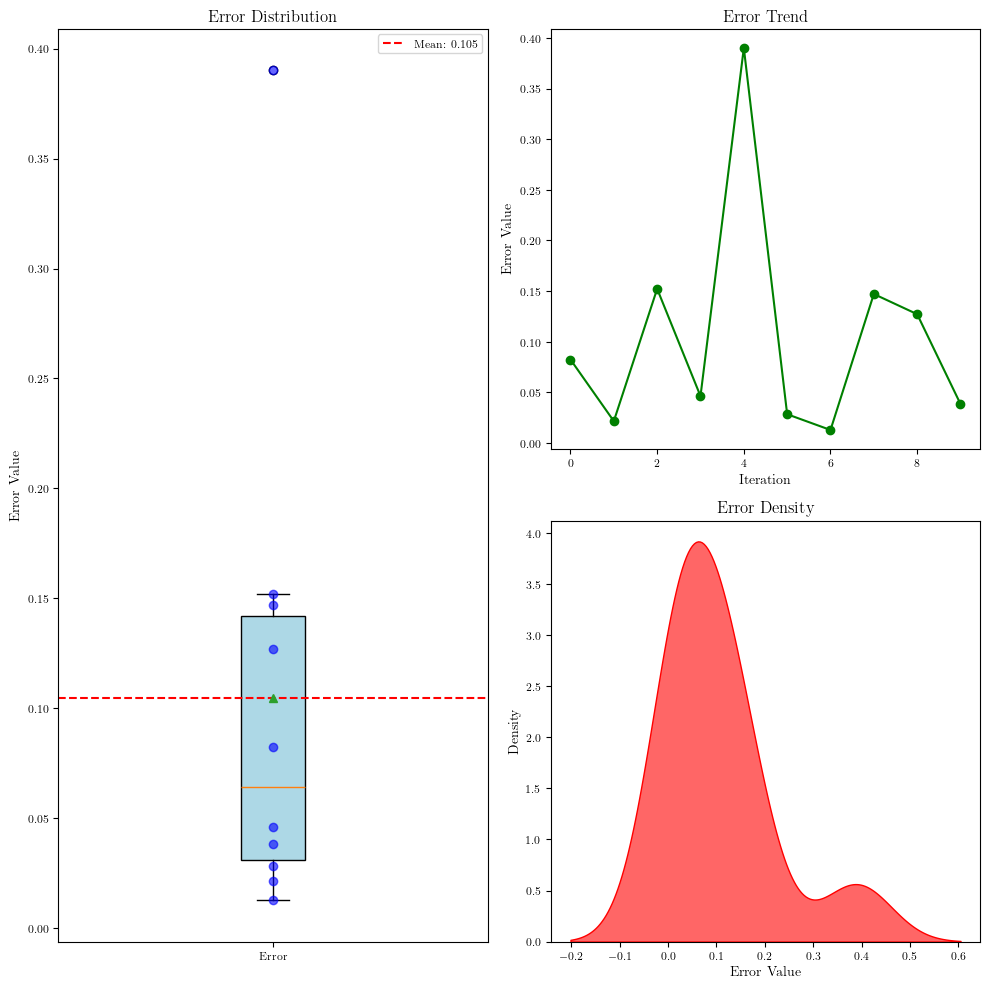

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_u

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

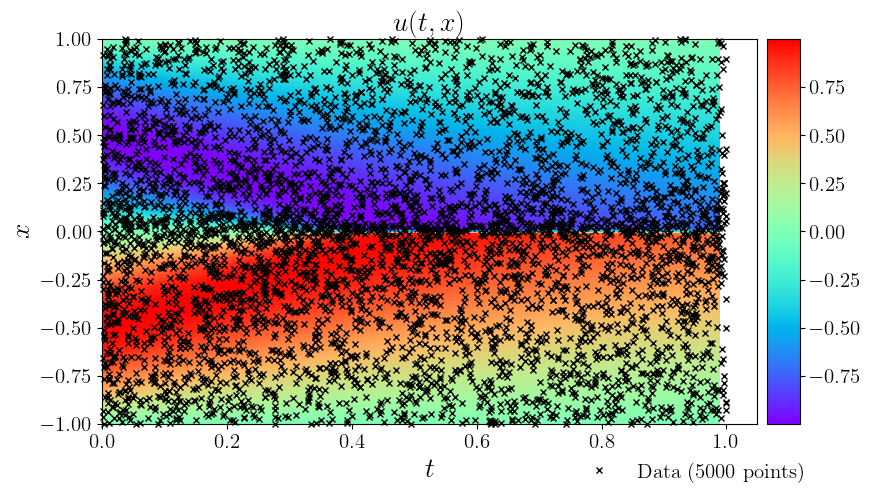

In [14]:
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f_train[:,1], 
    X_f_train[:,0], 
    'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [15]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()

testerror = torch.stack(model.test_error).cpu().detach().numpy()

54976
[2.9413575e-01 2.7206767e-01 2.5473842e-01 ... 5.5749635e-05 5.5749293e-05
 5.5748169e-05]


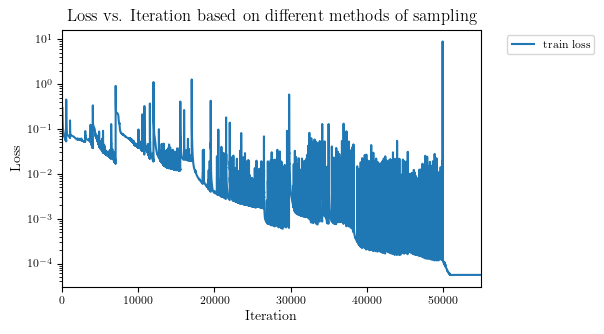

In [16]:
print(len(trainloss))
print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

54976
[1.0124097  1.0024621  0.99440116 ... 0.03846139 0.03846145 0.03846145]


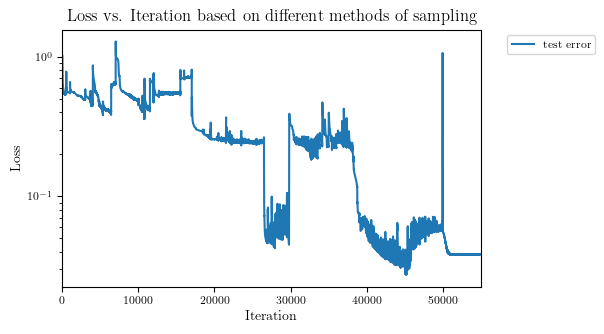

In [17]:
print(len(testerror))
print(testerror)
# 定义图例的标签
# labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(testerror, label='test error')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


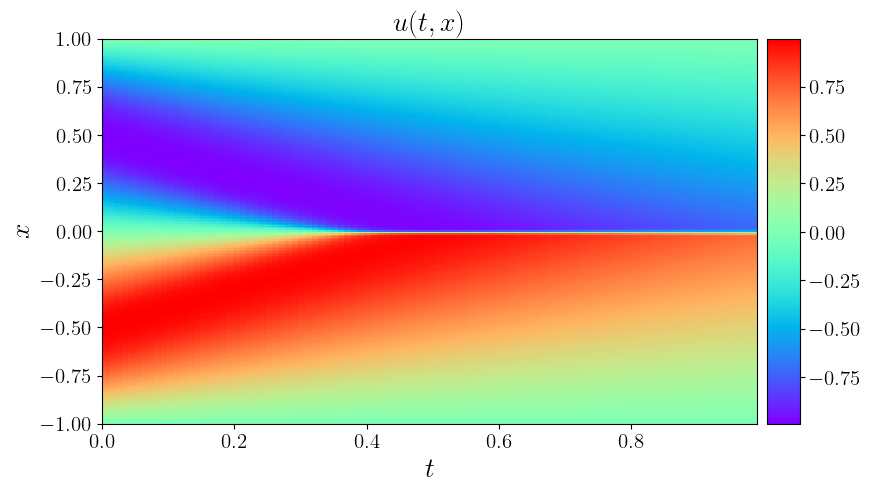

In [18]:
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred, f_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

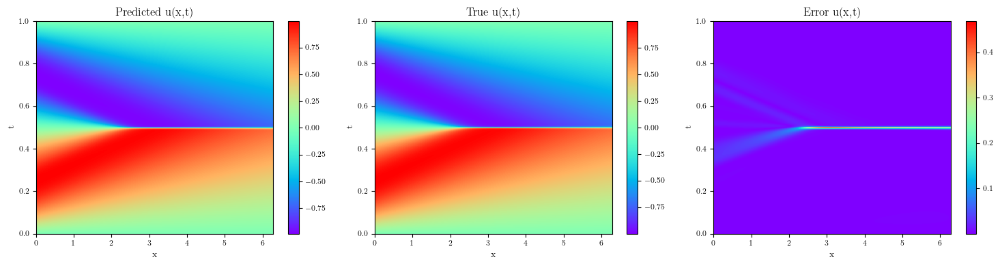

In [19]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [20]:

# # 创建一个包含三幅子图的图像
# fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# # 绘制第一幅图像
# axes[0].imshow(U_var.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
# axes[0].invert_yaxis()
# axes[0].set_xlabel('x')
# axes[0].set_ylabel('t')
# axes[0].set_title('Predicted u(x,t)')
# fig.colorbar(axes[0].images[0], ax=axes[0])

# # 绘制第二幅图像
# axes[1].imshow(U_var_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
# axes[1].invert_yaxis()
# axes[1].set_xlabel('x')
# axes[1].set_ylabel('t')
# axes[1].set_title('True u(x,t)')
# fig.colorbar(axes[1].images[0], ax=axes[1])

# # 自动调整子图参数，使得子图之间的间距适当
# plt.tight_layout()
# plt.show()

In [21]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

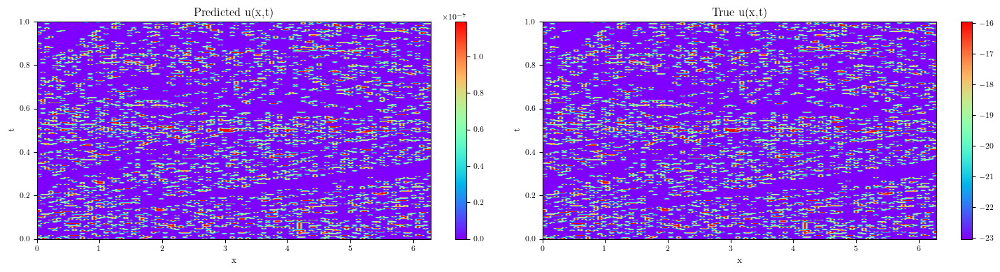

In [22]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()